## Bidirectional LSTM model na predikciu hodnot DST o 6 hodin dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+6_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 17:47:45.939120: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 6
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33:26 6s/step - loss: 0.4203 - mae: 0.5266

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3880 - mae: 0.4964 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.3686 - mae: 0.4798

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step - loss: 0.3508 - mae: 0.4626

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.3400 - mae: 0.4530

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3281 - mae: 0.4423

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.3545 - mae: 0.4437

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.3688 - mae: 0.4425

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.3794 - mae: 0.4414

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.3851 - mae: 0.4395

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.3978 - mae: 0.4416

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.4171 - mae: 0.4455

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.4315 - mae: 0.4482

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.4435 - mae: 0.4510

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.4518 - mae: 0.4524

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.4594 - mae: 0.4541

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.4654 - mae: 0.4554

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.4703 - mae: 0.4566

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.4773 - mae: 0.4581

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.4827 - mae: 0.4592

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.4872 - mae: 0.4602

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4904 - mae: 0.4608

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4939 - mae: 0.4618

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4964 - mae: 0.4625

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4981 - mae: 0.4630

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4995 - mae: 0.4634

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5004 - mae: 0.4636

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5013 - mae: 0.4641

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5018 - mae: 0.4644

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5021 - mae: 0.4646

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5021 - mae: 0.4648

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5025 - mae: 0.4650

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5025 - mae: 0.4651

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5025 - mae: 0.4652

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5025 - mae: 0.4653

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5022 - mae: 0.4653

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5016 - mae: 0.4651

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5012 - mae: 0.4651

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5005 - mae: 0.4649

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5025 - mae: 0.4652

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5043 - mae: 0.4655

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5059 - mae: 0.4658

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5074 - mae: 0.4661

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5087 - mae: 0.4664

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5100 - mae: 0.4667

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5112 - mae: 0.4670

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5130 - mae: 0.4674

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5145 - mae: 0.4677

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5159 - mae: 0.4680

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5172 - mae: 0.4682

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5183 - mae: 0.4684

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5193 - mae: 0.4686

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5201 - mae: 0.4688

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5208 - mae: 0.4688

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5218 - mae: 0.4690

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5228 - mae: 0.4691 

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5257 - mae: 0.4696

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5283 - mae: 0.4700

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5307 - mae: 0.4703

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5330 - mae: 0.4707

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5353 - mae: 0.4711

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5375 - mae: 0.4715

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5396 - mae: 0.4718

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5415 - mae: 0.4721

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5432 - mae: 0.4724

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5448 - mae: 0.4726

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5464 - mae: 0.4729

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5477 - mae: 0.4731

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5497 - mae: 0.4734

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5515 - mae: 0.4737

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5532 - mae: 0.4740

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5548 - mae: 0.4743

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5562 - mae: 0.4745

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5576 - mae: 0.4747

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5588 - mae: 0.4749

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5599 - mae: 0.4750

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5610 - mae: 0.4751

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5620 - mae: 0.4752

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5629 - mae: 0.4753

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5638 - mae: 0.4754

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5645 - mae: 0.4754

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5653 - mae: 0.4755

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5659 - mae: 0.4755

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5666 - mae: 0.4756

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5672 - mae: 0.4756

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5677 - mae: 0.4756

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5681 - mae: 0.4756

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5685 - mae: 0.4756

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5690 - mae: 0.4757

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5694 - mae: 0.4757

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5698 - mae: 0.4757

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5701 - mae: 0.4756

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5704 - mae: 0.4756

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5706 - mae: 0.4755

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5708 - mae: 0.4755

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5709 - mae: 0.4754

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5710 - mae: 0.4753

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5711 - mae: 0.4752

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5712 - mae: 0.4751

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5712 - mae: 0.4750

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5712 - mae: 0.4749

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5711 - mae: 0.4748

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5710 - mae: 0.4746

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5710 - mae: 0.4745

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5708 - mae: 0.4744

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5707 - mae: 0.4742

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5706 - mae: 0.4741

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5704 - mae: 0.4739

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5702 - mae: 0.4738

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5700 - mae: 0.4736

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5697 - mae: 0.4734

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5694 - mae: 0.4732

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5692 - mae: 0.4731

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5690 - mae: 0.4729

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5687 - mae: 0.4727

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5684 - mae: 0.4726

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5681 - mae: 0.4724

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5678 - mae: 0.4722

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5675 - mae: 0.4720

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5672 - mae: 0.4718

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5668 - mae: 0.4716

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5665 - mae: 0.4714

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5665 - mae: 0.4713

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5664 - mae: 0.4712

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5664 - mae: 0.4710

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5663 - mae: 0.4709

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5662 - mae: 0.4707

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5661 - mae: 0.4705

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5661 - mae: 0.4704

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.5660 - mae: 0.4703

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5659 - mae: 0.4702

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5658 - mae: 0.4700

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5656 - mae: 0.4699

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5655 - mae: 0.4697

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5655 - mae: 0.4696

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5655 - mae: 0.4695

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5655 - mae: 0.4694

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5654 - mae: 0.4692

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5654 - mae: 0.4691

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5653 - mae: 0.4690

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5652 - mae: 0.4689

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5652 - mae: 0.4688

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5651 - mae: 0.4687

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5649 - mae: 0.4685

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5648 - mae: 0.4684

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5647 - mae: 0.4683

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5645 - mae: 0.4682

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5644 - mae: 0.4680

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5642 - mae: 0.4679

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5641 - mae: 0.4678

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5639 - mae: 0.4676

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5637 - mae: 0.4675

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5635 - mae: 0.4674

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5633 - mae: 0.4672

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5631 - mae: 0.4671

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.5629 - mae: 0.4669

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.5628 - mae: 0.4668

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.5626 - mae: 0.4667

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.5624 - mae: 0.4665

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5622 - mae: 0.4664

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5620 - mae: 0.4663

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5618 - mae: 0.4661

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5616 - mae: 0.4660

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5614 - mae: 0.4659

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5612 - mae: 0.4657

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5610 - mae: 0.4656

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5608 - mae: 0.4655

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5606 - mae: 0.4653

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5605 - mae: 0.4652

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.5603 - mae: 0.4651

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5601 - mae: 0.4650

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5599 - mae: 0.4649

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5598 - mae: 0.4648

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5596 - mae: 0.4647

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5594 - mae: 0.4646

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5592 - mae: 0.4644

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5590 - mae: 0.4643

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5588 - mae: 0.4642

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5586 - mae: 0.4641

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5584 - mae: 0.4640

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5582 - mae: 0.4639

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.5581 - mae: 0.4638

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5579 - mae: 0.4637

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5578 - mae: 0.4636

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5576 - mae: 0.4635

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5574 - mae: 0.4634

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5573 - mae: 0.4633

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5571 - mae: 0.4632

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5569 - mae: 0.4631

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5568 - mae: 0.4630

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5566 - mae: 0.4629

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5564 - mae: 0.4628

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5562 - mae: 0.4627

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5560 - mae: 0.4626

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5558 - mae: 0.4625

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5556 - mae: 0.4624

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.5554 - mae: 0.4623

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5552 - mae: 0.4622

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5550 - mae: 0.4621

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5548 - mae: 0.4620

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5546 - mae: 0.4619

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5544 - mae: 0.4618

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5542 - mae: 0.4617

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5540 - mae: 0.4616

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5538 - mae: 0.4614

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5536 - mae: 0.4613

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5534 - mae: 0.4612

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.5531 - mae: 0.4611

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.5529 - mae: 0.4610

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5527 - mae: 0.4609

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5524 - mae: 0.4608

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5522 - mae: 0.4607

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5520 - mae: 0.4606

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5518 - mae: 0.4605

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5515 - mae: 0.4604

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5513 - mae: 0.4602

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5511 - mae: 0.4601

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5508 - mae: 0.4600

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5506 - mae: 0.4599

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5503 - mae: 0.4598

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.5501 - mae: 0.4597

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5498 - mae: 0.4596

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5496 - mae: 0.4595

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5493 - mae: 0.4594

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5491 - mae: 0.4593

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5488 - mae: 0.4591

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5485 - mae: 0.4590

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5483 - mae: 0.4589

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5480 - mae: 0.4588

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5477 - mae: 0.4587

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5474 - mae: 0.4586

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5472 - mae: 0.4584

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5469 - mae: 0.4583

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5466 - mae: 0.4582

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5463 - mae: 0.4581

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.5461 - mae: 0.4580

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5458 - mae: 0.4579

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5456 - mae: 0.4578

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5453 - mae: 0.4577

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5450 - mae: 0.4576

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5448 - mae: 0.4574

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5445 - mae: 0.4573

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5442 - mae: 0.4572

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5440 - mae: 0.4571

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5437 - mae: 0.4570

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5435 - mae: 0.4569

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5433 - mae: 0.4568

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5432 - mae: 0.4567

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5430 - mae: 0.4567

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5428 - mae: 0.4566

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5426 - mae: 0.4565

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.5424 - mae: 0.4564

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5422 - mae: 0.4563

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5420 - mae: 0.4562

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5418 - mae: 0.4561

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5416 - mae: 0.4560

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5414 - mae: 0.4560

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5413 - mae: 0.4559

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5411 - mae: 0.4558

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5410 - mae: 0.4557

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5409 - mae: 0.4556

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5407 - mae: 0.4556

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5406 - mae: 0.4555

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5404 - mae: 0.4554

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5403 - mae: 0.4553

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5402 - mae: 0.4553

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.5400 - mae: 0.4552

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5399 - mae: 0.4551

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5397 - mae: 0.4551

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5396 - mae: 0.4550

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5394 - mae: 0.4549

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5393 - mae: 0.4548

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5392 - mae: 0.4548

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5390 - mae: 0.4547

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5389 - mae: 0.4546

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5387 - mae: 0.4545

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5386 - mae: 0.4545

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5384 - mae: 0.4544

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5383 - mae: 0.4543

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5382 - mae: 0.4543

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.5380 - mae: 0.4542

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5379 - mae: 0.4541

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5378 - mae: 0.4541

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5377 - mae: 0.4540

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5375 - mae: 0.4540

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5374 - mae: 0.4539

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5373 - mae: 0.4539

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5372 - mae: 0.4538

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5371 - mae: 0.4537

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5370 - mae: 0.4537

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5368 - mae: 0.4536

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5367 - mae: 0.4536

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5366 - mae: 0.4535

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5365 - mae: 0.4534

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5363 - mae: 0.4534

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.5362 - mae: 0.4533

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5361 - mae: 0.4533

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5359 - mae: 0.4532

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5358 - mae: 0.4531

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5356 - mae: 0.4531

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5355 - mae: 0.4530

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5354 - mae: 0.4530

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5352 - mae: 0.4529

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.5351 - mae: 0.4528

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5349 - mae: 0.4528

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5348 - mae: 0.4527

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5346 - mae: 0.4526

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5345 - mae: 0.4526

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5344 - mae: 0.4525

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5342 - mae: 0.4525

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5341 - mae: 0.4524

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.5339 - mae: 0.4523

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5338 - mae: 0.4523

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5336 - mae: 0.4522

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5335 - mae: 0.4521

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5333 - mae: 0.4521

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5332 - mae: 0.4520

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5330 - mae: 0.4519

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5329 - mae: 0.4519

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5327 - mae: 0.4518

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5326 - mae: 0.4517

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5324 - mae: 0.4517

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5322 - mae: 0.4516

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5321 - mae: 0.4515

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5319 - mae: 0.4514

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5318 - mae: 0.4514

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.5316 - mae: 0.4513

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5314 - mae: 0.4512

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5313 - mae: 0.4512

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5311 - mae: 0.4511

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5310 - mae: 0.4510

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5308 - mae: 0.4510

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5306 - mae: 0.4509

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5305 - mae: 0.4508

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5303 - mae: 0.4507

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5301 - mae: 0.4507

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5300 - mae: 0.4506

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5298 - mae: 0.4505

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5297 - mae: 0.4505

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5295 - mae: 0.4504

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5294 - mae: 0.4503

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.5292 - mae: 0.4503

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5291 - mae: 0.4502

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5290 - mae: 0.4502

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5288 - mae: 0.4501

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5287 - mae: 0.4500

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5285 - mae: 0.4500

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5284 - mae: 0.4499

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5283 - mae: 0.4499

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5281 - mae: 0.4498

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5280 - mae: 0.4498

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5279 - mae: 0.4497

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5277 - mae: 0.4496

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5276 - mae: 0.4496

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5274 - mae: 0.4495

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5273 - mae: 0.4495

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.5272 - mae: 0.4494

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5270 - mae: 0.4494

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5269 - mae: 0.4493

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5267 - mae: 0.4493

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5266 - mae: 0.4492

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5265 - mae: 0.4492

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5263 - mae: 0.4491

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5262 - mae: 0.4490

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5261 - mae: 0.4490

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5259 - mae: 0.4489

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5258 - mae: 0.4489

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5256 - mae: 0.4488

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5255 - mae: 0.4488

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5254 - mae: 0.4487

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5252 - mae: 0.4487

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.5251 - mae: 0.4486

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5250 - mae: 0.4486

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5248 - mae: 0.4485

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5247 - mae: 0.4485

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5246 - mae: 0.4484

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5244 - mae: 0.4484

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5243 - mae: 0.4484

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5242 - mae: 0.4483

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5241 - mae: 0.4483

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5239 - mae: 0.4482

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5238 - mae: 0.4482

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5237 - mae: 0.4481

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5235 - mae: 0.4481

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5234 - mae: 0.4480

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5233 - mae: 0.4480

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.5231 - mae: 0.4479

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5230 - mae: 0.4479

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5229 - mae: 0.4478

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5227 - mae: 0.4478

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5226 - mae: 0.4477

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5225 - mae: 0.4477

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5223 - mae: 0.4476

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5222 - mae: 0.4476

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5221 - mae: 0.4475

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5219 - mae: 0.4475

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5218 - mae: 0.4474

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5217 - mae: 0.4474

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5215 - mae: 0.4473

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5214 - mae: 0.4473

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.5212 - mae: 0.4472

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5211 - mae: 0.4472

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5210 - mae: 0.4471

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5208 - mae: 0.4471

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5207 - mae: 0.4470

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5205 - mae: 0.4470

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5204 - mae: 0.4469

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5203 - mae: 0.4469

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5201 - mae: 0.4468

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5200 - mae: 0.4468

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5198 - mae: 0.4468

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5197 - mae: 0.4467

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5196 - mae: 0.4467

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5194 - mae: 0.4466

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5193 - mae: 0.4466

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.5192 - mae: 0.4465

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5190 - mae: 0.4465

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5189 - mae: 0.4464

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5188 - mae: 0.4464

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5186 - mae: 0.4463

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5185 - mae: 0.4463

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5183 - mae: 0.4463

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5182 - mae: 0.4462

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5181 - mae: 0.4462

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5179 - mae: 0.4461

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5178 - mae: 0.4461

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5177 - mae: 0.4460

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5175 - mae: 0.4460

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5174 - mae: 0.4459

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.5172 - mae: 0.4459

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5171 - mae: 0.4458

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5170 - mae: 0.4458

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5168 - mae: 0.4458

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5167 - mae: 0.4457

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5165 - mae: 0.4457

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5164 - mae: 0.4456

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5163 - mae: 0.4456

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5161 - mae: 0.4455

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5160 - mae: 0.4455

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5158 - mae: 0.4454

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5157 - mae: 0.4454

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5156 - mae: 0.4453

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5154 - mae: 0.4453

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.5153 - mae: 0.4453

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5152 - mae: 0.4452

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5151 - mae: 0.4452

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5149 - mae: 0.4451

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5148 - mae: 0.4451

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5147 - mae: 0.4451

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5146 - mae: 0.4450

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5144 - mae: 0.4450

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5143 - mae: 0.4449

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5142 - mae: 0.4449

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5141 - mae: 0.4449

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5140 - mae: 0.4448

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5139 - mae: 0.4448

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5138 - mae: 0.4448

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5136 - mae: 0.4447

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.5135 - mae: 0.4447

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5134 - mae: 0.4447

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5133 - mae: 0.4446

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5132 - mae: 0.4446

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5131 - mae: 0.4446

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5130 - mae: 0.4445

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5129 - mae: 0.4445

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5128 - mae: 0.4445

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5127 - mae: 0.4444

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5126 - mae: 0.4444

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5125 - mae: 0.4444

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5124 - mae: 0.4443

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5123 - mae: 0.4443

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5122 - mae: 0.4443

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.5121 - mae: 0.4443

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5120 - mae: 0.4442

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5119 - mae: 0.4442

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5118 - mae: 0.4442

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5117 - mae: 0.4441

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5116 - mae: 0.4441

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5115 - mae: 0.4441

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5114 - mae: 0.4441

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5113 - mae: 0.4440

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5112 - mae: 0.4440

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5111 - mae: 0.4440

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5110 - mae: 0.4440

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5109 - mae: 0.4439

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5108 - mae: 0.4439

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5107 - mae: 0.4439

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.5107 - mae: 0.4438

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5106 - mae: 0.4438

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5105 - mae: 0.4438

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5104 - mae: 0.4438

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5103 - mae: 0.4437

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5102 - mae: 0.4437

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5101 - mae: 0.4437

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5100 - mae: 0.4437

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5099 - mae: 0.4436

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5098 - mae: 0.4436

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5098 - mae: 0.4436

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5097 - mae: 0.4435

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5096 - mae: 0.4435

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5095 - mae: 0.4435

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.5094 - mae: 0.4435

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5093 - mae: 0.4434

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5092 - mae: 0.4434

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5091 - mae: 0.4434

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5090 - mae: 0.4434

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5089 - mae: 0.4433

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5088 - mae: 0.4433

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5088 - mae: 0.4433

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5087 - mae: 0.4432

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5086 - mae: 0.4432

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5085 - mae: 0.4432

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5084 - mae: 0.4432

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5083 - mae: 0.4431

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5082 - mae: 0.4431

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.5081 - mae: 0.4431

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5080 - mae: 0.4430

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5079 - mae: 0.4430

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5078 - mae: 0.4430

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5077 - mae: 0.4430

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5076 - mae: 0.4429

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5075 - mae: 0.4429

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5075 - mae: 0.4429

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5074 - mae: 0.4428

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5073 - mae: 0.4428

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5072 - mae: 0.4428

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5071 - mae: 0.4428

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5070 - mae: 0.4427

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5069 - mae: 0.4427

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5068 - mae: 0.4427

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.5068 - mae: 0.4426

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5067 - mae: 0.4426

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5066 - mae: 0.4426

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5065 - mae: 0.4426

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5064 - mae: 0.4425

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5063 - mae: 0.4425

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5062 - mae: 0.4425

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5062 - mae: 0.4425

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5061 - mae: 0.4424

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5060 - mae: 0.4424

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5059 - mae: 0.4424

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5058 - mae: 0.4424

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5057 - mae: 0.4423

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5056 - mae: 0.4423

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.5056 - mae: 0.4423

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5055 - mae: 0.4423

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5054 - mae: 0.4422

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5053 - mae: 0.4422

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5052 - mae: 0.4422

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5051 - mae: 0.4422

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5051 - mae: 0.4421

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5050 - mae: 0.4421

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5049 - mae: 0.4421

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5048 - mae: 0.4421

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5047 - mae: 0.4420

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5046 - mae: 0.4420

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5046 - mae: 0.4420

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5045 - mae: 0.4420

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5044 - mae: 0.4419

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.5043 - mae: 0.4419

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5042 - mae: 0.4419

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5041 - mae: 0.4419

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5040 - mae: 0.4418

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5039 - mae: 0.4418

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5039 - mae: 0.4418

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5038 - mae: 0.4418

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5037 - mae: 0.4417

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5036 - mae: 0.4417

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5035 - mae: 0.4417

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5034 - mae: 0.4416

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5033 - mae: 0.4416

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5032 - mae: 0.4416

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5031 - mae: 0.4416

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.5031 - mae: 0.4415

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5030 - mae: 0.4415

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5029 - mae: 0.4415

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5028 - mae: 0.4415

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5027 - mae: 0.4414

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5026 - mae: 0.4414

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5025 - mae: 0.4414

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5024 - mae: 0.4413

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5023 - mae: 0.4413

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5022 - mae: 0.4413

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5022 - mae: 0.4413

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5021 - mae: 0.4412

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5020 - mae: 0.4412

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5019 - mae: 0.4412

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5018 - mae: 0.4412

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.5017 - mae: 0.4411

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5016 - mae: 0.4411

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5016 - mae: 0.4411

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5015 - mae: 0.4410

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5014 - mae: 0.4410

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5013 - mae: 0.4410

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5012 - mae: 0.4410

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5011 - mae: 0.4409

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5011 - mae: 0.4409

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5010 - mae: 0.4409

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.5009 - mae: 0.4409

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5008 - mae: 0.4408

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5007 - mae: 0.4408

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5006 - mae: 0.4408

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5005 - mae: 0.4408

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5005 - mae: 0.4407

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5004 - mae: 0.4407

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5003 - mae: 0.4407

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5002 - mae: 0.4407

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5001 - mae: 0.4406

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5000 - mae: 0.4406

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5000 - mae: 0.4406

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4999 - mae: 0.4406

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4998 - mae: 0.4405

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4997 - mae: 0.4405

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4996 - mae: 0.4405

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4996 - mae: 0.4405

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4995 - mae: 0.4404

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4994 - mae: 0.4404

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4993 - mae: 0.4404

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4992 - mae: 0.4404

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4992 - mae: 0.4403

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4991 - mae: 0.4403

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4990 - mae: 0.4403

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4989 - mae: 0.4403

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4988 - mae: 0.4402

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4988 - mae: 0.4402

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4987 - mae: 0.4402

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4986 - mae: 0.4402

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4985 - mae: 0.4401

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4985 - mae: 0.4401

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4984 - mae: 0.4401

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4983 - mae: 0.4401

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4982 - mae: 0.4401

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4981 - mae: 0.4400

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4981 - mae: 0.4400

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4980 - mae: 0.4400

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4979 - mae: 0.4400

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4978 - mae: 0.4399

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4978 - mae: 0.4399

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4977 - mae: 0.4399

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4976 - mae: 0.4399

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4975 - mae: 0.4398

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4975 - mae: 0.4398

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4974 - mae: 0.4398

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4973 - mae: 0.4398

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4972 - mae: 0.4397

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4972 - mae: 0.4397

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4971 - mae: 0.4397

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4970 - mae: 0.4397

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4969 - mae: 0.4396

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4969 - mae: 0.4396

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4968 - mae: 0.4396

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4967 - mae: 0.4396

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4966 - mae: 0.4395

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4965 - mae: 0.4395

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4965 - mae: 0.4395

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4964 - mae: 0.4395

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4963 - mae: 0.4394

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4962 - mae: 0.4394

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4962 - mae: 0.4394

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4961 - mae: 0.4394

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4960 - mae: 0.4394

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4959 - mae: 0.4393

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4958 - mae: 0.4393

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4958 - mae: 0.4393

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4957 - mae: 0.4393

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4956 - mae: 0.4392

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4955 - mae: 0.4392

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4954 - mae: 0.4392

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4954 - mae: 0.4392

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4953 - mae: 0.4391

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4952 - mae: 0.4391

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4951 - mae: 0.4391

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4951 - mae: 0.4391

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4950 - mae: 0.4390

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4949 - mae: 0.4390

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4948 - mae: 0.4390

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4947 - mae: 0.4390

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4947 - mae: 0.4389

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4946 - mae: 0.4389

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4945 - mae: 0.4389

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4944 - mae: 0.4389

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4944 - mae: 0.4388

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4943 - mae: 0.4388

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4942 - mae: 0.4388

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4941 - mae: 0.4388

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4940 - mae: 0.4387

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4940 - mae: 0.4387

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4939 - mae: 0.4387

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4938 - mae: 0.4387

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4937 - mae: 0.4386

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.4936 - mae: 0.4386

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4936 - mae: 0.4386

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4935 - mae: 0.4386

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4934 - mae: 0.4385

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4933 - mae: 0.4385

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4932 - mae: 0.4385

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4932 - mae: 0.4385

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4931 - mae: 0.4384

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4930 - mae: 0.4384

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4929 - mae: 0.4384

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4928 - mae: 0.4384

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4928 - mae: 0.4383

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4927 - mae: 0.4383

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4926 - mae: 0.4383

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.4925 - mae: 0.4383

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4924 - mae: 0.4383

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4924 - mae: 0.4382

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4923 - mae: 0.4382

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4922 - mae: 0.4382

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4921 - mae: 0.4382

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4920 - mae: 0.4381

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4920 - mae: 0.4381

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4919 - mae: 0.4381

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4918 - mae: 0.4381

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4917 - mae: 0.4380

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4916 - mae: 0.4380

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4916 - mae: 0.4380

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4915 - mae: 0.4380

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4914 - mae: 0.4379

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.4913 - mae: 0.4379

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4912 - mae: 0.4379

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4911 - mae: 0.4379

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4911 - mae: 0.4378

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4910 - mae: 0.4378

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4909 - mae: 0.4378

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4908 - mae: 0.4378

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4908 - mae: 0.4377

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4907 - mae: 0.4377

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4906 - mae: 0.4377

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4905 - mae: 0.4377

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4904 - mae: 0.4376

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4904 - mae: 0.4376

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4903 - mae: 0.4376

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4902 - mae: 0.4376

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.4901 - mae: 0.4375

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4900 - mae: 0.4375

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4899 - mae: 0.4375

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4899 - mae: 0.4375

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4898 - mae: 0.4374

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4897 - mae: 0.4374

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4896 - mae: 0.4374

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4895 - mae: 0.4374

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4895 - mae: 0.4373

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4894 - mae: 0.4373

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4893 - mae: 0.4373

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4892 - mae: 0.4373

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4891 - mae: 0.4372

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4891 - mae: 0.4372

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.4890 - mae: 0.4372

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4889 - mae: 0.4371 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4888 - mae: 0.4371

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4887 - mae: 0.4371

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4887 - mae: 0.4371

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4886 - mae: 0.4371

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4885 - mae: 0.4370

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4884 - mae: 0.4370

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4883 - mae: 0.4370

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4883 - mae: 0.4370

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4882 - mae: 0.4369

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4881 - mae: 0.4369

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4880 - mae: 0.4369

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4880 - mae: 0.4369

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4879 - mae: 0.4368

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.4878 - mae: 0.4368

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4877 - mae: 0.4368

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4876 - mae: 0.4368

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4876 - mae: 0.4367

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4875 - mae: 0.4367

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4874 - mae: 0.4367

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4873 - mae: 0.4367

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4873 - mae: 0.4366

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4872 - mae: 0.4366

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4871 - mae: 0.4366

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4870 - mae: 0.4366

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4870 - mae: 0.4365

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4869 - mae: 0.4365

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4868 - mae: 0.4365

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.4868 - mae: 0.4365

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4867 - mae: 0.4364

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4866 - mae: 0.4364

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4865 - mae: 0.4364

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4865 - mae: 0.4364

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4864 - mae: 0.4364

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4863 - mae: 0.4363

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4863 - mae: 0.4363

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4862 - mae: 0.4363

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4861 - mae: 0.4363

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4861 - mae: 0.4363

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4860 - mae: 0.4362

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4859 - mae: 0.4362

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4858 - mae: 0.4362

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4858 - mae: 0.4362

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.4857 - mae: 0.4361

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4856 - mae: 0.4361

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4856 - mae: 0.4361

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4855 - mae: 0.4361

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4854 - mae: 0.4361

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4854 - mae: 0.4360

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4853 - mae: 0.4360

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4853 - mae: 0.4360

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4852 - mae: 0.4360

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4851 - mae: 0.4360

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4851 - mae: 0.4360

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4850 - mae: 0.4359

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4849 - mae: 0.4359

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4849 - mae: 0.4359

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4848 - mae: 0.4359

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.4848 - mae: 0.4359

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4847 - mae: 0.4358

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4846 - mae: 0.4358

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4846 - mae: 0.4358

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4845 - mae: 0.4358

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4845 - mae: 0.4358

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4844 - mae: 0.4358

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4843 - mae: 0.4357

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4843 - mae: 0.4357

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4842 - mae: 0.4357

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4842 - mae: 0.4357

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4841 - mae: 0.4357

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4841 - mae: 0.4357

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4840 - mae: 0.4356

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.4839 - mae: 0.4356

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4839 - mae: 0.4356

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4838 - mae: 0.4356

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4838 - mae: 0.4356

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4837 - mae: 0.4355

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4836 - mae: 0.4355

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4836 - mae: 0.4355

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4835 - mae: 0.4355

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4835 - mae: 0.4355

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4834 - mae: 0.4355

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4834 - mae: 0.4354

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4833 - mae: 0.4354

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4832 - mae: 0.4354

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4832 - mae: 0.4354

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4831 - mae: 0.4354

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.4831 - mae: 0.4354

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4830 - mae: 0.4353

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4830 - mae: 0.4353

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4829 - mae: 0.4353

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4828 - mae: 0.4353

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4828 - mae: 0.4353

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4827 - mae: 0.4353

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4827 - mae: 0.4352

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4826 - mae: 0.4352

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4826 - mae: 0.4352

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4825 - mae: 0.4352

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4824 - mae: 0.4352

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4824 - mae: 0.4352

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4823 - mae: 0.4351

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4823 - mae: 0.4351

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.4822 - mae: 0.4351

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4822 - mae: 0.4351

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4821 - mae: 0.4351

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4820 - mae: 0.4351

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4820 - mae: 0.4350

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4819 - mae: 0.4350

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4819 - mae: 0.4350

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4818 - mae: 0.4350

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4818 - mae: 0.4350

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4817 - mae: 0.4350

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4816 - mae: 0.4349

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4816 - mae: 0.4349

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4815 - mae: 0.4349

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4815 - mae: 0.4349

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.4814 - mae: 0.4349

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4813 - mae: 0.4349

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4813 - mae: 0.4348

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4812 - mae: 0.4348

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4812 - mae: 0.4348

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4811 - mae: 0.4348

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4811 - mae: 0.4348

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4810 - mae: 0.4348

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4809 - mae: 0.4347

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4809 - mae: 0.4347

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4808 - mae: 0.4347

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4808 - mae: 0.4347

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4807 - mae: 0.4347

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4807 - mae: 0.4347

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4806 - mae: 0.4346

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.4805 - mae: 0.4346

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4805 - mae: 0.4346

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4804 - mae: 0.4346

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4804 - mae: 0.4346

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4803 - mae: 0.4346

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4803 - mae: 0.4345

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4802 - mae: 0.4345

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4802 - mae: 0.4345

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4802 - mae: 0.4345

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4801 - mae: 0.4345

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4801 - mae: 0.4345

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4800 - mae: 0.4344

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4800 - mae: 0.4344

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4799 - mae: 0.4344

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4799 - mae: 0.4344

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.4798 - mae: 0.4344


Epoch 1: val_mae improved from inf to 0.51918, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 74s 76ms/step - loss: 0.4798 - mae: 0.4344 - val_loss: 0.7564 - val_mae: 0.5192


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.4417 - mae: 0.4924

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.3804 - mae: 0.4550 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3391 - mae: 0.4264

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3098 - mae: 0.4054

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3043 - mae: 0.3975

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3063 - mae: 0.3942

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3169 - mae: 0.3969

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3225 - mae: 0.3981

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3236 - mae: 0.3970

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3227 - mae: 0.3951

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3302 - mae: 0.3978

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3348 - mae: 0.3993

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3370 - mae: 0.3996

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3482 - mae: 0.4021

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3569 - mae: 0.4039

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3638 - mae: 0.4052

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3686 - mae: 0.4057

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3727 - mae: 0.4062

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3758 - mae: 0.4067

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3779 - mae: 0.4068

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3797 - mae: 0.4069

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3810 - mae: 0.4069

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3818 - mae: 0.4067

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3820 - mae: 0.4063

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3819 - mae: 0.4059

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3815 - mae: 0.4052

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3809 - mae: 0.4046

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3812 - mae: 0.4043

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3813 - mae: 0.4041

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3813 - mae: 0.4038

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3813 - mae: 0.4037 

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3810 - mae: 0.4035

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3808 - mae: 0.4033

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3805 - mae: 0.4031

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3802 - mae: 0.4029

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3796 - mae: 0.4027

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3790 - mae: 0.4024

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3785 - mae: 0.4022

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3780 - mae: 0.4019

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3778 - mae: 0.4018

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3773 - mae: 0.4015

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3768 - mae: 0.4012

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3764 - mae: 0.4010

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3759 - mae: 0.4008

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3754 - mae: 0.4006

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3749 - mae: 0.4004

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3744 - mae: 0.4001

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3740 - mae: 0.3999

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3736 - mae: 0.3998

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3732 - mae: 0.3996

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3728 - mae: 0.3995

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3724 - mae: 0.3993

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3719 - mae: 0.3991

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3715 - mae: 0.3989

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3709 - mae: 0.3987

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3704 - mae: 0.3985

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3698 - mae: 0.3982

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3692 - mae: 0.3980

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3686 - mae: 0.3977

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3680 - mae: 0.3975

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3674 - mae: 0.3972

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3668 - mae: 0.3970

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3661 - mae: 0.3967

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3655 - mae: 0.3964

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3649 - mae: 0.3962

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3643 - mae: 0.3959

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3637 - mae: 0.3957

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3632 - mae: 0.3955

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3626 - mae: 0.3953

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3622 - mae: 0.3951

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3619 - mae: 0.3949

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3615 - mae: 0.3948

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3612 - mae: 0.3946

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3608 - mae: 0.3944

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3604 - mae: 0.3943

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3601 - mae: 0.3941

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3597 - mae: 0.3940

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3594 - mae: 0.3938

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3590 - mae: 0.3937

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3586 - mae: 0.3935

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3582 - mae: 0.3933

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3578 - mae: 0.3932

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3574 - mae: 0.3930

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3569 - mae: 0.3928

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3565 - mae: 0.3926

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3560 - mae: 0.3924

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3556 - mae: 0.3922

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3551 - mae: 0.3920

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3546 - mae: 0.3918

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3541 - mae: 0.3916

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3536 - mae: 0.3914

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3532 - mae: 0.3912

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3527 - mae: 0.3910

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3522 - mae: 0.3907

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3517 - mae: 0.3905

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3512 - mae: 0.3903

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3508 - mae: 0.3901

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3504 - mae: 0.3900

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3499 - mae: 0.3898

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3495 - mae: 0.3896

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3491 - mae: 0.3894

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3486 - mae: 0.3893

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3482 - mae: 0.3891

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3478 - mae: 0.3889

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3474 - mae: 0.3888

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3470 - mae: 0.3886

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3466 - mae: 0.3885

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3462 - mae: 0.3883

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3458 - mae: 0.3882

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3454 - mae: 0.3880

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3450 - mae: 0.3879

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3447 - mae: 0.3878

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3444 - mae: 0.3877

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3440 - mae: 0.3875

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3436 - mae: 0.3874

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3433 - mae: 0.3873

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3430 - mae: 0.3872

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3426 - mae: 0.3870

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3422 - mae: 0.3869

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3419 - mae: 0.3868

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3415 - mae: 0.3866

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3412 - mae: 0.3865

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3408 - mae: 0.3863

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3404 - mae: 0.3862

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3401 - mae: 0.3861

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3397 - mae: 0.3860

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3394 - mae: 0.3858

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3390 - mae: 0.3857

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3387 - mae: 0.3856

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3384 - mae: 0.3855

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3380 - mae: 0.3853

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3377 - mae: 0.3852

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3373 - mae: 0.3851

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3370 - mae: 0.3850

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.3366 - mae: 0.3849

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.3363 - mae: 0.3847

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.3360 - mae: 0.3846

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.3356 - mae: 0.3845

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3353 - mae: 0.3844

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3350 - mae: 0.3843

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3347 - mae: 0.3842

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3344 - mae: 0.3841

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3341 - mae: 0.3839

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3338 - mae: 0.3838

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3334 - mae: 0.3837

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3331 - mae: 0.3836

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3328 - mae: 0.3835

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3325 - mae: 0.3833

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3321 - mae: 0.3832

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3318 - mae: 0.3831

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3315 - mae: 0.3830

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3312 - mae: 0.3829

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3309 - mae: 0.3827

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3306 - mae: 0.3826

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3303 - mae: 0.3825

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3300 - mae: 0.3824

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3297 - mae: 0.3823

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3294 - mae: 0.3822

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3291 - mae: 0.3821

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3288 - mae: 0.3820

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3285 - mae: 0.3818

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3282 - mae: 0.3817

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3280 - mae: 0.3816

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3277 - mae: 0.3815

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3274 - mae: 0.3814

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3272 - mae: 0.3813

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3269 - mae: 0.3812

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3267 - mae: 0.3811

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3264 - mae: 0.3810

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3262 - mae: 0.3809

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3259 - mae: 0.3808

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3257 - mae: 0.3807

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3255 - mae: 0.3806

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3253 - mae: 0.3806

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3250 - mae: 0.3805

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3248 - mae: 0.3804

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3246 - mae: 0.3803

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3244 - mae: 0.3803

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3242 - mae: 0.3802

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3240 - mae: 0.3801

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3238 - mae: 0.3800

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3235 - mae: 0.3800

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3233 - mae: 0.3799

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3231 - mae: 0.3798

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3229 - mae: 0.3797

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3227 - mae: 0.3797

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3225 - mae: 0.3796

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3223 - mae: 0.3795

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3221 - mae: 0.3795

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3220 - mae: 0.3794

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3218 - mae: 0.3794

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3217 - mae: 0.3793

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3215 - mae: 0.3793

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3214 - mae: 0.3792

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3212 - mae: 0.3792

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3211 - mae: 0.3791

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3211 - mae: 0.3791

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3210 - mae: 0.3790

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3210 - mae: 0.3790

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3209 - mae: 0.3790

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3209 - mae: 0.3789

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3208 - mae: 0.3789

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3207 - mae: 0.3789

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3207 - mae: 0.3788

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3207 - mae: 0.3788

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3206 - mae: 0.3788

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3206 - mae: 0.3788

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3206 - mae: 0.3787

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3206 - mae: 0.3787

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3205 - mae: 0.3787

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3205 - mae: 0.3787

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3205 - mae: 0.3787

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3205 - mae: 0.3787

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3204 - mae: 0.3786

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3204 - mae: 0.3786

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3204 - mae: 0.3786

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3203 - mae: 0.3786

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3203 - mae: 0.3786

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3203 - mae: 0.3785

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3202 - mae: 0.3785

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3202 - mae: 0.3785

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3202 - mae: 0.3785

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3202 - mae: 0.3785

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3202 - mae: 0.3785

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3201 - mae: 0.3784

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3201 - mae: 0.3784

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3201 - mae: 0.3784

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3201 - mae: 0.3784

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3200 - mae: 0.3784

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3201 - mae: 0.3784

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3202 - mae: 0.3784

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3202 - mae: 0.3784

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3202 - mae: 0.3784

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3202 - mae: 0.3784

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3202 - mae: 0.3784

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3203 - mae: 0.3784

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3203 - mae: 0.3784

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3203 - mae: 0.3784

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3204 - mae: 0.3784

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3204 - mae: 0.3785

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3205 - mae: 0.3785

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3205 - mae: 0.3785

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3205 - mae: 0.3785

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3206 - mae: 0.3785

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3206 - mae: 0.3785

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3207 - mae: 0.3785

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3207 - mae: 0.3786

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3207 - mae: 0.3786

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3208 - mae: 0.3786

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3208 - mae: 0.3786

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3209 - mae: 0.3786

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3209 - mae: 0.3787

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3210 - mae: 0.3787

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3210 - mae: 0.3787

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3211 - mae: 0.3787

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3211 - mae: 0.3787

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3211 - mae: 0.3787

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3212 - mae: 0.3788

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3212 - mae: 0.3788

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3213 - mae: 0.3788

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3213 - mae: 0.3788

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3214 - mae: 0.3788

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3214 - mae: 0.3789

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3215 - mae: 0.3789

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3216 - mae: 0.3789

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3216 - mae: 0.3789

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3217 - mae: 0.3790

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3217 - mae: 0.3790

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3218 - mae: 0.3790

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3219 - mae: 0.3790

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3219 - mae: 0.3791

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3220 - mae: 0.3791

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3221 - mae: 0.3791

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3221 - mae: 0.3791

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3222 - mae: 0.3792

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3222 - mae: 0.3792

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3223 - mae: 0.3792

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3223 - mae: 0.3792

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3224 - mae: 0.3793

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3225 - mae: 0.3793

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3225 - mae: 0.3793

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3225 - mae: 0.3793

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3226 - mae: 0.3794

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3226 - mae: 0.3794

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3227 - mae: 0.3794

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3227 - mae: 0.3794

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3228 - mae: 0.3794

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3228 - mae: 0.3795

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3229 - mae: 0.3795

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3229 - mae: 0.3795

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3229 - mae: 0.3795

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3230 - mae: 0.3795

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3230 - mae: 0.3795

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3231 - mae: 0.3796

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3231 - mae: 0.3796

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3232 - mae: 0.3796

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3232 - mae: 0.3796

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3233 - mae: 0.3796

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3233 - mae: 0.3796

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3234 - mae: 0.3797

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3234 - mae: 0.3797

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3234 - mae: 0.3797

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3235 - mae: 0.3797

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3236 - mae: 0.3797

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3236 - mae: 0.3798

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3237 - mae: 0.3798

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3238 - mae: 0.3798

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3238 - mae: 0.3798

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3239 - mae: 0.3798

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3240 - mae: 0.3798

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3240 - mae: 0.3799

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3241 - mae: 0.3799

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3242 - mae: 0.3799

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3242 - mae: 0.3799

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3243 - mae: 0.3799

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3243 - mae: 0.3799

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3244 - mae: 0.3800

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3244 - mae: 0.3800

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3245 - mae: 0.3800

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3246 - mae: 0.3800

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3246 - mae: 0.3800

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3247 - mae: 0.3800

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3248 - mae: 0.3801

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3248 - mae: 0.3801

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3249 - mae: 0.3801

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3250 - mae: 0.3801

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3250 - mae: 0.3802

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3251 - mae: 0.3802

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3252 - mae: 0.3802

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3252 - mae: 0.3802

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3253 - mae: 0.3802

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3254 - mae: 0.3803

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3255 - mae: 0.3803

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3255 - mae: 0.3803

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3256 - mae: 0.3803

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3257 - mae: 0.3803

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3257 - mae: 0.3804

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3258 - mae: 0.3804

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3258 - mae: 0.3804

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3259 - mae: 0.3804

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3260 - mae: 0.3804

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3260 - mae: 0.3805

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3261 - mae: 0.3805

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3261 - mae: 0.3805

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3262 - mae: 0.3805

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3263 - mae: 0.3805

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3263 - mae: 0.3805

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3264 - mae: 0.3806

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3264 - mae: 0.3806

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3265 - mae: 0.3806

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3265 - mae: 0.3806

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3266 - mae: 0.3806

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3266 - mae: 0.3807

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3267 - mae: 0.3807

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3267 - mae: 0.3807

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3268 - mae: 0.3807

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3269 - mae: 0.3807

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3269 - mae: 0.3807

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3270 - mae: 0.3808

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3270 - mae: 0.3808

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3271 - mae: 0.3808

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3271 - mae: 0.3808

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3272 - mae: 0.3808

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3272 - mae: 0.3808

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3273 - mae: 0.3809

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3274 - mae: 0.3809

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3274 - mae: 0.3809

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3275 - mae: 0.3809

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3275 - mae: 0.3809

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3276 - mae: 0.3809

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3276 - mae: 0.3810

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3277 - mae: 0.3810

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3277 - mae: 0.3810

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3278 - mae: 0.3810

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3279 - mae: 0.3810

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3279 - mae: 0.3810

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3280 - mae: 0.3811

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3280 - mae: 0.3811

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3281 - mae: 0.3811

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3281 - mae: 0.3811

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3282 - mae: 0.3811

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3282 - mae: 0.3811

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3283 - mae: 0.3812

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3283 - mae: 0.3812

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3284 - mae: 0.3812

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3284 - mae: 0.3812

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3285 - mae: 0.3812

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3285 - mae: 0.3812

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3286 - mae: 0.3812

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3286 - mae: 0.3813

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3287 - mae: 0.3813

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3287 - mae: 0.3813

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3288 - mae: 0.3813

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3289 - mae: 0.3813

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3289 - mae: 0.3813

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3290 - mae: 0.3814

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3290 - mae: 0.3814

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3291 - mae: 0.3814

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3291 - mae: 0.3814

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3292 - mae: 0.3814

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3293 - mae: 0.3814

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3293 - mae: 0.3814

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3294 - mae: 0.3815

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3295 - mae: 0.3815

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3295 - mae: 0.3815

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3296 - mae: 0.3815

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3297 - mae: 0.3815

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3297 - mae: 0.3815

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3298 - mae: 0.3816

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3298 - mae: 0.3816

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3299 - mae: 0.3816

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3300 - mae: 0.3816

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3300 - mae: 0.3816

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3301 - mae: 0.3816

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3302 - mae: 0.3817

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3302 - mae: 0.3817

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3303 - mae: 0.3817

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3303 - mae: 0.3817

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3304 - mae: 0.3817

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3304 - mae: 0.3817

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3305 - mae: 0.3817

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3305 - mae: 0.3818

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3306 - mae: 0.3818

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3307 - mae: 0.3818

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3307 - mae: 0.3818

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3308 - mae: 0.3818

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3308 - mae: 0.3818

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3309 - mae: 0.3818

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3309 - mae: 0.3819

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3310 - mae: 0.3819

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3310 - mae: 0.3819

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3311 - mae: 0.3819

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3311 - mae: 0.3819

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3312 - mae: 0.3819

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3313 - mae: 0.3819

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3313 - mae: 0.3819

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3313 - mae: 0.3820

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3314 - mae: 0.3820

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3314 - mae: 0.3820

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3315 - mae: 0.3820

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3315 - mae: 0.3820

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3316 - mae: 0.3820

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3316 - mae: 0.3820

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3317 - mae: 0.3820

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3317 - mae: 0.3821

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3318 - mae: 0.3821

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3318 - mae: 0.3821

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3318 - mae: 0.3821

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3319 - mae: 0.3821

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3319 - mae: 0.3821

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3320 - mae: 0.3821

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3320 - mae: 0.3821

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3320 - mae: 0.3821

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3321 - mae: 0.3822

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3321 - mae: 0.3822

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3322 - mae: 0.3822

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3322 - mae: 0.3822

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3322 - mae: 0.3822

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3323 - mae: 0.3822

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3323 - mae: 0.3822

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3324 - mae: 0.3822

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3324 - mae: 0.3822

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3325 - mae: 0.3823

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3325 - mae: 0.3823

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3325 - mae: 0.3823

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3326 - mae: 0.3823

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3326 - mae: 0.3823

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3327 - mae: 0.3823

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3327 - mae: 0.3823

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3327 - mae: 0.3823

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3328 - mae: 0.3823

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3329 - mae: 0.3824

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3329 - mae: 0.3824

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3330 - mae: 0.3824

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3331 - mae: 0.3824

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3332 - mae: 0.3824

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3332 - mae: 0.3824

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3333 - mae: 0.3825

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3334 - mae: 0.3825

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3335 - mae: 0.3825

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3335 - mae: 0.3825

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3336 - mae: 0.3825

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3337 - mae: 0.3825

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3338 - mae: 0.3826

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3338 - mae: 0.3826

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3339 - mae: 0.3826

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3340 - mae: 0.3826

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3341 - mae: 0.3826

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3341 - mae: 0.3826

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3342 - mae: 0.3827

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3343 - mae: 0.3827

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3344 - mae: 0.3827

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3344 - mae: 0.3827

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3345 - mae: 0.3827

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3346 - mae: 0.3828

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3347 - mae: 0.3828

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3348 - mae: 0.3828

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3348 - mae: 0.3828

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3349 - mae: 0.3828

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3350 - mae: 0.3828

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3351 - mae: 0.3829

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3351 - mae: 0.3829

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3352 - mae: 0.3829

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3353 - mae: 0.3829

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3354 - mae: 0.3829

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3354 - mae: 0.3829

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3355 - mae: 0.3830

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3356 - mae: 0.3830

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3356 - mae: 0.3830

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3357 - mae: 0.3830

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3358 - mae: 0.3830

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3358 - mae: 0.3830

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3359 - mae: 0.3830

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3359 - mae: 0.3830

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3360 - mae: 0.3831

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3361 - mae: 0.3831

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3361 - mae: 0.3831

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3362 - mae: 0.3831

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3362 - mae: 0.3831

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3363 - mae: 0.3831

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3364 - mae: 0.3831

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3364 - mae: 0.3831

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3365 - mae: 0.3831

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3365 - mae: 0.3831

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3366 - mae: 0.3832

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3366 - mae: 0.3832

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3367 - mae: 0.3832

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3367 - mae: 0.3832

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3368 - mae: 0.3832

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3368 - mae: 0.3832

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3369 - mae: 0.3832

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3370 - mae: 0.3832

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3370 - mae: 0.3832

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3371 - mae: 0.3832

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3371 - mae: 0.3833

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3372 - mae: 0.3833

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3372 - mae: 0.3833

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3372 - mae: 0.3833

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3373 - mae: 0.3833

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3373 - mae: 0.3833

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3374 - mae: 0.3833

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3375 - mae: 0.3833

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3375 - mae: 0.3833

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3375 - mae: 0.3833

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3376 - mae: 0.3833

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3376 - mae: 0.3833

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3377 - mae: 0.3834

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3377 - mae: 0.3834

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3378 - mae: 0.3834

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3378 - mae: 0.3834

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3379 - mae: 0.3834

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3379 - mae: 0.3834

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3380 - mae: 0.3834

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3380 - mae: 0.3834

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3380 - mae: 0.3834

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3381 - mae: 0.3834

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3381 - mae: 0.3834

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3382 - mae: 0.3834

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3382 - mae: 0.3834

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3383 - mae: 0.3835

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3383 - mae: 0.3835

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3384 - mae: 0.3835

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3384 - mae: 0.3835

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3385 - mae: 0.3835

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3385 - mae: 0.3835

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3386 - mae: 0.3835

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3386 - mae: 0.3835

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3387 - mae: 0.3835

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3387 - mae: 0.3835

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3388 - mae: 0.3836

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3388 - mae: 0.3836

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3389 - mae: 0.3836

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3389 - mae: 0.3836

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3390 - mae: 0.3836

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3390 - mae: 0.3836

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3391 - mae: 0.3836

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3391 - mae: 0.3836

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3392 - mae: 0.3836

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3392 - mae: 0.3836

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3393 - mae: 0.3837

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3393 - mae: 0.3837

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3394 - mae: 0.3837

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3394 - mae: 0.3837

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3394 - mae: 0.3837

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3395 - mae: 0.3837

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3395 - mae: 0.3837

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3396 - mae: 0.3837

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3396 - mae: 0.3837

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3397 - mae: 0.3837

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3397 - mae: 0.3838

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3398 - mae: 0.3838

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3399 - mae: 0.3838

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3399 - mae: 0.3838

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3400 - mae: 0.3838

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3400 - mae: 0.3838

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3401 - mae: 0.3838

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3401 - mae: 0.3838

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3402 - mae: 0.3839

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3403 - mae: 0.3839

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3403 - mae: 0.3839

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3404 - mae: 0.3839

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3404 - mae: 0.3839

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3405 - mae: 0.3839

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3405 - mae: 0.3839

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3406 - mae: 0.3839

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3406 - mae: 0.3840

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3407 - mae: 0.3840

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3408 - mae: 0.3840

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3408 - mae: 0.3840

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3409 - mae: 0.3840

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3409 - mae: 0.3840

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3410 - mae: 0.3840

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3410 - mae: 0.3840

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3411 - mae: 0.3840

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3411 - mae: 0.3841

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3412 - mae: 0.3841

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3412 - mae: 0.3841

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3413 - mae: 0.3841

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3413 - mae: 0.3841

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3414 - mae: 0.3841

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3414 - mae: 0.3841

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3415 - mae: 0.3841

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3415 - mae: 0.3842

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3416 - mae: 0.3842

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3416 - mae: 0.3842

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3417 - mae: 0.3842

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3418 - mae: 0.3842

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3418 - mae: 0.3842

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3419 - mae: 0.3842

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3419 - mae: 0.3842

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3420 - mae: 0.3843

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3420 - mae: 0.3843

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3421 - mae: 0.3843

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3421 - mae: 0.3843

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3422 - mae: 0.3843

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3422 - mae: 0.3843

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3423 - mae: 0.3843

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3423 - mae: 0.3844

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3424 - mae: 0.3844

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3424 - mae: 0.3844

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3425 - mae: 0.3844

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3425 - mae: 0.3844

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3426 - mae: 0.3844

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3426 - mae: 0.3844

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3427 - mae: 0.3844

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3427 - mae: 0.3845

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3428 - mae: 0.3845

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3428 - mae: 0.3845

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3429 - mae: 0.3845

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3429 - mae: 0.3845

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3430 - mae: 0.3845

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3430 - mae: 0.3845

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3431 - mae: 0.3846

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3431 - mae: 0.3846

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3432 - mae: 0.3846

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3432 - mae: 0.3846

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3433 - mae: 0.3846

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3433 - mae: 0.3846

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3433 - mae: 0.3846

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3434 - mae: 0.3846

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3434 - mae: 0.3847

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3435 - mae: 0.3847

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3435 - mae: 0.3847

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3436 - mae: 0.3847

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3436 - mae: 0.3847

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3437 - mae: 0.3847

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3437 - mae: 0.3847

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3437 - mae: 0.3847

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3438 - mae: 0.3847

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3438 - mae: 0.3848

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3439 - mae: 0.3848

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3439 - mae: 0.3848

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3440 - mae: 0.3848

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3440 - mae: 0.3848

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3440 - mae: 0.3848

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3441 - mae: 0.3848

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3441 - mae: 0.3848

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3441 - mae: 0.3848

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3442 - mae: 0.3848

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3442 - mae: 0.3848

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3443 - mae: 0.3849

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3443 - mae: 0.3849

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3443 - mae: 0.3849

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3444 - mae: 0.3849

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3444 - mae: 0.3849

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3445 - mae: 0.3849

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3445 - mae: 0.3849

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3445 - mae: 0.3849

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3446 - mae: 0.3849

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3446 - mae: 0.3849

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3446 - mae: 0.3849

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3447 - mae: 0.3850

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3447 - mae: 0.3850

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3448 - mae: 0.3850

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3448 - mae: 0.3850

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3448 - mae: 0.3850

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3449 - mae: 0.3850

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3449 - mae: 0.3850

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3449 - mae: 0.3850

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3450 - mae: 0.3850

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3450 - mae: 0.3850

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3450 - mae: 0.3850

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3451 - mae: 0.3850

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3451 - mae: 0.3850

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3451 - mae: 0.3851

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3451 - mae: 0.3851

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3452 - mae: 0.3851

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3452 - mae: 0.3851

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3452 - mae: 0.3851

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3453 - mae: 0.3851

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3453 - mae: 0.3851

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3453 - mae: 0.3851

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3454 - mae: 0.3851

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3454 - mae: 0.3851

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3454 - mae: 0.3851

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3455 - mae: 0.3851

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3455 - mae: 0.3851

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3455 - mae: 0.3851

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3455 - mae: 0.3851

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3456 - mae: 0.3852

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3456 - mae: 0.3852

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3456 - mae: 0.3852

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3457 - mae: 0.3852

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3457 - mae: 0.3852

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3457 - mae: 0.3852

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3458 - mae: 0.3852

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3458 - mae: 0.3852

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3458 - mae: 0.3852

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3459 - mae: 0.3852

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3459 - mae: 0.3852

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3459 - mae: 0.3852

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3460 - mae: 0.3852

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3460 - mae: 0.3852

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3460 - mae: 0.3853

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3460 - mae: 0.3853

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3461 - mae: 0.3853

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3461 - mae: 0.3853

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3461 - mae: 0.3853

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3462 - mae: 0.3853 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3462 - mae: 0.3853

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3462 - mae: 0.3853

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3462 - mae: 0.3853

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3463 - mae: 0.3853

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3463 - mae: 0.3853

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3463 - mae: 0.3853

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3463 - mae: 0.3853

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3464 - mae: 0.3853

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3464 - mae: 0.3853

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3464 - mae: 0.3853

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3464 - mae: 0.3853

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3465 - mae: 0.3854

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3465 - mae: 0.3854

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3465 - mae: 0.3854

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3465 - mae: 0.3854

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3466 - mae: 0.3854

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3466 - mae: 0.3854

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3466 - mae: 0.3854

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3466 - mae: 0.3854

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3467 - mae: 0.3854

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3467 - mae: 0.3854

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3467 - mae: 0.3854

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3467 - mae: 0.3854

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3468 - mae: 0.3854

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3468 - mae: 0.3854

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3468 - mae: 0.3854

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3468 - mae: 0.3854

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3469 - mae: 0.3854

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3469 - mae: 0.3854

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3469 - mae: 0.3854

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3469 - mae: 0.3854

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3470 - mae: 0.3855

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3470 - mae: 0.3855

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3470 - mae: 0.3855

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3470 - mae: 0.3855

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3471 - mae: 0.3855

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3471 - mae: 0.3855

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3471 - mae: 0.3855

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3471 - mae: 0.3855

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3472 - mae: 0.3855

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3472 - mae: 0.3855

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3472 - mae: 0.3855

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3472 - mae: 0.3855

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3473 - mae: 0.3855

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3473 - mae: 0.3855

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3473 - mae: 0.3855

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3473 - mae: 0.3855

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3474 - mae: 0.3855

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3474 - mae: 0.3855

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3474 - mae: 0.3855

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3474 - mae: 0.3855

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3474 - mae: 0.3856

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3475 - mae: 0.3856

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3475 - mae: 0.3856

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3475 - mae: 0.3856

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3475 - mae: 0.3856

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3476 - mae: 0.3856

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3476 - mae: 0.3856

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3476 - mae: 0.3856

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3476 - mae: 0.3856

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3477 - mae: 0.3856

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3477 - mae: 0.3856

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3477 - mae: 0.3856

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3477 - mae: 0.3856

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3478 - mae: 0.3856

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3478 - mae: 0.3856

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3478 - mae: 0.3856

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3478 - mae: 0.3856

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3479 - mae: 0.3856

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3479 - mae: 0.3856

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3479 - mae: 0.3856

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3479 - mae: 0.3857

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3479 - mae: 0.3857

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3480 - mae: 0.3857

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3480 - mae: 0.3857

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3480 - mae: 0.3857

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3481 - mae: 0.3857

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3481 - mae: 0.3857

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3481 - mae: 0.3857

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3481 - mae: 0.3857

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3482 - mae: 0.3857

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3482 - mae: 0.3857

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3482 - mae: 0.3857

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3483 - mae: 0.3857

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3483 - mae: 0.3857

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3483 - mae: 0.3857

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3483 - mae: 0.3857

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3484 - mae: 0.3857

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3484 - mae: 0.3857

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3484 - mae: 0.3858

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3485 - mae: 0.3858

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3485 - mae: 0.3858

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3485 - mae: 0.3858

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3486 - mae: 0.3858

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3486 - mae: 0.3858

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3486 - mae: 0.3858

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3486 - mae: 0.3858

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3487 - mae: 0.3858

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3487 - mae: 0.3858

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3487 - mae: 0.3858

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3488 - mae: 0.3858

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3488 - mae: 0.3858

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3488 - mae: 0.3858

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3488 - mae: 0.3858

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3489 - mae: 0.3858

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3489 - mae: 0.3858

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3489 - mae: 0.3858

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3489 - mae: 0.3858

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3490 - mae: 0.3859

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3490 - mae: 0.3859

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3490 - mae: 0.3859

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3491 - mae: 0.3859

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3491 - mae: 0.3859

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3491 - mae: 0.3859

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3491 - mae: 0.3859

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3492 - mae: 0.3859

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3492 - mae: 0.3859

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3492 - mae: 0.3859

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3492 - mae: 0.3859

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3492 - mae: 0.3859

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3493 - mae: 0.3859

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3493 - mae: 0.3859

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3493 - mae: 0.3859

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3493 - mae: 0.3859

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3494 - mae: 0.3859

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3494 - mae: 0.3859

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3494 - mae: 0.3859

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3494 - mae: 0.3859

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3495 - mae: 0.3859

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3495 - mae: 0.3859

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3495 - mae: 0.3859

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3495 - mae: 0.3860

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3496 - mae: 0.3860

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3496 - mae: 0.3860

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3496 - mae: 0.3860

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3496 - mae: 0.3860

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3497 - mae: 0.3860

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3497 - mae: 0.3860

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3497 - mae: 0.3860

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3497 - mae: 0.3860

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3498 - mae: 0.3860

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3498 - mae: 0.3860

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3498 - mae: 0.3860

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3498 - mae: 0.3860

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3499 - mae: 0.3860

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3499 - mae: 0.3860

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3499 - mae: 0.3860

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3499 - mae: 0.3860


Epoch 2: val_mae improved from 0.51918 to 0.44197, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3500 - mae: 0.3860 - val_loss: 0.5622 - val_mae: 0.4420


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0872 - mae: 0.2363

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1225 - mae: 0.2548 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1578 - mae: 0.2672

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2994 - mae: 0.3114

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3589 - mae: 0.3288

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3863 - mae: 0.3383

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4002 - mae: 0.3447

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4077 - mae: 0.3498

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4110 - mae: 0.3535

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4117 - mae: 0.3564

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4115 - mae: 0.3594

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4096 - mae: 0.3612

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4068 - mae: 0.3625

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4032 - mae: 0.3631

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4047 - mae: 0.3645

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4049 - mae: 0.3654

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4041 - mae: 0.3658

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4026 - mae: 0.3659

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4007 - mae: 0.3658

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3987 - mae: 0.3657

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3965 - mae: 0.3655

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3940 - mae: 0.3652

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3921 - mae: 0.3653

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3920 - mae: 0.3655

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3916 - mae: 0.3656 

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3909 - mae: 0.3656

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3899 - mae: 0.3654

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3887 - mae: 0.3652

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3874 - mae: 0.3649

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3859 - mae: 0.3646

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3844 - mae: 0.3642

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3828 - mae: 0.3639

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3815 - mae: 0.3637

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3803 - mae: 0.3636

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3793 - mae: 0.3637

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3783 - mae: 0.3637

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3772 - mae: 0.3637

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3761 - mae: 0.3637

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3750 - mae: 0.3636

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3738 - mae: 0.3635

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3726 - mae: 0.3634

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3714 - mae: 0.3632

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3703 - mae: 0.3631

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3692 - mae: 0.3630

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3681 - mae: 0.3629

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3672 - mae: 0.3629

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3663 - mae: 0.3628

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3654 - mae: 0.3628

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3645 - mae: 0.3627

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3651 - mae: 0.3628

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3657 - mae: 0.3630

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3661 - mae: 0.3632

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3665 - mae: 0.3633

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3668 - mae: 0.3634

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3674 - mae: 0.3637

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3680 - mae: 0.3639

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3684 - mae: 0.3640

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3687 - mae: 0.3642

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3690 - mae: 0.3643

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3693 - mae: 0.3644

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3698 - mae: 0.3647

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3703 - mae: 0.3649

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3707 - mae: 0.3651

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3711 - mae: 0.3652

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3713 - mae: 0.3654

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3716 - mae: 0.3655

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3718 - mae: 0.3656

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3719 - mae: 0.3657

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3720 - mae: 0.3658

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3722 - mae: 0.3659

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3723 - mae: 0.3660

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3724 - mae: 0.3661

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3724 - mae: 0.3662

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3724 - mae: 0.3662

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3724 - mae: 0.3663

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3723 - mae: 0.3664

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3723 - mae: 0.3664

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3722 - mae: 0.3665

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3722 - mae: 0.3665

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3720 - mae: 0.3666

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3719 - mae: 0.3666

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3717 - mae: 0.3666

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3717 - mae: 0.3667

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3717 - mae: 0.3668

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3719 - mae: 0.3669

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3720 - mae: 0.3671

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3722 - mae: 0.3672

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3723 - mae: 0.3673

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3724 - mae: 0.3675

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3725 - mae: 0.3676

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3726 - mae: 0.3677

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3726 - mae: 0.3678

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3679

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3680

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3681

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3682

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3683

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3684

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3685

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3686

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3726 - mae: 0.3687

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3727 - mae: 0.3689

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3727 - mae: 0.3690

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3727 - mae: 0.3691

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3729 - mae: 0.3693

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3730 - mae: 0.3694

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3731 - mae: 0.3696

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3732 - mae: 0.3697

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3733 - mae: 0.3699

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3734 - mae: 0.3700

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3735 - mae: 0.3702

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3736 - mae: 0.3703

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3738 - mae: 0.3705

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3739 - mae: 0.3706

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3740 - mae: 0.3708

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3741 - mae: 0.3709

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3742 - mae: 0.3711

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3743 - mae: 0.3712

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3744 - mae: 0.3714

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3745 - mae: 0.3715

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3746 - mae: 0.3716

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3747 - mae: 0.3718

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3748 - mae: 0.3719

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3749 - mae: 0.3720

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3750 - mae: 0.3722

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3750 - mae: 0.3723

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3751 - mae: 0.3724

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3751 - mae: 0.3725

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3752 - mae: 0.3726

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3752 - mae: 0.3727

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3752 - mae: 0.3728

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3753 - mae: 0.3729

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3754 - mae: 0.3730

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3755 - mae: 0.3731

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3756 - mae: 0.3732

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3757 - mae: 0.3733

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3758 - mae: 0.3734

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3759 - mae: 0.3735

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3760 - mae: 0.3736

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3761 - mae: 0.3737

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3762 - mae: 0.3738

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3762 - mae: 0.3739

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3763 - mae: 0.3740

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3764 - mae: 0.3741

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3765 - mae: 0.3741

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3765 - mae: 0.3742

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3766 - mae: 0.3743

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3766 - mae: 0.3744

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3766 - mae: 0.3745

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3767 - mae: 0.3745

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3767 - mae: 0.3746

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3767 - mae: 0.3747

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3767 - mae: 0.3748

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3767 - mae: 0.3748

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3749

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3750

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3750

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3751

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3752

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3752

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3753

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3767 - mae: 0.3754

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3766 - mae: 0.3754

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3766 - mae: 0.3755

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3765 - mae: 0.3755

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3765 - mae: 0.3756

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3764 - mae: 0.3756

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3764 - mae: 0.3756

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3763 - mae: 0.3757

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3762 - mae: 0.3757

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3762 - mae: 0.3758

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3761 - mae: 0.3758

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3761 - mae: 0.3758

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3760 - mae: 0.3759

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3760 - mae: 0.3759

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3759 - mae: 0.3760

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3759 - mae: 0.3760

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3759 - mae: 0.3761

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3758 - mae: 0.3761

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3758 - mae: 0.3761

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3758 - mae: 0.3762

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3757 - mae: 0.3762

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3757 - mae: 0.3763

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3756 - mae: 0.3763

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3756 - mae: 0.3763

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3755 - mae: 0.3764

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3755 - mae: 0.3764

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3754 - mae: 0.3764

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3753 - mae: 0.3765

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3753 - mae: 0.3765

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3752 - mae: 0.3765

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3751 - mae: 0.3766

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3751 - mae: 0.3766

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3751 - mae: 0.3766

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3750 - mae: 0.3767

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3750 - mae: 0.3767

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3750 - mae: 0.3768

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3749 - mae: 0.3768

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3749 - mae: 0.3768

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3749 - mae: 0.3769

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3748 - mae: 0.3769

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3748 - mae: 0.3769

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3747 - mae: 0.3770

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3747 - mae: 0.3770

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3746 - mae: 0.3771

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3745 - mae: 0.3771

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3745 - mae: 0.3771

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3744 - mae: 0.3772

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3744 - mae: 0.3772

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3743 - mae: 0.3772

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3742 - mae: 0.3772

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3742 - mae: 0.3773

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3741 - mae: 0.3773

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3740 - mae: 0.3773

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3739 - mae: 0.3774

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3739 - mae: 0.3774

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3739 - mae: 0.3774

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3738 - mae: 0.3775

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3738 - mae: 0.3775

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3738 - mae: 0.3775

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3737 - mae: 0.3776

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3737 - mae: 0.3776

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3737 - mae: 0.3777

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3736 - mae: 0.3777

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3736 - mae: 0.3777

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3736 - mae: 0.3778

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3735 - mae: 0.3778

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3735 - mae: 0.3779

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3735 - mae: 0.3779

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3735 - mae: 0.3779

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3734 - mae: 0.3780

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3734 - mae: 0.3780

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3734 - mae: 0.3780

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3733 - mae: 0.3781

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3733 - mae: 0.3781

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3732 - mae: 0.3781

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3732 - mae: 0.3782

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3731 - mae: 0.3782

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3731 - mae: 0.3782

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3731 - mae: 0.3783

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3730 - mae: 0.3783

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3730 - mae: 0.3783

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3729 - mae: 0.3784

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3729 - mae: 0.3784

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3729 - mae: 0.3784

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3729 - mae: 0.3785

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3728 - mae: 0.3785

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3728 - mae: 0.3785

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3727 - mae: 0.3785

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3727 - mae: 0.3786

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3727 - mae: 0.3786

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3726 - mae: 0.3786

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3726 - mae: 0.3786

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3726 - mae: 0.3787

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3725 - mae: 0.3787

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3725 - mae: 0.3787

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3725 - mae: 0.3787

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3724 - mae: 0.3788

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3724 - mae: 0.3788

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3723 - mae: 0.3788

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3723 - mae: 0.3788

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3723 - mae: 0.3788

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3722 - mae: 0.3789

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3722 - mae: 0.3789

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3722 - mae: 0.3789

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3721 - mae: 0.3789

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3721 - mae: 0.3789

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3720 - mae: 0.3790

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3720 - mae: 0.3790

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3720 - mae: 0.3790

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3719 - mae: 0.3790

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3719 - mae: 0.3790

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3718 - mae: 0.3791

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3718 - mae: 0.3791

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3718 - mae: 0.3791

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3717 - mae: 0.3791

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3717 - mae: 0.3791

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3716 - mae: 0.3792

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3716 - mae: 0.3792

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3715 - mae: 0.3792

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3715 - mae: 0.3792

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3714 - mae: 0.3792

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3714 - mae: 0.3792

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3713 - mae: 0.3792

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3713 - mae: 0.3792

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3712 - mae: 0.3793

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3712 - mae: 0.3793

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3711 - mae: 0.3793

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3711 - mae: 0.3793

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3710 - mae: 0.3793

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3710 - mae: 0.3793

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3709 - mae: 0.3793

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3708 - mae: 0.3793

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3708 - mae: 0.3794

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3707 - mae: 0.3794

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3707 - mae: 0.3794

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3706 - mae: 0.3794

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3706 - mae: 0.3794

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3705 - mae: 0.3794

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3704 - mae: 0.3794

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3704 - mae: 0.3794

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3703 - mae: 0.3794

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3703 - mae: 0.3794

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3702 - mae: 0.3794

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3701 - mae: 0.3795

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3701 - mae: 0.3795

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3700 - mae: 0.3795

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3700 - mae: 0.3795

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3699 - mae: 0.3795

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3698 - mae: 0.3795

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3698 - mae: 0.3795

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3697 - mae: 0.3795

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3696 - mae: 0.3795

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3696 - mae: 0.3795

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3695 - mae: 0.3795

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3694 - mae: 0.3795

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3693 - mae: 0.3795

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3693 - mae: 0.3795

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3692 - mae: 0.3795

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3691 - mae: 0.3795

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3691 - mae: 0.3795

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3690 - mae: 0.3795

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3689 - mae: 0.3795

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3688 - mae: 0.3795

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3688 - mae: 0.3795

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3687 - mae: 0.3795

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3686 - mae: 0.3795

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3686 - mae: 0.3795

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3685 - mae: 0.3795

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3684 - mae: 0.3795

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3684 - mae: 0.3795

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3683 - mae: 0.3795

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3682 - mae: 0.3795

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3681 - mae: 0.3795

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3681 - mae: 0.3795

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3680 - mae: 0.3795

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3679 - mae: 0.3795

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3678 - mae: 0.3795

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3678 - mae: 0.3795

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3677 - mae: 0.3795

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3676 - mae: 0.3795

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3675 - mae: 0.3795

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3674 - mae: 0.3795

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3674 - mae: 0.3795

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3673 - mae: 0.3795

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3672 - mae: 0.3795

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3671 - mae: 0.3795

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3671 - mae: 0.3795

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3670 - mae: 0.3795

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3669 - mae: 0.3795

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3668 - mae: 0.3795

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3667 - mae: 0.3794

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3667 - mae: 0.3794

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3666 - mae: 0.3794

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3665 - mae: 0.3794

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3664 - mae: 0.3794

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3663 - mae: 0.3794

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3663 - mae: 0.3794

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3662 - mae: 0.3794

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3661 - mae: 0.3794

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3661 - mae: 0.3794

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3660 - mae: 0.3794

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3659 - mae: 0.3794

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3658 - mae: 0.3794

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3658 - mae: 0.3794

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3657 - mae: 0.3794

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3656 - mae: 0.3794

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3655 - mae: 0.3794

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3654 - mae: 0.3794

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3654 - mae: 0.3793

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3653 - mae: 0.3793

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3652 - mae: 0.3793

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3651 - mae: 0.3793

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3650 - mae: 0.3793

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3650 - mae: 0.3793

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3649 - mae: 0.3793

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3648 - mae: 0.3793

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3647 - mae: 0.3793

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3647 - mae: 0.3793

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3646 - mae: 0.3793

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3645 - mae: 0.3793

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3644 - mae: 0.3793

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3643 - mae: 0.3792

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3643 - mae: 0.3792

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3642 - mae: 0.3792

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3641 - mae: 0.3792

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3640 - mae: 0.3792

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3639 - mae: 0.3792

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3639 - mae: 0.3792

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3638 - mae: 0.3792

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3637 - mae: 0.3792

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3636 - mae: 0.3792

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3636 - mae: 0.3792

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3635 - mae: 0.3792

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3634 - mae: 0.3792

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3634 - mae: 0.3791

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3633 - mae: 0.3791

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3632 - mae: 0.3791

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3632 - mae: 0.3791

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3631 - mae: 0.3791

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3631 - mae: 0.3791

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3630 - mae: 0.3791

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3629 - mae: 0.3791

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3629 - mae: 0.3791

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3628 - mae: 0.3791

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3627 - mae: 0.3791

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3627 - mae: 0.3791

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3626 - mae: 0.3791

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3625 - mae: 0.3791

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3625 - mae: 0.3791

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3624 - mae: 0.3790

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3624 - mae: 0.3790

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3623 - mae: 0.3790

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3622 - mae: 0.3790

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3622 - mae: 0.3790

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3621 - mae: 0.3790

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3620 - mae: 0.3790

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3620 - mae: 0.3790

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3619 - mae: 0.3790

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3619 - mae: 0.3790

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3618 - mae: 0.3790

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3617 - mae: 0.3789

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3617 - mae: 0.3789

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3616 - mae: 0.3789

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3616 - mae: 0.3789

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3615 - mae: 0.3789

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3614 - mae: 0.3789

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3614 - mae: 0.3789

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3613 - mae: 0.3789

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3613 - mae: 0.3789

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3612 - mae: 0.3789

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3611 - mae: 0.3789

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3611 - mae: 0.3789

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3610 - mae: 0.3788

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3610 - mae: 0.3788

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3609 - mae: 0.3788

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3609 - mae: 0.3788

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3608 - mae: 0.3788

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3608 - mae: 0.3788

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3607 - mae: 0.3788

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3607 - mae: 0.3788

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3606 - mae: 0.3788

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3606 - mae: 0.3788

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3605 - mae: 0.3788

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3604 - mae: 0.3788

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3604 - mae: 0.3788

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3603 - mae: 0.3788

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3603 - mae: 0.3788

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3602 - mae: 0.3788

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3602 - mae: 0.3788

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3601 - mae: 0.3788

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3601 - mae: 0.3787

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3601 - mae: 0.3787

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3600 - mae: 0.3787

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3600 - mae: 0.3787

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3600 - mae: 0.3787

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3600 - mae: 0.3787

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3600 - mae: 0.3787

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3599 - mae: 0.3787

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3599 - mae: 0.3787

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3599 - mae: 0.3787

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3599 - mae: 0.3787

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3599 - mae: 0.3787

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3598 - mae: 0.3787

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3598 - mae: 0.3787

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3598 - mae: 0.3787

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3598 - mae: 0.3787

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3598 - mae: 0.3787

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3597 - mae: 0.3787

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3597 - mae: 0.3787

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3597 - mae: 0.3787

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3597 - mae: 0.3787

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3597 - mae: 0.3787

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3596 - mae: 0.3787

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3787

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3787

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3787

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3595 - mae: 0.3788

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3594 - mae: 0.3788

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3594 - mae: 0.3788

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3594 - mae: 0.3788

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3594 - mae: 0.3788

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3593 - mae: 0.3788

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3593 - mae: 0.3788

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3593 - mae: 0.3788

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3593 - mae: 0.3788

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3788

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3788

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3593 - mae: 0.3789

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3789

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3789

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3593 - mae: 0.3790

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3790

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3593 - mae: 0.3791

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3593 - mae: 0.3791

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3593 - mae: 0.3791

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3593 - mae: 0.3791

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3593 - mae: 0.3791

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3592 - mae: 0.3791

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3592 - mae: 0.3791

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3791

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3591 - mae: 0.3792

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3591 - mae: 0.3792

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3591 - mae: 0.3792

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3591 - mae: 0.3792

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3591 - mae: 0.3792

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3590 - mae: 0.3792

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3589 - mae: 0.3792

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3589 - mae: 0.3792

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3792

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3588 - mae: 0.3791

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3587 - mae: 0.3791

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3587 - mae: 0.3791

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3587 - mae: 0.3791

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3587 - mae: 0.3791

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3587 - mae: 0.3791

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3587 - mae: 0.3791

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3587 - mae: 0.3791

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3586 - mae: 0.3791

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3585 - mae: 0.3791

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3585 - mae: 0.3791

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3585 - mae: 0.3791

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3585 - mae: 0.3791

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3585 - mae: 0.3791

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3585 - mae: 0.3791

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3584 - mae: 0.3791

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3583 - mae: 0.3791

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3582 - mae: 0.3791

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3582 - mae: 0.3791

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3582 - mae: 0.3791

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3582 - mae: 0.3791

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3582 - mae: 0.3791

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3581 - mae: 0.3790

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3581 - mae: 0.3790

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3581 - mae: 0.3790

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3581 - mae: 0.3790

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3581 - mae: 0.3790

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3580 - mae: 0.3790

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3580 - mae: 0.3790

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3580 - mae: 0.3790

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3580 - mae: 0.3790

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3580 - mae: 0.3790

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3580 - mae: 0.3790

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3579 - mae: 0.3790

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3579 - mae: 0.3790

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3579 - mae: 0.3790

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3579 - mae: 0.3790

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3579 - mae: 0.3790

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3578 - mae: 0.3790

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3577 - mae: 0.3790

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3577 - mae: 0.3790

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3577 - mae: 0.3790

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3577 - mae: 0.3790

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3577 - mae: 0.3789

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3576 - mae: 0.3789

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3575 - mae: 0.3789

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3575 - mae: 0.3789

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3575 - mae: 0.3789

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3575 - mae: 0.3789

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3575 - mae: 0.3789

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3574 - mae: 0.3789

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3574 - mae: 0.3789

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3574 - mae: 0.3789

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3574 - mae: 0.3789

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3574 - mae: 0.3789

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3573 - mae: 0.3789

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3573 - mae: 0.3789

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3573 - mae: 0.3789

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3573 - mae: 0.3789

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3573 - mae: 0.3789

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3572 - mae: 0.3789

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3572 - mae: 0.3789

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3572 - mae: 0.3788

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3572 - mae: 0.3788

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3572 - mae: 0.3788

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3571 - mae: 0.3788

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3571 - mae: 0.3788

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3571 - mae: 0.3788

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3571 - mae: 0.3788

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3570 - mae: 0.3788

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3570 - mae: 0.3788

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3570 - mae: 0.3788

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3570 - mae: 0.3788

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3570 - mae: 0.3788

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3569 - mae: 0.3788

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3569 - mae: 0.3788

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3569 - mae: 0.3788

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3569 - mae: 0.3788

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3568 - mae: 0.3788

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3568 - mae: 0.3788

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3568 - mae: 0.3788

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3568 - mae: 0.3788

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3568 - mae: 0.3787

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3567 - mae: 0.3787

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3566 - mae: 0.3787

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3566 - mae: 0.3787

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3566 - mae: 0.3787

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3566 - mae: 0.3787

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3566 - mae: 0.3787

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3566 - mae: 0.3787

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3566 - mae: 0.3787

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3565 - mae: 0.3787

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3564 - mae: 0.3787

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3564 - mae: 0.3787

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3564 - mae: 0.3787

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3564 - mae: 0.3787

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3564 - mae: 0.3787

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3564 - mae: 0.3786 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3563 - mae: 0.3786

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3562 - mae: 0.3786

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3561 - mae: 0.3786

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3560 - mae: 0.3786

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3560 - mae: 0.3785

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3560 - mae: 0.3785

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3559 - mae: 0.3785

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3558 - mae: 0.3785

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3558 - mae: 0.3785

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3558 - mae: 0.3785

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3558 - mae: 0.3785

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3558 - mae: 0.3785

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3558 - mae: 0.3785

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3558 - mae: 0.3785

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3557 - mae: 0.3785

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3785

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3785

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3785

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3785

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3784

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3556 - mae: 0.3784

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3555 - mae: 0.3784

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3784

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3784

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3784

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3784

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3555 - mae: 0.3784

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3784

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3784

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3784

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3784

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3554 - mae: 0.3784

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3784

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3784

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3784

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3784

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3553 - mae: 0.3784

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3553 - mae: 0.3784

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3552 - mae: 0.3783

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3551 - mae: 0.3783

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3551 - mae: 0.3783

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3551 - mae: 0.3783

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3551 - mae: 0.3783

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3551 - mae: 0.3783

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3550 - mae: 0.3783

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3550 - mae: 0.3783

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3550 - mae: 0.3783

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3550 - mae: 0.3783

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3550 - mae: 0.3783

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3550 - mae: 0.3783

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3550 - mae: 0.3783

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3783

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3783

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3783

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3783

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3782

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3782

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3549 - mae: 0.3782

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3548 - mae: 0.3782

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3548 - mae: 0.3782

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3548 - mae: 0.3782

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3548 - mae: 0.3782

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3548 - mae: 0.3782

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3548 - mae: 0.3782

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3547 - mae: 0.3782

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3546 - mae: 0.3782

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3546 - mae: 0.3782

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3546 - mae: 0.3782

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3546 - mae: 0.3782

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3546 - mae: 0.3782

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3546 - mae: 0.3782

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3546 - mae: 0.3782

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3545 - mae: 0.3781

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3544 - mae: 0.3781

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3544 - mae: 0.3781

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3544 - mae: 0.3781

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3544 - mae: 0.3781

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3544 - mae: 0.3781

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3544 - mae: 0.3781

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3544 - mae: 0.3781

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3543 - mae: 0.3781

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3781

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3781

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3781

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3780

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3780

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3542 - mae: 0.3780


Epoch 3: val_mae improved from 0.44197 to 0.43209, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3542 - mae: 0.3780 - val_loss: 0.4951 - val_mae: 0.4321


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1533 - mae: 0.3160

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2177 - mae: 0.3697 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4328 - mae: 0.4346

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.5079 - mae: 0.4514

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.6051 - mae: 0.4696

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.6464 - mae: 0.4754

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6646 - mae: 0.4774

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6701 - mae: 0.4773

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6676 - mae: 0.4754

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6669 - mae: 0.4747

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6622 - mae: 0.4728

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.6553 - mae: 0.4701

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6466 - mae: 0.4669

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6384 - mae: 0.4639

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6299 - mae: 0.4609

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6224 - mae: 0.4585

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6144 - mae: 0.4559 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6062 - mae: 0.4531

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.6001 - mae: 0.4509

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5966 - mae: 0.4492

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5925 - mae: 0.4474

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5880 - mae: 0.4454

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5839 - mae: 0.4438

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5803 - mae: 0.4424

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5779 - mae: 0.4412

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5751 - mae: 0.4399

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5723 - mae: 0.4387

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5695 - mae: 0.4377

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5667 - mae: 0.4367

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5638 - mae: 0.4357

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.5609 - mae: 0.4348

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5579 - mae: 0.4339

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5549 - mae: 0.4329

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5518 - mae: 0.4319

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5486 - mae: 0.4309

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5455 - mae: 0.4299

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5430 - mae: 0.4290

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5403 - mae: 0.4281

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5379 - mae: 0.4273

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.5362 - mae: 0.4267

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5351 - mae: 0.4263

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5339 - mae: 0.4258

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5326 - mae: 0.4254

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5315 - mae: 0.4250

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5302 - mae: 0.4246

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5288 - mae: 0.4242

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5277 - mae: 0.4238

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5265 - mae: 0.4235

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5253 - mae: 0.4232

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5241 - mae: 0.4230

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5230 - mae: 0.4227

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5217 - mae: 0.4225

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.5204 - mae: 0.4222

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5195 - mae: 0.4220

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5185 - mae: 0.4218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5178 - mae: 0.4217

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5171 - mae: 0.4216

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5163 - mae: 0.4215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5155 - mae: 0.4213

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5147 - mae: 0.4211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5138 - mae: 0.4209

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5129 - mae: 0.4207

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5120 - mae: 0.4205

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5111 - mae: 0.4202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5101 - mae: 0.4199

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.5091 - mae: 0.4197

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5081 - mae: 0.4194

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5070 - mae: 0.4191

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5059 - mae: 0.4188

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5049 - mae: 0.4185

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5043 - mae: 0.4183

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5037 - mae: 0.4181

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5031 - mae: 0.4179

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5024 - mae: 0.4177

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5018 - mae: 0.4174

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5012 - mae: 0.4173

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5006 - mae: 0.4171

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.5000 - mae: 0.4169

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4994 - mae: 0.4167

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4987 - mae: 0.4165

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4980 - mae: 0.4163

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4973 - mae: 0.4161

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4965 - mae: 0.4158

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4957 - mae: 0.4156

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.4949 - mae: 0.4153

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4941 - mae: 0.4151

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4934 - mae: 0.4149

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4927 - mae: 0.4146

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4920 - mae: 0.4144

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4912 - mae: 0.4142

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4904 - mae: 0.4140

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4897 - mae: 0.4137

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4890 - mae: 0.4135

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4882 - mae: 0.4133

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4875 - mae: 0.4131

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4867 - mae: 0.4128

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4859 - mae: 0.4126

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4851 - mae: 0.4123

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4843 - mae: 0.4121

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4835 - mae: 0.4119

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4827 - mae: 0.4116

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4819 - mae: 0.4114

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4811 - mae: 0.4111

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4802 - mae: 0.4108

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4794 - mae: 0.4106

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4787 - mae: 0.4104

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4780 - mae: 0.4102

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4773 - mae: 0.4100

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4766 - mae: 0.4097

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4759 - mae: 0.4095

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4751 - mae: 0.4093

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4744 - mae: 0.4091

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4737 - mae: 0.4089

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4730 - mae: 0.4087

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4723 - mae: 0.4085

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4717 - mae: 0.4083

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4710 - mae: 0.4081

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4703 - mae: 0.4079

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4697 - mae: 0.4077

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4690 - mae: 0.4076

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4683 - mae: 0.4074

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4677 - mae: 0.4072

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4670 - mae: 0.4071

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4664 - mae: 0.4069

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4658 - mae: 0.4068

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4652 - mae: 0.4066

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4647 - mae: 0.4065

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4641 - mae: 0.4063

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4635 - mae: 0.4062

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4629 - mae: 0.4060

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4624 - mae: 0.4059

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4619 - mae: 0.4058

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4614 - mae: 0.4057

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4609 - mae: 0.4055

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4604 - mae: 0.4054

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4600 - mae: 0.4053

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4596 - mae: 0.4052

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4592 - mae: 0.4051

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4588 - mae: 0.4049

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4583 - mae: 0.4048

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4579 - mae: 0.4047

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4575 - mae: 0.4046

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4570 - mae: 0.4044

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4566 - mae: 0.4043

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4562 - mae: 0.4042

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4559 - mae: 0.4041

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4555 - mae: 0.4040

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4552 - mae: 0.4039

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4548 - mae: 0.4038

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.4545 - mae: 0.4037

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.4541 - mae: 0.4036

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.4537 - mae: 0.4035

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.4534 - mae: 0.4034

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4530 - mae: 0.4033

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4527 - mae: 0.4032

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4524 - mae: 0.4031

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4522 - mae: 0.4030

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4520 - mae: 0.4030

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4518 - mae: 0.4029

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4516 - mae: 0.4028

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4514 - mae: 0.4028

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4512 - mae: 0.4027

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4510 - mae: 0.4026

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4508 - mae: 0.4025

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.4507 - mae: 0.4025

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4505 - mae: 0.4024

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4503 - mae: 0.4024

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4502 - mae: 0.4023

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4500 - mae: 0.4023

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4499 - mae: 0.4022

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4497 - mae: 0.4021

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4495 - mae: 0.4021

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4494 - mae: 0.4020

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4492 - mae: 0.4020

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4490 - mae: 0.4019

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4488 - mae: 0.4018

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.4486 - mae: 0.4018

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4484 - mae: 0.4017

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4482 - mae: 0.4016

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4481 - mae: 0.4016

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4479 - mae: 0.4015

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4477 - mae: 0.4015

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4475 - mae: 0.4014

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4474 - mae: 0.4014

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4472 - mae: 0.4013

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4470 - mae: 0.4013

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4468 - mae: 0.4012

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4466 - mae: 0.4011

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.4464 - mae: 0.4011

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4463 - mae: 0.4010

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4461 - mae: 0.4010

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4459 - mae: 0.4009

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4457 - mae: 0.4009

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4455 - mae: 0.4008

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4453 - mae: 0.4007

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4452 - mae: 0.4007

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4450 - mae: 0.4006

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4448 - mae: 0.4006

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4446 - mae: 0.4005

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4444 - mae: 0.4004

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4442 - mae: 0.4004

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4440 - mae: 0.4003

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4438 - mae: 0.4002

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4436 - mae: 0.4002

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4434 - mae: 0.4001

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4432 - mae: 0.4001

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4430 - mae: 0.4000

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4427 - mae: 0.3999

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4425 - mae: 0.3999

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4423 - mae: 0.3998

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4421 - mae: 0.3997

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4419 - mae: 0.3997

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4416 - mae: 0.3996

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4414 - mae: 0.3995

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4412 - mae: 0.3995

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4409 - mae: 0.3994

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4407 - mae: 0.3993

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4405 - mae: 0.3992

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4402 - mae: 0.3992

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4400 - mae: 0.3991

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4397 - mae: 0.3990

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4395 - mae: 0.3989

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4393 - mae: 0.3989

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4390 - mae: 0.3988

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4388 - mae: 0.3987

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4385 - mae: 0.3986

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4383 - mae: 0.3985

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4380 - mae: 0.3985

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4378 - mae: 0.3984

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4376 - mae: 0.3983

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4374 - mae: 0.3982

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4372 - mae: 0.3982

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4369 - mae: 0.3981

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4367 - mae: 0.3980

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4365 - mae: 0.3979

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4363 - mae: 0.3979

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4361 - mae: 0.3978

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4359 - mae: 0.3977

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4357 - mae: 0.3977

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4355 - mae: 0.3976

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4353 - mae: 0.3975

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4351 - mae: 0.3975

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4349 - mae: 0.3974

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4346 - mae: 0.3973

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4344 - mae: 0.3973

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4342 - mae: 0.3972

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4340 - mae: 0.3971

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4338 - mae: 0.3970

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4336 - mae: 0.3970

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4333 - mae: 0.3969

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4331 - mae: 0.3968

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4329 - mae: 0.3968

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4327 - mae: 0.3967

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4325 - mae: 0.3966

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4323 - mae: 0.3966

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4321 - mae: 0.3965

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4319 - mae: 0.3964

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4317 - mae: 0.3964

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4315 - mae: 0.3963

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4313 - mae: 0.3962

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4311 - mae: 0.3962

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4309 - mae: 0.3961

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4307 - mae: 0.3960

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4305 - mae: 0.3960

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4303 - mae: 0.3959

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4301 - mae: 0.3959

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4299 - mae: 0.3958

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4297 - mae: 0.3957

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4295 - mae: 0.3957

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4293 - mae: 0.3956

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4291 - mae: 0.3956

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4289 - mae: 0.3955

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4288 - mae: 0.3955

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4286 - mae: 0.3954

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4284 - mae: 0.3954

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4282 - mae: 0.3953

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4280 - mae: 0.3953

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4278 - mae: 0.3952

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4276 - mae: 0.3952

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4274 - mae: 0.3951

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4272 - mae: 0.3950

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4270 - mae: 0.3950

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4268 - mae: 0.3949

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4266 - mae: 0.3949

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4264 - mae: 0.3948

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4262 - mae: 0.3948

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4260 - mae: 0.3947

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4258 - mae: 0.3946

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4256 - mae: 0.3946

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4254 - mae: 0.3945

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4252 - mae: 0.3945

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4250 - mae: 0.3944

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4248 - mae: 0.3943

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4246 - mae: 0.3943

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4244 - mae: 0.3942

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4242 - mae: 0.3942

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4240 - mae: 0.3941

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4238 - mae: 0.3941

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4236 - mae: 0.3940

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4234 - mae: 0.3939

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4232 - mae: 0.3939

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4230 - mae: 0.3938

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4228 - mae: 0.3938

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4226 - mae: 0.3937

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4224 - mae: 0.3936

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4222 - mae: 0.3936

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4220 - mae: 0.3935

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4218 - mae: 0.3935

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4216 - mae: 0.3934

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4214 - mae: 0.3934

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4212 - mae: 0.3933

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4210 - mae: 0.3932

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4208 - mae: 0.3932

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4206 - mae: 0.3931

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4204 - mae: 0.3931

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4202 - mae: 0.3930

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4201 - mae: 0.3930

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4199 - mae: 0.3929

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4197 - mae: 0.3929

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4195 - mae: 0.3928

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4193 - mae: 0.3927

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4191 - mae: 0.3927

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4189 - mae: 0.3926

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4187 - mae: 0.3926

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4185 - mae: 0.3925

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4184 - mae: 0.3925

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4182 - mae: 0.3924

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4180 - mae: 0.3924

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4178 - mae: 0.3923

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4176 - mae: 0.3923

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4175 - mae: 0.3922

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4173 - mae: 0.3922

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4171 - mae: 0.3921

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.4170 - mae: 0.3921

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4168 - mae: 0.3920

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4166 - mae: 0.3920

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4165 - mae: 0.3919

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4163 - mae: 0.3919

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4162 - mae: 0.3918

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.4160 - mae: 0.3918

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4158 - mae: 0.3917

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4157 - mae: 0.3917

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4155 - mae: 0.3916

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4153 - mae: 0.3916

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4152 - mae: 0.3915

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4150 - mae: 0.3915

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4148 - mae: 0.3915

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4147 - mae: 0.3914

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4145 - mae: 0.3914

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4143 - mae: 0.3913

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4142 - mae: 0.3913

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4140 - mae: 0.3912

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4139 - mae: 0.3912

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4137 - mae: 0.3911

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.4136 - mae: 0.3911

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4134 - mae: 0.3910

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4133 - mae: 0.3910

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4131 - mae: 0.3910

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4130 - mae: 0.3909

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4128 - mae: 0.3909

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4127 - mae: 0.3908

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4125 - mae: 0.3908

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4124 - mae: 0.3907

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4122 - mae: 0.3907

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4121 - mae: 0.3907

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4120 - mae: 0.3906

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4118 - mae: 0.3906

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4117 - mae: 0.3906

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4115 - mae: 0.3905

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4114 - mae: 0.3905

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.4113 - mae: 0.3904

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4111 - mae: 0.3904

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4110 - mae: 0.3904

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4108 - mae: 0.3903

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4107 - mae: 0.3903

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4105 - mae: 0.3902

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4104 - mae: 0.3902

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4103 - mae: 0.3902

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4101 - mae: 0.3901

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4100 - mae: 0.3901

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4098 - mae: 0.3900

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4097 - mae: 0.3900

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4096 - mae: 0.3900

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4094 - mae: 0.3899

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4093 - mae: 0.3899

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.4091 - mae: 0.3899

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4090 - mae: 0.3898

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4089 - mae: 0.3898

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4087 - mae: 0.3897

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4086 - mae: 0.3897

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4084 - mae: 0.3897

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4083 - mae: 0.3896

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4081 - mae: 0.3896

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4080 - mae: 0.3895

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4079 - mae: 0.3895

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4077 - mae: 0.3895

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4076 - mae: 0.3894

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4074 - mae: 0.3894

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4073 - mae: 0.3893

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4072 - mae: 0.3893

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.4070 - mae: 0.3893

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4069 - mae: 0.3892

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4068 - mae: 0.3892

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4066 - mae: 0.3891

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4065 - mae: 0.3891

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4063 - mae: 0.3891

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4062 - mae: 0.3890

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4061 - mae: 0.3890

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4059 - mae: 0.3889

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4058 - mae: 0.3889

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4057 - mae: 0.3889

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4055 - mae: 0.3888

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4054 - mae: 0.3888

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4052 - mae: 0.3887

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4051 - mae: 0.3887

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4050 - mae: 0.3887

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.4048 - mae: 0.3886

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4047 - mae: 0.3886

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4045 - mae: 0.3885

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4044 - mae: 0.3885

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4043 - mae: 0.3885

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4041 - mae: 0.3884

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4040 - mae: 0.3884

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4039 - mae: 0.3883

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4037 - mae: 0.3883

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4036 - mae: 0.3883

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4035 - mae: 0.3882

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4033 - mae: 0.3882

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4032 - mae: 0.3881

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4030 - mae: 0.3881

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4029 - mae: 0.3881

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.4028 - mae: 0.3880

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4026 - mae: 0.3880

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4025 - mae: 0.3879

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4024 - mae: 0.3879

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4022 - mae: 0.3879

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4021 - mae: 0.3878

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4020 - mae: 0.3878

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4018 - mae: 0.3877

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4017 - mae: 0.3877

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4016 - mae: 0.3877

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4014 - mae: 0.3876

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4013 - mae: 0.3876

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4012 - mae: 0.3875

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4010 - mae: 0.3875

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4009 - mae: 0.3875

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.4008 - mae: 0.3874

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4006 - mae: 0.3874

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4005 - mae: 0.3873

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4004 - mae: 0.3873

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4002 - mae: 0.3873

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4001 - mae: 0.3872

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.4000 - mae: 0.3872

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3999 - mae: 0.3872

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3997 - mae: 0.3871

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3996 - mae: 0.3871

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3995 - mae: 0.3870

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3993 - mae: 0.3870

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3992 - mae: 0.3870

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3991 - mae: 0.3869

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3989 - mae: 0.3869

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3988 - mae: 0.3868

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3987 - mae: 0.3868

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3985 - mae: 0.3868

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3984 - mae: 0.3867

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3983 - mae: 0.3867

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3982 - mae: 0.3866

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3980 - mae: 0.3866

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3979 - mae: 0.3866

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3978 - mae: 0.3865

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3976 - mae: 0.3865

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3975 - mae: 0.3865

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3974 - mae: 0.3864

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3973 - mae: 0.3864

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3971 - mae: 0.3863

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3970 - mae: 0.3863

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3969 - mae: 0.3863

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3968 - mae: 0.3862

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3966 - mae: 0.3862

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3965 - mae: 0.3861

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3964 - mae: 0.3861

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3962 - mae: 0.3861

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3961 - mae: 0.3860

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3960 - mae: 0.3860

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3959 - mae: 0.3860

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3957 - mae: 0.3859

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3956 - mae: 0.3859

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3955 - mae: 0.3858

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3954 - mae: 0.3858

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3952 - mae: 0.3858

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3951 - mae: 0.3857

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3950 - mae: 0.3857

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3949 - mae: 0.3857

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3947 - mae: 0.3856

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3946 - mae: 0.3856

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3945 - mae: 0.3856

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3944 - mae: 0.3855

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3942 - mae: 0.3855

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3941 - mae: 0.3855

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3940 - mae: 0.3854

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3939 - mae: 0.3854

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3938 - mae: 0.3854

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3937 - mae: 0.3853

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3935 - mae: 0.3853

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3934 - mae: 0.3853

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3933 - mae: 0.3852

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3932 - mae: 0.3852

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3931 - mae: 0.3852

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3930 - mae: 0.3851

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3928 - mae: 0.3851

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3927 - mae: 0.3851

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3926 - mae: 0.3850

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3925 - mae: 0.3850

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3924 - mae: 0.3850

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3923 - mae: 0.3849

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3922 - mae: 0.3849

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3920 - mae: 0.3849

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3919 - mae: 0.3848

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3918 - mae: 0.3848

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3917 - mae: 0.3848

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3916 - mae: 0.3847

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3915 - mae: 0.3847

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3914 - mae: 0.3847

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3913 - mae: 0.3847

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3912 - mae: 0.3846

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3910 - mae: 0.3846

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3909 - mae: 0.3846

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3908 - mae: 0.3845

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3907 - mae: 0.3845

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3906 - mae: 0.3845

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3905 - mae: 0.3845

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3904 - mae: 0.3844

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3903 - mae: 0.3844

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3902 - mae: 0.3844

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3901 - mae: 0.3843

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3900 - mae: 0.3843

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3899 - mae: 0.3843

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3898 - mae: 0.3842

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3897 - mae: 0.3842

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3896 - mae: 0.3842

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3895 - mae: 0.3842

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3894 - mae: 0.3841

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3893 - mae: 0.3841

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3892 - mae: 0.3841

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3891 - mae: 0.3840

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3890 - mae: 0.3840

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3889 - mae: 0.3840

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3888 - mae: 0.3840

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3887 - mae: 0.3839

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3886 - mae: 0.3839

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3885 - mae: 0.3839

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3884 - mae: 0.3838

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3883 - mae: 0.3838

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3882 - mae: 0.3838

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3881 - mae: 0.3838

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3880 - mae: 0.3837

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3879 - mae: 0.3837

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3878 - mae: 0.3837

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3877 - mae: 0.3836

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3876 - mae: 0.3836

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3875 - mae: 0.3836

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3874 - mae: 0.3836

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3873 - mae: 0.3835

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3872 - mae: 0.3835

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3871 - mae: 0.3835

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3870 - mae: 0.3835

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3869 - mae: 0.3834

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3868 - mae: 0.3834

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3867 - mae: 0.3834

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3866 - mae: 0.3833

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3865 - mae: 0.3833

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3864 - mae: 0.3833

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3863 - mae: 0.3833

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3862 - mae: 0.3832

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3861 - mae: 0.3832

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3860 - mae: 0.3832

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3859 - mae: 0.3831

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3858 - mae: 0.3831

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3857 - mae: 0.3831

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3856 - mae: 0.3831

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3856 - mae: 0.3830

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3855 - mae: 0.3830

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3854 - mae: 0.3830

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3853 - mae: 0.3829

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3852 - mae: 0.3829

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3851 - mae: 0.3829

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3850 - mae: 0.3829

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3849 - mae: 0.3828

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3848 - mae: 0.3828

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3847 - mae: 0.3828

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3846 - mae: 0.3828

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3845 - mae: 0.3827

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3844 - mae: 0.3827

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3843 - mae: 0.3827

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3842 - mae: 0.3826

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3841 - mae: 0.3826

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3840 - mae: 0.3826

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3839 - mae: 0.3826

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3838 - mae: 0.3825

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3837 - mae: 0.3825

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3836 - mae: 0.3825

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3835 - mae: 0.3824

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3834 - mae: 0.3824

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3834 - mae: 0.3824

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3833 - mae: 0.3824

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3832 - mae: 0.3823

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3831 - mae: 0.3823

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3830 - mae: 0.3823

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3829 - mae: 0.3823

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3828 - mae: 0.3822

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3827 - mae: 0.3822

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3826 - mae: 0.3822

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3825 - mae: 0.3822

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3824 - mae: 0.3821

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3824 - mae: 0.3821

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3823 - mae: 0.3821

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3822 - mae: 0.3821

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3821 - mae: 0.3820

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3820 - mae: 0.3820

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3819 - mae: 0.3820

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3818 - mae: 0.3819

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3817 - mae: 0.3819

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3817 - mae: 0.3819

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3816 - mae: 0.3819

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3815 - mae: 0.3818

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3814 - mae: 0.3818

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3813 - mae: 0.3818

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3812 - mae: 0.3818

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3811 - mae: 0.3817

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3810 - mae: 0.3817

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3810 - mae: 0.3817

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3809 - mae: 0.3817

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3808 - mae: 0.3816

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3807 - mae: 0.3816

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3806 - mae: 0.3816

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3805 - mae: 0.3816

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3804 - mae: 0.3815

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3803 - mae: 0.3815

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3802 - mae: 0.3815

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3802 - mae: 0.3815

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3801 - mae: 0.3814

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3800 - mae: 0.3814

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3799 - mae: 0.3814

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3798 - mae: 0.3813

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3797 - mae: 0.3813

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3796 - mae: 0.3813

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3796 - mae: 0.3813

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3795 - mae: 0.3812

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3794 - mae: 0.3812

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3793 - mae: 0.3812

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3792 - mae: 0.3812

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3791 - mae: 0.3811

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3791 - mae: 0.3811

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3790 - mae: 0.3811

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3789 - mae: 0.3811

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3788 - mae: 0.3810

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3787 - mae: 0.3810

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3786 - mae: 0.3810

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3786 - mae: 0.3810

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3785 - mae: 0.3810

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3784 - mae: 0.3809

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3783 - mae: 0.3809

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3782 - mae: 0.3809

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3781 - mae: 0.3809

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3781 - mae: 0.3808

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3780 - mae: 0.3808

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3779 - mae: 0.3808

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3778 - mae: 0.3808

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3777 - mae: 0.3807

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3777 - mae: 0.3807

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3776 - mae: 0.3807

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3775 - mae: 0.3807

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3774 - mae: 0.3806

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3773 - mae: 0.3806

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3773 - mae: 0.3806

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3772 - mae: 0.3806

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3771 - mae: 0.3805

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3770 - mae: 0.3805

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3769 - mae: 0.3805

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3769 - mae: 0.3805

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3768 - mae: 0.3804

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3767 - mae: 0.3804

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3766 - mae: 0.3804

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3765 - mae: 0.3804

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3765 - mae: 0.3803

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3764 - mae: 0.3803

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3763 - mae: 0.3803

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3762 - mae: 0.3803

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3762 - mae: 0.3802

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3761 - mae: 0.3802

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3760 - mae: 0.3802

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3759 - mae: 0.3802

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3759 - mae: 0.3802

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3758 - mae: 0.3801

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3757 - mae: 0.3801

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3756 - mae: 0.3801

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3756 - mae: 0.3801

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3755 - mae: 0.3800

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3754 - mae: 0.3800

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3753 - mae: 0.3800

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3753 - mae: 0.3800

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3752 - mae: 0.3800

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3751 - mae: 0.3799

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3750 - mae: 0.3799

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3750 - mae: 0.3799

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3749 - mae: 0.3799

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3748 - mae: 0.3798

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3747 - mae: 0.3798

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3747 - mae: 0.3798

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3746 - mae: 0.3798

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3745 - mae: 0.3798

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3745 - mae: 0.3797

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3744 - mae: 0.3797

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3743 - mae: 0.3797

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3742 - mae: 0.3797

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3742 - mae: 0.3796

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3741 - mae: 0.3796

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3740 - mae: 0.3796

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3740 - mae: 0.3796

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3739 - mae: 0.3796

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3738 - mae: 0.3795

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3738 - mae: 0.3795

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3737 - mae: 0.3795

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3736 - mae: 0.3795

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3735 - mae: 0.3795

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3735 - mae: 0.3794

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3734 - mae: 0.3794

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3733 - mae: 0.3794

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3733 - mae: 0.3794

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3732 - mae: 0.3793

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3731 - mae: 0.3793

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3731 - mae: 0.3793

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3730 - mae: 0.3793

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3729 - mae: 0.3793

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3728 - mae: 0.3792

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3728 - mae: 0.3792

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3727 - mae: 0.3792

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3726 - mae: 0.3792

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3726 - mae: 0.3792

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3725 - mae: 0.3791

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3724 - mae: 0.3791

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3724 - mae: 0.3791

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3723 - mae: 0.3791

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3722 - mae: 0.3791

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3722 - mae: 0.3790

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3721 - mae: 0.3790

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3721 - mae: 0.3790

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3720 - mae: 0.3790 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3719 - mae: 0.3790

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3719 - mae: 0.3789

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3718 - mae: 0.3789

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3718 - mae: 0.3789

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3717 - mae: 0.3789

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3716 - mae: 0.3789

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3716 - mae: 0.3788

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3715 - mae: 0.3788

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3714 - mae: 0.3788

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3714 - mae: 0.3788

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3713 - mae: 0.3788

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3713 - mae: 0.3787

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3712 - mae: 0.3787

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3711 - mae: 0.3787

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3711 - mae: 0.3787

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3710 - mae: 0.3787

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3710 - mae: 0.3786

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3709 - mae: 0.3786

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3708 - mae: 0.3786

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3708 - mae: 0.3786

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3707 - mae: 0.3786

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3707 - mae: 0.3786

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3706 - mae: 0.3785

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3705 - mae: 0.3785

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3705 - mae: 0.3785

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3704 - mae: 0.3785

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3704 - mae: 0.3785

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3703 - mae: 0.3784

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3702 - mae: 0.3784

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3702 - mae: 0.3784

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3701 - mae: 0.3784

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3701 - mae: 0.3784

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3700 - mae: 0.3783

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3699 - mae: 0.3783

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3699 - mae: 0.3783

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3698 - mae: 0.3783

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3698 - mae: 0.3783

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3697 - mae: 0.3783

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3696 - mae: 0.3782

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3696 - mae: 0.3782

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3695 - mae: 0.3782

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3695 - mae: 0.3782

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3694 - mae: 0.3782

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3693 - mae: 0.3782

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3693 - mae: 0.3781

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3692 - mae: 0.3781

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3692 - mae: 0.3781

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3691 - mae: 0.3781

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3691 - mae: 0.3781

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3690 - mae: 0.3780

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3689 - mae: 0.3780

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3689 - mae: 0.3780

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3688 - mae: 0.3780

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3688 - mae: 0.3780

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3687 - mae: 0.3780

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3687 - mae: 0.3779

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3686 - mae: 0.3779

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3685 - mae: 0.3779

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3685 - mae: 0.3779

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3684 - mae: 0.3779

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3684 - mae: 0.3778

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3683 - mae: 0.3778

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3682 - mae: 0.3778

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3682 - mae: 0.3778

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3681 - mae: 0.3778

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3681 - mae: 0.3778

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3680 - mae: 0.3777

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3680 - mae: 0.3777

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3679 - mae: 0.3777

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3679 - mae: 0.3777

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3678 - mae: 0.3777

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3677 - mae: 0.3777

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3677 - mae: 0.3776

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3676 - mae: 0.3776

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3676 - mae: 0.3776

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3675 - mae: 0.3776

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3675 - mae: 0.3776

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3674 - mae: 0.3775

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3674 - mae: 0.3775

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3673 - mae: 0.3775

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3673 - mae: 0.3775

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3672 - mae: 0.3775

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3671 - mae: 0.3775

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3671 - mae: 0.3774

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3670 - mae: 0.3774

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3670 - mae: 0.3774

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3669 - mae: 0.3774

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3669 - mae: 0.3774

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3668 - mae: 0.3774

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3668 - mae: 0.3773

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3667 - mae: 0.3773

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3666 - mae: 0.3773

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3666 - mae: 0.3773

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3665 - mae: 0.3773

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3665 - mae: 0.3773

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3664 - mae: 0.3772

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3664 - mae: 0.3772

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3663 - mae: 0.3772

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3663 - mae: 0.3772

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3662 - mae: 0.3772

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3662 - mae: 0.3772

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3661 - mae: 0.3771

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3660 - mae: 0.3771

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3660 - mae: 0.3771

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3659 - mae: 0.3771

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3659 - mae: 0.3771

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3658 - mae: 0.3771

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3658 - mae: 0.3770

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3657 - mae: 0.3770

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3657 - mae: 0.3770

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3656 - mae: 0.3770

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3656 - mae: 0.3770

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3655 - mae: 0.3770

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3655 - mae: 0.3769

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3654 - mae: 0.3769

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3654 - mae: 0.3769

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3653 - mae: 0.3769

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3653 - mae: 0.3769

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3652 - mae: 0.3769

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3652 - mae: 0.3768

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3651 - mae: 0.3768

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3651 - mae: 0.3768

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3650 - mae: 0.3768

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3650 - mae: 0.3768

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3650 - mae: 0.3768

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3649 - mae: 0.3767

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3649 - mae: 0.3767

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3648 - mae: 0.3767

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3648 - mae: 0.3767

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3647 - mae: 0.3767

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3647 - mae: 0.3767

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3646 - mae: 0.3766

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3646 - mae: 0.3766

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3645 - mae: 0.3766

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3645 - mae: 0.3766

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3644 - mae: 0.3766

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3644 - mae: 0.3766

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3643 - mae: 0.3766

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3643 - mae: 0.3765

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3642 - mae: 0.3765

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3642 - mae: 0.3765

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3642 - mae: 0.3765

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3641 - mae: 0.3765

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3641 - mae: 0.3765

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3640 - mae: 0.3764

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3640 - mae: 0.3764

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3639 - mae: 0.3764

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3639 - mae: 0.3764


Epoch 4: val_mae improved from 0.43209 to 0.42922, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3638 - mae: 0.3764 - val_loss: 0.5355 - val_mae: 0.4292


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0938 - mae: 0.2423

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1561 - mae: 0.2907 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1792 - mae: 0.3066

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1871 - mae: 0.3095

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1914 - mae: 0.3131

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2006 - mae: 0.3189

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2045 - mae: 0.3219

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2101 - mae: 0.3244

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2165 - mae: 0.3270

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2205 - mae: 0.3287

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2237 - mae: 0.3304

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2267 - mae: 0.3321 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2309 - mae: 0.3346

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2340 - mae: 0.3364

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2373 - mae: 0.3382

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2400 - mae: 0.3397

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2417 - mae: 0.3407

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2440 - mae: 0.3421

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2457 - mae: 0.3431

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2477 - mae: 0.3441

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2494 - mae: 0.3450

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2506 - mae: 0.3456

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2513 - mae: 0.3459

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2520 - mae: 0.3462

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2524 - mae: 0.3462

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2527 - mae: 0.3462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2527 - mae: 0.3461

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2527 - mae: 0.3459

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2530 - mae: 0.3459

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2531 - mae: 0.3457

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2530 - mae: 0.3455

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2529 - mae: 0.3452

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2526 - mae: 0.3449

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2523 - mae: 0.3446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2519 - mae: 0.3443

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2516 - mae: 0.3440

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2526 - mae: 0.3441

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2536 - mae: 0.3442

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2547 - mae: 0.3444

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2558 - mae: 0.3446

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2567 - mae: 0.3447

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2574 - mae: 0.3448

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2583 - mae: 0.3450

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2591 - mae: 0.3452

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2601 - mae: 0.3454

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2610 - mae: 0.3457

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2624 - mae: 0.3461

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2637 - mae: 0.3464

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2648 - mae: 0.3466

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2658 - mae: 0.3468

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2668 - mae: 0.3470

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2676 - mae: 0.3472

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2685 - mae: 0.3474

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2693 - mae: 0.3476

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2700 - mae: 0.3478

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2707 - mae: 0.3479

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2713 - mae: 0.3481

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2718 - mae: 0.3481

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2723 - mae: 0.3482

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2727 - mae: 0.3483

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2731 - mae: 0.3484

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2734 - mae: 0.3484

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2737 - mae: 0.3484

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2740 - mae: 0.3485

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2744 - mae: 0.3485

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2747 - mae: 0.3486

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2751 - mae: 0.3486

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2755 - mae: 0.3487

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2758 - mae: 0.3487

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2763 - mae: 0.3488

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2767 - mae: 0.3489

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2772 - mae: 0.3489

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2776 - mae: 0.3490

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2780 - mae: 0.3491

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2784 - mae: 0.3492

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2788 - mae: 0.3493

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2791 - mae: 0.3493

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2795 - mae: 0.3494

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2797 - mae: 0.3495

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2800 - mae: 0.3495

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2806 - mae: 0.3496

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2811 - mae: 0.3497

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2816 - mae: 0.3498

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2821 - mae: 0.3499

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2826 - mae: 0.3499

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2831 - mae: 0.3500

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2836 - mae: 0.3501

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2840 - mae: 0.3502

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2844 - mae: 0.3503

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2848 - mae: 0.3503

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2852 - mae: 0.3504

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2856 - mae: 0.3505

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2860 - mae: 0.3505

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2863 - mae: 0.3506

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2866 - mae: 0.3506

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2869 - mae: 0.3507

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2872 - mae: 0.3507

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2875 - mae: 0.3508

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2877 - mae: 0.3508

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2880 - mae: 0.3509

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2882 - mae: 0.3509

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2884 - mae: 0.3509

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2886 - mae: 0.3509

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2887 - mae: 0.3509

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2889 - mae: 0.3509

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2890 - mae: 0.3510

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2891 - mae: 0.3510

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2893 - mae: 0.3510

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2894 - mae: 0.3509

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2896 - mae: 0.3509

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2897 - mae: 0.3509

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2899 - mae: 0.3509

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2901 - mae: 0.3510

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2903 - mae: 0.3510

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2905 - mae: 0.3510

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2907 - mae: 0.3510

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2909 - mae: 0.3510

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2911 - mae: 0.3510

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2912 - mae: 0.3510

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2914 - mae: 0.3510

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2916 - mae: 0.3510

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2917 - mae: 0.3510

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2919 - mae: 0.3511

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2920 - mae: 0.3511

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2922 - mae: 0.3511

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2923 - mae: 0.3511

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2925 - mae: 0.3511

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2926 - mae: 0.3511

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2927 - mae: 0.3511

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2928 - mae: 0.3511

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2929 - mae: 0.3511

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2930 - mae: 0.3511

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2931 - mae: 0.3511

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2933 - mae: 0.3512

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2934 - mae: 0.3512

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2936 - mae: 0.3513

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2938 - mae: 0.3513

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2940 - mae: 0.3513

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2942 - mae: 0.3514

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2943 - mae: 0.3514

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2945 - mae: 0.3515

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2947 - mae: 0.3515

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2948 - mae: 0.3515

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2950 - mae: 0.3516

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2951 - mae: 0.3516

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2953 - mae: 0.3517

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2955 - mae: 0.3518

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2957 - mae: 0.3518

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2959 - mae: 0.3519

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2960 - mae: 0.3519

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2961 - mae: 0.3520

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2963 - mae: 0.3520

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2964 - mae: 0.3521

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2965 - mae: 0.3521

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2967 - mae: 0.3522

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2968 - mae: 0.3522

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2969 - mae: 0.3522

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2970 - mae: 0.3523

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2972 - mae: 0.3524

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2973 - mae: 0.3524

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2974 - mae: 0.3525

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2975 - mae: 0.3525

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2976 - mae: 0.3526

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2977 - mae: 0.3526

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2978 - mae: 0.3527

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2980 - mae: 0.3527

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2981 - mae: 0.3528

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2982 - mae: 0.3528

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2983 - mae: 0.3529

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2984 - mae: 0.3529

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2985 - mae: 0.3530

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2986 - mae: 0.3530

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2987 - mae: 0.3531

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2988 - mae: 0.3531

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2989 - mae: 0.3532

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2990 - mae: 0.3532

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2990 - mae: 0.3533

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2991 - mae: 0.3533

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2992 - mae: 0.3533

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2993 - mae: 0.3534

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2994 - mae: 0.3534

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2994 - mae: 0.3535

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2995 - mae: 0.3535

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2995 - mae: 0.3535

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2996 - mae: 0.3536

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2997 - mae: 0.3536

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2997 - mae: 0.3536

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2997 - mae: 0.3537

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2998 - mae: 0.3537

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2998 - mae: 0.3537

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2998 - mae: 0.3537

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2999 - mae: 0.3538

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2999 - mae: 0.3538

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2999 - mae: 0.3538

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3000 - mae: 0.3539

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3000 - mae: 0.3539

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3000 - mae: 0.3539

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3001 - mae: 0.3539

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3001 - mae: 0.3540

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3001 - mae: 0.3540

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3001 - mae: 0.3540

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3002 - mae: 0.3540

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3002 - mae: 0.3541

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3002 - mae: 0.3541

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3002 - mae: 0.3541

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3002 - mae: 0.3541

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3002 - mae: 0.3541

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3002 - mae: 0.3542

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3002 - mae: 0.3542

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3003 - mae: 0.3542

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3003 - mae: 0.3542

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3003 - mae: 0.3543

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3004 - mae: 0.3543

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3005 - mae: 0.3543

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3005 - mae: 0.3543

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3006 - mae: 0.3544

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3006 - mae: 0.3544

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3007 - mae: 0.3544

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3008 - mae: 0.3544

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3008 - mae: 0.3545

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3009 - mae: 0.3545

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3009 - mae: 0.3545

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3010 - mae: 0.3546

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3011 - mae: 0.3546

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3011 - mae: 0.3546

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3012 - mae: 0.3546

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3013 - mae: 0.3547

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3014 - mae: 0.3547

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3015 - mae: 0.3547

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3015 - mae: 0.3548

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3016 - mae: 0.3548

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3017 - mae: 0.3548

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3017 - mae: 0.3548

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3018 - mae: 0.3549

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3018 - mae: 0.3549

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3019 - mae: 0.3549

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3020 - mae: 0.3549

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3020 - mae: 0.3550

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3021 - mae: 0.3550

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3021 - mae: 0.3550

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3022 - mae: 0.3550

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3022 - mae: 0.3550

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3023 - mae: 0.3551

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3024 - mae: 0.3551

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3024 - mae: 0.3551

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3024 - mae: 0.3551

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3025 - mae: 0.3551

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3025 - mae: 0.3552

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3026 - mae: 0.3552

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3026 - mae: 0.3552

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3027 - mae: 0.3552

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3027 - mae: 0.3552

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3028 - mae: 0.3552

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3028 - mae: 0.3553

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3029 - mae: 0.3553

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3029 - mae: 0.3553

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3029 - mae: 0.3553

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3029 - mae: 0.3553

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3030 - mae: 0.3553

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3030 - mae: 0.3553

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3030 - mae: 0.3553

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3030 - mae: 0.3553

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3031 - mae: 0.3554

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3031 - mae: 0.3554

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3031 - mae: 0.3554

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3031 - mae: 0.3554

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3031 - mae: 0.3554

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3032 - mae: 0.3554

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3032 - mae: 0.3554

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3032 - mae: 0.3554

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3033 - mae: 0.3554

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3033 - mae: 0.3554

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3033 - mae: 0.3554

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3033 - mae: 0.3554

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3033 - mae: 0.3554

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3034 - mae: 0.3554

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3034 - mae: 0.3554

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3554

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3554

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3554

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3554

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3554

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3554

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3554

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3554

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3554

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3554

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3037 - mae: 0.3555

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3037 - mae: 0.3555

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3037 - mae: 0.3555

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3037 - mae: 0.3555

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3037 - mae: 0.3555

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3038 - mae: 0.3555

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3039 - mae: 0.3555

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3039 - mae: 0.3555

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3039 - mae: 0.3555

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3039 - mae: 0.3555

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3039 - mae: 0.3555

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3039 - mae: 0.3555

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3039 - mae: 0.3555

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3039 - mae: 0.3555

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3040 - mae: 0.3555

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3555

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3040 - mae: 0.3556

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3041 - mae: 0.3556

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3041 - mae: 0.3556

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3041 - mae: 0.3556

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3556

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3555

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3555

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3041 - mae: 0.3555

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3041 - mae: 0.3555

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3040 - mae: 0.3555

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3039 - mae: 0.3555

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3039 - mae: 0.3554

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3039 - mae: 0.3554

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3039 - mae: 0.3554

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3039 - mae: 0.3554

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3039 - mae: 0.3554

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3039 - mae: 0.3554

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3039 - mae: 0.3554

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3038 - mae: 0.3554

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3037 - mae: 0.3554

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3037 - mae: 0.3554

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3037 - mae: 0.3554

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3037 - mae: 0.3554

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3037 - mae: 0.3554

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3037 - mae: 0.3553

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3036 - mae: 0.3553

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3035 - mae: 0.3553

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3035 - mae: 0.3553

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3035 - mae: 0.3553

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3035 - mae: 0.3553

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3553

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3552

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3552

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3552

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3552

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3034 - mae: 0.3552

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3033 - mae: 0.3552

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3032 - mae: 0.3552

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3552

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3551

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3551

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3551

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3551

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3031 - mae: 0.3551

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3030 - mae: 0.3551

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3029 - mae: 0.3551

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3029 - mae: 0.3551

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3029 - mae: 0.3551

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3029 - mae: 0.3551

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3028 - mae: 0.3550

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3028 - mae: 0.3550

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3028 - mae: 0.3550

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3028 - mae: 0.3550

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3028 - mae: 0.3550

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3027 - mae: 0.3550

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3027 - mae: 0.3550

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3027 - mae: 0.3550

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3027 - mae: 0.3550

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3026 - mae: 0.3550

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3026 - mae: 0.3550

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3026 - mae: 0.3550

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3026 - mae: 0.3549

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3025 - mae: 0.3549

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3025 - mae: 0.3549

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3024 - mae: 0.3549

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3024 - mae: 0.3549

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3024 - mae: 0.3549

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3024 - mae: 0.3549

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3549

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3548

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3548

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3548

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3023 - mae: 0.3548

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3022 - mae: 0.3548

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3022 - mae: 0.3548

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3021 - mae: 0.3548

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3021 - mae: 0.3548

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3020 - mae: 0.3548

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3020 - mae: 0.3548

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3020 - mae: 0.3548

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3020 - mae: 0.3548

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3021 - mae: 0.3548

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3022 - mae: 0.3548

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3022 - mae: 0.3548

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3548

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3548

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3548

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3548

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3548

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3023 - mae: 0.3549

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3024 - mae: 0.3549

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3025 - mae: 0.3549

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3026 - mae: 0.3549

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3027 - mae: 0.3549

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3027 - mae: 0.3549

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3027 - mae: 0.3549

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3027 - mae: 0.3549

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3027 - mae: 0.3549

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3027 - mae: 0.3549

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3028 - mae: 0.3549

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3028 - mae: 0.3549

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3028 - mae: 0.3549

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3028 - mae: 0.3549

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3029 - mae: 0.3549

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3029 - mae: 0.3549

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3029 - mae: 0.3549

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3029 - mae: 0.3549

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3029 - mae: 0.3550

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3030 - mae: 0.3550

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3030 - mae: 0.3550

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3030 - mae: 0.3550

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3030 - mae: 0.3550

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3030 - mae: 0.3550

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3031 - mae: 0.3550

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3032 - mae: 0.3550

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3032 - mae: 0.3550

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3032 - mae: 0.3550

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3032 - mae: 0.3550

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3032 - mae: 0.3550

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3033 - mae: 0.3550

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3033 - mae: 0.3550

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3033 - mae: 0.3550

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3033 - mae: 0.3550

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3033 - mae: 0.3550

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3034 - mae: 0.3550

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3034 - mae: 0.3550

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3034 - mae: 0.3550

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3034 - mae: 0.3550

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3035 - mae: 0.3551

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3035 - mae: 0.3551

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3035 - mae: 0.3551

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3035 - mae: 0.3551

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3036 - mae: 0.3551

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3036 - mae: 0.3551

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3036 - mae: 0.3551

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3036 - mae: 0.3551

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3037 - mae: 0.3551

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3037 - mae: 0.3551

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3037 - mae: 0.3551

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3037 - mae: 0.3551

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3037 - mae: 0.3551

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3038 - mae: 0.3551

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3038 - mae: 0.3551

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3038 - mae: 0.3551

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3038 - mae: 0.3551

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3039 - mae: 0.3551

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3039 - mae: 0.3551

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3039 - mae: 0.3552

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3039 - mae: 0.3552

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3040 - mae: 0.3552

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3040 - mae: 0.3552

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3040 - mae: 0.3552

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3040 - mae: 0.3552

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3040 - mae: 0.3552

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3041 - mae: 0.3552

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3041 - mae: 0.3552

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3041 - mae: 0.3552

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3041 - mae: 0.3552

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3042 - mae: 0.3552

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3042 - mae: 0.3552

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3042 - mae: 0.3552

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3042 - mae: 0.3552

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3043 - mae: 0.3552

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3043 - mae: 0.3553

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3043 - mae: 0.3553

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3044 - mae: 0.3553

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3044 - mae: 0.3553

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3044 - mae: 0.3553

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3044 - mae: 0.3553

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3045 - mae: 0.3553

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3045 - mae: 0.3553

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3045 - mae: 0.3553

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3046 - mae: 0.3553

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3046 - mae: 0.3553

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3046 - mae: 0.3553

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3046 - mae: 0.3554

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3047 - mae: 0.3554

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3047 - mae: 0.3554

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3047 - mae: 0.3554

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3047 - mae: 0.3554

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3048 - mae: 0.3554

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3048 - mae: 0.3554

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3048 - mae: 0.3554

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3049 - mae: 0.3554

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3049 - mae: 0.3554

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3049 - mae: 0.3554

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3049 - mae: 0.3554

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3050 - mae: 0.3554

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3050 - mae: 0.3555

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3050 - mae: 0.3555

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3050 - mae: 0.3555

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3051 - mae: 0.3555

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3051 - mae: 0.3555

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3051 - mae: 0.3555

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3051 - mae: 0.3555

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3052 - mae: 0.3555

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3052 - mae: 0.3555

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3052 - mae: 0.3555

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3052 - mae: 0.3555

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3053 - mae: 0.3555

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3053 - mae: 0.3555

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3053 - mae: 0.3555

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3053 - mae: 0.3556

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3053 - mae: 0.3556

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3054 - mae: 0.3556

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3054 - mae: 0.3556

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3054 - mae: 0.3556

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3054 - mae: 0.3556

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3055 - mae: 0.3556

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3055 - mae: 0.3556

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3055 - mae: 0.3556

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3055 - mae: 0.3556

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3056 - mae: 0.3556

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3056 - mae: 0.3556

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3056 - mae: 0.3556

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3056 - mae: 0.3556

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3057 - mae: 0.3556

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3057 - mae: 0.3556

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3057 - mae: 0.3557

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3057 - mae: 0.3557

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3058 - mae: 0.3557

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3058 - mae: 0.3557

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3058 - mae: 0.3557

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3058 - mae: 0.3557

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3059 - mae: 0.3557

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3059 - mae: 0.3557

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3059 - mae: 0.3557

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3059 - mae: 0.3557

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3059 - mae: 0.3557

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3060 - mae: 0.3557

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3060 - mae: 0.3557

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3060 - mae: 0.3557

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3060 - mae: 0.3557

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3061 - mae: 0.3558

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3061 - mae: 0.3558

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3061 - mae: 0.3558

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3061 - mae: 0.3558

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3061 - mae: 0.3558

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3062 - mae: 0.3558 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3062 - mae: 0.3558

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3062 - mae: 0.3558

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3062 - mae: 0.3558

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3063 - mae: 0.3558

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3063 - mae: 0.3558

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3063 - mae: 0.3558

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3063 - mae: 0.3558

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3063 - mae: 0.3558

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3064 - mae: 0.3558

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3064 - mae: 0.3558

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3064 - mae: 0.3559

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3064 - mae: 0.3559

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3065 - mae: 0.3559

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3065 - mae: 0.3559

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3065 - mae: 0.3559

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3065 - mae: 0.3559

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3065 - mae: 0.3559

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3065 - mae: 0.3559

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3066 - mae: 0.3559

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3066 - mae: 0.3559

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3066 - mae: 0.3559

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3066 - mae: 0.3559

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3066 - mae: 0.3559

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3067 - mae: 0.3559

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3067 - mae: 0.3559

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3067 - mae: 0.3559

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3067 - mae: 0.3559

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3067 - mae: 0.3559

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3068 - mae: 0.3559

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3068 - mae: 0.3559

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3068 - mae: 0.3560

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3068 - mae: 0.3560

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3068 - mae: 0.3560

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3069 - mae: 0.3560

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3070 - mae: 0.3560

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3070 - mae: 0.3560

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3070 - mae: 0.3560

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3070 - mae: 0.3560

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3070 - mae: 0.3560

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3070 - mae: 0.3560

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3071 - mae: 0.3560

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3560

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3560

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3560

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3561

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3561

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3561

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3072 - mae: 0.3561

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3073 - mae: 0.3561

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3074 - mae: 0.3561

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3075 - mae: 0.3561

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3561

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3561

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3561

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3561

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3561

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3562

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3076 - mae: 0.3562

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3076 - mae: 0.3562

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3076 - mae: 0.3562

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3076 - mae: 0.3562

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3077 - mae: 0.3562

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3078 - mae: 0.3562

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3078 - mae: 0.3562

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3078 - mae: 0.3562

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3079 - mae: 0.3562

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3079 - mae: 0.3562

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3079 - mae: 0.3562

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3079 - mae: 0.3562

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3079 - mae: 0.3562

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3080 - mae: 0.3562


Epoch 5: val_mae improved from 0.42922 to 0.41169, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3080 - mae: 0.3562 - val_loss: 0.4865 - val_mae: 0.4117


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.2892 - mae: 0.3933

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.5119 - mae: 0.3986 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.5577 - mae: 0.4063

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.5493 - mae: 0.4026

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5324 - mae: 0.3983 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5191 - mae: 0.3959

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.5017 - mae: 0.3903

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4853 - mae: 0.3856

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4705 - mae: 0.3820

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4594 - mae: 0.3797

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4490 - mae: 0.3774

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4389 - mae: 0.3749

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4291 - mae: 0.3724

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4202 - mae: 0.3700

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4116 - mae: 0.3675 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4033 - mae: 0.3651

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3956 - mae: 0.3628

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3895 - mae: 0.3614

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3835 - mae: 0.3598

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3786 - mae: 0.3586

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3740 - mae: 0.3574

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3696 - mae: 0.3564

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3655 - mae: 0.3554

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3615 - mae: 0.3544

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3579 - mae: 0.3536

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3544 - mae: 0.3528

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3512 - mae: 0.3521

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3492 - mae: 0.3518

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3479 - mae: 0.3517

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3465 - mae: 0.3514

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3453 - mae: 0.3513

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3442 - mae: 0.3513

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3431 - mae: 0.3513

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3420 - mae: 0.3513

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3409 - mae: 0.3513

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3396 - mae: 0.3512

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3385 - mae: 0.3512

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3374 - mae: 0.3512

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3362 - mae: 0.3511

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3361 - mae: 0.3512

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3362 - mae: 0.3514

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3363 - mae: 0.3516

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3363 - mae: 0.3517

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3368 - mae: 0.3520

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3371 - mae: 0.3521

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3375 - mae: 0.3523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3377 - mae: 0.3524

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3377 - mae: 0.3524

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3378 - mae: 0.3524

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3377 - mae: 0.3524

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3376 - mae: 0.3524

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3374 - mae: 0.3523

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3372 - mae: 0.3523

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3371 - mae: 0.3523

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3368 - mae: 0.3522

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3366 - mae: 0.3522

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3362 - mae: 0.3521

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3359 - mae: 0.3520

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3356 - mae: 0.3520

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3352 - mae: 0.3519

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3348 - mae: 0.3518

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3344 - mae: 0.3517

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3340 - mae: 0.3516

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3336 - mae: 0.3515

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3332 - mae: 0.3514

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3327 - mae: 0.3513

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3323 - mae: 0.3512

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3318 - mae: 0.3511

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3313 - mae: 0.3510

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3309 - mae: 0.3509

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3304 - mae: 0.3508

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3299 - mae: 0.3507

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3295 - mae: 0.3506

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3290 - mae: 0.3505

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3286 - mae: 0.3504

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3281 - mae: 0.3503

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3276 - mae: 0.3502

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3271 - mae: 0.3501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3266 - mae: 0.3500

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3262 - mae: 0.3499

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3259 - mae: 0.3498

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3255 - mae: 0.3498

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3255 - mae: 0.3498

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3255 - mae: 0.3498

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3255 - mae: 0.3499

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3254 - mae: 0.3499

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3254 - mae: 0.3500

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3253 - mae: 0.3500

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3253 - mae: 0.3500

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3252 - mae: 0.3500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3251 - mae: 0.3501

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3249 - mae: 0.3501

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3248 - mae: 0.3501

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3247 - mae: 0.3501

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3245 - mae: 0.3501

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3244 - mae: 0.3501

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3243 - mae: 0.3501

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3242 - mae: 0.3501

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3241 - mae: 0.3501

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3239 - mae: 0.3502

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3238 - mae: 0.3502

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3236 - mae: 0.3502

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3234 - mae: 0.3501

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3233 - mae: 0.3501

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3232 - mae: 0.3501

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3231 - mae: 0.3501

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3230 - mae: 0.3501

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3228 - mae: 0.3501

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3226 - mae: 0.3500

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3224 - mae: 0.3500

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3223 - mae: 0.3499

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3221 - mae: 0.3499

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3219 - mae: 0.3498

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3217 - mae: 0.3498

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3215 - mae: 0.3497

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3213 - mae: 0.3497

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3211 - mae: 0.3496

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3209 - mae: 0.3496

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3207 - mae: 0.3495

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3205 - mae: 0.3495

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3203 - mae: 0.3494

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3200 - mae: 0.3493

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3198 - mae: 0.3493

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3195 - mae: 0.3492

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3193 - mae: 0.3491

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3191 - mae: 0.3491

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3188 - mae: 0.3490

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3186 - mae: 0.3489

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3184 - mae: 0.3489

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3182 - mae: 0.3488

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3179 - mae: 0.3488

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3177 - mae: 0.3487

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3175 - mae: 0.3487

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3173 - mae: 0.3486

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3171 - mae: 0.3486

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3169 - mae: 0.3485

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3168 - mae: 0.3485

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3167 - mae: 0.3485

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3165 - mae: 0.3484

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3164 - mae: 0.3484

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3163 - mae: 0.3484

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3162 - mae: 0.3483

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3160 - mae: 0.3483

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3159 - mae: 0.3483

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3157 - mae: 0.3482

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3156 - mae: 0.3482

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3155 - mae: 0.3481

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3154 - mae: 0.3481

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3152 - mae: 0.3481

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3151 - mae: 0.3481

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3150 - mae: 0.3480

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3149 - mae: 0.3480

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3147 - mae: 0.3480

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3146 - mae: 0.3479

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3145 - mae: 0.3479

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3145 - mae: 0.3479

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3144 - mae: 0.3479

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3144 - mae: 0.3479

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3143 - mae: 0.3479

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3142 - mae: 0.3479

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3141 - mae: 0.3479

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3140 - mae: 0.3478

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3139 - mae: 0.3478

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3138 - mae: 0.3478

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3137 - mae: 0.3478

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3136 - mae: 0.3477

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3135 - mae: 0.3477

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3134 - mae: 0.3477

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3133 - mae: 0.3477

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3132 - mae: 0.3477

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3131 - mae: 0.3476

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3130 - mae: 0.3476

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3129 - mae: 0.3476

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3128 - mae: 0.3476

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3127 - mae: 0.3476

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3126 - mae: 0.3475

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3125 - mae: 0.3475

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3124 - mae: 0.3475

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3122 - mae: 0.3474

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3121 - mae: 0.3474

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3121 - mae: 0.3474

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3121 - mae: 0.3474

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.3120 - mae: 0.3474

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3120 - mae: 0.3474

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3120 - mae: 0.3474

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3120 - mae: 0.3474

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3120 - mae: 0.3474

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3119 - mae: 0.3474

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3119 - mae: 0.3474

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3119 - mae: 0.3474

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3119 - mae: 0.3474

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3119 - mae: 0.3474

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3118 - mae: 0.3474

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3118 - mae: 0.3474

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3118 - mae: 0.3474

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.3118 - mae: 0.3474

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3474

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3474

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3474

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3474

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3116 - mae: 0.3474

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3116 - mae: 0.3475

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3116 - mae: 0.3475

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3116 - mae: 0.3475

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3116 - mae: 0.3475

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3475

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3475

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3117 - mae: 0.3476

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3117 - mae: 0.3476

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3118 - mae: 0.3476

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3118 - mae: 0.3476

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3118 - mae: 0.3477

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3118 - mae: 0.3477

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3477

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3477

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3478

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3478

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3478

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3478

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3478

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3119 - mae: 0.3479

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3479

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3479

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3479

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3479

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3479

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3480

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3480

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3480

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3480

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3119 - mae: 0.3480

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3118 - mae: 0.3480

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3118 - mae: 0.3480

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3118 - mae: 0.3481

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3118 - mae: 0.3481

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3118 - mae: 0.3481

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3481

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3481

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3481

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3481

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3481

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3117 - mae: 0.3482

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3116 - mae: 0.3482

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3116 - mae: 0.3482

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3116 - mae: 0.3482

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3116 - mae: 0.3482

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3116 - mae: 0.3482

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3116 - mae: 0.3482

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3116 - mae: 0.3483

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3116 - mae: 0.3483

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3483

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3483

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3483

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3483

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3117 - mae: 0.3484

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3117 - mae: 0.3484

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3484

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3485

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3486

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3486

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3116 - mae: 0.3486

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3115 - mae: 0.3486

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3115 - mae: 0.3486

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3115 - mae: 0.3486

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3486

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3486

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3114 - mae: 0.3486

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3114 - mae: 0.3486

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3486

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3487

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3488

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3488

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3115 - mae: 0.3488

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3115 - mae: 0.3488

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3115 - mae: 0.3488

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3115 - mae: 0.3488

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3489

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3116 - mae: 0.3490

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3490

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3491

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3492

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3116 - mae: 0.3492

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3116 - mae: 0.3492

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3116 - mae: 0.3492

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3116 - mae: 0.3492

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3116 - mae: 0.3492

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3116 - mae: 0.3492

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3116 - mae: 0.3493

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3493

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3116 - mae: 0.3494

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3494

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3495

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3496

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3496

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3116 - mae: 0.3496

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3496

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3496

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3496

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3497

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3497

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3117 - mae: 0.3497

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3497

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3497

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3498

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3498

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3498

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3498

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3498

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3117 - mae: 0.3499

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3118 - mae: 0.3499

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3118 - mae: 0.3499

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3118 - mae: 0.3499

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3118 - mae: 0.3499

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3118 - mae: 0.3500

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3119 - mae: 0.3500

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3119 - mae: 0.3500

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3119 - mae: 0.3500

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3120 - mae: 0.3501

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3120 - mae: 0.3501

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3121 - mae: 0.3501

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3121 - mae: 0.3501

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3122 - mae: 0.3502

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3122 - mae: 0.3502

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3122 - mae: 0.3502

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3123 - mae: 0.3502

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3123 - mae: 0.3503

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3124 - mae: 0.3503

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3124 - mae: 0.3503

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3125 - mae: 0.3503

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3125 - mae: 0.3504

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3126 - mae: 0.3504

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3126 - mae: 0.3504

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3127 - mae: 0.3504

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3127 - mae: 0.3505

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3127 - mae: 0.3505

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3128 - mae: 0.3505

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3128 - mae: 0.3505

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3129 - mae: 0.3505

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3129 - mae: 0.3506

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3129 - mae: 0.3506

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3130 - mae: 0.3506

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3130 - mae: 0.3506

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3130 - mae: 0.3507

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3131 - mae: 0.3507

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3131 - mae: 0.3507

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3132 - mae: 0.3507

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3132 - mae: 0.3507

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3132 - mae: 0.3508

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3132 - mae: 0.3508

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3133 - mae: 0.3508

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3133 - mae: 0.3508

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3133 - mae: 0.3508

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3134 - mae: 0.3509

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3134 - mae: 0.3509

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3134 - mae: 0.3509

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3135 - mae: 0.3509

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3135 - mae: 0.3509

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3135 - mae: 0.3510

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3135 - mae: 0.3510

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3136 - mae: 0.3510

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3136 - mae: 0.3510

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3136 - mae: 0.3510

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3137 - mae: 0.3511

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3137 - mae: 0.3511

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3137 - mae: 0.3511

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3137 - mae: 0.3511

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3138 - mae: 0.3511

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3138 - mae: 0.3511

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3138 - mae: 0.3512

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3138 - mae: 0.3512

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3139 - mae: 0.3512

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3139 - mae: 0.3512

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3139 - mae: 0.3512

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3139 - mae: 0.3512

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3140 - mae: 0.3513

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3140 - mae: 0.3513

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3140 - mae: 0.3513

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3140 - mae: 0.3513

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3141 - mae: 0.3513

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3141 - mae: 0.3513

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3141 - mae: 0.3514

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3141 - mae: 0.3514

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3141 - mae: 0.3514

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3141 - mae: 0.3514

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3514

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3514

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3514

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3514

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3142 - mae: 0.3515

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3142 - mae: 0.3515

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3515

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3515

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3515

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3515

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3143 - mae: 0.3516

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3516

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3516

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3516

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3143 - mae: 0.3517

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3144 - mae: 0.3517

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3144 - mae: 0.3517

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3144 - mae: 0.3517

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3144 - mae: 0.3517

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3144 - mae: 0.3517

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3517

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3517

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3517

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3144 - mae: 0.3518

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3518

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3518

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3518

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3518

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3144 - mae: 0.3519

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3519

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3519

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3519

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3520

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3520

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3144 - mae: 0.3520

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3145 - mae: 0.3520

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3145 - mae: 0.3520

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3145 - mae: 0.3521

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3146 - mae: 0.3521

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3521

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3521

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3146 - mae: 0.3522

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3522

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3522

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3522

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3522

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3146 - mae: 0.3523

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3147 - mae: 0.3523

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3147 - mae: 0.3523

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3147 - mae: 0.3523

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3147 - mae: 0.3523

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3147 - mae: 0.3523

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3523

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3524

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3524

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3147 - mae: 0.3525

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3147 - mae: 0.3525

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3148 - mae: 0.3525

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3148 - mae: 0.3526

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3148 - mae: 0.3526

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3148 - mae: 0.3526

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3526

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3148 - mae: 0.3526

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3148 - mae: 0.3526

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3148 - mae: 0.3527

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3148 - mae: 0.3527

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3148 - mae: 0.3527

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3149 - mae: 0.3527

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3527

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3528

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3149 - mae: 0.3528

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3150 - mae: 0.3528

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3150 - mae: 0.3528

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3150 - mae: 0.3528

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3528

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3528

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3528

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3528

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3150 - mae: 0.3529

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3150 - mae: 0.3529

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3529

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3529

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3529

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3529

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3530

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3150 - mae: 0.3530

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3150 - mae: 0.3530

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3150 - mae: 0.3530

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3149 - mae: 0.3530

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3530

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3531

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3149 - mae: 0.3531

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3149 - mae: 0.3531

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3149 - mae: 0.3531

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3149 - mae: 0.3531

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3149 - mae: 0.3531

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3148 - mae: 0.3531

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3148 - mae: 0.3531

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3147 - mae: 0.3531

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3147 - mae: 0.3531

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3146 - mae: 0.3531

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3145 - mae: 0.3531

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3144 - mae: 0.3531

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3144 - mae: 0.3531

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3144 - mae: 0.3531

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3144 - mae: 0.3531

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3144 - mae: 0.3531

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3144 - mae: 0.3531

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3531

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3531

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3143 - mae: 0.3530

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3143 - mae: 0.3530

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3143 - mae: 0.3530

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3142 - mae: 0.3530

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3141 - mae: 0.3530

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3141 - mae: 0.3530

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3141 - mae: 0.3530

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3141 - mae: 0.3530

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3140 - mae: 0.3530

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3140 - mae: 0.3530


Epoch 6: val_mae did not improve from 0.41169


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3140 - mae: 0.3530 - val_loss: 0.4736 - val_mae: 0.4167


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3939 - mae: 0.4429

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.9209 - mae: 0.5085 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.9645 - mae: 0.5091

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.9345 - mae: 0.4978

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.8935 - mae: 0.4873

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.8489 - mae: 0.4749

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.8081 - mae: 0.4647

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.7713 - mae: 0.4555

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.7374 - mae: 0.4462

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.7104 - mae: 0.4397

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.6855 - mae: 0.4336

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6636 - mae: 0.4286

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6468 - mae: 0.4250

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6312 - mae: 0.4217

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6205 - mae: 0.4192

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.6098 - mae: 0.4166

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.5997 - mae: 0.4143

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.5907 - mae: 0.4124

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.5817 - mae: 0.4102

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5732 - mae: 0.4083

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.5650 - mae: 0.4064

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5569 - mae: 0.4045

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.5491 - mae: 0.4026

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5417 - mae: 0.4008

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5345 - mae: 0.3990

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5276 - mae: 0.3972

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5217 - mae: 0.3959

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5159 - mae: 0.3946

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5104 - mae: 0.3934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5050 - mae: 0.3923

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.5008 - mae: 0.3913

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4965 - mae: 0.3902 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4923 - mae: 0.3892

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4883 - mae: 0.3883

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4843 - mae: 0.3874

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4803 - mae: 0.3864

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4767 - mae: 0.3856

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4739 - mae: 0.3848

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4711 - mae: 0.3842

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4684 - mae: 0.3835

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4657 - mae: 0.3828

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4630 - mae: 0.3821

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4603 - mae: 0.3814

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4577 - mae: 0.3807

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4552 - mae: 0.3801

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4529 - mae: 0.3796

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4508 - mae: 0.3791

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4487 - mae: 0.3788

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4467 - mae: 0.3783

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4446 - mae: 0.3779

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4425 - mae: 0.3774

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4405 - mae: 0.3770

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4385 - mae: 0.3766

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4366 - mae: 0.3762

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4347 - mae: 0.3758

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4328 - mae: 0.3754

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4310 - mae: 0.3751

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4291 - mae: 0.3747

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4273 - mae: 0.3743

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4255 - mae: 0.3739

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4238 - mae: 0.3736

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4221 - mae: 0.3733

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4204 - mae: 0.3729

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4187 - mae: 0.3726

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4172 - mae: 0.3722

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4157 - mae: 0.3720

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4142 - mae: 0.3717

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4128 - mae: 0.3714

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4115 - mae: 0.3711

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4103 - mae: 0.3709

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4091 - mae: 0.3706

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4078 - mae: 0.3703

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4066 - mae: 0.3701

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4055 - mae: 0.3698

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4043 - mae: 0.3696

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4032 - mae: 0.3693

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4021 - mae: 0.3691

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.4009 - mae: 0.3688

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3998 - mae: 0.3686

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3987 - mae: 0.3683

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3977 - mae: 0.3681

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3967 - mae: 0.3679

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3957 - mae: 0.3677

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3948 - mae: 0.3675

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3938 - mae: 0.3673

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3929 - mae: 0.3671

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3920 - mae: 0.3669

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3911 - mae: 0.3667

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3902 - mae: 0.3665

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3893 - mae: 0.3663

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3884 - mae: 0.3661

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3875 - mae: 0.3659

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3866 - mae: 0.3657

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3857 - mae: 0.3655

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3850 - mae: 0.3653

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3842 - mae: 0.3651

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3835 - mae: 0.3650

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3829 - mae: 0.3648

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3822 - mae: 0.3647

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3816 - mae: 0.3646

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3810 - mae: 0.3644

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3804 - mae: 0.3643

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3797 - mae: 0.3642

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3791 - mae: 0.3640

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3785 - mae: 0.3639

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3779 - mae: 0.3637

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3772 - mae: 0.3636

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3766 - mae: 0.3634

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3760 - mae: 0.3633

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3755 - mae: 0.3632

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3749 - mae: 0.3630

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3744 - mae: 0.3629

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3739 - mae: 0.3628

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3733 - mae: 0.3627

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3728 - mae: 0.3625

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3723 - mae: 0.3624

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3718 - mae: 0.3623

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3712 - mae: 0.3621

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3707 - mae: 0.3620

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3702 - mae: 0.3618

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3696 - mae: 0.3617

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3691 - mae: 0.3616

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3686 - mae: 0.3614

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3683 - mae: 0.3614

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3679 - mae: 0.3613

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3676 - mae: 0.3612

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3673 - mae: 0.3612

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3671 - mae: 0.3611

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3668 - mae: 0.3611

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3665 - mae: 0.3610

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3662 - mae: 0.3610

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3659 - mae: 0.3609

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3656 - mae: 0.3608

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3653 - mae: 0.3608

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3650 - mae: 0.3607

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3647 - mae: 0.3607

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3645 - mae: 0.3606

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3642 - mae: 0.3606

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3640 - mae: 0.3606

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3637 - mae: 0.3605

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3634 - mae: 0.3605

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3632 - mae: 0.3604

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3629 - mae: 0.3604

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3626 - mae: 0.3603

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3623 - mae: 0.3603

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3620 - mae: 0.3603

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3618 - mae: 0.3602

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3615 - mae: 0.3602

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3612 - mae: 0.3601

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3609 - mae: 0.3601

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3606 - mae: 0.3600

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3603 - mae: 0.3600

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3600 - mae: 0.3599

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3597 - mae: 0.3598

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3594 - mae: 0.3598

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3591 - mae: 0.3597

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3587 - mae: 0.3596

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3584 - mae: 0.3596

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3581 - mae: 0.3595

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3578 - mae: 0.3594

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3575 - mae: 0.3594

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3572 - mae: 0.3593

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3569 - mae: 0.3592

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3566 - mae: 0.3592

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3562 - mae: 0.3591

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3559 - mae: 0.3590

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3556 - mae: 0.3590

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3553 - mae: 0.3589

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3550 - mae: 0.3588

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3547 - mae: 0.3588

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3544 - mae: 0.3587

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3541 - mae: 0.3586

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3538 - mae: 0.3586

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3535 - mae: 0.3585

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3532 - mae: 0.3584

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3529 - mae: 0.3583

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3526 - mae: 0.3583

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3523 - mae: 0.3582

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3520 - mae: 0.3582

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3517 - mae: 0.3581

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3514 - mae: 0.3580

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3511 - mae: 0.3580

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3508 - mae: 0.3579

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3505 - mae: 0.3578

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3502 - mae: 0.3578

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3499 - mae: 0.3577

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3497 - mae: 0.3577

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3494 - mae: 0.3576

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3491 - mae: 0.3576

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3488 - mae: 0.3575

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3486 - mae: 0.3574

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3483 - mae: 0.3574

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3480 - mae: 0.3573

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3478 - mae: 0.3573

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3475 - mae: 0.3572

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3472 - mae: 0.3572

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3470 - mae: 0.3571

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3467 - mae: 0.3571

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3465 - mae: 0.3570

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3462 - mae: 0.3570

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3459 - mae: 0.3569

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3457 - mae: 0.3568

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3454 - mae: 0.3568

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3452 - mae: 0.3567

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3449 - mae: 0.3567

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3446 - mae: 0.3566

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3444 - mae: 0.3566

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3441 - mae: 0.3565

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3438 - mae: 0.3564

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3436 - mae: 0.3564

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3433 - mae: 0.3563

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3431 - mae: 0.3563

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.3428 - mae: 0.3562

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3425 - mae: 0.3562

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3423 - mae: 0.3561

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3420 - mae: 0.3560

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3418 - mae: 0.3560

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3416 - mae: 0.3559

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3413 - mae: 0.3559

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3411 - mae: 0.3558

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3408 - mae: 0.3558

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3406 - mae: 0.3557

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3404 - mae: 0.3557

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3402 - mae: 0.3556

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3400 - mae: 0.3556

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.3397 - mae: 0.3555

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3395 - mae: 0.3555

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3393 - mae: 0.3554

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3391 - mae: 0.3554

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3389 - mae: 0.3553

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3387 - mae: 0.3553

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3385 - mae: 0.3553

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3383 - mae: 0.3552

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3381 - mae: 0.3552

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3379 - mae: 0.3551

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3377 - mae: 0.3551

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3375 - mae: 0.3551

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.3373 - mae: 0.3550

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3371 - mae: 0.3550

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3370 - mae: 0.3550

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3368 - mae: 0.3549

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3367 - mae: 0.3549

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3366 - mae: 0.3549

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3365 - mae: 0.3548

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3364 - mae: 0.3548

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3363 - mae: 0.3548

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3362 - mae: 0.3548

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3361 - mae: 0.3548

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3360 - mae: 0.3547

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3359 - mae: 0.3547

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3358 - mae: 0.3547

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3357 - mae: 0.3547

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3356 - mae: 0.3546

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3355 - mae: 0.3546

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3354 - mae: 0.3546

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3353 - mae: 0.3546

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3352 - mae: 0.3546

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3351 - mae: 0.3545

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3350 - mae: 0.3545

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3350 - mae: 0.3545

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3349 - mae: 0.3545

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3348 - mae: 0.3545

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3347 - mae: 0.3545

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3346 - mae: 0.3544

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3345 - mae: 0.3544

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3344 - mae: 0.3544

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3343 - mae: 0.3544

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3342 - mae: 0.3544

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3341 - mae: 0.3544

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3340 - mae: 0.3543

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3339 - mae: 0.3543

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3339 - mae: 0.3543

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3338 - mae: 0.3543

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3338 - mae: 0.3543

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3337 - mae: 0.3543

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3336 - mae: 0.3543

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3336 - mae: 0.3543

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3335 - mae: 0.3542

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3334 - mae: 0.3542

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3334 - mae: 0.3542

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3333 - mae: 0.3542

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3332 - mae: 0.3542

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3332 - mae: 0.3542

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3331 - mae: 0.3542

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3330 - mae: 0.3542

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3330 - mae: 0.3542

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3329 - mae: 0.3541

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3328 - mae: 0.3541

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3327 - mae: 0.3541

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3327 - mae: 0.3541

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3326 - mae: 0.3541

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3325 - mae: 0.3541

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3325 - mae: 0.3541

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3324 - mae: 0.3540

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3323 - mae: 0.3540

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3322 - mae: 0.3540

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3322 - mae: 0.3540

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3321 - mae: 0.3540

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3320 - mae: 0.3540

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3320 - mae: 0.3540

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3319 - mae: 0.3540

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3318 - mae: 0.3539

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3318 - mae: 0.3539

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3317 - mae: 0.3539

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3317 - mae: 0.3539

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3316 - mae: 0.3539

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3315 - mae: 0.3539

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3315 - mae: 0.3539

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3314 - mae: 0.3539

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3313 - mae: 0.3539

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3313 - mae: 0.3539

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3312 - mae: 0.3538

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3311 - mae: 0.3538

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3311 - mae: 0.3538

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3310 - mae: 0.3538

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3310 - mae: 0.3538

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3309 - mae: 0.3538

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3308 - mae: 0.3538

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3308 - mae: 0.3538

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3307 - mae: 0.3538

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3307 - mae: 0.3538

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3306 - mae: 0.3537

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3305 - mae: 0.3537

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3305 - mae: 0.3537

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3305 - mae: 0.3537

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3304 - mae: 0.3537

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3304 - mae: 0.3537

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3304 - mae: 0.3537

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3303 - mae: 0.3537

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3303 - mae: 0.3537

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3303 - mae: 0.3537

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3302 - mae: 0.3537

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3302 - mae: 0.3537

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3302 - mae: 0.3537

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3301 - mae: 0.3537

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3301 - mae: 0.3537

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3301 - mae: 0.3537

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3300 - mae: 0.3537

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3300 - mae: 0.3537

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3299 - mae: 0.3537

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3299 - mae: 0.3536

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3299 - mae: 0.3536

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3298 - mae: 0.3536

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3298 - mae: 0.3536

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3297 - mae: 0.3536

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3297 - mae: 0.3536

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3296 - mae: 0.3536

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3296 - mae: 0.3536

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3296 - mae: 0.3536

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3295 - mae: 0.3536

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3295 - mae: 0.3536

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3295 - mae: 0.3536

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3294 - mae: 0.3536

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3294 - mae: 0.3536

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3294 - mae: 0.3536

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3293 - mae: 0.3536

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3293 - mae: 0.3536

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3293 - mae: 0.3536

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3292 - mae: 0.3536

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3292 - mae: 0.3536

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3292 - mae: 0.3536

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3291 - mae: 0.3536

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3291 - mae: 0.3536

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3291 - mae: 0.3536

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3290 - mae: 0.3536

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3290 - mae: 0.3536

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3290 - mae: 0.3536

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3289 - mae: 0.3536

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3289 - mae: 0.3536

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3289 - mae: 0.3536

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3288 - mae: 0.3536

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3288 - mae: 0.3536

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3288 - mae: 0.3536

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3287 - mae: 0.3536

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3287 - mae: 0.3536

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3286 - mae: 0.3536

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3286 - mae: 0.3536

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3286 - mae: 0.3536

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3285 - mae: 0.3536

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3285 - mae: 0.3536

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3285 - mae: 0.3536

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3284 - mae: 0.3536

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3284 - mae: 0.3536

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3284 - mae: 0.3536

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3283 - mae: 0.3536

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3283 - mae: 0.3536

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3282 - mae: 0.3536

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3282 - mae: 0.3536

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3282 - mae: 0.3536

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3281 - mae: 0.3536

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3281 - mae: 0.3536

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3281 - mae: 0.3536

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3280 - mae: 0.3536

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3280 - mae: 0.3536

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3279 - mae: 0.3536

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3279 - mae: 0.3536

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3279 - mae: 0.3536

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3278 - mae: 0.3536

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3278 - mae: 0.3536

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3277 - mae: 0.3536

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3277 - mae: 0.3536

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3277 - mae: 0.3536

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3276 - mae: 0.3536

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3276 - mae: 0.3536

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3275 - mae: 0.3536

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3275 - mae: 0.3536

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3274 - mae: 0.3536

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3274 - mae: 0.3536

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3273 - mae: 0.3536

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3273 - mae: 0.3535

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3273 - mae: 0.3535

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3272 - mae: 0.3535

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3272 - mae: 0.3535

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3271 - mae: 0.3535

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3271 - mae: 0.3535

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3270 - mae: 0.3535

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3270 - mae: 0.3535

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3269 - mae: 0.3535

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3269 - mae: 0.3535

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3269 - mae: 0.3535

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3268 - mae: 0.3535

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3268 - mae: 0.3535

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3267 - mae: 0.3535

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3267 - mae: 0.3535

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3266 - mae: 0.3535

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3266 - mae: 0.3535

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3266 - mae: 0.3535

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3265 - mae: 0.3535

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3265 - mae: 0.3535

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3264 - mae: 0.3535

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3264 - mae: 0.3535

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3263 - mae: 0.3535

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3263 - mae: 0.3534

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3263 - mae: 0.3534

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3262 - mae: 0.3534

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3262 - mae: 0.3534

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3261 - mae: 0.3534

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3261 - mae: 0.3534

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3260 - mae: 0.3534

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3260 - mae: 0.3534

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3259 - mae: 0.3534

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3259 - mae: 0.3534

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3258 - mae: 0.3534

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3258 - mae: 0.3534

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3257 - mae: 0.3534

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3257 - mae: 0.3534

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3257 - mae: 0.3534

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3256 - mae: 0.3534

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3256 - mae: 0.3534

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3255 - mae: 0.3534

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3255 - mae: 0.3533

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3254 - mae: 0.3533

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3254 - mae: 0.3533

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3254 - mae: 0.3533

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3253 - mae: 0.3533

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3253 - mae: 0.3533

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3252 - mae: 0.3533

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3252 - mae: 0.3533

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3251 - mae: 0.3533

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3251 - mae: 0.3533

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3250 - mae: 0.3533

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3250 - mae: 0.3533

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3249 - mae: 0.3533

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3249 - mae: 0.3533

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3248 - mae: 0.3533

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3248 - mae: 0.3532

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3248 - mae: 0.3532

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3247 - mae: 0.3532

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3247 - mae: 0.3532

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3246 - mae: 0.3532

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3246 - mae: 0.3532

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3245 - mae: 0.3532

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3245 - mae: 0.3532

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3244 - mae: 0.3532

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3244 - mae: 0.3532

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3244 - mae: 0.3532

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3243 - mae: 0.3532

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3243 - mae: 0.3532

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3243 - mae: 0.3532

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3242 - mae: 0.3532

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3242 - mae: 0.3532

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3241 - mae: 0.3532

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3241 - mae: 0.3532

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3241 - mae: 0.3532

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3240 - mae: 0.3532

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3240 - mae: 0.3532

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3240 - mae: 0.3531

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3239 - mae: 0.3531

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3239 - mae: 0.3531

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3238 - mae: 0.3531

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3238 - mae: 0.3531

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3238 - mae: 0.3531

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3237 - mae: 0.3531

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3237 - mae: 0.3531

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3236 - mae: 0.3531

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3236 - mae: 0.3531

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3236 - mae: 0.3531

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3235 - mae: 0.3531

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3235 - mae: 0.3531

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3234 - mae: 0.3531

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3234 - mae: 0.3531

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3234 - mae: 0.3531

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3233 - mae: 0.3531

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3233 - mae: 0.3531

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3232 - mae: 0.3531

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3232 - mae: 0.3531

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3232 - mae: 0.3531

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3231 - mae: 0.3530

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3231 - mae: 0.3530

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3230 - mae: 0.3530

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3230 - mae: 0.3530

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3230 - mae: 0.3530

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3229 - mae: 0.3530

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3229 - mae: 0.3530

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3228 - mae: 0.3530

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3228 - mae: 0.3530

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3227 - mae: 0.3530

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3227 - mae: 0.3530

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3227 - mae: 0.3530

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3226 - mae: 0.3530

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3226 - mae: 0.3530

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3225 - mae: 0.3530

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3225 - mae: 0.3530

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3225 - mae: 0.3530

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3224 - mae: 0.3530

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3224 - mae: 0.3530

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3223 - mae: 0.3529

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3223 - mae: 0.3529

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3223 - mae: 0.3529

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3222 - mae: 0.3529

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3222 - mae: 0.3529

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3221 - mae: 0.3529

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3221 - mae: 0.3529

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3220 - mae: 0.3529

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3220 - mae: 0.3529

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3220 - mae: 0.3529

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3219 - mae: 0.3529

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3219 - mae: 0.3529

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3218 - mae: 0.3529

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3218 - mae: 0.3529

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3217 - mae: 0.3529

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3217 - mae: 0.3529

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3217 - mae: 0.3528

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3216 - mae: 0.3528

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3216 - mae: 0.3528

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3215 - mae: 0.3528

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3215 - mae: 0.3528

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3214 - mae: 0.3528

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3214 - mae: 0.3528

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3214 - mae: 0.3528

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3213 - mae: 0.3528

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3213 - mae: 0.3528

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3212 - mae: 0.3528

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3212 - mae: 0.3528

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3211 - mae: 0.3528

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3211 - mae: 0.3528

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3210 - mae: 0.3528

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3210 - mae: 0.3527

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3210 - mae: 0.3527

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3209 - mae: 0.3527

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3209 - mae: 0.3527

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3208 - mae: 0.3527

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3208 - mae: 0.3527

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3207 - mae: 0.3527

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3207 - mae: 0.3527

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3207 - mae: 0.3527

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3206 - mae: 0.3527

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3206 - mae: 0.3527

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3205 - mae: 0.3527

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3205 - mae: 0.3527

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3204 - mae: 0.3527

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3204 - mae: 0.3527

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3204 - mae: 0.3526

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3203 - mae: 0.3526

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3203 - mae: 0.3526

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3202 - mae: 0.3526

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3202 - mae: 0.3526

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3201 - mae: 0.3526

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3201 - mae: 0.3526

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3200 - mae: 0.3526

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3200 - mae: 0.3526

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3199 - mae: 0.3526

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3199 - mae: 0.3526

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3199 - mae: 0.3526

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3198 - mae: 0.3525

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3198 - mae: 0.3525

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3197 - mae: 0.3525

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3197 - mae: 0.3525

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3196 - mae: 0.3525

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3196 - mae: 0.3525

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3195 - mae: 0.3525

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3195 - mae: 0.3525

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3195 - mae: 0.3525

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3194 - mae: 0.3525

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3194 - mae: 0.3525

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3193 - mae: 0.3525

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3193 - mae: 0.3525

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3192 - mae: 0.3524

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3192 - mae: 0.3524

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3191 - mae: 0.3524

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3191 - mae: 0.3524

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3191 - mae: 0.3524

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3190 - mae: 0.3524

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3190 - mae: 0.3524

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3189 - mae: 0.3524

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3189 - mae: 0.3524

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3188 - mae: 0.3524

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3188 - mae: 0.3524

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3188 - mae: 0.3524

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3187 - mae: 0.3524

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3187 - mae: 0.3523

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3186 - mae: 0.3523

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3186 - mae: 0.3523

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3185 - mae: 0.3523

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3185 - mae: 0.3523

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3185 - mae: 0.3523

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3184 - mae: 0.3523

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3184 - mae: 0.3523

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3183 - mae: 0.3523

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3183 - mae: 0.3523

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3182 - mae: 0.3523

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3182 - mae: 0.3523

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3182 - mae: 0.3523

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3181 - mae: 0.3523

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3181 - mae: 0.3523

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3180 - mae: 0.3522

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3180 - mae: 0.3522

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3180 - mae: 0.3522

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3179 - mae: 0.3522

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3179 - mae: 0.3522

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3178 - mae: 0.3522

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3178 - mae: 0.3522

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3178 - mae: 0.3522

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3177 - mae: 0.3522

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3177 - mae: 0.3522

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3176 - mae: 0.3522

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3176 - mae: 0.3522

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3176 - mae: 0.3522

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3175 - mae: 0.3522

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3175 - mae: 0.3521

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3174 - mae: 0.3521

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3174 - mae: 0.3521

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3174 - mae: 0.3521

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3173 - mae: 0.3521

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3173 - mae: 0.3521

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3173 - mae: 0.3521

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3172 - mae: 0.3521

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3172 - mae: 0.3521

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3171 - mae: 0.3521

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3171 - mae: 0.3521

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3171 - mae: 0.3521

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3170 - mae: 0.3521

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3170 - mae: 0.3521

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3170 - mae: 0.3521

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3169 - mae: 0.3521

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3169 - mae: 0.3521

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3168 - mae: 0.3520

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3168 - mae: 0.3520

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3168 - mae: 0.3520

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3167 - mae: 0.3520

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3167 - mae: 0.3520

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3167 - mae: 0.3520

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3166 - mae: 0.3520

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3166 - mae: 0.3520

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3165 - mae: 0.3520

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3165 - mae: 0.3520

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3165 - mae: 0.3520

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3164 - mae: 0.3520

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3164 - mae: 0.3520

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3164 - mae: 0.3520

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3163 - mae: 0.3520

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3163 - mae: 0.3520

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3162 - mae: 0.3519

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3162 - mae: 0.3519

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3162 - mae: 0.3519

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3161 - mae: 0.3519

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3161 - mae: 0.3519

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3161 - mae: 0.3519

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3160 - mae: 0.3519

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3160 - mae: 0.3519

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3160 - mae: 0.3519

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3159 - mae: 0.3519

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3159 - mae: 0.3519

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3159 - mae: 0.3519

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3158 - mae: 0.3519

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3158 - mae: 0.3519

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3157 - mae: 0.3519

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3157 - mae: 0.3519

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3157 - mae: 0.3519

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3156 - mae: 0.3518

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3156 - mae: 0.3518

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3156 - mae: 0.3518

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3155 - mae: 0.3518

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3155 - mae: 0.3518

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3155 - mae: 0.3518

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3154 - mae: 0.3518

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3154 - mae: 0.3518

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3153 - mae: 0.3518

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3153 - mae: 0.3518

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3153 - mae: 0.3518

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3152 - mae: 0.3518

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3152 - mae: 0.3518

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3152 - mae: 0.3518

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3151 - mae: 0.3518

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3151 - mae: 0.3517

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3151 - mae: 0.3517

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3517

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3517

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3150 - mae: 0.3517

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3149 - mae: 0.3517

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3149 - mae: 0.3517

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3149 - mae: 0.3517

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3148 - mae: 0.3517

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3148 - mae: 0.3517

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3148 - mae: 0.3517

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3148 - mae: 0.3517

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3147 - mae: 0.3517

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3147 - mae: 0.3517

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3147 - mae: 0.3517

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3146 - mae: 0.3517

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3146 - mae: 0.3516

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3146 - mae: 0.3516

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3145 - mae: 0.3516

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3145 - mae: 0.3516

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3145 - mae: 0.3516

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3144 - mae: 0.3516

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3144 - mae: 0.3516

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3144 - mae: 0.3516

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3144 - mae: 0.3516

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3143 - mae: 0.3516

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3143 - mae: 0.3516

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3143 - mae: 0.3516

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3142 - mae: 0.3516

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3142 - mae: 0.3516

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3142 - mae: 0.3516

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3141 - mae: 0.3516

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3141 - mae: 0.3516

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3141 - mae: 0.3515

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3140 - mae: 0.3515

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3140 - mae: 0.3515

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3140 - mae: 0.3515

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3140 - mae: 0.3515

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3139 - mae: 0.3515

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3139 - mae: 0.3515

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3139 - mae: 0.3515

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3138 - mae: 0.3515

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3138 - mae: 0.3515

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3138 - mae: 0.3515 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3137 - mae: 0.3515

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3137 - mae: 0.3515

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3137 - mae: 0.3515

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3136 - mae: 0.3515

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3136 - mae: 0.3515

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3136 - mae: 0.3515

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3135 - mae: 0.3514

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3135 - mae: 0.3514

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3135 - mae: 0.3514

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3135 - mae: 0.3514

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3134 - mae: 0.3514

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3134 - mae: 0.3514

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3134 - mae: 0.3514

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3133 - mae: 0.3514

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3133 - mae: 0.3514

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3133 - mae: 0.3514

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3132 - mae: 0.3514

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3132 - mae: 0.3514

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3132 - mae: 0.3514

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3132 - mae: 0.3514

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3131 - mae: 0.3514

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3131 - mae: 0.3514

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3131 - mae: 0.3514

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3130 - mae: 0.3513

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3130 - mae: 0.3513

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3130 - mae: 0.3513

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3129 - mae: 0.3513

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3129 - mae: 0.3513

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3129 - mae: 0.3513

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3129 - mae: 0.3513

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3128 - mae: 0.3513

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3128 - mae: 0.3513

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3128 - mae: 0.3513

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3127 - mae: 0.3513

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3127 - mae: 0.3513

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3127 - mae: 0.3513

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3127 - mae: 0.3513

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3126 - mae: 0.3513

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3126 - mae: 0.3513

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3126 - mae: 0.3512

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3126 - mae: 0.3512

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3125 - mae: 0.3512

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3125 - mae: 0.3512

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3125 - mae: 0.3512

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3124 - mae: 0.3512

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3124 - mae: 0.3512

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3124 - mae: 0.3512

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3124 - mae: 0.3512

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3123 - mae: 0.3512

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3123 - mae: 0.3512

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3123 - mae: 0.3512

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3123 - mae: 0.3512

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3122 - mae: 0.3512

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3122 - mae: 0.3512

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3122 - mae: 0.3512

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3122 - mae: 0.3512

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3121 - mae: 0.3512

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3121 - mae: 0.3512

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3121 - mae: 0.3512

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3121 - mae: 0.3511

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3121 - mae: 0.3511

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3120 - mae: 0.3511

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3120 - mae: 0.3511

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3120 - mae: 0.3511

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3120 - mae: 0.3511

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3120 - mae: 0.3511

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3119 - mae: 0.3511

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3119 - mae: 0.3511

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3119 - mae: 0.3511

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3119 - mae: 0.3511

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3119 - mae: 0.3511

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3118 - mae: 0.3511

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3118 - mae: 0.3511

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3118 - mae: 0.3511

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3118 - mae: 0.3511

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3118 - mae: 0.3511

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3118 - mae: 0.3511

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3117 - mae: 0.3511

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3116 - mae: 0.3511

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3116 - mae: 0.3511

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3116 - mae: 0.3511

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3116 - mae: 0.3511

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3116 - mae: 0.3511

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3116 - mae: 0.3511

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3116 - mae: 0.3511

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3115 - mae: 0.3511

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3114 - mae: 0.3511

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3114 - mae: 0.3511

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3114 - mae: 0.3510

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3114 - mae: 0.3510

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3114 - mae: 0.3510

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3114 - mae: 0.3510

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3114 - mae: 0.3510

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3114 - mae: 0.3510

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3114 - mae: 0.3510

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3113 - mae: 0.3510

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3112 - mae: 0.3510

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3112 - mae: 0.3510

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3112 - mae: 0.3510

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3112 - mae: 0.3510

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3112 - mae: 0.3510

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3112 - mae: 0.3510

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3112 - mae: 0.3510

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3111 - mae: 0.3510

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3110 - mae: 0.3510

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3110 - mae: 0.3510

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3110 - mae: 0.3510

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3109 - mae: 0.3510


Epoch 7: val_mae did not improve from 0.41169


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3108 - mae: 0.3510 - val_loss: 0.4934 - val_mae: 0.4178


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1036 - mae: 0.2387

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2325 - mae: 0.2939 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2455 - mae: 0.3004

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2947 - mae: 0.3104

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3130 - mae: 0.3153

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3188 - mae: 0.3179

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3184 - mae: 0.3187

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3194 - mae: 0.3211

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3179 - mae: 0.3225

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3153 - mae: 0.3232

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3112 - mae: 0.3228

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3078 - mae: 0.3232

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3043 - mae: 0.3233

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3005 - mae: 0.3229

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2967 - mae: 0.3225

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2939 - mae: 0.3226

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2941 - mae: 0.3233

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2942 - mae: 0.3242

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2937 - mae: 0.3246 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2929 - mae: 0.3248

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2936 - mae: 0.3254

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2938 - mae: 0.3258

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2938 - mae: 0.3261

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2935 - mae: 0.3262

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2934 - mae: 0.3265

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2934 - mae: 0.3269

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2933 - mae: 0.3272

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2932 - mae: 0.3275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2929 - mae: 0.3277

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2927 - mae: 0.3280

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2927 - mae: 0.3283

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2925 - mae: 0.3286

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2922 - mae: 0.3289

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2918 - mae: 0.3291

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2916 - mae: 0.3294

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2913 - mae: 0.3297

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2911 - mae: 0.3299

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2908 - mae: 0.3301

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2904 - mae: 0.3303

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2900 - mae: 0.3304

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2895 - mae: 0.3305

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2890 - mae: 0.3305

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2884 - mae: 0.3306

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2878 - mae: 0.3305

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2871 - mae: 0.3305

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2866 - mae: 0.3305

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2861 - mae: 0.3305

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2861 - mae: 0.3306

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2860 - mae: 0.3308

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2859 - mae: 0.3308

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2859 - mae: 0.3309

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2859 - mae: 0.3311

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2858 - mae: 0.3312

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2857 - mae: 0.3313

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2856 - mae: 0.3314

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2854 - mae: 0.3315

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2853 - mae: 0.3316

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2855 - mae: 0.3318

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2857 - mae: 0.3320

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2858 - mae: 0.3321

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2860 - mae: 0.3323

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2861 - mae: 0.3324

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2864 - mae: 0.3326

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2866 - mae: 0.3328

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2867 - mae: 0.3329

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2869 - mae: 0.3330

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2870 - mae: 0.3332

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2872 - mae: 0.3333

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2874 - mae: 0.3335

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2876 - mae: 0.3337

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2879 - mae: 0.3340

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2881 - mae: 0.3342

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2884 - mae: 0.3344

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2885 - mae: 0.3346

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2887 - mae: 0.3348

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2888 - mae: 0.3350

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2889 - mae: 0.3351

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2890 - mae: 0.3353

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2891 - mae: 0.3355

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2892 - mae: 0.3356

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2892 - mae: 0.3358

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2893 - mae: 0.3359

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2894 - mae: 0.3360

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2894 - mae: 0.3362

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3363

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3364

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3366

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3367

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3368

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3369

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2895 - mae: 0.3370

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2895 - mae: 0.3371

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2894 - mae: 0.3371

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2894 - mae: 0.3372

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3373

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3374

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3375

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3376

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3377

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2894 - mae: 0.3378

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3379

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3380

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3380

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2893 - mae: 0.3381

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2892 - mae: 0.3382

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2891 - mae: 0.3382

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2891 - mae: 0.3383

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2890 - mae: 0.3383

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2889 - mae: 0.3384

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2889 - mae: 0.3384

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2888 - mae: 0.3385

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2888 - mae: 0.3385

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2887 - mae: 0.3386

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2887 - mae: 0.3387

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2887 - mae: 0.3387

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2886 - mae: 0.3388

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2886 - mae: 0.3389

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2886 - mae: 0.3389

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2885 - mae: 0.3390

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2885 - mae: 0.3390

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2884 - mae: 0.3391

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3391

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3392

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3393

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3393

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3394

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2883 - mae: 0.3394

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2882 - mae: 0.3395

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2882 - mae: 0.3395

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2882 - mae: 0.3395

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2881 - mae: 0.3396

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2881 - mae: 0.3396

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2880 - mae: 0.3396

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2880 - mae: 0.3396

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2879 - mae: 0.3397

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2878 - mae: 0.3397

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2877 - mae: 0.3397

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2877 - mae: 0.3397

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2876 - mae: 0.3397

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2875 - mae: 0.3397

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2874 - mae: 0.3397

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2874 - mae: 0.3398

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2873 - mae: 0.3398

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2873 - mae: 0.3398

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2872 - mae: 0.3398

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2872 - mae: 0.3398

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2871 - mae: 0.3399

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2871 - mae: 0.3399

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2870 - mae: 0.3399

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2870 - mae: 0.3399

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2869 - mae: 0.3400

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2869 - mae: 0.3400

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2868 - mae: 0.3400

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2868 - mae: 0.3400

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2867 - mae: 0.3400

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2867 - mae: 0.3401

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2866 - mae: 0.3401

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2866 - mae: 0.3401

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2865 - mae: 0.3401

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2865 - mae: 0.3401

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2865 - mae: 0.3401

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2864 - mae: 0.3401

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2864 - mae: 0.3402

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2863 - mae: 0.3402

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2863 - mae: 0.3402

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2863 - mae: 0.3402

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2862 - mae: 0.3402

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2862 - mae: 0.3402

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2861 - mae: 0.3402

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2861 - mae: 0.3402

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2860 - mae: 0.3403

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2860 - mae: 0.3403

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2860 - mae: 0.3403

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2859 - mae: 0.3403

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2859 - mae: 0.3403

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2858 - mae: 0.3404

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2858 - mae: 0.3404

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2858 - mae: 0.3404

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2858 - mae: 0.3404

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2858 - mae: 0.3405

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2859 - mae: 0.3405

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2859 - mae: 0.3405

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2859 - mae: 0.3406

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2859 - mae: 0.3406

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2860 - mae: 0.3406

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2860 - mae: 0.3407

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2860 - mae: 0.3407

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2861 - mae: 0.3407

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2861 - mae: 0.3408

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2861 - mae: 0.3408

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2861 - mae: 0.3409

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2862 - mae: 0.3409

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2862 - mae: 0.3409

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2862 - mae: 0.3409

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2862 - mae: 0.3410

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2862 - mae: 0.3410

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2862 - mae: 0.3410

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3411

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3411

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3411

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3411

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3412

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3412

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3412

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2863 - mae: 0.3413

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3413

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3413

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3413

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3413

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3414

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2863 - mae: 0.3414

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2862 - mae: 0.3414

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2862 - mae: 0.3414

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2862 - mae: 0.3414

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2862 - mae: 0.3414

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2862 - mae: 0.3415

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2861 - mae: 0.3415

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2861 - mae: 0.3415

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2861 - mae: 0.3415

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2861 - mae: 0.3415

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2860 - mae: 0.3415

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2860 - mae: 0.3415

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2860 - mae: 0.3415

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2860 - mae: 0.3415

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2859 - mae: 0.3415

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2859 - mae: 0.3416

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2859 - mae: 0.3416

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2859 - mae: 0.3416

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2858 - mae: 0.3416

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2858 - mae: 0.3416

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2858 - mae: 0.3416

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2857 - mae: 0.3416

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2857 - mae: 0.3416

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2857 - mae: 0.3416

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2857 - mae: 0.3416

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2856 - mae: 0.3417

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2856 - mae: 0.3417

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2856 - mae: 0.3417

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2856 - mae: 0.3417

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2855 - mae: 0.3417

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2855 - mae: 0.3417

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2855 - mae: 0.3417

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2854 - mae: 0.3417

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2854 - mae: 0.3417

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2854 - mae: 0.3417

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2853 - mae: 0.3417

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2853 - mae: 0.3417

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2853 - mae: 0.3417

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3417

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3417

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3417

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3417

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3418

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2852 - mae: 0.3418

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3418

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2852 - mae: 0.3419

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2851 - mae: 0.3419

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2850 - mae: 0.3419

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2850 - mae: 0.3419

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2850 - mae: 0.3419

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2850 - mae: 0.3420

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2850 - mae: 0.3420

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2849 - mae: 0.3420

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2849 - mae: 0.3420

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2849 - mae: 0.3420

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2849 - mae: 0.3420

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2849 - mae: 0.3420

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2848 - mae: 0.3420

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2847 - mae: 0.3420

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2847 - mae: 0.3420

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2847 - mae: 0.3420

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2847 - mae: 0.3420

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2847 - mae: 0.3420

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2847 - mae: 0.3420

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2846 - mae: 0.3420

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2846 - mae: 0.3421

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2846 - mae: 0.3421

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2846 - mae: 0.3421

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2846 - mae: 0.3421

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2845 - mae: 0.3421

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2845 - mae: 0.3421

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2845 - mae: 0.3421

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2844 - mae: 0.3421

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2844 - mae: 0.3421

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2844 - mae: 0.3421

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2843 - mae: 0.3421

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2843 - mae: 0.3421

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2843 - mae: 0.3421

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2842 - mae: 0.3421

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2842 - mae: 0.3420

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2842 - mae: 0.3420

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2841 - mae: 0.3420

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2841 - mae: 0.3420

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2841 - mae: 0.3420

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2840 - mae: 0.3420

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2840 - mae: 0.3420

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2839 - mae: 0.3420

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2839 - mae: 0.3420

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2839 - mae: 0.3420

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2838 - mae: 0.3420

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2838 - mae: 0.3420

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2837 - mae: 0.3420

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2837 - mae: 0.3420

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2836 - mae: 0.3420

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2836 - mae: 0.3420

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2836 - mae: 0.3419

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2835 - mae: 0.3419

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2835 - mae: 0.3419

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2834 - mae: 0.3419

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2834 - mae: 0.3419

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2834 - mae: 0.3419

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2833 - mae: 0.3419

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2833 - mae: 0.3419

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2833 - mae: 0.3419

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2833 - mae: 0.3419

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2832 - mae: 0.3419

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2832 - mae: 0.3419

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2832 - mae: 0.3419

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2832 - mae: 0.3419

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2831 - mae: 0.3419

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2831 - mae: 0.3419

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2831 - mae: 0.3419

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2831 - mae: 0.3419

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2830 - mae: 0.3419

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2830 - mae: 0.3419

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2830 - mae: 0.3419

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2830 - mae: 0.3419

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2830 - mae: 0.3419

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2829 - mae: 0.3418

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2829 - mae: 0.3418

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2829 - mae: 0.3418

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2829 - mae: 0.3418

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2829 - mae: 0.3418

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2828 - mae: 0.3418

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2828 - mae: 0.3418

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2828 - mae: 0.3418

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3418

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2827 - mae: 0.3418

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2828 - mae: 0.3419

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2828 - mae: 0.3419

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3419

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2828 - mae: 0.3420

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2828 - mae: 0.3420

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2828 - mae: 0.3420

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2828 - mae: 0.3420

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2828 - mae: 0.3420

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3420

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3420

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2829 - mae: 0.3421

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2830 - mae: 0.3421

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2830 - mae: 0.3421

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2830 - mae: 0.3421

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2830 - mae: 0.3421

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3421

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3422

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3422

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3422

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3422

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2831 - mae: 0.3422

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2831 - mae: 0.3422

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3422

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3422

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3422

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3422

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3422

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3423

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3423

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3423

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3423

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3424

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2833 - mae: 0.3424

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2833 - mae: 0.3424

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2833 - mae: 0.3424

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3424

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3425

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3425

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3425

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2834 - mae: 0.3425

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3425

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2835 - mae: 0.3426

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2835 - mae: 0.3426

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2836 - mae: 0.3426

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2836 - mae: 0.3426

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3426

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3426

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3426

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3427

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3427

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2836 - mae: 0.3428

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2836 - mae: 0.3428

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2836 - mae: 0.3428

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2836 - mae: 0.3428

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2836 - mae: 0.3428

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2836 - mae: 0.3429

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2836 - mae: 0.3429

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2835 - mae: 0.3429

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2835 - mae: 0.3429

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2835 - mae: 0.3429

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2835 - mae: 0.3429

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2835 - mae: 0.3429

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2834 - mae: 0.3429

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2833 - mae: 0.3429

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2833 - mae: 0.3429

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2833 - mae: 0.3429

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2833 - mae: 0.3429

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2833 - mae: 0.3429

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2832 - mae: 0.3429

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2832 - mae: 0.3429

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2832 - mae: 0.3430

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2832 - mae: 0.3430

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2832 - mae: 0.3430

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3430

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2832 - mae: 0.3430

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2832 - mae: 0.3430

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2832 - mae: 0.3430

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2832 - mae: 0.3430

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2832 - mae: 0.3430

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3430

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2831 - mae: 0.3430

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3430

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3430

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3430

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3430

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3430

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3430

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3430

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3431

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3431

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3431

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2830 - mae: 0.3431

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2830 - mae: 0.3431

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2831 - mae: 0.3431

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2831 - mae: 0.3431

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2831 - mae: 0.3431

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2831 - mae: 0.3431

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2831 - mae: 0.3431

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3431

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2832 - mae: 0.3432

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2833 - mae: 0.3432

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2833 - mae: 0.3432

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2833 - mae: 0.3432

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2833 - mae: 0.3432

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2833 - mae: 0.3432

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2833 - mae: 0.3432

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2833 - mae: 0.3432

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2833 - mae: 0.3432

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2834 - mae: 0.3432

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2835 - mae: 0.3432

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2835 - mae: 0.3432

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3432

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2835 - mae: 0.3433

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2836 - mae: 0.3433

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2836 - mae: 0.3433 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2836 - mae: 0.3433

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2836 - mae: 0.3433

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2836 - mae: 0.3433

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2837 - mae: 0.3433

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2837 - mae: 0.3433

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3433

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2838 - mae: 0.3434

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2839 - mae: 0.3434

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2839 - mae: 0.3434

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2839 - mae: 0.3434

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2839 - mae: 0.3434

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2840 - mae: 0.3434

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2840 - mae: 0.3434

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2840 - mae: 0.3434

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2840 - mae: 0.3434

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2841 - mae: 0.3434

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2841 - mae: 0.3434

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2841 - mae: 0.3434

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2841 - mae: 0.3434

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2841 - mae: 0.3434

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2841 - mae: 0.3434

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2842 - mae: 0.3434

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2842 - mae: 0.3434

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2842 - mae: 0.3434

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2842 - mae: 0.3434

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2842 - mae: 0.3434

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2842 - mae: 0.3434

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3434

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3434

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2843 - mae: 0.3435

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2843 - mae: 0.3435

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2843 - mae: 0.3435

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2843 - mae: 0.3435

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2843 - mae: 0.3435

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2843 - mae: 0.3435

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2844 - mae: 0.3435

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2845 - mae: 0.3435

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2846 - mae: 0.3435

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2846 - mae: 0.3436

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2846 - mae: 0.3436

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2846 - mae: 0.3436

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2847 - mae: 0.3436

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2848 - mae: 0.3436

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2848 - mae: 0.3436

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2848 - mae: 0.3436

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2849 - mae: 0.3436

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2849 - mae: 0.3436

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2849 - mae: 0.3436

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2849 - mae: 0.3436

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2849 - mae: 0.3436


Epoch 8: val_mae did not improve from 0.41169


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2849 - mae: 0.3436 - val_loss: 0.4798 - val_mae: 0.4159


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2184 - mae: 0.3596

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2778 - mae: 0.3524 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2813 - mae: 0.3491

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2709 - mae: 0.3404

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2596 - mae: 0.3328

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2600 - mae: 0.3328

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2683 - mae: 0.3378

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2709 - mae: 0.3394

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2717 - mae: 0.3400

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2723 - mae: 0.3410

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2887 - mae: 0.3446

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3067 - mae: 0.3486

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3200 - mae: 0.3514

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3299 - mae: 0.3536

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3381 - mae: 0.3556

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3457 - mae: 0.3578

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3511 - mae: 0.3592

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3574 - mae: 0.3605

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3635 - mae: 0.3618

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3686 - mae: 0.3630

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3724 - mae: 0.3639

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3754 - mae: 0.3646

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3775 - mae: 0.3651

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3789 - mae: 0.3653

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3799 - mae: 0.3654

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3804 - mae: 0.3653

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3805 - mae: 0.3652

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3803 - mae: 0.3649

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3821 - mae: 0.3652

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3836 - mae: 0.3653 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3848 - mae: 0.3654

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3857 - mae: 0.3655

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3866 - mae: 0.3657

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3872 - mae: 0.3659

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3884 - mae: 0.3663

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3893 - mae: 0.3666

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3915 - mae: 0.3671

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3934 - mae: 0.3676

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3949 - mae: 0.3679

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3962 - mae: 0.3682

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3976 - mae: 0.3685

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3988 - mae: 0.3688

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3998 - mae: 0.3690

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4006 - mae: 0.3692

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4012 - mae: 0.3693

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4018 - mae: 0.3695

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4024 - mae: 0.3696

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4028 - mae: 0.3697

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4031 - mae: 0.3698

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4034 - mae: 0.3699

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4035 - mae: 0.3700

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4036 - mae: 0.3701

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4036 - mae: 0.3701

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4035 - mae: 0.3701

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4033 - mae: 0.3701

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4031 - mae: 0.3701

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4028 - mae: 0.3700

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4024 - mae: 0.3699

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4019 - mae: 0.3698

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4014 - mae: 0.3696

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4009 - mae: 0.3695

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4003 - mae: 0.3693

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3998 - mae: 0.3691

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3992 - mae: 0.3690

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3989 - mae: 0.3689

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3986 - mae: 0.3687

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3982 - mae: 0.3686

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3979 - mae: 0.3685

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3975 - mae: 0.3684

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3972 - mae: 0.3683

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3968 - mae: 0.3682

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3964 - mae: 0.3681

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3960 - mae: 0.3680

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3956 - mae: 0.3679

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3952 - mae: 0.3678

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3948 - mae: 0.3677

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3944 - mae: 0.3677

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3940 - mae: 0.3676

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3936 - mae: 0.3675

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3931 - mae: 0.3674

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3927 - mae: 0.3673

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3922 - mae: 0.3672

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3917 - mae: 0.3671

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3912 - mae: 0.3670

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3907 - mae: 0.3669

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3902 - mae: 0.3668

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3897 - mae: 0.3667

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3892 - mae: 0.3666

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3887 - mae: 0.3665

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3882 - mae: 0.3664

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3876 - mae: 0.3662

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3871 - mae: 0.3661

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3866 - mae: 0.3660

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3861 - mae: 0.3659

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3856 - mae: 0.3658

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3850 - mae: 0.3657

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3845 - mae: 0.3655

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3839 - mae: 0.3654

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3834 - mae: 0.3652

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3828 - mae: 0.3651

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3822 - mae: 0.3649

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3816 - mae: 0.3647

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3811 - mae: 0.3646

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3805 - mae: 0.3644

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3800 - mae: 0.3643

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3794 - mae: 0.3641

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3788 - mae: 0.3640

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3782 - mae: 0.3638

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3776 - mae: 0.3636

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3771 - mae: 0.3635

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3765 - mae: 0.3633

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3759 - mae: 0.3631

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3754 - mae: 0.3630

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3749 - mae: 0.3628

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3743 - mae: 0.3627

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3738 - mae: 0.3625

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3733 - mae: 0.3624

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3727 - mae: 0.3622

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3722 - mae: 0.3621

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3717 - mae: 0.3619

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3712 - mae: 0.3618

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3708 - mae: 0.3617

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3704 - mae: 0.3616

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3700 - mae: 0.3615

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3696 - mae: 0.3613

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3692 - mae: 0.3612

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3688 - mae: 0.3611

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3684 - mae: 0.3610

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3680 - mae: 0.3609

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3676 - mae: 0.3608

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3672 - mae: 0.3607

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3668 - mae: 0.3605

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3663 - mae: 0.3604

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3659 - mae: 0.3603

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3656 - mae: 0.3602

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3652 - mae: 0.3601

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3648 - mae: 0.3600

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3644 - mae: 0.3599

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3641 - mae: 0.3598

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3637 - mae: 0.3597

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3633 - mae: 0.3596

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3630 - mae: 0.3595

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3626 - mae: 0.3594

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3622 - mae: 0.3593

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3619 - mae: 0.3593

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3615 - mae: 0.3591

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3612 - mae: 0.3590

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3608 - mae: 0.3589

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3605 - mae: 0.3588

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3601 - mae: 0.3587

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3598 - mae: 0.3586

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3594 - mae: 0.3585

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3591 - mae: 0.3584

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3587 - mae: 0.3583

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3584 - mae: 0.3582

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3581 - mae: 0.3582

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3578 - mae: 0.3581

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3575 - mae: 0.3580

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3573 - mae: 0.3580

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3570 - mae: 0.3579

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3567 - mae: 0.3578

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3565 - mae: 0.3578

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3562 - mae: 0.3577

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3560 - mae: 0.3576

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3558 - mae: 0.3576

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3556 - mae: 0.3575

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3554 - mae: 0.3575

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3552 - mae: 0.3575

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3550 - mae: 0.3574

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3548 - mae: 0.3574

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3546 - mae: 0.3573

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3545 - mae: 0.3573

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3543 - mae: 0.3573

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3541 - mae: 0.3572

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3538 - mae: 0.3572

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3536 - mae: 0.3571

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3534 - mae: 0.3571

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3532 - mae: 0.3571

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3530 - mae: 0.3570

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3528 - mae: 0.3570

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3526 - mae: 0.3569

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3524 - mae: 0.3569

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3522 - mae: 0.3569

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3520 - mae: 0.3568

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3517 - mae: 0.3568

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3515 - mae: 0.3567

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3513 - mae: 0.3567

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3511 - mae: 0.3566

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3508 - mae: 0.3566

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3506 - mae: 0.3565

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3504 - mae: 0.3565

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3502 - mae: 0.3564

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3500 - mae: 0.3564

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3498 - mae: 0.3563

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3496 - mae: 0.3563

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3494 - mae: 0.3563

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3492 - mae: 0.3562

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3490 - mae: 0.3562

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3488 - mae: 0.3562

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3486 - mae: 0.3561

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3484 - mae: 0.3561

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3482 - mae: 0.3561

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3481 - mae: 0.3561

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3479 - mae: 0.3561

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3477 - mae: 0.3560

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3476 - mae: 0.3560

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3474 - mae: 0.3560

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3472 - mae: 0.3560

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3471 - mae: 0.3559

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3469 - mae: 0.3559

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3467 - mae: 0.3559

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3466 - mae: 0.3559

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3464 - mae: 0.3559

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3462 - mae: 0.3558

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3461 - mae: 0.3558

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3459 - mae: 0.3558

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3457 - mae: 0.3558

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3456 - mae: 0.3557

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3454 - mae: 0.3557

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3452 - mae: 0.3557

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3451 - mae: 0.3557

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3449 - mae: 0.3556

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3447 - mae: 0.3556

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3446 - mae: 0.3556

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3444 - mae: 0.3556

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3442 - mae: 0.3556

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3441 - mae: 0.3555

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3439 - mae: 0.3555

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3437 - mae: 0.3555

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3436 - mae: 0.3555

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3434 - mae: 0.3554

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3432 - mae: 0.3554

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3430 - mae: 0.3554

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3429 - mae: 0.3553

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3427 - mae: 0.3553

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3425 - mae: 0.3553

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3423 - mae: 0.3553

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3421 - mae: 0.3552

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3419 - mae: 0.3552

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3418 - mae: 0.3552

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3416 - mae: 0.3551

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3414 - mae: 0.3551

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3413 - mae: 0.3551

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3411 - mae: 0.3551

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3409 - mae: 0.3550

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3408 - mae: 0.3550

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3406 - mae: 0.3550

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3405 - mae: 0.3550

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3403 - mae: 0.3550

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3402 - mae: 0.3549

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3401 - mae: 0.3549

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3399 - mae: 0.3549

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3398 - mae: 0.3549

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3397 - mae: 0.3549

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3395 - mae: 0.3549

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3394 - mae: 0.3548

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.3392 - mae: 0.3548

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3391 - mae: 0.3548

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3389 - mae: 0.3548

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3388 - mae: 0.3548

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3387 - mae: 0.3547

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3385 - mae: 0.3547

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3384 - mae: 0.3547

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3382 - mae: 0.3547

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3381 - mae: 0.3547

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3379 - mae: 0.3546

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3378 - mae: 0.3546

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3376 - mae: 0.3546

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3375 - mae: 0.3546

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.3374 - mae: 0.3545

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3372 - mae: 0.3545

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3371 - mae: 0.3545

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3369 - mae: 0.3545

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3368 - mae: 0.3545

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3367 - mae: 0.3544

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3365 - mae: 0.3544

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3364 - mae: 0.3544

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3362 - mae: 0.3544

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3361 - mae: 0.3543

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3360 - mae: 0.3543

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3358 - mae: 0.3543

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3357 - mae: 0.3543

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3355 - mae: 0.3542

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3354 - mae: 0.3542

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3352 - mae: 0.3542

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3351 - mae: 0.3542

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3350 - mae: 0.3541

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3348 - mae: 0.3541

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3347 - mae: 0.3541

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3345 - mae: 0.3541

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3344 - mae: 0.3540

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3342 - mae: 0.3540

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3341 - mae: 0.3540

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3340 - mae: 0.3539

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3338 - mae: 0.3539

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3337 - mae: 0.3539

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3335 - mae: 0.3539

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3334 - mae: 0.3538

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3332 - mae: 0.3538

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3331 - mae: 0.3538

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3330 - mae: 0.3538

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3328 - mae: 0.3537

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3327 - mae: 0.3537

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3325 - mae: 0.3537

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3324 - mae: 0.3537

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3322 - mae: 0.3536

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3321 - mae: 0.3536

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3319 - mae: 0.3536

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3318 - mae: 0.3535

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3317 - mae: 0.3535

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3315 - mae: 0.3535

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3314 - mae: 0.3535

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3312 - mae: 0.3534

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3311 - mae: 0.3534

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3310 - mae: 0.3534

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3308 - mae: 0.3533

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3307 - mae: 0.3533

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3305 - mae: 0.3533

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3304 - mae: 0.3533

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3303 - mae: 0.3532

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3301 - mae: 0.3532

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3300 - mae: 0.3532

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3298 - mae: 0.3531

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3297 - mae: 0.3531

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3296 - mae: 0.3531

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3294 - mae: 0.3530

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3293 - mae: 0.3530

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3291 - mae: 0.3530

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3290 - mae: 0.3530

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3289 - mae: 0.3529

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3288 - mae: 0.3529

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3286 - mae: 0.3529

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3285 - mae: 0.3529

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3284 - mae: 0.3528

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3282 - mae: 0.3528

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3281 - mae: 0.3528

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3280 - mae: 0.3528

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3278 - mae: 0.3527

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3277 - mae: 0.3527

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3276 - mae: 0.3527

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3274 - mae: 0.3527

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3273 - mae: 0.3526

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3272 - mae: 0.3526

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3271 - mae: 0.3526

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3270 - mae: 0.3526

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3268 - mae: 0.3525

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3267 - mae: 0.3525

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3266 - mae: 0.3525

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3265 - mae: 0.3525

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3264 - mae: 0.3525

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3263 - mae: 0.3524

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3262 - mae: 0.3524

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3261 - mae: 0.3524

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3260 - mae: 0.3524

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3259 - mae: 0.3524

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3258 - mae: 0.3523

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3257 - mae: 0.3523

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3256 - mae: 0.3523

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3255 - mae: 0.3523

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3254 - mae: 0.3523

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3253 - mae: 0.3523

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3252 - mae: 0.3522

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3251 - mae: 0.3522

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3250 - mae: 0.3522

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3249 - mae: 0.3522

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3249 - mae: 0.3522

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3248 - mae: 0.3521

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3247 - mae: 0.3521

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3246 - mae: 0.3521

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3245 - mae: 0.3521

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3244 - mae: 0.3521

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3243 - mae: 0.3521

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3242 - mae: 0.3520

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3241 - mae: 0.3520

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3240 - mae: 0.3520

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3240 - mae: 0.3520

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3239 - mae: 0.3520

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3238 - mae: 0.3520

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3237 - mae: 0.3519

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3236 - mae: 0.3519

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3235 - mae: 0.3519

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3234 - mae: 0.3519

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3234 - mae: 0.3519

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3233 - mae: 0.3519

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3232 - mae: 0.3518

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3231 - mae: 0.3518

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3230 - mae: 0.3518

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3229 - mae: 0.3518

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3229 - mae: 0.3518

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3228 - mae: 0.3518

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3227 - mae: 0.3517

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3226 - mae: 0.3517

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3226 - mae: 0.3517

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3225 - mae: 0.3517

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3225 - mae: 0.3517

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3224 - mae: 0.3517

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3223 - mae: 0.3517

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3223 - mae: 0.3517

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3222 - mae: 0.3517

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3222 - mae: 0.3517

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3221 - mae: 0.3516

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3221 - mae: 0.3516

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3220 - mae: 0.3516

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3220 - mae: 0.3516

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3219 - mae: 0.3516

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3218 - mae: 0.3516

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3218 - mae: 0.3516

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3217 - mae: 0.3516

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3217 - mae: 0.3516

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3216 - mae: 0.3515

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3216 - mae: 0.3515

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3215 - mae: 0.3515

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3215 - mae: 0.3515

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3214 - mae: 0.3515

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3214 - mae: 0.3515

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3213 - mae: 0.3515

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3212 - mae: 0.3515

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3212 - mae: 0.3515

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3211 - mae: 0.3515

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3211 - mae: 0.3514

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3210 - mae: 0.3514

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3210 - mae: 0.3514

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3209 - mae: 0.3514

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3209 - mae: 0.3514

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3208 - mae: 0.3514

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3208 - mae: 0.3514

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3207 - mae: 0.3514

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3207 - mae: 0.3514

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3206 - mae: 0.3514

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3205 - mae: 0.3514

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3205 - mae: 0.3513

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3204 - mae: 0.3513

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3204 - mae: 0.3513

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3203 - mae: 0.3513

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3203 - mae: 0.3513

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3202 - mae: 0.3513

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3202 - mae: 0.3513

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3201 - mae: 0.3513

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3201 - mae: 0.3513

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3200 - mae: 0.3513

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3200 - mae: 0.3513

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3200 - mae: 0.3513

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3199 - mae: 0.3512

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3199 - mae: 0.3512

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3198 - mae: 0.3512

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3198 - mae: 0.3512

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3197 - mae: 0.3512

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3197 - mae: 0.3512

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3196 - mae: 0.3512

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3196 - mae: 0.3512

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3195 - mae: 0.3512

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3195 - mae: 0.3512

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3194 - mae: 0.3512

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3194 - mae: 0.3512

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3193 - mae: 0.3512

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3193 - mae: 0.3511

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3192 - mae: 0.3511

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3192 - mae: 0.3511

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3191 - mae: 0.3511

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3191 - mae: 0.3511

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3190 - mae: 0.3511

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3190 - mae: 0.3511

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3189 - mae: 0.3511

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3189 - mae: 0.3511

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3189 - mae: 0.3511

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3188 - mae: 0.3511

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3188 - mae: 0.3511

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3187 - mae: 0.3510

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3187 - mae: 0.3510

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3186 - mae: 0.3510

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3186 - mae: 0.3510

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3186 - mae: 0.3510

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3185 - mae: 0.3510

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3185 - mae: 0.3510

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3184 - mae: 0.3510

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3184 - mae: 0.3510

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3183 - mae: 0.3510

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3183 - mae: 0.3510

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3183 - mae: 0.3510

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3182 - mae: 0.3509

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3182 - mae: 0.3509

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3181 - mae: 0.3509

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3181 - mae: 0.3509

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3180 - mae: 0.3509

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3180 - mae: 0.3509

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3179 - mae: 0.3509

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3179 - mae: 0.3509

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3178 - mae: 0.3509

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3178 - mae: 0.3509

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3178 - mae: 0.3509

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3177 - mae: 0.3508

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3177 - mae: 0.3508

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3176 - mae: 0.3508

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3176 - mae: 0.3508

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3175 - mae: 0.3508

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3175 - mae: 0.3508

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3174 - mae: 0.3508

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3174 - mae: 0.3508

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3174 - mae: 0.3508

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3173 - mae: 0.3508

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3173 - mae: 0.3507

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3172 - mae: 0.3507

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3172 - mae: 0.3507

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3171 - mae: 0.3507

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3171 - mae: 0.3507

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3171 - mae: 0.3507

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3170 - mae: 0.3507

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3170 - mae: 0.3507

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3169 - mae: 0.3507

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3169 - mae: 0.3507

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3169 - mae: 0.3507

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3168 - mae: 0.3507

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3168 - mae: 0.3506

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3167 - mae: 0.3506

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3167 - mae: 0.3506

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3167 - mae: 0.3506

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3166 - mae: 0.3506

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3166 - mae: 0.3506

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3165 - mae: 0.3506

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3165 - mae: 0.3506

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3165 - mae: 0.3506

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3164 - mae: 0.3506

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3164 - mae: 0.3506

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3163 - mae: 0.3506

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3163 - mae: 0.3506

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3163 - mae: 0.3505

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3162 - mae: 0.3505

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3162 - mae: 0.3505

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3161 - mae: 0.3505

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3161 - mae: 0.3505

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3161 - mae: 0.3505

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3160 - mae: 0.3505

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3160 - mae: 0.3505

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3160 - mae: 0.3505

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3159 - mae: 0.3505

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3159 - mae: 0.3505

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3158 - mae: 0.3505

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3158 - mae: 0.3505

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3158 - mae: 0.3505

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3157 - mae: 0.3505

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3157 - mae: 0.3505

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3157 - mae: 0.3505

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3156 - mae: 0.3504

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3156 - mae: 0.3504

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3156 - mae: 0.3504

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3155 - mae: 0.3504

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3155 - mae: 0.3504

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3155 - mae: 0.3504

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3154 - mae: 0.3504

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3154 - mae: 0.3504

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3154 - mae: 0.3504

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3153 - mae: 0.3504

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3153 - mae: 0.3504

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3153 - mae: 0.3504

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3152 - mae: 0.3504

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3152 - mae: 0.3504

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3152 - mae: 0.3504

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3151 - mae: 0.3504

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3151 - mae: 0.3504

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3151 - mae: 0.3504

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3150 - mae: 0.3504

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3150 - mae: 0.3504

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3150 - mae: 0.3504

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3150 - mae: 0.3504

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3149 - mae: 0.3503

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3149 - mae: 0.3503

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3149 - mae: 0.3503

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3148 - mae: 0.3503

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3148 - mae: 0.3503

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3148 - mae: 0.3503

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3503

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3503

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3147 - mae: 0.3503

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3146 - mae: 0.3503

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3146 - mae: 0.3503

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3146 - mae: 0.3503

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3145 - mae: 0.3503

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3145 - mae: 0.3503

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3145 - mae: 0.3503

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3144 - mae: 0.3503

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3144 - mae: 0.3503

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3144 - mae: 0.3503

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3143 - mae: 0.3503

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3143 - mae: 0.3503

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3143 - mae: 0.3503

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3143 - mae: 0.3503

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3142 - mae: 0.3502

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3142 - mae: 0.3502

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3142 - mae: 0.3502

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3141 - mae: 0.3502

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3141 - mae: 0.3502

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3141 - mae: 0.3502

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3140 - mae: 0.3502

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3140 - mae: 0.3502

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3140 - mae: 0.3502

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3140 - mae: 0.3502

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3139 - mae: 0.3502

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3139 - mae: 0.3502

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3139 - mae: 0.3502

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3138 - mae: 0.3502

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3138 - mae: 0.3502

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3138 - mae: 0.3502

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3137 - mae: 0.3502

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3137 - mae: 0.3502

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3137 - mae: 0.3502

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3137 - mae: 0.3502

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3136 - mae: 0.3502

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3136 - mae: 0.3502

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3136 - mae: 0.3502

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3135 - mae: 0.3502

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3135 - mae: 0.3502

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3135 - mae: 0.3502

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3134 - mae: 0.3501

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3134 - mae: 0.3501

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3134 - mae: 0.3501

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3134 - mae: 0.3501

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3133 - mae: 0.3501

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3133 - mae: 0.3501

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3133 - mae: 0.3501

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3132 - mae: 0.3501

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3132 - mae: 0.3501

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3132 - mae: 0.3501

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3131 - mae: 0.3501

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3131 - mae: 0.3501

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3131 - mae: 0.3501

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3130 - mae: 0.3501

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3130 - mae: 0.3501

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3130 - mae: 0.3501

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3129 - mae: 0.3501

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3129 - mae: 0.3501

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3129 - mae: 0.3501

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3129 - mae: 0.3501

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3128 - mae: 0.3501

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3128 - mae: 0.3501

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3128 - mae: 0.3501

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3127 - mae: 0.3500

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3127 - mae: 0.3500

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3127 - mae: 0.3500

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3127 - mae: 0.3500

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3126 - mae: 0.3500

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3126 - mae: 0.3500

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3126 - mae: 0.3500

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3126 - mae: 0.3500

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3125 - mae: 0.3500

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3125 - mae: 0.3500

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3125 - mae: 0.3500

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3124 - mae: 0.3500

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3124 - mae: 0.3500

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3124 - mae: 0.3500

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3124 - mae: 0.3500

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3123 - mae: 0.3500

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3123 - mae: 0.3500

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3123 - mae: 0.3500

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3123 - mae: 0.3500

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3122 - mae: 0.3500

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3122 - mae: 0.3500

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3122 - mae: 0.3500

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3122 - mae: 0.3500

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3121 - mae: 0.3499

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3121 - mae: 0.3499

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3120 - mae: 0.3499

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3120 - mae: 0.3499

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3499

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3499

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3499

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3499

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3499

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3499

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3118 - mae: 0.3499

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3118 - mae: 0.3499

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3118 - mae: 0.3499

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3118 - mae: 0.3499

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3499

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3499

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3499

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3117 - mae: 0.3498

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3116 - mae: 0.3498

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3116 - mae: 0.3498

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3115 - mae: 0.3498

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3115 - mae: 0.3498

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3115 - mae: 0.3498

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3115 - mae: 0.3498

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3115 - mae: 0.3498

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3115 - mae: 0.3498

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3115 - mae: 0.3498

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3115 - mae: 0.3498

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3115 - mae: 0.3498

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3115 - mae: 0.3498

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3114 - mae: 0.3498

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3114 - mae: 0.3498

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3498

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3497

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3497

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3497

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3113 - mae: 0.3497

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3112 - mae: 0.3497

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3112 - mae: 0.3497

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3112 - mae: 0.3497

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3112 - mae: 0.3497

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3112 - mae: 0.3497 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3112 - mae: 0.3497

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3112 - mae: 0.3497

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3112 - mae: 0.3497

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3112 - mae: 0.3497

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3111 - mae: 0.3497

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3110 - mae: 0.3497

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3110 - mae: 0.3497

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3497

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3497

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3497

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3497

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3497

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3496

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3109 - mae: 0.3496

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3108 - mae: 0.3496

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3108 - mae: 0.3496

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3107 - mae: 0.3496

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3106 - mae: 0.3496

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3106 - mae: 0.3496

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3106 - mae: 0.3496

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3106 - mae: 0.3496

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3106 - mae: 0.3496

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3106 - mae: 0.3496

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3496

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3496

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3496

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3496

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3496

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3105 - mae: 0.3495

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3104 - mae: 0.3495

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3104 - mae: 0.3495

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3104 - mae: 0.3495

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3104 - mae: 0.3495

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3104 - mae: 0.3495

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3104 - mae: 0.3495

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3103 - mae: 0.3495

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3102 - mae: 0.3495

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3101 - mae: 0.3495

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3101 - mae: 0.3495

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3101 - mae: 0.3495

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3101 - mae: 0.3495

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3101 - mae: 0.3494

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3101 - mae: 0.3494

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3100 - mae: 0.3494

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3099 - mae: 0.3494

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3099 - mae: 0.3494

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3099 - mae: 0.3494

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3099 - mae: 0.3494

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3099 - mae: 0.3494

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3098 - mae: 0.3494

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3098 - mae: 0.3494

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3098 - mae: 0.3494

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3098 - mae: 0.3494

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3098 - mae: 0.3494

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3097 - mae: 0.3494

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3097 - mae: 0.3494

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3097 - mae: 0.3493

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3097 - mae: 0.3493

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3097 - mae: 0.3493

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3096 - mae: 0.3493

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3096 - mae: 0.3493

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3096 - mae: 0.3493

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3096 - mae: 0.3493

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3096 - mae: 0.3493

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3095 - mae: 0.3493

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3095 - mae: 0.3493

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3095 - mae: 0.3493

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3095 - mae: 0.3493

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3095 - mae: 0.3493

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3094 - mae: 0.3493

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3094 - mae: 0.3493

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3094 - mae: 0.3493

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3094 - mae: 0.3493

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3094 - mae: 0.3492

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3093 - mae: 0.3492

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3093 - mae: 0.3492

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3093 - mae: 0.3492

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3093 - mae: 0.3492

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3093 - mae: 0.3492

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3092 - mae: 0.3492

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3091 - mae: 0.3492

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3090 - mae: 0.3492

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3090 - mae: 0.3492

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3090 - mae: 0.3492

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3090 - mae: 0.3492

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3090 - mae: 0.3491

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3090 - mae: 0.3491

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3089 - mae: 0.3491

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3089 - mae: 0.3491

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3089 - mae: 0.3491

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3089 - mae: 0.3491

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3089 - mae: 0.3491

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3088 - mae: 0.3491


Epoch 9: val_mae did not improve from 0.41169


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.3087 - mae: 0.3491 - val_loss: 0.5428 - val_mae: 0.4535


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1101 - mae: 0.2679

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.5559 - mae: 0.4034 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.6302 - mae: 0.4337

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.6315 - mae: 0.4399

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.6157 - mae: 0.4387

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5920 - mae: 0.4317

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5723 - mae: 0.4257

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5583 - mae: 0.4214

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5474 - mae: 0.4185

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5359 - mae: 0.4153

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5235 - mae: 0.4113

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5134 - mae: 0.4082

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5042 - mae: 0.4053

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4954 - mae: 0.4028

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4864 - mae: 0.3999

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4777 - mae: 0.3971

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4700 - mae: 0.3947

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4623 - mae: 0.3922

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4548 - mae: 0.3897

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4483 - mae: 0.3875

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4420 - mae: 0.3854

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4360 - mae: 0.3834

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4304 - mae: 0.3817

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4250 - mae: 0.3800

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4198 - mae: 0.3784

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4152 - mae: 0.3772

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4107 - mae: 0.3759

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4063 - mae: 0.3746

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4022 - mae: 0.3734

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3986 - mae: 0.3724

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3950 - mae: 0.3714

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3916 - mae: 0.3704

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3884 - mae: 0.3696

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3851 - mae: 0.3687

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3825 - mae: 0.3680

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3800 - mae: 0.3673

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3775 - mae: 0.3667

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3752 - mae: 0.3661

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3730 - mae: 0.3655

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3707 - mae: 0.3649

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3687 - mae: 0.3644

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3666 - mae: 0.3638

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3645 - mae: 0.3632

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3625 - mae: 0.3626

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3606 - mae: 0.3620

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3587 - mae: 0.3615 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3569 - mae: 0.3609

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3552 - mae: 0.3605

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3536 - mae: 0.3600

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3520 - mae: 0.3596

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3505 - mae: 0.3592

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3490 - mae: 0.3588

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3475 - mae: 0.3585

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3460 - mae: 0.3581

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3446 - mae: 0.3577

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3432 - mae: 0.3573

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3418 - mae: 0.3570

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3404 - mae: 0.3566

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3392 - mae: 0.3563

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3380 - mae: 0.3560

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3369 - mae: 0.3558

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3358 - mae: 0.3555

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3348 - mae: 0.3552

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3344 - mae: 0.3551

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3340 - mae: 0.3550

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3336 - mae: 0.3549

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3332 - mae: 0.3548

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3327 - mae: 0.3547

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3323 - mae: 0.3546

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3319 - mae: 0.3545

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3315 - mae: 0.3544

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3311 - mae: 0.3544

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3307 - mae: 0.3543

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3303 - mae: 0.3542

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3298 - mae: 0.3541

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3294 - mae: 0.3541

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3289 - mae: 0.3540

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3285 - mae: 0.3539

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3281 - mae: 0.3538

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3276 - mae: 0.3537

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3271 - mae: 0.3536

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3266 - mae: 0.3535

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3261 - mae: 0.3534

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3256 - mae: 0.3532

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3252 - mae: 0.3531

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3247 - mae: 0.3530

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3243 - mae: 0.3529

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3238 - mae: 0.3528

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3234 - mae: 0.3527

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3229 - mae: 0.3525

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3224 - mae: 0.3524

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3219 - mae: 0.3523

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3215 - mae: 0.3521

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3210 - mae: 0.3520

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3206 - mae: 0.3519

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3201 - mae: 0.3517

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3196 - mae: 0.3516

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3192 - mae: 0.3515

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3188 - mae: 0.3513

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3185 - mae: 0.3512

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3181 - mae: 0.3511

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3178 - mae: 0.3510

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3174 - mae: 0.3509

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3170 - mae: 0.3508

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3166 - mae: 0.3506

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3162 - mae: 0.3505

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3158 - mae: 0.3504

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3155 - mae: 0.3503

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3151 - mae: 0.3502

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3147 - mae: 0.3500

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3143 - mae: 0.3499

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3139 - mae: 0.3498

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3135 - mae: 0.3496

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3131 - mae: 0.3495

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3127 - mae: 0.3494

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3124 - mae: 0.3493

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3121 - mae: 0.3492

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3118 - mae: 0.3491

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3116 - mae: 0.3490

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3113 - mae: 0.3490

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3111 - mae: 0.3489

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3109 - mae: 0.3489

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3107 - mae: 0.3488

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3105 - mae: 0.3488

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3103 - mae: 0.3488

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3101 - mae: 0.3487

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3099 - mae: 0.3487

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3097 - mae: 0.3486

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3095 - mae: 0.3486

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3096 - mae: 0.3486

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3097 - mae: 0.3486

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3098 - mae: 0.3486

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3098 - mae: 0.3486

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3099 - mae: 0.3486

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3100 - mae: 0.3486

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3101 - mae: 0.3486

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3102 - mae: 0.3486

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3102 - mae: 0.3486

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3103 - mae: 0.3486

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3103 - mae: 0.3486

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3104 - mae: 0.3486

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3105 - mae: 0.3486

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3105 - mae: 0.3486

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3106 - mae: 0.3486

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3106 - mae: 0.3486

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3107 - mae: 0.3486

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3107 - mae: 0.3486

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3108 - mae: 0.3486

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3108 - mae: 0.3486

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3109 - mae: 0.3486

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3109 - mae: 0.3486

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3109 - mae: 0.3485

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3109 - mae: 0.3485

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3109 - mae: 0.3485

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3110 - mae: 0.3485

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3485

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3484

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3110 - mae: 0.3484

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3109 - mae: 0.3484

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3109 - mae: 0.3484

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3109 - mae: 0.3484

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3109 - mae: 0.3484

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3109 - mae: 0.3484

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3108 - mae: 0.3484

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3108 - mae: 0.3484

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3108 - mae: 0.3484

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3107 - mae: 0.3483

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3107 - mae: 0.3483

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3106 - mae: 0.3483

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3106 - mae: 0.3483

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3106 - mae: 0.3483

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3106 - mae: 0.3483

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3105 - mae: 0.3483

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3105 - mae: 0.3483

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3105 - mae: 0.3483

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3105 - mae: 0.3483

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3105 - mae: 0.3483

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3105 - mae: 0.3483

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3105 - mae: 0.3483

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3104 - mae: 0.3483

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3104 - mae: 0.3483

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3104 - mae: 0.3483

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3104 - mae: 0.3483

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3104 - mae: 0.3483

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3103 - mae: 0.3483

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3103 - mae: 0.3483

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3103 - mae: 0.3484

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3103 - mae: 0.3484

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3102 - mae: 0.3484

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3102 - mae: 0.3484

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3102 - mae: 0.3484

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3101 - mae: 0.3484

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3101 - mae: 0.3484

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3101 - mae: 0.3484

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3100 - mae: 0.3484

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3100 - mae: 0.3484

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3100 - mae: 0.3484

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3099 - mae: 0.3484

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3099 - mae: 0.3484

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3099 - mae: 0.3484

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3098 - mae: 0.3484

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3098 - mae: 0.3484

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3098 - mae: 0.3484

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3098 - mae: 0.3484

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3097 - mae: 0.3484

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3097 - mae: 0.3484

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3097 - mae: 0.3485

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3097 - mae: 0.3485

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3097 - mae: 0.3485

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3485

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3486

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3486

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3486

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3486

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3096 - mae: 0.3486

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3096 - mae: 0.3486

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3096 - mae: 0.3486

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3096 - mae: 0.3486

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3096 - mae: 0.3487

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3095 - mae: 0.3487

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3095 - mae: 0.3487

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3095 - mae: 0.3487

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3095 - mae: 0.3487

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3094 - mae: 0.3487

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3094 - mae: 0.3487

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3094 - mae: 0.3487

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3093 - mae: 0.3487

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3093 - mae: 0.3487

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3093 - mae: 0.3486

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3092 - mae: 0.3486

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3092 - mae: 0.3486

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3091 - mae: 0.3486

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3091 - mae: 0.3486

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3090 - mae: 0.3486

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3090 - mae: 0.3486

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3090 - mae: 0.3486

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3089 - mae: 0.3486

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3089 - mae: 0.3486

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3088 - mae: 0.3486

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3087 - mae: 0.3486

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3087 - mae: 0.3486

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3086 - mae: 0.3485

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3086 - mae: 0.3485

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3085 - mae: 0.3485

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3085 - mae: 0.3485

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3084 - mae: 0.3485

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3083 - mae: 0.3485

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3083 - mae: 0.3485

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3082 - mae: 0.3484

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3081 - mae: 0.3484

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3081 - mae: 0.3484

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3080 - mae: 0.3484

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3079 - mae: 0.3484

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3079 - mae: 0.3484

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3078 - mae: 0.3484

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3078 - mae: 0.3483

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3077 - mae: 0.3483

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3076 - mae: 0.3483

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3075 - mae: 0.3483

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3075 - mae: 0.3483

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3074 - mae: 0.3483

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3073 - mae: 0.3483

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3073 - mae: 0.3482

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3072 - mae: 0.3482

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3072 - mae: 0.3482

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3071 - mae: 0.3482

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3071 - mae: 0.3482

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3070 - mae: 0.3482

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3069 - mae: 0.3482

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3069 - mae: 0.3482

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3068 - mae: 0.3481

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3068 - mae: 0.3481

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3067 - mae: 0.3481

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3067 - mae: 0.3481

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3067 - mae: 0.3481

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3066 - mae: 0.3481

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3066 - mae: 0.3481

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3065 - mae: 0.3481

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3065 - mae: 0.3481

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3065 - mae: 0.3481

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3064 - mae: 0.3481

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3064 - mae: 0.3481

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3063 - mae: 0.3480

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3063 - mae: 0.3480

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3062 - mae: 0.3480

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3062 - mae: 0.3480

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3061 - mae: 0.3480

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3061 - mae: 0.3480

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3061 - mae: 0.3480

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3060 - mae: 0.3480

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3060 - mae: 0.3480

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3059 - mae: 0.3480

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3059 - mae: 0.3480

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3058 - mae: 0.3480

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3058 - mae: 0.3480

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3057 - mae: 0.3480

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3057 - mae: 0.3480

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3056 - mae: 0.3479

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3056 - mae: 0.3479

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3055 - mae: 0.3479

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3055 - mae: 0.3479

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3054 - mae: 0.3479

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3054 - mae: 0.3479

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3053 - mae: 0.3479

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3053 - mae: 0.3479

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3053 - mae: 0.3479

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3052 - mae: 0.3479

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3052 - mae: 0.3479

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3051 - mae: 0.3479

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3051 - mae: 0.3479

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3050 - mae: 0.3479

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3050 - mae: 0.3479

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3049 - mae: 0.3479

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3049 - mae: 0.3479

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3049 - mae: 0.3479

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3048 - mae: 0.3479

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3048 - mae: 0.3479

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3047 - mae: 0.3479

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3047 - mae: 0.3478

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3046 - mae: 0.3478

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3046 - mae: 0.3478

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3045 - mae: 0.3478

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3045 - mae: 0.3478

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3045 - mae: 0.3478

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3045 - mae: 0.3478

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3478

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3478

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3478

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3478

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3478

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3043 - mae: 0.3478

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3043 - mae: 0.3478

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3043 - mae: 0.3478

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3043 - mae: 0.3478

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3042 - mae: 0.3478

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3042 - mae: 0.3478

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3478

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3479

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3041 - mae: 0.3479

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3041 - mae: 0.3479

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3041 - mae: 0.3479

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3041 - mae: 0.3479

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3041 - mae: 0.3479

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3041 - mae: 0.3479

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3040 - mae: 0.3479

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3479

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3040 - mae: 0.3480

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3040 - mae: 0.3480

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3040 - mae: 0.3480

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3040 - mae: 0.3480

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3039 - mae: 0.3480

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3038 - mae: 0.3480

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3038 - mae: 0.3480

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3037 - mae: 0.3480

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3036 - mae: 0.3480

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3036 - mae: 0.3480

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3036 - mae: 0.3480

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3036 - mae: 0.3480

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3036 - mae: 0.3480

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3036 - mae: 0.3480

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3036 - mae: 0.3480

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3036 - mae: 0.3480

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3036 - mae: 0.3479

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3035 - mae: 0.3479

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3034 - mae: 0.3479

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3034 - mae: 0.3479

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3034 - mae: 0.3479

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3034 - mae: 0.3479

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3034 - mae: 0.3479

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3034 - mae: 0.3479

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3034 - mae: 0.3479

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3033 - mae: 0.3479

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3033 - mae: 0.3479

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3033 - mae: 0.3479

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3032 - mae: 0.3479

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3031 - mae: 0.3479

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3031 - mae: 0.3479

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3031 - mae: 0.3479

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3030 - mae: 0.3479

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3029 - mae: 0.3479

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3029 - mae: 0.3479

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3028 - mae: 0.3479

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3027 - mae: 0.3479

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3027 - mae: 0.3479

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3479

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3479

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3478

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3478

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3478

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3026 - mae: 0.3478

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3026 - mae: 0.3478

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3026 - mae: 0.3478

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3026 - mae: 0.3478

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3025 - mae: 0.3478

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3024 - mae: 0.3478

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3024 - mae: 0.3478

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3024 - mae: 0.3478

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3024 - mae: 0.3478

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3024 - mae: 0.3478

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3024 - mae: 0.3478

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3024 - mae: 0.3478

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3024 - mae: 0.3478

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3023 - mae: 0.3478

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3022 - mae: 0.3478

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3022 - mae: 0.3478

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3022 - mae: 0.3478

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3022 - mae: 0.3478

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3022 - mae: 0.3478

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3022 - mae: 0.3478

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3478

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3478

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3478

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3477

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3477

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3021 - mae: 0.3477

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3020 - mae: 0.3477

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3019 - mae: 0.3477

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3019 - mae: 0.3477

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3019 - mae: 0.3477

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3019 - mae: 0.3477

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3019 - mae: 0.3477

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3019 - mae: 0.3477

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3018 - mae: 0.3477

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3017 - mae: 0.3477

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3017 - mae: 0.3477

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3017 - mae: 0.3477

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3017 - mae: 0.3477

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3017 - mae: 0.3477

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3017 - mae: 0.3476

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3016 - mae: 0.3476

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3015 - mae: 0.3476

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3014 - mae: 0.3476

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3014 - mae: 0.3476

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3014 - mae: 0.3476

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3014 - mae: 0.3476

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3014 - mae: 0.3476

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3014 - mae: 0.3476

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3013 - mae: 0.3476

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3012 - mae: 0.3476

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3012 - mae: 0.3476

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3012 - mae: 0.3476

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3012 - mae: 0.3475

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3012 - mae: 0.3475

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3011 - mae: 0.3475

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3010 - mae: 0.3475

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3010 - mae: 0.3475

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3010 - mae: 0.3475

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3009 - mae: 0.3475

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3008 - mae: 0.3475

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3008 - mae: 0.3474

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3008 - mae: 0.3474

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3008 - mae: 0.3474

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3008 - mae: 0.3474

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3008 - mae: 0.3474

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3008 - mae: 0.3474

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3007 - mae: 0.3474

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3006 - mae: 0.3474

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3005 - mae: 0.3474

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3005 - mae: 0.3474

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3004 - mae: 0.3473

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3003 - mae: 0.3473

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3003 - mae: 0.3473

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3003 - mae: 0.3473

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3003 - mae: 0.3473

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3003 - mae: 0.3473

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3003 - mae: 0.3473

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3002 - mae: 0.3473

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3002 - mae: 0.3473

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3002 - mae: 0.3473

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3002 - mae: 0.3473

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3002 - mae: 0.3473

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3001 - mae: 0.3473

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3000 - mae: 0.3472

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3000 - mae: 0.3472

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3000 - mae: 0.3472

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3000 - mae: 0.3472

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3000 - mae: 0.3472

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2999 - mae: 0.3472

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2999 - mae: 0.3472

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2999 - mae: 0.3472

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2999 - mae: 0.3472

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2999 - mae: 0.3472

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2998 - mae: 0.3472

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2998 - mae: 0.3472

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2998 - mae: 0.3472

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2998 - mae: 0.3472

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2998 - mae: 0.3472

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2997 - mae: 0.3472

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2996 - mae: 0.3471

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2996 - mae: 0.3471

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2996 - mae: 0.3471

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2996 - mae: 0.3471

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2996 - mae: 0.3471

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2995 - mae: 0.3471

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2995 - mae: 0.3471

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2995 - mae: 0.3471

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2995 - mae: 0.3471

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2995 - mae: 0.3471

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2995 - mae: 0.3471

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2994 - mae: 0.3471

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2993 - mae: 0.3471

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2993 - mae: 0.3471

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2993 - mae: 0.3471

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2993 - mae: 0.3471

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2993 - mae: 0.3471 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2993 - mae: 0.3471

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2993 - mae: 0.3470

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2993 - mae: 0.3470

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2992 - mae: 0.3470

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2991 - mae: 0.3470

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2991 - mae: 0.3470

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2991 - mae: 0.3470

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2991 - mae: 0.3470

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2991 - mae: 0.3470

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2991 - mae: 0.3470

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2991 - mae: 0.3470

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3470

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2990 - mae: 0.3469

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2989 - mae: 0.3469

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2989 - mae: 0.3469

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2989 - mae: 0.3469

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2989 - mae: 0.3469

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2989 - mae: 0.3469

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2989 - mae: 0.3469

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2988 - mae: 0.3469

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2987 - mae: 0.3469

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2987 - mae: 0.3469

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3469

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2986 - mae: 0.3468

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2985 - mae: 0.3468

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2985 - mae: 0.3468

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2985 - mae: 0.3468

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2985 - mae: 0.3468

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2985 - mae: 0.3468

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2985 - mae: 0.3468

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2984 - mae: 0.3468

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2984 - mae: 0.3468

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3468

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3468

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3468

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3468

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3467

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3467

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3467

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3467

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2983 - mae: 0.3467

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2983 - mae: 0.3467

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2982 - mae: 0.3467

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2982 - mae: 0.3467

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2981 - mae: 0.3467

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2981 - mae: 0.3467

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2981 - mae: 0.3467

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2981 - mae: 0.3467

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2981 - mae: 0.3467

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3467

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3466

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2981 - mae: 0.3466

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2980 - mae: 0.3466

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2980 - mae: 0.3466

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2980 - mae: 0.3466

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2980 - mae: 0.3466

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2979 - mae: 0.3466

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2979 - mae: 0.3466

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2979 - mae: 0.3466

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2979 - mae: 0.3466


Epoch 10: val_mae did not improve from 0.41169


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2979 - mae: 0.3466 - val_loss: 0.5360 - val_mae: 0.4347


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1085 - mae: 0.2467

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1855 - mae: 0.2891 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.4165 - mae: 0.3612

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5177 - mae: 0.4009

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5507 - mae: 0.4148

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5615 - mae: 0.4221

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5634 - mae: 0.4253

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5634 - mae: 0.4282

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5588 - mae: 0.4287

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5513 - mae: 0.4276

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5419 - mae: 0.4252

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5352 - mae: 0.4239

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5295 - mae: 0.4229

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5236 - mae: 0.4216

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5170 - mae: 0.4198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5104 - mae: 0.4179

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5035 - mae: 0.4155

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4966 - mae: 0.4133

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4922 - mae: 0.4115

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4880 - mae: 0.4100

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4834 - mae: 0.4083

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4788 - mae: 0.4065

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4746 - mae: 0.4051

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4708 - mae: 0.4038

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4671 - mae: 0.4026

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4633 - mae: 0.4015

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4597 - mae: 0.4003

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4559 - mae: 0.3990

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4522 - mae: 0.3977

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4488 - mae: 0.3965

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4459 - mae: 0.3955

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4430 - mae: 0.3946

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4402 - mae: 0.3937

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4375 - mae: 0.3930

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4349 - mae: 0.3921

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4322 - mae: 0.3913

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4295 - mae: 0.3904

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4269 - mae: 0.3896 

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4243 - mae: 0.3888

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4218 - mae: 0.3880

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4195 - mae: 0.3873

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4172 - mae: 0.3867

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4150 - mae: 0.3861

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4130 - mae: 0.3855

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4110 - mae: 0.3849

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4091 - mae: 0.3844

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4071 - mae: 0.3838

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4052 - mae: 0.3833

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4033 - mae: 0.3827

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4014 - mae: 0.3821

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3995 - mae: 0.3815

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3977 - mae: 0.3809

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3960 - mae: 0.3805

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3943 - mae: 0.3799

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3926 - mae: 0.3794

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3911 - mae: 0.3790

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3897 - mae: 0.3785

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3882 - mae: 0.3781

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3868 - mae: 0.3777

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3868 - mae: 0.3774

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3867 - mae: 0.3772

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3865 - mae: 0.3770

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3863 - mae: 0.3767

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3861 - mae: 0.3765

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3862 - mae: 0.3763

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3863 - mae: 0.3761

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3864 - mae: 0.3760

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3864 - mae: 0.3758

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3864 - mae: 0.3756

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3863 - mae: 0.3755

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3863 - mae: 0.3753

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3863 - mae: 0.3751

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3862 - mae: 0.3750

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3860 - mae: 0.3748

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3859 - mae: 0.3746

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3857 - mae: 0.3744

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3856 - mae: 0.3743

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3855 - mae: 0.3741

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3853 - mae: 0.3739

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3851 - mae: 0.3737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3849 - mae: 0.3735

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3846 - mae: 0.3733

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3844 - mae: 0.3731

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3842 - mae: 0.3730

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3839 - mae: 0.3728

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3837 - mae: 0.3727

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3835 - mae: 0.3725

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3832 - mae: 0.3724

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3830 - mae: 0.3722

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3827 - mae: 0.3721

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3824 - mae: 0.3719

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3821 - mae: 0.3718

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3817 - mae: 0.3716

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3813 - mae: 0.3714

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3810 - mae: 0.3712

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3806 - mae: 0.3710

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3803 - mae: 0.3709

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3800 - mae: 0.3707

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3797 - mae: 0.3706

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3795 - mae: 0.3705

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3792 - mae: 0.3703

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3789 - mae: 0.3702

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3786 - mae: 0.3701

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3783 - mae: 0.3700

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3780 - mae: 0.3698

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3777 - mae: 0.3697

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3773 - mae: 0.3695

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3770 - mae: 0.3694

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3766 - mae: 0.3692

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3763 - mae: 0.3691

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3759 - mae: 0.3689

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3756 - mae: 0.3688

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3752 - mae: 0.3687

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3748 - mae: 0.3685

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3744 - mae: 0.3684

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3741 - mae: 0.3682

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3737 - mae: 0.3681

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3733 - mae: 0.3679

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3729 - mae: 0.3678

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3725 - mae: 0.3676

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3721 - mae: 0.3675

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3717 - mae: 0.3673

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3713 - mae: 0.3672

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3709 - mae: 0.3670

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3705 - mae: 0.3669

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3702 - mae: 0.3667

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3698 - mae: 0.3666

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3694 - mae: 0.3664

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3690 - mae: 0.3663

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3686 - mae: 0.3662

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3682 - mae: 0.3660

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3678 - mae: 0.3659

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3675 - mae: 0.3658

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3671 - mae: 0.3656

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3667 - mae: 0.3655

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3663 - mae: 0.3654

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3659 - mae: 0.3652

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3655 - mae: 0.3651

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3651 - mae: 0.3649

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3647 - mae: 0.3648

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3643 - mae: 0.3647

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3639 - mae: 0.3645

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3636 - mae: 0.3644

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3633 - mae: 0.3643

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3630 - mae: 0.3641

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3627 - mae: 0.3640

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3624 - mae: 0.3639

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3622 - mae: 0.3638

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3619 - mae: 0.3637

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3616 - mae: 0.3636

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3614 - mae: 0.3635

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3611 - mae: 0.3634

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3609 - mae: 0.3633

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3607 - mae: 0.3632

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3604 - mae: 0.3632

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3602 - mae: 0.3631

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3600 - mae: 0.3630

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3597 - mae: 0.3629

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3595 - mae: 0.3628

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3592 - mae: 0.3627

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3590 - mae: 0.3626

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3587 - mae: 0.3625

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3585 - mae: 0.3624

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3582 - mae: 0.3623

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3580 - mae: 0.3622

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3577 - mae: 0.3622

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3575 - mae: 0.3621

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3572 - mae: 0.3620

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3570 - mae: 0.3619

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3568 - mae: 0.3618

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3565 - mae: 0.3617

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3563 - mae: 0.3616

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3560 - mae: 0.3616

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3558 - mae: 0.3615

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3556 - mae: 0.3614

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3553 - mae: 0.3613

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3551 - mae: 0.3612

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3548 - mae: 0.3611

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3546 - mae: 0.3611

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3543 - mae: 0.3610

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3541 - mae: 0.3609

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3538 - mae: 0.3608

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3536 - mae: 0.3607

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3533 - mae: 0.3606

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3531 - mae: 0.3606

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3528 - mae: 0.3605

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3526 - mae: 0.3604

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3523 - mae: 0.3603

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3521 - mae: 0.3602

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3518 - mae: 0.3601

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3516 - mae: 0.3600

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3513 - mae: 0.3599

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3511 - mae: 0.3599

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3508 - mae: 0.3598

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3506 - mae: 0.3597

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3504 - mae: 0.3596

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3502 - mae: 0.3596

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3499 - mae: 0.3595

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3498 - mae: 0.3594

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3496 - mae: 0.3594

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3495 - mae: 0.3593

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3493 - mae: 0.3593

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3492 - mae: 0.3593

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3490 - mae: 0.3592

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3489 - mae: 0.3592

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3488 - mae: 0.3591

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3486 - mae: 0.3591

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3485 - mae: 0.3591

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3484 - mae: 0.3590

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3482 - mae: 0.3590

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3481 - mae: 0.3590

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3479 - mae: 0.3589

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3478 - mae: 0.3589

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3476 - mae: 0.3589

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3475 - mae: 0.3588

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3474 - mae: 0.3588

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3472 - mae: 0.3587

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3471 - mae: 0.3587

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3469 - mae: 0.3587

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3468 - mae: 0.3586

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3466 - mae: 0.3586

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3465 - mae: 0.3585

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3463 - mae: 0.3585

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3462 - mae: 0.3585

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3461 - mae: 0.3584

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3459 - mae: 0.3584

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3458 - mae: 0.3584

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3456 - mae: 0.3583

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3455 - mae: 0.3583

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3453 - mae: 0.3582

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3452 - mae: 0.3582

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3450 - mae: 0.3582

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3449 - mae: 0.3581

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3448 - mae: 0.3581

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3446 - mae: 0.3581

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3445 - mae: 0.3580

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3444 - mae: 0.3580

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3442 - mae: 0.3580

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3441 - mae: 0.3579

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3440 - mae: 0.3579

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3439 - mae: 0.3579

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3437 - mae: 0.3578

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3436 - mae: 0.3578

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3435 - mae: 0.3578

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3434 - mae: 0.3577

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3432 - mae: 0.3577

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3431 - mae: 0.3577

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3430 - mae: 0.3577

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3429 - mae: 0.3576

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3427 - mae: 0.3576

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3426 - mae: 0.3576

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3425 - mae: 0.3575

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3424 - mae: 0.3575

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3422 - mae: 0.3575

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3421 - mae: 0.3574

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3420 - mae: 0.3574

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3419 - mae: 0.3574

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3417 - mae: 0.3573

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3416 - mae: 0.3573

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3415 - mae: 0.3573

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3414 - mae: 0.3572

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3413 - mae: 0.3572

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3412 - mae: 0.3572

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3411 - mae: 0.3572

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3410 - mae: 0.3571

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3409 - mae: 0.3571

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3409 - mae: 0.3571

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3408 - mae: 0.3571

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3407 - mae: 0.3570

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3406 - mae: 0.3570

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3405 - mae: 0.3570

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3404 - mae: 0.3570

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3404 - mae: 0.3569

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3403 - mae: 0.3569

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3402 - mae: 0.3569

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3401 - mae: 0.3569

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3400 - mae: 0.3568

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3399 - mae: 0.3568

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3398 - mae: 0.3568

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3397 - mae: 0.3568

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3397 - mae: 0.3568

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3396 - mae: 0.3567

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3395 - mae: 0.3567

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3394 - mae: 0.3567

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3393 - mae: 0.3567

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3392 - mae: 0.3566

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3391 - mae: 0.3566

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3390 - mae: 0.3566

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3389 - mae: 0.3566

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3388 - mae: 0.3565

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3387 - mae: 0.3565

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3386 - mae: 0.3565

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3385 - mae: 0.3565

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3384 - mae: 0.3564

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3383 - mae: 0.3564

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3382 - mae: 0.3564

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3381 - mae: 0.3563

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3380 - mae: 0.3563

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3379 - mae: 0.3563

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3378 - mae: 0.3563

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3377 - mae: 0.3562

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3376 - mae: 0.3562

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3375 - mae: 0.3562

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3374 - mae: 0.3562

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3373 - mae: 0.3561

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3372 - mae: 0.3561

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3371 - mae: 0.3561

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3370 - mae: 0.3561

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3369 - mae: 0.3560

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3368 - mae: 0.3560

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3368 - mae: 0.3560

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3367 - mae: 0.3560

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3366 - mae: 0.3559

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3365 - mae: 0.3559

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3364 - mae: 0.3559

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3363 - mae: 0.3559

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3362 - mae: 0.3558

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3361 - mae: 0.3558

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3360 - mae: 0.3558

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3359 - mae: 0.3558

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3359 - mae: 0.3557

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3358 - mae: 0.3557

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3357 - mae: 0.3557

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3356 - mae: 0.3557

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3355 - mae: 0.3556

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3354 - mae: 0.3556

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3353 - mae: 0.3556

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3352 - mae: 0.3556

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3351 - mae: 0.3556

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3351 - mae: 0.3555

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3350 - mae: 0.3555

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3349 - mae: 0.3555

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3348 - mae: 0.3555

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3347 - mae: 0.3554

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3347 - mae: 0.3554

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3346 - mae: 0.3554

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3345 - mae: 0.3554

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3344 - mae: 0.3554

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3343 - mae: 0.3553

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3342 - mae: 0.3553

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3342 - mae: 0.3553

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3341 - mae: 0.3553

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3340 - mae: 0.3552

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3339 - mae: 0.3552

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3338 - mae: 0.3552

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3337 - mae: 0.3552

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3337 - mae: 0.3551

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3336 - mae: 0.3551

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3335 - mae: 0.3551

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3334 - mae: 0.3551

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3333 - mae: 0.3551

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3333 - mae: 0.3550

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3332 - mae: 0.3550

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3331 - mae: 0.3550

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3330 - mae: 0.3550

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3329 - mae: 0.3549

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3329 - mae: 0.3549

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3328 - mae: 0.3549

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3327 - mae: 0.3549

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3326 - mae: 0.3548

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3325 - mae: 0.3548

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3324 - mae: 0.3548

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3324 - mae: 0.3548

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3323 - mae: 0.3548

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3322 - mae: 0.3547

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3321 - mae: 0.3547

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3320 - mae: 0.3547

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3319 - mae: 0.3547

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3319 - mae: 0.3546

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3318 - mae: 0.3546

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3317 - mae: 0.3546

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3316 - mae: 0.3546

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3315 - mae: 0.3545

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3314 - mae: 0.3545

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3313 - mae: 0.3545

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3313 - mae: 0.3545

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3312 - mae: 0.3544

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3311 - mae: 0.3544

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3310 - mae: 0.3544

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3309 - mae: 0.3544

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3309 - mae: 0.3544

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3308 - mae: 0.3543

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3307 - mae: 0.3543

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3306 - mae: 0.3543

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3305 - mae: 0.3543

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3305 - mae: 0.3542

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3304 - mae: 0.3542

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3303 - mae: 0.3542

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3302 - mae: 0.3542

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3301 - mae: 0.3542

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3301 - mae: 0.3541

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3300 - mae: 0.3541

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3299 - mae: 0.3541

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3298 - mae: 0.3541

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3298 - mae: 0.3540

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3297 - mae: 0.3540

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3296 - mae: 0.3540

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3295 - mae: 0.3540

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3294 - mae: 0.3540

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3294 - mae: 0.3539

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3293 - mae: 0.3539

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3292 - mae: 0.3539

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3291 - mae: 0.3539

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3290 - mae: 0.3539

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3290 - mae: 0.3538

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3289 - mae: 0.3538

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3288 - mae: 0.3538

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.3287 - mae: 0.3538

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3286 - mae: 0.3537

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3285 - mae: 0.3537

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3285 - mae: 0.3537

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3284 - mae: 0.3537

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3283 - mae: 0.3537

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3282 - mae: 0.3536

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3281 - mae: 0.3536

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3281 - mae: 0.3536

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3280 - mae: 0.3536

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3279 - mae: 0.3535

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3278 - mae: 0.3535

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3277 - mae: 0.3535

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3277 - mae: 0.3535

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.3276 - mae: 0.3535

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3275 - mae: 0.3534

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3274 - mae: 0.3534

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3274 - mae: 0.3534

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3273 - mae: 0.3534

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3272 - mae: 0.3534

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3272 - mae: 0.3533

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3271 - mae: 0.3533

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3270 - mae: 0.3533

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3270 - mae: 0.3533

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3269 - mae: 0.3533

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3268 - mae: 0.3533

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3267 - mae: 0.3532

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3267 - mae: 0.3532

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3266 - mae: 0.3532

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.3265 - mae: 0.3532

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3265 - mae: 0.3532

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3264 - mae: 0.3531

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3263 - mae: 0.3531

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3263 - mae: 0.3531

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3262 - mae: 0.3531

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3261 - mae: 0.3531

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3260 - mae: 0.3531

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3260 - mae: 0.3530

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3259 - mae: 0.3530

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3258 - mae: 0.3530

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3258 - mae: 0.3530

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3257 - mae: 0.3530

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3256 - mae: 0.3529

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3256 - mae: 0.3529

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.3255 - mae: 0.3529

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3255 - mae: 0.3529

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3254 - mae: 0.3529

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3253 - mae: 0.3529

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3253 - mae: 0.3528

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3252 - mae: 0.3528

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3252 - mae: 0.3528

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3251 - mae: 0.3528

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3250 - mae: 0.3528

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3250 - mae: 0.3528

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3249 - mae: 0.3527

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3249 - mae: 0.3527

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3248 - mae: 0.3527

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3248 - mae: 0.3527

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3247 - mae: 0.3527

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.3247 - mae: 0.3527

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3246 - mae: 0.3527

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3246 - mae: 0.3526

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3245 - mae: 0.3526

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3245 - mae: 0.3526

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3244 - mae: 0.3526

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3244 - mae: 0.3526

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3243 - mae: 0.3526

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3242 - mae: 0.3526

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3242 - mae: 0.3525

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3241 - mae: 0.3525

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3241 - mae: 0.3525

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3240 - mae: 0.3525

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3240 - mae: 0.3525

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3239 - mae: 0.3525

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.3239 - mae: 0.3525

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3238 - mae: 0.3524

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3238 - mae: 0.3524

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3237 - mae: 0.3524

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3237 - mae: 0.3524

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3236 - mae: 0.3524

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3236 - mae: 0.3524

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3235 - mae: 0.3524

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3235 - mae: 0.3524

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3234 - mae: 0.3523

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3234 - mae: 0.3523

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3234 - mae: 0.3523

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3233 - mae: 0.3523

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3233 - mae: 0.3523

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3232 - mae: 0.3523

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.3232 - mae: 0.3523

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3231 - mae: 0.3523

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3231 - mae: 0.3523

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3230 - mae: 0.3522

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3230 - mae: 0.3522

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3229 - mae: 0.3522

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3229 - mae: 0.3522

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3228 - mae: 0.3522

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3228 - mae: 0.3522

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3227 - mae: 0.3522

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3227 - mae: 0.3522

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3226 - mae: 0.3521

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3226 - mae: 0.3521

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3225 - mae: 0.3521

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3225 - mae: 0.3521

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.3225 - mae: 0.3521

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3224 - mae: 0.3521

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3224 - mae: 0.3521

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3223 - mae: 0.3521

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3223 - mae: 0.3521

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3222 - mae: 0.3520

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3222 - mae: 0.3520

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3221 - mae: 0.3520

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3221 - mae: 0.3520

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3220 - mae: 0.3520

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3220 - mae: 0.3520

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3219 - mae: 0.3520

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3219 - mae: 0.3520

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3218 - mae: 0.3520

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3218 - mae: 0.3519

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3217 - mae: 0.3519

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3217 - mae: 0.3519

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3216 - mae: 0.3519

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3216 - mae: 0.3519

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3215 - mae: 0.3519

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3215 - mae: 0.3519

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3214 - mae: 0.3519

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3214 - mae: 0.3519

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3213 - mae: 0.3518

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3213 - mae: 0.3518

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3213 - mae: 0.3518

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3212 - mae: 0.3518

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3212 - mae: 0.3518

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3211 - mae: 0.3518

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3211 - mae: 0.3518

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3210 - mae: 0.3518

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3210 - mae: 0.3518

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3209 - mae: 0.3517

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3209 - mae: 0.3517

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3208 - mae: 0.3517

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3208 - mae: 0.3517

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3208 - mae: 0.3517

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3207 - mae: 0.3517

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3207 - mae: 0.3517

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3206 - mae: 0.3517

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3206 - mae: 0.3517

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3205 - mae: 0.3517

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3205 - mae: 0.3516

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3204 - mae: 0.3516

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3204 - mae: 0.3516

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3204 - mae: 0.3516

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3203 - mae: 0.3516

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3203 - mae: 0.3516

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3202 - mae: 0.3516

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3202 - mae: 0.3516

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3201 - mae: 0.3516

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3201 - mae: 0.3515

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3200 - mae: 0.3515

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3200 - mae: 0.3515

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3199 - mae: 0.3515

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3199 - mae: 0.3515

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3199 - mae: 0.3515

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3198 - mae: 0.3515

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3198 - mae: 0.3515

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3197 - mae: 0.3515

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3197 - mae: 0.3515

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3197 - mae: 0.3515

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3196 - mae: 0.3514

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3196 - mae: 0.3514

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3195 - mae: 0.3514

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3195 - mae: 0.3514

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3194 - mae: 0.3514

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3194 - mae: 0.3514

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3194 - mae: 0.3514

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3193 - mae: 0.3514

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3193 - mae: 0.3514

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3192 - mae: 0.3514

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3192 - mae: 0.3513

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3192 - mae: 0.3513

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3191 - mae: 0.3513

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3191 - mae: 0.3513

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3190 - mae: 0.3513

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3190 - mae: 0.3513

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3189 - mae: 0.3513

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3189 - mae: 0.3513

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3189 - mae: 0.3513

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3188 - mae: 0.3513

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3188 - mae: 0.3512

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3187 - mae: 0.3512

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3187 - mae: 0.3512

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3186 - mae: 0.3512

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3186 - mae: 0.3512

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3185 - mae: 0.3512

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3185 - mae: 0.3512

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3185 - mae: 0.3512

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3184 - mae: 0.3512

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3184 - mae: 0.3511

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3183 - mae: 0.3511

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3183 - mae: 0.3511

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3182 - mae: 0.3511

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3182 - mae: 0.3511

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3182 - mae: 0.3511

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3181 - mae: 0.3511

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3181 - mae: 0.3511

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3180 - mae: 0.3511

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3180 - mae: 0.3510

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3179 - mae: 0.3510

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3179 - mae: 0.3510

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3178 - mae: 0.3510

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3178 - mae: 0.3510

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3178 - mae: 0.3510

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3177 - mae: 0.3510

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3177 - mae: 0.3510

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3176 - mae: 0.3510

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3176 - mae: 0.3509

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3175 - mae: 0.3509

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3175 - mae: 0.3509

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3174 - mae: 0.3509

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3174 - mae: 0.3509

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3173 - mae: 0.3509

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3173 - mae: 0.3509

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3173 - mae: 0.3509

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3172 - mae: 0.3508

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3172 - mae: 0.3508

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3171 - mae: 0.3508

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3171 - mae: 0.3508

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3170 - mae: 0.3508

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3170 - mae: 0.3508

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3170 - mae: 0.3508

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3169 - mae: 0.3508

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3169 - mae: 0.3508

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3168 - mae: 0.3507

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3168 - mae: 0.3507

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3167 - mae: 0.3507

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3167 - mae: 0.3507

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3167 - mae: 0.3507

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3166 - mae: 0.3507

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3166 - mae: 0.3507

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3165 - mae: 0.3507

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3165 - mae: 0.3507

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3164 - mae: 0.3506

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3164 - mae: 0.3506

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3164 - mae: 0.3506

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3163 - mae: 0.3506

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3163 - mae: 0.3506

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3162 - mae: 0.3506

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3162 - mae: 0.3506

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3161 - mae: 0.3506

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3161 - mae: 0.3506

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3161 - mae: 0.3505

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3160 - mae: 0.3505

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3160 - mae: 0.3505

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3159 - mae: 0.3505

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3159 - mae: 0.3505

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3159 - mae: 0.3505

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3158 - mae: 0.3505

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3158 - mae: 0.3505

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3157 - mae: 0.3505

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3157 - mae: 0.3505

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3157 - mae: 0.3504

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3156 - mae: 0.3504

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3156 - mae: 0.3504

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3156 - mae: 0.3504

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3155 - mae: 0.3504

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3155 - mae: 0.3504

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3154 - mae: 0.3504

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3154 - mae: 0.3504

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3154 - mae: 0.3504

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3153 - mae: 0.3504

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3153 - mae: 0.3503

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3153 - mae: 0.3503

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3152 - mae: 0.3503

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3152 - mae: 0.3503

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3152 - mae: 0.3503

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3151 - mae: 0.3503

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3151 - mae: 0.3503

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3151 - mae: 0.3503

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3150 - mae: 0.3503

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3150 - mae: 0.3503

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3149 - mae: 0.3503

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3149 - mae: 0.3502

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3149 - mae: 0.3502

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3148 - mae: 0.3502

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3148 - mae: 0.3502

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3148 - mae: 0.3502

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3147 - mae: 0.3502

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3147 - mae: 0.3502

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3146 - mae: 0.3502

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3146 - mae: 0.3502

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3146 - mae: 0.3502

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3145 - mae: 0.3502

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3145 - mae: 0.3501

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3145 - mae: 0.3501

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3144 - mae: 0.3501

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3144 - mae: 0.3501

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3144 - mae: 0.3501

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3143 - mae: 0.3501

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3143 - mae: 0.3501

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3143 - mae: 0.3501

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3142 - mae: 0.3501

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3142 - mae: 0.3501

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3141 - mae: 0.3501

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3141 - mae: 0.3500

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3141 - mae: 0.3500

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3140 - mae: 0.3500

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3140 - mae: 0.3500

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3140 - mae: 0.3500

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3139 - mae: 0.3500

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3139 - mae: 0.3500

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3139 - mae: 0.3500

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3138 - mae: 0.3500

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3138 - mae: 0.3500

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3138 - mae: 0.3500

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3137 - mae: 0.3499

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3137 - mae: 0.3499

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3137 - mae: 0.3499

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3136 - mae: 0.3499

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3136 - mae: 0.3499

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3136 - mae: 0.3499

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3135 - mae: 0.3499

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3135 - mae: 0.3499

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3135 - mae: 0.3499

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3134 - mae: 0.3499

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3134 - mae: 0.3499

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3134 - mae: 0.3499

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3134 - mae: 0.3499

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3133 - mae: 0.3498

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3133 - mae: 0.3498

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3133 - mae: 0.3498

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3132 - mae: 0.3498

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3132 - mae: 0.3498

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3132 - mae: 0.3498

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3131 - mae: 0.3498

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3131 - mae: 0.3498

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3131 - mae: 0.3498

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3131 - mae: 0.3498

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3130 - mae: 0.3498

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3130 - mae: 0.3498

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3130 - mae: 0.3498

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3129 - mae: 0.3497

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3129 - mae: 0.3497

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3129 - mae: 0.3497

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3128 - mae: 0.3497 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3128 - mae: 0.3497

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3128 - mae: 0.3497

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3127 - mae: 0.3497

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3127 - mae: 0.3497

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3127 - mae: 0.3497

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3127 - mae: 0.3497

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3126 - mae: 0.3497

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3126 - mae: 0.3497

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3126 - mae: 0.3497

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3126 - mae: 0.3496

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3125 - mae: 0.3496

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3125 - mae: 0.3496

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3125 - mae: 0.3496

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3125 - mae: 0.3496

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3124 - mae: 0.3496

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3124 - mae: 0.3496

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3124 - mae: 0.3496

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3123 - mae: 0.3496

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3123 - mae: 0.3496

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3123 - mae: 0.3496

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3123 - mae: 0.3496

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3122 - mae: 0.3496

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3122 - mae: 0.3496

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3122 - mae: 0.3496

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3122 - mae: 0.3495

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3121 - mae: 0.3495

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3121 - mae: 0.3495

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3121 - mae: 0.3495

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3121 - mae: 0.3495

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3120 - mae: 0.3495

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3120 - mae: 0.3495

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3120 - mae: 0.3495

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3120 - mae: 0.3495

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3119 - mae: 0.3495

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3119 - mae: 0.3495

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3119 - mae: 0.3495

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3118 - mae: 0.3495

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3118 - mae: 0.3495

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3118 - mae: 0.3494

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3118 - mae: 0.3494

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3117 - mae: 0.3494

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3117 - mae: 0.3494

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3117 - mae: 0.3494

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3117 - mae: 0.3494

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3116 - mae: 0.3494

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3116 - mae: 0.3494

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3116 - mae: 0.3494

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3115 - mae: 0.3494

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3115 - mae: 0.3494

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3115 - mae: 0.3494

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3115 - mae: 0.3494

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3114 - mae: 0.3494

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3114 - mae: 0.3493

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3114 - mae: 0.3493

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3114 - mae: 0.3493

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3113 - mae: 0.3493

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3113 - mae: 0.3493

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3113 - mae: 0.3493

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3113 - mae: 0.3493

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3112 - mae: 0.3493

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3112 - mae: 0.3493

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3112 - mae: 0.3493

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3112 - mae: 0.3493

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3112 - mae: 0.3493

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3111 - mae: 0.3493

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3111 - mae: 0.3493

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3111 - mae: 0.3493

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3111 - mae: 0.3492

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3110 - mae: 0.3492

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3110 - mae: 0.3492

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3110 - mae: 0.3492

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3110 - mae: 0.3492

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3109 - mae: 0.3492

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3109 - mae: 0.3492

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3109 - mae: 0.3492

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3109 - mae: 0.3492

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3109 - mae: 0.3492

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3108 - mae: 0.3492

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3108 - mae: 0.3492

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3108 - mae: 0.3492

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3108 - mae: 0.3492

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3107 - mae: 0.3492

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3107 - mae: 0.3491

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3107 - mae: 0.3491

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3107 - mae: 0.3491

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3106 - mae: 0.3491

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3106 - mae: 0.3491

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3106 - mae: 0.3491

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3106 - mae: 0.3491

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3105 - mae: 0.3491

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3105 - mae: 0.3491

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3105 - mae: 0.3491

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3105 - mae: 0.3491

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3104 - mae: 0.3491

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3104 - mae: 0.3491

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3104 - mae: 0.3491

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3104 - mae: 0.3491

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3103 - mae: 0.3491

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3103 - mae: 0.3490

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3103 - mae: 0.3490

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3103 - mae: 0.3490

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3103 - mae: 0.3490

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3102 - mae: 0.3490

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3102 - mae: 0.3490

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3102 - mae: 0.3490

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3102 - mae: 0.3490

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3101 - mae: 0.3490

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3101 - mae: 0.3490

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3101 - mae: 0.3490

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3101 - mae: 0.3490

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3100 - mae: 0.3490

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3100 - mae: 0.3490

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3100 - mae: 0.3490

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3100 - mae: 0.3490

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3099 - mae: 0.3489

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3099 - mae: 0.3489

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3099 - mae: 0.3489

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3099 - mae: 0.3489

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3099 - mae: 0.3489

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3098 - mae: 0.3489

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3098 - mae: 0.3489

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3098 - mae: 0.3489

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3098 - mae: 0.3489

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3098 - mae: 0.3489

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3097 - mae: 0.3489

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3097 - mae: 0.3489

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3097 - mae: 0.3489

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3097 - mae: 0.3489

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3096 - mae: 0.3489

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3096 - mae: 0.3489

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3096 - mae: 0.3489

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3096 - mae: 0.3489

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3096 - mae: 0.3489

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3095 - mae: 0.3488

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3095 - mae: 0.3488

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3095 - mae: 0.3488

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3095 - mae: 0.3488

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3095 - mae: 0.3488

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3094 - mae: 0.3488

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3094 - mae: 0.3488

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3094 - mae: 0.3488

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3094 - mae: 0.3488

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3093 - mae: 0.3488

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3093 - mae: 0.3488

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3093 - mae: 0.3488

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3093 - mae: 0.3488

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3093 - mae: 0.3488


Epoch 11: val_mae improved from 0.41169 to 0.40511, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.3092 - mae: 0.3488 - val_loss: 0.4557 - val_mae: 0.4051


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1458 - mae: 0.2768

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1415 - mae: 0.2783 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1337 - mae: 0.2723

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1618 - mae: 0.2888

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1762 - mae: 0.2967

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1832 - mae: 0.3010

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1867 - mae: 0.3035

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1886 - mae: 0.3050

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1913 - mae: 0.3074

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1927 - mae: 0.3090

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1959 - mae: 0.3117

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1979 - mae: 0.3135

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1997 - mae: 0.3150

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2008 - mae: 0.3158

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2021 - mae: 0.3167

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2033 - mae: 0.3173

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2041 - mae: 0.3177

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2043 - mae: 0.3177

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2041 - mae: 0.3174

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2037 - mae: 0.3169

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2031 - mae: 0.3163

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2026 - mae: 0.3158

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2020 - mae: 0.3153

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2023 - mae: 0.3152

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2052 - mae: 0.3154

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2077 - mae: 0.3156

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2099 - mae: 0.3158

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2118 - mae: 0.3160

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2139 - mae: 0.3162

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158 - mae: 0.3165

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2174 - mae: 0.3167

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2189 - mae: 0.3170

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2205 - mae: 0.3173

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2220 - mae: 0.3176

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2232 - mae: 0.3179

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2244 - mae: 0.3181

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2255 - mae: 0.3185

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2266 - mae: 0.3188

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2275 - mae: 0.3190 

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2282 - mae: 0.3193

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2289 - mae: 0.3195

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2296 - mae: 0.3197

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2302 - mae: 0.3199

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2307 - mae: 0.3201

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2312 - mae: 0.3203

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2317 - mae: 0.3205

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2321 - mae: 0.3207

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2325 - mae: 0.3208

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2328 - mae: 0.3210

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2330 - mae: 0.3211

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2334 - mae: 0.3212

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2337 - mae: 0.3214

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2344 - mae: 0.3216

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2350 - mae: 0.3219

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2355 - mae: 0.3221

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2360 - mae: 0.3223

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2365 - mae: 0.3224

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2369 - mae: 0.3226

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2373 - mae: 0.3228

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2377 - mae: 0.3229

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2380 - mae: 0.3230

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2383 - mae: 0.3231

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2386 - mae: 0.3232

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2388 - mae: 0.3233

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2389 - mae: 0.3233

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2391 - mae: 0.3234

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2393 - mae: 0.3234

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2395 - mae: 0.3235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2396 - mae: 0.3236

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2398 - mae: 0.3236

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2401 - mae: 0.3237

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2403 - mae: 0.3238

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2406 - mae: 0.3239

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2408 - mae: 0.3239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2411 - mae: 0.3240

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2413 - mae: 0.3240

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2415 - mae: 0.3241

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2417 - mae: 0.3242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2419 - mae: 0.3242

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2420 - mae: 0.3243

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2423 - mae: 0.3244

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2426 - mae: 0.3245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2428 - mae: 0.3245

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2431 - mae: 0.3246

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2433 - mae: 0.3247

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2435 - mae: 0.3248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2437 - mae: 0.3249

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2440 - mae: 0.3250

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2443 - mae: 0.3251

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2445 - mae: 0.3251

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2447 - mae: 0.3252

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2449 - mae: 0.3253

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2451 - mae: 0.3253

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2453 - mae: 0.3254

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2454 - mae: 0.3254

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2456 - mae: 0.3255

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2458 - mae: 0.3256

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2459 - mae: 0.3256

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2461 - mae: 0.3257

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2462 - mae: 0.3257

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2464 - mae: 0.3258

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2465 - mae: 0.3258

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2466 - mae: 0.3258

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2467 - mae: 0.3259

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2468 - mae: 0.3259

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2469 - mae: 0.3260

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2470 - mae: 0.3260

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2471 - mae: 0.3260

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2472 - mae: 0.3261

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2473 - mae: 0.3261

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2474 - mae: 0.3261

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2474 - mae: 0.3262

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2476 - mae: 0.3262

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2478 - mae: 0.3263

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2480 - mae: 0.3264

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2482 - mae: 0.3264

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2484 - mae: 0.3265

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2485 - mae: 0.3266

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2487 - mae: 0.3267

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2489 - mae: 0.3268

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2491 - mae: 0.3269

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2493 - mae: 0.3269

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2495 - mae: 0.3270

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2497 - mae: 0.3271

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2499 - mae: 0.3272

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2500 - mae: 0.3273

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2502 - mae: 0.3273

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2504 - mae: 0.3274

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2505 - mae: 0.3275

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2507 - mae: 0.3276

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2508 - mae: 0.3276

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2510 - mae: 0.3277

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2511 - mae: 0.3278

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2512 - mae: 0.3278

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2513 - mae: 0.3279

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2514 - mae: 0.3279

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2515 - mae: 0.3280

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2516 - mae: 0.3280

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2517 - mae: 0.3281

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2518 - mae: 0.3281

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2519 - mae: 0.3282

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2520 - mae: 0.3282

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2521 - mae: 0.3283

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2522 - mae: 0.3283

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2523 - mae: 0.3284

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2523 - mae: 0.3284

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2524 - mae: 0.3285

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2525 - mae: 0.3285

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2526 - mae: 0.3285

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2526 - mae: 0.3286

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2527 - mae: 0.3286

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2527 - mae: 0.3286

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2528 - mae: 0.3287

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2528 - mae: 0.3287

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2529 - mae: 0.3287

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2530 - mae: 0.3288

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2531 - mae: 0.3288

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2532 - mae: 0.3289

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2533 - mae: 0.3289

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2534 - mae: 0.3289

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2535 - mae: 0.3290

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2536 - mae: 0.3290

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2537 - mae: 0.3291

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2539 - mae: 0.3291

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2540 - mae: 0.3292

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2541 - mae: 0.3292

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2542 - mae: 0.3293

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2543 - mae: 0.3293

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2544 - mae: 0.3293

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2545 - mae: 0.3294

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2547 - mae: 0.3294

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2549 - mae: 0.3295

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2551 - mae: 0.3296

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2552 - mae: 0.3296

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2554 - mae: 0.3297

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2555 - mae: 0.3297

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2557 - mae: 0.3298

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2558 - mae: 0.3298

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2560 - mae: 0.3299

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2561 - mae: 0.3299

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2563 - mae: 0.3300

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2564 - mae: 0.3300

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2566 - mae: 0.3301

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2567 - mae: 0.3301

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2569 - mae: 0.3302

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2570 - mae: 0.3302

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2572 - mae: 0.3303

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2574 - mae: 0.3303

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2575 - mae: 0.3304

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2577 - mae: 0.3305

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2578 - mae: 0.3305

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2579 - mae: 0.3306

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2581 - mae: 0.3306

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2582 - mae: 0.3307

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2584 - mae: 0.3307

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2585 - mae: 0.3308

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2586 - mae: 0.3308

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2588 - mae: 0.3309

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2589 - mae: 0.3309

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2590 - mae: 0.3309

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2591 - mae: 0.3310

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2593 - mae: 0.3310

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2594 - mae: 0.3311

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2595 - mae: 0.3311

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2596 - mae: 0.3311

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2597 - mae: 0.3312

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2598 - mae: 0.3312

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2599 - mae: 0.3312

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2600 - mae: 0.3313

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2600 - mae: 0.3313

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2601 - mae: 0.3313

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2602 - mae: 0.3314

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2603 - mae: 0.3314

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2604 - mae: 0.3314

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2605 - mae: 0.3314

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2606 - mae: 0.3315

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2606 - mae: 0.3315

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2607 - mae: 0.3315

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2608 - mae: 0.3316

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2609 - mae: 0.3316

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2609 - mae: 0.3316

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2610 - mae: 0.3316

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2610 - mae: 0.3316

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2611 - mae: 0.3317

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2612 - mae: 0.3317

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2612 - mae: 0.3317

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2613 - mae: 0.3317

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2613 - mae: 0.3317

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2614 - mae: 0.3318

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2614 - mae: 0.3318

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2615 - mae: 0.3318

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2615 - mae: 0.3318

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2616 - mae: 0.3319

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2616 - mae: 0.3319

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2617 - mae: 0.3319

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2617 - mae: 0.3319

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2618 - mae: 0.3319

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2619 - mae: 0.3320

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2619 - mae: 0.3320

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2620 - mae: 0.3320

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2621 - mae: 0.3320

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2621 - mae: 0.3321

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2622 - mae: 0.3321

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3321

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2624 - mae: 0.3322

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2624 - mae: 0.3322

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2625 - mae: 0.3322

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2626 - mae: 0.3322

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2627 - mae: 0.3323

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2628 - mae: 0.3323

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2628 - mae: 0.3323

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2629 - mae: 0.3324

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2630 - mae: 0.3324

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2630 - mae: 0.3324

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2631 - mae: 0.3324

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2632 - mae: 0.3325

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2632 - mae: 0.3325

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2633 - mae: 0.3325

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2634 - mae: 0.3325

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2634 - mae: 0.3325

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2635 - mae: 0.3326

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2636 - mae: 0.3326

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2636 - mae: 0.3326

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2637 - mae: 0.3326

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2638 - mae: 0.3327

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2638 - mae: 0.3327

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2639 - mae: 0.3327

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2640 - mae: 0.3327

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2640 - mae: 0.3328

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2641 - mae: 0.3328

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2641 - mae: 0.3328

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2642 - mae: 0.3328

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2643 - mae: 0.3329

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2643 - mae: 0.3329

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2644 - mae: 0.3329

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2645 - mae: 0.3329

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2645 - mae: 0.3330

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2646 - mae: 0.3330

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2647 - mae: 0.3330

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2647 - mae: 0.3330

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2648 - mae: 0.3330

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2648 - mae: 0.3331

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2649 - mae: 0.3331

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2649 - mae: 0.3331

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2650 - mae: 0.3331

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2650 - mae: 0.3331

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2650 - mae: 0.3332

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2651 - mae: 0.3332

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2651 - mae: 0.3332

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2652 - mae: 0.3332

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2652 - mae: 0.3332

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2653 - mae: 0.3332

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2653 - mae: 0.3333

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2653 - mae: 0.3333

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2654 - mae: 0.3333

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2654 - mae: 0.3333

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2654 - mae: 0.3333

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2655 - mae: 0.3333

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2655 - mae: 0.3334

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2655 - mae: 0.3334

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2656 - mae: 0.3334

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2656 - mae: 0.3334

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2656 - mae: 0.3334

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2657 - mae: 0.3334

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2657 - mae: 0.3334

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2658 - mae: 0.3335

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2658 - mae: 0.3335

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2658 - mae: 0.3335

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2659 - mae: 0.3335

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2659 - mae: 0.3335

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2659 - mae: 0.3335

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2660 - mae: 0.3336

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2660 - mae: 0.3336

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2661 - mae: 0.3336

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2661 - mae: 0.3336

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2662 - mae: 0.3336

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2662 - mae: 0.3337

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2663 - mae: 0.3337

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2663 - mae: 0.3337

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2664 - mae: 0.3337

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2664 - mae: 0.3338

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2665 - mae: 0.3338

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2665 - mae: 0.3338

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2666 - mae: 0.3338

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2666 - mae: 0.3338

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2666 - mae: 0.3339

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2667 - mae: 0.3339

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2667 - mae: 0.3339

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2668 - mae: 0.3339

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2668 - mae: 0.3339

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2669 - mae: 0.3340

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2669 - mae: 0.3340

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2670 - mae: 0.3340

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2670 - mae: 0.3340

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2671 - mae: 0.3341

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2671 - mae: 0.3341

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2672 - mae: 0.3341

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2672 - mae: 0.3341

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2673 - mae: 0.3341

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2673 - mae: 0.3342

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2674 - mae: 0.3342

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2674 - mae: 0.3342

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2675 - mae: 0.3342

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2675 - mae: 0.3342

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2676 - mae: 0.3343

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2676 - mae: 0.3343

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2677 - mae: 0.3343

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2677 - mae: 0.3343

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2677 - mae: 0.3344

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2678 - mae: 0.3344

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2678 - mae: 0.3344

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2679 - mae: 0.3344

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2679 - mae: 0.3344

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2680 - mae: 0.3345

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2680 - mae: 0.3345

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2681 - mae: 0.3345

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2681 - mae: 0.3345

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2682 - mae: 0.3345

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2682 - mae: 0.3346

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2683 - mae: 0.3346

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2683 - mae: 0.3346

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2684 - mae: 0.3346

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2684 - mae: 0.3347

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2685 - mae: 0.3347

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2685 - mae: 0.3347

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2686 - mae: 0.3347

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2686 - mae: 0.3348

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2687 - mae: 0.3348

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2688 - mae: 0.3348

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2688 - mae: 0.3348

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2689 - mae: 0.3348

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2689 - mae: 0.3349

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2690 - mae: 0.3349

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2690 - mae: 0.3349

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2691 - mae: 0.3349

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2691 - mae: 0.3349

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2692 - mae: 0.3350

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2692 - mae: 0.3350

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2693 - mae: 0.3350

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2693 - mae: 0.3350

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2694 - mae: 0.3350

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2694 - mae: 0.3350

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2695 - mae: 0.3351

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2695 - mae: 0.3351

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2695 - mae: 0.3351

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2696 - mae: 0.3351

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2696 - mae: 0.3351

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2697 - mae: 0.3351

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2697 - mae: 0.3352

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2697 - mae: 0.3352

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2698 - mae: 0.3352

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2698 - mae: 0.3352

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2699 - mae: 0.3352

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2699 - mae: 0.3352

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2699 - mae: 0.3352

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2700 - mae: 0.3353

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2700 - mae: 0.3353

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2701 - mae: 0.3353

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2701 - mae: 0.3353

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2702 - mae: 0.3353

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2702 - mae: 0.3354

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2703 - mae: 0.3354

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2703 - mae: 0.3354

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2704 - mae: 0.3354

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2704 - mae: 0.3354

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2705 - mae: 0.3354

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2705 - mae: 0.3354

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2705 - mae: 0.3355

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2706 - mae: 0.3355

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2706 - mae: 0.3355

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2706 - mae: 0.3355

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2707 - mae: 0.3355

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2707 - mae: 0.3355

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2708 - mae: 0.3355

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2708 - mae: 0.3355

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2708 - mae: 0.3356

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2709 - mae: 0.3356

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2709 - mae: 0.3356

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2709 - mae: 0.3356

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2710 - mae: 0.3356

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2710 - mae: 0.3356

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2710 - mae: 0.3356

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2711 - mae: 0.3356

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2711 - mae: 0.3357

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2711 - mae: 0.3357

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2711 - mae: 0.3357

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2712 - mae: 0.3357

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2712 - mae: 0.3357

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2712 - mae: 0.3357

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2712 - mae: 0.3357

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2713 - mae: 0.3357

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2713 - mae: 0.3357

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2713 - mae: 0.3358

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2714 - mae: 0.3358

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2714 - mae: 0.3358

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2714 - mae: 0.3358

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2715 - mae: 0.3358

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2715 - mae: 0.3358

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2715 - mae: 0.3358

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2715 - mae: 0.3358

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2716 - mae: 0.3358

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2716 - mae: 0.3358

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2716 - mae: 0.3358

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2717 - mae: 0.3358

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2717 - mae: 0.3359

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2717 - mae: 0.3359

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2717 - mae: 0.3359

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2718 - mae: 0.3359

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2718 - mae: 0.3359

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2718 - mae: 0.3359

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2718 - mae: 0.3359

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2719 - mae: 0.3359

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2719 - mae: 0.3359

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2719 - mae: 0.3359

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2720 - mae: 0.3359

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2720 - mae: 0.3359

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2720 - mae: 0.3360

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2720 - mae: 0.3360

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2721 - mae: 0.3360

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2721 - mae: 0.3360

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2721 - mae: 0.3360

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3360

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3360

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3360

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3360

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2723 - mae: 0.3360

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2723 - mae: 0.3360

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2723 - mae: 0.3361

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2723 - mae: 0.3361

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2723 - mae: 0.3361

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2724 - mae: 0.3361

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2724 - mae: 0.3361

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2724 - mae: 0.3361

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2724 - mae: 0.3361

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2725 - mae: 0.3361

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2725 - mae: 0.3361

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2725 - mae: 0.3361

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2725 - mae: 0.3361

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2725 - mae: 0.3361

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2726 - mae: 0.3361

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2726 - mae: 0.3362

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2726 - mae: 0.3362

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2726 - mae: 0.3362

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2726 - mae: 0.3362

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2726 - mae: 0.3362

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3362

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3362

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3362

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3362

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3362

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3362

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2728 - mae: 0.3362

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2728 - mae: 0.3362

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2728 - mae: 0.3362

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3362

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3362

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3362

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2729 - mae: 0.3363

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2730 - mae: 0.3363

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2730 - mae: 0.3363

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2730 - mae: 0.3363

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2731 - mae: 0.3363

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2732 - mae: 0.3363

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2732 - mae: 0.3363

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2732 - mae: 0.3363

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2732 - mae: 0.3363

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2732 - mae: 0.3363

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2732 - mae: 0.3363

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3363

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2733 - mae: 0.3364

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2733 - mae: 0.3364

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2733 - mae: 0.3364

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2733 - mae: 0.3364

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2733 - mae: 0.3364

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2733 - mae: 0.3364

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2734 - mae: 0.3364

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2735 - mae: 0.3364

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2735 - mae: 0.3364

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2735 - mae: 0.3364

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2735 - mae: 0.3364

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2735 - mae: 0.3364

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2735 - mae: 0.3364

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2736 - mae: 0.3364

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2737 - mae: 0.3364

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2737 - mae: 0.3364

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2737 - mae: 0.3364

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2737 - mae: 0.3364

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2737 - mae: 0.3364

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2737 - mae: 0.3364

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2737 - mae: 0.3364

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2737 - mae: 0.3364

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2738 - mae: 0.3364

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2739 - mae: 0.3364

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2740 - mae: 0.3364

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2740 - mae: 0.3364

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2740 - mae: 0.3364

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2740 - mae: 0.3364

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3364

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3364

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3364

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3365

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3365

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3365

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2740 - mae: 0.3365

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2741 - mae: 0.3365

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2741 - mae: 0.3365

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2741 - mae: 0.3365

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2741 - mae: 0.3365

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2741 - mae: 0.3365

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2742 - mae: 0.3365

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2743 - mae: 0.3365

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2743 - mae: 0.3365

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2744 - mae: 0.3365

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2744 - mae: 0.3365

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2744 - mae: 0.3365

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2744 - mae: 0.3366

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2744 - mae: 0.3366

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2745 - mae: 0.3366

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2745 - mae: 0.3366

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2745 - mae: 0.3366

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2745 - mae: 0.3366

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2745 - mae: 0.3366

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2746 - mae: 0.3366

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2747 - mae: 0.3366

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2748 - mae: 0.3366

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2748 - mae: 0.3366

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2748 - mae: 0.3366

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2748 - mae: 0.3366

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2748 - mae: 0.3367

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2749 - mae: 0.3367

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2749 - mae: 0.3367

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2749 - mae: 0.3367

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2749 - mae: 0.3367

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2749 - mae: 0.3367

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2750 - mae: 0.3367

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2750 - mae: 0.3367

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2750 - mae: 0.3367

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2750 - mae: 0.3367

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2750 - mae: 0.3367

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2751 - mae: 0.3367

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2751 - mae: 0.3367

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2751 - mae: 0.3367

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2751 - mae: 0.3367

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2751 - mae: 0.3367

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3367

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3367

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3368

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3368

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3368

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2752 - mae: 0.3368

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2753 - mae: 0.3368

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2753 - mae: 0.3368

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2753 - mae: 0.3368

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2753 - mae: 0.3368

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2753 - mae: 0.3368

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2753 - mae: 0.3368

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2754 - mae: 0.3368

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2754 - mae: 0.3368

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2754 - mae: 0.3368

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2754 - mae: 0.3368

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2754 - mae: 0.3368

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3368

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3368

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3368

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3368

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3368

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2755 - mae: 0.3369

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2756 - mae: 0.3369

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2756 - mae: 0.3369

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2756 - mae: 0.3369

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2756 - mae: 0.3369

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2756 - mae: 0.3369

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2756 - mae: 0.3369

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2757 - mae: 0.3369

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2758 - mae: 0.3369

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2758 - mae: 0.3369

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2758 - mae: 0.3369

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2758 - mae: 0.3369

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2758 - mae: 0.3369

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2759 - mae: 0.3370

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2760 - mae: 0.3370

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2761 - mae: 0.3370

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2761 - mae: 0.3370

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2761 - mae: 0.3370

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2761 - mae: 0.3370 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2761 - mae: 0.3370

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2761 - mae: 0.3370

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2761 - mae: 0.3371

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2762 - mae: 0.3371

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2763 - mae: 0.3371

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2763 - mae: 0.3371

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2763 - mae: 0.3371

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2763 - mae: 0.3371

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2763 - mae: 0.3371

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2763 - mae: 0.3371

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2763 - mae: 0.3371

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2763 - mae: 0.3371

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3371

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3371

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3371

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3371

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3371

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3372

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2764 - mae: 0.3372

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2765 - mae: 0.3372

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2765 - mae: 0.3372

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2765 - mae: 0.3372

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2765 - mae: 0.3372

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2765 - mae: 0.3372

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2765 - mae: 0.3372

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2766 - mae: 0.3372

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3372

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3372

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3372

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3372

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3373

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3373

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3373

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3373

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2769 - mae: 0.3373

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2769 - mae: 0.3373

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3373

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3373

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3373

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3374

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3374

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3374

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2770 - mae: 0.3374

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2771 - mae: 0.3374

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2771 - mae: 0.3374

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2772 - mae: 0.3374

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2773 - mae: 0.3374

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2773 - mae: 0.3375

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2773 - mae: 0.3375

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2773 - mae: 0.3375

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2773 - mae: 0.3375

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2773 - mae: 0.3375

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2773 - mae: 0.3375

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2773 - mae: 0.3375

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2773 - mae: 0.3375

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2773 - mae: 0.3375

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2774 - mae: 0.3375

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2774 - mae: 0.3375

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2774 - mae: 0.3375

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3375

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2775 - mae: 0.3376

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2776 - mae: 0.3376

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2776 - mae: 0.3376

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2777 - mae: 0.3376

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2777 - mae: 0.3376

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2777 - mae: 0.3376

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2777 - mae: 0.3376

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3376

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3376

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3377

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3377

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3377

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3377

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2777 - mae: 0.3377

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2778 - mae: 0.3377


Epoch 12: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2778 - mae: 0.3377 - val_loss: 0.4726 - val_mae: 0.4099


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1897 - mae: 0.2958

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2043 - mae: 0.3079 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2733 - mae: 0.3258

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2968 - mae: 0.3336

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.3006 - mae: 0.3347

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3017 - mae: 0.3364

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3006 - mae: 0.3377

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2993 - mae: 0.3392

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2970 - mae: 0.3400

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2934 - mae: 0.3398

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2964 - mae: 0.3406

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2987 - mae: 0.3414

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2998 - mae: 0.3418

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3006 - mae: 0.3424 

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3136 - mae: 0.3452

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3238 - mae: 0.3473 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3321 - mae: 0.3491

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3438 - mae: 0.3518

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3537 - mae: 0.3543

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3636 - mae: 0.3569

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3720 - mae: 0.3592

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3790 - mae: 0.3612

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3850 - mae: 0.3631

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3899 - mae: 0.3646

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3938 - mae: 0.3659

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3970 - mae: 0.3670

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4024 - mae: 0.3687

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4070 - mae: 0.3703

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4110 - mae: 0.3716

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4151 - mae: 0.3730

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4188 - mae: 0.3743

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4226 - mae: 0.3757

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4258 - mae: 0.3768

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4286 - mae: 0.3778

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4312 - mae: 0.3788

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4336 - mae: 0.3798

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4356 - mae: 0.3806

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4373 - mae: 0.3813

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4387 - mae: 0.3820

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4400 - mae: 0.3827

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4410 - mae: 0.3832

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4419 - mae: 0.3837

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4425 - mae: 0.3840

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4429 - mae: 0.3844

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4437 - mae: 0.3848

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4443 - mae: 0.3852

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4449 - mae: 0.3855

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4452 - mae: 0.3858

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4454 - mae: 0.3860

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4455 - mae: 0.3862

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4455 - mae: 0.3863

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4454 - mae: 0.3864

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4452 - mae: 0.3865

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4450 - mae: 0.3865

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4448 - mae: 0.3867

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4446 - mae: 0.3868

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4442 - mae: 0.3868

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4439 - mae: 0.3868

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.4435 - mae: 0.3869

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4430 - mae: 0.3869

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4426 - mae: 0.3869

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4420 - mae: 0.3869

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4414 - mae: 0.3869

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4408 - mae: 0.3868

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4402 - mae: 0.3867

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4395 - mae: 0.3866

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4389 - mae: 0.3866

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4382 - mae: 0.3865

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4375 - mae: 0.3864

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4368 - mae: 0.3863

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4362 - mae: 0.3862

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4357 - mae: 0.3861

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4350 - mae: 0.3860

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4346 - mae: 0.3860

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.4342 - mae: 0.3859

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4338 - mae: 0.3859

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4334 - mae: 0.3859

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4330 - mae: 0.3859

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4326 - mae: 0.3858

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4321 - mae: 0.3858

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4317 - mae: 0.3857

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4312 - mae: 0.3857

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4307 - mae: 0.3856

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4302 - mae: 0.3855

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4297 - mae: 0.3855

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4293 - mae: 0.3854

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4288 - mae: 0.3854

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.4283 - mae: 0.3853

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4279 - mae: 0.3853

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4275 - mae: 0.3852

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4271 - mae: 0.3852

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4266 - mae: 0.3851

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4262 - mae: 0.3851

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4258 - mae: 0.3850

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4253 - mae: 0.3850

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4249 - mae: 0.3849

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4244 - mae: 0.3848

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4239 - mae: 0.3848

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4234 - mae: 0.3847

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4229 - mae: 0.3846

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4224 - mae: 0.3845

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.4219 - mae: 0.3844

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4214 - mae: 0.3843

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4209 - mae: 0.3842

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4204 - mae: 0.3841

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4199 - mae: 0.3840

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4193 - mae: 0.3838

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4188 - mae: 0.3837

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4182 - mae: 0.3835

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4177 - mae: 0.3834

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4171 - mae: 0.3833

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4166 - mae: 0.3831

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4160 - mae: 0.3830

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4155 - mae: 0.3828

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4149 - mae: 0.3827

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.4143 - mae: 0.3825

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4138 - mae: 0.3824

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4132 - mae: 0.3822

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4127 - mae: 0.3821

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4121 - mae: 0.3820

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4116 - mae: 0.3818

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4111 - mae: 0.3817

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4105 - mae: 0.3815

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4100 - mae: 0.3814

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4095 - mae: 0.3813

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4090 - mae: 0.3811

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4085 - mae: 0.3810

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4080 - mae: 0.3809

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4075 - mae: 0.3808

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4070 - mae: 0.3806

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.4065 - mae: 0.3805

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4061 - mae: 0.3804

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4056 - mae: 0.3803

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4051 - mae: 0.3802

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4046 - mae: 0.3800

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4041 - mae: 0.3799

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4036 - mae: 0.3798

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4031 - mae: 0.3796

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4026 - mae: 0.3795

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4021 - mae: 0.3794

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4016 - mae: 0.3792

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4011 - mae: 0.3791

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4006 - mae: 0.3789

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.4001 - mae: 0.3788

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3996 - mae: 0.3787

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3991 - mae: 0.3786

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3987 - mae: 0.3784

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3982 - mae: 0.3783

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3977 - mae: 0.3782

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3972 - mae: 0.3781

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3968 - mae: 0.3779

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3963 - mae: 0.3778

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3959 - mae: 0.3777

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3954 - mae: 0.3776

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3950 - mae: 0.3775

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3945 - mae: 0.3774

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3941 - mae: 0.3773

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3936 - mae: 0.3771

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3932 - mae: 0.3770

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3927 - mae: 0.3769

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3923 - mae: 0.3768

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3918 - mae: 0.3766

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3913 - mae: 0.3765

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3909 - mae: 0.3764

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3904 - mae: 0.3762

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3899 - mae: 0.3761

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3895 - mae: 0.3759

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3890 - mae: 0.3758

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3885 - mae: 0.3757

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3881 - mae: 0.3755

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3876 - mae: 0.3754

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3872 - mae: 0.3753

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3868 - mae: 0.3751

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3863 - mae: 0.3750

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3859 - mae: 0.3749

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3855 - mae: 0.3748

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3850 - mae: 0.3746

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3847 - mae: 0.3745

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3843 - mae: 0.3744

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3839 - mae: 0.3743

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3835 - mae: 0.3742

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3831 - mae: 0.3741

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3827 - mae: 0.3740

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3823 - mae: 0.3739

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3819 - mae: 0.3737

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3815 - mae: 0.3736

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3812 - mae: 0.3735

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3808 - mae: 0.3734

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3804 - mae: 0.3733

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3800 - mae: 0.3732

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3796 - mae: 0.3731

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3792 - mae: 0.3730

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3788 - mae: 0.3729

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3785 - mae: 0.3728

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3781 - mae: 0.3727

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3777 - mae: 0.3726

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3773 - mae: 0.3725

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3770 - mae: 0.3724

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3766 - mae: 0.3723

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3763 - mae: 0.3722

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3759 - mae: 0.3721

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3755 - mae: 0.3719

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3752 - mae: 0.3718

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3748 - mae: 0.3717

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3745 - mae: 0.3716

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3741 - mae: 0.3715

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3738 - mae: 0.3714

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3734 - mae: 0.3713

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3731 - mae: 0.3712

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3727 - mae: 0.3711

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3724 - mae: 0.3710

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3720 - mae: 0.3709

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3717 - mae: 0.3708

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3713 - mae: 0.3707

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3710 - mae: 0.3706

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3707 - mae: 0.3705

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3703 - mae: 0.3704

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3700 - mae: 0.3703

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3697 - mae: 0.3702

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3694 - mae: 0.3701

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3691 - mae: 0.3700

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3688 - mae: 0.3699

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3684 - mae: 0.3698

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3681 - mae: 0.3697

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3678 - mae: 0.3696

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3675 - mae: 0.3695

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3672 - mae: 0.3694

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3670 - mae: 0.3693

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3667 - mae: 0.3692

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3664 - mae: 0.3692

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3661 - mae: 0.3691

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3658 - mae: 0.3690

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3655 - mae: 0.3689

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3653 - mae: 0.3688

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3650 - mae: 0.3687

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3647 - mae: 0.3687

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3644 - mae: 0.3686

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3642 - mae: 0.3685

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3639 - mae: 0.3684

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3636 - mae: 0.3683

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3633 - mae: 0.3683

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3631 - mae: 0.3682

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3628 - mae: 0.3681

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3626 - mae: 0.3680

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3623 - mae: 0.3679

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3621 - mae: 0.3679

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3619 - mae: 0.3678

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3616 - mae: 0.3677

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3614 - mae: 0.3677

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3612 - mae: 0.3676

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3609 - mae: 0.3675

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3607 - mae: 0.3674

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3605 - mae: 0.3674

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3603 - mae: 0.3673

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3601 - mae: 0.3672

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3598 - mae: 0.3672

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3596 - mae: 0.3671

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3594 - mae: 0.3670

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3592 - mae: 0.3670

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3590 - mae: 0.3669

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3587 - mae: 0.3668

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3585 - mae: 0.3668

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3583 - mae: 0.3667

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3581 - mae: 0.3666

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3579 - mae: 0.3666

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3576 - mae: 0.3665

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3574 - mae: 0.3664

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3572 - mae: 0.3663

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3570 - mae: 0.3663

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3568 - mae: 0.3662

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3565 - mae: 0.3661

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3563 - mae: 0.3661

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3561 - mae: 0.3660

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3559 - mae: 0.3659

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3557 - mae: 0.3659

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3555 - mae: 0.3658

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3553 - mae: 0.3657

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3550 - mae: 0.3657

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3548 - mae: 0.3656

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3546 - mae: 0.3655

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3544 - mae: 0.3655

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3542 - mae: 0.3654

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3541 - mae: 0.3654

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3539 - mae: 0.3653

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3537 - mae: 0.3653

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3535 - mae: 0.3652

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3533 - mae: 0.3651

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3531 - mae: 0.3651

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3529 - mae: 0.3650

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3527 - mae: 0.3650

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3526 - mae: 0.3649

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3524 - mae: 0.3649

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3522 - mae: 0.3648

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3520 - mae: 0.3648

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3518 - mae: 0.3647

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3516 - mae: 0.3647

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3515 - mae: 0.3646

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3513 - mae: 0.3646

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3511 - mae: 0.3645

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3510 - mae: 0.3645

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3508 - mae: 0.3644

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3506 - mae: 0.3644

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3504 - mae: 0.3643

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3502 - mae: 0.3643

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3501 - mae: 0.3642

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3499 - mae: 0.3642

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3497 - mae: 0.3641

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3495 - mae: 0.3641

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3494 - mae: 0.3640

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3492 - mae: 0.3639

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3490 - mae: 0.3639

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3488 - mae: 0.3638

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3487 - mae: 0.3638

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3485 - mae: 0.3637

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3483 - mae: 0.3637

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3482 - mae: 0.3636

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3480 - mae: 0.3636

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3478 - mae: 0.3635

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3476 - mae: 0.3635

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3475 - mae: 0.3634

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3473 - mae: 0.3634

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3471 - mae: 0.3633

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3470 - mae: 0.3633

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3468 - mae: 0.3632

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3466 - mae: 0.3632

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3464 - mae: 0.3631

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3463 - mae: 0.3631

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3461 - mae: 0.3630

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3459 - mae: 0.3630

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3458 - mae: 0.3629

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3456 - mae: 0.3628

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3454 - mae: 0.3628

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3452 - mae: 0.3627

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3451 - mae: 0.3627

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3449 - mae: 0.3626

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3447 - mae: 0.3626

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3446 - mae: 0.3625

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3444 - mae: 0.3625

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3442 - mae: 0.3624

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3441 - mae: 0.3624

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3439 - mae: 0.3623

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3437 - mae: 0.3623

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3436 - mae: 0.3622

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3434 - mae: 0.3622

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3432 - mae: 0.3621

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3431 - mae: 0.3621

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3429 - mae: 0.3620

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3427 - mae: 0.3620

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3426 - mae: 0.3619

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3424 - mae: 0.3619

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3423 - mae: 0.3618

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3421 - mae: 0.3618

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3419 - mae: 0.3617

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3418 - mae: 0.3617

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3416 - mae: 0.3616

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3414 - mae: 0.3616

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3413 - mae: 0.3615

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3411 - mae: 0.3615

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3410 - mae: 0.3614

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3408 - mae: 0.3614

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3406 - mae: 0.3613

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3405 - mae: 0.3613

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3403 - mae: 0.3612

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3402 - mae: 0.3612

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3400 - mae: 0.3611

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3399 - mae: 0.3611

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3397 - mae: 0.3610

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3396 - mae: 0.3610

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3394 - mae: 0.3609

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3393 - mae: 0.3609

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3391 - mae: 0.3608

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3390 - mae: 0.3608

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3388 - mae: 0.3607

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3387 - mae: 0.3607

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3385 - mae: 0.3607

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3384 - mae: 0.3606

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3382 - mae: 0.3606

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3381 - mae: 0.3605

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3379 - mae: 0.3605

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3378 - mae: 0.3604

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3376 - mae: 0.3604

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3375 - mae: 0.3604

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3373 - mae: 0.3603

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3372 - mae: 0.3603

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3371 - mae: 0.3602

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3369 - mae: 0.3602

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3368 - mae: 0.3601

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3366 - mae: 0.3601

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3365 - mae: 0.3601

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3363 - mae: 0.3600

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3362 - mae: 0.3600

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3361 - mae: 0.3599

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3359 - mae: 0.3599

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3358 - mae: 0.3599

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3357 - mae: 0.3598

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3355 - mae: 0.3598

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3354 - mae: 0.3597

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3353 - mae: 0.3597

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3351 - mae: 0.3597

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3350 - mae: 0.3596

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3349 - mae: 0.3596

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3348 - mae: 0.3595

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3346 - mae: 0.3595

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3345 - mae: 0.3595

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3344 - mae: 0.3594

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3342 - mae: 0.3594

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3341 - mae: 0.3594

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3340 - mae: 0.3593

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3339 - mae: 0.3593

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3337 - mae: 0.3592

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3336 - mae: 0.3592

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3335 - mae: 0.3592

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3333 - mae: 0.3591

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3332 - mae: 0.3591

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3331 - mae: 0.3591

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3330 - mae: 0.3590

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3328 - mae: 0.3590

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3327 - mae: 0.3589

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3326 - mae: 0.3589

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3324 - mae: 0.3589

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3323 - mae: 0.3588

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3322 - mae: 0.3588

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3321 - mae: 0.3587

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3319 - mae: 0.3587

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3318 - mae: 0.3587

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3317 - mae: 0.3586

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3316 - mae: 0.3586

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3314 - mae: 0.3586

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3313 - mae: 0.3585

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3312 - mae: 0.3585

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3311 - mae: 0.3584

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3309 - mae: 0.3584

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3308 - mae: 0.3584

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3307 - mae: 0.3583

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3306 - mae: 0.3583

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3304 - mae: 0.3583

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3303 - mae: 0.3582

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3302 - mae: 0.3582

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3301 - mae: 0.3581

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3300 - mae: 0.3581

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3298 - mae: 0.3581

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3297 - mae: 0.3580

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3296 - mae: 0.3580

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3295 - mae: 0.3580

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3294 - mae: 0.3579

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3293 - mae: 0.3579

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3291 - mae: 0.3579

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3290 - mae: 0.3578

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3289 - mae: 0.3578

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3288 - mae: 0.3578

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3287 - mae: 0.3577

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3286 - mae: 0.3577

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3285 - mae: 0.3577

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3284 - mae: 0.3576

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3282 - mae: 0.3576

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3281 - mae: 0.3575

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3280 - mae: 0.3575

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3279 - mae: 0.3575

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3278 - mae: 0.3574

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3277 - mae: 0.3574

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3276 - mae: 0.3574

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3275 - mae: 0.3573

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3274 - mae: 0.3573

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3273 - mae: 0.3573

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3271 - mae: 0.3572

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3270 - mae: 0.3572

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3269 - mae: 0.3572

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3268 - mae: 0.3571

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3267 - mae: 0.3571

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3266 - mae: 0.3571

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3265 - mae: 0.3570

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3264 - mae: 0.3570

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3263 - mae: 0.3570

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3262 - mae: 0.3570

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3261 - mae: 0.3569

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3260 - mae: 0.3569

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3259 - mae: 0.3569

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3258 - mae: 0.3568

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3257 - mae: 0.3568

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3256 - mae: 0.3568

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3255 - mae: 0.3567

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3254 - mae: 0.3567

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3253 - mae: 0.3567

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3252 - mae: 0.3567

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3252 - mae: 0.3566

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3251 - mae: 0.3566

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3250 - mae: 0.3566

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3249 - mae: 0.3565

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3248 - mae: 0.3565

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3247 - mae: 0.3565

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3246 - mae: 0.3565

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3245 - mae: 0.3564

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3244 - mae: 0.3564

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3243 - mae: 0.3564

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3242 - mae: 0.3563

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3241 - mae: 0.3563

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3240 - mae: 0.3563

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3239 - mae: 0.3562

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3238 - mae: 0.3562

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3237 - mae: 0.3562

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3236 - mae: 0.3562

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3236 - mae: 0.3561

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3235 - mae: 0.3561

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3234 - mae: 0.3561

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3233 - mae: 0.3560

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3232 - mae: 0.3560

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3231 - mae: 0.3560

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3230 - mae: 0.3560

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3229 - mae: 0.3559

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3229 - mae: 0.3559

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3228 - mae: 0.3559

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3227 - mae: 0.3558

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3226 - mae: 0.3558

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3225 - mae: 0.3558

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3224 - mae: 0.3558

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3223 - mae: 0.3557

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3223 - mae: 0.3557

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3222 - mae: 0.3557

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3221 - mae: 0.3557

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3220 - mae: 0.3556

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3219 - mae: 0.3556

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3219 - mae: 0.3556

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3218 - mae: 0.3556

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3217 - mae: 0.3555

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3216 - mae: 0.3555

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3215 - mae: 0.3555

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3215 - mae: 0.3555

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3214 - mae: 0.3554

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3213 - mae: 0.3554

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3212 - mae: 0.3554

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3211 - mae: 0.3554

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3210 - mae: 0.3553

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3210 - mae: 0.3553

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3209 - mae: 0.3553

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3208 - mae: 0.3553

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3207 - mae: 0.3552

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3206 - mae: 0.3552

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3206 - mae: 0.3552

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3205 - mae: 0.3552

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3204 - mae: 0.3551

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3203 - mae: 0.3551

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3202 - mae: 0.3551

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3202 - mae: 0.3551

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3201 - mae: 0.3550

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3200 - mae: 0.3550

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3199 - mae: 0.3550

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3198 - mae: 0.3550

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3198 - mae: 0.3549

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3197 - mae: 0.3549

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3196 - mae: 0.3549

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3195 - mae: 0.3549

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3195 - mae: 0.3548

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3194 - mae: 0.3548

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3193 - mae: 0.3548

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3192 - mae: 0.3548

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3192 - mae: 0.3547

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3191 - mae: 0.3547

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3190 - mae: 0.3547

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3189 - mae: 0.3547

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3189 - mae: 0.3546

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3188 - mae: 0.3546

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3187 - mae: 0.3546

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3186 - mae: 0.3546

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3185 - mae: 0.3545

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3185 - mae: 0.3545

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3184 - mae: 0.3545

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3183 - mae: 0.3545

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3182 - mae: 0.3544

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3182 - mae: 0.3544

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3181 - mae: 0.3544

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3180 - mae: 0.3544

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3179 - mae: 0.3543

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3179 - mae: 0.3543

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3178 - mae: 0.3543

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3177 - mae: 0.3543

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3177 - mae: 0.3542

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3176 - mae: 0.3542

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3175 - mae: 0.3542

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3174 - mae: 0.3542

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3174 - mae: 0.3541

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3173 - mae: 0.3541

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3172 - mae: 0.3541

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3172 - mae: 0.3541

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3171 - mae: 0.3541

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3170 - mae: 0.3540

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3170 - mae: 0.3540

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3169 - mae: 0.3540

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3168 - mae: 0.3540

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3168 - mae: 0.3539

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3167 - mae: 0.3539

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3166 - mae: 0.3539

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3166 - mae: 0.3539

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3165 - mae: 0.3539

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3164 - mae: 0.3538

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3164 - mae: 0.3538

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3163 - mae: 0.3538

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3163 - mae: 0.3538

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3162 - mae: 0.3538

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3161 - mae: 0.3537

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3161 - mae: 0.3537

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3160 - mae: 0.3537

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3160 - mae: 0.3537

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3159 - mae: 0.3536

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3158 - mae: 0.3536

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3158 - mae: 0.3536

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3157 - mae: 0.3536

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3157 - mae: 0.3536

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3156 - mae: 0.3536

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3156 - mae: 0.3535

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3155 - mae: 0.3535

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3154 - mae: 0.3535

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3154 - mae: 0.3535

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3153 - mae: 0.3535

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3153 - mae: 0.3534

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3152 - mae: 0.3534

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3152 - mae: 0.3534

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3151 - mae: 0.3534

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3151 - mae: 0.3534

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3150 - mae: 0.3533

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3149 - mae: 0.3533

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3149 - mae: 0.3533

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3533

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3148 - mae: 0.3533

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3147 - mae: 0.3533

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3147 - mae: 0.3532

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3146 - mae: 0.3532

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3146 - mae: 0.3532

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3145 - mae: 0.3532

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3145 - mae: 0.3532

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3144 - mae: 0.3532

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3144 - mae: 0.3531

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3143 - mae: 0.3531

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3143 - mae: 0.3531

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3142 - mae: 0.3531

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3142 - mae: 0.3531

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3141 - mae: 0.3531

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3141 - mae: 0.3530

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3140 - mae: 0.3530

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3140 - mae: 0.3530

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3139 - mae: 0.3530

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3139 - mae: 0.3530

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3138 - mae: 0.3529

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3138 - mae: 0.3529

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3137 - mae: 0.3529

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3137 - mae: 0.3529

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3136 - mae: 0.3529

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3136 - mae: 0.3529

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3135 - mae: 0.3528

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3135 - mae: 0.3528

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3134 - mae: 0.3528

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3133 - mae: 0.3528

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3133 - mae: 0.3528

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3132 - mae: 0.3528

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3132 - mae: 0.3527

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3131 - mae: 0.3527

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3131 - mae: 0.3527

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3130 - mae: 0.3527

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3130 - mae: 0.3527

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3129 - mae: 0.3527

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3129 - mae: 0.3526

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3128 - mae: 0.3526

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3128 - mae: 0.3526

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3127 - mae: 0.3526

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3127 - mae: 0.3526

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3126 - mae: 0.3526

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3126 - mae: 0.3525

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3125 - mae: 0.3525

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3125 - mae: 0.3525

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3124 - mae: 0.3525

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3124 - mae: 0.3525

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3123 - mae: 0.3525

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3123 - mae: 0.3524

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3122 - mae: 0.3524

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3122 - mae: 0.3524

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3121 - mae: 0.3524

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3121 - mae: 0.3524

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3120 - mae: 0.3524

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3120 - mae: 0.3524

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3120 - mae: 0.3523

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3523

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3119 - mae: 0.3523

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3523

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3118 - mae: 0.3523

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3117 - mae: 0.3523

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3117 - mae: 0.3522

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3116 - mae: 0.3522

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3116 - mae: 0.3522

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3115 - mae: 0.3522

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3115 - mae: 0.3522

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3114 - mae: 0.3522

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3114 - mae: 0.3521

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3113 - mae: 0.3521

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3113 - mae: 0.3521

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3112 - mae: 0.3521

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3112 - mae: 0.3521

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3111 - mae: 0.3521

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3111 - mae: 0.3520

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3110 - mae: 0.3520

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3110 - mae: 0.3520

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3109 - mae: 0.3520

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3109 - mae: 0.3520

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3108 - mae: 0.3520

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3108 - mae: 0.3519

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3107 - mae: 0.3519

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3107 - mae: 0.3519

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3106 - mae: 0.3519

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3106 - mae: 0.3519

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3105 - mae: 0.3519

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3105 - mae: 0.3518

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3104 - mae: 0.3518

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3104 - mae: 0.3518

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3103 - mae: 0.3518

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3103 - mae: 0.3518

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3102 - mae: 0.3518

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3102 - mae: 0.3517

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3101 - mae: 0.3517

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3101 - mae: 0.3517

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3100 - mae: 0.3517

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3100 - mae: 0.3517

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3099 - mae: 0.3517

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3099 - mae: 0.3517

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3099 - mae: 0.3516

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3098 - mae: 0.3516

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3098 - mae: 0.3516

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3097 - mae: 0.3516

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3097 - mae: 0.3516

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3096 - mae: 0.3516

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3096 - mae: 0.3515

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3095 - mae: 0.3515

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3095 - mae: 0.3515

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3094 - mae: 0.3515

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3094 - mae: 0.3515

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3093 - mae: 0.3515

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3093 - mae: 0.3514

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3092 - mae: 0.3514

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3092 - mae: 0.3514

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3092 - mae: 0.3514

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3091 - mae: 0.3514

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3091 - mae: 0.3514

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3090 - mae: 0.3514

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3090 - mae: 0.3513

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3089 - mae: 0.3513

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3089 - mae: 0.3513

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3088 - mae: 0.3513

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3088 - mae: 0.3513

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3087 - mae: 0.3513

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3087 - mae: 0.3512

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3086 - mae: 0.3512

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3086 - mae: 0.3512 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3085 - mae: 0.3512

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3085 - mae: 0.3512

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3085 - mae: 0.3512

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3084 - mae: 0.3511

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3084 - mae: 0.3511

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3083 - mae: 0.3511

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3083 - mae: 0.3511

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3082 - mae: 0.3511

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3082 - mae: 0.3511

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3081 - mae: 0.3511

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3081 - mae: 0.3510

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3081 - mae: 0.3510

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3080 - mae: 0.3510

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3080 - mae: 0.3510

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3079 - mae: 0.3510

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3079 - mae: 0.3510

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3078 - mae: 0.3510

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3078 - mae: 0.3509

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3078 - mae: 0.3509

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3077 - mae: 0.3509

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3077 - mae: 0.3509

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3076 - mae: 0.3509

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3076 - mae: 0.3509

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3075 - mae: 0.3509

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3075 - mae: 0.3508

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3075 - mae: 0.3508

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3074 - mae: 0.3508

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3074 - mae: 0.3508

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3073 - mae: 0.3508

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3073 - mae: 0.3508

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3072 - mae: 0.3508

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3072 - mae: 0.3507

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3072 - mae: 0.3507

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3071 - mae: 0.3507

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3071 - mae: 0.3507

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3070 - mae: 0.3507

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3070 - mae: 0.3507

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3069 - mae: 0.3507

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3069 - mae: 0.3506

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3069 - mae: 0.3506

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3068 - mae: 0.3506

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3068 - mae: 0.3506

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3067 - mae: 0.3506

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3067 - mae: 0.3506

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3067 - mae: 0.3505

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3066 - mae: 0.3505

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3066 - mae: 0.3505

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3065 - mae: 0.3505

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3065 - mae: 0.3505

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3064 - mae: 0.3505

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3064 - mae: 0.3505

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3064 - mae: 0.3504

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3063 - mae: 0.3504

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3063 - mae: 0.3504

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3062 - mae: 0.3504

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3062 - mae: 0.3504

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3062 - mae: 0.3504

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3061 - mae: 0.3504

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3061 - mae: 0.3503

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3060 - mae: 0.3503

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3060 - mae: 0.3503

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3060 - mae: 0.3503

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3059 - mae: 0.3503

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3059 - mae: 0.3503

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3058 - mae: 0.3503

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3058 - mae: 0.3502

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3058 - mae: 0.3502

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3057 - mae: 0.3502

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3057 - mae: 0.3502

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3057 - mae: 0.3502

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3056 - mae: 0.3502

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3056 - mae: 0.3502

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3055 - mae: 0.3501

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3055 - mae: 0.3501

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3055 - mae: 0.3501

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3054 - mae: 0.3501

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3054 - mae: 0.3501

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3053 - mae: 0.3501

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3053 - mae: 0.3501

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3053 - mae: 0.3501

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3052 - mae: 0.3500

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3052 - mae: 0.3500

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3052 - mae: 0.3500

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3051 - mae: 0.3500

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3051 - mae: 0.3500

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3051 - mae: 0.3500

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3050 - mae: 0.3500

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3050 - mae: 0.3499

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3050 - mae: 0.3499

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3049 - mae: 0.3499

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3049 - mae: 0.3499

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3049 - mae: 0.3499

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3049 - mae: 0.3499

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3048 - mae: 0.3499

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3048 - mae: 0.3499

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3048 - mae: 0.3498

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3047 - mae: 0.3498

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3047 - mae: 0.3498

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3047 - mae: 0.3498

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3047 - mae: 0.3498

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3046 - mae: 0.3498

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3046 - mae: 0.3498

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3046 - mae: 0.3498

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3046 - mae: 0.3498

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3045 - mae: 0.3497

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3045 - mae: 0.3497

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3045 - mae: 0.3497

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3045 - mae: 0.3497

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3044 - mae: 0.3497

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3044 - mae: 0.3497

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3044 - mae: 0.3497

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3044 - mae: 0.3497

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3043 - mae: 0.3497

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3043 - mae: 0.3496

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3043 - mae: 0.3496

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3043 - mae: 0.3496

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3043 - mae: 0.3496

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3042 - mae: 0.3496

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3042 - mae: 0.3496

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3042 - mae: 0.3496

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3042 - mae: 0.3496

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3041 - mae: 0.3496

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3041 - mae: 0.3496

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3041 - mae: 0.3495

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3041 - mae: 0.3495

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3041 - mae: 0.3495

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3040 - mae: 0.3495

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3040 - mae: 0.3495

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3040 - mae: 0.3495

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3040 - mae: 0.3495

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3039 - mae: 0.3495

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3039 - mae: 0.3495

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3039 - mae: 0.3495

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3039 - mae: 0.3495

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3039 - mae: 0.3494

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3038 - mae: 0.3494

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3038 - mae: 0.3494

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3038 - mae: 0.3494

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3038 - mae: 0.3494

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3037 - mae: 0.3494

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3037 - mae: 0.3494

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3037 - mae: 0.3494

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3037 - mae: 0.3494

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3037 - mae: 0.3494

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3036 - mae: 0.3493

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3036 - mae: 0.3493

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3036 - mae: 0.3493


Epoch 13: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.3036 - mae: 0.3493 - val_loss: 0.4987 - val_mae: 0.4222


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.2679 - mae: 0.2978

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2310 - mae: 0.2870 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2337 - mae: 0.2933

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2382 - mae: 0.3000

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2371 - mae: 0.3031

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2336 - mae: 0.3041

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2308 - mae: 0.3054

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2427 - mae: 0.3105

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2507 - mae: 0.3143

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2640 - mae: 0.3187

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2750 - mae: 0.3227

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2821 - mae: 0.3250

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2871 - mae: 0.3268

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2910 - mae: 0.3282

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2934 - mae: 0.3293

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2953 - mae: 0.3302

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2966 - mae: 0.3309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2971 - mae: 0.3313

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2972 - mae: 0.3315

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2967 - mae: 0.3314

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2961 - mae: 0.3312

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2952 - mae: 0.3310

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2941 - mae: 0.3307

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2940 - mae: 0.3306

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2937 - mae: 0.3305

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2932 - mae: 0.3303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2925 - mae: 0.3300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2919 - mae: 0.3298

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2911 - mae: 0.3295 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2908 - mae: 0.3294

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2906 - mae: 0.3294

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2905 - mae: 0.3295

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2903 - mae: 0.3295

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2901 - mae: 0.3295

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2899 - mae: 0.3296

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2895 - mae: 0.3296

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2892 - mae: 0.3296

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2887 - mae: 0.3295

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2881 - mae: 0.3295

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2876 - mae: 0.3294

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2870 - mae: 0.3293

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2864 - mae: 0.3291

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2857 - mae: 0.3289

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2849 - mae: 0.3287

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2841 - mae: 0.3284

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2834 - mae: 0.3282

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2826 - mae: 0.3279

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2819 - mae: 0.3277

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2812 - mae: 0.3275

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2805 - mae: 0.3272

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2799 - mae: 0.3271

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2792 - mae: 0.3269

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2786 - mae: 0.3267

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2779 - mae: 0.3265

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2773 - mae: 0.3263

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2766 - mae: 0.3261

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2760 - mae: 0.3260

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2755 - mae: 0.3258

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2750 - mae: 0.3257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2746 - mae: 0.3256

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2743 - mae: 0.3256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2741 - mae: 0.3255

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2738 - mae: 0.3255

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2735 - mae: 0.3254

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2732 - mae: 0.3254

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2733 - mae: 0.3254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2733 - mae: 0.3255

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3255

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3256

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3256

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3257

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3257

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3258

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3258

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3259

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3259

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3260

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2734 - mae: 0.3261

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2733 - mae: 0.3262

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2733 - mae: 0.3262

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3263

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3263

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2731 - mae: 0.3264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2731 - mae: 0.3265

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3265

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3266

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3267

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3267

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2732 - mae: 0.3268

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2731 - mae: 0.3268

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2731 - mae: 0.3269

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2731 - mae: 0.3269

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2730 - mae: 0.3270

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2730 - mae: 0.3270

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2730 - mae: 0.3271

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2731 - mae: 0.3272

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2733 - mae: 0.3273

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2734 - mae: 0.3273

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2735 - mae: 0.3274

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2736 - mae: 0.3275

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2738 - mae: 0.3276

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2739 - mae: 0.3277

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2740 - mae: 0.3278

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2744 - mae: 0.3280

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2747 - mae: 0.3281

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2750 - mae: 0.3282

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2753 - mae: 0.3284

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2756 - mae: 0.3285

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2759 - mae: 0.3286

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2762 - mae: 0.3287

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2764 - mae: 0.3289

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2766 - mae: 0.3290

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2768 - mae: 0.3291

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2770 - mae: 0.3292

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2772 - mae: 0.3293

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2775 - mae: 0.3294

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2777 - mae: 0.3295

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2779 - mae: 0.3296

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2781 - mae: 0.3297

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2783 - mae: 0.3299

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2785 - mae: 0.3300

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2787 - mae: 0.3301

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2789 - mae: 0.3302

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2791 - mae: 0.3303

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2793 - mae: 0.3304

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2795 - mae: 0.3305

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2796 - mae: 0.3306

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2798 - mae: 0.3307

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2799 - mae: 0.3308

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2800 - mae: 0.3309

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2802 - mae: 0.3310

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2803 - mae: 0.3311

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2804 - mae: 0.3312

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2805 - mae: 0.3313

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2806 - mae: 0.3313

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2807 - mae: 0.3314

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2808 - mae: 0.3315

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2809 - mae: 0.3316

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2810 - mae: 0.3316

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2811 - mae: 0.3317

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2811 - mae: 0.3318

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2812 - mae: 0.3318

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2813 - mae: 0.3319

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2814 - mae: 0.3320

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2814 - mae: 0.3320

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2815 - mae: 0.3321

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2815 - mae: 0.3321

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2816 - mae: 0.3322

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2816 - mae: 0.3322

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2817 - mae: 0.3323

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2817 - mae: 0.3323

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2818 - mae: 0.3324

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2818 - mae: 0.3324

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2818 - mae: 0.3325

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2818 - mae: 0.3325

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2819 - mae: 0.3326

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2819 - mae: 0.3326

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2819 - mae: 0.3326

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2820 - mae: 0.3327

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2820 - mae: 0.3327

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2821 - mae: 0.3328

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2821 - mae: 0.3328

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2821 - mae: 0.3329

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2822 - mae: 0.3329

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2822 - mae: 0.3329

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2822 - mae: 0.3330

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2822 - mae: 0.3330

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2822 - mae: 0.3330

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3331

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3331

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3331

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2823 - mae: 0.3332

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3332

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3332

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3332

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2823 - mae: 0.3333

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2823 - mae: 0.3333

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2823 - mae: 0.3333

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2823 - mae: 0.3333

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2824 - mae: 0.3334

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2824 - mae: 0.3334

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2824 - mae: 0.3334

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2824 - mae: 0.3335

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2824 - mae: 0.3335

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2825 - mae: 0.3335

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2825 - mae: 0.3336

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2825 - mae: 0.3336

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2825 - mae: 0.3336

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2825 - mae: 0.3337

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3337

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3337

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3338

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3338

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3338

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2826 - mae: 0.3338

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3338

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3339

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3339

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3339

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3339

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3339

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2826 - mae: 0.3340

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3340

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3340

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3340

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3341

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3341

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3341

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2825 - mae: 0.3341

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3341

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3341

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3342

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3342

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3342

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3342

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3342

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3343

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3343

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3343

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2824 - mae: 0.3343

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2823 - mae: 0.3343

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2823 - mae: 0.3344

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2823 - mae: 0.3344

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2823 - mae: 0.3344

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2823 - mae: 0.3344

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2822 - mae: 0.3344

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2822 - mae: 0.3344

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2822 - mae: 0.3344

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2821 - mae: 0.3344

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2821 - mae: 0.3344

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2821 - mae: 0.3344

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2821 - mae: 0.3345

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2820 - mae: 0.3345

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2820 - mae: 0.3345

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2819 - mae: 0.3345

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2819 - mae: 0.3345

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2819 - mae: 0.3345

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2818 - mae: 0.3345

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2818 - mae: 0.3345

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2817 - mae: 0.3345

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2817 - mae: 0.3345

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2816 - mae: 0.3345

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2816 - mae: 0.3345

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2815 - mae: 0.3345

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2815 - mae: 0.3345

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2814 - mae: 0.3345

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2814 - mae: 0.3345

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2813 - mae: 0.3345

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2813 - mae: 0.3345

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2812 - mae: 0.3345

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2812 - mae: 0.3345

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2811 - mae: 0.3345

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2811 - mae: 0.3345

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2811 - mae: 0.3345

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2810 - mae: 0.3345

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2810 - mae: 0.3345

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2809 - mae: 0.3345

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2809 - mae: 0.3345

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2809 - mae: 0.3345

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3345

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3345

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3345

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2807 - mae: 0.3345

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2807 - mae: 0.3345

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2806 - mae: 0.3345

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2806 - mae: 0.3345

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2805 - mae: 0.3345

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2805 - mae: 0.3345

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2805 - mae: 0.3345

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2804 - mae: 0.3345

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2804 - mae: 0.3346

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2802 - mae: 0.3346

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2802 - mae: 0.3346

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2802 - mae: 0.3346

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2802 - mae: 0.3346

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2803 - mae: 0.3346

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2803 - mae: 0.3347

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2803 - mae: 0.3347

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3347

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3347

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3347

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3347

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3348

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3348

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3348

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3348

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3348

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3349

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2806 - mae: 0.3349

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2806 - mae: 0.3349

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2806 - mae: 0.3349

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2806 - mae: 0.3349

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2806 - mae: 0.3349

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2806 - mae: 0.3350

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3350

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3350

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3350

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3350

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3350

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3351

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2807 - mae: 0.3351

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2808 - mae: 0.3351

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3351

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3351

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3351

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3351

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3352

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3352

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3352

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3352

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2808 - mae: 0.3352

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2809 - mae: 0.3352

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2809 - mae: 0.3353

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2809 - mae: 0.3353

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2809 - mae: 0.3353

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2810 - mae: 0.3353

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2810 - mae: 0.3353

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2810 - mae: 0.3354

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2811 - mae: 0.3354

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2811 - mae: 0.3354

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2811 - mae: 0.3354

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2811 - mae: 0.3354

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2812 - mae: 0.3354

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2812 - mae: 0.3355

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2812 - mae: 0.3355

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2812 - mae: 0.3355

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2813 - mae: 0.3355

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2813 - mae: 0.3355

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2813 - mae: 0.3356

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2814 - mae: 0.3356

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2814 - mae: 0.3356

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2814 - mae: 0.3356

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2815 - mae: 0.3356

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2815 - mae: 0.3357

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2815 - mae: 0.3357

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2816 - mae: 0.3357

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2816 - mae: 0.3357

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2816 - mae: 0.3358

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2816 - mae: 0.3358

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3358

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3358

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3358

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2817 - mae: 0.3358

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2818 - mae: 0.3359

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2818 - mae: 0.3359

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2818 - mae: 0.3359

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2818 - mae: 0.3359

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3359

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3360

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2820 - mae: 0.3360

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2820 - mae: 0.3360

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2820 - mae: 0.3361

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2821 - mae: 0.3362

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2821 - mae: 0.3362

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2821 - mae: 0.3362

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2821 - mae: 0.3362

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2821 - mae: 0.3362

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3362

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3362

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3362

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3362

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2821 - mae: 0.3363

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2822 - mae: 0.3364

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2822 - mae: 0.3364

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3364

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3364

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3365

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3365

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3365

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2823 - mae: 0.3365

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2824 - mae: 0.3365

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2824 - mae: 0.3365

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2824 - mae: 0.3365

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2824 - mae: 0.3365

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2824 - mae: 0.3366

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2824 - mae: 0.3366

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2824 - mae: 0.3366

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2824 - mae: 0.3366

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2824 - mae: 0.3366

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3366

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3367

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3367

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3367

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2825 - mae: 0.3367

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3367

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3368

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2826 - mae: 0.3368

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3368

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3368

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3369

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3369

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3369

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3369

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2828 - mae: 0.3369

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3369

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3369

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3369

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3369

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3369

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3370

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2829 - mae: 0.3370

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2830 - mae: 0.3370

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2830 - mae: 0.3370

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2830 - mae: 0.3370

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2830 - mae: 0.3370

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2830 - mae: 0.3370

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2830 - mae: 0.3370

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3370

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2831 - mae: 0.3371

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3371

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3371

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2832 - mae: 0.3371

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3372

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3372

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3372

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3372

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3372

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3373

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3373

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3373

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2833 - mae: 0.3373

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2833 - mae: 0.3373

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2833 - mae: 0.3373

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2833 - mae: 0.3373

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2834 - mae: 0.3373

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2834 - mae: 0.3374

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3374

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2834 - mae: 0.3374

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2834 - mae: 0.3374

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2834 - mae: 0.3374

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2834 - mae: 0.3374

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2834 - mae: 0.3374

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2834 - mae: 0.3374

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2834 - mae: 0.3374

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2834 - mae: 0.3374

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3374

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2835 - mae: 0.3375

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2835 - mae: 0.3375

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2835 - mae: 0.3375

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2835 - mae: 0.3375

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3376

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3376

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3377

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3377

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2836 - mae: 0.3378

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2836 - mae: 0.3378

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2836 - mae: 0.3378

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2836 - mae: 0.3378

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2836 - mae: 0.3378

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2835 - mae: 0.3378

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2835 - mae: 0.3379

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2835 - mae: 0.3379

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2835 - mae: 0.3379

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2835 - mae: 0.3379

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2834 - mae: 0.3379

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2834 - mae: 0.3379

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2834 - mae: 0.3379

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2833 - mae: 0.3379

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2833 - mae: 0.3379

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3379

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2832 - mae: 0.3380

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2832 - mae: 0.3380

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2831 - mae: 0.3380

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3380

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2831 - mae: 0.3380

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2830 - mae: 0.3380

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3380

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3381

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2830 - mae: 0.3381

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2829 - mae: 0.3381

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3381

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3382

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3382

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2829 - mae: 0.3382

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2829 - mae: 0.3382

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2829 - mae: 0.3383

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2830 - mae: 0.3383

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2830 - mae: 0.3383

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3383

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3383

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3383

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3383

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2830 - mae: 0.3384

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3384

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3385

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3385

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2830 - mae: 0.3385

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2830 - mae: 0.3385

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2830 - mae: 0.3385

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2830 - mae: 0.3385

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2830 - mae: 0.3385

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2829 - mae: 0.3385

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3385 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3385

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3385

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3385

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3385

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2829 - mae: 0.3386

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3386

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3387

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2829 - mae: 0.3387

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2829 - mae: 0.3387

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3387

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2829 - mae: 0.3388

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2829 - mae: 0.3388

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3388

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2829 - mae: 0.3389

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2829 - mae: 0.3389

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2828 - mae: 0.3389

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2828 - mae: 0.3389

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2828 - mae: 0.3389

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2828 - mae: 0.3389

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2828 - mae: 0.3389

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3389

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3390

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3390

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3390

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3390

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2828 - mae: 0.3390

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2828 - mae: 0.3390

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2828 - mae: 0.3390


Epoch 14: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2828 - mae: 0.3390 - val_loss: 0.5068 - val_mae: 0.4215


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.2841 - mae: 0.3548

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2805 - mae: 0.3610 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2960 - mae: 0.3754

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2954 - mae: 0.3763

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2883 - mae: 0.3731

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2813 - mae: 0.3697

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2747 - mae: 0.3664

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2692 - mae: 0.3633

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2642 - mae: 0.3605

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2596 - mae: 0.3579

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2553 - mae: 0.3556

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2527 - mae: 0.3536

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2498 - mae: 0.3513

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2468 - mae: 0.3490

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2441 - mae: 0.3470

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2420 - mae: 0.3452

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2398 - mae: 0.3434

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2379 - mae: 0.3419

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2360 - mae: 0.3405

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2343 - mae: 0.3393

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2328 - mae: 0.3382

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2316 - mae: 0.3373

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2304 - mae: 0.3363 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2293 - mae: 0.3355

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2283 - mae: 0.3348

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2288 - mae: 0.3347

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2291 - mae: 0.3345

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2314 - mae: 0.3348

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2335 - mae: 0.3351

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2352 - mae: 0.3354

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2367 - mae: 0.3356

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2385 - mae: 0.3359

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2401 - mae: 0.3362

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2416 - mae: 0.3365

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2429 - mae: 0.3368

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2442 - mae: 0.3371

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2453 - mae: 0.3374

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2464 - mae: 0.3376

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2474 - mae: 0.3379

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2483 - mae: 0.3381

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2494 - mae: 0.3385

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2505 - mae: 0.3389

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2515 - mae: 0.3392

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2529 - mae: 0.3396

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2543 - mae: 0.3399

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2556 - mae: 0.3402

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2569 - mae: 0.3406

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2580 - mae: 0.3409

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2591 - mae: 0.3412

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2600 - mae: 0.3414

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2611 - mae: 0.3417

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2621 - mae: 0.3419

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2631 - mae: 0.3422

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2640 - mae: 0.3424

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2647 - mae: 0.3426

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2654 - mae: 0.3428

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2661 - mae: 0.3430

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2669 - mae: 0.3432

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2676 - mae: 0.3434

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2683 - mae: 0.3436

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2690 - mae: 0.3438

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2696 - mae: 0.3440

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2701 - mae: 0.3442

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2706 - mae: 0.3443

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2710 - mae: 0.3444

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2714 - mae: 0.3445

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2718 - mae: 0.3446

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2722 - mae: 0.3447

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2726 - mae: 0.3448

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2729 - mae: 0.3448

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2732 - mae: 0.3449

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2735 - mae: 0.3450

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2738 - mae: 0.3450

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2740 - mae: 0.3450

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2742 - mae: 0.3451

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2743 - mae: 0.3451

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2745 - mae: 0.3451

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2746 - mae: 0.3451

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2747 - mae: 0.3451

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2748 - mae: 0.3451

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2749 - mae: 0.3451

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2750 - mae: 0.3451

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2751 - mae: 0.3451

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2751 - mae: 0.3451

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2752 - mae: 0.3451

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2752 - mae: 0.3451

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2753 - mae: 0.3451

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2754 - mae: 0.3451

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2755 - mae: 0.3451

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3451

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3450

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3450

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3450

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3450

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2756 - mae: 0.3449

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2758 - mae: 0.3449

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2759 - mae: 0.3449

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2760 - mae: 0.3449

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2762 - mae: 0.3449

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2763 - mae: 0.3450

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2765 - mae: 0.3450

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2767 - mae: 0.3450

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2768 - mae: 0.3451

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2770 - mae: 0.3451

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2771 - mae: 0.3452

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2772 - mae: 0.3452

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2774 - mae: 0.3453

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2775 - mae: 0.3453

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2776 - mae: 0.3453

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2777 - mae: 0.3454

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2778 - mae: 0.3454

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2780 - mae: 0.3455

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2781 - mae: 0.3455

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2782 - mae: 0.3456

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2783 - mae: 0.3456

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2784 - mae: 0.3456

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2785 - mae: 0.3457

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2786 - mae: 0.3457

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2786 - mae: 0.3457

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2787 - mae: 0.3457

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2787 - mae: 0.3457

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2788 - mae: 0.3457

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2788 - mae: 0.3458

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2789 - mae: 0.3458

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2790 - mae: 0.3458

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2789 - mae: 0.3458

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2789 - mae: 0.3458

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2788 - mae: 0.3458

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2788 - mae: 0.3458

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2788 - mae: 0.3458

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2788 - mae: 0.3458

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2787 - mae: 0.3458

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2787 - mae: 0.3458

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2787 - mae: 0.3458

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3457

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3457

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3457

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3457

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3457

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2786 - mae: 0.3458

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2787 - mae: 0.3458

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2788 - mae: 0.3459

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2788 - mae: 0.3459

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2788 - mae: 0.3459

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2789 - mae: 0.3459

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2789 - mae: 0.3459

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2789 - mae: 0.3459

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2790 - mae: 0.3459

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2790 - mae: 0.3459

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2791 - mae: 0.3459

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2791 - mae: 0.3460

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2792 - mae: 0.3460

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2793 - mae: 0.3460

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2794 - mae: 0.3460

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2794 - mae: 0.3460

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2795 - mae: 0.3461

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2795 - mae: 0.3461

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2796 - mae: 0.3461

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2797 - mae: 0.3461

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2797 - mae: 0.3461

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2798 - mae: 0.3461

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2798 - mae: 0.3461

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2798 - mae: 0.3461

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2799 - mae: 0.3462

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2799 - mae: 0.3462

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2799 - mae: 0.3462

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2800 - mae: 0.3462

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2800 - mae: 0.3462

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2800 - mae: 0.3462

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2800 - mae: 0.3462

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2801 - mae: 0.3462

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2801 - mae: 0.3462

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2801 - mae: 0.3462

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2801 - mae: 0.3462

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2802 - mae: 0.3462

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2802 - mae: 0.3462

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2802 - mae: 0.3462

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2802 - mae: 0.3462

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2803 - mae: 0.3462

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2803 - mae: 0.3462

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2803 - mae: 0.3462

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2803 - mae: 0.3462

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2804 - mae: 0.3462

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2805 - mae: 0.3462

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2806 - mae: 0.3462

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2806 - mae: 0.3462

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2806 - mae: 0.3462

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2806 - mae: 0.3462

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2807 - mae: 0.3462

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2808 - mae: 0.3462

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3462

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3461

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3460

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3460

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2808 - mae: 0.3460

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3460

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2810 - mae: 0.3460

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2810 - mae: 0.3460

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2810 - mae: 0.3460

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2810 - mae: 0.3460

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2810 - mae: 0.3459

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3459

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3459

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3459

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3459

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3458

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3458

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3458

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2809 - mae: 0.3458

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2809 - mae: 0.3458

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2810 - mae: 0.3458

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2810 - mae: 0.3458

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2810 - mae: 0.3458

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2810 - mae: 0.3458

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2811 - mae: 0.3458

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2811 - mae: 0.3458

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2811 - mae: 0.3458

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2812 - mae: 0.3458

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2812 - mae: 0.3458

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2812 - mae: 0.3458

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2812 - mae: 0.3458

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2812 - mae: 0.3458

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2813 - mae: 0.3458

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2813 - mae: 0.3458

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2813 - mae: 0.3458

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2813 - mae: 0.3458

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2814 - mae: 0.3458

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2814 - mae: 0.3458

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2814 - mae: 0.3458

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2814 - mae: 0.3458

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2814 - mae: 0.3458

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3458

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2815 - mae: 0.3457

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2816 - mae: 0.3457

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2816 - mae: 0.3457

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2816 - mae: 0.3457

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2816 - mae: 0.3457

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2816 - mae: 0.3457

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2817 - mae: 0.3457

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2817 - mae: 0.3457

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2818 - mae: 0.3457

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2818 - mae: 0.3457

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2818 - mae: 0.3457

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2818 - mae: 0.3457

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2818 - mae: 0.3457

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2819 - mae: 0.3457

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2819 - mae: 0.3457

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3457

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2819 - mae: 0.3457

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2820 - mae: 0.3457

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2820 - mae: 0.3457

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2820 - mae: 0.3457

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2820 - mae: 0.3457

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2820 - mae: 0.3457

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2821 - mae: 0.3457

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2821 - mae: 0.3457

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2821 - mae: 0.3457

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2821 - mae: 0.3457

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2821 - mae: 0.3457

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2822 - mae: 0.3457

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2822 - mae: 0.3457

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2822 - mae: 0.3457

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2822 - mae: 0.3457

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2822 - mae: 0.3457

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3457

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3457

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3457

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3457

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3457

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2824 - mae: 0.3457

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2824 - mae: 0.3457

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2824 - mae: 0.3457

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2824 - mae: 0.3457

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2824 - mae: 0.3457

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2824 - mae: 0.3457

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2825 - mae: 0.3457

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2826 - mae: 0.3457

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2826 - mae: 0.3456

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2826 - mae: 0.3456

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2826 - mae: 0.3456

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2826 - mae: 0.3456

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2826 - mae: 0.3456

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2826 - mae: 0.3456

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2826 - mae: 0.3456

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2826 - mae: 0.3456

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2827 - mae: 0.3456

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3456

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2827 - mae: 0.3455

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3455

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2827 - mae: 0.3454

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2827 - mae: 0.3454

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2827 - mae: 0.3454

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2827 - mae: 0.3454

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2827 - mae: 0.3454

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2826 - mae: 0.3454

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3454

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3454

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3454

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2827 - mae: 0.3453

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2826 - mae: 0.3453

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2826 - mae: 0.3453

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2826 - mae: 0.3453

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2826 - mae: 0.3453

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2826 - mae: 0.3453

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3453

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3453

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2827 - mae: 0.3453

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2827 - mae: 0.3453

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2827 - mae: 0.3453

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2828 - mae: 0.3453

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2829 - mae: 0.3453

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2829 - mae: 0.3453

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2829 - mae: 0.3454

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2829 - mae: 0.3454

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2830 - mae: 0.3454

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2831 - mae: 0.3454

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2831 - mae: 0.3454

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2831 - mae: 0.3454

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2831 - mae: 0.3454

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2831 - mae: 0.3454

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2832 - mae: 0.3454

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2832 - mae: 0.3454

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2832 - mae: 0.3454

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2833 - mae: 0.3454

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2833 - mae: 0.3454

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2833 - mae: 0.3454

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2833 - mae: 0.3454

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2834 - mae: 0.3454

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2834 - mae: 0.3454

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2834 - mae: 0.3454

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2834 - mae: 0.3454

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2835 - mae: 0.3454

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2835 - mae: 0.3454

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2835 - mae: 0.3454

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2835 - mae: 0.3454

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3454

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3454

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3454

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3454

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2836 - mae: 0.3454

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2837 - mae: 0.3454

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2837 - mae: 0.3454

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2837 - mae: 0.3454

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2837 - mae: 0.3454

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2837 - mae: 0.3454

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2838 - mae: 0.3454

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2838 - mae: 0.3454

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2838 - mae: 0.3454

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2838 - mae: 0.3454

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2839 - mae: 0.3454

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2839 - mae: 0.3454

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2839 - mae: 0.3454

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2839 - mae: 0.3454

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2839 - mae: 0.3454

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2840 - mae: 0.3454

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2841 - mae: 0.3454

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2842 - mae: 0.3454

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2842 - mae: 0.3454

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2842 - mae: 0.3454

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2842 - mae: 0.3454

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2842 - mae: 0.3454

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2842 - mae: 0.3454

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2842 - mae: 0.3454

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2843 - mae: 0.3454

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2843 - mae: 0.3454

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2843 - mae: 0.3454

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2844 - mae: 0.3454

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2845 - mae: 0.3454

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2846 - mae: 0.3454

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2846 - mae: 0.3454

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2847 - mae: 0.3454

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2848 - mae: 0.3454

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2848 - mae: 0.3454

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2848 - mae: 0.3454

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2848 - mae: 0.3454

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2848 - mae: 0.3454

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2849 - mae: 0.3454

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2849 - mae: 0.3454

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2849 - mae: 0.3454

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2849 - mae: 0.3454

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2849 - mae: 0.3454

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2850 - mae: 0.3454

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2851 - mae: 0.3454

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2852 - mae: 0.3454

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2853 - mae: 0.3454

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2854 - mae: 0.3455

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2854 - mae: 0.3455

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2854 - mae: 0.3455

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2854 - mae: 0.3455

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2854 - mae: 0.3455

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2854 - mae: 0.3455

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2854 - mae: 0.3455

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3455

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3455

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3455

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2855 - mae: 0.3454

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2856 - mae: 0.3454

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2856 - mae: 0.3454

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2856 - mae: 0.3454

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2857 - mae: 0.3454

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2857 - mae: 0.3454

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2857 - mae: 0.3454

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2857 - mae: 0.3454

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2858 - mae: 0.3454

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2858 - mae: 0.3454

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2858 - mae: 0.3454

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2858 - mae: 0.3454

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2858 - mae: 0.3454

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2858 - mae: 0.3454

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2859 - mae: 0.3454

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3454

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3453

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3453

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3453

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2859 - mae: 0.3453

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2859 - mae: 0.3453

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2860 - mae: 0.3453

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2860 - mae: 0.3453

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2860 - mae: 0.3453

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2860 - mae: 0.3453

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3453

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3452

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3452

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3452

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3452

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2859 - mae: 0.3452

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2859 - mae: 0.3452

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3452

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3452

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3452

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2859 - mae: 0.3451

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2858 - mae: 0.3451

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3451

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3450

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3450

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3450

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2858 - mae: 0.3450

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2858 - mae: 0.3450

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3450

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3450

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3450

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2858 - mae: 0.3449

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3449

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3448

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2858 - mae: 0.3448

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2857 - mae: 0.3448

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3448

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3448

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3448

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3448

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2857 - mae: 0.3447

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2856 - mae: 0.3447

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2856 - mae: 0.3447

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3447

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2856 - mae: 0.3446

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3446

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3445

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3445

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3445

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3445

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2855 - mae: 0.3445

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2854 - mae: 0.3445


Epoch 15: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2854 - mae: 0.3445 - val_loss: 0.4691 - val_mae: 0.4100


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2578 - mae: 0.3484

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2184 - mae: 0.3246

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2189 - mae: 0.3308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2250 - mae: 0.3363

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2229 - mae: 0.3356

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2275 - mae: 0.3358

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2277 - mae: 0.3341

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2277 - mae: 0.3334

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2274 - mae: 0.3330

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2291 - mae: 0.3340

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2299 - mae: 0.3346

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2322 - mae: 0.3352

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2338 - mae: 0.3359

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2354 - mae: 0.3365

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2367 - mae: 0.3371

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2374 - mae: 0.3374 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2383 - mae: 0.3376

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2394 - mae: 0.3381

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2404 - mae: 0.3387

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2412 - mae: 0.3392

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2418 - mae: 0.3397

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2421 - mae: 0.3401 

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2422 - mae: 0.3402

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2422 - mae: 0.3403

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2419 - mae: 0.3402 

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2413 - mae: 0.3398

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2413 - mae: 0.3395

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2411 - mae: 0.3392

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2407 - mae: 0.3387

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2407 - mae: 0.3385

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2406 - mae: 0.3383

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2404 - mae: 0.3381

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2402 - mae: 0.3378

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2398 - mae: 0.3375

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2395 - mae: 0.3372

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2393 - mae: 0.3370

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2400 - mae: 0.3370

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2406 - mae: 0.3370

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2413 - mae: 0.3370

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2419 - mae: 0.3370

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2432 - mae: 0.3372

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2444 - mae: 0.3373

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2455 - mae: 0.3375

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2466 - mae: 0.3376

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2481 - mae: 0.3378

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2497 - mae: 0.3381

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2514 - mae: 0.3384

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2530 - mae: 0.3388

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2546 - mae: 0.3391

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2560 - mae: 0.3394

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2573 - mae: 0.3397

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2586 - mae: 0.3400

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2598 - mae: 0.3403

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2617 - mae: 0.3407

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2635 - mae: 0.3411

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2652 - mae: 0.3414

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2666 - mae: 0.3417

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2681 - mae: 0.3419

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2695 - mae: 0.3422

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2707 - mae: 0.3424

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2720 - mae: 0.3427

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2732 - mae: 0.3430

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2743 - mae: 0.3432

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2754 - mae: 0.3435

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2764 - mae: 0.3437

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2773 - mae: 0.3439

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2782 - mae: 0.3441

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2789 - mae: 0.3442

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2798 - mae: 0.3444

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2805 - mae: 0.3445

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2813 - mae: 0.3447

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2827 - mae: 0.3450

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2841 - mae: 0.3452

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2854 - mae: 0.3454

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2866 - mae: 0.3456

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2878 - mae: 0.3458

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2888 - mae: 0.3459

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2899 - mae: 0.3461

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2909 - mae: 0.3463

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2918 - mae: 0.3464

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2927 - mae: 0.3465

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2935 - mae: 0.3467

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2943 - mae: 0.3468

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2950 - mae: 0.3469

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2957 - mae: 0.3470

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3470

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2970 - mae: 0.3471

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2976 - mae: 0.3472

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2982 - mae: 0.3473

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2988 - mae: 0.3474

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2994 - mae: 0.3474

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2999 - mae: 0.3474

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3003 - mae: 0.3475

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3008 - mae: 0.3475

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3012 - mae: 0.3476

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3017 - mae: 0.3476

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3021 - mae: 0.3476

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3025 - mae: 0.3477

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3028 - mae: 0.3477

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3032 - mae: 0.3477

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3035 - mae: 0.3477

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3039 - mae: 0.3478

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3043 - mae: 0.3478

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3046 - mae: 0.3479

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3050 - mae: 0.3479

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3053 - mae: 0.3479

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3056 - mae: 0.3480

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3058 - mae: 0.3480

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3061 - mae: 0.3480

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3064 - mae: 0.3480

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3066 - mae: 0.3481

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3068 - mae: 0.3481

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3070 - mae: 0.3481

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3072 - mae: 0.3481

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3073 - mae: 0.3481

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3075 - mae: 0.3481

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3076 - mae: 0.3480

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3077 - mae: 0.3480

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3078 - mae: 0.3480

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3080 - mae: 0.3480

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3081 - mae: 0.3480

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3082 - mae: 0.3480

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3082 - mae: 0.3480

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3083 - mae: 0.3480

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3084 - mae: 0.3480

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3085 - mae: 0.3479

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3086 - mae: 0.3479

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3086 - mae: 0.3479

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3087 - mae: 0.3479

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3088 - mae: 0.3479

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3088 - mae: 0.3479

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3088 - mae: 0.3478

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3478

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3478

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3478

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3478

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3477

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3477

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3477

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3477

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3476

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3476

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3089 - mae: 0.3476

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3089 - mae: 0.3476

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3089 - mae: 0.3475

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3088 - mae: 0.3475

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3088 - mae: 0.3475

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3087 - mae: 0.3474

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3087 - mae: 0.3474

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3087 - mae: 0.3474

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3086 - mae: 0.3473

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3085 - mae: 0.3473

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3085 - mae: 0.3473

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3084 - mae: 0.3472

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3083 - mae: 0.3472

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3083 - mae: 0.3471

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3082 - mae: 0.3471

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3081 - mae: 0.3471

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3081 - mae: 0.3470

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3080 - mae: 0.3470

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3079 - mae: 0.3470

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3078 - mae: 0.3469

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3078 - mae: 0.3469

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3077 - mae: 0.3468

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3076 - mae: 0.3468

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3075 - mae: 0.3468

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3074 - mae: 0.3467

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3073 - mae: 0.3467

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3072 - mae: 0.3466

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3071 - mae: 0.3466

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3070 - mae: 0.3465

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3068 - mae: 0.3465

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3067 - mae: 0.3464

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3066 - mae: 0.3464

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3065 - mae: 0.3463

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3064 - mae: 0.3463

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3063 - mae: 0.3462

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3062 - mae: 0.3462

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3061 - mae: 0.3462

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3060 - mae: 0.3461

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3059 - mae: 0.3461

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3058 - mae: 0.3460

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3057 - mae: 0.3460

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3056 - mae: 0.3460

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3055 - mae: 0.3459

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3054 - mae: 0.3459

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3053 - mae: 0.3458

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3052 - mae: 0.3458

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3051 - mae: 0.3458

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3050 - mae: 0.3457

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3049 - mae: 0.3457

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3048 - mae: 0.3456

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3047 - mae: 0.3456

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3046 - mae: 0.3455

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3045 - mae: 0.3455

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3044 - mae: 0.3455

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3043 - mae: 0.3454

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3042 - mae: 0.3454

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3041 - mae: 0.3454

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3040 - mae: 0.3453

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3039 - mae: 0.3453

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3038 - mae: 0.3452

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3037 - mae: 0.3452

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3036 - mae: 0.3452

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3035 - mae: 0.3451

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3034 - mae: 0.3451

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3033 - mae: 0.3451

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3032 - mae: 0.3450

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3031 - mae: 0.3450

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3030 - mae: 0.3449

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3029 - mae: 0.3449

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3028 - mae: 0.3449

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3026 - mae: 0.3448

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3025 - mae: 0.3448

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3024 - mae: 0.3447

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3023 - mae: 0.3447

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3022 - mae: 0.3446

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3020 - mae: 0.3446

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3019 - mae: 0.3445

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3018 - mae: 0.3445

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3017 - mae: 0.3445

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3016 - mae: 0.3444

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3015 - mae: 0.3444

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3014 - mae: 0.3443

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3013 - mae: 0.3443

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3012 - mae: 0.3443

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3012 - mae: 0.3442

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3011 - mae: 0.3442

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3010 - mae: 0.3442

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3010 - mae: 0.3442

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3009 - mae: 0.3441

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3008 - mae: 0.3441

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3008 - mae: 0.3441

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3007 - mae: 0.3441

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3006 - mae: 0.3440

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3005 - mae: 0.3440

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3005 - mae: 0.3440

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3004 - mae: 0.3440

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3003 - mae: 0.3439

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3003 - mae: 0.3439

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3002 - mae: 0.3439

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3001 - mae: 0.3439

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3000 - mae: 0.3438

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2999 - mae: 0.3438

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2999 - mae: 0.3438

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2998 - mae: 0.3438

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2997 - mae: 0.3437

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2996 - mae: 0.3437

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2995 - mae: 0.3437

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2994 - mae: 0.3436

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2993 - mae: 0.3436

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2993 - mae: 0.3436

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2992 - mae: 0.3436

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2991 - mae: 0.3435

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2990 - mae: 0.3435

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2989 - mae: 0.3435

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2989 - mae: 0.3434

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2988 - mae: 0.3434

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2987 - mae: 0.3434

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2986 - mae: 0.3434

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2985 - mae: 0.3433

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2984 - mae: 0.3433

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2984 - mae: 0.3433

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2983 - mae: 0.3432

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2982 - mae: 0.3432

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2981 - mae: 0.3432

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2981 - mae: 0.3432

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2980 - mae: 0.3431

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2979 - mae: 0.3431

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2978 - mae: 0.3431

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2978 - mae: 0.3431

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2977 - mae: 0.3431

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2977 - mae: 0.3430

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2977 - mae: 0.3430

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2976 - mae: 0.3430

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2976 - mae: 0.3430

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2976 - mae: 0.3430

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2975 - mae: 0.3430

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2975 - mae: 0.3430

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2975 - mae: 0.3430

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2975 - mae: 0.3430

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2974 - mae: 0.3429

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2974 - mae: 0.3429

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2974 - mae: 0.3429

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2973 - mae: 0.3429

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2973 - mae: 0.3429

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2972 - mae: 0.3429

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2972 - mae: 0.3429

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2972 - mae: 0.3429

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2971 - mae: 0.3428

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2971 - mae: 0.3428

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2971 - mae: 0.3428

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2970 - mae: 0.3428

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2970 - mae: 0.3428

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2969 - mae: 0.3428

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2969 - mae: 0.3428

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2969 - mae: 0.3428

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2968 - mae: 0.3427

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2968 - mae: 0.3427

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2968 - mae: 0.3427

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2968 - mae: 0.3427

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2967 - mae: 0.3427

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2967 - mae: 0.3427

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2967 - mae: 0.3427

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2967 - mae: 0.3426

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2967 - mae: 0.3426

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2966 - mae: 0.3426

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2965 - mae: 0.3425

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2965 - mae: 0.3425

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2965 - mae: 0.3425

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2966 - mae: 0.3425

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2966 - mae: 0.3425

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2967 - mae: 0.3425

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2967 - mae: 0.3424

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2967 - mae: 0.3424

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2967 - mae: 0.3424

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2967 - mae: 0.3424

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2968 - mae: 0.3424

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2968 - mae: 0.3424

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2968 - mae: 0.3424

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2968 - mae: 0.3424

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2968 - mae: 0.3424

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2968 - mae: 0.3424

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2967 - mae: 0.3424

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2967 - mae: 0.3424

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2967 - mae: 0.3424

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2967 - mae: 0.3424

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2967 - mae: 0.3424

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2967 - mae: 0.3424

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2966 - mae: 0.3424

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2966 - mae: 0.3424

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2966 - mae: 0.3424

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2966 - mae: 0.3424

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3424

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3424

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3425

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3425

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3425

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2966 - mae: 0.3425

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2966 - mae: 0.3425

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2966 - mae: 0.3425

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2966 - mae: 0.3425

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2966 - mae: 0.3425

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3425

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2967 - mae: 0.3426

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2967 - mae: 0.3426

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2967 - mae: 0.3426

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2966 - mae: 0.3426

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2966 - mae: 0.3426

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2966 - mae: 0.3426

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2966 - mae: 0.3426

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2965 - mae: 0.3426

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2965 - mae: 0.3426

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2965 - mae: 0.3426

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2965 - mae: 0.3426

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2965 - mae: 0.3426

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2965 - mae: 0.3426

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2965 - mae: 0.3426

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2965 - mae: 0.3426

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2964 - mae: 0.3426

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2963 - mae: 0.3426

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2963 - mae: 0.3426

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2963 - mae: 0.3426

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2963 - mae: 0.3426

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2963 - mae: 0.3426

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2963 - mae: 0.3426

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2962 - mae: 0.3426

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2961 - mae: 0.3425

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2961 - mae: 0.3425

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2961 - mae: 0.3425

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2961 - mae: 0.3425

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2961 - mae: 0.3425

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2960 - mae: 0.3425

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2960 - mae: 0.3425

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2960 - mae: 0.3425

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2960 - mae: 0.3425

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2960 - mae: 0.3425

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2959 - mae: 0.3425

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2959 - mae: 0.3425

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2959 - mae: 0.3425

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2959 - mae: 0.3425

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2959 - mae: 0.3425

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2958 - mae: 0.3425

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2958 - mae: 0.3425

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2958 - mae: 0.3425

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2958 - mae: 0.3425

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2958 - mae: 0.3425

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2957 - mae: 0.3425

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2957 - mae: 0.3425

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2957 - mae: 0.3425

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2957 - mae: 0.3425

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2957 - mae: 0.3425

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2956 - mae: 0.3425

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2956 - mae: 0.3424

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2956 - mae: 0.3424

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2956 - mae: 0.3424

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2956 - mae: 0.3424

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2955 - mae: 0.3424

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2955 - mae: 0.3424

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2955 - mae: 0.3424

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2955 - mae: 0.3424

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2954 - mae: 0.3424

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2954 - mae: 0.3424

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2954 - mae: 0.3424

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2954 - mae: 0.3424

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2954 - mae: 0.3424

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2953 - mae: 0.3424

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2953 - mae: 0.3424

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2953 - mae: 0.3424

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2953 - mae: 0.3424

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2953 - mae: 0.3424

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3424

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3423

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3423

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3423

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3423

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2952 - mae: 0.3423

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2951 - mae: 0.3423

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2951 - mae: 0.3423

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2951 - mae: 0.3423

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2951 - mae: 0.3423

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2951 - mae: 0.3423

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2950 - mae: 0.3423

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2950 - mae: 0.3423

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2950 - mae: 0.3423

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2950 - mae: 0.3423

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2950 - mae: 0.3423

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2949 - mae: 0.3423

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2949 - mae: 0.3423

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2949 - mae: 0.3423

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2949 - mae: 0.3423

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2949 - mae: 0.3423

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2948 - mae: 0.3422

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2948 - mae: 0.3422

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2948 - mae: 0.3422

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2948 - mae: 0.3422

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2947 - mae: 0.3422

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2947 - mae: 0.3422

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2947 - mae: 0.3422

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2947 - mae: 0.3422

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2947 - mae: 0.3422

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2946 - mae: 0.3422

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2946 - mae: 0.3422

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2946 - mae: 0.3422

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2946 - mae: 0.3422

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2946 - mae: 0.3422

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2945 - mae: 0.3422

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2945 - mae: 0.3422

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2945 - mae: 0.3422

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2945 - mae: 0.3422

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2945 - mae: 0.3421

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2945 - mae: 0.3421

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2944 - mae: 0.3421

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2943 - mae: 0.3421

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2943 - mae: 0.3421

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2943 - mae: 0.3421

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2943 - mae: 0.3421

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2943 - mae: 0.3421

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2942 - mae: 0.3421

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2942 - mae: 0.3421

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2942 - mae: 0.3421

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2942 - mae: 0.3421

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2942 - mae: 0.3421

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2941 - mae: 0.3421

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2941 - mae: 0.3420

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2941 - mae: 0.3420

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2941 - mae: 0.3420

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2941 - mae: 0.3420

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2940 - mae: 0.3420

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2940 - mae: 0.3420

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2939 - mae: 0.3420

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2938 - mae: 0.3420

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2938 - mae: 0.3420

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2938 - mae: 0.3420

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2938 - mae: 0.3419

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2938 - mae: 0.3419

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2937 - mae: 0.3419

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2936 - mae: 0.3419

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2935 - mae: 0.3419

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2935 - mae: 0.3419

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2935 - mae: 0.3419

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2935 - mae: 0.3419

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2935 - mae: 0.3419

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2935 - mae: 0.3419

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2935 - mae: 0.3419

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2935 - mae: 0.3419

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2935 - mae: 0.3419

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2934 - mae: 0.3419

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2933 - mae: 0.3419

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2933 - mae: 0.3419

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2933 - mae: 0.3419

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3419

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2932 - mae: 0.3418

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2931 - mae: 0.3418

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2931 - mae: 0.3418

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2931 - mae: 0.3418

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2930 - mae: 0.3418

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2929 - mae: 0.3418

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2929 - mae: 0.3418

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2928 - mae: 0.3418

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2928 - mae: 0.3418 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3418

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3418

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3418

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3418

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3418

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3417

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3417

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3417

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2927 - mae: 0.3417

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2926 - mae: 0.3417

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2926 - mae: 0.3417

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2926 - mae: 0.3417

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2926 - mae: 0.3417

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2926 - mae: 0.3417

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2926 - mae: 0.3417

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2926 - mae: 0.3417

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2926 - mae: 0.3417

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2926 - mae: 0.3417

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2925 - mae: 0.3417

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2924 - mae: 0.3417

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2924 - mae: 0.3417

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2924 - mae: 0.3417

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2924 - mae: 0.3417

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2924 - mae: 0.3417

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2924 - mae: 0.3417

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2924 - mae: 0.3417

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2924 - mae: 0.3417

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2923 - mae: 0.3417

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2922 - mae: 0.3417

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2922 - mae: 0.3417

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2922 - mae: 0.3417

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2922 - mae: 0.3417

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2922 - mae: 0.3416

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2922 - mae: 0.3416

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2921 - mae: 0.3416

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2920 - mae: 0.3416

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2920 - mae: 0.3416

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2920 - mae: 0.3416

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2920 - mae: 0.3416

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2920 - mae: 0.3416

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2920 - mae: 0.3416

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2919 - mae: 0.3416

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2918 - mae: 0.3416

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2918 - mae: 0.3416

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3416

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3416

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3415

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3415

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3415

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2917 - mae: 0.3415

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2916 - mae: 0.3415

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2915 - mae: 0.3415

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2915 - mae: 0.3415

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2915 - mae: 0.3415

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2915 - mae: 0.3415

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2915 - mae: 0.3415

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2915 - mae: 0.3415

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2914 - mae: 0.3415

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2913 - mae: 0.3415

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2913 - mae: 0.3415

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2913 - mae: 0.3415

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2913 - mae: 0.3415

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2913 - mae: 0.3415

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2913 - mae: 0.3415

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2912 - mae: 0.3414

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2911 - mae: 0.3414

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2910 - mae: 0.3414

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2909 - mae: 0.3414

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2909 - mae: 0.3414

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2909 - mae: 0.3414

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2909 - mae: 0.3414

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2909 - mae: 0.3414

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2908 - mae: 0.3414

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2908 - mae: 0.3414

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2908 - mae: 0.3413

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2908 - mae: 0.3413

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2908 - mae: 0.3413

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2908 - mae: 0.3413

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2907 - mae: 0.3413

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2906 - mae: 0.3413


Epoch 16: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2905 - mae: 0.3413 - val_loss: 0.4755 - val_mae: 0.4099


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1897 - mae: 0.3166

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1897 - mae: 0.3175 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1846 - mae: 0.3106

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1923 - mae: 0.3148

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2031 - mae: 0.3208

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2136 - mae: 0.3250

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2193 - mae: 0.3275

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2225 - mae: 0.3289

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2236 - mae: 0.3291

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2262 - mae: 0.3301

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2271 - mae: 0.3302

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2296 - mae: 0.3315

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2309 - mae: 0.3322

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2318 - mae: 0.3327

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2358 - mae: 0.3337

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2391 - mae: 0.3346

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2417 - mae: 0.3353

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2436 - mae: 0.3358

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2454 - mae: 0.3364

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2469 - mae: 0.3370

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2480 - mae: 0.3374

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2488 - mae: 0.3378

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2497 - mae: 0.3382

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2507 - mae: 0.3389

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2515 - mae: 0.3394

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2521 - mae: 0.3398

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2525 - mae: 0.3401

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2530 - mae: 0.3404

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2534 - mae: 0.3407 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2538 - mae: 0.3411

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2541 - mae: 0.3414

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2543 - mae: 0.3415

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2542 - mae: 0.3416

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2541 - mae: 0.3416

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2542 - mae: 0.3416

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2543 - mae: 0.3416

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2542 - mae: 0.3415

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2541 - mae: 0.3414

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2539 - mae: 0.3413

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2542 - mae: 0.3412

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2544 - mae: 0.3411

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2545 - mae: 0.3410

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2545 - mae: 0.3408

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2544 - mae: 0.3406

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2543 - mae: 0.3403

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2542 - mae: 0.3401

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2544 - mae: 0.3399

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2545 - mae: 0.3397

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2546 - mae: 0.3395

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2547 - mae: 0.3393

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2547 - mae: 0.3391

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2547 - mae: 0.3389

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2546 - mae: 0.3387

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2550 - mae: 0.3386

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2553 - mae: 0.3385

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2556 - mae: 0.3383

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2558 - mae: 0.3382

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2560 - mae: 0.3381

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2563 - mae: 0.3381

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2566 - mae: 0.3380

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2569 - mae: 0.3380

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2572 - mae: 0.3379

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2573 - mae: 0.3378

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2575 - mae: 0.3377

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2578 - mae: 0.3377

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2582 - mae: 0.3377

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2585 - mae: 0.3376

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2587 - mae: 0.3376

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2593 - mae: 0.3376

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2598 - mae: 0.3377

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2603 - mae: 0.3377

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2608 - mae: 0.3377

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2612 - mae: 0.3377

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2615 - mae: 0.3377

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2619 - mae: 0.3377

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2622 - mae: 0.3377

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2626 - mae: 0.3377

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2629 - mae: 0.3377

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2633 - mae: 0.3377

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2636 - mae: 0.3378

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2638 - mae: 0.3378

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2641 - mae: 0.3378

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2644 - mae: 0.3378

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2646 - mae: 0.3379

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2649 - mae: 0.3379

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2651 - mae: 0.3379

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2653 - mae: 0.3380

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2655 - mae: 0.3380

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2656 - mae: 0.3380

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2658 - mae: 0.3380

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2660 - mae: 0.3380

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2661 - mae: 0.3381

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2663 - mae: 0.3381

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2664 - mae: 0.3381

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2666 - mae: 0.3382

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2668 - mae: 0.3382

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2669 - mae: 0.3382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2670 - mae: 0.3383

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2671 - mae: 0.3383

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2673 - mae: 0.3383

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2674 - mae: 0.3384

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2674 - mae: 0.3384

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2675 - mae: 0.3384

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2676 - mae: 0.3384

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2676 - mae: 0.3384

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2677 - mae: 0.3384

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2678 - mae: 0.3385

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3385

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3385

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3384

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3384

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3384

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2678 - mae: 0.3385

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2679 - mae: 0.3385

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3385

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3385

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3385

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3385

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3385

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3386

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3386

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2679 - mae: 0.3386

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2680 - mae: 0.3386

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2680 - mae: 0.3386

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2681 - mae: 0.3387

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2681 - mae: 0.3387

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2682 - mae: 0.3387

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2682 - mae: 0.3387

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2682 - mae: 0.3388

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2682 - mae: 0.3388

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2682 - mae: 0.3388

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2681 - mae: 0.3388

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2681 - mae: 0.3387

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2681 - mae: 0.3387

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2681 - mae: 0.3387

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2680 - mae: 0.3387

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2680 - mae: 0.3387

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2680 - mae: 0.3387

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2679 - mae: 0.3387

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2679 - mae: 0.3386

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2679 - mae: 0.3386

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2678 - mae: 0.3386

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2678 - mae: 0.3386

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2678 - mae: 0.3386

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2678 - mae: 0.3386

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2678 - mae: 0.3386

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2677 - mae: 0.3386

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2677 - mae: 0.3386

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2677 - mae: 0.3386

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2677 - mae: 0.3386

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2677 - mae: 0.3386

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2676 - mae: 0.3386

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2676 - mae: 0.3386

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2676 - mae: 0.3386

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2675 - mae: 0.3386

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2675 - mae: 0.3386

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2674 - mae: 0.3386

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2674 - mae: 0.3386

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2674 - mae: 0.3386

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2673 - mae: 0.3386

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2673 - mae: 0.3385

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2672 - mae: 0.3385

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2672 - mae: 0.3385

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2671 - mae: 0.3385

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2670 - mae: 0.3385

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2670 - mae: 0.3385

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2669 - mae: 0.3385

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2669 - mae: 0.3384

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2668 - mae: 0.3384

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2668 - mae: 0.3384

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2667 - mae: 0.3384

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2666 - mae: 0.3384

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2666 - mae: 0.3384

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2665 - mae: 0.3383

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2665 - mae: 0.3383

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2664 - mae: 0.3383

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2664 - mae: 0.3383

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2662 - mae: 0.3383

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2663 - mae: 0.3383

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3384

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3384

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2663 - mae: 0.3383

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2663 - mae: 0.3383

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2661 - mae: 0.3383

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2662 - mae: 0.3383

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2663 - mae: 0.3383

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2663 - mae: 0.3383

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2664 - mae: 0.3383

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2664 - mae: 0.3383

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2665 - mae: 0.3383

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2665 - mae: 0.3383

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2666 - mae: 0.3383

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2667 - mae: 0.3383

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2667 - mae: 0.3383

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2668 - mae: 0.3383

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2668 - mae: 0.3384

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2669 - mae: 0.3384

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2669 - mae: 0.3384

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2670 - mae: 0.3384

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2670 - mae: 0.3384

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2671 - mae: 0.3384

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2671 - mae: 0.3384

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2672 - mae: 0.3384

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2672 - mae: 0.3384

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2672 - mae: 0.3384

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2673 - mae: 0.3384

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2673 - mae: 0.3384

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2674 - mae: 0.3384

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2674 - mae: 0.3385

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2674 - mae: 0.3385

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2675 - mae: 0.3385

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2675 - mae: 0.3385

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2676 - mae: 0.3385

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2676 - mae: 0.3385

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2676 - mae: 0.3385

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2677 - mae: 0.3385

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2677 - mae: 0.3385

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2677 - mae: 0.3385

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2678 - mae: 0.3385

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2678 - mae: 0.3385

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2678 - mae: 0.3385

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2679 - mae: 0.3385

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2680 - mae: 0.3386

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2680 - mae: 0.3386

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2681 - mae: 0.3386

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2681 - mae: 0.3386

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2682 - mae: 0.3386

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2682 - mae: 0.3386

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2683 - mae: 0.3386

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2683 - mae: 0.3386

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2684 - mae: 0.3387

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2684 - mae: 0.3387

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2685 - mae: 0.3387

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2685 - mae: 0.3387

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2686 - mae: 0.3387

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2686 - mae: 0.3387

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2687 - mae: 0.3387

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2687 - mae: 0.3387

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2688 - mae: 0.3387

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2689 - mae: 0.3387

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2690 - mae: 0.3388

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2690 - mae: 0.3388

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2691 - mae: 0.3388

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2692 - mae: 0.3388

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2692 - mae: 0.3388

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2693 - mae: 0.3388

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2693 - mae: 0.3388

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2694 - mae: 0.3388

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2695 - mae: 0.3388

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2695 - mae: 0.3388

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2696 - mae: 0.3389

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2696 - mae: 0.3389

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2697 - mae: 0.3389

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2697 - mae: 0.3389

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2698 - mae: 0.3389

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2699 - mae: 0.3389

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2699 - mae: 0.3389

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2700 - mae: 0.3389

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2700 - mae: 0.3389

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2701 - mae: 0.3389

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2701 - mae: 0.3390

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2702 - mae: 0.3390

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2702 - mae: 0.3390

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2703 - mae: 0.3390

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2703 - mae: 0.3390

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2704 - mae: 0.3390

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2704 - mae: 0.3390

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2705 - mae: 0.3390

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2706 - mae: 0.3390

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2706 - mae: 0.3390

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2707 - mae: 0.3390

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2707 - mae: 0.3391

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2707 - mae: 0.3391

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2708 - mae: 0.3391

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2708 - mae: 0.3391

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2709 - mae: 0.3391

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2709 - mae: 0.3391

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2710 - mae: 0.3391

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2710 - mae: 0.3391

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2711 - mae: 0.3391

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2711 - mae: 0.3391

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2711 - mae: 0.3391

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2712 - mae: 0.3391

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2712 - mae: 0.3391

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2712 - mae: 0.3391

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2713 - mae: 0.3391

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2713 - mae: 0.3391

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2714 - mae: 0.3391

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2714 - mae: 0.3391

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2714 - mae: 0.3392

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2715 - mae: 0.3392

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2715 - mae: 0.3392

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2716 - mae: 0.3392

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2716 - mae: 0.3392

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2716 - mae: 0.3392

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2717 - mae: 0.3392

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2717 - mae: 0.3392

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2717 - mae: 0.3392

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2718 - mae: 0.3392

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2718 - mae: 0.3392

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2718 - mae: 0.3392

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2719 - mae: 0.3392

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2719 - mae: 0.3392

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2719 - mae: 0.3392

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2720 - mae: 0.3392

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2720 - mae: 0.3392

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2720 - mae: 0.3392

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2720 - mae: 0.3392

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2721 - mae: 0.3392

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2721 - mae: 0.3392

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2721 - mae: 0.3392

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2721 - mae: 0.3392

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2722 - mae: 0.3392

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2722 - mae: 0.3392

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2722 - mae: 0.3392

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2722 - mae: 0.3392

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2722 - mae: 0.3392

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2723 - mae: 0.3392

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2724 - mae: 0.3392

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2724 - mae: 0.3392

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2724 - mae: 0.3392

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2724 - mae: 0.3392

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2724 - mae: 0.3392

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2724 - mae: 0.3392

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2725 - mae: 0.3392

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2726 - mae: 0.3392

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2726 - mae: 0.3392

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2726 - mae: 0.3392

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2726 - mae: 0.3392

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2726 - mae: 0.3392

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3392

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3392

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3392

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2727 - mae: 0.3391

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2727 - mae: 0.3391

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3391

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3391

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3391

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3391

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3391

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2727 - mae: 0.3390

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2727 - mae: 0.3390

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2727 - mae: 0.3390

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2727 - mae: 0.3390

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2726 - mae: 0.3390

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3390

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3389

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3389

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3389

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3389

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2726 - mae: 0.3389

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2725 - mae: 0.3389

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2725 - mae: 0.3388

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2725 - mae: 0.3388

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2725 - mae: 0.3388

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3388

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3387

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2724 - mae: 0.3387

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2723 - mae: 0.3387

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2723 - mae: 0.3387

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3387

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3387

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3386

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3386

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3386

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2722 - mae: 0.3386

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2722 - mae: 0.3386

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2722 - mae: 0.3386

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2722 - mae: 0.3386

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2722 - mae: 0.3386

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3386

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3385

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3385

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3385

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3385

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2721 - mae: 0.3385

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2721 - mae: 0.3385

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2720 - mae: 0.3385

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2720 - mae: 0.3385

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2720 - mae: 0.3385

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2720 - mae: 0.3385

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3385

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3385

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3385

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3384

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3384

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3384

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3384

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3384

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3384

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3383

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3383

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3383

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3383

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3383

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3383

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3383

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3383

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3383

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3383

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2718 - mae: 0.3382

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2718 - mae: 0.3382

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2718 - mae: 0.3382

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2718 - mae: 0.3382

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2718 - mae: 0.3382

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2718 - mae: 0.3381

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2717 - mae: 0.3381

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2717 - mae: 0.3381

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2717 - mae: 0.3381

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2717 - mae: 0.3381

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2717 - mae: 0.3381

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2718 - mae: 0.3381

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3381

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3381

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2719 - mae: 0.3381

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3381

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3381

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3381

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3381

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2719 - mae: 0.3380

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2719 - mae: 0.3380

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2719 - mae: 0.3380

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2719 - mae: 0.3380

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2719 - mae: 0.3380

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2720 - mae: 0.3380

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2720 - mae: 0.3380

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2721 - mae: 0.3380

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2721 - mae: 0.3380

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2721 - mae: 0.3380

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3380

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2721 - mae: 0.3379

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2721 - mae: 0.3379

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2721 - mae: 0.3379

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2722 - mae: 0.3379

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2722 - mae: 0.3379

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2722 - mae: 0.3379

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2722 - mae: 0.3379

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2722 - mae: 0.3379

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2722 - mae: 0.3379

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2722 - mae: 0.3379

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2723 - mae: 0.3379

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2723 - mae: 0.3379

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2724 - mae: 0.3379

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3379

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2724 - mae: 0.3378

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2725 - mae: 0.3378

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2725 - mae: 0.3378

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2725 - mae: 0.3378

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2725 - mae: 0.3378

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2726 - mae: 0.3378


Epoch 17: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2726 - mae: 0.3378 - val_loss: 0.4682 - val_mae: 0.4064


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 98ms/step - loss: 0.7223 - mae: 0.5436

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.5707 - mae: 0.4725

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.5100 - mae: 0.4518

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4712 - mae: 0.4386

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4464 - mae: 0.4312

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4265 - mae: 0.4244

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4172 - mae: 0.4209

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4097 - mae: 0.4188

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4001 - mae: 0.4144

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3903 - mae: 0.4099

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3831 - mae: 0.4062

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3760 - mae: 0.4026

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3697 - mae: 0.3994

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3670 - mae: 0.3969

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3640 - mae: 0.3946

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3606 - mae: 0.3922

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3569 - mae: 0.3897

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3531 - mae: 0.3874

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3508 - mae: 0.3856

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3488 - mae: 0.3841

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3468 - mae: 0.3827

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3447 - mae: 0.3814

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3425 - mae: 0.3800

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3401 - mae: 0.3786 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3380 - mae: 0.3773

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3360 - mae: 0.3760

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3338 - mae: 0.3747

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3317 - mae: 0.3735

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3297 - mae: 0.3723

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3276 - mae: 0.3712

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3256 - mae: 0.3701

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3236 - mae: 0.3690

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3217 - mae: 0.3679

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3204 - mae: 0.3670

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3192 - mae: 0.3663

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3185 - mae: 0.3656

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3177 - mae: 0.3650

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3168 - mae: 0.3644

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3161 - mae: 0.3639

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3153 - mae: 0.3633

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3145 - mae: 0.3628

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3136 - mae: 0.3622

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3127 - mae: 0.3616

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3118 - mae: 0.3611

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3109 - mae: 0.3605

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3100 - mae: 0.3600

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3090 - mae: 0.3594

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3087 - mae: 0.3590

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3083 - mae: 0.3585

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3078 - mae: 0.3581

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3074 - mae: 0.3576

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3068 - mae: 0.3571

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3063 - mae: 0.3567

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3057 - mae: 0.3562

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3051 - mae: 0.3557

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3045 - mae: 0.3552

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3041 - mae: 0.3548

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3037 - mae: 0.3544

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3033 - mae: 0.3539

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3031 - mae: 0.3536

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3029 - mae: 0.3533

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3026 - mae: 0.3529

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3024 - mae: 0.3526

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3021 - mae: 0.3523

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3019 - mae: 0.3520

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3016 - mae: 0.3518

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3014 - mae: 0.3516

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3012 - mae: 0.3513

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3010 - mae: 0.3511

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3008 - mae: 0.3509

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3005 - mae: 0.3507

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3003 - mae: 0.3505

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3001 - mae: 0.3503

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2998 - mae: 0.3501

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2996 - mae: 0.3499

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2993 - mae: 0.3496

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2990 - mae: 0.3494

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2986 - mae: 0.3492

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2983 - mae: 0.3489

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2980 - mae: 0.3487

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2977 - mae: 0.3485

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2974 - mae: 0.3483

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2971 - mae: 0.3481

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2968 - mae: 0.3479

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2965 - mae: 0.3477

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2963 - mae: 0.3475

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3474

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3473

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3472

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2965 - mae: 0.3471

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2965 - mae: 0.3470

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3469

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2964 - mae: 0.3468

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2963 - mae: 0.3467

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2962 - mae: 0.3466

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2962 - mae: 0.3464

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2961 - mae: 0.3463

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2960 - mae: 0.3462

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2959 - mae: 0.3461

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2958 - mae: 0.3461

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2957 - mae: 0.3460

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2956 - mae: 0.3459

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2955 - mae: 0.3458

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2954 - mae: 0.3457

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2953 - mae: 0.3456

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2952 - mae: 0.3455

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2951 - mae: 0.3454

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2951 - mae: 0.3453

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2949 - mae: 0.3452

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2948 - mae: 0.3451

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2947 - mae: 0.3450

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2946 - mae: 0.3449

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2944 - mae: 0.3448

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2943 - mae: 0.3447

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2942 - mae: 0.3446

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2940 - mae: 0.3445

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2939 - mae: 0.3444

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2938 - mae: 0.3443

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2937 - mae: 0.3443

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2935 - mae: 0.3442

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2934 - mae: 0.3441

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2933 - mae: 0.3440

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2932 - mae: 0.3440

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2931 - mae: 0.3439

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2929 - mae: 0.3439

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2928 - mae: 0.3438

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2927 - mae: 0.3437

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2925 - mae: 0.3436

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2924 - mae: 0.3436

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2923 - mae: 0.3435

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2922 - mae: 0.3435

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2921 - mae: 0.3434

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2919 - mae: 0.3434

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2918 - mae: 0.3433

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2917 - mae: 0.3433

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2916 - mae: 0.3432

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3432

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2914 - mae: 0.3432

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2913 - mae: 0.3431

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2911 - mae: 0.3431

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2910 - mae: 0.3430

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2909 - mae: 0.3430

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2908 - mae: 0.3429

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2907 - mae: 0.3429

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2906 - mae: 0.3428

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2905 - mae: 0.3428

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2905 - mae: 0.3428

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2904 - mae: 0.3428

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2904 - mae: 0.3428

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2904 - mae: 0.3427

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2903 - mae: 0.3427

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2903 - mae: 0.3427

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2903 - mae: 0.3427

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2902 - mae: 0.3427

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2902 - mae: 0.3427

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2901 - mae: 0.3427

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2901 - mae: 0.3426

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2900 - mae: 0.3426

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3426

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2900 - mae: 0.3426

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2900 - mae: 0.3426

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2900 - mae: 0.3426

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2900 - mae: 0.3426

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2901 - mae: 0.3426

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2902 - mae: 0.3426

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2902 - mae: 0.3426

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2902 - mae: 0.3426

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2902 - mae: 0.3426

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2902 - mae: 0.3426

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3426

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3426

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3426

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3426

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3426

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2902 - mae: 0.3427

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2901 - mae: 0.3427

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2901 - mae: 0.3427

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2901 - mae: 0.3426

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2901 - mae: 0.3426

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2901 - mae: 0.3426

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2900 - mae: 0.3426

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2900 - mae: 0.3426

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2900 - mae: 0.3426

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2899 - mae: 0.3426

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2899 - mae: 0.3426

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2898 - mae: 0.3425

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2898 - mae: 0.3425

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2898 - mae: 0.3425

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2897 - mae: 0.3425

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2897 - mae: 0.3425

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2896 - mae: 0.3424

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2896 - mae: 0.3424

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2895 - mae: 0.3424

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2894 - mae: 0.3424

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2894 - mae: 0.3423

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2893 - mae: 0.3423

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2892 - mae: 0.3423

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2892 - mae: 0.3423

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2891 - mae: 0.3422

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2890 - mae: 0.3422

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2890 - mae: 0.3422

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2889 - mae: 0.3422

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2888 - mae: 0.3421

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2888 - mae: 0.3421

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2887 - mae: 0.3421

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2886 - mae: 0.3420

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2886 - mae: 0.3420

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2885 - mae: 0.3420

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2884 - mae: 0.3420

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2884 - mae: 0.3419

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2883 - mae: 0.3419

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2882 - mae: 0.3419

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2882 - mae: 0.3419

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2881 - mae: 0.3419

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2880 - mae: 0.3418

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2880 - mae: 0.3418

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2879 - mae: 0.3418

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2878 - mae: 0.3418

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2878 - mae: 0.3417

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2877 - mae: 0.3417

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2876 - mae: 0.3417

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2876 - mae: 0.3417

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2875 - mae: 0.3416

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2874 - mae: 0.3416

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2874 - mae: 0.3416

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2873 - mae: 0.3416

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2872 - mae: 0.3415

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2872 - mae: 0.3415

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2871 - mae: 0.3415

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2870 - mae: 0.3415

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2870 - mae: 0.3415

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2869 - mae: 0.3414

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2868 - mae: 0.3414

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2867 - mae: 0.3414

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2867 - mae: 0.3414

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2866 - mae: 0.3413

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2865 - mae: 0.3413

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2865 - mae: 0.3413

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2864 - mae: 0.3413

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2863 - mae: 0.3413

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2863 - mae: 0.3412

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2862 - mae: 0.3412

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2861 - mae: 0.3412

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2860 - mae: 0.3412

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2860 - mae: 0.3412

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2860 - mae: 0.3411

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2860 - mae: 0.3411

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2859 - mae: 0.3411

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2859 - mae: 0.3411

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2859 - mae: 0.3411

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2859 - mae: 0.3411

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2859 - mae: 0.3411

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2859 - mae: 0.3411

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2859 - mae: 0.3411

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3411

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3411

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3411

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3411

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3411

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2858 - mae: 0.3410

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2857 - mae: 0.3410

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2857 - mae: 0.3410

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2857 - mae: 0.3410

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2857 - mae: 0.3410

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2857 - mae: 0.3410

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2856 - mae: 0.3410

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2856 - mae: 0.3410

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2856 - mae: 0.3410

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2856 - mae: 0.3410

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2855 - mae: 0.3410

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2855 - mae: 0.3410

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2855 - mae: 0.3410

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2855 - mae: 0.3410

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2854 - mae: 0.3410

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2854 - mae: 0.3410

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2854 - mae: 0.3409

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2854 - mae: 0.3409

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2854 - mae: 0.3409

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2854 - mae: 0.3409

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2853 - mae: 0.3409

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2853 - mae: 0.3409

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2853 - mae: 0.3409

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2853 - mae: 0.3409

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2852 - mae: 0.3409

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2852 - mae: 0.3409

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2852 - mae: 0.3409

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2852 - mae: 0.3409

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2851 - mae: 0.3409

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2851 - mae: 0.3409

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2851 - mae: 0.3409

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2851 - mae: 0.3409

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2850 - mae: 0.3409

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2850 - mae: 0.3409

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2850 - mae: 0.3409

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2850 - mae: 0.3408

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2849 - mae: 0.3408

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2849 - mae: 0.3408

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2849 - mae: 0.3408

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2848 - mae: 0.3408

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2848 - mae: 0.3408

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2848 - mae: 0.3408

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2847 - mae: 0.3408

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2847 - mae: 0.3408

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2847 - mae: 0.3408

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2846 - mae: 0.3408

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2846 - mae: 0.3408

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2846 - mae: 0.3407

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2845 - mae: 0.3407

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2845 - mae: 0.3407

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2845 - mae: 0.3407

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2844 - mae: 0.3407

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2844 - mae: 0.3407

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2844 - mae: 0.3407

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2843 - mae: 0.3407

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2843 - mae: 0.3407

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2843 - mae: 0.3407

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2842 - mae: 0.3406

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2842 - mae: 0.3406

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2841 - mae: 0.3406

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2841 - mae: 0.3406

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2841 - mae: 0.3406

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2840 - mae: 0.3406

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2840 - mae: 0.3406

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2839 - mae: 0.3405

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2839 - mae: 0.3405

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2838 - mae: 0.3405

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2838 - mae: 0.3405

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2837 - mae: 0.3405

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2837 - mae: 0.3405

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2836 - mae: 0.3404

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2836 - mae: 0.3404

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2835 - mae: 0.3404

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2835 - mae: 0.3404

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2834 - mae: 0.3404

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2834 - mae: 0.3404

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2833 - mae: 0.3403

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2833 - mae: 0.3403

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2832 - mae: 0.3403

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2832 - mae: 0.3403

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2831 - mae: 0.3402

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2831 - mae: 0.3402

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2830 - mae: 0.3402

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2830 - mae: 0.3402

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2829 - mae: 0.3402

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2828 - mae: 0.3401

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2828 - mae: 0.3401

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2827 - mae: 0.3401

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2827 - mae: 0.3401

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2826 - mae: 0.3401

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2826 - mae: 0.3400

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2825 - mae: 0.3400

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2825 - mae: 0.3400

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2824 - mae: 0.3400

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2824 - mae: 0.3400

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3399

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2823 - mae: 0.3399

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2822 - mae: 0.3399

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2822 - mae: 0.3399

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2821 - mae: 0.3399

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2821 - mae: 0.3399

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2820 - mae: 0.3398

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2820 - mae: 0.3398

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2820 - mae: 0.3398

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2819 - mae: 0.3398

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2819 - mae: 0.3398

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2818 - mae: 0.3398

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2818 - mae: 0.3398

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2817 - mae: 0.3397

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2817 - mae: 0.3397

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2817 - mae: 0.3397

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2816 - mae: 0.3397

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2816 - mae: 0.3397

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2815 - mae: 0.3397

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2815 - mae: 0.3396

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2814 - mae: 0.3396

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2814 - mae: 0.3396

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2814 - mae: 0.3396

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2813 - mae: 0.3396

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2813 - mae: 0.3396

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2812 - mae: 0.3396

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2812 - mae: 0.3395

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2812 - mae: 0.3395

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2811 - mae: 0.3395

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2811 - mae: 0.3395

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2810 - mae: 0.3395

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2810 - mae: 0.3395

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2809 - mae: 0.3394

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2809 - mae: 0.3394

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2809 - mae: 0.3394

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2808 - mae: 0.3394

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2808 - mae: 0.3394

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2807 - mae: 0.3394

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2807 - mae: 0.3394

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2806 - mae: 0.3393

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2806 - mae: 0.3393

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2806 - mae: 0.3393

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2805 - mae: 0.3393

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2805 - mae: 0.3393

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2805 - mae: 0.3393

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2804 - mae: 0.3393

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2804 - mae: 0.3392

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2803 - mae: 0.3392

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2803 - mae: 0.3392

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2803 - mae: 0.3392

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2802 - mae: 0.3392

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2802 - mae: 0.3392

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2801 - mae: 0.3392

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2801 - mae: 0.3391

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2801 - mae: 0.3391

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2800 - mae: 0.3391

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2800 - mae: 0.3391

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2800 - mae: 0.3391

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2799 - mae: 0.3391

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2799 - mae: 0.3391

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2798 - mae: 0.3390

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2798 - mae: 0.3390

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2798 - mae: 0.3390

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2797 - mae: 0.3390

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2797 - mae: 0.3390

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3390

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3389

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2795 - mae: 0.3389

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2795 - mae: 0.3389

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2795 - mae: 0.3389

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2794 - mae: 0.3389

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2794 - mae: 0.3389

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2793 - mae: 0.3389

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2793 - mae: 0.3388

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2793 - mae: 0.3388

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2792 - mae: 0.3388

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2792 - mae: 0.3388

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2791 - mae: 0.3388

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2791 - mae: 0.3388

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2791 - mae: 0.3388

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2791 - mae: 0.3388

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2790 - mae: 0.3387

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2790 - mae: 0.3387

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2790 - mae: 0.3387

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2790 - mae: 0.3387

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2789 - mae: 0.3387

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2788 - mae: 0.3386

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2787 - mae: 0.3386

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2787 - mae: 0.3386

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3386

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3386

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3386

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3386

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3386

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2787 - mae: 0.3385

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2786 - mae: 0.3385

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2786 - mae: 0.3385

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2785 - mae: 0.3385

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3385

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3385

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3385

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3385

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3385

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3385

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2784 - mae: 0.3385

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3385

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3385

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3385

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3385

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3385

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2784 - mae: 0.3384

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2783 - mae: 0.3384

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2783 - mae: 0.3384

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2783 - mae: 0.3384

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2783 - mae: 0.3384

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2782 - mae: 0.3384

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2782 - mae: 0.3384

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2782 - mae: 0.3384

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2782 - mae: 0.3384

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3384

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3383

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3383

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2782 - mae: 0.3383

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2781 - mae: 0.3383

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2781 - mae: 0.3383

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2781 - mae: 0.3383

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2781 - mae: 0.3383

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2781 - mae: 0.3383

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2781 - mae: 0.3383

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2780 - mae: 0.3383

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3383

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2780 - mae: 0.3382

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2780 - mae: 0.3382

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2779 - mae: 0.3382

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2779 - mae: 0.3382

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2778 - mae: 0.3382

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2778 - mae: 0.3382

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2778 - mae: 0.3382

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2778 - mae: 0.3382

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2777 - mae: 0.3381

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2777 - mae: 0.3381

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2777 - mae: 0.3381

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2777 - mae: 0.3381

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2777 - mae: 0.3381

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2776 - mae: 0.3381

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2776 - mae: 0.3381

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2776 - mae: 0.3381

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2776 - mae: 0.3381

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2776 - mae: 0.3381

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2775 - mae: 0.3381

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2775 - mae: 0.3381

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2775 - mae: 0.3381

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3381

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3381

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3381

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3381

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2775 - mae: 0.3380

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3380

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3380

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3380

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3380

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3380

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2774 - mae: 0.3380

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3380

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3380 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2772 - mae: 0.3379

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2771 - mae: 0.3379

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2771 - mae: 0.3379

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2771 - mae: 0.3379

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2771 - mae: 0.3379

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3379

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3378

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3378

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2768 - mae: 0.3378

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2766 - mae: 0.3377

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2763 - mae: 0.3377

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2763 - mae: 0.3377

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2763 - mae: 0.3377

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2763 - mae: 0.3377

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2763 - mae: 0.3377

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3376

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2762 - mae: 0.3376

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2761 - mae: 0.3376

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2761 - mae: 0.3376

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2761 - mae: 0.3376

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2761 - mae: 0.3376

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2761 - mae: 0.3376

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2760 - mae: 0.3376

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2760 - mae: 0.3376

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2760 - mae: 0.3376

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2760 - mae: 0.3376

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2760 - mae: 0.3376


Epoch 18: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2760 - mae: 0.3376 - val_loss: 0.4588 - val_mae: 0.4074


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1924 - mae: 0.2906

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1829 - mae: 0.2933 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1987 - mae: 0.3076

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2074 - mae: 0.3171

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2064 - mae: 0.3178

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2031 - mae: 0.3162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1991 - mae: 0.3139

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1944 - mae: 0.3109

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1902 - mae: 0.3082

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1873 - mae: 0.3064

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1882 - mae: 0.3065

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1886 - mae: 0.3064

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1885 - mae: 0.3061

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1880 - mae: 0.3055

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1874 - mae: 0.3050 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1864 - mae: 0.3042

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1869 - mae: 0.3041 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1871 - mae: 0.3038

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1870 - mae: 0.3035

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1870 - mae: 0.3033

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1875 - mae: 0.3034

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1881 - mae: 0.3037

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1885 - mae: 0.3039

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1901 - mae: 0.3045

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1919 - mae: 0.3052

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1939 - mae: 0.3061

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1957 - mae: 0.3068

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1972 - mae: 0.3074

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1984 - mae: 0.3079

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1996 - mae: 0.3083

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2007 - mae: 0.3087

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2015 - mae: 0.3090

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2023 - mae: 0.3093

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2030 - mae: 0.3096

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2038 - mae: 0.3098

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2048 - mae: 0.3102

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2058 - mae: 0.3106

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2069 - mae: 0.3110

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2078 - mae: 0.3113

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2086 - mae: 0.3117

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2094 - mae: 0.3120

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2101 - mae: 0.3124

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2108 - mae: 0.3127

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2115 - mae: 0.3130

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2121 - mae: 0.3133

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2127 - mae: 0.3136

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2132 - mae: 0.3138

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2136 - mae: 0.3140

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2140 - mae: 0.3142

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2144 - mae: 0.3144

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2147 - mae: 0.3145

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2151 - mae: 0.3147

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2154 - mae: 0.3149

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2156 - mae: 0.3150

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2159 - mae: 0.3152

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2161 - mae: 0.3153

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2162 - mae: 0.3153

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2163 - mae: 0.3154

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2164 - mae: 0.3155

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2165 - mae: 0.3155

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2166 - mae: 0.3156

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2166 - mae: 0.3156

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2167 - mae: 0.3157

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3157

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3158

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3158

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3158

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3159

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3159

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3159

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3159

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3160

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2168 - mae: 0.3160

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3160

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2169 - mae: 0.3161

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2173 - mae: 0.3162

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2176 - mae: 0.3163

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2178 - mae: 0.3164

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2181 - mae: 0.3166

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2184 - mae: 0.3167

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2186 - mae: 0.3168

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2189 - mae: 0.3169

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2191 - mae: 0.3171

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2194 - mae: 0.3172

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2196 - mae: 0.3173

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2198 - mae: 0.3174

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2200 - mae: 0.3175

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2202 - mae: 0.3176

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2203 - mae: 0.3177

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2204 - mae: 0.3177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2205 - mae: 0.3178

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2207 - mae: 0.3179

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2208 - mae: 0.3179

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2210 - mae: 0.3180

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2212 - mae: 0.3181

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2213 - mae: 0.3182

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2215 - mae: 0.3183

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2216 - mae: 0.3184

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2217 - mae: 0.3184

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2219 - mae: 0.3185

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2220 - mae: 0.3186

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2221 - mae: 0.3186

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2222 - mae: 0.3187

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2224 - mae: 0.3188

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2226 - mae: 0.3189

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2228 - mae: 0.3190

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2230 - mae: 0.3191

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2232 - mae: 0.3192

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2234 - mae: 0.3193

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2235 - mae: 0.3193

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2237 - mae: 0.3194

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2239 - mae: 0.3195

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2241 - mae: 0.3196

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2242 - mae: 0.3197

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2244 - mae: 0.3197

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2245 - mae: 0.3198

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2247 - mae: 0.3198

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2248 - mae: 0.3199

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2250 - mae: 0.3200

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2252 - mae: 0.3201

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2253 - mae: 0.3201

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2255 - mae: 0.3202

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2257 - mae: 0.3203

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2258 - mae: 0.3204

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2260 - mae: 0.3204

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2261 - mae: 0.3205

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2264 - mae: 0.3206

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2267 - mae: 0.3207

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2270 - mae: 0.3208

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2273 - mae: 0.3209

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2275 - mae: 0.3210

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2278 - mae: 0.3211

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2281 - mae: 0.3212

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2283 - mae: 0.3213

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2285 - mae: 0.3213

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3214

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2290 - mae: 0.3215

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2293 - mae: 0.3216

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2296 - mae: 0.3217

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2299 - mae: 0.3218

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2301 - mae: 0.3219

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2304 - mae: 0.3220

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2306 - mae: 0.3220

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2309 - mae: 0.3221

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2312 - mae: 0.3222

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2314 - mae: 0.3223

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2317 - mae: 0.3224

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2319 - mae: 0.3225

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2321 - mae: 0.3226

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2324 - mae: 0.3226

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2326 - mae: 0.3227

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2328 - mae: 0.3228

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2330 - mae: 0.3229

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2332 - mae: 0.3230

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2334 - mae: 0.3230

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2336 - mae: 0.3231

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2338 - mae: 0.3232

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2340 - mae: 0.3232

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2343 - mae: 0.3233

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2345 - mae: 0.3234

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2347 - mae: 0.3235

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2350 - mae: 0.3236

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2352 - mae: 0.3237

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2354 - mae: 0.3238

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3238

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2358 - mae: 0.3239

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2361 - mae: 0.3240

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2363 - mae: 0.3241

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3241

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2367 - mae: 0.3242

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2369 - mae: 0.3243

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2371 - mae: 0.3244

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2373 - mae: 0.3245

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2375 - mae: 0.3245

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2377 - mae: 0.3246

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2379 - mae: 0.3247

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2381 - mae: 0.3248

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2383 - mae: 0.3249

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2385 - mae: 0.3249

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2387 - mae: 0.3250

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2388 - mae: 0.3251

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2390 - mae: 0.3251

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2392 - mae: 0.3252

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2393 - mae: 0.3253

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2395 - mae: 0.3253

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2396 - mae: 0.3254

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2398 - mae: 0.3254

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2399 - mae: 0.3255

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2401 - mae: 0.3255

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2402 - mae: 0.3256

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2403 - mae: 0.3256

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2404 - mae: 0.3257

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2406 - mae: 0.3257

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2407 - mae: 0.3258

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2408 - mae: 0.3258

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2409 - mae: 0.3259

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2410 - mae: 0.3259

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2412 - mae: 0.3260

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2413 - mae: 0.3260

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2414 - mae: 0.3260

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2415 - mae: 0.3261

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2416 - mae: 0.3261

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2418 - mae: 0.3262

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2419 - mae: 0.3262

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2420 - mae: 0.3263

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2422 - mae: 0.3263

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2423 - mae: 0.3264

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2424 - mae: 0.3264

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2426 - mae: 0.3265

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2427 - mae: 0.3265

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2428 - mae: 0.3265

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2429 - mae: 0.3266

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2431 - mae: 0.3266

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2432 - mae: 0.3267

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2433 - mae: 0.3267

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2434 - mae: 0.3268

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2435 - mae: 0.3268

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2436 - mae: 0.3268

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2437 - mae: 0.3269

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2438 - mae: 0.3269

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2439 - mae: 0.3270

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2440 - mae: 0.3270

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2441 - mae: 0.3270

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2442 - mae: 0.3271

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2443 - mae: 0.3271

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2444 - mae: 0.3271

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2445 - mae: 0.3272

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2446 - mae: 0.3272

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2447 - mae: 0.3273

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2448 - mae: 0.3273

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2449 - mae: 0.3273

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2450 - mae: 0.3274

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2451 - mae: 0.3274

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2451 - mae: 0.3274

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2452 - mae: 0.3275

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2453 - mae: 0.3275

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2454 - mae: 0.3275

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2454 - mae: 0.3276

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2455 - mae: 0.3276

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2456 - mae: 0.3276

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2457 - mae: 0.3277

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2458 - mae: 0.3277

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2458 - mae: 0.3278

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2459 - mae: 0.3278

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2460 - mae: 0.3278

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2461 - mae: 0.3279

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2462 - mae: 0.3279

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2462 - mae: 0.3279

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2463 - mae: 0.3280

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2464 - mae: 0.3280

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2465 - mae: 0.3280

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2465 - mae: 0.3281

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2466 - mae: 0.3281

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2467 - mae: 0.3281

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2467 - mae: 0.3282

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2468 - mae: 0.3282

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2468 - mae: 0.3282

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2469 - mae: 0.3282

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2470 - mae: 0.3283

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2470 - mae: 0.3283

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2471 - mae: 0.3283

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2471 - mae: 0.3283

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2472 - mae: 0.3284

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2473 - mae: 0.3284

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2473 - mae: 0.3284

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2474 - mae: 0.3284

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2474 - mae: 0.3285

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2475 - mae: 0.3285

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2476 - mae: 0.3285

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2476 - mae: 0.3285

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2477 - mae: 0.3286

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2477 - mae: 0.3286

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2478 - mae: 0.3286

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2479 - mae: 0.3287

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2479 - mae: 0.3287

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2480 - mae: 0.3287

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2481 - mae: 0.3287

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2481 - mae: 0.3288

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2482 - mae: 0.3288

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2483 - mae: 0.3288

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2483 - mae: 0.3289

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2484 - mae: 0.3289

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2485 - mae: 0.3289

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2486 - mae: 0.3289

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2486 - mae: 0.3290

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2487 - mae: 0.3290

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2488 - mae: 0.3290

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2488 - mae: 0.3291

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2489 - mae: 0.3291

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2490 - mae: 0.3291

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2490 - mae: 0.3291

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2491 - mae: 0.3292

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2491 - mae: 0.3292

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2492 - mae: 0.3292

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2493 - mae: 0.3293

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2493 - mae: 0.3293

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2494 - mae: 0.3293

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2495 - mae: 0.3293

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2496 - mae: 0.3294

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2496 - mae: 0.3294

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2497 - mae: 0.3294

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2498 - mae: 0.3295

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2498 - mae: 0.3295

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2499 - mae: 0.3295

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2500 - mae: 0.3296

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2501 - mae: 0.3296

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2502 - mae: 0.3296

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2503 - mae: 0.3297

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2504 - mae: 0.3297

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2504 - mae: 0.3297

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2505 - mae: 0.3298

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2506 - mae: 0.3298

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2507 - mae: 0.3298

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2508 - mae: 0.3299

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2508 - mae: 0.3299

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2509 - mae: 0.3299

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2510 - mae: 0.3299

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2511 - mae: 0.3300

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2511 - mae: 0.3300

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2512 - mae: 0.3300

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2513 - mae: 0.3301

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2514 - mae: 0.3301

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2514 - mae: 0.3301

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2515 - mae: 0.3301

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2516 - mae: 0.3302

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2517 - mae: 0.3302

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2518 - mae: 0.3302

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2518 - mae: 0.3303

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2519 - mae: 0.3303

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2520 - mae: 0.3303

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2521 - mae: 0.3304

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2522 - mae: 0.3304

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2523 - mae: 0.3304

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2523 - mae: 0.3304

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2524 - mae: 0.3305

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2525 - mae: 0.3305

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2526 - mae: 0.3305

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2527 - mae: 0.3306

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2527 - mae: 0.3306

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2528 - mae: 0.3306

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2529 - mae: 0.3306

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2530 - mae: 0.3307

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2530 - mae: 0.3307

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2531 - mae: 0.3307

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2532 - mae: 0.3308

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2533 - mae: 0.3308

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2533 - mae: 0.3308

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2534 - mae: 0.3308

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2535 - mae: 0.3309

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2535 - mae: 0.3309

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2536 - mae: 0.3309

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2537 - mae: 0.3309

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2537 - mae: 0.3310

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2538 - mae: 0.3310

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2539 - mae: 0.3310

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2539 - mae: 0.3310

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2540 - mae: 0.3311

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2540 - mae: 0.3311

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2541 - mae: 0.3311

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2542 - mae: 0.3311

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2542 - mae: 0.3311

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2543 - mae: 0.3312

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2543 - mae: 0.3312

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2544 - mae: 0.3312

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2545 - mae: 0.3312

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2545 - mae: 0.3313

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2546 - mae: 0.3313

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2546 - mae: 0.3313

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2547 - mae: 0.3313

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2548 - mae: 0.3314

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2548 - mae: 0.3314

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2549 - mae: 0.3314

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2549 - mae: 0.3314

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2550 - mae: 0.3314

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2550 - mae: 0.3315

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2551 - mae: 0.3315

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2551 - mae: 0.3315

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2552 - mae: 0.3315

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2552 - mae: 0.3316

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2553 - mae: 0.3316

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2553 - mae: 0.3316

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2554 - mae: 0.3316

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2554 - mae: 0.3316

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2555 - mae: 0.3317

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2555 - mae: 0.3317

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2556 - mae: 0.3317

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2556 - mae: 0.3317

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2557 - mae: 0.3317

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2557 - mae: 0.3318

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2558 - mae: 0.3318

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2558 - mae: 0.3318

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2559 - mae: 0.3318

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2559 - mae: 0.3318

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2559 - mae: 0.3318

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2560 - mae: 0.3319

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2560 - mae: 0.3319

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2561 - mae: 0.3319

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2561 - mae: 0.3319

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3319

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2562 - mae: 0.3320

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2562 - mae: 0.3320

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2563 - mae: 0.3320

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2563 - mae: 0.3320

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2564 - mae: 0.3320

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2564 - mae: 0.3320

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2564 - mae: 0.3321

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2565 - mae: 0.3321

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2565 - mae: 0.3321

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2566 - mae: 0.3321

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2566 - mae: 0.3321

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2566 - mae: 0.3322

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2567 - mae: 0.3322

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2567 - mae: 0.3322

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2568 - mae: 0.3322

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2568 - mae: 0.3322

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2568 - mae: 0.3322

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2569 - mae: 0.3323

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2569 - mae: 0.3323

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2569 - mae: 0.3323

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2570 - mae: 0.3323

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2570 - mae: 0.3323

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2571 - mae: 0.3323

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2571 - mae: 0.3324

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2571 - mae: 0.3324

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2572 - mae: 0.3324

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2572 - mae: 0.3324

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2572 - mae: 0.3324

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2573 - mae: 0.3324

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2573 - mae: 0.3325

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2573 - mae: 0.3325

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2574 - mae: 0.3325

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2574 - mae: 0.3325

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2574 - mae: 0.3325

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3325

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3325

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3326

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2576 - mae: 0.3326

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2576 - mae: 0.3326

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2576 - mae: 0.3326

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2576 - mae: 0.3326

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2577 - mae: 0.3326

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2577 - mae: 0.3326

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2577 - mae: 0.3326

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2578 - mae: 0.3327

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2578 - mae: 0.3327

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2578 - mae: 0.3327

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2578 - mae: 0.3327

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2579 - mae: 0.3327

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2579 - mae: 0.3327

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2579 - mae: 0.3327

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2579 - mae: 0.3327

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2580 - mae: 0.3328

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2580 - mae: 0.3328

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2580 - mae: 0.3328

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2580 - mae: 0.3328

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2581 - mae: 0.3328

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2581 - mae: 0.3328

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2581 - mae: 0.3328

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2581 - mae: 0.3328

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2581 - mae: 0.3328

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3328

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3329

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3329

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3329

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3329

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2582 - mae: 0.3329

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2583 - mae: 0.3329

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2583 - mae: 0.3329

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2583 - mae: 0.3329

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2583 - mae: 0.3329

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2583 - mae: 0.3329

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3329

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3329

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3330

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3330

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3330

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3330

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2584 - mae: 0.3330

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2585 - mae: 0.3330

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2585 - mae: 0.3330

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2585 - mae: 0.3330

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2585 - mae: 0.3330

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2585 - mae: 0.3330

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2585 - mae: 0.3330

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2585 - mae: 0.3330

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3330

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3330

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3330

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3331

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3331

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2586 - mae: 0.3331

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2587 - mae: 0.3331

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2587 - mae: 0.3331

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2587 - mae: 0.3331

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2587 - mae: 0.3331

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2587 - mae: 0.3331

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2588 - mae: 0.3331

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2588 - mae: 0.3331

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2588 - mae: 0.3331

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2588 - mae: 0.3331

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2588 - mae: 0.3331

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2589 - mae: 0.3331

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2589 - mae: 0.3332

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2589 - mae: 0.3332

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2589 - mae: 0.3332

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2589 - mae: 0.3332

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2590 - mae: 0.3332

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2590 - mae: 0.3332

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2590 - mae: 0.3332

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2590 - mae: 0.3332

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2590 - mae: 0.3332

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2591 - mae: 0.3332

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2591 - mae: 0.3332

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2591 - mae: 0.3332

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2591 - mae: 0.3332

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2591 - mae: 0.3332

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2592 - mae: 0.3333

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2592 - mae: 0.3333

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2592 - mae: 0.3333

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2592 - mae: 0.3333

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2593 - mae: 0.3333

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2593 - mae: 0.3333

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2593 - mae: 0.3333

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2593 - mae: 0.3333

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2593 - mae: 0.3333

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2594 - mae: 0.3333

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2594 - mae: 0.3333

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2594 - mae: 0.3334

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2594 - mae: 0.3334

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2595 - mae: 0.3334

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2595 - mae: 0.3334

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2595 - mae: 0.3334

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2595 - mae: 0.3334

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2595 - mae: 0.3334

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2596 - mae: 0.3334

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2596 - mae: 0.3334

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2596 - mae: 0.3334

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2596 - mae: 0.3334

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2597 - mae: 0.3334

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2597 - mae: 0.3335

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2597 - mae: 0.3335

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2597 - mae: 0.3335

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2598 - mae: 0.3335

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2598 - mae: 0.3335

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2598 - mae: 0.3335

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2598 - mae: 0.3335

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2598 - mae: 0.3335

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2599 - mae: 0.3335

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2599 - mae: 0.3335

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2599 - mae: 0.3335

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2599 - mae: 0.3335

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2600 - mae: 0.3336

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2600 - mae: 0.3336

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2600 - mae: 0.3336

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2600 - mae: 0.3336

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2601 - mae: 0.3336

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2601 - mae: 0.3336

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2601 - mae: 0.3336

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2601 - mae: 0.3336

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2601 - mae: 0.3336

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2602 - mae: 0.3336

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2602 - mae: 0.3336

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2602 - mae: 0.3336

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2602 - mae: 0.3337

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2603 - mae: 0.3337

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2603 - mae: 0.3337

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2603 - mae: 0.3337

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2603 - mae: 0.3337

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2603 - mae: 0.3337

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2604 - mae: 0.3337

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2604 - mae: 0.3337

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2604 - mae: 0.3337

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2604 - mae: 0.3337

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2605 - mae: 0.3337

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2605 - mae: 0.3337

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2605 - mae: 0.3338

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2605 - mae: 0.3338

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2606 - mae: 0.3338

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2606 - mae: 0.3338

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2606 - mae: 0.3338

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2606 - mae: 0.3338

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2607 - mae: 0.3338

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2607 - mae: 0.3338

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2607 - mae: 0.3338

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2607 - mae: 0.3338

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2608 - mae: 0.3338

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2608 - mae: 0.3338

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2608 - mae: 0.3339

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2608 - mae: 0.3339

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2608 - mae: 0.3339

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2609 - mae: 0.3339

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2609 - mae: 0.3339

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2609 - mae: 0.3339

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2609 - mae: 0.3339

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2609 - mae: 0.3339

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2610 - mae: 0.3339

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2610 - mae: 0.3339

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2610 - mae: 0.3339

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2610 - mae: 0.3339

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2610 - mae: 0.3339

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2611 - mae: 0.3339

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2611 - mae: 0.3339

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2611 - mae: 0.3339

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2611 - mae: 0.3340

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2611 - mae: 0.3340

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2611 - mae: 0.3340

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2612 - mae: 0.3340

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2613 - mae: 0.3340

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2613 - mae: 0.3340

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2613 - mae: 0.3340

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2613 - mae: 0.3340

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2613 - mae: 0.3340

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2613 - mae: 0.3340

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2613 - mae: 0.3340

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3340

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3341

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2614 - mae: 0.3341

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2615 - mae: 0.3341

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2615 - mae: 0.3341

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2615 - mae: 0.3341

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2615 - mae: 0.3341

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2615 - mae: 0.3341

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2615 - mae: 0.3341

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2615 - mae: 0.3341

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2615 - mae: 0.3341

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2616 - mae: 0.3341

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2617 - mae: 0.3341

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2617 - mae: 0.3341

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2617 - mae: 0.3341

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3341

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3341

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3341

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3341

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3341

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3342

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3342

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2618 - mae: 0.3342

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2619 - mae: 0.3342

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2619 - mae: 0.3342

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2620 - mae: 0.3342

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2620 - mae: 0.3342

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2620 - mae: 0.3342

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2620 - mae: 0.3342

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2620 - mae: 0.3342

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2620 - mae: 0.3342

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2621 - mae: 0.3342

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2621 - mae: 0.3342

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2621 - mae: 0.3342

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2621 - mae: 0.3342

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2621 - mae: 0.3342

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2621 - mae: 0.3342

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3342

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3342

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2622 - mae: 0.3343

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3343

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2623 - mae: 0.3343

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3343

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3343

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3343

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3343

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2624 - mae: 0.3343

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2625 - mae: 0.3343

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2625 - mae: 0.3343

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2626 - mae: 0.3344

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2626 - mae: 0.3344

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2626 - mae: 0.3344

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2626 - mae: 0.3344

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2627 - mae: 0.3344

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2627 - mae: 0.3344

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2627 - mae: 0.3344

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2627 - mae: 0.3344

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2627 - mae: 0.3344

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2628 - mae: 0.3344

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2628 - mae: 0.3344

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2628 - mae: 0.3344

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2628 - mae: 0.3344

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2628 - mae: 0.3345

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2629 - mae: 0.3345

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2630 - mae: 0.3345

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3345

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2631 - mae: 0.3346

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3346

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3346

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3346

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2634 - mae: 0.3346

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3346

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3346

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3346

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3347

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3347

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3347

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3347

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3347

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3347

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2636 - mae: 0.3347

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2637 - mae: 0.3347

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2638 - mae: 0.3347

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2638 - mae: 0.3347

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2638 - mae: 0.3347


Epoch 19: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2638 - mae: 0.3347 - val_loss: 0.4548 - val_mae: 0.4121


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1510 - mae: 0.2782

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1332 - mae: 0.2618 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1329 - mae: 0.2616

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1408 - mae: 0.2698

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1491 - mae: 0.2773

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1610 - mae: 0.2863

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1770 - mae: 0.2963

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1901 - mae: 0.3044

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1990 - mae: 0.3101

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2056 - mae: 0.3144

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2220 - mae: 0.3208

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2344 - mae: 0.3255

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2449 - mae: 0.3299

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2535 - mae: 0.3335

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2599 - mae: 0.3362

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2652 - mae: 0.3388

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2692 - mae: 0.3407

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2725 - mae: 0.3424

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2750 - mae: 0.3436

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2767 - mae: 0.3443

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2779 - mae: 0.3448

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2784 - mae: 0.3448

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2802 - mae: 0.3457

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2815 - mae: 0.3464

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2824 - mae: 0.3468

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2831 - mae: 0.3473

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2837 - mae: 0.3476

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2840 - mae: 0.3479

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2843 - mae: 0.3482

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2844 - mae: 0.3484

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2844 - mae: 0.3485

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2842 - mae: 0.3485

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2839 - mae: 0.3486

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2836 - mae: 0.3485

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2832 - mae: 0.3484 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2840 - mae: 0.3486

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2846 - mae: 0.3487

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2850 - mae: 0.3487

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2877 - mae: 0.3491

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2902 - mae: 0.3495

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2923 - mae: 0.3497

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2943 - mae: 0.3499

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2960 - mae: 0.3501

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2977 - mae: 0.3502

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2992 - mae: 0.3504

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3005 - mae: 0.3505

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3018 - mae: 0.3506

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3029 - mae: 0.3507

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3038 - mae: 0.3507

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3047 - mae: 0.3508

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3055 - mae: 0.3508

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3061 - mae: 0.3508

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3067 - mae: 0.3508

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3073 - mae: 0.3508

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3080 - mae: 0.3509

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3085 - mae: 0.3509

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3090 - mae: 0.3509

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3094 - mae: 0.3510

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3098 - mae: 0.3510

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3102 - mae: 0.3510

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3105 - mae: 0.3510

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3108 - mae: 0.3509

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3110 - mae: 0.3509

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3114 - mae: 0.3509

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3118 - mae: 0.3509

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3121 - mae: 0.3509

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3123 - mae: 0.3509

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3126 - mae: 0.3509

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3127 - mae: 0.3508

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3129 - mae: 0.3508

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3131 - mae: 0.3507

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3132 - mae: 0.3507

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3133 - mae: 0.3506

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3134 - mae: 0.3506

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3135 - mae: 0.3506

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3136 - mae: 0.3505

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3137 - mae: 0.3505

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3137 - mae: 0.3504

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3137 - mae: 0.3504

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3137 - mae: 0.3503

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3137 - mae: 0.3503

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3136 - mae: 0.3502

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3136 - mae: 0.3502

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3135 - mae: 0.3501

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3134 - mae: 0.3500

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3134 - mae: 0.3500

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3133 - mae: 0.3499

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3132 - mae: 0.3499

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3131 - mae: 0.3498

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3130 - mae: 0.3497

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3129 - mae: 0.3497

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3128 - mae: 0.3496

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3126 - mae: 0.3495

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3124 - mae: 0.3494

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3123 - mae: 0.3494

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3121 - mae: 0.3493

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3119 - mae: 0.3492

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3116 - mae: 0.3491

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3114 - mae: 0.3489

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3111 - mae: 0.3488

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3109 - mae: 0.3487

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3106 - mae: 0.3486

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3104 - mae: 0.3485

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3101 - mae: 0.3484

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3099 - mae: 0.3483

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3097 - mae: 0.3482

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3094 - mae: 0.3481

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3092 - mae: 0.3480

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3089 - mae: 0.3479

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3087 - mae: 0.3478

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3084 - mae: 0.3477

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3082 - mae: 0.3476

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3079 - mae: 0.3475

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3077 - mae: 0.3474

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3075 - mae: 0.3474

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3073 - mae: 0.3473

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3071 - mae: 0.3472

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3070 - mae: 0.3472

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3069 - mae: 0.3471

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3068 - mae: 0.3471

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3066 - mae: 0.3470

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3065 - mae: 0.3470

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3064 - mae: 0.3469

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3063 - mae: 0.3469

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3061 - mae: 0.3468

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3060 - mae: 0.3468

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3058 - mae: 0.3467

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3057 - mae: 0.3467

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3056 - mae: 0.3466

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3054 - mae: 0.3466

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3052 - mae: 0.3465

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3051 - mae: 0.3465

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3049 - mae: 0.3464

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3048 - mae: 0.3464

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3047 - mae: 0.3464

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3046 - mae: 0.3463

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3044 - mae: 0.3463

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3043 - mae: 0.3463

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3042 - mae: 0.3462

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3041 - mae: 0.3462

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3039 - mae: 0.3462

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3038 - mae: 0.3461

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3037 - mae: 0.3461

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3036 - mae: 0.3461

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3035 - mae: 0.3461

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3034 - mae: 0.3461

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3033 - mae: 0.3460

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3032 - mae: 0.3460

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3031 - mae: 0.3460

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3030 - mae: 0.3460

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3029 - mae: 0.3459

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3028 - mae: 0.3459

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3026 - mae: 0.3459

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3025 - mae: 0.3458

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3024 - mae: 0.3458

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3023 - mae: 0.3458

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3022 - mae: 0.3458

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3021 - mae: 0.3457

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3020 - mae: 0.3457

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3019 - mae: 0.3457

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3018 - mae: 0.3457

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3016 - mae: 0.3457

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3015 - mae: 0.3456

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3014 - mae: 0.3456

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3013 - mae: 0.3456

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3011 - mae: 0.3455

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3010 - mae: 0.3455

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3009 - mae: 0.3455

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3007 - mae: 0.3454

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3006 - mae: 0.3454

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3005 - mae: 0.3454

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3004 - mae: 0.3453

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3002 - mae: 0.3453

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3001 - mae: 0.3453

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3000 - mae: 0.3452

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2998 - mae: 0.3452

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2997 - mae: 0.3452

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2996 - mae: 0.3451

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2995 - mae: 0.3451

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2994 - mae: 0.3451

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2993 - mae: 0.3451

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2992 - mae: 0.3450

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2991 - mae: 0.3450

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2990 - mae: 0.3450

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2989 - mae: 0.3450

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2988 - mae: 0.3450

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2987 - mae: 0.3450

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2986 - mae: 0.3449

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2985 - mae: 0.3449

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2984 - mae: 0.3449

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2983 - mae: 0.3449

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2982 - mae: 0.3448

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2981 - mae: 0.3448

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2980 - mae: 0.3448

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2979 - mae: 0.3448

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2978 - mae: 0.3447

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2977 - mae: 0.3447

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2977 - mae: 0.3447

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2976 - mae: 0.3447

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2975 - mae: 0.3446

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2974 - mae: 0.3446

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2973 - mae: 0.3446

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2972 - mae: 0.3446

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2971 - mae: 0.3445

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2970 - mae: 0.3445

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2969 - mae: 0.3445

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2968 - mae: 0.3445

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2967 - mae: 0.3444

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2966 - mae: 0.3444

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2965 - mae: 0.3444

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2964 - mae: 0.3444

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2963 - mae: 0.3443

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2962 - mae: 0.3443

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2961 - mae: 0.3443

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2960 - mae: 0.3443

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2959 - mae: 0.3442

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2958 - mae: 0.3442

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2958 - mae: 0.3442

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2957 - mae: 0.3442

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2956 - mae: 0.3442

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2955 - mae: 0.3441

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2954 - mae: 0.3441

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2953 - mae: 0.3441

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2952 - mae: 0.3441

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2951 - mae: 0.3440

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2950 - mae: 0.3440

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2949 - mae: 0.3440

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2948 - mae: 0.3440

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2947 - mae: 0.3439

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2946 - mae: 0.3439

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2945 - mae: 0.3439

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2944 - mae: 0.3438

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2943 - mae: 0.3438

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2942 - mae: 0.3438

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2941 - mae: 0.3438

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2940 - mae: 0.3437

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2939 - mae: 0.3437

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2938 - mae: 0.3437

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2937 - mae: 0.3436

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2936 - mae: 0.3436

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2935 - mae: 0.3436

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2934 - mae: 0.3435

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2932 - mae: 0.3435

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2931 - mae: 0.3435

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2930 - mae: 0.3435

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2929 - mae: 0.3434

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2928 - mae: 0.3434

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2927 - mae: 0.3434

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2926 - mae: 0.3433

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2925 - mae: 0.3433

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2924 - mae: 0.3433

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2922 - mae: 0.3432

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2921 - mae: 0.3432

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2920 - mae: 0.3432

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2919 - mae: 0.3431

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2918 - mae: 0.3431

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2917 - mae: 0.3431

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2916 - mae: 0.3431

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2915 - mae: 0.3430

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2914 - mae: 0.3430

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2913 - mae: 0.3430

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2911 - mae: 0.3429

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2910 - mae: 0.3429

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2910 - mae: 0.3429

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2909 - mae: 0.3429

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2908 - mae: 0.3429

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2907 - mae: 0.3428

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2907 - mae: 0.3428

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2906 - mae: 0.3428

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2905 - mae: 0.3428

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2905 - mae: 0.3428

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2904 - mae: 0.3428

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2903 - mae: 0.3428

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2903 - mae: 0.3427

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2902 - mae: 0.3427

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2902 - mae: 0.3427

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2901 - mae: 0.3427

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2901 - mae: 0.3427

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2900 - mae: 0.3427

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2900 - mae: 0.3427

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2899 - mae: 0.3427

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2898 - mae: 0.3427

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2898 - mae: 0.3426

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2897 - mae: 0.3426

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2897 - mae: 0.3426

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2896 - mae: 0.3426

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2896 - mae: 0.3426

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2895 - mae: 0.3426

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2895 - mae: 0.3426

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3426

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2894 - mae: 0.3425

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2893 - mae: 0.3425

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3425

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3425

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3425

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3425

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3425

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3424

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2892 - mae: 0.3424

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2891 - mae: 0.3424

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2891 - mae: 0.3424

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2891 - mae: 0.3424

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3424

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2890 - mae: 0.3423

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2889 - mae: 0.3423

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3423

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3423

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3423

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3422

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3422

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2888 - mae: 0.3422

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2887 - mae: 0.3422

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2887 - mae: 0.3422

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2886 - mae: 0.3422

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2885 - mae: 0.3422

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2885 - mae: 0.3421

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2885 - mae: 0.3421

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2885 - mae: 0.3421

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2885 - mae: 0.3421

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2885 - mae: 0.3421

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2885 - mae: 0.3421

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2885 - mae: 0.3421

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2884 - mae: 0.3421

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2884 - mae: 0.3421

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2884 - mae: 0.3421

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2884 - mae: 0.3421

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2883 - mae: 0.3421

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2882 - mae: 0.3421

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2882 - mae: 0.3421

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2882 - mae: 0.3421

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2882 - mae: 0.3421

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2882 - mae: 0.3420

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2881 - mae: 0.3420

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2881 - mae: 0.3420

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2881 - mae: 0.3420

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2881 - mae: 0.3420

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2881 - mae: 0.3420

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2880 - mae: 0.3420

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2880 - mae: 0.3420

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2880 - mae: 0.3420

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2880 - mae: 0.3420

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2880 - mae: 0.3420

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2879 - mae: 0.3420

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2879 - mae: 0.3420

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2879 - mae: 0.3420

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2879 - mae: 0.3419

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2878 - mae: 0.3419

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2878 - mae: 0.3419

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2878 - mae: 0.3419

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2877 - mae: 0.3419

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2877 - mae: 0.3419

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2877 - mae: 0.3419

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2877 - mae: 0.3419

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2876 - mae: 0.3419

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2876 - mae: 0.3419

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2876 - mae: 0.3418

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2875 - mae: 0.3418

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2875 - mae: 0.3418

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2875 - mae: 0.3418

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2874 - mae: 0.3418

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2874 - mae: 0.3418

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2874 - mae: 0.3418

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2873 - mae: 0.3418

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2873 - mae: 0.3418

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2873 - mae: 0.3417

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2872 - mae: 0.3417

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2872 - mae: 0.3417

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2872 - mae: 0.3417

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2871 - mae: 0.3417

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2871 - mae: 0.3417

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2871 - mae: 0.3417

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2870 - mae: 0.3417

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2870 - mae: 0.3416

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2870 - mae: 0.3416

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2869 - mae: 0.3416

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2869 - mae: 0.3416

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2869 - mae: 0.3416

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2868 - mae: 0.3416

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2868 - mae: 0.3416

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2868 - mae: 0.3416

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2867 - mae: 0.3415

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2867 - mae: 0.3415

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2867 - mae: 0.3415

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2866 - mae: 0.3415

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2866 - mae: 0.3415

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2866 - mae: 0.3415

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2865 - mae: 0.3415

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2865 - mae: 0.3415

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2865 - mae: 0.3415

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2864 - mae: 0.3414

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2864 - mae: 0.3414

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2864 - mae: 0.3414

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2863 - mae: 0.3414

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2863 - mae: 0.3414

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2862 - mae: 0.3414

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2862 - mae: 0.3414

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2862 - mae: 0.3413

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2861 - mae: 0.3413

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2861 - mae: 0.3413

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2861 - mae: 0.3413

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2860 - mae: 0.3413

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2860 - mae: 0.3413

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2860 - mae: 0.3413

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2859 - mae: 0.3413

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2859 - mae: 0.3412

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2859 - mae: 0.3412

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2858 - mae: 0.3412

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2858 - mae: 0.3412

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2857 - mae: 0.3412

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2857 - mae: 0.3412

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2857 - mae: 0.3412

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2856 - mae: 0.3412

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2856 - mae: 0.3411

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2856 - mae: 0.3411

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2855 - mae: 0.3411

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2855 - mae: 0.3411

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2854 - mae: 0.3411

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2854 - mae: 0.3411

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2854 - mae: 0.3411

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2853 - mae: 0.3411

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2853 - mae: 0.3410

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2853 - mae: 0.3410

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2852 - mae: 0.3410

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2852 - mae: 0.3410

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2852 - mae: 0.3410

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2851 - mae: 0.3410

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2851 - mae: 0.3410

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2850 - mae: 0.3410

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2850 - mae: 0.3409

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2850 - mae: 0.3409

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2849 - mae: 0.3409

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2849 - mae: 0.3409

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2849 - mae: 0.3409

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2848 - mae: 0.3409

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2848 - mae: 0.3409

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2847 - mae: 0.3409

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2847 - mae: 0.3408

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2847 - mae: 0.3408

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2846 - mae: 0.3408

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2846 - mae: 0.3408

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2845 - mae: 0.3408

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2845 - mae: 0.3408

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2845 - mae: 0.3407

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2844 - mae: 0.3407

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2844 - mae: 0.3407

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2844 - mae: 0.3407

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2843 - mae: 0.3407

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2843 - mae: 0.3407

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2842 - mae: 0.3407

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2842 - mae: 0.3406

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2842 - mae: 0.3406

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2841 - mae: 0.3406

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2841 - mae: 0.3406

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2841 - mae: 0.3406

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2841 - mae: 0.3406

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2840 - mae: 0.3406

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2840 - mae: 0.3406

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2840 - mae: 0.3405

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2839 - mae: 0.3405

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2839 - mae: 0.3405

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2839 - mae: 0.3405

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2838 - mae: 0.3405

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2838 - mae: 0.3405

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2838 - mae: 0.3405

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2838 - mae: 0.3405

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2837 - mae: 0.3405

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2837 - mae: 0.3404

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2837 - mae: 0.3404

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2837 - mae: 0.3404

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3404

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3404

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2836 - mae: 0.3404

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2836 - mae: 0.3404

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2835 - mae: 0.3404

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2835 - mae: 0.3404

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2835 - mae: 0.3404

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2835 - mae: 0.3404

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2835 - mae: 0.3404

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2834 - mae: 0.3403

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2834 - mae: 0.3403

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2834 - mae: 0.3403

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2834 - mae: 0.3403

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2834 - mae: 0.3403

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2833 - mae: 0.3403

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2833 - mae: 0.3403

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2833 - mae: 0.3403

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2833 - mae: 0.3403

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2833 - mae: 0.3403

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2832 - mae: 0.3403

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2832 - mae: 0.3403

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2832 - mae: 0.3403

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2832 - mae: 0.3403

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2832 - mae: 0.3402

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2831 - mae: 0.3402

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2830 - mae: 0.3402

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2830 - mae: 0.3402

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2830 - mae: 0.3402

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2830 - mae: 0.3402

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2830 - mae: 0.3402

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2830 - mae: 0.3402

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2830 - mae: 0.3402

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2829 - mae: 0.3402

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2828 - mae: 0.3402

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2828 - mae: 0.3402

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2828 - mae: 0.3402

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2828 - mae: 0.3401

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2828 - mae: 0.3401

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2828 - mae: 0.3401

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2827 - mae: 0.3401

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2826 - mae: 0.3401

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2825 - mae: 0.3401

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2824 - mae: 0.3401

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2824 - mae: 0.3401

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2824 - mae: 0.3401

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2824 - mae: 0.3401

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2824 - mae: 0.3401

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2824 - mae: 0.3401

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2824 - mae: 0.3401

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2824 - mae: 0.3401

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3401

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3401

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2823 - mae: 0.3400

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2822 - mae: 0.3400

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2822 - mae: 0.3400

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2822 - mae: 0.3400

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2821 - mae: 0.3400

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2821 - mae: 0.3400

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2820 - mae: 0.3400

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2819 - mae: 0.3400

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2818 - mae: 0.3400

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3400

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3400

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3400

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3400

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3400

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2817 - mae: 0.3399

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2816 - mae: 0.3399

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2816 - mae: 0.3399

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2816 - mae: 0.3399

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2816 - mae: 0.3399

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2816 - mae: 0.3399

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2815 - mae: 0.3399

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2814 - mae: 0.3399

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2814 - mae: 0.3399

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2814 - mae: 0.3399

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2814 - mae: 0.3399

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2814 - mae: 0.3399

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2813 - mae: 0.3399

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2813 - mae: 0.3399

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2813 - mae: 0.3399

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2813 - mae: 0.3399

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2813 - mae: 0.3399

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2813 - mae: 0.3399

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2812 - mae: 0.3399

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2812 - mae: 0.3398

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2812 - mae: 0.3398

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2812 - mae: 0.3398

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2812 - mae: 0.3398

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2811 - mae: 0.3398

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2811 - mae: 0.3398

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2811 - mae: 0.3398

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2811 - mae: 0.3398

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2811 - mae: 0.3398

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2811 - mae: 0.3398

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2810 - mae: 0.3398

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2810 - mae: 0.3398

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2810 - mae: 0.3398

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2810 - mae: 0.3398

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2810 - mae: 0.3398

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2809 - mae: 0.3398

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2809 - mae: 0.3398

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2809 - mae: 0.3398

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2809 - mae: 0.3398

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2809 - mae: 0.3398

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2808 - mae: 0.3398

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2808 - mae: 0.3397

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2808 - mae: 0.3397

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2808 - mae: 0.3397

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2808 - mae: 0.3397

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2807 - mae: 0.3397

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2807 - mae: 0.3397

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2807 - mae: 0.3397

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2807 - mae: 0.3397

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2807 - mae: 0.3397

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2806 - mae: 0.3397

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2805 - mae: 0.3397

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2805 - mae: 0.3397

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2805 - mae: 0.3397

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2805 - mae: 0.3397

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2805 - mae: 0.3397

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3397

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3397

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3396

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3396

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3396

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2804 - mae: 0.3396

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2803 - mae: 0.3396

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2802 - mae: 0.3396

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2802 - mae: 0.3396

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2802 - mae: 0.3396

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2802 - mae: 0.3396

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2802 - mae: 0.3396

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2802 - mae: 0.3396

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2801 - mae: 0.3396

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2801 - mae: 0.3396

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2801 - mae: 0.3396

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2801 - mae: 0.3396

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2801 - mae: 0.3396

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2800 - mae: 0.3396

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2800 - mae: 0.3395

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2800 - mae: 0.3395

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2800 - mae: 0.3395

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2800 - mae: 0.3395 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2800 - mae: 0.3395

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2799 - mae: 0.3395

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2798 - mae: 0.3395

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2797 - mae: 0.3395

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3395

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2796 - mae: 0.3394

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2796 - mae: 0.3394

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2796 - mae: 0.3394

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2795 - mae: 0.3394

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2794 - mae: 0.3394

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2794 - mae: 0.3394

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2794 - mae: 0.3394

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2794 - mae: 0.3394

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2794 - mae: 0.3394

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2794 - mae: 0.3394

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2794 - mae: 0.3394

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2794 - mae: 0.3394

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2794 - mae: 0.3394

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2793 - mae: 0.3394

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3394

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3394

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3394

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3394

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3393

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3393

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3393

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3393

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2792 - mae: 0.3393

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2791 - mae: 0.3393

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2791 - mae: 0.3393

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2791 - mae: 0.3393

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2791 - mae: 0.3393

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2791 - mae: 0.3393

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2791 - mae: 0.3393

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2790 - mae: 0.3393

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2789 - mae: 0.3393

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2788 - mae: 0.3393

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2788 - mae: 0.3393

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2788 - mae: 0.3393

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2788 - mae: 0.3393

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2787 - mae: 0.3392

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2787 - mae: 0.3392

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2787 - mae: 0.3392

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2787 - mae: 0.3392

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2787 - mae: 0.3392

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2787 - mae: 0.3392

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2786 - mae: 0.3392

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3392

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2785 - mae: 0.3391

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2784 - mae: 0.3391

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2784 - mae: 0.3391

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2784 - mae: 0.3391

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2784 - mae: 0.3391


Epoch 20: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2784 - mae: 0.3391 - val_loss: 0.4516 - val_mae: 0.4109


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.2072 - mae: 0.3550

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1904 - mae: 0.3397 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1830 - mae: 0.3328

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1827 - mae: 0.3330

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1832 - mae: 0.3331

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1840 - mae: 0.3322

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1835 - mae: 0.3303

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1819 - mae: 0.3277

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1815 - mae: 0.3263

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1806 - mae: 0.3248

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1804 - mae: 0.3237

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1797 - mae: 0.3224

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1788 - mae: 0.3210

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1778 - mae: 0.3198

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1767 - mae: 0.3185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1755 - mae: 0.3169

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1749 - mae: 0.3155 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1742 - mae: 0.3140

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1743 - mae: 0.3131

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1840 - mae: 0.3140

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1936 - mae: 0.3151

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2020 - mae: 0.3161

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2093 - mae: 0.3169

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2155 - mae: 0.3175

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2208 - mae: 0.3178

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2254 - mae: 0.3182

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2299 - mae: 0.3187

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2347 - mae: 0.3194

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2389 - mae: 0.3200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2427 - mae: 0.3206

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2459 - mae: 0.3211

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2488 - mae: 0.3215

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2513 - mae: 0.3218

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2536 - mae: 0.3220

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2559 - mae: 0.3224

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2580 - mae: 0.3228

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2599 - mae: 0.3231

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2615 - mae: 0.3232

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2630 - mae: 0.3235

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2642 - mae: 0.3237

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2654 - mae: 0.3238

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2663 - mae: 0.3239

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2672 - mae: 0.3240

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2679 - mae: 0.3240

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2686 - mae: 0.3241

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2692 - mae: 0.3241

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2696 - mae: 0.3241

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2700 - mae: 0.3241

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2703 - mae: 0.3241

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2705 - mae: 0.3241

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2708 - mae: 0.3240

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2709 - mae: 0.3240

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2710 - mae: 0.3239

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2711 - mae: 0.3238

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2711 - mae: 0.3237

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2710 - mae: 0.3237

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2710 - mae: 0.3236

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2709 - mae: 0.3235

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2708 - mae: 0.3234

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2706 - mae: 0.3232

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2704 - mae: 0.3231

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2702 - mae: 0.3230

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2701 - mae: 0.3229

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2701 - mae: 0.3229

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2701 - mae: 0.3228

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2700 - mae: 0.3228

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2699 - mae: 0.3228

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2698 - mae: 0.3227

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2697 - mae: 0.3227

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2697 - mae: 0.3227

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2696 - mae: 0.3227

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2696 - mae: 0.3227

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2695 - mae: 0.3227

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2695 - mae: 0.3227

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2694 - mae: 0.3228

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2694 - mae: 0.3228

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2694 - mae: 0.3229

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2694 - mae: 0.3229

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2693 - mae: 0.3230

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2693 - mae: 0.3230

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2692 - mae: 0.3231

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2692 - mae: 0.3232

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2692 - mae: 0.3232

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2691 - mae: 0.3233

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2691 - mae: 0.3234

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2691 - mae: 0.3235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2691 - mae: 0.3235

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2691 - mae: 0.3236

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2690 - mae: 0.3236

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2689 - mae: 0.3237

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2688 - mae: 0.3237

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2688 - mae: 0.3238

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2687 - mae: 0.3238

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2686 - mae: 0.3238

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2685 - mae: 0.3239

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2684 - mae: 0.3239

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2683 - mae: 0.3239

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2682 - mae: 0.3240

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2681 - mae: 0.3240

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2680 - mae: 0.3240

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2679 - mae: 0.3240

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2677 - mae: 0.3240

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2676 - mae: 0.3240

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2675 - mae: 0.3240

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2674 - mae: 0.3240

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2672 - mae: 0.3241

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2671 - mae: 0.3241

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2670 - mae: 0.3241

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2669 - mae: 0.3241

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2668 - mae: 0.3241

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2666 - mae: 0.3241

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2665 - mae: 0.3241

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2663 - mae: 0.3240

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2662 - mae: 0.3240

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2660 - mae: 0.3240

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2659 - mae: 0.3240

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2658 - mae: 0.3240

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2657 - mae: 0.3240

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2656 - mae: 0.3240

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2654 - mae: 0.3240

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2653 - mae: 0.3240

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2652 - mae: 0.3240

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2651 - mae: 0.3240

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2649 - mae: 0.3240

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2648 - mae: 0.3240

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2646 - mae: 0.3240

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2645 - mae: 0.3240

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2644 - mae: 0.3239

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2643 - mae: 0.3239

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2641 - mae: 0.3239

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2640 - mae: 0.3239

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2639 - mae: 0.3239

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2637 - mae: 0.3239

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2636 - mae: 0.3239

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2635 - mae: 0.3239

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2634 - mae: 0.3239

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2632 - mae: 0.3239

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2631 - mae: 0.3239

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2630 - mae: 0.3239

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2628 - mae: 0.3239

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2627 - mae: 0.3239

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2626 - mae: 0.3239

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2625 - mae: 0.3239

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2624 - mae: 0.3239

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2622 - mae: 0.3239

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2621 - mae: 0.3239

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2620 - mae: 0.3239

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2619 - mae: 0.3239

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2619 - mae: 0.3239

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2618 - mae: 0.3239

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2617 - mae: 0.3239

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2616 - mae: 0.3239

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2615 - mae: 0.3239

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2614 - mae: 0.3240

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2614 - mae: 0.3240

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2613 - mae: 0.3240

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2612 - mae: 0.3240

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2611 - mae: 0.3240

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2610 - mae: 0.3240

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2610 - mae: 0.3240

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2609 - mae: 0.3240

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2608 - mae: 0.3241

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2607 - mae: 0.3241

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2606 - mae: 0.3241

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2606 - mae: 0.3241

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2605 - mae: 0.3241

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2604 - mae: 0.3241

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2603 - mae: 0.3241

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2602 - mae: 0.3241

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2601 - mae: 0.3241

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2600 - mae: 0.3241

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2600 - mae: 0.3241

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2599 - mae: 0.3241

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2598 - mae: 0.3241

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2597 - mae: 0.3242

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2596 - mae: 0.3242

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2596 - mae: 0.3242

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2595 - mae: 0.3242

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2594 - mae: 0.3242

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2593 - mae: 0.3242

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2592 - mae: 0.3242

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2592 - mae: 0.3242

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2591 - mae: 0.3242

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2590 - mae: 0.3242

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2590 - mae: 0.3242

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2589 - mae: 0.3242

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2589 - mae: 0.3242

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2588 - mae: 0.3242

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2587 - mae: 0.3243

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2587 - mae: 0.3243

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2586 - mae: 0.3243

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2586 - mae: 0.3243

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2585 - mae: 0.3243

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2585 - mae: 0.3243

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2584 - mae: 0.3243

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2583 - mae: 0.3243

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2583 - mae: 0.3244

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2582 - mae: 0.3244

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2582 - mae: 0.3244

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2581 - mae: 0.3244

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2580 - mae: 0.3244

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2580 - mae: 0.3244

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2579 - mae: 0.3244

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2579 - mae: 0.3244

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2578 - mae: 0.3244

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2578 - mae: 0.3245

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2578 - mae: 0.3245

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2577 - mae: 0.3245

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2577 - mae: 0.3245

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2576 - mae: 0.3245

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2576 - mae: 0.3245

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2575 - mae: 0.3245

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2575 - mae: 0.3246

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2574 - mae: 0.3246

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2574 - mae: 0.3246

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2574 - mae: 0.3246

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2573 - mae: 0.3246

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2573 - mae: 0.3246

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2573 - mae: 0.3246

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2572 - mae: 0.3246

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2572 - mae: 0.3246

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2571 - mae: 0.3247

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2571 - mae: 0.3247

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2571 - mae: 0.3247

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2570 - mae: 0.3247

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2570 - mae: 0.3247

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2569 - mae: 0.3247

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2569 - mae: 0.3247

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2568 - mae: 0.3247

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2568 - mae: 0.3247

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2567 - mae: 0.3247

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2567 - mae: 0.3247

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2567 - mae: 0.3247

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2566 - mae: 0.3247

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2566 - mae: 0.3247

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2566 - mae: 0.3247

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2565 - mae: 0.3248

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2565 - mae: 0.3248

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2564 - mae: 0.3248

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2564 - mae: 0.3248

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2564 - mae: 0.3248

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2563 - mae: 0.3248

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2563 - mae: 0.3248

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2563 - mae: 0.3248

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2562 - mae: 0.3248

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2562 - mae: 0.3248

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3248

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3248

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3249

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3249

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3249

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3249

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2561 - mae: 0.3249

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2560 - mae: 0.3249

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2560 - mae: 0.3250

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2560 - mae: 0.3250

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2560 - mae: 0.3250

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2560 - mae: 0.3250

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2560 - mae: 0.3250

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2559 - mae: 0.3250

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2559 - mae: 0.3250

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2559 - mae: 0.3250

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2559 - mae: 0.3251

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2559 - mae: 0.3251

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2558 - mae: 0.3251

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2558 - mae: 0.3251

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2558 - mae: 0.3251

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2558 - mae: 0.3251

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2557 - mae: 0.3251

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2557 - mae: 0.3251

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2557 - mae: 0.3252

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3252

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3252

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3252

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3252

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3252

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3253

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3253

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3253

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3253

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3254

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3254

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3254

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3254

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3254

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3255

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2558 - mae: 0.3255

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2558 - mae: 0.3255

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2558 - mae: 0.3255

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3256

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3256

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3256

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3256

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3256

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2559 - mae: 0.3257

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2560 - mae: 0.3257

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2560 - mae: 0.3257

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2560 - mae: 0.3257

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2561 - mae: 0.3258

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2561 - mae: 0.3258

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2561 - mae: 0.3258

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2562 - mae: 0.3258

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2562 - mae: 0.3259

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2562 - mae: 0.3259

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2563 - mae: 0.3259

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2563 - mae: 0.3259

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2563 - mae: 0.3260

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2564 - mae: 0.3260

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2564 - mae: 0.3260

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2564 - mae: 0.3260

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2564 - mae: 0.3261

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2565 - mae: 0.3261

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2565 - mae: 0.3261

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2565 - mae: 0.3261

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2566 - mae: 0.3262

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2566 - mae: 0.3262

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2566 - mae: 0.3262

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2567 - mae: 0.3262

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2567 - mae: 0.3263

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2567 - mae: 0.3263

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2567 - mae: 0.3263

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2568 - mae: 0.3263

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2568 - mae: 0.3263

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2568 - mae: 0.3264

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2568 - mae: 0.3264

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2569 - mae: 0.3264

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2569 - mae: 0.3264

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2569 - mae: 0.3265

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2569 - mae: 0.3265

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2569 - mae: 0.3265

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2569 - mae: 0.3265

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3265

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3265

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2570 - mae: 0.3266

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2571 - mae: 0.3267

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2571 - mae: 0.3267

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2571 - mae: 0.3267

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2571 - mae: 0.3267

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2571 - mae: 0.3267

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2571 - mae: 0.3267

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2571 - mae: 0.3268

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2571 - mae: 0.3268

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2572 - mae: 0.3268

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2572 - mae: 0.3268

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2572 - mae: 0.3268

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2572 - mae: 0.3269

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2572 - mae: 0.3269

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3269

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3269

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3269

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3270

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3270

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3270

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2573 - mae: 0.3270

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2574 - mae: 0.3270

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2574 - mae: 0.3270

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2574 - mae: 0.3271

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2574 - mae: 0.3271

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2574 - mae: 0.3271

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3271

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3271

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2575 - mae: 0.3272

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2576 - mae: 0.3273

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2576 - mae: 0.3273

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3273

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3273

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3273

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3273

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3274

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3275

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2576 - mae: 0.3275

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3275

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3276

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3276

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2576 - mae: 0.3276

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2576 - mae: 0.3276

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2575 - mae: 0.3276

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2575 - mae: 0.3277

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2575 - mae: 0.3277

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2575 - mae: 0.3277

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2575 - mae: 0.3277

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3277

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3278

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2576 - mae: 0.3278

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2575 - mae: 0.3278

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2575 - mae: 0.3278

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2575 - mae: 0.3278

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3278

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2575 - mae: 0.3279

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3279

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2575 - mae: 0.3280

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3280

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3281

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3281

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3281

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3281

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2575 - mae: 0.3281

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3281

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2575 - mae: 0.3282

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3282

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2575 - mae: 0.3283

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2575 - mae: 0.3283

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2575 - mae: 0.3283

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2575 - mae: 0.3283

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3283

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2574 - mae: 0.3284

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3284

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3284

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3284

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2573 - mae: 0.3285

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2573 - mae: 0.3285

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2573 - mae: 0.3285

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2573 - mae: 0.3285

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2573 - mae: 0.3285

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2573 - mae: 0.3285

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3285

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3285

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3285

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3285

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3285

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3286

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3286

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3286

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2574 - mae: 0.3286

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3286

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3287

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3287

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3287

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3287

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2574 - mae: 0.3287

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2574 - mae: 0.3287

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2574 - mae: 0.3287

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3287

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3287

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3287

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3287

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3287

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2575 - mae: 0.3288

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2575 - mae: 0.3288

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2576 - mae: 0.3289

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3289

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2576 - mae: 0.3290

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3290

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3291

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3291

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3291

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2576 - mae: 0.3291

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2577 - mae: 0.3291

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2577 - mae: 0.3291

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3291

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3292

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3292

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3292

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2577 - mae: 0.3292

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2578 - mae: 0.3292

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3292

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2578 - mae: 0.3293

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2579 - mae: 0.3293

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2579 - mae: 0.3293

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2579 - mae: 0.3293

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2579 - mae: 0.3293

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2579 - mae: 0.3293

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3293

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3293

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3293

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2580 - mae: 0.3294

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3294

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3295

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2581 - mae: 0.3295

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2582 - mae: 0.3295

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2582 - mae: 0.3295

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2582 - mae: 0.3295

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2582 - mae: 0.3295

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2582 - mae: 0.3295

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3295

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3295

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3295

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2583 - mae: 0.3296

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2583 - mae: 0.3296

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2583 - mae: 0.3296

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2583 - mae: 0.3296

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3296

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3297

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3297

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3297

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2584 - mae: 0.3297

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2584 - mae: 0.3297

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2585 - mae: 0.3297

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3297

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3297

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3297

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3297

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2585 - mae: 0.3298

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2586 - mae: 0.3298

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2586 - mae: 0.3298

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2586 - mae: 0.3298

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2586 - mae: 0.3298

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3298

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2586 - mae: 0.3299

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2586 - mae: 0.3299

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2586 - mae: 0.3299

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2586 - mae: 0.3299

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2587 - mae: 0.3299

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3299

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3299

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3299

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3299

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3299

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2587 - mae: 0.3300

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2588 - mae: 0.3300

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2588 - mae: 0.3300

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2588 - mae: 0.3300

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3300

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3301

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3301

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2588 - mae: 0.3301

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2588 - mae: 0.3301

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2588 - mae: 0.3301

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2588 - mae: 0.3301

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2589 - mae: 0.3301

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3301

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3302

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3302

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3302

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2589 - mae: 0.3302

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2590 - mae: 0.3302

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2590 - mae: 0.3302

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3302

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3302

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3302

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3302

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2591 - mae: 0.3303

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2592 - mae: 0.3303

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2592 - mae: 0.3303

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3303

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3304

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3304

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3304

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2593 - mae: 0.3304

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2594 - mae: 0.3304


Epoch 21: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2594 - mae: 0.3304 - val_loss: 0.4460 - val_mae: 0.4063


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2052 - mae: 0.3403

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1802 - mae: 0.3172 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1640 - mae: 0.3019

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1544 - mae: 0.2928

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1474 - mae: 0.2864

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1438 - mae: 0.2830

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1439 - mae: 0.2832

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1447 - mae: 0.2838

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1451 - mae: 0.2843

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1453 - mae: 0.2844

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1453 - mae: 0.2844

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1450 - mae: 0.2842

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1450 - mae: 0.2842

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1452 - mae: 0.2845

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1452 - mae: 0.2847

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1452 - mae: 0.2847

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1454 - mae: 0.2849

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1453 - mae: 0.2848

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1452 - mae: 0.2848

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1452 - mae: 0.2847

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1454 - mae: 0.2848

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1463 - mae: 0.2852

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1475 - mae: 0.2857

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1487 - mae: 0.2863

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1498 - mae: 0.2869

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1510 - mae: 0.2875

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1520 - mae: 0.2880

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1530 - mae: 0.2885

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1538 - mae: 0.2889

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1546 - mae: 0.2893

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1554 - mae: 0.2897

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1560 - mae: 0.2900

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1566 - mae: 0.2903 

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1572 - mae: 0.2906

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1577 - mae: 0.2909

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1582 - mae: 0.2911

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1586 - mae: 0.2913

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1589 - mae: 0.2915

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1593 - mae: 0.2916

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1596 - mae: 0.2918

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1599 - mae: 0.2920

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1602 - mae: 0.2921

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1621 - mae: 0.2925

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1640 - mae: 0.2930

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1671 - mae: 0.2937

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1699 - mae: 0.2943

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1730 - mae: 0.2950

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1759 - mae: 0.2956

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1786 - mae: 0.2962

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1811 - mae: 0.2967

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1834 - mae: 0.2972

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1858 - mae: 0.2977

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1881 - mae: 0.2983

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1903 - mae: 0.2988

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1923 - mae: 0.2993

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1942 - mae: 0.2997

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1961 - mae: 0.3002

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1983 - mae: 0.3008

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2004 - mae: 0.3013

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2025 - mae: 0.3019

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2044 - mae: 0.3024

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2063 - mae: 0.3030

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2081 - mae: 0.3035

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2098 - mae: 0.3040

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2114 - mae: 0.3044

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2129 - mae: 0.3049

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2143 - mae: 0.3053

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2157 - mae: 0.3056

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2170 - mae: 0.3060

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2182 - mae: 0.3063

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2193 - mae: 0.3067

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2205 - mae: 0.3070

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2216 - mae: 0.3074

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2228 - mae: 0.3077

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2239 - mae: 0.3080

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2249 - mae: 0.3083

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2258 - mae: 0.3086

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2267 - mae: 0.3089

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2276 - mae: 0.3091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2285 - mae: 0.3094

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2292 - mae: 0.3096

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2300 - mae: 0.3099

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2307 - mae: 0.3101

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2314 - mae: 0.3103

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2321 - mae: 0.3105

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2328 - mae: 0.3108

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2334 - mae: 0.3110

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3112

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2347 - mae: 0.3114

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2354 - mae: 0.3117

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2360 - mae: 0.3119

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2367 - mae: 0.3121

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2374 - mae: 0.3123

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2380 - mae: 0.3125

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2387 - mae: 0.3127

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2393 - mae: 0.3129

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2399 - mae: 0.3131

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2405 - mae: 0.3133

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2411 - mae: 0.3136

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2417 - mae: 0.3138

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2423 - mae: 0.3140

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2429 - mae: 0.3142

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2435 - mae: 0.3144

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2441 - mae: 0.3146

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2447 - mae: 0.3148

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2452 - mae: 0.3150

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2458 - mae: 0.3152

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2463 - mae: 0.3154

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2468 - mae: 0.3156

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2473 - mae: 0.3159

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2478 - mae: 0.3161

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2483 - mae: 0.3163

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2488 - mae: 0.3164

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2492 - mae: 0.3166

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2496 - mae: 0.3168

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2501 - mae: 0.3170

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2504 - mae: 0.3171

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2508 - mae: 0.3173

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2512 - mae: 0.3174

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2516 - mae: 0.3176

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2519 - mae: 0.3177

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2522 - mae: 0.3179

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2526 - mae: 0.3180

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2529 - mae: 0.3181

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2532 - mae: 0.3183

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2535 - mae: 0.3184

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2538 - mae: 0.3185

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2541 - mae: 0.3186

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2544 - mae: 0.3187

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2546 - mae: 0.3188

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2549 - mae: 0.3190

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2553 - mae: 0.3191

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2556 - mae: 0.3192

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2559 - mae: 0.3193

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2561 - mae: 0.3194

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2564 - mae: 0.3195

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2567 - mae: 0.3196

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2570 - mae: 0.3197

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2572 - mae: 0.3198

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2574 - mae: 0.3199

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2577 - mae: 0.3200

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2579 - mae: 0.3201

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2581 - mae: 0.3202

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2584 - mae: 0.3203

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2586 - mae: 0.3204

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2588 - mae: 0.3205

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2590 - mae: 0.3206

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2592 - mae: 0.3207

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2594 - mae: 0.3208

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2597 - mae: 0.3209

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2599 - mae: 0.3210

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2601 - mae: 0.3211

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2603 - mae: 0.3212

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2605 - mae: 0.3212

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2607 - mae: 0.3213

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2609 - mae: 0.3214

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2611 - mae: 0.3215

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2613 - mae: 0.3216

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2615 - mae: 0.3216

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2616 - mae: 0.3217

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2618 - mae: 0.3218

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2619 - mae: 0.3219

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3219

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2623 - mae: 0.3220

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2624 - mae: 0.3221

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2625 - mae: 0.3222

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2627 - mae: 0.3222

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2628 - mae: 0.3223

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2630 - mae: 0.3224

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2631 - mae: 0.3225

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2633 - mae: 0.3225

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2634 - mae: 0.3226

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2635 - mae: 0.3227

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2637 - mae: 0.3227

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2638 - mae: 0.3228

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3229

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2640 - mae: 0.3230

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2642 - mae: 0.3230

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2643 - mae: 0.3231

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2644 - mae: 0.3231

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2645 - mae: 0.3232

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2646 - mae: 0.3233

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2648 - mae: 0.3233

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2649 - mae: 0.3234

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2650 - mae: 0.3235

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2652 - mae: 0.3235

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2653 - mae: 0.3236

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2654 - mae: 0.3237

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2655 - mae: 0.3237

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2656 - mae: 0.3238

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2657 - mae: 0.3238

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2658 - mae: 0.3239

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2659 - mae: 0.3240

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2660 - mae: 0.3240

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2661 - mae: 0.3241

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2662 - mae: 0.3241

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2663 - mae: 0.3242

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2664 - mae: 0.3242

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2665 - mae: 0.3243

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2666 - mae: 0.3243

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2667 - mae: 0.3244

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2668 - mae: 0.3244

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2669 - mae: 0.3245

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2670 - mae: 0.3246

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2670 - mae: 0.3246

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2671 - mae: 0.3247

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2672 - mae: 0.3247

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2673 - mae: 0.3248

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2674 - mae: 0.3248

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2674 - mae: 0.3249

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2675 - mae: 0.3249

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2676 - mae: 0.3250

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2676 - mae: 0.3250

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2677 - mae: 0.3250

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2677 - mae: 0.3251

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2678 - mae: 0.3251

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2679 - mae: 0.3252

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2679 - mae: 0.3252

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2680 - mae: 0.3253

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2680 - mae: 0.3253

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2681 - mae: 0.3253

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2681 - mae: 0.3254

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2682 - mae: 0.3254

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2683 - mae: 0.3255

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2683 - mae: 0.3255

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2684 - mae: 0.3256

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2685 - mae: 0.3256

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2685 - mae: 0.3256

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2686 - mae: 0.3257

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2686 - mae: 0.3257

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2687 - mae: 0.3258

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2688 - mae: 0.3258

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2688 - mae: 0.3258

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2689 - mae: 0.3259

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2689 - mae: 0.3259

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2690 - mae: 0.3260

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2690 - mae: 0.3260

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2691 - mae: 0.3260

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2691 - mae: 0.3261

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2692 - mae: 0.3261

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2692 - mae: 0.3262

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2692 - mae: 0.3262

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2693 - mae: 0.3262

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2693 - mae: 0.3262

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2694 - mae: 0.3263

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2694 - mae: 0.3263

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2694 - mae: 0.3263

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2695 - mae: 0.3264

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2695 - mae: 0.3264

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2695 - mae: 0.3264

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2696 - mae: 0.3265

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2696 - mae: 0.3265

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2696 - mae: 0.3265

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2697 - mae: 0.3266

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2697 - mae: 0.3266

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2698 - mae: 0.3266

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2698 - mae: 0.3267

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2698 - mae: 0.3267

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2699 - mae: 0.3267

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2699 - mae: 0.3268

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2699 - mae: 0.3268

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2700 - mae: 0.3268

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2700 - mae: 0.3269

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2700 - mae: 0.3269

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2701 - mae: 0.3269

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2701 - mae: 0.3270

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2702 - mae: 0.3270

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2702 - mae: 0.3270

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2702 - mae: 0.3271

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2703 - mae: 0.3271

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2703 - mae: 0.3271

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2703 - mae: 0.3272

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2704 - mae: 0.3272

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2704 - mae: 0.3272

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2704 - mae: 0.3273

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2705 - mae: 0.3273

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2705 - mae: 0.3273

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2705 - mae: 0.3274

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2706 - mae: 0.3274

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2706 - mae: 0.3274

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2706 - mae: 0.3275

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2706 - mae: 0.3275

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2707 - mae: 0.3275

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2707 - mae: 0.3275

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2707 - mae: 0.3276

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2707 - mae: 0.3276

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2708 - mae: 0.3276

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2708 - mae: 0.3277

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2709 - mae: 0.3277

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2709 - mae: 0.3277

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2709 - mae: 0.3278

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2710 - mae: 0.3278

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2710 - mae: 0.3278

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2710 - mae: 0.3279

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2711 - mae: 0.3279

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2711 - mae: 0.3279

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2711 - mae: 0.3280

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2712 - mae: 0.3280

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2712 - mae: 0.3280

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2712 - mae: 0.3281

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2713 - mae: 0.3281

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2713 - mae: 0.3281

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2713 - mae: 0.3281

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2713 - mae: 0.3282

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2714 - mae: 0.3282

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2714 - mae: 0.3282

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2714 - mae: 0.3283

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2714 - mae: 0.3283

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2715 - mae: 0.3283

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2715 - mae: 0.3284

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2715 - mae: 0.3284

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2715 - mae: 0.3284

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2715 - mae: 0.3284

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2716 - mae: 0.3285

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2716 - mae: 0.3285

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2716 - mae: 0.3285

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2716 - mae: 0.3286

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2716 - mae: 0.3286

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3286

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3286

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3287

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3287

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3287

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3287

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3288

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2717 - mae: 0.3288

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2718 - mae: 0.3288

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2718 - mae: 0.3288

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2718 - mae: 0.3289

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3289

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3289

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3289

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3290

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3290

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3290

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3290

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3290

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3291

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3291

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3291

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3291

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2718 - mae: 0.3291

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2719 - mae: 0.3292

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2719 - mae: 0.3292

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3292

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3292

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3293

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3293

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3293

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3293

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3293

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3294

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3294

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3294

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3294

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3294

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3295

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2719 - mae: 0.3295

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3295

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3295

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3295

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3296

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3297

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3297

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3297

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3297

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2719 - mae: 0.3297

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3297

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3297

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3298

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2719 - mae: 0.3299

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3300

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3301

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3302

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2719 - mae: 0.3302

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2719 - mae: 0.3302

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3302

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3302

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3303

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3304

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3304

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3304

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3304

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2720 - mae: 0.3304

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2720 - mae: 0.3304

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2720 - mae: 0.3305

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2720 - mae: 0.3305

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3305

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3305

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3305

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3305

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3306

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3306

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3306

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3306

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2721 - mae: 0.3306

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2721 - mae: 0.3307

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2721 - mae: 0.3307

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2721 - mae: 0.3307

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2721 - mae: 0.3307

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2721 - mae: 0.3307

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2721 - mae: 0.3307

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3308

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3309

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3309

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2722 - mae: 0.3309

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3309

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3309

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3309

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3309

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3310

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3311

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3311

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2722 - mae: 0.3311

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3311

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3311

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3311

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3311

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3312

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3313

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2722 - mae: 0.3313

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3313

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3313

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3313

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3313

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3313

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3314

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3315

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2722 - mae: 0.3315

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3315

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2722 - mae: 0.3316

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2721 - mae: 0.3317

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3317

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3318

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3318

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3318

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3318

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2721 - mae: 0.3318

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2720 - mae: 0.3318

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3318

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3318

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3318

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3318

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2720 - mae: 0.3319

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3319

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3319

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3319

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2719 - mae: 0.3320

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3320

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3320

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3321

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3321

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3322

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3323

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3323

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3323

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3323

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2720 - mae: 0.3323

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3323

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3324

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3324

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2720 - mae: 0.3324

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2719 - mae: 0.3324

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3324

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3324

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3325

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2719 - mae: 0.3326

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3326

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3327

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3327

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2719 - mae: 0.3327

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3327

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3328

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3328

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3328

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3328

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2719 - mae: 0.3328

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3328

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2719 - mae: 0.3329

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3329

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3329

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3329

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3329

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3330

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3330

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3330

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3330

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2719 - mae: 0.3330

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2718 - mae: 0.3330

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3330

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3330

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3330

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3330

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2718 - mae: 0.3331

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2717 - mae: 0.3331

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3331

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3332

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2717 - mae: 0.3332

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2716 - mae: 0.3332

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2716 - mae: 0.3332

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2716 - mae: 0.3332

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2715 - mae: 0.3332

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2715 - mae: 0.3332

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2715 - mae: 0.3332

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2715 - mae: 0.3332

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3332

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3333

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3333

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2715 - mae: 0.3333

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2714 - mae: 0.3333

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2714 - mae: 0.3333

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2713 - mae: 0.3333

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2713 - mae: 0.3333

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2713 - mae: 0.3333

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2713 - mae: 0.3333

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2713 - mae: 0.3333

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3333

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2713 - mae: 0.3334

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2712 - mae: 0.3334

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2712 - mae: 0.3334

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3334 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3334

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3334

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3334

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3334

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2711 - mae: 0.3335

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2711 - mae: 0.3335

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3335

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2711 - mae: 0.3336

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2710 - mae: 0.3336

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2710 - mae: 0.3336

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2710 - mae: 0.3336

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2710 - mae: 0.3336

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3336

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3336

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3336

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3336

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2709 - mae: 0.3337

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2709 - mae: 0.3337

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2709 - mae: 0.3337

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3337

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3337

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2709 - mae: 0.3338

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2709 - mae: 0.3338

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2708 - mae: 0.3338

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2708 - mae: 0.3338

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2708 - mae: 0.3338


Epoch 22: val_mae did not improve from 0.40511


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2708 - mae: 0.3338 - val_loss: 0.4671 - val_mae: 0.4117


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3155 - mae: 0.3882

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3187 - mae: 0.3965 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3101 - mae: 0.3967

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3289 - mae: 0.4051

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3407 - mae: 0.4078

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3428 - mae: 0.4074

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3412 - mae: 0.4054

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3395 - mae: 0.4037

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3402 - mae: 0.4030

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3396 - mae: 0.4015

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3402 - mae: 0.4006

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3420 - mae: 0.4006

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3434 - mae: 0.4005

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3438 - mae: 0.4002

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3431 - mae: 0.3993

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3416 - mae: 0.3980

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3402 - mae: 0.3967

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3386 - mae: 0.3954

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3367 - mae: 0.3939

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3349 - mae: 0.3926

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3331 - mae: 0.3913

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3311 - mae: 0.3901

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3291 - mae: 0.3888

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3271 - mae: 0.3875

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3251 - mae: 0.3863

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3230 - mae: 0.3850

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3215 - mae: 0.3839

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3198 - mae: 0.3827

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3180 - mae: 0.3815

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3162 - mae: 0.3803 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3147 - mae: 0.3792

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3133 - mae: 0.3782

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3120 - mae: 0.3773

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3107 - mae: 0.3763

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3094 - mae: 0.3754

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3082 - mae: 0.3745

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3069 - mae: 0.3737

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3057 - mae: 0.3729

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3045 - mae: 0.3721

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3033 - mae: 0.3713

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3021 - mae: 0.3705

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3009 - mae: 0.3697

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2997 - mae: 0.3690

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2987 - mae: 0.3683

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2977 - mae: 0.3676

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2968 - mae: 0.3669

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2959 - mae: 0.3662

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2950 - mae: 0.3655

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2942 - mae: 0.3649

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2934 - mae: 0.3643

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2926 - mae: 0.3637

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2918 - mae: 0.3632

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2911 - mae: 0.3627

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2905 - mae: 0.3622

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2899 - mae: 0.3617

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2893 - mae: 0.3612

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2887 - mae: 0.3608

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2881 - mae: 0.3604

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2875 - mae: 0.3600

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2870 - mae: 0.3596

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2864 - mae: 0.3592

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2858 - mae: 0.3587

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2852 - mae: 0.3583

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2845 - mae: 0.3579

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2839 - mae: 0.3574

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2836 - mae: 0.3571

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2833 - mae: 0.3568

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2830 - mae: 0.3564

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2827 - mae: 0.3561

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2823 - mae: 0.3557

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2820 - mae: 0.3554

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2816 - mae: 0.3551

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2813 - mae: 0.3548

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2809 - mae: 0.3545

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2806 - mae: 0.3542

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2802 - mae: 0.3539

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2799 - mae: 0.3536

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2796 - mae: 0.3534

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2793 - mae: 0.3531

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2790 - mae: 0.3529

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2787 - mae: 0.3526

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2783 - mae: 0.3524

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2780 - mae: 0.3521

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2777 - mae: 0.3519

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2774 - mae: 0.3516

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2771 - mae: 0.3514

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2768 - mae: 0.3512

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2765 - mae: 0.3509

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2761 - mae: 0.3507

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2758 - mae: 0.3504

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2755 - mae: 0.3502

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2752 - mae: 0.3500

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2749 - mae: 0.3498

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2746 - mae: 0.3496

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2743 - mae: 0.3494

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2741 - mae: 0.3492

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2738 - mae: 0.3491

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2736 - mae: 0.3489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2734 - mae: 0.3487

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2732 - mae: 0.3486

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2730 - mae: 0.3484

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2728 - mae: 0.3483

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2726 - mae: 0.3482

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2724 - mae: 0.3480

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2722 - mae: 0.3479

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2720 - mae: 0.3478

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2719 - mae: 0.3477

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2717 - mae: 0.3476

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2715 - mae: 0.3474

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2713 - mae: 0.3473

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2711 - mae: 0.3472

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2709 - mae: 0.3471

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2707 - mae: 0.3470

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2705 - mae: 0.3468

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2703 - mae: 0.3467

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2701 - mae: 0.3466

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2699 - mae: 0.3465

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2697 - mae: 0.3464

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2695 - mae: 0.3463

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2693 - mae: 0.3462

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2691 - mae: 0.3461

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2689 - mae: 0.3460

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2688 - mae: 0.3459

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2687 - mae: 0.3458

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2685 - mae: 0.3457

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2684 - mae: 0.3457

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2683 - mae: 0.3456

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2682 - mae: 0.3455

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2681 - mae: 0.3455

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2680 - mae: 0.3454

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2678 - mae: 0.3453

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2677 - mae: 0.3452

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2676 - mae: 0.3452

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2674 - mae: 0.3451

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2673 - mae: 0.3450

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2672 - mae: 0.3449

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2670 - mae: 0.3448

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2669 - mae: 0.3448

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2669 - mae: 0.3447

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2668 - mae: 0.3446

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2667 - mae: 0.3446

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2666 - mae: 0.3445

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2665 - mae: 0.3445

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2665 - mae: 0.3444

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2664 - mae: 0.3444

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2663 - mae: 0.3443

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2662 - mae: 0.3443

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2662 - mae: 0.3442

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2661 - mae: 0.3442

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2660 - mae: 0.3441

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2659 - mae: 0.3441

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2659 - mae: 0.3440

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2658 - mae: 0.3440

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2657 - mae: 0.3439

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2656 - mae: 0.3439

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2656 - mae: 0.3438

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2655 - mae: 0.3438

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2654 - mae: 0.3437

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2653 - mae: 0.3436

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2652 - mae: 0.3436

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2651 - mae: 0.3435

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2650 - mae: 0.3435

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2649 - mae: 0.3434

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2648 - mae: 0.3434

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2647 - mae: 0.3433

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2647 - mae: 0.3433

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2646 - mae: 0.3432

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2645 - mae: 0.3432

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2644 - mae: 0.3432

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2644 - mae: 0.3431

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2643 - mae: 0.3431

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2643 - mae: 0.3431

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2642 - mae: 0.3431

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2642 - mae: 0.3430

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2641 - mae: 0.3430

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2641 - mae: 0.3430

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2640 - mae: 0.3430

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2640 - mae: 0.3429

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3429

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3429

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3429

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3428

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3428

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3428

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3428

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2639 - mae: 0.3428

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2638 - mae: 0.3428

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3428

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3427

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3426

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2638 - mae: 0.3426

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2637 - mae: 0.3426

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2637 - mae: 0.3426

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2637 - mae: 0.3426

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2637 - mae: 0.3426

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2636 - mae: 0.3426

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2636 - mae: 0.3425

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2636 - mae: 0.3425

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2636 - mae: 0.3425

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2635 - mae: 0.3425

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2635 - mae: 0.3425

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2634 - mae: 0.3424

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2634 - mae: 0.3424

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2634 - mae: 0.3424

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2633 - mae: 0.3424

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2633 - mae: 0.3423

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2632 - mae: 0.3423

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2632 - mae: 0.3423

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2632 - mae: 0.3423

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2631 - mae: 0.3422

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2631 - mae: 0.3422

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2630 - mae: 0.3422

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2630 - mae: 0.3422

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2630 - mae: 0.3422

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2629 - mae: 0.3421

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2629 - mae: 0.3421

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2629 - mae: 0.3421

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2628 - mae: 0.3421

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2628 - mae: 0.3421

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2628 - mae: 0.3420

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2628 - mae: 0.3420

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2627 - mae: 0.3420

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2627 - mae: 0.3420

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2627 - mae: 0.3420

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2627 - mae: 0.3420

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2627 - mae: 0.3420

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2626 - mae: 0.3419

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2626 - mae: 0.3419

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2626 - mae: 0.3419

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2625 - mae: 0.3419

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2625 - mae: 0.3419

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2625 - mae: 0.3419

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2625 - mae: 0.3418

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2624 - mae: 0.3418

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2624 - mae: 0.3418

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2624 - mae: 0.3418

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3418

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2623 - mae: 0.3417

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3417

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3416

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3416

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3416

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3416

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2622 - mae: 0.3416

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2622 - mae: 0.3416

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2622 - mae: 0.3416

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2622 - mae: 0.3415

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2622 - mae: 0.3415

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2623 - mae: 0.3415

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2624 - mae: 0.3415

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2624 - mae: 0.3414

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2624 - mae: 0.3414

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2624 - mae: 0.3414

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2624 - mae: 0.3414

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2624 - mae: 0.3414

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2625 - mae: 0.3414

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2625 - mae: 0.3414

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2625 - mae: 0.3414

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2626 - mae: 0.3414

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2626 - mae: 0.3414

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2626 - mae: 0.3414

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2627 - mae: 0.3414

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2627 - mae: 0.3415

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2627 - mae: 0.3415

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2627 - mae: 0.3415

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2628 - mae: 0.3415

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2628 - mae: 0.3415

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2628 - mae: 0.3415

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2629 - mae: 0.3415

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2629 - mae: 0.3415

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2630 - mae: 0.3415

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2630 - mae: 0.3415

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2631 - mae: 0.3415

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2631 - mae: 0.3415

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2632 - mae: 0.3415

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2632 - mae: 0.3415

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2633 - mae: 0.3415

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2633 - mae: 0.3415

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2634 - mae: 0.3415

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2634 - mae: 0.3415

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2634 - mae: 0.3415

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2635 - mae: 0.3415

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2635 - mae: 0.3415

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2635 - mae: 0.3415

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2636 - mae: 0.3415

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2636 - mae: 0.3415

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2637 - mae: 0.3415

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2637 - mae: 0.3415

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2637 - mae: 0.3415

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2638 - mae: 0.3415

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2638 - mae: 0.3415

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2638 - mae: 0.3415

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2639 - mae: 0.3415

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2639 - mae: 0.3415

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2639 - mae: 0.3415

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2639 - mae: 0.3415

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2640 - mae: 0.3415

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2640 - mae: 0.3415

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2640 - mae: 0.3415

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2640 - mae: 0.3415

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2641 - mae: 0.3415

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2641 - mae: 0.3415

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2641 - mae: 0.3415

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2641 - mae: 0.3415

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2642 - mae: 0.3415

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2642 - mae: 0.3415

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2642 - mae: 0.3415

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2642 - mae: 0.3415

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2642 - mae: 0.3415

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2642 - mae: 0.3415

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2643 - mae: 0.3415

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2643 - mae: 0.3415

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2644 - mae: 0.3415

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2644 - mae: 0.3415

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2644 - mae: 0.3415

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2645 - mae: 0.3415

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2645 - mae: 0.3415

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2646 - mae: 0.3415

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2646 - mae: 0.3415

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2646 - mae: 0.3415

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2647 - mae: 0.3415

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2647 - mae: 0.3415

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2647 - mae: 0.3415

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2648 - mae: 0.3415

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2648 - mae: 0.3415

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2648 - mae: 0.3415

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2648 - mae: 0.3415

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2649 - mae: 0.3415

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2649 - mae: 0.3415

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2649 - mae: 0.3415

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2650 - mae: 0.3414

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2650 - mae: 0.3414

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2650 - mae: 0.3414

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2650 - mae: 0.3414

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2651 - mae: 0.3414

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2651 - mae: 0.3414

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2651 - mae: 0.3414

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2651 - mae: 0.3414

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2652 - mae: 0.3414

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2652 - mae: 0.3414

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2652 - mae: 0.3414

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2652 - mae: 0.3414

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2653 - mae: 0.3414

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2653 - mae: 0.3414

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2653 - mae: 0.3414

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2653 - mae: 0.3414

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2654 - mae: 0.3414

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3414

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3414

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3413

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3413

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3413

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3413

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2655 - mae: 0.3413

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2656 - mae: 0.3413

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2656 - mae: 0.3413

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2656 - mae: 0.3413

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2656 - mae: 0.3413

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3413

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2657 - mae: 0.3412

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2658 - mae: 0.3412

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2658 - mae: 0.3412

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2658 - mae: 0.3412

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2658 - mae: 0.3412

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3412

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3412

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3412

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3412

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3412

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3411

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3411

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2658 - mae: 0.3411

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2659 - mae: 0.3411

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3411

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3411

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2659 - mae: 0.3410

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3409

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3408

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3408

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3408

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3408

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2659 - mae: 0.3408

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2658 - mae: 0.3408

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3408

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3407

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3406

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3406

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3406

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2658 - mae: 0.3406

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2658 - mae: 0.3406

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3406

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3406

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3406

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3405

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3404

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2658 - mae: 0.3404

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2658 - mae: 0.3404

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2658 - mae: 0.3404

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2658 - mae: 0.3404

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2658 - mae: 0.3404

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3404

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3404

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3404

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3404

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3404

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3403

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3403

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3403

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3403

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2659 - mae: 0.3403

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3403

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3403

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3403

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3403

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2659 - mae: 0.3402

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2660 - mae: 0.3402

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2660 - mae: 0.3402

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2660 - mae: 0.3402

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3402

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2660 - mae: 0.3401

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3401

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2661 - mae: 0.3400

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3400

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3400

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3400

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3400

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3400

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3400

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3399

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2662 - mae: 0.3399

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3399

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3399

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3399

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3399

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3398

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3398

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3398

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3398

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2663 - mae: 0.3398

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3398

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3398

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3398

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3398

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3398

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2663 - mae: 0.3397

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3397

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3396

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3395

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3395

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3395

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2663 - mae: 0.3395

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2663 - mae: 0.3395

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2663 - mae: 0.3395

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2663 - mae: 0.3395

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3395

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3395

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3395

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3395

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2662 - mae: 0.3394

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3394

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3394

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2662 - mae: 0.3393

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2661 - mae: 0.3393

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2661 - mae: 0.3392

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2661 - mae: 0.3392

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3392

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2661 - mae: 0.3391

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3391

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3391

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3391

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3390

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2660 - mae: 0.3389

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2660 - mae: 0.3389

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2660 - mae: 0.3389

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3389

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2659 - mae: 0.3388

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2659 - mae: 0.3388

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2659 - mae: 0.3388

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2659 - mae: 0.3388

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3388

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2658 - mae: 0.3387

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3387

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3387

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2658 - mae: 0.3386

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3386

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3386

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3386

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3386

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3386

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3385

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2657 - mae: 0.3385

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2657 - mae: 0.3385

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3385

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3385

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3384

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3384

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3384

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3384

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2656 - mae: 0.3384

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3384

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2656 - mae: 0.3383

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3383

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2656 - mae: 0.3382

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3382

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3381

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3381

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3381

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2656 - mae: 0.3381

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2656 - mae: 0.3381

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3381 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3381

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2656 - mae: 0.3380

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2656 - mae: 0.3380

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2656 - mae: 0.3380

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3380

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3380

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2655 - mae: 0.3379

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3379

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2655 - mae: 0.3378

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3378

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3377

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2655 - mae: 0.3377

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2655 - mae: 0.3377

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3377

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2655 - mae: 0.3376

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2655 - mae: 0.3376

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2655 - mae: 0.3376

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2655 - mae: 0.3376

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2656 - mae: 0.3376

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2656 - mae: 0.3376

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2656 - mae: 0.3376

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2656 - mae: 0.3376

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3376

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3376

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3375

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3375

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3375

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2655 - mae: 0.3375

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3375

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3375

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2655 - mae: 0.3374


Epoch 23: val_mae improved from 0.40511 to 0.40168, saving model to models/DST+6_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2655 - mae: 0.3374 - val_loss: 0.4386 - val_mae: 0.4017


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0502 - mae: 0.1794

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0968 - mae: 0.2289 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1105 - mae: 0.2438

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1282 - mae: 0.2600

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1454 - mae: 0.2701

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1558 - mae: 0.2771

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1735 - mae: 0.2871

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1966 - mae: 0.2955

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2140 - mae: 0.3028

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2287 - mae: 0.3093

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2389 - mae: 0.3141

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2459 - mae: 0.3173

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2558 - mae: 0.3203

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2630 - mae: 0.3224

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2684 - mae: 0.3241

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2726 - mae: 0.3256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2757 - mae: 0.3266

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2776 - mae: 0.3271

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2792 - mae: 0.3278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2803 - mae: 0.3282

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2810 - mae: 0.3286

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2818 - mae: 0.3291

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2823 - mae: 0.3296

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2857 - mae: 0.3308

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2887 - mae: 0.3319

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2911 - mae: 0.3328 

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2932 - mae: 0.3337

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2949 - mae: 0.3345

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2964 - mae: 0.3351

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2977 - mae: 0.3358

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2992 - mae: 0.3365

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3004 - mae: 0.3371

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3014 - mae: 0.3377

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3022 - mae: 0.3382

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3027 - mae: 0.3385

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3031 - mae: 0.3388

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3033 - mae: 0.3389

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3033 - mae: 0.3390

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3033 - mae: 0.3391

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3031 - mae: 0.3391

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3030 - mae: 0.3391

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3028 - mae: 0.3392

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3026 - mae: 0.3392

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3024 - mae: 0.3392

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3021 - mae: 0.3392

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3017 - mae: 0.3392

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3013 - mae: 0.3391

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3009 - mae: 0.3390

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3005 - mae: 0.3389

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3001 - mae: 0.3389

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2997 - mae: 0.3388

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2992 - mae: 0.3388

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2988 - mae: 0.3388

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2984 - mae: 0.3387

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2980 - mae: 0.3387

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2977 - mae: 0.3387

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2974 - mae: 0.3388

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2971 - mae: 0.3388

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2967 - mae: 0.3388

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2963 - mae: 0.3387

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2959 - mae: 0.3387

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2955 - mae: 0.3386

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2951 - mae: 0.3386

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2948 - mae: 0.3385

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2945 - mae: 0.3385

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2942 - mae: 0.3385

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2939 - mae: 0.3384

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2935 - mae: 0.3384

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2935 - mae: 0.3384

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2934 - mae: 0.3384

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2933 - mae: 0.3385

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2932 - mae: 0.3385

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2931 - mae: 0.3385

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2930 - mae: 0.3385

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2928 - mae: 0.3385

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2927 - mae: 0.3385

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2925 - mae: 0.3385

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2923 - mae: 0.3384

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2921 - mae: 0.3384

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2918 - mae: 0.3383

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2916 - mae: 0.3383

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2913 - mae: 0.3382

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2911 - mae: 0.3381

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2908 - mae: 0.3380

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2905 - mae: 0.3380

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2903 - mae: 0.3379

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2902 - mae: 0.3379

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2900 - mae: 0.3379

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2898 - mae: 0.3378

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2896 - mae: 0.3378

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2894 - mae: 0.3377

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2893 - mae: 0.3377

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2892 - mae: 0.3377

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2891 - mae: 0.3376

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2889 - mae: 0.3376

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2888 - mae: 0.3376

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2887 - mae: 0.3375

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2885 - mae: 0.3375

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2884 - mae: 0.3375

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2882 - mae: 0.3374

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2881 - mae: 0.3374

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2880 - mae: 0.3374

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2878 - mae: 0.3373

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2878 - mae: 0.3373

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2877 - mae: 0.3373

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2876 - mae: 0.3373

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2875 - mae: 0.3373

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2873 - mae: 0.3373

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2872 - mae: 0.3373

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2871 - mae: 0.3372

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2870 - mae: 0.3372

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2868 - mae: 0.3372

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2867 - mae: 0.3372

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2865 - mae: 0.3371

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2864 - mae: 0.3371

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2862 - mae: 0.3371

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2861 - mae: 0.3371

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2860 - mae: 0.3370

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2858 - mae: 0.3370

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2857 - mae: 0.3370

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2855 - mae: 0.3370

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2854 - mae: 0.3369

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2852 - mae: 0.3369

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2851 - mae: 0.3369

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2850 - mae: 0.3369

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2850 - mae: 0.3369

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2849 - mae: 0.3369

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2848 - mae: 0.3368

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2846 - mae: 0.3368

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2845 - mae: 0.3368

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2844 - mae: 0.3368

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2843 - mae: 0.3367

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2842 - mae: 0.3367

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2840 - mae: 0.3367

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2839 - mae: 0.3366

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2838 - mae: 0.3366

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2836 - mae: 0.3366

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2835 - mae: 0.3365

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2834 - mae: 0.3365

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2832 - mae: 0.3365

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2831 - mae: 0.3364

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2830 - mae: 0.3364

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2828 - mae: 0.3364

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2827 - mae: 0.3363

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2826 - mae: 0.3363

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2825 - mae: 0.3363

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2824 - mae: 0.3363

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2824 - mae: 0.3362

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2823 - mae: 0.3362

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2822 - mae: 0.3362

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2821 - mae: 0.3361

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2821 - mae: 0.3361

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2822 - mae: 0.3361

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2822 - mae: 0.3361

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2822 - mae: 0.3361

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2823 - mae: 0.3361

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2823 - mae: 0.3361

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2823 - mae: 0.3361

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2824 - mae: 0.3361

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2825 - mae: 0.3361

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2825 - mae: 0.3361

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2826 - mae: 0.3361

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2827 - mae: 0.3362

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2828 - mae: 0.3362

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2828 - mae: 0.3362

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2829 - mae: 0.3362

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2830 - mae: 0.3363

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2831 - mae: 0.3363

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2832 - mae: 0.3363

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2832 - mae: 0.3363

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2833 - mae: 0.3363

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2834 - mae: 0.3364

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2834 - mae: 0.3364

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2835 - mae: 0.3364

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2835 - mae: 0.3364

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2836 - mae: 0.3364

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2836 - mae: 0.3365

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2837 - mae: 0.3365

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2837 - mae: 0.3365

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2837 - mae: 0.3365

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2838 - mae: 0.3365

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2838 - mae: 0.3365

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2839 - mae: 0.3365

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2839 - mae: 0.3366

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2840 - mae: 0.3366

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2841 - mae: 0.3366

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2841 - mae: 0.3366

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2841 - mae: 0.3366

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2841 - mae: 0.3366

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2842 - mae: 0.3366

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2842 - mae: 0.3366

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2842 - mae: 0.3366

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2842 - mae: 0.3366

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3366

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3367

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3367

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3367

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3367

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2843 - mae: 0.3367

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3367

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2844 - mae: 0.3368

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2844 - mae: 0.3368

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3368

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3368

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3368

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3368

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3368

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3369

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3369

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3369

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3369

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3369

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2846 - mae: 0.3370

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2846 - mae: 0.3370

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2846 - mae: 0.3370

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3370

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3370

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3370

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3372

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3372

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2847 - mae: 0.3372

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2847 - mae: 0.3372

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2847 - mae: 0.3372

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3373

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3374

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2847 - mae: 0.3375

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3375

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3376

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2847 - mae: 0.3376

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2846 - mae: 0.3376

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2846 - mae: 0.3376

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2846 - mae: 0.3376

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2846 - mae: 0.3376

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2846 - mae: 0.3376

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2846 - mae: 0.3376

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2846 - mae: 0.3376

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2845 - mae: 0.3376

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2845 - mae: 0.3376

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2845 - mae: 0.3376

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2845 - mae: 0.3376

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2845 - mae: 0.3376

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3376

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3376

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3377

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3377

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3377

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2844 - mae: 0.3377

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2844 - mae: 0.3377

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2844 - mae: 0.3377

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2844 - mae: 0.3377

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2844 - mae: 0.3377

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2843 - mae: 0.3377

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2843 - mae: 0.3377

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2843 - mae: 0.3377

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2843 - mae: 0.3377

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2843 - mae: 0.3377

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2842 - mae: 0.3377

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2842 - mae: 0.3377

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2842 - mae: 0.3377

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2842 - mae: 0.3377

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2841 - mae: 0.3377

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2841 - mae: 0.3377

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2841 - mae: 0.3377

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2841 - mae: 0.3377

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2840 - mae: 0.3377

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2840 - mae: 0.3377

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2840 - mae: 0.3377

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2840 - mae: 0.3377

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2839 - mae: 0.3377

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2839 - mae: 0.3377

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2839 - mae: 0.3377

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2838 - mae: 0.3377

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2838 - mae: 0.3377

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2838 - mae: 0.3377

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2837 - mae: 0.3377

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2837 - mae: 0.3377

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2837 - mae: 0.3377

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2837 - mae: 0.3377

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2836 - mae: 0.3377

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2836 - mae: 0.3377

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2836 - mae: 0.3377

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2835 - mae: 0.3377

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2835 - mae: 0.3377

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2835 - mae: 0.3377

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2834 - mae: 0.3377

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2834 - mae: 0.3376

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2833 - mae: 0.3376

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2833 - mae: 0.3376

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2833 - mae: 0.3376

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2832 - mae: 0.3376

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2832 - mae: 0.3376

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2832 - mae: 0.3376

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2831 - mae: 0.3376

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2831 - mae: 0.3376

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2830 - mae: 0.3376

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2830 - mae: 0.3376

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2830 - mae: 0.3376

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2829 - mae: 0.3376

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2829 - mae: 0.3376

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2829 - mae: 0.3376

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2828 - mae: 0.3376

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2828 - mae: 0.3376

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2828 - mae: 0.3376

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2827 - mae: 0.3376

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2827 - mae: 0.3376

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2826 - mae: 0.3376

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2826 - mae: 0.3376

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2826 - mae: 0.3376

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2825 - mae: 0.3376

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2825 - mae: 0.3376

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2825 - mae: 0.3376

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2824 - mae: 0.3376

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2824 - mae: 0.3376

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2824 - mae: 0.3375

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2823 - mae: 0.3375

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2823 - mae: 0.3375

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2822 - mae: 0.3375

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2822 - mae: 0.3375

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2822 - mae: 0.3375

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2821 - mae: 0.3375

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2821 - mae: 0.3375

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2821 - mae: 0.3375

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2820 - mae: 0.3375

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2820 - mae: 0.3375

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2820 - mae: 0.3375

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2819 - mae: 0.3375

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2819 - mae: 0.3375

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2819 - mae: 0.3375

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2818 - mae: 0.3375

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2818 - mae: 0.3375

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2817 - mae: 0.3375

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2817 - mae: 0.3375

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2817 - mae: 0.3375

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2816 - mae: 0.3375

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2816 - mae: 0.3375

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2815 - mae: 0.3375

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2815 - mae: 0.3375

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2815 - mae: 0.3375

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2814 - mae: 0.3375

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2814 - mae: 0.3375

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2814 - mae: 0.3375

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2813 - mae: 0.3375

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2813 - mae: 0.3375

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2812 - mae: 0.3375

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2812 - mae: 0.3375

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2812 - mae: 0.3375

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2811 - mae: 0.3375

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2811 - mae: 0.3375

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2811 - mae: 0.3375

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2810 - mae: 0.3375

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2810 - mae: 0.3375

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2810 - mae: 0.3374

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2809 - mae: 0.3374

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2809 - mae: 0.3374

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2809 - mae: 0.3374

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2808 - mae: 0.3374

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2808 - mae: 0.3374

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2808 - mae: 0.3374

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2807 - mae: 0.3374

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2807 - mae: 0.3374

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2807 - mae: 0.3374

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2806 - mae: 0.3374

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2806 - mae: 0.3374

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2805 - mae: 0.3374

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2805 - mae: 0.3374

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2805 - mae: 0.3374

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2804 - mae: 0.3374

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2804 - mae: 0.3374

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2804 - mae: 0.3374

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2803 - mae: 0.3374

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2803 - mae: 0.3374

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2803 - mae: 0.3374

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2802 - mae: 0.3374

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2802 - mae: 0.3374

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2802 - mae: 0.3374

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2801 - mae: 0.3374

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2801 - mae: 0.3374

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2801 - mae: 0.3374

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2801 - mae: 0.3374

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2800 - mae: 0.3374

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2800 - mae: 0.3374

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2800 - mae: 0.3374

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2799 - mae: 0.3374

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2799 - mae: 0.3374

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2799 - mae: 0.3374

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2799 - mae: 0.3374

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2799 - mae: 0.3374

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2798 - mae: 0.3374

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2798 - mae: 0.3374

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2798 - mae: 0.3374

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2798 - mae: 0.3374

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2798 - mae: 0.3374

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2798 - mae: 0.3374

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2798 - mae: 0.3374

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2798 - mae: 0.3374

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2798 - mae: 0.3374

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3374

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3374

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3374

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2797 - mae: 0.3375

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2797 - mae: 0.3375

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2797 - mae: 0.3375

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2797 - mae: 0.3375

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3375

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3375

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3375

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3375

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3375

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2796 - mae: 0.3376

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2796 - mae: 0.3376

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2796 - mae: 0.3376

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2796 - mae: 0.3376

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2796 - mae: 0.3376

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3376

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3377

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3377

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3377

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2795 - mae: 0.3377

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2795 - mae: 0.3377

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2794 - mae: 0.3377

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2794 - mae: 0.3377

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2794 - mae: 0.3377

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2794 - mae: 0.3377

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3377

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3377

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2793 - mae: 0.3378

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2792 - mae: 0.3378

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2792 - mae: 0.3378

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2792 - mae: 0.3378

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2791 - mae: 0.3378

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2790 - mae: 0.3378

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2790 - mae: 0.3378

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2790 - mae: 0.3378

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2790 - mae: 0.3378

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2790 - mae: 0.3378

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2790 - mae: 0.3378

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2789 - mae: 0.3378

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2788 - mae: 0.3378

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2788 - mae: 0.3378

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2788 - mae: 0.3378

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2788 - mae: 0.3378

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2788 - mae: 0.3378

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2787 - mae: 0.3378

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2787 - mae: 0.3378

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2787 - mae: 0.3378

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2787 - mae: 0.3378

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2787 - mae: 0.3378

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2786 - mae: 0.3378

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2786 - mae: 0.3378

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2786 - mae: 0.3378

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2786 - mae: 0.3378

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2786 - mae: 0.3378

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3378

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3378

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3378

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2785 - mae: 0.3378

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3378

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2785 - mae: 0.3378

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3378

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3378

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3378

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3378

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2784 - mae: 0.3378

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3378

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3378

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3378

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3378

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3377

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2783 - mae: 0.3377

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2782 - mae: 0.3377

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2782 - mae: 0.3377

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2782 - mae: 0.3377

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2782 - mae: 0.3377

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2782 - mae: 0.3377

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2781 - mae: 0.3377

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2781 - mae: 0.3377

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2781 - mae: 0.3377

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2781 - mae: 0.3377

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2781 - mae: 0.3377

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2780 - mae: 0.3377

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2780 - mae: 0.3377

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2780 - mae: 0.3377

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2780 - mae: 0.3377

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2780 - mae: 0.3377

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2779 - mae: 0.3377

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2779 - mae: 0.3377

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2779 - mae: 0.3377

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2779 - mae: 0.3377

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2779 - mae: 0.3377

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2779 - mae: 0.3377

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2779 - mae: 0.3377

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2778 - mae: 0.3377

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2778 - mae: 0.3377

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2778 - mae: 0.3377

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2778 - mae: 0.3377

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2778 - mae: 0.3377

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2777 - mae: 0.3377

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3377

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3378

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3378

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3378

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2777 - mae: 0.3378

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2777 - mae: 0.3378

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2777 - mae: 0.3378

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2777 - mae: 0.3379

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2777 - mae: 0.3379

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2776 - mae: 0.3379

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2776 - mae: 0.3379

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2776 - mae: 0.3379

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2776 - mae: 0.3379

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2775 - mae: 0.3379

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2774 - mae: 0.3379

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2774 - mae: 0.3379

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2774 - mae: 0.3379

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2773 - mae: 0.3379

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2773 - mae: 0.3379

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2772 - mae: 0.3379

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2771 - mae: 0.3379

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2771 - mae: 0.3379

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2770 - mae: 0.3378

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3378

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3378

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3378

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3378

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2770 - mae: 0.3378

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2769 - mae: 0.3378

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2769 - mae: 0.3378

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2768 - mae: 0.3378

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3378

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3378

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3378

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3378

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2767 - mae: 0.3378

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2767 - mae: 0.3378

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2766 - mae: 0.3378

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2765 - mae: 0.3377

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2765 - mae: 0.3377

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2764 - mae: 0.3377

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2764 - mae: 0.3377

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2763 - mae: 0.3377

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2762 - mae: 0.3377

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2762 - mae: 0.3377

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2762 - mae: 0.3377

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2762 - mae: 0.3377

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2762 - mae: 0.3377

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3377

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3377

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2761 - mae: 0.3376

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2760 - mae: 0.3376

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2760 - mae: 0.3376

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2759 - mae: 0.3376

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2759 - mae: 0.3376

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2759 - mae: 0.3376

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2759 - mae: 0.3376

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2758 - mae: 0.3376

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2757 - mae: 0.3376

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2757 - mae: 0.3376

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2757 - mae: 0.3375

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2757 - mae: 0.3375

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2757 - mae: 0.3375

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2757 - mae: 0.3375

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2757 - mae: 0.3375

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2757 - mae: 0.3375

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2757 - mae: 0.3375

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2756 - mae: 0.3375

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2755 - mae: 0.3375

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2755 - mae: 0.3375


Epoch 24: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2755 - mae: 0.3375 - val_loss: 0.4718 - val_mae: 0.4204


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.7100 - mae: 0.5010

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5516 - mae: 0.4302 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4703 - mae: 0.4001

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4259 - mae: 0.3859

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3923 - mae: 0.3735

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3717 - mae: 0.3666

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3557 - mae: 0.3612 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3457 - mae: 0.3579

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3384 - mae: 0.3559

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3333 - mae: 0.3546

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3276 - mae: 0.3528

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3231 - mae: 0.3517

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3185 - mae: 0.3508

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3160 - mae: 0.3506

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3132 - mae: 0.3502

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3105 - mae: 0.3498

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3091 - mae: 0.3502

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3078 - mae: 0.3503

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3073 - mae: 0.3507

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3065 - mae: 0.3508

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3054 - mae: 0.3507

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3043 - mae: 0.3507

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3036 - mae: 0.3509

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3025 - mae: 0.3508

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3013 - mae: 0.3506

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3000 - mae: 0.3503

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2986 - mae: 0.3499

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2970 - mae: 0.3493

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2964 - mae: 0.3490

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2957 - mae: 0.3487

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2947 - mae: 0.3482

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2939 - mae: 0.3478

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2929 - mae: 0.3475

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2919 - mae: 0.3470

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2909 - mae: 0.3465

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2898 - mae: 0.3460

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2889 - mae: 0.3456

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2879 - mae: 0.3451

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2869 - mae: 0.3447

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2860 - mae: 0.3443

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2850 - mae: 0.3439

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2842 - mae: 0.3436

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2837 - mae: 0.3433

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2833 - mae: 0.3431

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2829 - mae: 0.3429

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2824 - mae: 0.3427

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2820 - mae: 0.3425 

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2815 - mae: 0.3423

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2809 - mae: 0.3421

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2804 - mae: 0.3419

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2799 - mae: 0.3416

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2794 - mae: 0.3414

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2789 - mae: 0.3413

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2785 - mae: 0.3411

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2781 - mae: 0.3410

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2778 - mae: 0.3408

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2774 - mae: 0.3408

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2771 - mae: 0.3407

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2767 - mae: 0.3406

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2763 - mae: 0.3405

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2760 - mae: 0.3404

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2755 - mae: 0.3402

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2751 - mae: 0.3401

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2750 - mae: 0.3401

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2747 - mae: 0.3400

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2745 - mae: 0.3400

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2743 - mae: 0.3399

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2740 - mae: 0.3398

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2738 - mae: 0.3398

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2735 - mae: 0.3397

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2733 - mae: 0.3397

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2730 - mae: 0.3396

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2728 - mae: 0.3396

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2725 - mae: 0.3395

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2722 - mae: 0.3394

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2719 - mae: 0.3394

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2717 - mae: 0.3393

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2714 - mae: 0.3392

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2713 - mae: 0.3392

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2711 - mae: 0.3392

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2709 - mae: 0.3391

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2708 - mae: 0.3391

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2707 - mae: 0.3391

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2705 - mae: 0.3391

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2704 - mae: 0.3391

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2702 - mae: 0.3390

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2704 - mae: 0.3391

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2706 - mae: 0.3391

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2709 - mae: 0.3392

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2711 - mae: 0.3392

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2713 - mae: 0.3392

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2715 - mae: 0.3392

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2717 - mae: 0.3393

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2719 - mae: 0.3393

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2720 - mae: 0.3394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2722 - mae: 0.3394

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2724 - mae: 0.3394

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2725 - mae: 0.3395

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2726 - mae: 0.3395

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2727 - mae: 0.3395

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2728 - mae: 0.3395

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2729 - mae: 0.3395

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2730 - mae: 0.3395

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2732 - mae: 0.3395

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2733 - mae: 0.3395

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2734 - mae: 0.3396

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2735 - mae: 0.3396

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2736 - mae: 0.3396

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2737 - mae: 0.3396

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2738 - mae: 0.3396

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2739 - mae: 0.3397

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2740 - mae: 0.3397

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2741 - mae: 0.3397

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2741 - mae: 0.3397

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2742 - mae: 0.3397

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2743 - mae: 0.3397

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2743 - mae: 0.3397

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2744 - mae: 0.3398

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2744 - mae: 0.3398

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2745 - mae: 0.3398

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2745 - mae: 0.3398

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2745 - mae: 0.3398

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2745 - mae: 0.3398

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2746 - mae: 0.3398

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2746 - mae: 0.3398

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2746 - mae: 0.3397

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2746 - mae: 0.3397

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2746 - mae: 0.3397

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2745 - mae: 0.3397

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2745 - mae: 0.3397

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2745 - mae: 0.3397

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2744 - mae: 0.3397

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2744 - mae: 0.3397

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2743 - mae: 0.3396

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2743 - mae: 0.3396

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2742 - mae: 0.3396

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2742 - mae: 0.3396

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2741 - mae: 0.3396

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2741 - mae: 0.3395

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2740 - mae: 0.3395

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2740 - mae: 0.3395

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2739 - mae: 0.3395

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2739 - mae: 0.3395

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2739 - mae: 0.3395

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2739 - mae: 0.3395

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2738 - mae: 0.3395

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2738 - mae: 0.3395

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2738 - mae: 0.3395

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2738 - mae: 0.3395

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2737 - mae: 0.3395

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2737 - mae: 0.3395

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2737 - mae: 0.3395

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2737 - mae: 0.3395

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2737 - mae: 0.3395

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2736 - mae: 0.3395

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2736 - mae: 0.3395

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2736 - mae: 0.3395

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2736 - mae: 0.3395

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2735 - mae: 0.3395

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2735 - mae: 0.3395

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2734 - mae: 0.3395

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2734 - mae: 0.3395

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3395

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2734 - mae: 0.3394

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2733 - mae: 0.3394

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2733 - mae: 0.3394

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2733 - mae: 0.3394

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2732 - mae: 0.3394

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2732 - mae: 0.3394

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2732 - mae: 0.3394

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2731 - mae: 0.3394

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2731 - mae: 0.3393

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2730 - mae: 0.3393

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2730 - mae: 0.3393

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2729 - mae: 0.3393

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2729 - mae: 0.3392

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2728 - mae: 0.3392

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2728 - mae: 0.3392

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2727 - mae: 0.3392

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2726 - mae: 0.3392

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2726 - mae: 0.3391

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2725 - mae: 0.3391

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2725 - mae: 0.3391

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2724 - mae: 0.3390

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2723 - mae: 0.3390

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2723 - mae: 0.3390

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2722 - mae: 0.3390

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2721 - mae: 0.3389

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2721 - mae: 0.3389

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2720 - mae: 0.3389

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2719 - mae: 0.3389

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2719 - mae: 0.3388

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2718 - mae: 0.3388

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2718 - mae: 0.3388

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2717 - mae: 0.3387

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2716 - mae: 0.3387

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2716 - mae: 0.3387

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2715 - mae: 0.3387

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2715 - mae: 0.3386

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2714 - mae: 0.3386

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2713 - mae: 0.3386

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2713 - mae: 0.3386

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2712 - mae: 0.3385

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2711 - mae: 0.3385

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2711 - mae: 0.3385

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2710 - mae: 0.3385

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2709 - mae: 0.3384

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2709 - mae: 0.3384

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2708 - mae: 0.3384

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2707 - mae: 0.3383

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2706 - mae: 0.3383

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2706 - mae: 0.3383

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2705 - mae: 0.3382

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2704 - mae: 0.3382

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2703 - mae: 0.3382

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2703 - mae: 0.3381

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2702 - mae: 0.3381

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2701 - mae: 0.3381

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2700 - mae: 0.3380

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2699 - mae: 0.3380

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2699 - mae: 0.3380

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2698 - mae: 0.3379

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2697 - mae: 0.3379

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2697 - mae: 0.3379

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2696 - mae: 0.3379

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2696 - mae: 0.3378

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2695 - mae: 0.3378

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2695 - mae: 0.3378

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2694 - mae: 0.3377

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2693 - mae: 0.3377

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2693 - mae: 0.3377

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2692 - mae: 0.3377

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2692 - mae: 0.3376

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2691 - mae: 0.3376

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2691 - mae: 0.3376

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2690 - mae: 0.3376

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2690 - mae: 0.3375

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2689 - mae: 0.3375

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2689 - mae: 0.3375

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2688 - mae: 0.3375

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2687 - mae: 0.3374

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2687 - mae: 0.3374

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2686 - mae: 0.3374

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2686 - mae: 0.3374

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2685 - mae: 0.3373

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2685 - mae: 0.3373

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2684 - mae: 0.3373

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2684 - mae: 0.3373

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2683 - mae: 0.3372

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2683 - mae: 0.3372

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2682 - mae: 0.3372

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2682 - mae: 0.3371

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2681 - mae: 0.3371

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2681 - mae: 0.3371

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2680 - mae: 0.3371

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2680 - mae: 0.3370

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2680 - mae: 0.3370

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3370

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3370

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3370

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3369

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3369

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2679 - mae: 0.3369

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2678 - mae: 0.3369

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3369

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3369

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3368

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3368

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3368

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2678 - mae: 0.3368

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3368

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3368

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3368

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3368

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3368

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3367

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3367

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2677 - mae: 0.3367

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3367

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2676 - mae: 0.3366

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2676 - mae: 0.3366

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2676 - mae: 0.3366

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2676 - mae: 0.3366

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2676 - mae: 0.3366

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3366

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2677 - mae: 0.3366

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2677 - mae: 0.3366

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3366

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3366

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3366

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3366

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2677 - mae: 0.3365

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2677 - mae: 0.3365

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2676 - mae: 0.3365

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2675 - mae: 0.3364

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2675 - mae: 0.3364

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2675 - mae: 0.3364

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2675 - mae: 0.3364

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2675 - mae: 0.3364

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2675 - mae: 0.3364

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2675 - mae: 0.3364

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2675 - mae: 0.3364

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2674 - mae: 0.3364

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2673 - mae: 0.3364

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2673 - mae: 0.3364

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2673 - mae: 0.3364

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2673 - mae: 0.3363

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2672 - mae: 0.3363

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2672 - mae: 0.3363

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2671 - mae: 0.3363

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2670 - mae: 0.3363

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3362

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3362

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2670 - mae: 0.3363

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3363

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3363

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3363

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3363

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2670 - mae: 0.3362

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2670 - mae: 0.3362

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2669 - mae: 0.3362

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2669 - mae: 0.3362

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2669 - mae: 0.3362

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2668 - mae: 0.3362

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3362

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3361

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2668 - mae: 0.3361

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2667 - mae: 0.3361

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2667 - mae: 0.3361

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2667 - mae: 0.3361

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2667 - mae: 0.3361

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2667 - mae: 0.3361

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2667 - mae: 0.3361

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2667 - mae: 0.3361

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2667 - mae: 0.3361

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2667 - mae: 0.3361

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2666 - mae: 0.3361

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2665 - mae: 0.3361

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2665 - mae: 0.3360

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2665 - mae: 0.3360

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2665 - mae: 0.3360

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2665 - mae: 0.3360

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2665 - mae: 0.3360

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2665 - mae: 0.3360

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2664 - mae: 0.3360

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3360

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3360

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3360

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3360

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3360

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3359

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2663 - mae: 0.3359

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2662 - mae: 0.3359

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2661 - mae: 0.3359

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2661 - mae: 0.3359

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3359

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2660 - mae: 0.3358

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2659 - mae: 0.3358

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2659 - mae: 0.3358

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3358

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2658 - mae: 0.3357

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2657 - mae: 0.3357

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2657 - mae: 0.3357

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3357

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3357

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2656 - mae: 0.3356

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2656 - mae: 0.3356

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2655 - mae: 0.3356

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3356

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2654 - mae: 0.3355

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2654 - mae: 0.3355

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2653 - mae: 0.3355

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3355

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2652 - mae: 0.3354

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2651 - mae: 0.3354

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2650 - mae: 0.3354

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2650 - mae: 0.3354

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2650 - mae: 0.3353

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2650 - mae: 0.3353

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2650 - mae: 0.3353

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2650 - mae: 0.3353

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2650 - mae: 0.3353

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2650 - mae: 0.3353

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2649 - mae: 0.3353

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2648 - mae: 0.3353

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2648 - mae: 0.3353

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3353

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3353

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2648 - mae: 0.3352

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2647 - mae: 0.3352

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2647 - mae: 0.3352

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2647 - mae: 0.3352

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2647 - mae: 0.3352

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3352

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3352

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3352

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2646 - mae: 0.3351

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2645 - mae: 0.3351

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2645 - mae: 0.3351

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2645 - mae: 0.3351

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3351

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3350

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3350

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3350

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3350

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2644 - mae: 0.3350

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2644 - mae: 0.3350

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2643 - mae: 0.3350

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2643 - mae: 0.3349

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2642 - mae: 0.3349

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2642 - mae: 0.3349

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3349

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3349

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3349

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3348

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3348

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3348

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2641 - mae: 0.3348

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2641 - mae: 0.3348

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2640 - mae: 0.3348

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3348

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3347

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3347

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3347

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2640 - mae: 0.3347

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2640 - mae: 0.3347 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2639 - mae: 0.3347

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2639 - mae: 0.3347

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2639 - mae: 0.3347

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2639 - mae: 0.3347

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3347

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3346

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3346

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3346

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3346

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2638 - mae: 0.3346

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2638 - mae: 0.3346

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2637 - mae: 0.3346

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2637 - mae: 0.3346

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3346

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3346

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2636 - mae: 0.3345

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2636 - mae: 0.3345

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2636 - mae: 0.3345

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2635 - mae: 0.3345

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2635 - mae: 0.3345

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2636 - mae: 0.3345

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2636 - mae: 0.3345

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2636 - mae: 0.3345

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2636 - mae: 0.3345

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2636 - mae: 0.3345

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2636 - mae: 0.3345

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3345

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3345

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2635 - mae: 0.3344

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2635 - mae: 0.3344

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2635 - mae: 0.3344

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2635 - mae: 0.3344

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2635 - mae: 0.3344


Epoch 25: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2635 - mae: 0.3344 - val_loss: 0.4525 - val_mae: 0.4042


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2836 - mae: 0.3697

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.4526 - mae: 0.3885 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4507 - mae: 0.3769

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4808 - mae: 0.3779

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4899 - mae: 0.3811

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4828 - mae: 0.3772

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4706 - mae: 0.3721

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4568 - mae: 0.3668

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4427 - mae: 0.3614

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4299 - mae: 0.3572

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4184 - mae: 0.3537

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4079 - mae: 0.3509

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3987 - mae: 0.3487

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3900 - mae: 0.3466

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3819 - mae: 0.3446

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3746 - mae: 0.3430

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3683 - mae: 0.3418

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3624 - mae: 0.3407

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3568 - mae: 0.3395

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3514 - mae: 0.3384

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3462 - mae: 0.3373

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3415 - mae: 0.3363

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3371 - mae: 0.3355

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3330 - mae: 0.3347

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3292 - mae: 0.3341

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3257 - mae: 0.3335

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3226 - mae: 0.3329

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3199 - mae: 0.3326

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3174 - mae: 0.3324

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3151 - mae: 0.3321 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3128 - mae: 0.3318

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3109 - mae: 0.3317 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3090 - mae: 0.3316

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3075 - mae: 0.3316

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3060 - mae: 0.3315

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3046 - mae: 0.3315

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3032 - mae: 0.3314

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3019 - mae: 0.3314

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3006 - mae: 0.3314

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2993 - mae: 0.3313

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2980 - mae: 0.3313

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2973 - mae: 0.3314

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2968 - mae: 0.3316

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2962 - mae: 0.3318

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2959 - mae: 0.3321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2955 - mae: 0.3323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2952 - mae: 0.3326

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2947 - mae: 0.3328

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2943 - mae: 0.3329

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2938 - mae: 0.3331

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2933 - mae: 0.3333

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2928 - mae: 0.3334

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2922 - mae: 0.3335

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2917 - mae: 0.3336

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2912 - mae: 0.3337

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2908 - mae: 0.3338

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2904 - mae: 0.3339

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2899 - mae: 0.3339

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2895 - mae: 0.3340

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2890 - mae: 0.3341

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2885 - mae: 0.3341

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2882 - mae: 0.3342

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2880 - mae: 0.3342

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2877 - mae: 0.3342

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2874 - mae: 0.3343

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2871 - mae: 0.3343

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2868 - mae: 0.3344

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2865 - mae: 0.3344

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2862 - mae: 0.3344

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2861 - mae: 0.3345

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2861 - mae: 0.3347

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2860 - mae: 0.3347

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2860 - mae: 0.3349

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2860 - mae: 0.3350

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2860 - mae: 0.3350

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2860 - mae: 0.3351

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2862 - mae: 0.3353

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2863 - mae: 0.3354

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2865 - mae: 0.3355

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2866 - mae: 0.3357

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2868 - mae: 0.3358

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2868 - mae: 0.3359

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2869 - mae: 0.3360

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2870 - mae: 0.3361

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2871 - mae: 0.3362

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2871 - mae: 0.3362

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2872 - mae: 0.3363

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2872 - mae: 0.3364

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2872 - mae: 0.3365

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2872 - mae: 0.3365

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2872 - mae: 0.3366

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2872 - mae: 0.3366

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2875 - mae: 0.3367

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2877 - mae: 0.3368

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2880 - mae: 0.3369

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2883 - mae: 0.3370

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2885 - mae: 0.3370

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2887 - mae: 0.3371

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2889 - mae: 0.3372

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2891 - mae: 0.3372

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2893 - mae: 0.3373

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2894 - mae: 0.3373

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2896 - mae: 0.3374

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2897 - mae: 0.3374

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2898 - mae: 0.3374

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2899 - mae: 0.3375

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2900 - mae: 0.3375

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2902 - mae: 0.3376

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2903 - mae: 0.3376

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2905 - mae: 0.3377

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2906 - mae: 0.3377

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2907 - mae: 0.3378

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2908 - mae: 0.3378

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2909 - mae: 0.3379

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2909 - mae: 0.3379

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2910 - mae: 0.3379

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2910 - mae: 0.3379

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2911 - mae: 0.3380

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2911 - mae: 0.3380

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2912 - mae: 0.3380

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2912 - mae: 0.3380

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2912 - mae: 0.3380

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2913 - mae: 0.3381

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2913 - mae: 0.3381

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2913 - mae: 0.3381

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2914 - mae: 0.3381

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2914 - mae: 0.3382

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2914 - mae: 0.3382

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2914 - mae: 0.3382

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2914 - mae: 0.3383

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3383

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3383

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3383

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3384

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2915 - mae: 0.3385

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2914 - mae: 0.3385

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2914 - mae: 0.3385

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2914 - mae: 0.3385

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2914 - mae: 0.3385

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2913 - mae: 0.3385

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2913 - mae: 0.3385

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2912 - mae: 0.3385

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2911 - mae: 0.3385

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2911 - mae: 0.3385

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2910 - mae: 0.3385

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2910 - mae: 0.3385

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2909 - mae: 0.3385

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2908 - mae: 0.3385

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2908 - mae: 0.3384

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2907 - mae: 0.3384

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2906 - mae: 0.3384

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2906 - mae: 0.3384

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2905 - mae: 0.3384

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2904 - mae: 0.3384

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2904 - mae: 0.3384

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2903 - mae: 0.3384

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2902 - mae: 0.3384

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2902 - mae: 0.3384

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2901 - mae: 0.3384

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2901 - mae: 0.3384

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2901 - mae: 0.3384

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2900 - mae: 0.3384

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2900 - mae: 0.3384

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2900 - mae: 0.3384

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2899 - mae: 0.3383

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2898 - mae: 0.3383

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2898 - mae: 0.3383

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2897 - mae: 0.3383

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2897 - mae: 0.3383

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2896 - mae: 0.3383

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2895 - mae: 0.3383

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2894 - mae: 0.3382

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2894 - mae: 0.3382

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2893 - mae: 0.3382

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2892 - mae: 0.3382

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2892 - mae: 0.3382

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2891 - mae: 0.3382

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2890 - mae: 0.3382

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2889 - mae: 0.3382

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2889 - mae: 0.3381

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2888 - mae: 0.3381

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2887 - mae: 0.3381

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2886 - mae: 0.3381

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2886 - mae: 0.3381

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2885 - mae: 0.3380

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2884 - mae: 0.3380

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2883 - mae: 0.3380

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2883 - mae: 0.3380

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2882 - mae: 0.3380

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2881 - mae: 0.3380

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2880 - mae: 0.3379

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2879 - mae: 0.3379

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2879 - mae: 0.3379

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2878 - mae: 0.3379

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2877 - mae: 0.3378

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2876 - mae: 0.3378

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2875 - mae: 0.3378

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2874 - mae: 0.3378

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2873 - mae: 0.3378

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2872 - mae: 0.3377

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2871 - mae: 0.3377

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2870 - mae: 0.3377

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2869 - mae: 0.3377

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2868 - mae: 0.3376

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2867 - mae: 0.3376

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2866 - mae: 0.3376

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2866 - mae: 0.3376

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2865 - mae: 0.3375

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2864 - mae: 0.3375

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2863 - mae: 0.3375

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2862 - mae: 0.3375

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2861 - mae: 0.3375

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2860 - mae: 0.3374

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2860 - mae: 0.3374

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2859 - mae: 0.3374

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2858 - mae: 0.3374

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2857 - mae: 0.3374

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2856 - mae: 0.3373

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2855 - mae: 0.3373

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2855 - mae: 0.3373

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2854 - mae: 0.3373

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2853 - mae: 0.3373

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2852 - mae: 0.3373

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2851 - mae: 0.3372

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2850 - mae: 0.3372

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2849 - mae: 0.3372

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2849 - mae: 0.3372

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2848 - mae: 0.3372

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2847 - mae: 0.3372

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2846 - mae: 0.3371

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2845 - mae: 0.3371

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2844 - mae: 0.3371

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2843 - mae: 0.3371

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2843 - mae: 0.3371

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2842 - mae: 0.3371

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2841 - mae: 0.3370

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2841 - mae: 0.3370

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2840 - mae: 0.3370

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2839 - mae: 0.3370

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2839 - mae: 0.3370

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2838 - mae: 0.3370

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2837 - mae: 0.3370

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2837 - mae: 0.3370

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2836 - mae: 0.3369

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2835 - mae: 0.3369

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2835 - mae: 0.3369

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2834 - mae: 0.3369

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2833 - mae: 0.3369

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2832 - mae: 0.3369

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2832 - mae: 0.3369

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2831 - mae: 0.3369

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2830 - mae: 0.3368

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2829 - mae: 0.3368

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2829 - mae: 0.3368

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2828 - mae: 0.3368

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2827 - mae: 0.3368

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2826 - mae: 0.3368

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2825 - mae: 0.3367

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2825 - mae: 0.3367

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2824 - mae: 0.3367

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2823 - mae: 0.3367

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2822 - mae: 0.3367

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2822 - mae: 0.3366

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2821 - mae: 0.3366

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2820 - mae: 0.3366

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2820 - mae: 0.3366

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2819 - mae: 0.3366

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2818 - mae: 0.3366

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2818 - mae: 0.3366

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2817 - mae: 0.3365

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2817 - mae: 0.3365

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2816 - mae: 0.3365

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2816 - mae: 0.3365

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2815 - mae: 0.3365

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2815 - mae: 0.3365

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2814 - mae: 0.3365

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2814 - mae: 0.3365

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3365

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3365

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3365

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3365

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2812 - mae: 0.3365

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2812 - mae: 0.3365

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2812 - mae: 0.3365

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2812 - mae: 0.3365

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2811 - mae: 0.3365

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2811 - mae: 0.3365

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2811 - mae: 0.3365

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2810 - mae: 0.3365

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2810 - mae: 0.3365

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2810 - mae: 0.3365

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2810 - mae: 0.3365

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2809 - mae: 0.3365

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2809 - mae: 0.3365

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2809 - mae: 0.3365

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2808 - mae: 0.3365

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2808 - mae: 0.3365

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2808 - mae: 0.3365

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2807 - mae: 0.3365

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2807 - mae: 0.3365

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2807 - mae: 0.3365

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2806 - mae: 0.3365

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2806 - mae: 0.3365

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2806 - mae: 0.3365

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2805 - mae: 0.3365

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2805 - mae: 0.3365

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2804 - mae: 0.3365

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2804 - mae: 0.3365

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2804 - mae: 0.3365

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2803 - mae: 0.3365

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2803 - mae: 0.3365

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2803 - mae: 0.3365

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2802 - mae: 0.3365

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2802 - mae: 0.3365

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2801 - mae: 0.3364

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2801 - mae: 0.3364

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2800 - mae: 0.3364

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2800 - mae: 0.3364

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2800 - mae: 0.3364

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2799 - mae: 0.3364

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2799 - mae: 0.3364

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2798 - mae: 0.3364

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2798 - mae: 0.3364

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2797 - mae: 0.3364

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2797 - mae: 0.3364

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2796 - mae: 0.3364

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2796 - mae: 0.3364

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2795 - mae: 0.3364

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2795 - mae: 0.3364

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2794 - mae: 0.3364

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2794 - mae: 0.3364

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2793 - mae: 0.3363

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2793 - mae: 0.3363

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2792 - mae: 0.3363

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2792 - mae: 0.3363

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2791 - mae: 0.3363

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2791 - mae: 0.3363

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2791 - mae: 0.3363

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2790 - mae: 0.3363

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2790 - mae: 0.3363

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2789 - mae: 0.3363

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2789 - mae: 0.3363

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2788 - mae: 0.3363

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2788 - mae: 0.3363

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2787 - mae: 0.3362

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2787 - mae: 0.3362

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2786 - mae: 0.3362

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2786 - mae: 0.3362

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2785 - mae: 0.3362

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2785 - mae: 0.3362

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2784 - mae: 0.3362

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2784 - mae: 0.3362

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2783 - mae: 0.3362

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2783 - mae: 0.3362

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2782 - mae: 0.3362

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2782 - mae: 0.3361

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2781 - mae: 0.3361

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2781 - mae: 0.3361

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2780 - mae: 0.3361

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2780 - mae: 0.3361

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2779 - mae: 0.3361

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2779 - mae: 0.3361

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2779 - mae: 0.3361

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2778 - mae: 0.3361

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2778 - mae: 0.3361

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2777 - mae: 0.3360

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2777 - mae: 0.3360

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2776 - mae: 0.3360

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2776 - mae: 0.3360

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2775 - mae: 0.3360

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2775 - mae: 0.3360

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2774 - mae: 0.3360

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2774 - mae: 0.3360

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2773 - mae: 0.3360

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2773 - mae: 0.3360

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2772 - mae: 0.3359

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2772 - mae: 0.3359

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2772 - mae: 0.3359

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2771 - mae: 0.3359

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2771 - mae: 0.3359

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2770 - mae: 0.3359

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2770 - mae: 0.3359

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2769 - mae: 0.3359

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2769 - mae: 0.3359

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2768 - mae: 0.3358

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2768 - mae: 0.3358

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2767 - mae: 0.3358

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2767 - mae: 0.3358

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2766 - mae: 0.3358

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2766 - mae: 0.3358

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2765 - mae: 0.3358

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2765 - mae: 0.3358

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2765 - mae: 0.3358

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2764 - mae: 0.3358

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2764 - mae: 0.3357

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2763 - mae: 0.3357

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2763 - mae: 0.3357

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2762 - mae: 0.3357

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2762 - mae: 0.3357

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2761 - mae: 0.3357

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2761 - mae: 0.3357

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2760 - mae: 0.3357

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2760 - mae: 0.3357

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2759 - mae: 0.3357

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2759 - mae: 0.3356

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2758 - mae: 0.3356

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2758 - mae: 0.3356

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2757 - mae: 0.3356

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2757 - mae: 0.3356

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2757 - mae: 0.3356

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2756 - mae: 0.3356

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2756 - mae: 0.3356

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2755 - mae: 0.3356

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2755 - mae: 0.3355

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2754 - mae: 0.3355

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2754 - mae: 0.3355

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2753 - mae: 0.3355

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2753 - mae: 0.3355

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2752 - mae: 0.3355

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2752 - mae: 0.3355

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2751 - mae: 0.3355

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2751 - mae: 0.3354

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2750 - mae: 0.3354

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2750 - mae: 0.3354

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2749 - mae: 0.3354

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2749 - mae: 0.3354

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2748 - mae: 0.3354

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2748 - mae: 0.3354

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2747 - mae: 0.3354

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2747 - mae: 0.3354

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2746 - mae: 0.3353

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2746 - mae: 0.3353

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2746 - mae: 0.3353

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2745 - mae: 0.3353

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2745 - mae: 0.3353

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2744 - mae: 0.3353

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2744 - mae: 0.3353

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2743 - mae: 0.3353

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2743 - mae: 0.3353

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2743 - mae: 0.3353

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2742 - mae: 0.3352

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2742 - mae: 0.3352

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2741 - mae: 0.3352

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2741 - mae: 0.3352

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2740 - mae: 0.3352

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2740 - mae: 0.3352

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2740 - mae: 0.3352

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2739 - mae: 0.3352

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2739 - mae: 0.3352

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2738 - mae: 0.3352

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2738 - mae: 0.3352

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2738 - mae: 0.3351

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2737 - mae: 0.3351

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2737 - mae: 0.3351

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2736 - mae: 0.3351

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2736 - mae: 0.3351

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2736 - mae: 0.3351

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2735 - mae: 0.3351

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2735 - mae: 0.3351

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2734 - mae: 0.3351

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2734 - mae: 0.3351

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2734 - mae: 0.3351

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2733 - mae: 0.3350

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2733 - mae: 0.3350

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2732 - mae: 0.3350

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2732 - mae: 0.3350

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2732 - mae: 0.3350

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2731 - mae: 0.3350

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2731 - mae: 0.3350

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2731 - mae: 0.3350

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2730 - mae: 0.3350

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2730 - mae: 0.3350

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2730 - mae: 0.3350

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2729 - mae: 0.3350

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2729 - mae: 0.3350

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2728 - mae: 0.3349

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2728 - mae: 0.3349

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2728 - mae: 0.3349

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2727 - mae: 0.3349

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2727 - mae: 0.3349

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2727 - mae: 0.3349

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2727 - mae: 0.3349

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2726 - mae: 0.3349

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2726 - mae: 0.3349

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2726 - mae: 0.3349

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2725 - mae: 0.3349

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2725 - mae: 0.3349

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2725 - mae: 0.3349

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2725 - mae: 0.3349

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2724 - mae: 0.3349

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2724 - mae: 0.3349

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2724 - mae: 0.3349

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2723 - mae: 0.3349

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2723 - mae: 0.3349

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2723 - mae: 0.3348

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2723 - mae: 0.3348

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2722 - mae: 0.3348

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2722 - mae: 0.3348

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2722 - mae: 0.3348

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2721 - mae: 0.3348

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2721 - mae: 0.3348

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2721 - mae: 0.3348

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2721 - mae: 0.3348

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2720 - mae: 0.3348

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2720 - mae: 0.3348

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2720 - mae: 0.3348

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2720 - mae: 0.3348

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2719 - mae: 0.3348

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2719 - mae: 0.3348

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2719 - mae: 0.3348

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2719 - mae: 0.3348

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2719 - mae: 0.3348

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2718 - mae: 0.3348

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2718 - mae: 0.3348

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2718 - mae: 0.3348

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2718 - mae: 0.3348

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2717 - mae: 0.3348

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2717 - mae: 0.3348

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2717 - mae: 0.3348

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2717 - mae: 0.3348

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2716 - mae: 0.3348

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2716 - mae: 0.3348

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2716 - mae: 0.3348

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2716 - mae: 0.3348

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2716 - mae: 0.3347

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2715 - mae: 0.3347

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2715 - mae: 0.3347

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2715 - mae: 0.3347

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2715 - mae: 0.3347

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2714 - mae: 0.3347

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2714 - mae: 0.3347

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2714 - mae: 0.3347

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2714 - mae: 0.3347

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2713 - mae: 0.3347

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2713 - mae: 0.3347

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2713 - mae: 0.3347

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2713 - mae: 0.3347

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2713 - mae: 0.3347

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2712 - mae: 0.3347

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2712 - mae: 0.3347

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2712 - mae: 0.3347

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2712 - mae: 0.3347

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2712 - mae: 0.3347

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2712 - mae: 0.3347

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2711 - mae: 0.3347

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2711 - mae: 0.3347

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2711 - mae: 0.3347

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2711 - mae: 0.3347

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2711 - mae: 0.3347

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2710 - mae: 0.3347

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2710 - mae: 0.3347

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2710 - mae: 0.3347

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2710 - mae: 0.3347

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2710 - mae: 0.3347

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2709 - mae: 0.3347

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2709 - mae: 0.3347

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2709 - mae: 0.3347

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2709 - mae: 0.3347

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2708 - mae: 0.3347

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2708 - mae: 0.3347

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2708 - mae: 0.3347

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2708 - mae: 0.3347

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2708 - mae: 0.3347

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2707 - mae: 0.3347

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2707 - mae: 0.3347

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2707 - mae: 0.3347

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2707 - mae: 0.3347

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2707 - mae: 0.3346

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2706 - mae: 0.3346

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2706 - mae: 0.3346

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2706 - mae: 0.3346

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2706 - mae: 0.3346

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2706 - mae: 0.3346

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2705 - mae: 0.3346

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2705 - mae: 0.3346

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2705 - mae: 0.3346

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2705 - mae: 0.3346

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2705 - mae: 0.3346

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2704 - mae: 0.3346

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2704 - mae: 0.3346

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2704 - mae: 0.3346

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2704 - mae: 0.3346

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2703 - mae: 0.3346

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2703 - mae: 0.3346

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2703 - mae: 0.3346

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2703 - mae: 0.3346

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2703 - mae: 0.3346

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2702 - mae: 0.3346

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2701 - mae: 0.3346

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2701 - mae: 0.3346

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2701 - mae: 0.3346

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2701 - mae: 0.3346

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2701 - mae: 0.3346

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2700 - mae: 0.3346

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2700 - mae: 0.3346

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2700 - mae: 0.3345

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2700 - mae: 0.3345

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2700 - mae: 0.3345

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2699 - mae: 0.3345

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2698 - mae: 0.3345

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2698 - mae: 0.3345

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2698 - mae: 0.3345

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2698 - mae: 0.3345

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2698 - mae: 0.3345

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2698 - mae: 0.3345

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2697 - mae: 0.3345

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2696 - mae: 0.3345

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2695 - mae: 0.3345

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2694 - mae: 0.3345

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2693 - mae: 0.3345

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2693 - mae: 0.3345

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2693 - mae: 0.3345

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2693 - mae: 0.3345

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2693 - mae: 0.3345

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2693 - mae: 0.3345

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2693 - mae: 0.3345

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2692 - mae: 0.3345

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2691 - mae: 0.3345

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2691 - mae: 0.3345

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2691 - mae: 0.3345

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2691 - mae: 0.3345

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2691 - mae: 0.3344

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2691 - mae: 0.3344

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2691 - mae: 0.3344

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2690 - mae: 0.3344

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2689 - mae: 0.3344

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2689 - mae: 0.3344

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2689 - mae: 0.3344

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2689 - mae: 0.3344

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2689 - mae: 0.3344

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2689 - mae: 0.3344

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2689 - mae: 0.3344

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2688 - mae: 0.3344

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2687 - mae: 0.3344

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2687 - mae: 0.3344

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2687 - mae: 0.3344

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2687 - mae: 0.3344

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2687 - mae: 0.3344

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2687 - mae: 0.3344

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2687 - mae: 0.3344

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2687 - mae: 0.3344

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2686 - mae: 0.3344

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2685 - mae: 0.3344

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2685 - mae: 0.3344

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2685 - mae: 0.3344

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2685 - mae: 0.3344

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3344

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3344

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3344

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3344

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2683 - mae: 0.3344

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2683 - mae: 0.3344

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3344

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3344

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2681 - mae: 0.3344

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3344

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3344

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3344

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3343

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3343

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3343

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3343

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3343

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3343

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3343

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2676 - mae: 0.3343

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3343

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3343

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2675 - mae: 0.3343

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2675 - mae: 0.3343

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2674 - mae: 0.3343

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2674 - mae: 0.3343

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2674 - mae: 0.3343

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2674 - mae: 0.3343

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2674 - mae: 0.3343

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2673 - mae: 0.3343

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2673 - mae: 0.3343

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2672 - mae: 0.3343

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2672 - mae: 0.3343

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2672 - mae: 0.3343

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2672 - mae: 0.3343

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2672 - mae: 0.3343

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2671 - mae: 0.3343

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2671 - mae: 0.3343

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2671 - mae: 0.3343

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2670 - mae: 0.3343

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2670 - mae: 0.3343

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2669 - mae: 0.3343

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2669 - mae: 0.3343


Epoch 26: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2669 - mae: 0.3343 - val_loss: 0.4871 - val_mae: 0.4176


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0906 - mae: 0.2336

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1272 - mae: 0.2440 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1283 - mae: 0.2409

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1399 - mae: 0.2496

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1933 - mae: 0.2673

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2203 - mae: 0.2759

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2347 - mae: 0.2811

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2423 - mae: 0.2841

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2492 - mae: 0.2874

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2535 - mae: 0.2900

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2555 - mae: 0.2913

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2564 - mae: 0.2920

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2564 - mae: 0.2924

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2562 - mae: 0.2930

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2557 - mae: 0.2933

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2550 - mae: 0.2937

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2546 - mae: 0.2944

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2540 - mae: 0.2951

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2531 - mae: 0.2956

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2522 - mae: 0.2961

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2531 - mae: 0.2970

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2538 - mae: 0.2979

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2541 - mae: 0.2987

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2544 - mae: 0.2996

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2544 - mae: 0.3003

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2542 - mae: 0.3007

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2538 - mae: 0.3012

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2533 - mae: 0.3015

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2529 - mae: 0.3019

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2524 - mae: 0.3021

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2517 - mae: 0.3022

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2509 - mae: 0.3023

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2500 - mae: 0.3022

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2491 - mae: 0.3022

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2482 - mae: 0.3022

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2475 - mae: 0.3023

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2467 - mae: 0.3023

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2458 - mae: 0.3023 

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2450 - mae: 0.3022

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2445 - mae: 0.3024

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2442 - mae: 0.3026

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2445 - mae: 0.3030

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2446 - mae: 0.3033

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2446 - mae: 0.3035

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2446 - mae: 0.3037

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2446 - mae: 0.3039

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2446 - mae: 0.3042

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2448 - mae: 0.3045

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2449 - mae: 0.3048

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3051

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3053

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3056

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3058

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3061

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3063

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2449 - mae: 0.3065

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2447 - mae: 0.3066

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2446 - mae: 0.3068

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2444 - mae: 0.3069

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2443 - mae: 0.3071

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2442 - mae: 0.3072

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2441 - mae: 0.3074

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2439 - mae: 0.3075

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2438 - mae: 0.3076

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2437 - mae: 0.3078

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2435 - mae: 0.3079

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2434 - mae: 0.3080

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2432 - mae: 0.3081

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2430 - mae: 0.3082

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2428 - mae: 0.3083

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2426 - mae: 0.3084

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2425 - mae: 0.3086

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2423 - mae: 0.3087

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3088

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2420 - mae: 0.3089

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2418 - mae: 0.3090

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2416 - mae: 0.3091

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2414 - mae: 0.3092

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2412 - mae: 0.3092

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2410 - mae: 0.3093

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2409 - mae: 0.3094

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2411 - mae: 0.3095

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2412 - mae: 0.3097

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2414 - mae: 0.3098

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2415 - mae: 0.3099

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2417 - mae: 0.3101

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2419 - mae: 0.3102

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2420 - mae: 0.3103

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2422 - mae: 0.3104

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2424 - mae: 0.3106

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2426 - mae: 0.3107

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2427 - mae: 0.3108

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2429 - mae: 0.3109

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2431 - mae: 0.3111

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2432 - mae: 0.3112

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2433 - mae: 0.3113

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2434 - mae: 0.3114

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2436 - mae: 0.3115

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2437 - mae: 0.3116

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2438 - mae: 0.3117

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2439 - mae: 0.3118

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2440 - mae: 0.3119

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2441 - mae: 0.3120

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2442 - mae: 0.3121

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2443 - mae: 0.3122

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2444 - mae: 0.3123

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2445 - mae: 0.3125

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2446 - mae: 0.3126

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2447 - mae: 0.3127

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2447 - mae: 0.3128

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2448 - mae: 0.3129

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2449 - mae: 0.3130

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2450 - mae: 0.3131

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2452 - mae: 0.3132

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2453 - mae: 0.3133

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2454 - mae: 0.3134

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2455 - mae: 0.3135

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2456 - mae: 0.3136

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2457 - mae: 0.3137

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2458 - mae: 0.3138

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2459 - mae: 0.3139

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2459 - mae: 0.3140

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2460 - mae: 0.3141

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2461 - mae: 0.3141

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2461 - mae: 0.3142

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2462 - mae: 0.3143

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2462 - mae: 0.3144

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2462 - mae: 0.3144

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2463 - mae: 0.3145

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2463 - mae: 0.3145

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2463 - mae: 0.3146

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2463 - mae: 0.3147

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2463 - mae: 0.3147

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2463 - mae: 0.3148

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2464 - mae: 0.3148

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2465 - mae: 0.3149

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2465 - mae: 0.3150

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2466 - mae: 0.3150

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2467 - mae: 0.3151

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2468 - mae: 0.3152

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2469 - mae: 0.3152

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2469 - mae: 0.3153

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2470 - mae: 0.3154

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2471 - mae: 0.3155

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2472 - mae: 0.3155

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2473 - mae: 0.3156

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2474 - mae: 0.3157

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2475 - mae: 0.3158

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2477 - mae: 0.3159

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2478 - mae: 0.3160

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2480 - mae: 0.3161

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2481 - mae: 0.3162

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2483 - mae: 0.3163

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2484 - mae: 0.3164

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2486 - mae: 0.3165

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2487 - mae: 0.3165

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2489 - mae: 0.3166

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2490 - mae: 0.3167

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2491 - mae: 0.3168

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2492 - mae: 0.3168

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2493 - mae: 0.3169

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2494 - mae: 0.3170

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2495 - mae: 0.3171

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2496 - mae: 0.3171

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2497 - mae: 0.3172

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2498 - mae: 0.3173

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2499 - mae: 0.3174

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2500 - mae: 0.3174

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2501 - mae: 0.3175

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2502 - mae: 0.3176

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2503 - mae: 0.3176

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2503 - mae: 0.3177

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2504 - mae: 0.3178

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2505 - mae: 0.3178

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2506 - mae: 0.3179

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2506 - mae: 0.3180

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2507 - mae: 0.3180

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2507 - mae: 0.3181

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2508 - mae: 0.3181

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2508 - mae: 0.3182

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2509 - mae: 0.3182

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2509 - mae: 0.3183

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2510 - mae: 0.3183

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2510 - mae: 0.3184

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2511 - mae: 0.3184

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2511 - mae: 0.3185

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2512 - mae: 0.3185

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2512 - mae: 0.3186

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2513 - mae: 0.3186

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2513 - mae: 0.3187

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2514 - mae: 0.3187

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2514 - mae: 0.3188

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2514 - mae: 0.3188

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2515 - mae: 0.3188

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2515 - mae: 0.3189

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2515 - mae: 0.3189

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2515 - mae: 0.3190

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2516 - mae: 0.3190

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2516 - mae: 0.3190

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2516 - mae: 0.3191

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2517 - mae: 0.3191

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2517 - mae: 0.3191

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2517 - mae: 0.3192

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2517 - mae: 0.3192

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3192

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3193

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3193

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3193

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3194

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3194

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2517 - mae: 0.3194

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3194

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3195

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3195

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3195

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3195

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3196

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3196

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2518 - mae: 0.3196

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2518 - mae: 0.3196

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2519 - mae: 0.3197

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2519 - mae: 0.3197

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2519 - mae: 0.3197

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2520 - mae: 0.3198

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2520 - mae: 0.3198

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2520 - mae: 0.3198

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2521 - mae: 0.3199

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2521 - mae: 0.3199

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2521 - mae: 0.3199

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2522 - mae: 0.3200

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2522 - mae: 0.3200

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2522 - mae: 0.3201

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2523 - mae: 0.3201

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2523 - mae: 0.3201

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2523 - mae: 0.3202

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2524 - mae: 0.3202

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2524 - mae: 0.3203

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2524 - mae: 0.3203

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2525 - mae: 0.3203

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2525 - mae: 0.3204

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2525 - mae: 0.3204

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2526 - mae: 0.3205

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2526 - mae: 0.3205

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2527 - mae: 0.3205

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2527 - mae: 0.3206

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2527 - mae: 0.3206

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2528 - mae: 0.3207

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2528 - mae: 0.3207

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2528 - mae: 0.3207

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2528 - mae: 0.3208

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2529 - mae: 0.3208

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2529 - mae: 0.3209

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2530 - mae: 0.3209

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2530 - mae: 0.3210

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2531 - mae: 0.3210

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2531 - mae: 0.3210

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2531 - mae: 0.3211

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2532 - mae: 0.3211

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2532 - mae: 0.3212

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2533 - mae: 0.3212

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2533 - mae: 0.3212

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2533 - mae: 0.3213

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2534 - mae: 0.3213

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2534 - mae: 0.3214

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2534 - mae: 0.3214

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2535 - mae: 0.3214

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2535 - mae: 0.3215

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2535 - mae: 0.3215

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2536 - mae: 0.3215

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2536 - mae: 0.3216

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2536 - mae: 0.3216

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2537 - mae: 0.3217

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2537 - mae: 0.3217

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2537 - mae: 0.3217

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2537 - mae: 0.3218

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2538 - mae: 0.3218

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2538 - mae: 0.3219

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2538 - mae: 0.3219

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2539 - mae: 0.3219

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2539 - mae: 0.3220

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2539 - mae: 0.3220

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2539 - mae: 0.3220

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2540 - mae: 0.3221

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2540 - mae: 0.3221

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2540 - mae: 0.3221

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2541 - mae: 0.3222

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2541 - mae: 0.3222

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2541 - mae: 0.3222

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2542 - mae: 0.3223

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2542 - mae: 0.3223

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2542 - mae: 0.3224

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2543 - mae: 0.3224

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2543 - mae: 0.3224

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2543 - mae: 0.3225

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2543 - mae: 0.3225

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2544 - mae: 0.3225

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2544 - mae: 0.3226

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2544 - mae: 0.3226

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3226

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3227

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3227

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3227

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2546 - mae: 0.3228

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2546 - mae: 0.3228

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2546 - mae: 0.3228

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2546 - mae: 0.3229

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2547 - mae: 0.3229

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2547 - mae: 0.3229

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2547 - mae: 0.3230

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2547 - mae: 0.3230

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2548 - mae: 0.3230

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2548 - mae: 0.3230

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2548 - mae: 0.3231

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2548 - mae: 0.3231

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2549 - mae: 0.3231

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2549 - mae: 0.3232

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2549 - mae: 0.3232

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2550 - mae: 0.3233

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2550 - mae: 0.3233

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2550 - mae: 0.3233

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2551 - mae: 0.3234

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2551 - mae: 0.3234

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2551 - mae: 0.3234

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2552 - mae: 0.3235

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2552 - mae: 0.3235

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2552 - mae: 0.3235

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2552 - mae: 0.3236

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2553 - mae: 0.3236

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2553 - mae: 0.3236

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2553 - mae: 0.3237

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2554 - mae: 0.3237

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2554 - mae: 0.3237

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2554 - mae: 0.3238

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2554 - mae: 0.3238

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2555 - mae: 0.3238

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2555 - mae: 0.3239

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2555 - mae: 0.3239

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2556 - mae: 0.3239

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2556 - mae: 0.3239

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2556 - mae: 0.3240

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2556 - mae: 0.3240

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2556 - mae: 0.3240

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2557 - mae: 0.3241

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2557 - mae: 0.3241

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2557 - mae: 0.3241

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2557 - mae: 0.3241

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2557 - mae: 0.3242

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2558 - mae: 0.3242

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2558 - mae: 0.3242

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2558 - mae: 0.3243

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2558 - mae: 0.3243

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2558 - mae: 0.3243

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3243

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3244

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3244

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3244

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3244

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2559 - mae: 0.3245

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2560 - mae: 0.3245

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2560 - mae: 0.3245

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2560 - mae: 0.3245

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3246

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3246

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3246

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3246

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3246

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3247

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3247

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2560 - mae: 0.3247

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3247

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3248

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3248

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3248

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3248

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3248

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2561 - mae: 0.3249

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2561 - mae: 0.3249

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2561 - mae: 0.3249

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2561 - mae: 0.3249

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3250

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3250

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3250

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3250

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3250

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3251

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3251

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3251

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3251

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3251

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2562 - mae: 0.3252

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3252

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3252

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3252

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3252

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3252

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2562 - mae: 0.3253

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3253

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3253

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3253

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3253

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3254

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2563 - mae: 0.3254

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2564 - mae: 0.3254

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2564 - mae: 0.3254

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3254

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3254

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3255

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3255

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3255

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2564 - mae: 0.3255

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3255

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2565 - mae: 0.3256

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2566 - mae: 0.3257

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2566 - mae: 0.3257

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3257

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3257

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3257

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3257

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3257

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3258

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3258

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3258

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3258

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2566 - mae: 0.3258

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2567 - mae: 0.3258

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2567 - mae: 0.3258

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2567 - mae: 0.3259

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2567 - mae: 0.3259

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3259

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3259

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3259

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3259

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3260

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2567 - mae: 0.3260

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3260

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3260

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3260

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3260

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3261

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3261

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3261

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2568 - mae: 0.3261

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2568 - mae: 0.3261

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2568 - mae: 0.3261

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3262

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3263

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3263

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2569 - mae: 0.3263

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2570 - mae: 0.3263

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2570 - mae: 0.3263

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2570 - mae: 0.3263

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2570 - mae: 0.3263

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2570 - mae: 0.3264

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2570 - mae: 0.3264

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2570 - mae: 0.3264

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2570 - mae: 0.3264

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2570 - mae: 0.3264

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3264

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2571 - mae: 0.3265

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3266

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3267

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3267

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3267

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3267

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2572 - mae: 0.3267

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2573 - mae: 0.3267

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2573 - mae: 0.3267

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2573 - mae: 0.3268

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2573 - mae: 0.3268

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2574 - mae: 0.3269

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2574 - mae: 0.3270

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2574 - mae: 0.3270

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2574 - mae: 0.3270

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2574 - mae: 0.3270

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3270

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3270

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3270

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3270

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2575 - mae: 0.3271

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2575 - mae: 0.3271

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2576 - mae: 0.3272

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2576 - mae: 0.3273

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3273

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3273

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3273

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3273

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3273

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2577 - mae: 0.3273

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2577 - mae: 0.3274

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2577 - mae: 0.3274

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2577 - mae: 0.3274

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3274

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3274

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3274

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3274

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3274

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3275

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3275

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3275

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2578 - mae: 0.3275

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2579 - mae: 0.3275

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3275

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3275

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3276

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3276

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3276

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2579 - mae: 0.3276

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3276

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3276

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3276

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3276

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3277

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3277

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3277

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2580 - mae: 0.3277

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3277

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3277

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3277

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3277

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3278

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3278

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2581 - mae: 0.3278

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3278

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3278

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3278

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3278

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3279

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2582 - mae: 0.3279

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2583 - mae: 0.3279

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2583 - mae: 0.3279

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2583 - mae: 0.3279

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2583 - mae: 0.3279

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2583 - mae: 0.3279

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2583 - mae: 0.3279

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2584 - mae: 0.3280

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2585 - mae: 0.3280

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2585 - mae: 0.3281

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2585 - mae: 0.3281

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2585 - mae: 0.3281

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2585 - mae: 0.3281

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2585 - mae: 0.3281

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2585 - mae: 0.3281

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2585 - mae: 0.3281

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3281

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3282

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3282

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3282

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3282

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2586 - mae: 0.3282

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2587 - mae: 0.3282

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2587 - mae: 0.3282

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2587 - mae: 0.3282

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2587 - mae: 0.3283

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2587 - mae: 0.3283

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2587 - mae: 0.3283

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3283

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2588 - mae: 0.3284

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2589 - mae: 0.3284

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2589 - mae: 0.3284

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2589 - mae: 0.3284

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2589 - mae: 0.3284

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2589 - mae: 0.3284

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2589 - mae: 0.3284

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2589 - mae: 0.3284

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2590 - mae: 0.3284

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2590 - mae: 0.3285

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2590 - mae: 0.3285

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2590 - mae: 0.3285

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2590 - mae: 0.3285

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3285

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3285

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3285

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3285

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3286

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2591 - mae: 0.3286

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2592 - mae: 0.3286

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2592 - mae: 0.3286

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2592 - mae: 0.3286

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2592 - mae: 0.3286

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2592 - mae: 0.3286

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2592 - mae: 0.3286

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3286

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3287

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3287

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3287

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3287

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2593 - mae: 0.3287

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2594 - mae: 0.3287

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2594 - mae: 0.3287

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2594 - mae: 0.3287

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2594 - mae: 0.3287

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2594 - mae: 0.3288

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2594 - mae: 0.3288

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2594 - mae: 0.3288

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2595 - mae: 0.3288

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2596 - mae: 0.3289

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2596 - mae: 0.3289

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2596 - mae: 0.3289

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2596 - mae: 0.3289

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2596 - mae: 0.3289

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2596 - mae: 0.3289

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2596 - mae: 0.3289

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2596 - mae: 0.3289

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2596 - mae: 0.3289

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3289

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3289

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2597 - mae: 0.3290

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3290

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3290

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3290

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3290

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3290

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2598 - mae: 0.3291

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2599 - mae: 0.3291

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3291

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3291

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3291

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2599 - mae: 0.3292

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2600 - mae: 0.3292

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2600 - mae: 0.3292

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2600 - mae: 0.3292

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3292

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3292

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3292

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2600 - mae: 0.3293

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2601 - mae: 0.3293

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2601 - mae: 0.3293

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2601 - mae: 0.3293

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2601 - mae: 0.3293

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3293

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3293

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3293

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2601 - mae: 0.3294

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2602 - mae: 0.3294

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2602 - mae: 0.3294

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3294

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3294

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3294

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2602 - mae: 0.3295

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2602 - mae: 0.3295 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2602 - mae: 0.3295

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3295

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3295

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3295

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3295

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2603 - mae: 0.3296

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3296

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3297

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2603 - mae: 0.3297

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2604 - mae: 0.3297

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2604 - mae: 0.3297

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2604 - mae: 0.3297

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3297

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3297

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3297

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3297

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2604 - mae: 0.3298

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2604 - mae: 0.3298

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2604 - mae: 0.3298

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2604 - mae: 0.3298

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2604 - mae: 0.3298

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3298

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3299

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3299

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2605 - mae: 0.3299

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2605 - mae: 0.3299

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3299

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2605 - mae: 0.3300

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2605 - mae: 0.3300

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3300

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2605 - mae: 0.3301

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2605 - mae: 0.3301


Epoch 27: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2604 - mae: 0.3301 - val_loss: 0.4758 - val_mae: 0.4114


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1144 - mae: 0.2373

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1634 - mae: 0.2761 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1755 - mae: 0.2853

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1914 - mae: 0.2980

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2055 - mae: 0.3058

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2126 - mae: 0.3094

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2163 - mae: 0.3122

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2181 - mae: 0.3137

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2200 - mae: 0.3157

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2226 - mae: 0.3180

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2236 - mae: 0.3192

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2243 - mae: 0.3201

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2249 - mae: 0.3208

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2254 - mae: 0.3217

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2268 - mae: 0.3231

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2279 - mae: 0.3244

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2287 - mae: 0.3255

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2292 - mae: 0.3265

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2293 - mae: 0.3269

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2296 - mae: 0.3275

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2296 - mae: 0.3279

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2294 - mae: 0.3281

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2304 - mae: 0.3286

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2314 - mae: 0.3290

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2325 - mae: 0.3295

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2333 - mae: 0.3298

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2342 - mae: 0.3302

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2349 - mae: 0.3305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2356 - mae: 0.3308

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2365 - mae: 0.3310

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2374 - mae: 0.3313

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2381 - mae: 0.3315

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2386 - mae: 0.3316

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2390 - mae: 0.3317

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2393 - mae: 0.3317

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2395 - mae: 0.3316

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2396 - mae: 0.3315

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2395 - mae: 0.3314

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2396 - mae: 0.3313

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2398 - mae: 0.3313

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2399 - mae: 0.3313

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2400 - mae: 0.3313

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2401 - mae: 0.3313

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2403 - mae: 0.3314

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2405 - mae: 0.3314

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2407 - mae: 0.3315

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2407 - mae: 0.3315

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2407 - mae: 0.3315

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2407 - mae: 0.3314

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2406 - mae: 0.3313 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2406 - mae: 0.3313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2405 - mae: 0.3312

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2406 - mae: 0.3312

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2406 - mae: 0.3312

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2408 - mae: 0.3313

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2408 - mae: 0.3313

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2409 - mae: 0.3313

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2409 - mae: 0.3313

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2409 - mae: 0.3312

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2408 - mae: 0.3312

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2408 - mae: 0.3311

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2406 - mae: 0.3310

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2405 - mae: 0.3310

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2404 - mae: 0.3309

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2402 - mae: 0.3308

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2401 - mae: 0.3307

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2399 - mae: 0.3306

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2398 - mae: 0.3305

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2396 - mae: 0.3303

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2394 - mae: 0.3302

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2392 - mae: 0.3301

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2390 - mae: 0.3299

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2388 - mae: 0.3298

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2387 - mae: 0.3297

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2386 - mae: 0.3296

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2385 - mae: 0.3296

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2384 - mae: 0.3295

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2383 - mae: 0.3294

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2382 - mae: 0.3293

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2381 - mae: 0.3292

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2380 - mae: 0.3291

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2378 - mae: 0.3290

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3288

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3288

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3287

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3287

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3286

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3286

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3285

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3285

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3284

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2376 - mae: 0.3283

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2376 - mae: 0.3283

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2376 - mae: 0.3283

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2377 - mae: 0.3282

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2377 - mae: 0.3282

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2376 - mae: 0.3281

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2377 - mae: 0.3281

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2377 - mae: 0.3281

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2379 - mae: 0.3281

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2380 - mae: 0.3281

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2381 - mae: 0.3281

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2382 - mae: 0.3281

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2383 - mae: 0.3281

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2384 - mae: 0.3281

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2385 - mae: 0.3281

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2386 - mae: 0.3281

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2388 - mae: 0.3281

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2389 - mae: 0.3281

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2390 - mae: 0.3281

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2391 - mae: 0.3281

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2393 - mae: 0.3282

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2394 - mae: 0.3282

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2395 - mae: 0.3282

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2396 - mae: 0.3282

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2397 - mae: 0.3282

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2398 - mae: 0.3282

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2399 - mae: 0.3282

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2400 - mae: 0.3283

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2401 - mae: 0.3283

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2401 - mae: 0.3283

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2402 - mae: 0.3283

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2403 - mae: 0.3283

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2404 - mae: 0.3283

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2405 - mae: 0.3283

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2406 - mae: 0.3283

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2408 - mae: 0.3283

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2409 - mae: 0.3284

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2410 - mae: 0.3284

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2411 - mae: 0.3284

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2412 - mae: 0.3284

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2413 - mae: 0.3284

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2414 - mae: 0.3284

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2415 - mae: 0.3284

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2416 - mae: 0.3284

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2417 - mae: 0.3285

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2418 - mae: 0.3285

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2419 - mae: 0.3285

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2419 - mae: 0.3285

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2420 - mae: 0.3285

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2421 - mae: 0.3285

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2422 - mae: 0.3285

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2422 - mae: 0.3285

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2423 - mae: 0.3285

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2423 - mae: 0.3286

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2424 - mae: 0.3286

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2424 - mae: 0.3286

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2424 - mae: 0.3285

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2425 - mae: 0.3285

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2425 - mae: 0.3286

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2425 - mae: 0.3285

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3285

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3285

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3285

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3285

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3285

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2427 - mae: 0.3285

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2427 - mae: 0.3285

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2427 - mae: 0.3285

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2427 - mae: 0.3285

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2427 - mae: 0.3285

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2428 - mae: 0.3285

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2428 - mae: 0.3285

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2428 - mae: 0.3286

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2428 - mae: 0.3286

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2429 - mae: 0.3286

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2429 - mae: 0.3286

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2429 - mae: 0.3286

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2429 - mae: 0.3286

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3286

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2429 - mae: 0.3285

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2428 - mae: 0.3285

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2428 - mae: 0.3285

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2428 - mae: 0.3285

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2428 - mae: 0.3285

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2428 - mae: 0.3285

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2428 - mae: 0.3285

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3285

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3285

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3285

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3285

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2427 - mae: 0.3284

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2427 - mae: 0.3284

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2427 - mae: 0.3284

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2427 - mae: 0.3284

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2427 - mae: 0.3284

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2426 - mae: 0.3283

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2426 - mae: 0.3283

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2426 - mae: 0.3283

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2426 - mae: 0.3283

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2425 - mae: 0.3283

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2425 - mae: 0.3282

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2425 - mae: 0.3282

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2425 - mae: 0.3282

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2424 - mae: 0.3282

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2424 - mae: 0.3282

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2424 - mae: 0.3281

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2423 - mae: 0.3281

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2423 - mae: 0.3281

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2423 - mae: 0.3281

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2422 - mae: 0.3280

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2422 - mae: 0.3280

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2422 - mae: 0.3280

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2422 - mae: 0.3280

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2422 - mae: 0.3279

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3279

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3279

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3279

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3278

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3278

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2421 - mae: 0.3278

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3278

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3277

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3276

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2422 - mae: 0.3275

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3275

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3275

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3275

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3275

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3275

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3274

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3273

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3273

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3273

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3273

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3273

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3273

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3272

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3272

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3272

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2422 - mae: 0.3272

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2423 - mae: 0.3272

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2423 - mae: 0.3272

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2423 - mae: 0.3272

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2423 - mae: 0.3271

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2423 - mae: 0.3271

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3271

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3271

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3271

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2424 - mae: 0.3271

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2424 - mae: 0.3271

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2424 - mae: 0.3271

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2425 - mae: 0.3270

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3270

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3270

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3270

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3270

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3270

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2427 - mae: 0.3270

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2427 - mae: 0.3270

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2427 - mae: 0.3270

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3270

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3270

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3270

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3270

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3270

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3270

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3270

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3270

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2431 - mae: 0.3270

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2431 - mae: 0.3270

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2431 - mae: 0.3270

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2432 - mae: 0.3270

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2432 - mae: 0.3270

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2433 - mae: 0.3270

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2433 - mae: 0.3270

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2433 - mae: 0.3270

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2434 - mae: 0.3270

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2434 - mae: 0.3270

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2434 - mae: 0.3270

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2435 - mae: 0.3270

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2435 - mae: 0.3270

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2436 - mae: 0.3270

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2436 - mae: 0.3270

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2436 - mae: 0.3270

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2437 - mae: 0.3270

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2437 - mae: 0.3270

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2437 - mae: 0.3271

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2438 - mae: 0.3271

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2438 - mae: 0.3271

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2438 - mae: 0.3271

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2439 - mae: 0.3271

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2439 - mae: 0.3271

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2439 - mae: 0.3271

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2440 - mae: 0.3271

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2440 - mae: 0.3271

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2440 - mae: 0.3271

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2440 - mae: 0.3271

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2441 - mae: 0.3271

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2441 - mae: 0.3271

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2441 - mae: 0.3271

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2441 - mae: 0.3271

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2442 - mae: 0.3271

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2442 - mae: 0.3271

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2442 - mae: 0.3271

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2442 - mae: 0.3271

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2443 - mae: 0.3271

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2443 - mae: 0.3271

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2443 - mae: 0.3271

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2443 - mae: 0.3271

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2443 - mae: 0.3271

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2444 - mae: 0.3271

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2444 - mae: 0.3271

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2445 - mae: 0.3271

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2445 - mae: 0.3271

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2446 - mae: 0.3271

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2446 - mae: 0.3271

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2447 - mae: 0.3272

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2447 - mae: 0.3272

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2448 - mae: 0.3272

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2448 - mae: 0.3272

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2449 - mae: 0.3272

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2449 - mae: 0.3272

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2449 - mae: 0.3272

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2450 - mae: 0.3272

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2450 - mae: 0.3272

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2451 - mae: 0.3272

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2451 - mae: 0.3272

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2452 - mae: 0.3272

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2452 - mae: 0.3272

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2452 - mae: 0.3272

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2453 - mae: 0.3272

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2453 - mae: 0.3273

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2454 - mae: 0.3273

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2454 - mae: 0.3273

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2455 - mae: 0.3273

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2455 - mae: 0.3273

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2455 - mae: 0.3273

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2456 - mae: 0.3273

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2456 - mae: 0.3273

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2456 - mae: 0.3273

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2457 - mae: 0.3273

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2457 - mae: 0.3273

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2457 - mae: 0.3273

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2458 - mae: 0.3273

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2458 - mae: 0.3273

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2459 - mae: 0.3273

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2459 - mae: 0.3273

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2459 - mae: 0.3273

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2460 - mae: 0.3273

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2460 - mae: 0.3273

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2460 - mae: 0.3274

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2461 - mae: 0.3274

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2461 - mae: 0.3274

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2462 - mae: 0.3274

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2462 - mae: 0.3274

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2462 - mae: 0.3274

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2463 - mae: 0.3274

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2463 - mae: 0.3274

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2463 - mae: 0.3274

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2464 - mae: 0.3274

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2464 - mae: 0.3274

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2465 - mae: 0.3274

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2465 - mae: 0.3274

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2465 - mae: 0.3274

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2466 - mae: 0.3274

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2466 - mae: 0.3275

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2466 - mae: 0.3275

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2467 - mae: 0.3275

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2467 - mae: 0.3275

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2467 - mae: 0.3275

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3275

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3275

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3275

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3275

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3275

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3275

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3275

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3275

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3275

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2471 - mae: 0.3275

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2471 - mae: 0.3275

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2471 - mae: 0.3275

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2472 - mae: 0.3276

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2472 - mae: 0.3276

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2472 - mae: 0.3276

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2473 - mae: 0.3276

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2473 - mae: 0.3276

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2473 - mae: 0.3276

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2474 - mae: 0.3276

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2474 - mae: 0.3276

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2475 - mae: 0.3276

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2475 - mae: 0.3276

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2475 - mae: 0.3276

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2476 - mae: 0.3276

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2476 - mae: 0.3276

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2476 - mae: 0.3276

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3276

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3276

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3277

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2478 - mae: 0.3277

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2478 - mae: 0.3277

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2478 - mae: 0.3277

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2479 - mae: 0.3277

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2479 - mae: 0.3277

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2479 - mae: 0.3277

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2479 - mae: 0.3277

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2480 - mae: 0.3277

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2480 - mae: 0.3277

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2480 - mae: 0.3277

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2480 - mae: 0.3277

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2481 - mae: 0.3277

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2481 - mae: 0.3277

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2481 - mae: 0.3277

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2482 - mae: 0.3277

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2482 - mae: 0.3277

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2483 - mae: 0.3277

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2483 - mae: 0.3277

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2483 - mae: 0.3277

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2484 - mae: 0.3277

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2484 - mae: 0.3278

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2484 - mae: 0.3278

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2485 - mae: 0.3278

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2485 - mae: 0.3278

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2485 - mae: 0.3278

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2486 - mae: 0.3278

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2486 - mae: 0.3278

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2486 - mae: 0.3278

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2487 - mae: 0.3278

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2487 - mae: 0.3278

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2487 - mae: 0.3278

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2488 - mae: 0.3278

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2488 - mae: 0.3278

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2488 - mae: 0.3278

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2488 - mae: 0.3278

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2489 - mae: 0.3278

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2489 - mae: 0.3278

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2489 - mae: 0.3278

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2490 - mae: 0.3278

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2490 - mae: 0.3278

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2490 - mae: 0.3278

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2491 - mae: 0.3279

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2491 - mae: 0.3279

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2491 - mae: 0.3279

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2492 - mae: 0.3279

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2492 - mae: 0.3279

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2492 - mae: 0.3279

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2493 - mae: 0.3279

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2493 - mae: 0.3279

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2493 - mae: 0.3279

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2494 - mae: 0.3279

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2494 - mae: 0.3279

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2494 - mae: 0.3279

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2495 - mae: 0.3279

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2495 - mae: 0.3279

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2495 - mae: 0.3280

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2496 - mae: 0.3280

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2496 - mae: 0.3280

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2496 - mae: 0.3280

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2497 - mae: 0.3280

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2497 - mae: 0.3280

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2498 - mae: 0.3280

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2498 - mae: 0.3280

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2498 - mae: 0.3280

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2499 - mae: 0.3280

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2499 - mae: 0.3280

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2499 - mae: 0.3280

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2500 - mae: 0.3281

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2500 - mae: 0.3281

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2500 - mae: 0.3281

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2501 - mae: 0.3281

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2501 - mae: 0.3281

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2501 - mae: 0.3281

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2502 - mae: 0.3281

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2502 - mae: 0.3281

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2502 - mae: 0.3281

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2503 - mae: 0.3281

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2503 - mae: 0.3282

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2503 - mae: 0.3282

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2504 - mae: 0.3282

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2504 - mae: 0.3282

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2504 - mae: 0.3282

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2505 - mae: 0.3282

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2505 - mae: 0.3282

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2505 - mae: 0.3282

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2506 - mae: 0.3282

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2506 - mae: 0.3282

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2506 - mae: 0.3282

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2507 - mae: 0.3283

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2507 - mae: 0.3283

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2507 - mae: 0.3283

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2508 - mae: 0.3283

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2508 - mae: 0.3283

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2508 - mae: 0.3283

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2509 - mae: 0.3283

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2509 - mae: 0.3283

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2509 - mae: 0.3283

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2510 - mae: 0.3283

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2510 - mae: 0.3283

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2510 - mae: 0.3284

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2510 - mae: 0.3284

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2511 - mae: 0.3284

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2511 - mae: 0.3284

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2511 - mae: 0.3284

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2512 - mae: 0.3284

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2512 - mae: 0.3284

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2512 - mae: 0.3284

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2513 - mae: 0.3284

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2513 - mae: 0.3284

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2513 - mae: 0.3284

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2513 - mae: 0.3284

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2514 - mae: 0.3285

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2514 - mae: 0.3285

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2514 - mae: 0.3285

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2514 - mae: 0.3285

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2515 - mae: 0.3285

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2515 - mae: 0.3285

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2515 - mae: 0.3285

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2516 - mae: 0.3285

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2516 - mae: 0.3285

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2516 - mae: 0.3285

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2516 - mae: 0.3285

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2517 - mae: 0.3285

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2517 - mae: 0.3285

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2517 - mae: 0.3286

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2517 - mae: 0.3286

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2518 - mae: 0.3286

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2518 - mae: 0.3286

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2518 - mae: 0.3286

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2518 - mae: 0.3286

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2519 - mae: 0.3286

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2519 - mae: 0.3286

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2519 - mae: 0.3286

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2519 - mae: 0.3286

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2520 - mae: 0.3286

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2520 - mae: 0.3286

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2520 - mae: 0.3286

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2520 - mae: 0.3286

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2520 - mae: 0.3286

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2521 - mae: 0.3287

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2522 - mae: 0.3287

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2523 - mae: 0.3287

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2523 - mae: 0.3287

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2523 - mae: 0.3287

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2523 - mae: 0.3287

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2523 - mae: 0.3287

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2523 - mae: 0.3287

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2524 - mae: 0.3287

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2525 - mae: 0.3287

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2525 - mae: 0.3288

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2525 - mae: 0.3288

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2526 - mae: 0.3288

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2526 - mae: 0.3288

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2526 - mae: 0.3288

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2527 - mae: 0.3288

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2528 - mae: 0.3288

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2528 - mae: 0.3288

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3288

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2529 - mae: 0.3289

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2530 - mae: 0.3289

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2530 - mae: 0.3289

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2531 - mae: 0.3289

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2532 - mae: 0.3289

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2532 - mae: 0.3289

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2532 - mae: 0.3289

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2532 - mae: 0.3289

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2532 - mae: 0.3289

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2532 - mae: 0.3289

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2532 - mae: 0.3289

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2532 - mae: 0.3289

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2532 - mae: 0.3289

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2532 - mae: 0.3289

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2533 - mae: 0.3289

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2533 - mae: 0.3289

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2534 - mae: 0.3290

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2535 - mae: 0.3290

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2535 - mae: 0.3290

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2535 - mae: 0.3290

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2535 - mae: 0.3290

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2536 - mae: 0.3290

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2536 - mae: 0.3290

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2536 - mae: 0.3290

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2536 - mae: 0.3290

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2536 - mae: 0.3290

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2536 - mae: 0.3290

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3290

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2537 - mae: 0.3291

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2537 - mae: 0.3291

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2537 - mae: 0.3291

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2538 - mae: 0.3291

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2539 - mae: 0.3291

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2539 - mae: 0.3291

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2539 - mae: 0.3291

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2539 - mae: 0.3291

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2539 - mae: 0.3291

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2539 - mae: 0.3291

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2539 - mae: 0.3291

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2539 - mae: 0.3291

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2539 - mae: 0.3291

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3291

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2540 - mae: 0.3292

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2541 - mae: 0.3292

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2541 - mae: 0.3292

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3292

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3292

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3293

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3293

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3293

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3293

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2542 - mae: 0.3293

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2543 - mae: 0.3293

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2543 - mae: 0.3293

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2543 - mae: 0.3293

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3293

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3293

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3293

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3293

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3294

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3294

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3294

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2544 - mae: 0.3294

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2545 - mae: 0.3294

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2546 - mae: 0.3294

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2546 - mae: 0.3294

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2546 - mae: 0.3294

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2546 - mae: 0.3294

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2546 - mae: 0.3294

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2546 - mae: 0.3294

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2546 - mae: 0.3295

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2546 - mae: 0.3295

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2546 - mae: 0.3295

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2546 - mae: 0.3295

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2547 - mae: 0.3295

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2547 - mae: 0.3295

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2547 - mae: 0.3295

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3295

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3296

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3296

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2548 - mae: 0.3296

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2549 - mae: 0.3296

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2549 - mae: 0.3296

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2550 - mae: 0.3296

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2550 - mae: 0.3296

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3296

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3297

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3297

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3297

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3297

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2550 - mae: 0.3297

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2550 - mae: 0.3297

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2551 - mae: 0.3297

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2551 - mae: 0.3297

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2552 - mae: 0.3297

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2552 - mae: 0.3297

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2552 - mae: 0.3297

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2552 - mae: 0.3297

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2552 - mae: 0.3297

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3297

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3297

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2552 - mae: 0.3298

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2552 - mae: 0.3298

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2552 - mae: 0.3298

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2553 - mae: 0.3298


Epoch 28: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2553 - mae: 0.3298 - val_loss: 0.4644 - val_mae: 0.4110


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2211 - mae: 0.3657

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1971 - mae: 0.3400 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1850 - mae: 0.3285

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1817 - mae: 0.3251

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1797 - mae: 0.3229

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1782 - mae: 0.3209

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1755 - mae: 0.3177

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1731 - mae: 0.3152

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1714 - mae: 0.3130

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1695 - mae: 0.3107

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1701 - mae: 0.3098

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1708 - mae: 0.3093

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1715 - mae: 0.3090

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1724 - mae: 0.3090

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1729 - mae: 0.3090

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1732 - mae: 0.3087

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1732 - mae: 0.3083

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1733 - mae: 0.3081

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1733 - mae: 0.3078

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1732 - mae: 0.3074

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1730 - mae: 0.3070

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1747 - mae: 0.3068

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1763 - mae: 0.3068

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1775 - mae: 0.3066

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1790 - mae: 0.3067

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1802 - mae: 0.3067

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1814 - mae: 0.3068

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1824 - mae: 0.3069

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1834 - mae: 0.3071

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1842 - mae: 0.3072

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1850 - mae: 0.3074

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1857 - mae: 0.3075

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1862 - mae: 0.3075

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1866 - mae: 0.3075

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1869 - mae: 0.3075

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1873 - mae: 0.3075

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1875 - mae: 0.3075

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1879 - mae: 0.3076

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1883 - mae: 0.3077

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1886 - mae: 0.3078

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1888 - mae: 0.3079

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1892 - mae: 0.3080

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1896 - mae: 0.3083 

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1901 - mae: 0.3085

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1905 - mae: 0.3087

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1915 - mae: 0.3091

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1923 - mae: 0.3095

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1931 - mae: 0.3098

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1939 - mae: 0.3101

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1946 - mae: 0.3104

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1952 - mae: 0.3107

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1958 - mae: 0.3109

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1964 - mae: 0.3111

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1972 - mae: 0.3114

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1979 - mae: 0.3116

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1986 - mae: 0.3119

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1992 - mae: 0.3120

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1998 - mae: 0.3122

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2003 - mae: 0.3123

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2011 - mae: 0.3125

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2018 - mae: 0.3127

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2025 - mae: 0.3128

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2031 - mae: 0.3130

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2036 - mae: 0.3131

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2042 - mae: 0.3132

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2047 - mae: 0.3132

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2053 - mae: 0.3134

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2059 - mae: 0.3135

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2066 - mae: 0.3137

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2072 - mae: 0.3138

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2078 - mae: 0.3140

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2086 - mae: 0.3141

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2094 - mae: 0.3143

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2102 - mae: 0.3145

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2109 - mae: 0.3147

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2116 - mae: 0.3148

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2122 - mae: 0.3150

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2128 - mae: 0.3151

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2133 - mae: 0.3152

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2139 - mae: 0.3153

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2144 - mae: 0.3154

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2150 - mae: 0.3155

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2155 - mae: 0.3156

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2159 - mae: 0.3157

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2164 - mae: 0.3158

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2169 - mae: 0.3159

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2174 - mae: 0.3161

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2179 - mae: 0.3162

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2184 - mae: 0.3163

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2189 - mae: 0.3164

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2194 - mae: 0.3166

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2199 - mae: 0.3167

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2203 - mae: 0.3168

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2208 - mae: 0.3169

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2212 - mae: 0.3170

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2216 - mae: 0.3171

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2220 - mae: 0.3172

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2224 - mae: 0.3173

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2228 - mae: 0.3174

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2232 - mae: 0.3174

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2236 - mae: 0.3175

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2240 - mae: 0.3176

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2244 - mae: 0.3178

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2248 - mae: 0.3179

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2252 - mae: 0.3180

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2255 - mae: 0.3181

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2259 - mae: 0.3182

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2263 - mae: 0.3183

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2267 - mae: 0.3184

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2271 - mae: 0.3185

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2275 - mae: 0.3187

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2278 - mae: 0.3188

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2282 - mae: 0.3189

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3190

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2288 - mae: 0.3191

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2291 - mae: 0.3192

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2294 - mae: 0.3193

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2297 - mae: 0.3194

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2300 - mae: 0.3194

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2303 - mae: 0.3195

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2306 - mae: 0.3196

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2308 - mae: 0.3197

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2311 - mae: 0.3198

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2314 - mae: 0.3199

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2316 - mae: 0.3199

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2318 - mae: 0.3200

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2320 - mae: 0.3201

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2323 - mae: 0.3201

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2325 - mae: 0.3202

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2327 - mae: 0.3203

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3203

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2330 - mae: 0.3204

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2332 - mae: 0.3204

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2334 - mae: 0.3205

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2336 - mae: 0.3206

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2338 - mae: 0.3206

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2340 - mae: 0.3207

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2342 - mae: 0.3208

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2344 - mae: 0.3208

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2345 - mae: 0.3209

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2347 - mae: 0.3210

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2349 - mae: 0.3210

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2351 - mae: 0.3211

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2352 - mae: 0.3211

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2354 - mae: 0.3212

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2356 - mae: 0.3213

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2357 - mae: 0.3213

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2359 - mae: 0.3214

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2361 - mae: 0.3214

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2363 - mae: 0.3215

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2364 - mae: 0.3215

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2366 - mae: 0.3216

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2367 - mae: 0.3216

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3217

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2370 - mae: 0.3217

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2371 - mae: 0.3218

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2373 - mae: 0.3218

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2374 - mae: 0.3218

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2375 - mae: 0.3219

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2376 - mae: 0.3219

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2377 - mae: 0.3219

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2379 - mae: 0.3220

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2380 - mae: 0.3220

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2381 - mae: 0.3221

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2383 - mae: 0.3221

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2384 - mae: 0.3221

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2385 - mae: 0.3222

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2386 - mae: 0.3222

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2388 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2389 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2390 - mae: 0.3223

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2391 - mae: 0.3224

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2392 - mae: 0.3224

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2394 - mae: 0.3225

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2395 - mae: 0.3225

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2396 - mae: 0.3226

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2397 - mae: 0.3226

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2398 - mae: 0.3227

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2400 - mae: 0.3227

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2401 - mae: 0.3227

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2402 - mae: 0.3228

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2403 - mae: 0.3228

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2404 - mae: 0.3229

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2405 - mae: 0.3229

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2407 - mae: 0.3230

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2408 - mae: 0.3230

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2409 - mae: 0.3231

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2411 - mae: 0.3231

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2412 - mae: 0.3232

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2414 - mae: 0.3232

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2415 - mae: 0.3233

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2416 - mae: 0.3233

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2418 - mae: 0.3234

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2419 - mae: 0.3234

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2420 - mae: 0.3235

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2422 - mae: 0.3235

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2423 - mae: 0.3236

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2424 - mae: 0.3236

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2425 - mae: 0.3237

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2426 - mae: 0.3237

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2427 - mae: 0.3237

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2429 - mae: 0.3238

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2430 - mae: 0.3238

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2431 - mae: 0.3239

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2432 - mae: 0.3239

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2434 - mae: 0.3239

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2435 - mae: 0.3240

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2436 - mae: 0.3240

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2437 - mae: 0.3241

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2438 - mae: 0.3241

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2440 - mae: 0.3242

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2441 - mae: 0.3242

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2442 - mae: 0.3242

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2443 - mae: 0.3243

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2444 - mae: 0.3243

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2445 - mae: 0.3244

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2447 - mae: 0.3244

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2448 - mae: 0.3245

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2449 - mae: 0.3245

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2450 - mae: 0.3245

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2451 - mae: 0.3246

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2452 - mae: 0.3246

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2453 - mae: 0.3247

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2454 - mae: 0.3247

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2455 - mae: 0.3247

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2456 - mae: 0.3248

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2457 - mae: 0.3248

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2457 - mae: 0.3248

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2458 - mae: 0.3249

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2459 - mae: 0.3249

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2460 - mae: 0.3249

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2461 - mae: 0.3249

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2462 - mae: 0.3250

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2462 - mae: 0.3250

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2463 - mae: 0.3250

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2464 - mae: 0.3251

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2465 - mae: 0.3251

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2465 - mae: 0.3251

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2466 - mae: 0.3251

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2467 - mae: 0.3252

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2468 - mae: 0.3252

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2468 - mae: 0.3252

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2469 - mae: 0.3252

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2469 - mae: 0.3253

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2470 - mae: 0.3253

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2471 - mae: 0.3253

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2471 - mae: 0.3253

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2472 - mae: 0.3254

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2473 - mae: 0.3254

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2473 - mae: 0.3254

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2474 - mae: 0.3254

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2475 - mae: 0.3255

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2475 - mae: 0.3255

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2476 - mae: 0.3255

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2477 - mae: 0.3256

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2478 - mae: 0.3256

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2478 - mae: 0.3256

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2479 - mae: 0.3256

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2479 - mae: 0.3257

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2480 - mae: 0.3257

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2481 - mae: 0.3257

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2481 - mae: 0.3257

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2482 - mae: 0.3258

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2482 - mae: 0.3258

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2483 - mae: 0.3258

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2483 - mae: 0.3258

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2484 - mae: 0.3259

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2485 - mae: 0.3259

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2485 - mae: 0.3259

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2486 - mae: 0.3259

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2486 - mae: 0.3260

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2487 - mae: 0.3260

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2487 - mae: 0.3260

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2488 - mae: 0.3261

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2489 - mae: 0.3261

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2489 - mae: 0.3261

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2490 - mae: 0.3261

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2491 - mae: 0.3262

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2491 - mae: 0.3262

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2492 - mae: 0.3262

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2493 - mae: 0.3263

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2494 - mae: 0.3263

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2494 - mae: 0.3263

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2495 - mae: 0.3264

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2496 - mae: 0.3264

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2497 - mae: 0.3264

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2497 - mae: 0.3265

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2498 - mae: 0.3265

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2499 - mae: 0.3265

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2500 - mae: 0.3266

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2501 - mae: 0.3266

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2502 - mae: 0.3266

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2503 - mae: 0.3267

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2503 - mae: 0.3267

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2504 - mae: 0.3268

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2505 - mae: 0.3268

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2506 - mae: 0.3268

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2507 - mae: 0.3269

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2508 - mae: 0.3269

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2508 - mae: 0.3269

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2509 - mae: 0.3270

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2510 - mae: 0.3270

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2511 - mae: 0.3270

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2511 - mae: 0.3271

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2512 - mae: 0.3271

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2513 - mae: 0.3271

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2513 - mae: 0.3271

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2514 - mae: 0.3272

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2515 - mae: 0.3272

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2515 - mae: 0.3272

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2516 - mae: 0.3273

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2517 - mae: 0.3273

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2517 - mae: 0.3273

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2518 - mae: 0.3273

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2518 - mae: 0.3274

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2519 - mae: 0.3274

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2519 - mae: 0.3274

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2520 - mae: 0.3274

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2521 - mae: 0.3275

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2521 - mae: 0.3275

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2522 - mae: 0.3275

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2522 - mae: 0.3276

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2523 - mae: 0.3276

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2524 - mae: 0.3276

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2524 - mae: 0.3277

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2525 - mae: 0.3277

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2526 - mae: 0.3277

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2527 - mae: 0.3278

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2528 - mae: 0.3278

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2529 - mae: 0.3278

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2529 - mae: 0.3279

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2530 - mae: 0.3279

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2531 - mae: 0.3279

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2532 - mae: 0.3279

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2533 - mae: 0.3280

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2533 - mae: 0.3280

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2534 - mae: 0.3280

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3281

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3281

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3281

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2537 - mae: 0.3282

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2538 - mae: 0.3282

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2538 - mae: 0.3282

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2539 - mae: 0.3282

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2540 - mae: 0.3283

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2541 - mae: 0.3283

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2541 - mae: 0.3283

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2542 - mae: 0.3284

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2543 - mae: 0.3284

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2543 - mae: 0.3284

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2544 - mae: 0.3285

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2545 - mae: 0.3285

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2545 - mae: 0.3285

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2546 - mae: 0.3285

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2547 - mae: 0.3286

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2547 - mae: 0.3286

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2548 - mae: 0.3286

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2549 - mae: 0.3286

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2549 - mae: 0.3287

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2550 - mae: 0.3287

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2551 - mae: 0.3287

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2551 - mae: 0.3288

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2552 - mae: 0.3288

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2553 - mae: 0.3288

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2553 - mae: 0.3288

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2554 - mae: 0.3289

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2554 - mae: 0.3289

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2555 - mae: 0.3289

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2556 - mae: 0.3289

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2557 - mae: 0.3290

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2557 - mae: 0.3290

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2558 - mae: 0.3290

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2559 - mae: 0.3291

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2560 - mae: 0.3291

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2561 - mae: 0.3291

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2561 - mae: 0.3292

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2562 - mae: 0.3292

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2563 - mae: 0.3292

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2563 - mae: 0.3292

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2564 - mae: 0.3293

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2565 - mae: 0.3293

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2566 - mae: 0.3293

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2566 - mae: 0.3294

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2567 - mae: 0.3294

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2568 - mae: 0.3294

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2569 - mae: 0.3294

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2569 - mae: 0.3295

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2570 - mae: 0.3295

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2571 - mae: 0.3295

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2571 - mae: 0.3296

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2572 - mae: 0.3296

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2573 - mae: 0.3296

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2573 - mae: 0.3296

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2574 - mae: 0.3297

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2575 - mae: 0.3297

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2575 - mae: 0.3297

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2576 - mae: 0.3298

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2577 - mae: 0.3298

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2577 - mae: 0.3298

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2578 - mae: 0.3298

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2578 - mae: 0.3299

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2579 - mae: 0.3299

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2580 - mae: 0.3299

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2580 - mae: 0.3299

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2581 - mae: 0.3300

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2581 - mae: 0.3300

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2582 - mae: 0.3300

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2582 - mae: 0.3300

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2583 - mae: 0.3301

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2584 - mae: 0.3301

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2584 - mae: 0.3301

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2585 - mae: 0.3301

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2585 - mae: 0.3301

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2586 - mae: 0.3302

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2586 - mae: 0.3302

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2587 - mae: 0.3302

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2587 - mae: 0.3302

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2588 - mae: 0.3303

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2588 - mae: 0.3303

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2589 - mae: 0.3303

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2589 - mae: 0.3303

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2590 - mae: 0.3303

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2590 - mae: 0.3304

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2591 - mae: 0.3304

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2591 - mae: 0.3304

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2592 - mae: 0.3304

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2592 - mae: 0.3304

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2593 - mae: 0.3304

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2593 - mae: 0.3305

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2594 - mae: 0.3305

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2594 - mae: 0.3305

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2595 - mae: 0.3305

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2595 - mae: 0.3305

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2595 - mae: 0.3306

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2596 - mae: 0.3306

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2596 - mae: 0.3306

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2597 - mae: 0.3306

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2597 - mae: 0.3306

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2598 - mae: 0.3306

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2598 - mae: 0.3307

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2598 - mae: 0.3307

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2599 - mae: 0.3307

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2599 - mae: 0.3307

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2600 - mae: 0.3307

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2600 - mae: 0.3307

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2600 - mae: 0.3308

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2601 - mae: 0.3308

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2601 - mae: 0.3308

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2602 - mae: 0.3308

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2602 - mae: 0.3308

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2602 - mae: 0.3308

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2603 - mae: 0.3308

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2603 - mae: 0.3309

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2603 - mae: 0.3309

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2604 - mae: 0.3309

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2604 - mae: 0.3309

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2604 - mae: 0.3309

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2605 - mae: 0.3309

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2605 - mae: 0.3309

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2605 - mae: 0.3310

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2606 - mae: 0.3310

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2606 - mae: 0.3310

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2606 - mae: 0.3310

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2607 - mae: 0.3310

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2607 - mae: 0.3310

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2607 - mae: 0.3310

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2607 - mae: 0.3310

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2608 - mae: 0.3311

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2608 - mae: 0.3311

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2608 - mae: 0.3311

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2608 - mae: 0.3311

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2609 - mae: 0.3311

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2609 - mae: 0.3311

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2609 - mae: 0.3311

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2609 - mae: 0.3311

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2610 - mae: 0.3311

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2610 - mae: 0.3311

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2610 - mae: 0.3311

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2610 - mae: 0.3312

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2610 - mae: 0.3312

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2611 - mae: 0.3312

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2611 - mae: 0.3312

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2611 - mae: 0.3312

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2611 - mae: 0.3312

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2612 - mae: 0.3312

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2612 - mae: 0.3312

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2612 - mae: 0.3312

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2612 - mae: 0.3312

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2612 - mae: 0.3312

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2613 - mae: 0.3313

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2613 - mae: 0.3313

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2613 - mae: 0.3313

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2613 - mae: 0.3313

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2613 - mae: 0.3313

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2614 - mae: 0.3313

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2614 - mae: 0.3313

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2614 - mae: 0.3313

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2614 - mae: 0.3313

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2614 - mae: 0.3313

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3313

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3313

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3314

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3314

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3314

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3314

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2615 - mae: 0.3314

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2616 - mae: 0.3314

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2616 - mae: 0.3314

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2616 - mae: 0.3314

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2616 - mae: 0.3314

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2616 - mae: 0.3314

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3314

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3314

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3314

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3314

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3315

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3315

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2617 - mae: 0.3315

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2618 - mae: 0.3315

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2618 - mae: 0.3315

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2618 - mae: 0.3315

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2618 - mae: 0.3315

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2618 - mae: 0.3315

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2618 - mae: 0.3315

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2618 - mae: 0.3315

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2619 - mae: 0.3315

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2619 - mae: 0.3315

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2620 - mae: 0.3316

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2621 - mae: 0.3316

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2621 - mae: 0.3316

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2621 - mae: 0.3316

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3316

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3316

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2622 - mae: 0.3317

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2623 - mae: 0.3317

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2624 - mae: 0.3317

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2624 - mae: 0.3317

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2624 - mae: 0.3317

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2624 - mae: 0.3317

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2624 - mae: 0.3318

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2625 - mae: 0.3318

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2625 - mae: 0.3318

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2625 - mae: 0.3318

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2625 - mae: 0.3318

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2625 - mae: 0.3318

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3318

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3318

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3318

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3319

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3319

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2626 - mae: 0.3319

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2626 - mae: 0.3319

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2627 - mae: 0.3319

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3319

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3319

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3319

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3319

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3320

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3320

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3320

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2627 - mae: 0.3320

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2628 - mae: 0.3320

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2628 - mae: 0.3320

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2629 - mae: 0.3320

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2629 - mae: 0.3320

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3320

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2629 - mae: 0.3321

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2629 - mae: 0.3321

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2629 - mae: 0.3321

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2629 - mae: 0.3321

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2629 - mae: 0.3321

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2629 - mae: 0.3321

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2629 - mae: 0.3321

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2629 - mae: 0.3321

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2628 - mae: 0.3321

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2628 - mae: 0.3321

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2627 - mae: 0.3321

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2627 - mae: 0.3321

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2627 - mae: 0.3321

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2627 - mae: 0.3321

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2627 - mae: 0.3321

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2627 - mae: 0.3321 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2627 - mae: 0.3321

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2627 - mae: 0.3321

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2627 - mae: 0.3321

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2626 - mae: 0.3321

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2626 - mae: 0.3321

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2625 - mae: 0.3321

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2625 - mae: 0.3321

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2625 - mae: 0.3321

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2625 - mae: 0.3321

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2625 - mae: 0.3321

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2625 - mae: 0.3321

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2624 - mae: 0.3321

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2624 - mae: 0.3321

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2624 - mae: 0.3321

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2624 - mae: 0.3321

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2624 - mae: 0.3321

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2623 - mae: 0.3321

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2623 - mae: 0.3321

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2622 - mae: 0.3321

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2622 - mae: 0.3321

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2622 - mae: 0.3321

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2622 - mae: 0.3321

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2622 - mae: 0.3321

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2622 - mae: 0.3321

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2622 - mae: 0.3321

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2622 - mae: 0.3321

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2622 - mae: 0.3321

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2621 - mae: 0.3321

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2621 - mae: 0.3321

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2620 - mae: 0.3321

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2620 - mae: 0.3321

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2620 - mae: 0.3321


Epoch 29: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2620 - mae: 0.3321 - val_loss: 0.4829 - val_mae: 0.4110


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.0539 - mae: 0.1852

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0981 - mae: 0.2268 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1159 - mae: 0.2424

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1238 - mae: 0.2508

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1308 - mae: 0.2567

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1384 - mae: 0.2634

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1429 - mae: 0.2679

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1456 - mae: 0.2704

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1505 - mae: 0.2739

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1546 - mae: 0.2770

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1573 - mae: 0.2793

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1591 - mae: 0.2808

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1602 - mae: 0.2817

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1618 - mae: 0.2831

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1659 - mae: 0.2853

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1696 - mae: 0.2874

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1730 - mae: 0.2895

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1756 - mae: 0.2911

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1777 - mae: 0.2924

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1795 - mae: 0.2936

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1819 - mae: 0.2952

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1838 - mae: 0.2965

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1856 - mae: 0.2977

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1872 - mae: 0.2988

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1885 - mae: 0.2997

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1896 - mae: 0.3006

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1908 - mae: 0.3014

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1918 - mae: 0.3021

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1926 - mae: 0.3027

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1934 - mae: 0.3032

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1940 - mae: 0.3037

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1947 - mae: 0.3042

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1952 - mae: 0.3046

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1956 - mae: 0.3049

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1961 - mae: 0.3053 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1965 - mae: 0.3057

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1969 - mae: 0.3060

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1973 - mae: 0.3063

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1976 - mae: 0.3065

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1978 - mae: 0.3067

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1980 - mae: 0.3069

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1982 - mae: 0.3070

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1983 - mae: 0.3072

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1984 - mae: 0.3073

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1985 - mae: 0.3074

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1991 - mae: 0.3077

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1998 - mae: 0.3080

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2005 - mae: 0.3083

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2011 - mae: 0.3086

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2017 - mae: 0.3088

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2022 - mae: 0.3090

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2028 - mae: 0.3093

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2033 - mae: 0.3095

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2038 - mae: 0.3097

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2041 - mae: 0.3099

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2045 - mae: 0.3101

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2048 - mae: 0.3102

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2051 - mae: 0.3103

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2053 - mae: 0.3104

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2056 - mae: 0.3105

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2058 - mae: 0.3106

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2060 - mae: 0.3107

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2062 - mae: 0.3108

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2063 - mae: 0.3109

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2064 - mae: 0.3109

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2066 - mae: 0.3110

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2067 - mae: 0.3110

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2067 - mae: 0.3111

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2068 - mae: 0.3111

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2070 - mae: 0.3111

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2072 - mae: 0.3112

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2074 - mae: 0.3112

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2077 - mae: 0.3112

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2079 - mae: 0.3113

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2082 - mae: 0.3113

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2085 - mae: 0.3114

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2088 - mae: 0.3114

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2091 - mae: 0.3115

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2094 - mae: 0.3116

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2097 - mae: 0.3116

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2099 - mae: 0.3116

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2102 - mae: 0.3117

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2105 - mae: 0.3117

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2108 - mae: 0.3118

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2110 - mae: 0.3119

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2113 - mae: 0.3119

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2115 - mae: 0.3120

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2117 - mae: 0.3120

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2119 - mae: 0.3120

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2122 - mae: 0.3121

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2124 - mae: 0.3121

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2126 - mae: 0.3121

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2129 - mae: 0.3122

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2131 - mae: 0.3122

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2133 - mae: 0.3123

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2136 - mae: 0.3123

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2138 - mae: 0.3124

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2140 - mae: 0.3124

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2142 - mae: 0.3125

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2144 - mae: 0.3125

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2145 - mae: 0.3126

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2147 - mae: 0.3126

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2149 - mae: 0.3127

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2151 - mae: 0.3127

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2153 - mae: 0.3128

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2155 - mae: 0.3129

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2157 - mae: 0.3129

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2159 - mae: 0.3130

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2160 - mae: 0.3130

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2162 - mae: 0.3131

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163 - mae: 0.3132

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2165 - mae: 0.3132

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2166 - mae: 0.3133

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2168 - mae: 0.3133

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2169 - mae: 0.3133

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2170 - mae: 0.3134

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2170 - mae: 0.3134

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2171 - mae: 0.3134

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2172 - mae: 0.3134

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2173 - mae: 0.3134

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2173 - mae: 0.3135

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2175 - mae: 0.3135

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2176 - mae: 0.3135

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2177 - mae: 0.3135

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2178 - mae: 0.3135

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2179 - mae: 0.3136

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2179 - mae: 0.3136

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2180 - mae: 0.3136

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2181 - mae: 0.3136

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2181 - mae: 0.3136

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2182 - mae: 0.3136

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2182 - mae: 0.3136

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2183 - mae: 0.3136

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2183 - mae: 0.3136

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2184 - mae: 0.3136

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2184 - mae: 0.3135

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2184 - mae: 0.3135

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2184 - mae: 0.3135

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2184 - mae: 0.3135

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2185 - mae: 0.3135

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2185 - mae: 0.3135

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2185 - mae: 0.3135

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2185 - mae: 0.3134

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2185 - mae: 0.3134

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2186 - mae: 0.3134

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2187 - mae: 0.3134

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2187 - mae: 0.3134

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2188 - mae: 0.3135

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2189 - mae: 0.3135

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2190 - mae: 0.3135

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2191 - mae: 0.3135

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2191 - mae: 0.3135

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2192 - mae: 0.3136

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2193 - mae: 0.3136

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2193 - mae: 0.3136

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2194 - mae: 0.3136

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2194 - mae: 0.3136

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2195 - mae: 0.3136

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2195 - mae: 0.3136

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2196 - mae: 0.3136

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2196 - mae: 0.3136

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2197 - mae: 0.3136

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2197 - mae: 0.3137

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2198 - mae: 0.3137

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2198 - mae: 0.3137

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2199 - mae: 0.3137

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2199 - mae: 0.3137

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2200 - mae: 0.3137

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2200 - mae: 0.3137

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2201 - mae: 0.3137

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2202 - mae: 0.3137

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2203 - mae: 0.3138

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2204 - mae: 0.3138

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2204 - mae: 0.3138

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2205 - mae: 0.3138

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2206 - mae: 0.3138

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2207 - mae: 0.3138

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2208 - mae: 0.3138

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2209 - mae: 0.3139

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2209 - mae: 0.3139

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2210 - mae: 0.3139

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2211 - mae: 0.3139

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2211 - mae: 0.3139

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2212 - mae: 0.3139

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2213 - mae: 0.3139

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2213 - mae: 0.3139

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2214 - mae: 0.3139

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2215 - mae: 0.3139

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2216 - mae: 0.3140

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2217 - mae: 0.3140

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2218 - mae: 0.3140

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2219 - mae: 0.3140

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2220 - mae: 0.3140

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2220 - mae: 0.3141

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2221 - mae: 0.3141

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2222 - mae: 0.3141

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2223 - mae: 0.3141

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2224 - mae: 0.3141

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2225 - mae: 0.3142

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2226 - mae: 0.3142

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2226 - mae: 0.3142

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2227 - mae: 0.3142

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2228 - mae: 0.3142

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2229 - mae: 0.3143

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2230 - mae: 0.3143

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2230 - mae: 0.3143

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2231 - mae: 0.3143

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2232 - mae: 0.3143

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2233 - mae: 0.3144

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2233 - mae: 0.3144

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2234 - mae: 0.3144

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2235 - mae: 0.3144

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2236 - mae: 0.3145

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2236 - mae: 0.3145

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2237 - mae: 0.3145

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2238 - mae: 0.3145

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2238 - mae: 0.3145

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2239 - mae: 0.3146

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2239 - mae: 0.3146

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2240 - mae: 0.3146

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2240 - mae: 0.3146

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2241 - mae: 0.3147

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2242 - mae: 0.3147

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2242 - mae: 0.3147

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2243 - mae: 0.3147

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2243 - mae: 0.3147

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2243 - mae: 0.3147

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2244 - mae: 0.3148

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2244 - mae: 0.3148

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2245 - mae: 0.3148

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2245 - mae: 0.3148

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2245 - mae: 0.3148

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2246 - mae: 0.3148

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2246 - mae: 0.3148

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2246 - mae: 0.3149

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2247 - mae: 0.3149

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2247 - mae: 0.3149

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2247 - mae: 0.3149

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2248 - mae: 0.3149

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2248 - mae: 0.3149

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2248 - mae: 0.3149

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2249 - mae: 0.3149

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2249 - mae: 0.3149

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2249 - mae: 0.3150

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2249 - mae: 0.3150

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2250 - mae: 0.3150

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2250 - mae: 0.3150

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2251 - mae: 0.3150

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3150

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3150

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2252 - mae: 0.3150

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2252 - mae: 0.3151

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2252 - mae: 0.3151

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2253 - mae: 0.3151

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2254 - mae: 0.3151

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2254 - mae: 0.3151

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2255 - mae: 0.3151

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2255 - mae: 0.3152

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2256 - mae: 0.3152

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2256 - mae: 0.3152

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2257 - mae: 0.3152

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2257 - mae: 0.3152

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2258 - mae: 0.3153

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2258 - mae: 0.3153

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2259 - mae: 0.3153

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2259 - mae: 0.3153

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2259 - mae: 0.3153

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2260 - mae: 0.3154

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2260 - mae: 0.3154

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2261 - mae: 0.3154

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2261 - mae: 0.3154

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2262 - mae: 0.3154

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2262 - mae: 0.3155

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2262 - mae: 0.3155

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2263 - mae: 0.3155

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2263 - mae: 0.3155

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2263 - mae: 0.3155

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2264 - mae: 0.3155

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2264 - mae: 0.3155

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2264 - mae: 0.3156

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2265 - mae: 0.3156

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2265 - mae: 0.3156

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2265 - mae: 0.3156

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2266 - mae: 0.3156

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2266 - mae: 0.3156

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2266 - mae: 0.3157

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2267 - mae: 0.3157

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2267 - mae: 0.3157

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2268 - mae: 0.3157

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2268 - mae: 0.3157

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2268 - mae: 0.3158

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2269 - mae: 0.3158

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2269 - mae: 0.3158

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2269 - mae: 0.3158

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2269 - mae: 0.3158

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2270 - mae: 0.3158

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2270 - mae: 0.3158

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2270 - mae: 0.3159

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2271 - mae: 0.3159

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2271 - mae: 0.3159

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2271 - mae: 0.3159

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2271 - mae: 0.3159

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2272 - mae: 0.3159

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2272 - mae: 0.3159

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2272 - mae: 0.3160

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2272 - mae: 0.3160

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3160

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3160

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3160

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3160

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2274 - mae: 0.3160

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2274 - mae: 0.3161

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2274 - mae: 0.3161

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2275 - mae: 0.3161

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2275 - mae: 0.3161

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2275 - mae: 0.3161

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2275 - mae: 0.3161

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2276 - mae: 0.3161

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2276 - mae: 0.3162

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2276 - mae: 0.3162

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2277 - mae: 0.3162

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2277 - mae: 0.3162

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2277 - mae: 0.3162

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2277 - mae: 0.3162

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2278 - mae: 0.3162

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2278 - mae: 0.3163

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2278 - mae: 0.3163

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2278 - mae: 0.3163

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2279 - mae: 0.3163

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2279 - mae: 0.3163

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2279 - mae: 0.3163

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2279 - mae: 0.3163

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2279 - mae: 0.3164

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2280 - mae: 0.3164

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2280 - mae: 0.3164

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2280 - mae: 0.3164

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2280 - mae: 0.3164

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2280 - mae: 0.3164

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2281 - mae: 0.3164

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2281 - mae: 0.3165

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2281 - mae: 0.3165

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2281 - mae: 0.3165

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2282 - mae: 0.3165

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2282 - mae: 0.3165

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2282 - mae: 0.3165

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2282 - mae: 0.3165

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2282 - mae: 0.3165

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2283 - mae: 0.3166

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2283 - mae: 0.3166

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2283 - mae: 0.3166

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2283 - mae: 0.3166

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2284 - mae: 0.3166

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2284 - mae: 0.3166

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2284 - mae: 0.3167

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2285 - mae: 0.3167

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2285 - mae: 0.3167

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2285 - mae: 0.3167

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2286 - mae: 0.3167

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2286 - mae: 0.3168

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2286 - mae: 0.3168

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2287 - mae: 0.3168

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2287 - mae: 0.3168

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2287 - mae: 0.3168

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2288 - mae: 0.3168

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2288 - mae: 0.3169

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2288 - mae: 0.3169

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2289 - mae: 0.3169

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2289 - mae: 0.3169

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2289 - mae: 0.3169

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2289 - mae: 0.3169

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2290 - mae: 0.3170

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2290 - mae: 0.3170

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2290 - mae: 0.3170

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2291 - mae: 0.3170

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2291 - mae: 0.3170

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2291 - mae: 0.3171

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2291 - mae: 0.3171

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2292 - mae: 0.3171

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2292 - mae: 0.3171

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2292 - mae: 0.3171

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2293 - mae: 0.3171

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2293 - mae: 0.3172

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2293 - mae: 0.3172

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2294 - mae: 0.3172

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2294 - mae: 0.3172

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2294 - mae: 0.3172

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2295 - mae: 0.3172

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2295 - mae: 0.3173

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2295 - mae: 0.3173

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2296 - mae: 0.3173

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2296 - mae: 0.3173

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2296 - mae: 0.3173

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2296 - mae: 0.3173

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2297 - mae: 0.3174

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3174

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3174

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2298 - mae: 0.3174

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2298 - mae: 0.3174

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2298 - mae: 0.3174

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2298 - mae: 0.3174

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2299 - mae: 0.3175

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2299 - mae: 0.3175

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2299 - mae: 0.3175

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2300 - mae: 0.3175

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2300 - mae: 0.3175

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2300 - mae: 0.3175

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2301 - mae: 0.3176

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2301 - mae: 0.3176

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2301 - mae: 0.3176

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2302 - mae: 0.3176

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2302 - mae: 0.3176

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2302 - mae: 0.3176

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3177

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3177

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3177

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3177

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3177

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3177

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3178

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3178

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3178

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2306 - mae: 0.3178

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2306 - mae: 0.3178

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2306 - mae: 0.3178

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2306 - mae: 0.3179

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2307 - mae: 0.3179

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2307 - mae: 0.3179

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2307 - mae: 0.3179

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2308 - mae: 0.3179

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2308 - mae: 0.3179

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2308 - mae: 0.3180

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2308 - mae: 0.3180

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2309 - mae: 0.3180

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2309 - mae: 0.3180

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2309 - mae: 0.3180

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2310 - mae: 0.3180

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2310 - mae: 0.3181

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2310 - mae: 0.3181

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2310 - mae: 0.3181

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2311 - mae: 0.3181

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2311 - mae: 0.3181

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2311 - mae: 0.3181

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2311 - mae: 0.3181

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2312 - mae: 0.3182

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2312 - mae: 0.3182

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2312 - mae: 0.3182

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2312 - mae: 0.3182

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2312 - mae: 0.3182

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2313 - mae: 0.3182

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2313 - mae: 0.3182

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2313 - mae: 0.3183

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2313 - mae: 0.3183

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2314 - mae: 0.3183

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2314 - mae: 0.3183

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2314 - mae: 0.3183

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2314 - mae: 0.3183

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2315 - mae: 0.3183

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2315 - mae: 0.3184

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2315 - mae: 0.3184

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2315 - mae: 0.3184

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2315 - mae: 0.3184

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2316 - mae: 0.3184

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2316 - mae: 0.3184

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2316 - mae: 0.3184

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2316 - mae: 0.3184

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2316 - mae: 0.3184

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2317 - mae: 0.3185

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2317 - mae: 0.3185

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2317 - mae: 0.3185

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2317 - mae: 0.3185

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2317 - mae: 0.3185

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2318 - mae: 0.3185

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2318 - mae: 0.3185

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2318 - mae: 0.3185

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2318 - mae: 0.3186

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2318 - mae: 0.3186

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2318 - mae: 0.3186

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2319 - mae: 0.3186

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3186

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3186

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3186

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3186

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3187

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3187

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3187

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3187

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3187

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3187

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3187

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3187

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3188

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2322 - mae: 0.3188

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2322 - mae: 0.3188

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2322 - mae: 0.3188

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2322 - mae: 0.3188

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2323 - mae: 0.3188

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2323 - mae: 0.3188

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2323 - mae: 0.3188

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2323 - mae: 0.3189

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2324 - mae: 0.3189

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2324 - mae: 0.3189

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2324 - mae: 0.3189

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2324 - mae: 0.3189

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2325 - mae: 0.3189

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2325 - mae: 0.3189

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2325 - mae: 0.3190

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2325 - mae: 0.3190

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2326 - mae: 0.3190

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2326 - mae: 0.3190

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2326 - mae: 0.3190

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2326 - mae: 0.3190

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2327 - mae: 0.3190

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2327 - mae: 0.3190

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2327 - mae: 0.3191

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2327 - mae: 0.3191

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2327 - mae: 0.3191

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2328 - mae: 0.3191

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2328 - mae: 0.3191

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2328 - mae: 0.3191

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2328 - mae: 0.3191

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2328 - mae: 0.3191

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2329 - mae: 0.3191

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2329 - mae: 0.3192

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2329 - mae: 0.3192

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2329 - mae: 0.3192

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2329 - mae: 0.3192

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2330 - mae: 0.3192

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2330 - mae: 0.3192

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2330 - mae: 0.3192

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2330 - mae: 0.3192

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2331 - mae: 0.3193

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2331 - mae: 0.3193

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2331 - mae: 0.3193

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2331 - mae: 0.3193

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2332 - mae: 0.3193

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2332 - mae: 0.3193

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2332 - mae: 0.3193

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2332 - mae: 0.3194

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2332 - mae: 0.3194

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2333 - mae: 0.3194

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2333 - mae: 0.3194

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2333 - mae: 0.3194

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2333 - mae: 0.3194

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2334 - mae: 0.3194

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2334 - mae: 0.3194

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2334 - mae: 0.3195

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2334 - mae: 0.3195

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2335 - mae: 0.3195

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2335 - mae: 0.3195

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2335 - mae: 0.3195

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2335 - mae: 0.3195

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2335 - mae: 0.3195

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2336 - mae: 0.3195

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2336 - mae: 0.3196

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2336 - mae: 0.3196

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2336 - mae: 0.3196

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2337 - mae: 0.3196

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2337 - mae: 0.3196

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2337 - mae: 0.3196

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2337 - mae: 0.3196

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2338 - mae: 0.3197

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2338 - mae: 0.3197

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2338 - mae: 0.3197

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2339 - mae: 0.3197

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2339 - mae: 0.3197

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2339 - mae: 0.3197

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2339 - mae: 0.3198

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2340 - mae: 0.3198

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2340 - mae: 0.3198

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2340 - mae: 0.3198

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2341 - mae: 0.3198

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2341 - mae: 0.3198

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2341 - mae: 0.3199

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2342 - mae: 0.3199

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2342 - mae: 0.3199

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2342 - mae: 0.3199

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2343 - mae: 0.3199

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2343 - mae: 0.3199

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2343 - mae: 0.3200

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2344 - mae: 0.3200

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2344 - mae: 0.3200

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2344 - mae: 0.3200

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2345 - mae: 0.3200

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2345 - mae: 0.3200

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2345 - mae: 0.3201

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2346 - mae: 0.3201

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2346 - mae: 0.3201

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2346 - mae: 0.3201

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2346 - mae: 0.3201

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2347 - mae: 0.3201

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2347 - mae: 0.3202

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2347 - mae: 0.3202

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2348 - mae: 0.3202

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2348 - mae: 0.3202

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2348 - mae: 0.3202

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2349 - mae: 0.3202

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2349 - mae: 0.3202

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2349 - mae: 0.3203

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2349 - mae: 0.3203

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2350 - mae: 0.3203

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2350 - mae: 0.3203

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2350 - mae: 0.3203

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2351 - mae: 0.3203

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2351 - mae: 0.3203

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2351 - mae: 0.3204

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2351 - mae: 0.3204

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2352 - mae: 0.3204

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2352 - mae: 0.3204

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2352 - mae: 0.3204

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2353 - mae: 0.3204

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2353 - mae: 0.3205

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2353 - mae: 0.3205

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2353 - mae: 0.3205

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2354 - mae: 0.3205

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2354 - mae: 0.3205

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2354 - mae: 0.3205

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2354 - mae: 0.3205

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2355 - mae: 0.3206

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2355 - mae: 0.3206

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2355 - mae: 0.3206

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2356 - mae: 0.3206

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2356 - mae: 0.3206

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2356 - mae: 0.3206

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2356 - mae: 0.3207

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2357 - mae: 0.3207

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2357 - mae: 0.3207

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2357 - mae: 0.3207

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2358 - mae: 0.3207

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2358 - mae: 0.3207

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2358 - mae: 0.3207

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2358 - mae: 0.3208

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2359 - mae: 0.3208

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2359 - mae: 0.3208

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2359 - mae: 0.3208

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2359 - mae: 0.3208

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3208

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3208

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3209

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3209

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3209

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3209

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3209

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3209

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3209

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3210

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3210

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3210

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2363 - mae: 0.3210

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2363 - mae: 0.3210

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2363 - mae: 0.3210

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2363 - mae: 0.3210

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2364 - mae: 0.3211

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2364 - mae: 0.3211

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2364 - mae: 0.3211

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2364 - mae: 0.3211

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2365 - mae: 0.3211

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2365 - mae: 0.3211

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2365 - mae: 0.3211

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2365 - mae: 0.3211

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2365 - mae: 0.3212

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2366 - mae: 0.3212

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2366 - mae: 0.3212

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2366 - mae: 0.3212

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2366 - mae: 0.3212

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2367 - mae: 0.3212

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2367 - mae: 0.3212

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2367 - mae: 0.3212

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2367 - mae: 0.3213

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2367 - mae: 0.3213

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2368 - mae: 0.3213

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2368 - mae: 0.3213

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2368 - mae: 0.3213

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2368 - mae: 0.3213

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2368 - mae: 0.3213

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2369 - mae: 0.3213

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2369 - mae: 0.3214

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2369 - mae: 0.3214

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2369 - mae: 0.3214

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2370 - mae: 0.3214

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2370 - mae: 0.3214

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2370 - mae: 0.3214

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2370 - mae: 0.3214

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2370 - mae: 0.3214

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2371 - mae: 0.3214

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2371 - mae: 0.3215

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2371 - mae: 0.3215

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2371 - mae: 0.3215

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2371 - mae: 0.3215

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2372 - mae: 0.3215

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2372 - mae: 0.3215

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2372 - mae: 0.3215

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2372 - mae: 0.3215

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2372 - mae: 0.3215

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2373 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2373 - mae: 0.3216

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2373 - mae: 0.3216

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2373 - mae: 0.3216

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2373 - mae: 0.3216

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2374 - mae: 0.3216

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2374 - mae: 0.3216

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2374 - mae: 0.3216

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2374 - mae: 0.3217

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2374 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2375 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2375 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2375 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2375 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2375 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2376 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2376 - mae: 0.3217

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2376 - mae: 0.3218

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2376 - mae: 0.3218

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2376 - mae: 0.3218

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2377 - mae: 0.3218

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2377 - mae: 0.3218

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2377 - mae: 0.3218

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2377 - mae: 0.3218

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2377 - mae: 0.3218

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2378 - mae: 0.3218

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2378 - mae: 0.3219

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2378 - mae: 0.3219

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2378 - mae: 0.3219

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2378 - mae: 0.3219

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2378 - mae: 0.3219

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2379 - mae: 0.3219

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2379 - mae: 0.3219

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2379 - mae: 0.3219

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2379 - mae: 0.3219

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2379 - mae: 0.3220

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2380 - mae: 0.3220

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2380 - mae: 0.3220

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2380 - mae: 0.3220

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2380 - mae: 0.3220

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2380 - mae: 0.3220

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2381 - mae: 0.3220

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2381 - mae: 0.3220

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2381 - mae: 0.3220

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2381 - mae: 0.3221

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2381 - mae: 0.3221

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2381 - mae: 0.3221

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2382 - mae: 0.3221

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2383 - mae: 0.3221

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2383 - mae: 0.3222

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2383 - mae: 0.3222

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2383 - mae: 0.3222

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2383 - mae: 0.3222

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2383 - mae: 0.3222 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3222

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3222

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3222

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3222

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3223

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2384 - mae: 0.3223

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2385 - mae: 0.3223

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2386 - mae: 0.3223

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2386 - mae: 0.3223

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2386 - mae: 0.3224

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2386 - mae: 0.3224

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2386 - mae: 0.3224

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2386 - mae: 0.3224

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2387 - mae: 0.3224

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2387 - mae: 0.3224

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2387 - mae: 0.3224

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2387 - mae: 0.3224

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2387 - mae: 0.3224

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2388 - mae: 0.3225

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2388 - mae: 0.3225

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2388 - mae: 0.3225

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2388 - mae: 0.3225

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2388 - mae: 0.3225

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2388 - mae: 0.3225

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3225

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3225

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3225

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3226

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3226

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2389 - mae: 0.3226

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2390 - mae: 0.3226

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2391 - mae: 0.3226

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2391 - mae: 0.3227

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2391 - mae: 0.3227

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2391 - mae: 0.3227

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2391 - mae: 0.3227

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2391 - mae: 0.3227

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3227

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3227

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3227

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3227

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3228

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2392 - mae: 0.3228

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2393 - mae: 0.3228

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2393 - mae: 0.3228

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2393 - mae: 0.3228

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2393 - mae: 0.3228

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2393 - mae: 0.3228

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2393 - mae: 0.3228

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3228

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3228

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3229

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3229

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3229

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3229

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2394 - mae: 0.3229

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2395 - mae: 0.3229

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2395 - mae: 0.3229

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2395 - mae: 0.3229

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2395 - mae: 0.3229

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2395 - mae: 0.3230

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2395 - mae: 0.3230

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2396 - mae: 0.3230

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3230

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3230

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3231

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3231

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3231

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3231

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2397 - mae: 0.3231

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3231

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3231

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3231

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3231

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3231

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3232

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2398 - mae: 0.3232

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2399 - mae: 0.3232

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2400 - mae: 0.3232

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2400 - mae: 0.3232

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2400 - mae: 0.3233

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2400 - mae: 0.3233

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2400 - mae: 0.3233

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2401 - mae: 0.3233

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2402 - mae: 0.3233

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2402 - mae: 0.3234

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2402 - mae: 0.3234

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2402 - mae: 0.3234

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2402 - mae: 0.3234

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2402 - mae: 0.3234

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3234

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3234

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3234

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3234

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3234

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2403 - mae: 0.3235

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2404 - mae: 0.3235

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3235

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3235

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3235

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3235

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3236

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2405 - mae: 0.3236

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2406 - mae: 0.3236

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2407 - mae: 0.3236

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2407 - mae: 0.3236

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2407 - mae: 0.3236


Epoch 30: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2407 - mae: 0.3237 - val_loss: 0.4488 - val_mae: 0.4062


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1814 - mae: 0.3059

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3819 - mae: 0.3832 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4304 - mae: 0.3971

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4403 - mae: 0.4049

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4438 - mae: 0.4106

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4411 - mae: 0.4135

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4329 - mae: 0.4120

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4243 - mae: 0.4095

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4163 - mae: 0.4074

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4081 - mae: 0.4050

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3994 - mae: 0.4019

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3935 - mae: 0.4000

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3872 - mae: 0.3974

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3814 - mae: 0.3951

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3758 - mae: 0.3926

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3704 - mae: 0.3903

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3650 - mae: 0.3878

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3598 - mae: 0.3854

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3548 - mae: 0.3831

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3499 - mae: 0.3808

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3453 - mae: 0.3785

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3411 - mae: 0.3765

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3379 - mae: 0.3751

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3350 - mae: 0.3738

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3322 - mae: 0.3726

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3309 - mae: 0.3719

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3312 - mae: 0.3717

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3314 - mae: 0.3715

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3312 - mae: 0.3712

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3312 - mae: 0.3710

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3312 - mae: 0.3708

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3309 - mae: 0.3705 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3308 - mae: 0.3703

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3304 - mae: 0.3700

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3303 - mae: 0.3698

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3302 - mae: 0.3697

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3300 - mae: 0.3697

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3299 - mae: 0.3696

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3296 - mae: 0.3694

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3291 - mae: 0.3692

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3288 - mae: 0.3690

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3286 - mae: 0.3689

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3282 - mae: 0.3687

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3279 - mae: 0.3686

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3275 - mae: 0.3685

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3270 - mae: 0.3683

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3265 - mae: 0.3680

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3260 - mae: 0.3678

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3254 - mae: 0.3676

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3248 - mae: 0.3673

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3242 - mae: 0.3671

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3236 - mae: 0.3668

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3229 - mae: 0.3665

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3222 - mae: 0.3662

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3215 - mae: 0.3659

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3207 - mae: 0.3656

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3200 - mae: 0.3653

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3194 - mae: 0.3650

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3188 - mae: 0.3647

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3182 - mae: 0.3644

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3175 - mae: 0.3641

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3168 - mae: 0.3638

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3161 - mae: 0.3634

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3154 - mae: 0.3631

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3147 - mae: 0.3627

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3140 - mae: 0.3624

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3132 - mae: 0.3620

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3125 - mae: 0.3616

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3117 - mae: 0.3612

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3109 - mae: 0.3608

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3101 - mae: 0.3605

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3094 - mae: 0.3601

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3086 - mae: 0.3597

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3079 - mae: 0.3594

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3072 - mae: 0.3590

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3064 - mae: 0.3587

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3057 - mae: 0.3583

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3050 - mae: 0.3580

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3043 - mae: 0.3576

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3037 - mae: 0.3574

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3032 - mae: 0.3571

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3029 - mae: 0.3570

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3026 - mae: 0.3568

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3023 - mae: 0.3566

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3020 - mae: 0.3565

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3018 - mae: 0.3563

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3015 - mae: 0.3562

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3012 - mae: 0.3561

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3010 - mae: 0.3559

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3008 - mae: 0.3559

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3007 - mae: 0.3558

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3005 - mae: 0.3557

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3004 - mae: 0.3556

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3002 - mae: 0.3556

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3000 - mae: 0.3555

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2998 - mae: 0.3554

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2996 - mae: 0.3553

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2994 - mae: 0.3552

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2992 - mae: 0.3551

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2990 - mae: 0.3551

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2988 - mae: 0.3550

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2986 - mae: 0.3549

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2983 - mae: 0.3548

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2981 - mae: 0.3547

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2979 - mae: 0.3546

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2977 - mae: 0.3545

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2974 - mae: 0.3544

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2972 - mae: 0.3543

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2970 - mae: 0.3542

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2967 - mae: 0.3541

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2965 - mae: 0.3540

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2963 - mae: 0.3539

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2962 - mae: 0.3538

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2961 - mae: 0.3538

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2960 - mae: 0.3537

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2959 - mae: 0.3536

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2958 - mae: 0.3536

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2958 - mae: 0.3535

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2957 - mae: 0.3534

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2956 - mae: 0.3534

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2955 - mae: 0.3533

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2954 - mae: 0.3533

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2954 - mae: 0.3532

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3532

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2952 - mae: 0.3531

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2951 - mae: 0.3531

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2950 - mae: 0.3530

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2949 - mae: 0.3530

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2947 - mae: 0.3529

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2946 - mae: 0.3528

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2945 - mae: 0.3528

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2944 - mae: 0.3527

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2943 - mae: 0.3526

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2941 - mae: 0.3525

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2940 - mae: 0.3525

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2938 - mae: 0.3524

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2937 - mae: 0.3523

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2935 - mae: 0.3522

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2934 - mae: 0.3521

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2932 - mae: 0.3520

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2930 - mae: 0.3519

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2929 - mae: 0.3519

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2928 - mae: 0.3518

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2927 - mae: 0.3517

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2925 - mae: 0.3516

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2924 - mae: 0.3516

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2923 - mae: 0.3515

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2922 - mae: 0.3514

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2921 - mae: 0.3513

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2920 - mae: 0.3513

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2919 - mae: 0.3512

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2919 - mae: 0.3512

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2918 - mae: 0.3511

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2916 - mae: 0.3510

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2915 - mae: 0.3510

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2914 - mae: 0.3509

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2913 - mae: 0.3508

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2912 - mae: 0.3507

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2911 - mae: 0.3507

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2910 - mae: 0.3506

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2909 - mae: 0.3506

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2909 - mae: 0.3505

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2908 - mae: 0.3504

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2907 - mae: 0.3504

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2906 - mae: 0.3503

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2906 - mae: 0.3503

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2905 - mae: 0.3502

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2904 - mae: 0.3502

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2903 - mae: 0.3501

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2903 - mae: 0.3500

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2902 - mae: 0.3500

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2901 - mae: 0.3499

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2900 - mae: 0.3499

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2900 - mae: 0.3498

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2899 - mae: 0.3498

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2898 - mae: 0.3497

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2897 - mae: 0.3497

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2896 - mae: 0.3496

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2895 - mae: 0.3496

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2894 - mae: 0.3495

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2894 - mae: 0.3495

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2893 - mae: 0.3494

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2892 - mae: 0.3494

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2891 - mae: 0.3493

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2890 - mae: 0.3493

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2889 - mae: 0.3492

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2888 - mae: 0.3492

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2887 - mae: 0.3491

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2886 - mae: 0.3491

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2885 - mae: 0.3490

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2884 - mae: 0.3490

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2883 - mae: 0.3489

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2882 - mae: 0.3489

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2881 - mae: 0.3488

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2879 - mae: 0.3488

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2878 - mae: 0.3487

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2877 - mae: 0.3486

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2876 - mae: 0.3486

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2875 - mae: 0.3485

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2874 - mae: 0.3485

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2873 - mae: 0.3484

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2871 - mae: 0.3484

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2870 - mae: 0.3483

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2869 - mae: 0.3483

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2868 - mae: 0.3482

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2867 - mae: 0.3481

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2866 - mae: 0.3481

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2865 - mae: 0.3480

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2864 - mae: 0.3480

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2862 - mae: 0.3479

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2861 - mae: 0.3479

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2860 - mae: 0.3478

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2859 - mae: 0.3477

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2858 - mae: 0.3477

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2857 - mae: 0.3476

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2856 - mae: 0.3476

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2855 - mae: 0.3475

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2854 - mae: 0.3475

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2853 - mae: 0.3474

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2852 - mae: 0.3474

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3473

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3473

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2849 - mae: 0.3472

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2848 - mae: 0.3472

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2847 - mae: 0.3471

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2846 - mae: 0.3471

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2845 - mae: 0.3470

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2843 - mae: 0.3470

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2842 - mae: 0.3469

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2841 - mae: 0.3468

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2840 - mae: 0.3468

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2839 - mae: 0.3467

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2838 - mae: 0.3467

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2837 - mae: 0.3466

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2836 - mae: 0.3466

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2835 - mae: 0.3465

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2834 - mae: 0.3465

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2833 - mae: 0.3464

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2832 - mae: 0.3464

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2831 - mae: 0.3463

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2830 - mae: 0.3463

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2829 - mae: 0.3462

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2828 - mae: 0.3462

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2827 - mae: 0.3461

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2826 - mae: 0.3461

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2825 - mae: 0.3460

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2824 - mae: 0.3460

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2822 - mae: 0.3460

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2821 - mae: 0.3459

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2820 - mae: 0.3459

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2819 - mae: 0.3458

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2818 - mae: 0.3458

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2817 - mae: 0.3457

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2816 - mae: 0.3457

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2815 - mae: 0.3456

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2814 - mae: 0.3456

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2814 - mae: 0.3455

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2813 - mae: 0.3455

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2812 - mae: 0.3454

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2811 - mae: 0.3454

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2810 - mae: 0.3453

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2809 - mae: 0.3453

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2808 - mae: 0.3453

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2807 - mae: 0.3452

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2806 - mae: 0.3452

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2805 - mae: 0.3451

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2804 - mae: 0.3451

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2803 - mae: 0.3450

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2802 - mae: 0.3450

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2801 - mae: 0.3449

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2800 - mae: 0.3449

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2799 - mae: 0.3448

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2798 - mae: 0.3448

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2797 - mae: 0.3447

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2796 - mae: 0.3447

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2795 - mae: 0.3447

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2794 - mae: 0.3446

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2793 - mae: 0.3446

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2792 - mae: 0.3445

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2791 - mae: 0.3445

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2790 - mae: 0.3444

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2789 - mae: 0.3444

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2788 - mae: 0.3443

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2787 - mae: 0.3443

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2786 - mae: 0.3442

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2785 - mae: 0.3442

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2785 - mae: 0.3442

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2784 - mae: 0.3441

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2783 - mae: 0.3441

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2782 - mae: 0.3440

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2781 - mae: 0.3440

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2780 - mae: 0.3440

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2779 - mae: 0.3439

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2778 - mae: 0.3439

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2777 - mae: 0.3438

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2777 - mae: 0.3438

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2776 - mae: 0.3438

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2775 - mae: 0.3437

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2774 - mae: 0.3437

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2773 - mae: 0.3436

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2772 - mae: 0.3436

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2771 - mae: 0.3436

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2771 - mae: 0.3435

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2770 - mae: 0.3435

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2769 - mae: 0.3435

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2768 - mae: 0.3434

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2767 - mae: 0.3434

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2766 - mae: 0.3433

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2765 - mae: 0.3433

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2764 - mae: 0.3433

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2764 - mae: 0.3432

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2763 - mae: 0.3432

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2762 - mae: 0.3432

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2761 - mae: 0.3431

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2760 - mae: 0.3431

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2760 - mae: 0.3431

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2759 - mae: 0.3430

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2758 - mae: 0.3430

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2757 - mae: 0.3429

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2756 - mae: 0.3429

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2756 - mae: 0.3429

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2755 - mae: 0.3428

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2754 - mae: 0.3428

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2753 - mae: 0.3428

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2752 - mae: 0.3427

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2752 - mae: 0.3427

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2751 - mae: 0.3427

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2750 - mae: 0.3426

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2750 - mae: 0.3426

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2749 - mae: 0.3426

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2749 - mae: 0.3426

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2748 - mae: 0.3425

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2747 - mae: 0.3425

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2747 - mae: 0.3425

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2746 - mae: 0.3425

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2746 - mae: 0.3424

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2745 - mae: 0.3424

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2745 - mae: 0.3424

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2744 - mae: 0.3424

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2744 - mae: 0.3424

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2744 - mae: 0.3423

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2743 - mae: 0.3423

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2743 - mae: 0.3423

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2742 - mae: 0.3423

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2742 - mae: 0.3423

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2741 - mae: 0.3422

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2741 - mae: 0.3422

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2740 - mae: 0.3422

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2740 - mae: 0.3422

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2739 - mae: 0.3421

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2739 - mae: 0.3421

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2738 - mae: 0.3421

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2738 - mae: 0.3421

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2737 - mae: 0.3421

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2737 - mae: 0.3421

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2737 - mae: 0.3420

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2736 - mae: 0.3420

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2736 - mae: 0.3420

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2735 - mae: 0.3420

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2735 - mae: 0.3420

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2735 - mae: 0.3419

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2734 - mae: 0.3419

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2734 - mae: 0.3419

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2733 - mae: 0.3419

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2733 - mae: 0.3419

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2732 - mae: 0.3419

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2732 - mae: 0.3418

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2732 - mae: 0.3418

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2731 - mae: 0.3418

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2731 - mae: 0.3418

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2731 - mae: 0.3418

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2730 - mae: 0.3418

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2730 - mae: 0.3418

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2730 - mae: 0.3417

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2729 - mae: 0.3417

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2729 - mae: 0.3417

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2729 - mae: 0.3417

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2728 - mae: 0.3417

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2728 - mae: 0.3417

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2728 - mae: 0.3416

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2727 - mae: 0.3416

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2727 - mae: 0.3416

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2727 - mae: 0.3416

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2726 - mae: 0.3416

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2726 - mae: 0.3416

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2726 - mae: 0.3416

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2726 - mae: 0.3416

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2725 - mae: 0.3416

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2725 - mae: 0.3415

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2725 - mae: 0.3415

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2724 - mae: 0.3415

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2724 - mae: 0.3415

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2724 - mae: 0.3415

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2724 - mae: 0.3415

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2723 - mae: 0.3415

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2723 - mae: 0.3415

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2723 - mae: 0.3415

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2722 - mae: 0.3414

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2722 - mae: 0.3414

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2722 - mae: 0.3414

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2722 - mae: 0.3414

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2721 - mae: 0.3414

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2721 - mae: 0.3414

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2721 - mae: 0.3414

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2720 - mae: 0.3414

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2720 - mae: 0.3413

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2720 - mae: 0.3413

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2719 - mae: 0.3413

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2719 - mae: 0.3413

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2719 - mae: 0.3413

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2718 - mae: 0.3413

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2718 - mae: 0.3413

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2718 - mae: 0.3413

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2718 - mae: 0.3413

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2718 - mae: 0.3412

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2717 - mae: 0.3412

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2717 - mae: 0.3412

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2717 - mae: 0.3412

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2717 - mae: 0.3412

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2717 - mae: 0.3412

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2716 - mae: 0.3412

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2716 - mae: 0.3412

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2716 - mae: 0.3412

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2716 - mae: 0.3412

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2716 - mae: 0.3411

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2715 - mae: 0.3411

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2715 - mae: 0.3411

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2715 - mae: 0.3411

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2715 - mae: 0.3411

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2714 - mae: 0.3411

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2714 - mae: 0.3411

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2714 - mae: 0.3411

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2714 - mae: 0.3411

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2713 - mae: 0.3410

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2713 - mae: 0.3410

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2713 - mae: 0.3410

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2713 - mae: 0.3410

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2712 - mae: 0.3410

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2712 - mae: 0.3410

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2712 - mae: 0.3410

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2712 - mae: 0.3409

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2711 - mae: 0.3409

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2711 - mae: 0.3409

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2711 - mae: 0.3409

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2710 - mae: 0.3409

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2710 - mae: 0.3409

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2710 - mae: 0.3409

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2710 - mae: 0.3408

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2709 - mae: 0.3408

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2709 - mae: 0.3408

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2709 - mae: 0.3408

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2709 - mae: 0.3408

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2708 - mae: 0.3408

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2708 - mae: 0.3408

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2708 - mae: 0.3408

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2708 - mae: 0.3407

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2707 - mae: 0.3407

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2707 - mae: 0.3407

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2707 - mae: 0.3407

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2707 - mae: 0.3407

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2706 - mae: 0.3407

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2706 - mae: 0.3407

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2706 - mae: 0.3406

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2705 - mae: 0.3406

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2705 - mae: 0.3406

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2705 - mae: 0.3406

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2705 - mae: 0.3406

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2704 - mae: 0.3406

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2704 - mae: 0.3406

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2704 - mae: 0.3405

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2703 - mae: 0.3405

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2703 - mae: 0.3405

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2703 - mae: 0.3405

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2703 - mae: 0.3405

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2702 - mae: 0.3405

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2702 - mae: 0.3405

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2702 - mae: 0.3404

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2702 - mae: 0.3404

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2701 - mae: 0.3404

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2701 - mae: 0.3404

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2701 - mae: 0.3404

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2701 - mae: 0.3404

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2700 - mae: 0.3404

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2700 - mae: 0.3404

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2700 - mae: 0.3403

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2700 - mae: 0.3403

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2699 - mae: 0.3403

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2699 - mae: 0.3403

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2699 - mae: 0.3403

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2699 - mae: 0.3403

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2698 - mae: 0.3403

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2698 - mae: 0.3402

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2698 - mae: 0.3402

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2698 - mae: 0.3402

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2697 - mae: 0.3402

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2697 - mae: 0.3402

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2697 - mae: 0.3402

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2697 - mae: 0.3402

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2696 - mae: 0.3401

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2696 - mae: 0.3401

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2696 - mae: 0.3401

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2696 - mae: 0.3401

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2695 - mae: 0.3401

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2695 - mae: 0.3401

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2695 - mae: 0.3401

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2694 - mae: 0.3400

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2694 - mae: 0.3400

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2694 - mae: 0.3400

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2694 - mae: 0.3400

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2693 - mae: 0.3400

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2693 - mae: 0.3400

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2693 - mae: 0.3400

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2693 - mae: 0.3400

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2692 - mae: 0.3399

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2692 - mae: 0.3399

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2692 - mae: 0.3399

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2692 - mae: 0.3399

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2691 - mae: 0.3399

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2691 - mae: 0.3399

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2691 - mae: 0.3399

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2691 - mae: 0.3399

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2690 - mae: 0.3398

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2690 - mae: 0.3398

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2690 - mae: 0.3398

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2690 - mae: 0.3398

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2690 - mae: 0.3398

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2689 - mae: 0.3398

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2689 - mae: 0.3398

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2689 - mae: 0.3398

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2689 - mae: 0.3398

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2688 - mae: 0.3397

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2688 - mae: 0.3397

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2688 - mae: 0.3397

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2688 - mae: 0.3397

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2688 - mae: 0.3397

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2687 - mae: 0.3397

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2687 - mae: 0.3397

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2687 - mae: 0.3397

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2687 - mae: 0.3397

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2687 - mae: 0.3397

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2686 - mae: 0.3396

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2686 - mae: 0.3396

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2686 - mae: 0.3396

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2686 - mae: 0.3396

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2686 - mae: 0.3396

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2685 - mae: 0.3396

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2685 - mae: 0.3396

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2685 - mae: 0.3396

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2685 - mae: 0.3396

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2685 - mae: 0.3396

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2684 - mae: 0.3395

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2684 - mae: 0.3395

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2684 - mae: 0.3395

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2684 - mae: 0.3395

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2684 - mae: 0.3395

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2683 - mae: 0.3395

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2683 - mae: 0.3395

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2683 - mae: 0.3395

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2683 - mae: 0.3395

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2683 - mae: 0.3395

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2682 - mae: 0.3394

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2682 - mae: 0.3394

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2682 - mae: 0.3394

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2682 - mae: 0.3394

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2681 - mae: 0.3394

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2681 - mae: 0.3394

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2681 - mae: 0.3394

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2681 - mae: 0.3394

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2681 - mae: 0.3394

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3394

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3393

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3393

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3393

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3393

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2680 - mae: 0.3393

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2679 - mae: 0.3393

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2679 - mae: 0.3393

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2679 - mae: 0.3393

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2679 - mae: 0.3393

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2679 - mae: 0.3393

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3393

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3392

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3392

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3392

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3392

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2678 - mae: 0.3392

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2677 - mae: 0.3392

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2677 - mae: 0.3392

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2676 - mae: 0.3391

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2675 - mae: 0.3391

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2675 - mae: 0.3390

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2674 - mae: 0.3390

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3390

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3390

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3390

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3390

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3390

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2673 - mae: 0.3389

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2672 - mae: 0.3389

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2672 - mae: 0.3389

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2672 - mae: 0.3389

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2672 - mae: 0.3389

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2672 - mae: 0.3389

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2672 - mae: 0.3389

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2672 - mae: 0.3389

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3389

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3389

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3389

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3388

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3388

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2671 - mae: 0.3388

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2670 - mae: 0.3388

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2670 - mae: 0.3388

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2670 - mae: 0.3388

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2670 - mae: 0.3388

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2670 - mae: 0.3388

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2670 - mae: 0.3388

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2670 - mae: 0.3388

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3388

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3388

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3387

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3387

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3387

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3387

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2669 - mae: 0.3387

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2668 - mae: 0.3387

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2668 - mae: 0.3387

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2668 - mae: 0.3387

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2668 - mae: 0.3387

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2668 - mae: 0.3387

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2668 - mae: 0.3387

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3387

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3386

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3386

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3386

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3386

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2667 - mae: 0.3386

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2666 - mae: 0.3386

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2666 - mae: 0.3386

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2666 - mae: 0.3386

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2666 - mae: 0.3386

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2666 - mae: 0.3386

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2665 - mae: 0.3385

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2665 - mae: 0.3385

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2665 - mae: 0.3385

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2665 - mae: 0.3385

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2665 - mae: 0.3385

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2664 - mae: 0.3385

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2664 - mae: 0.3385

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2664 - mae: 0.3385

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2664 - mae: 0.3385

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2664 - mae: 0.3384

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2663 - mae: 0.3384

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2663 - mae: 0.3384

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2663 - mae: 0.3384

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2663 - mae: 0.3384

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2663 - mae: 0.3384

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2662 - mae: 0.3384

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2662 - mae: 0.3384

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2662 - mae: 0.3384

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2662 - mae: 0.3383

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2661 - mae: 0.3383

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2661 - mae: 0.3383

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2661 - mae: 0.3383

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2661 - mae: 0.3383

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2661 - mae: 0.3383

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3383

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3383

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3383

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3382

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3382

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2660 - mae: 0.3382

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2659 - mae: 0.3382

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2659 - mae: 0.3382

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2659 - mae: 0.3382

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2659 - mae: 0.3382

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2659 - mae: 0.3382

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3382

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3382

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3381

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3381

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3381

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3381

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2658 - mae: 0.3381

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2657 - mae: 0.3381

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2657 - mae: 0.3381

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2657 - mae: 0.3381

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2657 - mae: 0.3381

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2657 - mae: 0.3381

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2657 - mae: 0.3381

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2657 - mae: 0.3380

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2656 - mae: 0.3380

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2655 - mae: 0.3380

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2655 - mae: 0.3380

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3380

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3379

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3379

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3379

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3379

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2655 - mae: 0.3379

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3379

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3378

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2654 - mae: 0.3378

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2653 - mae: 0.3378

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3378

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3378

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3378

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3377

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3377

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2652 - mae: 0.3377

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2652 - mae: 0.3377 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2652 - mae: 0.3377

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2652 - mae: 0.3377

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2652 - mae: 0.3377

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3377

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3376

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3376

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3376

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2651 - mae: 0.3376

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2651 - mae: 0.3376

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2651 - mae: 0.3376

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3376

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3375

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3375

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2650 - mae: 0.3375

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2650 - mae: 0.3375

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2649 - mae: 0.3375

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2648 - mae: 0.3374

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2648 - mae: 0.3374

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2647 - mae: 0.3374

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2647 - mae: 0.3374

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2647 - mae: 0.3374

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3374

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2647 - mae: 0.3373

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2646 - mae: 0.3373

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2646 - mae: 0.3373

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2646 - mae: 0.3373

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2646 - mae: 0.3373

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2646 - mae: 0.3373

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2646 - mae: 0.3373

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2646 - mae: 0.3373

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2646 - mae: 0.3372

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2646 - mae: 0.3372

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2646 - mae: 0.3372

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2645 - mae: 0.3372

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2645 - mae: 0.3372

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2645 - mae: 0.3372

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2645 - mae: 0.3372

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3372

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2644 - mae: 0.3371

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2644 - mae: 0.3371

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2644 - mae: 0.3371

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2644 - mae: 0.3371

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2644 - mae: 0.3371

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3371

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3370

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3370

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3370

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2643 - mae: 0.3370

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2643 - mae: 0.3370

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2643 - mae: 0.3370

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2642 - mae: 0.3370

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3370

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3369

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2640 - mae: 0.3369

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2640 - mae: 0.3369


Epoch 31: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2640 - mae: 0.3369 - val_loss: 0.4675 - val_mae: 0.4087


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0556 - mae: 0.1864

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0790 - mae: 0.2080 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0982 - mae: 0.2275

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1038 - mae: 0.2331

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1116 - mae: 0.2408

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1187 - mae: 0.2480

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1257 - mae: 0.2542

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1305 - mae: 0.2586

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1337 - mae: 0.2617

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1363 - mae: 0.2642

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1377 - mae: 0.2655

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1390 - mae: 0.2668

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1402 - mae: 0.2681

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1412 - mae: 0.2692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1421 - mae: 0.2703

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1428 - mae: 0.2712

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1436 - mae: 0.2722

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1444 - mae: 0.2732

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1451 - mae: 0.2740

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1461 - mae: 0.2747

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1471 - mae: 0.2755

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1479 - mae: 0.2761

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1511 - mae: 0.2773

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1540 - mae: 0.2785

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1565 - mae: 0.2795

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1615 - mae: 0.2811

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1661 - mae: 0.2826

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1702 - mae: 0.2839

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1741 - mae: 0.2853

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1777 - mae: 0.2867

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1809 - mae: 0.2879

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1837 - mae: 0.2890

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1865 - mae: 0.2901

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1890 - mae: 0.2911

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1912 - mae: 0.2920

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1932 - mae: 0.2928

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1951 - mae: 0.2935

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1967 - mae: 0.2942

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1983 - mae: 0.2948

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1998 - mae: 0.2954

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2012 - mae: 0.2960

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2026 - mae: 0.2966

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2038 - mae: 0.2971

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2051 - mae: 0.2977 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2063 - mae: 0.2983

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2074 - mae: 0.2988

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2085 - mae: 0.2993

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2096 - mae: 0.2998

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2106 - mae: 0.3002

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2115 - mae: 0.3007

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2123 - mae: 0.3010

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2131 - mae: 0.3014

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2138 - mae: 0.3017

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2145 - mae: 0.3021

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2152 - mae: 0.3024

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2159 - mae: 0.3027

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2167 - mae: 0.3031

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2175 - mae: 0.3035

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2182 - mae: 0.3038

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2188 - mae: 0.3041

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2195 - mae: 0.3044

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2200 - mae: 0.3047

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2206 - mae: 0.3050

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2211 - mae: 0.3053

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2216 - mae: 0.3056

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2221 - mae: 0.3059

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2226 - mae: 0.3062

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2231 - mae: 0.3064

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2235 - mae: 0.3067

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2239 - mae: 0.3070

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2243 - mae: 0.3072

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2247 - mae: 0.3074

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2250 - mae: 0.3077

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2253 - mae: 0.3079

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2256 - mae: 0.3081

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2259 - mae: 0.3083

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2262 - mae: 0.3085

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2264 - mae: 0.3087

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2268 - mae: 0.3089

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2271 - mae: 0.3091

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2274 - mae: 0.3093

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2277 - mae: 0.3095

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2280 - mae: 0.3097

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2282 - mae: 0.3099

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2284 - mae: 0.3101

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2288 - mae: 0.3102

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2290 - mae: 0.3104

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2293 - mae: 0.3106

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2295 - mae: 0.3107

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2298 - mae: 0.3109

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2300 - mae: 0.3110

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2302 - mae: 0.3111

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2305 - mae: 0.3113

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2307 - mae: 0.3114

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2309 - mae: 0.3115

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2310 - mae: 0.3117

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2312 - mae: 0.3118

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2314 - mae: 0.3119

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2315 - mae: 0.3120

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2317 - mae: 0.3122

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2319 - mae: 0.3123

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2321 - mae: 0.3124

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2322 - mae: 0.3125

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2324 - mae: 0.3126

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2325 - mae: 0.3127

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2326 - mae: 0.3128

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2327 - mae: 0.3129

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2329 - mae: 0.3130

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2330 - mae: 0.3131

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2332 - mae: 0.3132

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2333 - mae: 0.3133

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2335 - mae: 0.3134

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2337 - mae: 0.3134

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2339 - mae: 0.3135

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2340 - mae: 0.3136

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2342 - mae: 0.3137

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2343 - mae: 0.3138

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2346 - mae: 0.3139

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2348 - mae: 0.3140

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2350 - mae: 0.3141

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2352 - mae: 0.3142

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2354 - mae: 0.3143

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2356 - mae: 0.3144

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2358 - mae: 0.3145

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2360 - mae: 0.3147

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2362 - mae: 0.3148

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2363 - mae: 0.3148

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2365 - mae: 0.3149

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2366 - mae: 0.3150

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2368 - mae: 0.3151

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2369 - mae: 0.3152

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2370 - mae: 0.3152

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2372 - mae: 0.3153

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2373 - mae: 0.3154

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2374 - mae: 0.3155

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2375 - mae: 0.3155

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2376 - mae: 0.3156

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2377 - mae: 0.3157

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2378 - mae: 0.3157

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2379 - mae: 0.3158

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2380 - mae: 0.3159

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2381 - mae: 0.3160

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2382 - mae: 0.3160

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2383 - mae: 0.3161

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2384 - mae: 0.3161

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2385 - mae: 0.3162

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2386 - mae: 0.3163

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2386 - mae: 0.3163

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2387 - mae: 0.3164

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2388 - mae: 0.3165

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2389 - mae: 0.3165

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2389 - mae: 0.3166

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2390 - mae: 0.3167

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2391 - mae: 0.3167

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2391 - mae: 0.3168

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2392 - mae: 0.3168

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2392 - mae: 0.3169

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2393 - mae: 0.3170

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2393 - mae: 0.3170

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2394 - mae: 0.3171

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2395 - mae: 0.3171

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2396 - mae: 0.3172

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2397 - mae: 0.3172

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2397 - mae: 0.3173

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2398 - mae: 0.3174

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2399 - mae: 0.3174

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2400 - mae: 0.3175

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2401 - mae: 0.3175

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2402 - mae: 0.3176

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2402 - mae: 0.3176

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2403 - mae: 0.3177

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2403 - mae: 0.3177

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2404 - mae: 0.3178

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3178

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3179

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2406 - mae: 0.3179

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2406 - mae: 0.3180

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2407 - mae: 0.3180

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2407 - mae: 0.3181

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2408 - mae: 0.3181

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2408 - mae: 0.3182

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2409 - mae: 0.3182

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2409 - mae: 0.3183

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3183

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3184

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2411 - mae: 0.3184

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2411 - mae: 0.3184

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2412 - mae: 0.3185

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2412 - mae: 0.3185

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2413 - mae: 0.3186

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2413 - mae: 0.3186

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2414 - mae: 0.3187

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2414 - mae: 0.3187

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2414 - mae: 0.3187

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2415 - mae: 0.3188

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2415 - mae: 0.3188

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2415 - mae: 0.3189

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3189

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3189

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3189

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3190

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3190

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3190

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3190

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2416 - mae: 0.3191

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2417 - mae: 0.3191

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2417 - mae: 0.3191

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2417 - mae: 0.3191

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2417 - mae: 0.3192

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2417 - mae: 0.3192

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3192

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3192

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3192

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3193

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3193

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3193

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3193

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3193

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2417 - mae: 0.3194

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2418 - mae: 0.3194

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2418 - mae: 0.3194

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2418 - mae: 0.3194

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2418 - mae: 0.3195

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2418 - mae: 0.3195

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2418 - mae: 0.3195

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2419 - mae: 0.3195

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2419 - mae: 0.3196

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2419 - mae: 0.3196

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3196

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3196

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3197

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2420 - mae: 0.3197

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3197

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3198

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2421 - mae: 0.3198

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2422 - mae: 0.3198

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2422 - mae: 0.3199

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3199

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3199

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3199

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2422 - mae: 0.3200

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3200

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3200

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3200

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3200

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3200

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3201

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3201

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2423 - mae: 0.3201

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2424 - mae: 0.3201

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2424 - mae: 0.3201

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3202

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3202

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3202

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3202

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3203

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3203

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2424 - mae: 0.3203

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3203

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3203

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3204

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3204

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3204

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3204

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3204

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2425 - mae: 0.3205

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3205

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3205

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3205

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3206

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3206

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2426 - mae: 0.3206

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3206

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3207

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3207

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3207

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2427 - mae: 0.3207

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2428 - mae: 0.3207

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2428 - mae: 0.3208

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2428 - mae: 0.3208

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3208

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3208

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2428 - mae: 0.3209

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3209

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3209

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3209

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3209

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3209

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3210

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3210

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2429 - mae: 0.3210

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3210

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3210

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3211

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2430 - mae: 0.3211

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3212

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3212

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3213

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2431 - mae: 0.3214

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3214

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3214

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3214

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3214

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3214

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2431 - mae: 0.3215

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3215

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3215

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2431 - mae: 0.3216

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2432 - mae: 0.3216

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2432 - mae: 0.3217

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2432 - mae: 0.3217

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2432 - mae: 0.3217

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2432 - mae: 0.3217

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2433 - mae: 0.3217

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2433 - mae: 0.3217

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2433 - mae: 0.3218

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2433 - mae: 0.3218

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3218

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3218

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3218

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3218

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3219

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2434 - mae: 0.3219

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2435 - mae: 0.3219

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2435 - mae: 0.3219

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2435 - mae: 0.3219

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2435 - mae: 0.3219

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2435 - mae: 0.3220

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2435 - mae: 0.3220

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2436 - mae: 0.3220

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2436 - mae: 0.3220

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2436 - mae: 0.3220

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2436 - mae: 0.3221

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2436 - mae: 0.3221

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3221

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3221

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3221

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3221

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3222

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2437 - mae: 0.3222

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2438 - mae: 0.3222

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2438 - mae: 0.3222

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2439 - mae: 0.3223

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2439 - mae: 0.3223

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2439 - mae: 0.3223

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2440 - mae: 0.3223

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2440 - mae: 0.3223

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2440 - mae: 0.3224

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2441 - mae: 0.3224

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2441 - mae: 0.3224

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2441 - mae: 0.3224

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2442 - mae: 0.3225

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2442 - mae: 0.3225

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2442 - mae: 0.3225

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2443 - mae: 0.3225

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2443 - mae: 0.3225

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2443 - mae: 0.3226

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2444 - mae: 0.3226

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2444 - mae: 0.3226

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2444 - mae: 0.3226

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2445 - mae: 0.3227

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2445 - mae: 0.3227

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2445 - mae: 0.3227

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2446 - mae: 0.3227

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2446 - mae: 0.3228

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2446 - mae: 0.3228

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2446 - mae: 0.3228

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2447 - mae: 0.3228

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2447 - mae: 0.3228

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2447 - mae: 0.3229

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2448 - mae: 0.3229

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2448 - mae: 0.3229

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2448 - mae: 0.3229

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2449 - mae: 0.3230

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2449 - mae: 0.3230

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3230

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3230

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3231

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2451 - mae: 0.3231

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2451 - mae: 0.3231

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2452 - mae: 0.3231

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2452 - mae: 0.3232

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2452 - mae: 0.3232

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2453 - mae: 0.3232

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2453 - mae: 0.3232

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2453 - mae: 0.3232

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2454 - mae: 0.3233

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2454 - mae: 0.3233

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2454 - mae: 0.3233

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2455 - mae: 0.3233

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2455 - mae: 0.3234

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2455 - mae: 0.3234

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2456 - mae: 0.3234

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2456 - mae: 0.3234

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2456 - mae: 0.3235

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2457 - mae: 0.3235

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2457 - mae: 0.3235

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2457 - mae: 0.3235

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2458 - mae: 0.3235

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2458 - mae: 0.3236

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2458 - mae: 0.3236

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2459 - mae: 0.3236

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2459 - mae: 0.3236

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2459 - mae: 0.3237

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3237

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3237

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3237

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3237

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3238

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3238

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3238

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2462 - mae: 0.3238

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2462 - mae: 0.3238

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2462 - mae: 0.3239

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2463 - mae: 0.3239

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2463 - mae: 0.3239

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2463 - mae: 0.3239

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2463 - mae: 0.3239

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2464 - mae: 0.3240

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2464 - mae: 0.3240

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2464 - mae: 0.3240

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2464 - mae: 0.3240

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2465 - mae: 0.3240

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2465 - mae: 0.3241

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2465 - mae: 0.3241

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2465 - mae: 0.3241

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2466 - mae: 0.3241

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2466 - mae: 0.3241

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2466 - mae: 0.3241

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2466 - mae: 0.3242

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2467 - mae: 0.3242

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2467 - mae: 0.3242

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2467 - mae: 0.3242

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2467 - mae: 0.3242

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2468 - mae: 0.3243

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2468 - mae: 0.3243

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2468 - mae: 0.3243

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2468 - mae: 0.3243

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2469 - mae: 0.3243

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2469 - mae: 0.3243

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2469 - mae: 0.3244

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2469 - mae: 0.3244

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2469 - mae: 0.3244

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2470 - mae: 0.3244

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2470 - mae: 0.3244

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2470 - mae: 0.3244

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2470 - mae: 0.3244

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2470 - mae: 0.3245

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2471 - mae: 0.3245

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2471 - mae: 0.3245

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2471 - mae: 0.3245

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2471 - mae: 0.3245

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2471 - mae: 0.3245

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2472 - mae: 0.3246

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2472 - mae: 0.3246

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2472 - mae: 0.3246

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2472 - mae: 0.3246

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2472 - mae: 0.3246

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3246

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3247

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3247

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3247

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3247

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2473 - mae: 0.3247

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2474 - mae: 0.3247

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2474 - mae: 0.3247

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2474 - mae: 0.3248

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2474 - mae: 0.3248

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2474 - mae: 0.3248

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2474 - mae: 0.3248

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3248

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3248

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3248

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3248

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3249

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3249

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3249

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2475 - mae: 0.3249

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2476 - mae: 0.3249

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2476 - mae: 0.3249

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2476 - mae: 0.3249

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2476 - mae: 0.3249

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2476 - mae: 0.3250

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2476 - mae: 0.3250

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2476 - mae: 0.3250

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2476 - mae: 0.3250

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2476 - mae: 0.3250

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3250

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3250

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3250

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3250

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3251

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3251

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3251

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3251

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2477 - mae: 0.3251

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2477 - mae: 0.3251

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2477 - mae: 0.3251

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3251

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3251

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2478 - mae: 0.3252

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2478 - mae: 0.3253

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3253

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3254

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3254

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3254

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2479 - mae: 0.3254

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2480 - mae: 0.3254

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3254

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3254

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3254

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3254

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3254

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3255

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3255

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3255

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2480 - mae: 0.3255

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2481 - mae: 0.3255

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2481 - mae: 0.3255

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2481 - mae: 0.3255

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2481 - mae: 0.3255

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2481 - mae: 0.3255

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3255

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3255

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3256

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3256

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3256

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2481 - mae: 0.3256

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3256

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3257

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3257

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2482 - mae: 0.3257

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2482 - mae: 0.3257

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3257

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3258

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3258

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3258

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2483 - mae: 0.3258

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2484 - mae: 0.3258

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2484 - mae: 0.3258

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2484 - mae: 0.3258

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3258

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3258

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3258

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3258

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3259

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3259

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2484 - mae: 0.3259

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3259

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2485 - mae: 0.3260

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2485 - mae: 0.3260

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3260

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2486 - mae: 0.3261

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3261

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3261

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3261

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3261

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2488 - mae: 0.3262

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2488 - mae: 0.3262

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3262

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3262

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2489 - mae: 0.3263

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2490 - mae: 0.3263

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2490 - mae: 0.3263

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2490 - mae: 0.3263

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2490 - mae: 0.3263

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3263

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3263

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3264

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3264

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3264

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3264

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2490 - mae: 0.3264

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2491 - mae: 0.3264

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2491 - mae: 0.3264

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2491 - mae: 0.3265

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2491 - mae: 0.3265

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2491 - mae: 0.3265

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3265

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2492 - mae: 0.3266

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2492 - mae: 0.3266

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3266

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2493 - mae: 0.3267

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2493 - mae: 0.3267

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2493 - mae: 0.3267

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2494 - mae: 0.3267

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2495 - mae: 0.3268

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2495 - mae: 0.3268

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2495 - mae: 0.3268

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2496 - mae: 0.3268

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2496 - mae: 0.3269

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2496 - mae: 0.3269

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2496 - mae: 0.3269 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2496 - mae: 0.3269

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2496 - mae: 0.3269

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2496 - mae: 0.3270

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2496 - mae: 0.3270

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2497 - mae: 0.3270

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3270

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2497 - mae: 0.3271

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2497 - mae: 0.3271

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2498 - mae: 0.3271

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2498 - mae: 0.3271

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2498 - mae: 0.3271

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2498 - mae: 0.3272

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2498 - mae: 0.3272

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2498 - mae: 0.3272

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2498 - mae: 0.3272

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3272

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2499 - mae: 0.3273

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2499 - mae: 0.3273

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2500 - mae: 0.3274

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2500 - mae: 0.3274

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3274

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3274

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3274

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3275

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3275

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3275

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3275

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2501 - mae: 0.3275

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2501 - mae: 0.3275

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3275

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3276

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2502 - mae: 0.3276

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2502 - mae: 0.3276

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2503 - mae: 0.3276

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3276

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3276

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3276

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2503 - mae: 0.3277

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2504 - mae: 0.3277

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2504 - mae: 0.3277


Epoch 32: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2504 - mae: 0.3277 - val_loss: 0.4843 - val_mae: 0.4150


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.3240 - mae: 0.4520

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2901 - mae: 0.4123 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2699 - mae: 0.3905

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2603 - mae: 0.3802

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2635 - mae: 0.3780

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2699 - mae: 0.3760

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2721 - mae: 0.3736

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2744 - mae: 0.3729

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2735 - mae: 0.3706

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2738 - mae: 0.3692

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2734 - mae: 0.3678

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2720 - mae: 0.3659

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2719 - mae: 0.3652

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2716 - mae: 0.3646

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2705 - mae: 0.3634

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2696 - mae: 0.3625

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2685 - mae: 0.3616

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2671 - mae: 0.3605

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2657 - mae: 0.3596

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2642 - mae: 0.3585

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2624 - mae: 0.3573

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2607 - mae: 0.3561

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2607 - mae: 0.3556

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2607 - mae: 0.3550

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2609 - mae: 0.3547

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2609 - mae: 0.3543

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2617 - mae: 0.3541

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2624 - mae: 0.3540

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2628 - mae: 0.3538

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2631 - mae: 0.3535

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2633 - mae: 0.3533

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2634 - mae: 0.3531

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2634 - mae: 0.3527

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2633 - mae: 0.3524

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2632 - mae: 0.3521

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2629 - mae: 0.3517

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2627 - mae: 0.3513

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2624 - mae: 0.3509

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2630 - mae: 0.3507

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2640 - mae: 0.3506

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2652 - mae: 0.3506

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2663 - mae: 0.3505 

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2672 - mae: 0.3503

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2680 - mae: 0.3502

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2688 - mae: 0.3501

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2696 - mae: 0.3500

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2702 - mae: 0.3499

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2708 - mae: 0.3498

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2714 - mae: 0.3497

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2719 - mae: 0.3496

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2723 - mae: 0.3494

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2727 - mae: 0.3493

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2729 - mae: 0.3492

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2732 - mae: 0.3490

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2734 - mae: 0.3488

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2735 - mae: 0.3486

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2740 - mae: 0.3485

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2746 - mae: 0.3484

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2750 - mae: 0.3483

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2754 - mae: 0.3482

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2758 - mae: 0.3480

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2761 - mae: 0.3478

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2763 - mae: 0.3477

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2766 - mae: 0.3475

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2767 - mae: 0.3473

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2769 - mae: 0.3471

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2770 - mae: 0.3470

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2771 - mae: 0.3468

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2773 - mae: 0.3467

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2775 - mae: 0.3466

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2776 - mae: 0.3464

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2776 - mae: 0.3463

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2777 - mae: 0.3461

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2778 - mae: 0.3460

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2780 - mae: 0.3459

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2781 - mae: 0.3458

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2783 - mae: 0.3457

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2784 - mae: 0.3456

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2785 - mae: 0.3455

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2786 - mae: 0.3454

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2787 - mae: 0.3453

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2788 - mae: 0.3452

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2788 - mae: 0.3451

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2788 - mae: 0.3450

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2788 - mae: 0.3448

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2787 - mae: 0.3447

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2787 - mae: 0.3445

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2790 - mae: 0.3445

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2792 - mae: 0.3444

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2794 - mae: 0.3443

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2796 - mae: 0.3442

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2798 - mae: 0.3441

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2800 - mae: 0.3441

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2801 - mae: 0.3440

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2802 - mae: 0.3439

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2803 - mae: 0.3437

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2804 - mae: 0.3436

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2805 - mae: 0.3435

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2805 - mae: 0.3434

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2807 - mae: 0.3433

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2808 - mae: 0.3433

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2810 - mae: 0.3432

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2811 - mae: 0.3431

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2813 - mae: 0.3431

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2814 - mae: 0.3430

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2815 - mae: 0.3430

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2816 - mae: 0.3429

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2818 - mae: 0.3429

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2819 - mae: 0.3428

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2820 - mae: 0.3428

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2821 - mae: 0.3428

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2822 - mae: 0.3427

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2823 - mae: 0.3427

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2824 - mae: 0.3427

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2825 - mae: 0.3426

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2826 - mae: 0.3426

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2826 - mae: 0.3426

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2827 - mae: 0.3425

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2828 - mae: 0.3425

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2829 - mae: 0.3425

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2830 - mae: 0.3425

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2831 - mae: 0.3425

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2832 - mae: 0.3425

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2833 - mae: 0.3425

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2833 - mae: 0.3425

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2834 - mae: 0.3424

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2834 - mae: 0.3424

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3424

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3424

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3423

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3423

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3422

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3422

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3422

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3422

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3421

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3421

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2835 - mae: 0.3420

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3420

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2834 - mae: 0.3420

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2834 - mae: 0.3419

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2834 - mae: 0.3419

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2834 - mae: 0.3419

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2834 - mae: 0.3418

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3418

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3418

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3418

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3417

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3417

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3417

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3416

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2835 - mae: 0.3416

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2835 - mae: 0.3416

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2835 - mae: 0.3415

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2834 - mae: 0.3415

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2835 - mae: 0.3415

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2835 - mae: 0.3415

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2835 - mae: 0.3415

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2836 - mae: 0.3415

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2836 - mae: 0.3415

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2836 - mae: 0.3414

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2837 - mae: 0.3414

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2837 - mae: 0.3414

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2837 - mae: 0.3414

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2838 - mae: 0.3414

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2838 - mae: 0.3414

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2839 - mae: 0.3414

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2839 - mae: 0.3414

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2839 - mae: 0.3414

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3414

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2840 - mae: 0.3413

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2841 - mae: 0.3413

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2841 - mae: 0.3413

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2842 - mae: 0.3413

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2842 - mae: 0.3413

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2843 - mae: 0.3413

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2843 - mae: 0.3413

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2843 - mae: 0.3413

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2843 - mae: 0.3413

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2844 - mae: 0.3413

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2845 - mae: 0.3413

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2845 - mae: 0.3413

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2845 - mae: 0.3412

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2845 - mae: 0.3412

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2845 - mae: 0.3412

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2845 - mae: 0.3412

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2846 - mae: 0.3412

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2846 - mae: 0.3412

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2846 - mae: 0.3412

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2847 - mae: 0.3412

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2847 - mae: 0.3413

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2848 - mae: 0.3413

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2848 - mae: 0.3413

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2848 - mae: 0.3413

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2849 - mae: 0.3413

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2849 - mae: 0.3413

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2849 - mae: 0.3413

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2850 - mae: 0.3413

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2851 - mae: 0.3413

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2851 - mae: 0.3413

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2852 - mae: 0.3413

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2851 - mae: 0.3413

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2850 - mae: 0.3413

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2850 - mae: 0.3413

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2850 - mae: 0.3413

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2850 - mae: 0.3413

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2850 - mae: 0.3413

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2850 - mae: 0.3413

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2850 - mae: 0.3413

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2849 - mae: 0.3413

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2849 - mae: 0.3413

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2849 - mae: 0.3413

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2849 - mae: 0.3413

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2849 - mae: 0.3413

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2848 - mae: 0.3413

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2848 - mae: 0.3413

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2848 - mae: 0.3413

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2848 - mae: 0.3413

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2847 - mae: 0.3413

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2847 - mae: 0.3413

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2847 - mae: 0.3412

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2846 - mae: 0.3412

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2846 - mae: 0.3412

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2846 - mae: 0.3412

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2845 - mae: 0.3412

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2845 - mae: 0.3412

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2845 - mae: 0.3412

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2844 - mae: 0.3412

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2844 - mae: 0.3412

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2843 - mae: 0.3412

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2843 - mae: 0.3412

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2843 - mae: 0.3412

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2842 - mae: 0.3411

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2842 - mae: 0.3411

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2842 - mae: 0.3411

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2841 - mae: 0.3411

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2841 - mae: 0.3411

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2840 - mae: 0.3411

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2840 - mae: 0.3411

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2840 - mae: 0.3411

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2839 - mae: 0.3411

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2839 - mae: 0.3411

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2838 - mae: 0.3411

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2838 - mae: 0.3411

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2838 - mae: 0.3411

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2837 - mae: 0.3410

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2837 - mae: 0.3410

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2836 - mae: 0.3410

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2836 - mae: 0.3410

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2835 - mae: 0.3410

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2835 - mae: 0.3410

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2834 - mae: 0.3410

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2834 - mae: 0.3410

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2834 - mae: 0.3410

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2833 - mae: 0.3410

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2833 - mae: 0.3410

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2832 - mae: 0.3409

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2832 - mae: 0.3409

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2831 - mae: 0.3409

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2831 - mae: 0.3409

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2830 - mae: 0.3409

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2830 - mae: 0.3409

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2830 - mae: 0.3409

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2829 - mae: 0.3409

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2829 - mae: 0.3409

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2829 - mae: 0.3409

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2828 - mae: 0.3409

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2828 - mae: 0.3409

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2827 - mae: 0.3408

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2827 - mae: 0.3408

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2827 - mae: 0.3408

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2826 - mae: 0.3408

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2826 - mae: 0.3408

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2826 - mae: 0.3408

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2825 - mae: 0.3408

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2825 - mae: 0.3408

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2824 - mae: 0.3408

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2824 - mae: 0.3408

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2824 - mae: 0.3408

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2823 - mae: 0.3407

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2823 - mae: 0.3407

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2822 - mae: 0.3407

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2822 - mae: 0.3407

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2822 - mae: 0.3407

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2821 - mae: 0.3407

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2821 - mae: 0.3407

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2820 - mae: 0.3407

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2820 - mae: 0.3407

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2819 - mae: 0.3406

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2819 - mae: 0.3406

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2819 - mae: 0.3406

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2818 - mae: 0.3406

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2818 - mae: 0.3406

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2817 - mae: 0.3406

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2817 - mae: 0.3406

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2817 - mae: 0.3406

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2816 - mae: 0.3405

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2816 - mae: 0.3405

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2816 - mae: 0.3405

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2815 - mae: 0.3405

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2815 - mae: 0.3405

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2815 - mae: 0.3405

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2814 - mae: 0.3405

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2814 - mae: 0.3405

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2814 - mae: 0.3405

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2814 - mae: 0.3405

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2813 - mae: 0.3405

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2813 - mae: 0.3404

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2813 - mae: 0.3404

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2812 - mae: 0.3404

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2812 - mae: 0.3404

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2812 - mae: 0.3404

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2811 - mae: 0.3404

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2811 - mae: 0.3404

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2811 - mae: 0.3404

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2810 - mae: 0.3404

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2810 - mae: 0.3404

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2810 - mae: 0.3404

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2809 - mae: 0.3404

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2809 - mae: 0.3403

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2809 - mae: 0.3403

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2808 - mae: 0.3403

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2808 - mae: 0.3403

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2808 - mae: 0.3403

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2807 - mae: 0.3403

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2807 - mae: 0.3403

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2807 - mae: 0.3403

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2807 - mae: 0.3403

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2806 - mae: 0.3403

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2806 - mae: 0.3403

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2806 - mae: 0.3403

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2805 - mae: 0.3402

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2805 - mae: 0.3402

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2805 - mae: 0.3402

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2804 - mae: 0.3402

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2804 - mae: 0.3402

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2804 - mae: 0.3402

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2803 - mae: 0.3402

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2803 - mae: 0.3402

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2803 - mae: 0.3402

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2802 - mae: 0.3402

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2802 - mae: 0.3401

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2802 - mae: 0.3401

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2801 - mae: 0.3401

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2801 - mae: 0.3401

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2801 - mae: 0.3401

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2800 - mae: 0.3401

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2800 - mae: 0.3401

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2799 - mae: 0.3401

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2799 - mae: 0.3401

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2799 - mae: 0.3400

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2798 - mae: 0.3400

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2798 - mae: 0.3400

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2797 - mae: 0.3400

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2797 - mae: 0.3400

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2797 - mae: 0.3400

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2796 - mae: 0.3400

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2796 - mae: 0.3400

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2795 - mae: 0.3399

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2795 - mae: 0.3399

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2795 - mae: 0.3399

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2794 - mae: 0.3399

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2794 - mae: 0.3399

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2794 - mae: 0.3399

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2793 - mae: 0.3399

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2793 - mae: 0.3399

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2792 - mae: 0.3398

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2792 - mae: 0.3398

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2792 - mae: 0.3398

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2791 - mae: 0.3398

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2791 - mae: 0.3398

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2791 - mae: 0.3398

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2790 - mae: 0.3398

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2790 - mae: 0.3397

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2789 - mae: 0.3397

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2789 - mae: 0.3397

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2789 - mae: 0.3397

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2788 - mae: 0.3397

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2788 - mae: 0.3397

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2788 - mae: 0.3397

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2787 - mae: 0.3397

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2787 - mae: 0.3397

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2787 - mae: 0.3396

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2786 - mae: 0.3396

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2786 - mae: 0.3396

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2786 - mae: 0.3396

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2785 - mae: 0.3396

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2785 - mae: 0.3396

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2785 - mae: 0.3396

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2784 - mae: 0.3396

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2784 - mae: 0.3396

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2783 - mae: 0.3396

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2783 - mae: 0.3395

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2783 - mae: 0.3395

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2782 - mae: 0.3395

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2782 - mae: 0.3395

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2782 - mae: 0.3395

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2781 - mae: 0.3395

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2781 - mae: 0.3395

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2781 - mae: 0.3395

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2780 - mae: 0.3394

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2780 - mae: 0.3394

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2780 - mae: 0.3394

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2779 - mae: 0.3394

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2779 - mae: 0.3394

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2778 - mae: 0.3394

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2778 - mae: 0.3394

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2778 - mae: 0.3394

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2777 - mae: 0.3393

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2777 - mae: 0.3393

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2777 - mae: 0.3393

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2776 - mae: 0.3393

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2776 - mae: 0.3393

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2775 - mae: 0.3393

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2775 - mae: 0.3393

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2775 - mae: 0.3392

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2774 - mae: 0.3392

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2774 - mae: 0.3392

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2774 - mae: 0.3392

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2773 - mae: 0.3392

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2773 - mae: 0.3392

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2772 - mae: 0.3392

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2772 - mae: 0.3391

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2772 - mae: 0.3391

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2771 - mae: 0.3391

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2771 - mae: 0.3391

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2770 - mae: 0.3391

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2770 - mae: 0.3391

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2770 - mae: 0.3391

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2769 - mae: 0.3390

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2769 - mae: 0.3390

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2769 - mae: 0.3390

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2768 - mae: 0.3390

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2768 - mae: 0.3390

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2767 - mae: 0.3390

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2767 - mae: 0.3390

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2767 - mae: 0.3389

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2766 - mae: 0.3389

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2766 - mae: 0.3389

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2765 - mae: 0.3389

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2765 - mae: 0.3389

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2765 - mae: 0.3389

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2764 - mae: 0.3388

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2764 - mae: 0.3388

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2763 - mae: 0.3388

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2763 - mae: 0.3388

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2763 - mae: 0.3388

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2762 - mae: 0.3388

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2762 - mae: 0.3388

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2761 - mae: 0.3387

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2761 - mae: 0.3387

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2761 - mae: 0.3387

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2760 - mae: 0.3387

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2760 - mae: 0.3387

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2759 - mae: 0.3387

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2759 - mae: 0.3387

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2759 - mae: 0.3386

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2758 - mae: 0.3386

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2758 - mae: 0.3386

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2757 - mae: 0.3386

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2757 - mae: 0.3386

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2757 - mae: 0.3386

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2756 - mae: 0.3385

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2756 - mae: 0.3385

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2755 - mae: 0.3385

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2755 - mae: 0.3385

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2755 - mae: 0.3385

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2754 - mae: 0.3385

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2754 - mae: 0.3384

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2753 - mae: 0.3384

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2753 - mae: 0.3384

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2753 - mae: 0.3384

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2752 - mae: 0.3384

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2752 - mae: 0.3384

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2751 - mae: 0.3384

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2751 - mae: 0.3383

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2751 - mae: 0.3383

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2750 - mae: 0.3383

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2750 - mae: 0.3383

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2749 - mae: 0.3383

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2749 - mae: 0.3383

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2749 - mae: 0.3383

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2748 - mae: 0.3382

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2748 - mae: 0.3382

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2747 - mae: 0.3382

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2747 - mae: 0.3382

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2747 - mae: 0.3382

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2746 - mae: 0.3382

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2746 - mae: 0.3382

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2745 - mae: 0.3381

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2745 - mae: 0.3381

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2745 - mae: 0.3381

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2744 - mae: 0.3381

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2744 - mae: 0.3381

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2743 - mae: 0.3381

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2743 - mae: 0.3381

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2743 - mae: 0.3381

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2742 - mae: 0.3380

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2742 - mae: 0.3380

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2742 - mae: 0.3380

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2741 - mae: 0.3380

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2741 - mae: 0.3380

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2741 - mae: 0.3380

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2740 - mae: 0.3380

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2740 - mae: 0.3380

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2740 - mae: 0.3380

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2739 - mae: 0.3379

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2739 - mae: 0.3379

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2739 - mae: 0.3379

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2738 - mae: 0.3379

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2738 - mae: 0.3379

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2738 - mae: 0.3379

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2737 - mae: 0.3379

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2737 - mae: 0.3379

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2737 - mae: 0.3378

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2736 - mae: 0.3378

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2736 - mae: 0.3378

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2736 - mae: 0.3378

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2735 - mae: 0.3378

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2735 - mae: 0.3378

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2735 - mae: 0.3378

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2735 - mae: 0.3378

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2734 - mae: 0.3378

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2734 - mae: 0.3378

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2734 - mae: 0.3377

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2733 - mae: 0.3377

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2733 - mae: 0.3377

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2733 - mae: 0.3377

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2732 - mae: 0.3377

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2732 - mae: 0.3377

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2732 - mae: 0.3377

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3377

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3377

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3377

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3376

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2730 - mae: 0.3376

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2730 - mae: 0.3376

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2730 - mae: 0.3376

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2729 - mae: 0.3376

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2729 - mae: 0.3376

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2729 - mae: 0.3376

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2728 - mae: 0.3376

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2728 - mae: 0.3376

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2728 - mae: 0.3375

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2728 - mae: 0.3375

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2727 - mae: 0.3375

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2727 - mae: 0.3375

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2727 - mae: 0.3375

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3375

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3375

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3375

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3375

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2725 - mae: 0.3375

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2725 - mae: 0.3374

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2725 - mae: 0.3374

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3374

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3374

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3374

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2723 - mae: 0.3374

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2723 - mae: 0.3374

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2723 - mae: 0.3374

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2723 - mae: 0.3374

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3373

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3373

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3373

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2721 - mae: 0.3373

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2721 - mae: 0.3373

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2721 - mae: 0.3373

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2720 - mae: 0.3373

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2720 - mae: 0.3373

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2720 - mae: 0.3372

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3372

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3372

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3372

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2718 - mae: 0.3372

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2718 - mae: 0.3372

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2718 - mae: 0.3372

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2717 - mae: 0.3372

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2717 - mae: 0.3372

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2717 - mae: 0.3371

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2717 - mae: 0.3371

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2716 - mae: 0.3371

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2716 - mae: 0.3371

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2716 - mae: 0.3371

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3371

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3371

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3371

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2714 - mae: 0.3370

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2714 - mae: 0.3370

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2714 - mae: 0.3370

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2713 - mae: 0.3370

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2713 - mae: 0.3370

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2713 - mae: 0.3370

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2712 - mae: 0.3370

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2712 - mae: 0.3370

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2712 - mae: 0.3370

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3369

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3369

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3369

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3369

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3369

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3369

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2709 - mae: 0.3369

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2709 - mae: 0.3369

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2709 - mae: 0.3368

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2708 - mae: 0.3368

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2708 - mae: 0.3368

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2708 - mae: 0.3368

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2708 - mae: 0.3368

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2707 - mae: 0.3368

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2707 - mae: 0.3368

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2707 - mae: 0.3368

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3368

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3367

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3367

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3367

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3367

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3367

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2704 - mae: 0.3367

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2704 - mae: 0.3367

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2704 - mae: 0.3367

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2703 - mae: 0.3366

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2703 - mae: 0.3366

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2703 - mae: 0.3366

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2702 - mae: 0.3366

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2702 - mae: 0.3366

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2702 - mae: 0.3366

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2702 - mae: 0.3366

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3366

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3366

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3366

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2700 - mae: 0.3365

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2700 - mae: 0.3365

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2700 - mae: 0.3365

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2700 - mae: 0.3365

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2699 - mae: 0.3365

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2699 - mae: 0.3365

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2699 - mae: 0.3365

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2698 - mae: 0.3365

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2698 - mae: 0.3365

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2698 - mae: 0.3364

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2698 - mae: 0.3364

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2697 - mae: 0.3364

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2697 - mae: 0.3364

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2697 - mae: 0.3364

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2696 - mae: 0.3364

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2696 - mae: 0.3364

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2696 - mae: 0.3364

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2695 - mae: 0.3364

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2695 - mae: 0.3364

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2695 - mae: 0.3363

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2695 - mae: 0.3363

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2694 - mae: 0.3363

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2694 - mae: 0.3363

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2694 - mae: 0.3363

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2693 - mae: 0.3363

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2693 - mae: 0.3363

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2693 - mae: 0.3363

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2693 - mae: 0.3363

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2692 - mae: 0.3363

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2692 - mae: 0.3362

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2692 - mae: 0.3362

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2692 - mae: 0.3362

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2691 - mae: 0.3362

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2691 - mae: 0.3362

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2691 - mae: 0.3362

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2690 - mae: 0.3362

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2690 - mae: 0.3362

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2690 - mae: 0.3362

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2690 - mae: 0.3362

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2689 - mae: 0.3361

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2689 - mae: 0.3361

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2689 - mae: 0.3361

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2688 - mae: 0.3361

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2688 - mae: 0.3361

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2688 - mae: 0.3361

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2688 - mae: 0.3361

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2687 - mae: 0.3361

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2687 - mae: 0.3361

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2687 - mae: 0.3361

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2686 - mae: 0.3361

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2686 - mae: 0.3360

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2686 - mae: 0.3360

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2686 - mae: 0.3360

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2685 - mae: 0.3360

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2685 - mae: 0.3360

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2685 - mae: 0.3360

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2685 - mae: 0.3360

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2684 - mae: 0.3360

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2684 - mae: 0.3360

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2684 - mae: 0.3360

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2684 - mae: 0.3360

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2683 - mae: 0.3359

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2683 - mae: 0.3359

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2683 - mae: 0.3359

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2683 - mae: 0.3359

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2682 - mae: 0.3359

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2682 - mae: 0.3359

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2682 - mae: 0.3359

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2682 - mae: 0.3359

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2681 - mae: 0.3359

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2681 - mae: 0.3359

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2681 - mae: 0.3359

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2681 - mae: 0.3358

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2680 - mae: 0.3358

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2680 - mae: 0.3358 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2680 - mae: 0.3358

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2680 - mae: 0.3358

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2679 - mae: 0.3358

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2679 - mae: 0.3358

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2679 - mae: 0.3358

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2679 - mae: 0.3358

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3358

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3358

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3358

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3357

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2678 - mae: 0.3357

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3357

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2677 - mae: 0.3357

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2677 - mae: 0.3357

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2677 - mae: 0.3357

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3357

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3357

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3357

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2676 - mae: 0.3357

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3357

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3357

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3356

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2675 - mae: 0.3356

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2674 - mae: 0.3356

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2674 - mae: 0.3356

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2674 - mae: 0.3356

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2674 - mae: 0.3356

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2674 - mae: 0.3356

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2673 - mae: 0.3356

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2673 - mae: 0.3356

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2673 - mae: 0.3356

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2673 - mae: 0.3356

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2672 - mae: 0.3356

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2672 - mae: 0.3356

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2672 - mae: 0.3355

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2672 - mae: 0.3355

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2672 - mae: 0.3355

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2671 - mae: 0.3355

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2671 - mae: 0.3355

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2671 - mae: 0.3355

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2671 - mae: 0.3355

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2670 - mae: 0.3355

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2670 - mae: 0.3355

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2670 - mae: 0.3355

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2670 - mae: 0.3355

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2669 - mae: 0.3355

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2669 - mae: 0.3355

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2669 - mae: 0.3354

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2669 - mae: 0.3354

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2669 - mae: 0.3354

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2668 - mae: 0.3354

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2668 - mae: 0.3354

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2668 - mae: 0.3354

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2668 - mae: 0.3354

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2667 - mae: 0.3354

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2667 - mae: 0.3354

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2667 - mae: 0.3354

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2667 - mae: 0.3354

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2667 - mae: 0.3354

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2666 - mae: 0.3354

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2666 - mae: 0.3354

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2666 - mae: 0.3353

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2666 - mae: 0.3353

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2666 - mae: 0.3353

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2665 - mae: 0.3353

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2665 - mae: 0.3353

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2665 - mae: 0.3353

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2665 - mae: 0.3353

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2665 - mae: 0.3353

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2664 - mae: 0.3353

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2664 - mae: 0.3353

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2664 - mae: 0.3353

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2664 - mae: 0.3353

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2664 - mae: 0.3353

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2663 - mae: 0.3353

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2663 - mae: 0.3353

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2663 - mae: 0.3352

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2663 - mae: 0.3352

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2663 - mae: 0.3352

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2662 - mae: 0.3352

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2662 - mae: 0.3352

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2662 - mae: 0.3352

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2662 - mae: 0.3352

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2662 - mae: 0.3352

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2661 - mae: 0.3352

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2661 - mae: 0.3352

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2661 - mae: 0.3352

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2661 - mae: 0.3352

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2661 - mae: 0.3352

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2661 - mae: 0.3352

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3352

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3352

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3352

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3352

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3351

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3351

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2660 - mae: 0.3351

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2659 - mae: 0.3351

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2659 - mae: 0.3351

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2659 - mae: 0.3351

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2659 - mae: 0.3351

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2659 - mae: 0.3351

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2659 - mae: 0.3351

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2658 - mae: 0.3351

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3351

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3351

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3351

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3351

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3350

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2657 - mae: 0.3350

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2656 - mae: 0.3350

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2655 - mae: 0.3350

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2654 - mae: 0.3350

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2654 - mae: 0.3350

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2654 - mae: 0.3350

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2654 - mae: 0.3350

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2654 - mae: 0.3349

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2654 - mae: 0.3349

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2653 - mae: 0.3349

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2652 - mae: 0.3349

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2652 - mae: 0.3349

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2652 - mae: 0.3349

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2652 - mae: 0.3349

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2652 - mae: 0.3349


Epoch 33: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2652 - mae: 0.3349 - val_loss: 0.4823 - val_mae: 0.4135


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 2.5882 - mae: 0.7625

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 1.9726 - mae: 0.6399 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 1.6521 - mae: 0.5849

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 1.4469 - mae: 0.5484

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 1.2988 - mae: 0.5225

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 1.1882 - mae: 0.5040

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 1.1027 - mae: 0.4901

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 1.0327 - mae: 0.4785

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.9761 - mae: 0.4688

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.9273 - mae: 0.4600

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.8860 - mae: 0.4533

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.8501 - mae: 0.4477

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.8179 - mae: 0.4424

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.7888 - mae: 0.4374

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.7626 - mae: 0.4327

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.7387 - mae: 0.4283

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.7166 - mae: 0.4240

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6963 - mae: 0.4200

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6778 - mae: 0.4162

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6609 - mae: 0.4127

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6455 - mae: 0.4095

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6311 - mae: 0.4064

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6175 - mae: 0.4034

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6049 - mae: 0.4007

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5932 - mae: 0.3982

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5823 - mae: 0.3959

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5720 - mae: 0.3938

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.5623 - mae: 0.3917

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5534 - mae: 0.3899

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5448 - mae: 0.3881

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5367 - mae: 0.3863

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5289 - mae: 0.3846

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5214 - mae: 0.3829

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5144 - mae: 0.3814

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5077 - mae: 0.3799

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.5011 - mae: 0.3784

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4953 - mae: 0.3770

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4896 - mae: 0.3757

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4842 - mae: 0.3745

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4789 - mae: 0.3733

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4739 - mae: 0.3721

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4690 - mae: 0.3710

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4643 - mae: 0.3699

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4597 - mae: 0.3688

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4553 - mae: 0.3677

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4510 - mae: 0.3667

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4469 - mae: 0.3658

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4431 - mae: 0.3649

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4396 - mae: 0.3641

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4365 - mae: 0.3634

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4337 - mae: 0.3628

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4311 - mae: 0.3622

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4285 - mae: 0.3616

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4259 - mae: 0.3611

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4234 - mae: 0.3605

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4210 - mae: 0.3601 

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4187 - mae: 0.3596

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4165 - mae: 0.3591

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4144 - mae: 0.3587

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4123 - mae: 0.3582

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4102 - mae: 0.3578

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4082 - mae: 0.3574

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4063 - mae: 0.3570

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4044 - mae: 0.3566

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.4026 - mae: 0.3563

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.4009 - mae: 0.3559

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3993 - mae: 0.3556

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3976 - mae: 0.3553

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3961 - mae: 0.3550

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3945 - mae: 0.3547

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3930 - mae: 0.3544

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3915 - mae: 0.3541

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3900 - mae: 0.3538

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3885 - mae: 0.3535

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3871 - mae: 0.3532

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3856 - mae: 0.3529

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3842 - mae: 0.3526

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3828 - mae: 0.3523

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3814 - mae: 0.3520

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3800 - mae: 0.3517

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3787 - mae: 0.3515

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3773 - mae: 0.3512

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3760 - mae: 0.3509

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3747 - mae: 0.3506

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3735 - mae: 0.3504

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3723 - mae: 0.3501

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.3710 - mae: 0.3499

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.3700 - mae: 0.3497

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.3691 - mae: 0.3495

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3681 - mae: 0.3493

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3672 - mae: 0.3491

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3663 - mae: 0.3490

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3654 - mae: 0.3488

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3645 - mae: 0.3486

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3637 - mae: 0.3484

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3628 - mae: 0.3483

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3620 - mae: 0.3481

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3611 - mae: 0.3479

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3603 - mae: 0.3478

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3595 - mae: 0.3476

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3587 - mae: 0.3475

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3579 - mae: 0.3473

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3571 - mae: 0.3471

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3563 - mae: 0.3470

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3556 - mae: 0.3468

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3548 - mae: 0.3467

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3540 - mae: 0.3466

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3533 - mae: 0.3464

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3526 - mae: 0.3463

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3519 - mae: 0.3461

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3513 - mae: 0.3460

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3506 - mae: 0.3459

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3499 - mae: 0.3457

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3493 - mae: 0.3456

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3486 - mae: 0.3454

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3479 - mae: 0.3453

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3473 - mae: 0.3452

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3466 - mae: 0.3450

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3460 - mae: 0.3449

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3454 - mae: 0.3448

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3448 - mae: 0.3447

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3442 - mae: 0.3445

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3436 - mae: 0.3444

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3430 - mae: 0.3443

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3424 - mae: 0.3442

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3418 - mae: 0.3441

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3412 - mae: 0.3440

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3407 - mae: 0.3439

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3401 - mae: 0.3438

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3396 - mae: 0.3437

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3390 - mae: 0.3436

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3385 - mae: 0.3435

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3380 - mae: 0.3434

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3375 - mae: 0.3433

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3370 - mae: 0.3432

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3365 - mae: 0.3431

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3360 - mae: 0.3431

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3355 - mae: 0.3430

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3350 - mae: 0.3429

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3345 - mae: 0.3428

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3340 - mae: 0.3427

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3336 - mae: 0.3426

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3331 - mae: 0.3426

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.3326 - mae: 0.3425

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3322 - mae: 0.3424

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3317 - mae: 0.3423

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3313 - mae: 0.3423

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3308 - mae: 0.3422

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3304 - mae: 0.3421

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.3300 - mae: 0.3421

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3295 - mae: 0.3420

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3291 - mae: 0.3419

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3287 - mae: 0.3419

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3283 - mae: 0.3418

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3279 - mae: 0.3418

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3275 - mae: 0.3417

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3271 - mae: 0.3416

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.3268 - mae: 0.3416

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.3264 - mae: 0.3415

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3260 - mae: 0.3415

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3256 - mae: 0.3414

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3253 - mae: 0.3414

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3249 - mae: 0.3413

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3245 - mae: 0.3413

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3242 - mae: 0.3412

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3238 - mae: 0.3412

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3234 - mae: 0.3411

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3231 - mae: 0.3411

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3228 - mae: 0.3410

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3224 - mae: 0.3410

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.3221 - mae: 0.3410

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3217 - mae: 0.3409

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3214 - mae: 0.3409

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3211 - mae: 0.3408

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3208 - mae: 0.3408

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3205 - mae: 0.3408

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3202 - mae: 0.3407

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3199 - mae: 0.3407

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3196 - mae: 0.3407

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3193 - mae: 0.3406

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3190 - mae: 0.3406

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3187 - mae: 0.3406

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3184 - mae: 0.3405

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.3181 - mae: 0.3405

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3178 - mae: 0.3404

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3175 - mae: 0.3404

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3172 - mae: 0.3404

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3169 - mae: 0.3403

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3166 - mae: 0.3403

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3163 - mae: 0.3402

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3160 - mae: 0.3402

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3157 - mae: 0.3402

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3155 - mae: 0.3401

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3152 - mae: 0.3401

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3149 - mae: 0.3401

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3147 - mae: 0.3400

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3144 - mae: 0.3400

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.3141 - mae: 0.3400

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3139 - mae: 0.3399

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3136 - mae: 0.3399

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3134 - mae: 0.3399

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3131 - mae: 0.3398

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3128 - mae: 0.3398

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3126 - mae: 0.3398

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3123 - mae: 0.3397

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3121 - mae: 0.3397

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3118 - mae: 0.3397

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3116 - mae: 0.3396

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3113 - mae: 0.3396

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3111 - mae: 0.3396

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.3108 - mae: 0.3395

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3106 - mae: 0.3395

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3103 - mae: 0.3395

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3100 - mae: 0.3394

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3098 - mae: 0.3394

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3095 - mae: 0.3394

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3093 - mae: 0.3393

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3091 - mae: 0.3393

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3088 - mae: 0.3393

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3086 - mae: 0.3392

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3083 - mae: 0.3392

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3081 - mae: 0.3392

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3078 - mae: 0.3391

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3076 - mae: 0.3391

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.3074 - mae: 0.3391

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3071 - mae: 0.3390

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3069 - mae: 0.3390

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3067 - mae: 0.3389

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3064 - mae: 0.3389

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3062 - mae: 0.3389

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3060 - mae: 0.3388

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3057 - mae: 0.3388

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3055 - mae: 0.3388

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3053 - mae: 0.3387

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3051 - mae: 0.3387

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3049 - mae: 0.3387

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3047 - mae: 0.3386

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3045 - mae: 0.3386

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.3042 - mae: 0.3386

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3040 - mae: 0.3385

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3038 - mae: 0.3385

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3036 - mae: 0.3385

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3034 - mae: 0.3384

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3032 - mae: 0.3384

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3030 - mae: 0.3384

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3028 - mae: 0.3383

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3026 - mae: 0.3383

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3024 - mae: 0.3383

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3022 - mae: 0.3382

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3020 - mae: 0.3382

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3018 - mae: 0.3382

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3015 - mae: 0.3381

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.3014 - mae: 0.3381

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3012 - mae: 0.3380

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3010 - mae: 0.3380

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3008 - mae: 0.3380

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3006 - mae: 0.3379

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3004 - mae: 0.3379

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3002 - mae: 0.3379

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.3000 - mae: 0.3378

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2998 - mae: 0.3378

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2996 - mae: 0.3377

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2994 - mae: 0.3377

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2992 - mae: 0.3377

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2991 - mae: 0.3376

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2989 - mae: 0.3376

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2987 - mae: 0.3376

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2985 - mae: 0.3376

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2984 - mae: 0.3375

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2982 - mae: 0.3375

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2980 - mae: 0.3375

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2979 - mae: 0.3374

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2977 - mae: 0.3374

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2976 - mae: 0.3374

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2974 - mae: 0.3374

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2973 - mae: 0.3373

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2971 - mae: 0.3373

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2969 - mae: 0.3373

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2968 - mae: 0.3373

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2966 - mae: 0.3372

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2965 - mae: 0.3372

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2963 - mae: 0.3372

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2962 - mae: 0.3372

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2961 - mae: 0.3371

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2959 - mae: 0.3371

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2958 - mae: 0.3371

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2956 - mae: 0.3371

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2955 - mae: 0.3370

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2954 - mae: 0.3370

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2952 - mae: 0.3370

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2951 - mae: 0.3370

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2950 - mae: 0.3370

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2948 - mae: 0.3369

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2947 - mae: 0.3369

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2946 - mae: 0.3369

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2944 - mae: 0.3369

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2943 - mae: 0.3368

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2942 - mae: 0.3368

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2940 - mae: 0.3368

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2939 - mae: 0.3368

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2938 - mae: 0.3368

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2936 - mae: 0.3367

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2935 - mae: 0.3367

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2934 - mae: 0.3367

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2933 - mae: 0.3367

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2931 - mae: 0.3367

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2930 - mae: 0.3366

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2929 - mae: 0.3366

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2928 - mae: 0.3366

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2926 - mae: 0.3366

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2925 - mae: 0.3366

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2924 - mae: 0.3365

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2923 - mae: 0.3365

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2922 - mae: 0.3365

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2921 - mae: 0.3365

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2919 - mae: 0.3365

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2918 - mae: 0.3364

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2917 - mae: 0.3364

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2916 - mae: 0.3364

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2915 - mae: 0.3364

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2914 - mae: 0.3364

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2912 - mae: 0.3364

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2911 - mae: 0.3363

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2910 - mae: 0.3363

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2909 - mae: 0.3363

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2908 - mae: 0.3363

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2907 - mae: 0.3363

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2906 - mae: 0.3363

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2905 - mae: 0.3362

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2904 - mae: 0.3362

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2902 - mae: 0.3362

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2901 - mae: 0.3362

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2900 - mae: 0.3362

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2899 - mae: 0.3362

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2898 - mae: 0.3361

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2897 - mae: 0.3361

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2896 - mae: 0.3361

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2895 - mae: 0.3361

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2894 - mae: 0.3361

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2893 - mae: 0.3361

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2891 - mae: 0.3360

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2890 - mae: 0.3360

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2889 - mae: 0.3360

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2888 - mae: 0.3360

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2887 - mae: 0.3360

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2886 - mae: 0.3359

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2885 - mae: 0.3359

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2884 - mae: 0.3359

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2883 - mae: 0.3359

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2882 - mae: 0.3359

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2881 - mae: 0.3358

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2880 - mae: 0.3358

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2879 - mae: 0.3358

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2878 - mae: 0.3358

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2877 - mae: 0.3358

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2875 - mae: 0.3358

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2874 - mae: 0.3357

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2873 - mae: 0.3357

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2872 - mae: 0.3357

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2871 - mae: 0.3357

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2870 - mae: 0.3357

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2869 - mae: 0.3356

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2868 - mae: 0.3356

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2867 - mae: 0.3356

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2866 - mae: 0.3356

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2865 - mae: 0.3356

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2864 - mae: 0.3355

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2863 - mae: 0.3355

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2862 - mae: 0.3355

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2861 - mae: 0.3355

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2860 - mae: 0.3355

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2859 - mae: 0.3355

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2858 - mae: 0.3354

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2857 - mae: 0.3354

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2856 - mae: 0.3354

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2856 - mae: 0.3354

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2855 - mae: 0.3354

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2854 - mae: 0.3354

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2853 - mae: 0.3354

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2852 - mae: 0.3353

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2851 - mae: 0.3353

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2850 - mae: 0.3353

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2849 - mae: 0.3353

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2848 - mae: 0.3353

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2847 - mae: 0.3353

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2846 - mae: 0.3353

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2846 - mae: 0.3353

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2845 - mae: 0.3352

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2844 - mae: 0.3352

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2843 - mae: 0.3352

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2842 - mae: 0.3352

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2841 - mae: 0.3352

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2840 - mae: 0.3352

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2839 - mae: 0.3351

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2838 - mae: 0.3351

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2837 - mae: 0.3351

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2836 - mae: 0.3351

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2835 - mae: 0.3351

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2835 - mae: 0.3351

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2834 - mae: 0.3351

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2833 - mae: 0.3350

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2832 - mae: 0.3350

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2831 - mae: 0.3350

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2830 - mae: 0.3350

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2829 - mae: 0.3350

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2828 - mae: 0.3350

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2828 - mae: 0.3350

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2827 - mae: 0.3349

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2826 - mae: 0.3349

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2825 - mae: 0.3349

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2824 - mae: 0.3349

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2823 - mae: 0.3349

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2822 - mae: 0.3349

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2822 - mae: 0.3349

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2821 - mae: 0.3348

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2820 - mae: 0.3348

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2819 - mae: 0.3348

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2818 - mae: 0.3348

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2817 - mae: 0.3348

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2817 - mae: 0.3348

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2816 - mae: 0.3348

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2815 - mae: 0.3348

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2814 - mae: 0.3347

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2813 - mae: 0.3347

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2813 - mae: 0.3347

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2812 - mae: 0.3347

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2811 - mae: 0.3347

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2811 - mae: 0.3347

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2810 - mae: 0.3347

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2809 - mae: 0.3347

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2809 - mae: 0.3347

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2808 - mae: 0.3347

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2807 - mae: 0.3347

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2807 - mae: 0.3347

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2806 - mae: 0.3347

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2805 - mae: 0.3346

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2805 - mae: 0.3346

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2804 - mae: 0.3346

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2803 - mae: 0.3346

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2803 - mae: 0.3346

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2802 - mae: 0.3346

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2801 - mae: 0.3346

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2801 - mae: 0.3346

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2800 - mae: 0.3346

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2800 - mae: 0.3346

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2799 - mae: 0.3346

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2799 - mae: 0.3346

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2798 - mae: 0.3346

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2797 - mae: 0.3346

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2797 - mae: 0.3346

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2796 - mae: 0.3346

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2796 - mae: 0.3346

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2795 - mae: 0.3346

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2794 - mae: 0.3346

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2794 - mae: 0.3345

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2793 - mae: 0.3345

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2793 - mae: 0.3345

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2792 - mae: 0.3345

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2792 - mae: 0.3345

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2791 - mae: 0.3345

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2790 - mae: 0.3345

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2790 - mae: 0.3345

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2789 - mae: 0.3345

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2789 - mae: 0.3345

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2788 - mae: 0.3345

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2788 - mae: 0.3345

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2787 - mae: 0.3345

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2786 - mae: 0.3345

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2786 - mae: 0.3345

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2785 - mae: 0.3345

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2785 - mae: 0.3345

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2784 - mae: 0.3345

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2783 - mae: 0.3344

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2783 - mae: 0.3344

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2782 - mae: 0.3344

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2782 - mae: 0.3344

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2781 - mae: 0.3344

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2781 - mae: 0.3344

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2780 - mae: 0.3344

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2779 - mae: 0.3344

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2779 - mae: 0.3344

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2778 - mae: 0.3344

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2778 - mae: 0.3344

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2777 - mae: 0.3344

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2777 - mae: 0.3344

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2776 - mae: 0.3344

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2776 - mae: 0.3344

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2775 - mae: 0.3344

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2774 - mae: 0.3343

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2774 - mae: 0.3343

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2773 - mae: 0.3343

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2773 - mae: 0.3343

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2772 - mae: 0.3343

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2772 - mae: 0.3343

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2771 - mae: 0.3343

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2771 - mae: 0.3343

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2770 - mae: 0.3343

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2770 - mae: 0.3343

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2769 - mae: 0.3343

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2769 - mae: 0.3343

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2768 - mae: 0.3343

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2768 - mae: 0.3343

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2767 - mae: 0.3343

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2767 - mae: 0.3343

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2767 - mae: 0.3343

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2766 - mae: 0.3343

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2766 - mae: 0.3343

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2765 - mae: 0.3343

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2765 - mae: 0.3343

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2764 - mae: 0.3343

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2764 - mae: 0.3343

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2763 - mae: 0.3343

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2763 - mae: 0.3343

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2762 - mae: 0.3343

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2762 - mae: 0.3343

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2761 - mae: 0.3343

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2761 - mae: 0.3343

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2761 - mae: 0.3343

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2760 - mae: 0.3343

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2760 - mae: 0.3343

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2759 - mae: 0.3343

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2759 - mae: 0.3343

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2758 - mae: 0.3342

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2758 - mae: 0.3342

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2757 - mae: 0.3342

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2757 - mae: 0.3342

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2756 - mae: 0.3342

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2756 - mae: 0.3342

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2756 - mae: 0.3342

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2755 - mae: 0.3342

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2755 - mae: 0.3342

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2754 - mae: 0.3342

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2754 - mae: 0.3342

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2753 - mae: 0.3342

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2753 - mae: 0.3342

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2753 - mae: 0.3342

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2752 - mae: 0.3342

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2752 - mae: 0.3342

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2751 - mae: 0.3342

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2751 - mae: 0.3342

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2750 - mae: 0.3342

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2750 - mae: 0.3342

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2749 - mae: 0.3342

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2749 - mae: 0.3342

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2749 - mae: 0.3342

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2748 - mae: 0.3342

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2748 - mae: 0.3342

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2747 - mae: 0.3342

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2747 - mae: 0.3342

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2746 - mae: 0.3341

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2746 - mae: 0.3341

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2745 - mae: 0.3341

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2745 - mae: 0.3341

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2745 - mae: 0.3341

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2744 - mae: 0.3341

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2744 - mae: 0.3341

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2743 - mae: 0.3341

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2743 - mae: 0.3341

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2743 - mae: 0.3341

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2742 - mae: 0.3341

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2742 - mae: 0.3341

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2741 - mae: 0.3341

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2741 - mae: 0.3341

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2741 - mae: 0.3341

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2740 - mae: 0.3341

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2740 - mae: 0.3341

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2739 - mae: 0.3341

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2739 - mae: 0.3341

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2738 - mae: 0.3341

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2738 - mae: 0.3341

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2738 - mae: 0.3340

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2737 - mae: 0.3340

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2737 - mae: 0.3340

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2736 - mae: 0.3340

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2736 - mae: 0.3340

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2736 - mae: 0.3340

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2735 - mae: 0.3340

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2735 - mae: 0.3340

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2734 - mae: 0.3340

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2734 - mae: 0.3340

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2733 - mae: 0.3340

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2733 - mae: 0.3340

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2733 - mae: 0.3340

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2732 - mae: 0.3340

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2732 - mae: 0.3340

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3340

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3340

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2731 - mae: 0.3339

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2730 - mae: 0.3339

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2730 - mae: 0.3339

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2729 - mae: 0.3339

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2729 - mae: 0.3339

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2728 - mae: 0.3339

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2728 - mae: 0.3339

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2728 - mae: 0.3339

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2727 - mae: 0.3339

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2727 - mae: 0.3339

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3339

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3339

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2726 - mae: 0.3339

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2725 - mae: 0.3339

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2725 - mae: 0.3339

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3339

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3338

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2724 - mae: 0.3338

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2723 - mae: 0.3338

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2723 - mae: 0.3338

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3338

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3338

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2722 - mae: 0.3338

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2721 - mae: 0.3338

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2721 - mae: 0.3338

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2720 - mae: 0.3338

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2720 - mae: 0.3338

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3338

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3338

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2719 - mae: 0.3338

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2718 - mae: 0.3338

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2718 - mae: 0.3337

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2717 - mae: 0.3337

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2717 - mae: 0.3337

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2717 - mae: 0.3337

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2716 - mae: 0.3337

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2716 - mae: 0.3337

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3337

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3337

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2715 - mae: 0.3337

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2714 - mae: 0.3337

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2714 - mae: 0.3337

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2713 - mae: 0.3337

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2713 - mae: 0.3337

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2713 - mae: 0.3337

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2712 - mae: 0.3337

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2712 - mae: 0.3337

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2712 - mae: 0.3336

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3336

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3336

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2711 - mae: 0.3336

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3336

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3336

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2710 - mae: 0.3336

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2709 - mae: 0.3336

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2709 - mae: 0.3336

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2709 - mae: 0.3336

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2708 - mae: 0.3336

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2708 - mae: 0.3336

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2708 - mae: 0.3336

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2707 - mae: 0.3336

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2707 - mae: 0.3336

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2707 - mae: 0.3336

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3336

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3336

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2706 - mae: 0.3336

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3336

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3335

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2705 - mae: 0.3335

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2704 - mae: 0.3335

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2704 - mae: 0.3335

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2704 - mae: 0.3335

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2703 - mae: 0.3335

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2703 - mae: 0.3335

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2703 - mae: 0.3335

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2702 - mae: 0.3335

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2702 - mae: 0.3335

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2702 - mae: 0.3335

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3335

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3335

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2701 - mae: 0.3335

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2700 - mae: 0.3335

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2700 - mae: 0.3335

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2700 - mae: 0.3335

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2699 - mae: 0.3334

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2699 - mae: 0.3334

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2699 - mae: 0.3334

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2698 - mae: 0.3334

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2698 - mae: 0.3334

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2698 - mae: 0.3334

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2697 - mae: 0.3334

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2697 - mae: 0.3334

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2696 - mae: 0.3334

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2696 - mae: 0.3334

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2696 - mae: 0.3334

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2695 - mae: 0.3334

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2695 - mae: 0.3334

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2695 - mae: 0.3334

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2695 - mae: 0.3334

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2694 - mae: 0.3333

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2694 - mae: 0.3333

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2694 - mae: 0.3333

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2693 - mae: 0.3333

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2693 - mae: 0.3333

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2693 - mae: 0.3333

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2692 - mae: 0.3333

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2692 - mae: 0.3333

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2692 - mae: 0.3333

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2691 - mae: 0.3333

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2691 - mae: 0.3333

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2691 - mae: 0.3333

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2691 - mae: 0.3333

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2690 - mae: 0.3333

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2690 - mae: 0.3333

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2690 - mae: 0.3333

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2689 - mae: 0.3333

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2689 - mae: 0.3333

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2689 - mae: 0.3332

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2688 - mae: 0.3332

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2688 - mae: 0.3332

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2688 - mae: 0.3332

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2687 - mae: 0.3332

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2687 - mae: 0.3332

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2687 - mae: 0.3332

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2687 - mae: 0.3332

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2686 - mae: 0.3332

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2686 - mae: 0.3332

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2686 - mae: 0.3332

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3332

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3332

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2685 - mae: 0.3332

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3332

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3332

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3332

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2684 - mae: 0.3332

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2683 - mae: 0.3331

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2683 - mae: 0.3331

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2683 - mae: 0.3331

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3331

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3331

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2682 - mae: 0.3331

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3331

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3331

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2681 - mae: 0.3331

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2680 - mae: 0.3331

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2680 - mae: 0.3331

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2680 - mae: 0.3331

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2679 - mae: 0.3331

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2679 - mae: 0.3331

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2679 - mae: 0.3331

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2679 - mae: 0.3331

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2678 - mae: 0.3330

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2678 - mae: 0.3330

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2678 - mae: 0.3330

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2677 - mae: 0.3330

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2677 - mae: 0.3330

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2677 - mae: 0.3330

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2676 - mae: 0.3330

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2676 - mae: 0.3330

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2676 - mae: 0.3330

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2675 - mae: 0.3330

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2675 - mae: 0.3330

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2675 - mae: 0.3330

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2674 - mae: 0.3330

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2674 - mae: 0.3330 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2674 - mae: 0.3330

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2674 - mae: 0.3329

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2673 - mae: 0.3329

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2673 - mae: 0.3329

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2673 - mae: 0.3329

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2672 - mae: 0.3329

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2672 - mae: 0.3329

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2672 - mae: 0.3329

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2671 - mae: 0.3329

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2671 - mae: 0.3329

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2671 - mae: 0.3329

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2670 - mae: 0.3329

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2670 - mae: 0.3329

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2670 - mae: 0.3329

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2670 - mae: 0.3329

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2669 - mae: 0.3329

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2669 - mae: 0.3328

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2669 - mae: 0.3328

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2668 - mae: 0.3328

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2668 - mae: 0.3328

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2668 - mae: 0.3328

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2668 - mae: 0.3328

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2667 - mae: 0.3328

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2667 - mae: 0.3328

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2667 - mae: 0.3328

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2666 - mae: 0.3328

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2666 - mae: 0.3328

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2666 - mae: 0.3328

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2666 - mae: 0.3328

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2665 - mae: 0.3328

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2665 - mae: 0.3328

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2665 - mae: 0.3328

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2664 - mae: 0.3328

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2664 - mae: 0.3327

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2664 - mae: 0.3327

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2664 - mae: 0.3327

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2663 - mae: 0.3327

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2663 - mae: 0.3327

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2663 - mae: 0.3327

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2662 - mae: 0.3327

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2662 - mae: 0.3327

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2662 - mae: 0.3327

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2662 - mae: 0.3327

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2661 - mae: 0.3327

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2661 - mae: 0.3327

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2661 - mae: 0.3327

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2660 - mae: 0.3327

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2660 - mae: 0.3327

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2660 - mae: 0.3326

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2660 - mae: 0.3326

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2659 - mae: 0.3326

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2659 - mae: 0.3326

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2659 - mae: 0.3326

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2659 - mae: 0.3326

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2658 - mae: 0.3326

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2658 - mae: 0.3326

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2658 - mae: 0.3326

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2658 - mae: 0.3326

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2657 - mae: 0.3326

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2657 - mae: 0.3326

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2657 - mae: 0.3326

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2657 - mae: 0.3326

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2656 - mae: 0.3326

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2656 - mae: 0.3326

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2656 - mae: 0.3326

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2656 - mae: 0.3326

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2655 - mae: 0.3325

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2655 - mae: 0.3325

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2655 - mae: 0.3325

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2655 - mae: 0.3325

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2655 - mae: 0.3325

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2654 - mae: 0.3325

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2654 - mae: 0.3325

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2654 - mae: 0.3325

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2654 - mae: 0.3325

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2653 - mae: 0.3325

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2653 - mae: 0.3325

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2653 - mae: 0.3325

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2653 - mae: 0.3325

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2653 - mae: 0.3325

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2652 - mae: 0.3325

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2652 - mae: 0.3325

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2652 - mae: 0.3325

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2652 - mae: 0.3325

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2651 - mae: 0.3325

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2651 - mae: 0.3325

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2651 - mae: 0.3325

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2651 - mae: 0.3325

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2651 - mae: 0.3325

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2650 - mae: 0.3324

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2650 - mae: 0.3324

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2650 - mae: 0.3324

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2650 - mae: 0.3324

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2650 - mae: 0.3324

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2649 - mae: 0.3324

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2648 - mae: 0.3324

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2648 - mae: 0.3324

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2648 - mae: 0.3324

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2648 - mae: 0.3324

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2648 - mae: 0.3324

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2647 - mae: 0.3324

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2646 - mae: 0.3324

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2646 - mae: 0.3324

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2646 - mae: 0.3324

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2646 - mae: 0.3324

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2646 - mae: 0.3324

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2646 - mae: 0.3324

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3324

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3324

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3324

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3324

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3323

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2645 - mae: 0.3323

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2644 - mae: 0.3323

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2643 - mae: 0.3323

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2642 - mae: 0.3323

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3323

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3323

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2641 - mae: 0.3323


Epoch 34: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2641 - mae: 0.3323 - val_loss: 0.4627 - val_mae: 0.4065


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.3690 - mae: 0.4182

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3990 - mae: 0.4318 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4085 - mae: 0.4290

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4099 - mae: 0.4308

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4081 - mae: 0.4296

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3990 - mae: 0.4242

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3870 - mae: 0.4168

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3750 - mae: 0.4099

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3643 - mae: 0.4037

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3546 - mae: 0.3979

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3477 - mae: 0.3938

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3410 - mae: 0.3899

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3346 - mae: 0.3861

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3293 - mae: 0.3829

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3246 - mae: 0.3802

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3200 - mae: 0.3775

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3160 - mae: 0.3753

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3127 - mae: 0.3735

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3092 - mae: 0.3716

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3064 - mae: 0.3700

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3034 - mae: 0.3682

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3004 - mae: 0.3665

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2975 - mae: 0.3648

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2945 - mae: 0.3631

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2918 - mae: 0.3615

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2892 - mae: 0.3599

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2867 - mae: 0.3586

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2844 - mae: 0.3573

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2822 - mae: 0.3562

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2802 - mae: 0.3551

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2784 - mae: 0.3542

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2772 - mae: 0.3535

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2761 - mae: 0.3529

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2750 - mae: 0.3522

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2738 - mae: 0.3515

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2726 - mae: 0.3508

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2716 - mae: 0.3502

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2709 - mae: 0.3497

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2701 - mae: 0.3492

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2697 - mae: 0.3488

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2695 - mae: 0.3484

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2693 - mae: 0.3481

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2692 - mae: 0.3478

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2689 - mae: 0.3475

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2687 - mae: 0.3472

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2683 - mae: 0.3468

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2680 - mae: 0.3465

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2676 - mae: 0.3461

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2672 - mae: 0.3458

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2668 - mae: 0.3455

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2664 - mae: 0.3451

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2661 - mae: 0.3449

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2658 - mae: 0.3447 

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2655 - mae: 0.3444

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2651 - mae: 0.3441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2649 - mae: 0.3439

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2646 - mae: 0.3437

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2644 - mae: 0.3435

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2641 - mae: 0.3433

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2638 - mae: 0.3431

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2636 - mae: 0.3429

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2634 - mae: 0.3427

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2633 - mae: 0.3426

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2631 - mae: 0.3424

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2629 - mae: 0.3423

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2627 - mae: 0.3421

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2625 - mae: 0.3419

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2624 - mae: 0.3418

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2623 - mae: 0.3417

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2621 - mae: 0.3415

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2620 - mae: 0.3414

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2618 - mae: 0.3413

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2617 - mae: 0.3412

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2615 - mae: 0.3411

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2614 - mae: 0.3409

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2612 - mae: 0.3408

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2610 - mae: 0.3406

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2608 - mae: 0.3405

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2606 - mae: 0.3403

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2604 - mae: 0.3402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2602 - mae: 0.3401

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2601 - mae: 0.3399

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2599 - mae: 0.3398

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2597 - mae: 0.3397

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2595 - mae: 0.3396

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2593 - mae: 0.3394

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2591 - mae: 0.3393

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2589 - mae: 0.3392

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2586 - mae: 0.3390

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2584 - mae: 0.3389

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2582 - mae: 0.3388

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2580 - mae: 0.3387

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2578 - mae: 0.3385

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2576 - mae: 0.3384

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2575 - mae: 0.3383

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2573 - mae: 0.3382

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2571 - mae: 0.3382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2570 - mae: 0.3381

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2568 - mae: 0.3380

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2566 - mae: 0.3379

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2565 - mae: 0.3378

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2563 - mae: 0.3377

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2561 - mae: 0.3375

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2559 - mae: 0.3375

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2558 - mae: 0.3374

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2556 - mae: 0.3373

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2555 - mae: 0.3372

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2554 - mae: 0.3371

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2552 - mae: 0.3371

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2551 - mae: 0.3370

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2551 - mae: 0.3370

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2550 - mae: 0.3370

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2550 - mae: 0.3369

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2550 - mae: 0.3369

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3369

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3368

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3367

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3367

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2549 - mae: 0.3367

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2548 - mae: 0.3367

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2548 - mae: 0.3367

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2548 - mae: 0.3366

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2548 - mae: 0.3366

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3366

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3365

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3365

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3365

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3365

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3364

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3364

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3364

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3364

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2547 - mae: 0.3363

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2546 - mae: 0.3363

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2546 - mae: 0.3363

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2546 - mae: 0.3362

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2546 - mae: 0.3362

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2546 - mae: 0.3362

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3362

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3361

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3361

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3361

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3361

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2545 - mae: 0.3360

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3360

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3360

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3360

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3359

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3359

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3359

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3359

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3359

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2544 - mae: 0.3358

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3358

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3358

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3358

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3358

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3358

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3358

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3358

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2545 - mae: 0.3357

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3357

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3357

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3357

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2544 - mae: 0.3357

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2543 - mae: 0.3356

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2543 - mae: 0.3356

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2543 - mae: 0.3356

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2542 - mae: 0.3355

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2542 - mae: 0.3355

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2542 - mae: 0.3355

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2542 - mae: 0.3355

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2541 - mae: 0.3354

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2541 - mae: 0.3354

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2541 - mae: 0.3354

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2541 - mae: 0.3353

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2540 - mae: 0.3353

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2540 - mae: 0.3353

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2540 - mae: 0.3353

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2540 - mae: 0.3353

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2539 - mae: 0.3353

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2539 - mae: 0.3352

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3352

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3351

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3351

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3351

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3351

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2538 - mae: 0.3351

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2537 - mae: 0.3351

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2537 - mae: 0.3351

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2537 - mae: 0.3351

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2537 - mae: 0.3350

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2537 - mae: 0.3350

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2537 - mae: 0.3350

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2537 - mae: 0.3350

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2536 - mae: 0.3350

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2536 - mae: 0.3350

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2536 - mae: 0.3350

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2536 - mae: 0.3349

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2535 - mae: 0.3349

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2535 - mae: 0.3349

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2535 - mae: 0.3349

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2534 - mae: 0.3349

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2534 - mae: 0.3349

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2534 - mae: 0.3348

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2533 - mae: 0.3348

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2533 - mae: 0.3348

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2533 - mae: 0.3348

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2532 - mae: 0.3348

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2532 - mae: 0.3347

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2532 - mae: 0.3347

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2531 - mae: 0.3347

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2531 - mae: 0.3347

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2531 - mae: 0.3346

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2530 - mae: 0.3346

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2530 - mae: 0.3346

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2530 - mae: 0.3346

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2530 - mae: 0.3346

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2529 - mae: 0.3346

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2529 - mae: 0.3345

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2529 - mae: 0.3345

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2528 - mae: 0.3345

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2528 - mae: 0.3345

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2528 - mae: 0.3345

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2528 - mae: 0.3344

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2527 - mae: 0.3344

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2527 - mae: 0.3344

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2527 - mae: 0.3344

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2526 - mae: 0.3344

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2526 - mae: 0.3343

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2526 - mae: 0.3343

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2525 - mae: 0.3343

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2525 - mae: 0.3343

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2524 - mae: 0.3342

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2524 - mae: 0.3342

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2523 - mae: 0.3342

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2523 - mae: 0.3342

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2523 - mae: 0.3341

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2522 - mae: 0.3341

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2522 - mae: 0.3341

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2521 - mae: 0.3341

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2521 - mae: 0.3341

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2520 - mae: 0.3340

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2520 - mae: 0.3340

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2519 - mae: 0.3340

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2519 - mae: 0.3339

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2518 - mae: 0.3339

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2518 - mae: 0.3339

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2517 - mae: 0.3339

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2517 - mae: 0.3338

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2517 - mae: 0.3338

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2516 - mae: 0.3338

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2516 - mae: 0.3338

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2515 - mae: 0.3337

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2515 - mae: 0.3337

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2514 - mae: 0.3337

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2514 - mae: 0.3336

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2514 - mae: 0.3336

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2513 - mae: 0.3336

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2513 - mae: 0.3336

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2513 - mae: 0.3335

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2512 - mae: 0.3335

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2512 - mae: 0.3335

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2512 - mae: 0.3335

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2512 - mae: 0.3335

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2512 - mae: 0.3335

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3334

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3333

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3333

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3333

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2511 - mae: 0.3333

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2511 - mae: 0.3333

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3333

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3333

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3333

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2510 - mae: 0.3332

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2510 - mae: 0.3332

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3332

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3332

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3332

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3332

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3331

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3331

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3331

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2511 - mae: 0.3331

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2512 - mae: 0.3331

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2512 - mae: 0.3331

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2512 - mae: 0.3331

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2512 - mae: 0.3331

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2512 - mae: 0.3331

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2512 - mae: 0.3331

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2512 - mae: 0.3331

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2513 - mae: 0.3331

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2514 - mae: 0.3331

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2514 - mae: 0.3331

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2514 - mae: 0.3331

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2514 - mae: 0.3331

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2514 - mae: 0.3331

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2514 - mae: 0.3330

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2515 - mae: 0.3330

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2515 - mae: 0.3330

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2515 - mae: 0.3330

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2515 - mae: 0.3330

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2515 - mae: 0.3330

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3330

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3330

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2515 - mae: 0.3329

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2516 - mae: 0.3329

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3329

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3328

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3328

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2516 - mae: 0.3328

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2517 - mae: 0.3328

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3328

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3328

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3328

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3328

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2517 - mae: 0.3327

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3327

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3327

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3327

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3327

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3327

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2517 - mae: 0.3326

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3326

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2517 - mae: 0.3325

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2517 - mae: 0.3325

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2517 - mae: 0.3325

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2517 - mae: 0.3325

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3325

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2516 - mae: 0.3324

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2516 - mae: 0.3324

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2516 - mae: 0.3323

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2515 - mae: 0.3323

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2515 - mae: 0.3323

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2515 - mae: 0.3322

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2515 - mae: 0.3322

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2515 - mae: 0.3322

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2515 - mae: 0.3322

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2515 - mae: 0.3322

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2515 - mae: 0.3322

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2515 - mae: 0.3322

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2514 - mae: 0.3322

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2514 - mae: 0.3322

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2514 - mae: 0.3322

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2514 - mae: 0.3322

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2514 - mae: 0.3322

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3322

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3322

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2514 - mae: 0.3321

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2513 - mae: 0.3321

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2513 - mae: 0.3321

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3321

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3321

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2513 - mae: 0.3320

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2512 - mae: 0.3320

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2512 - mae: 0.3320

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2512 - mae: 0.3320

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2512 - mae: 0.3320

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2512 - mae: 0.3319

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3319

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3319

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3319

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3319

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2511 - mae: 0.3318

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2510 - mae: 0.3318

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2510 - mae: 0.3318

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2510 - mae: 0.3318

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3318

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3318

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3318

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3318

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3318

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3318

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3317

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2509 - mae: 0.3317

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3317

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3317

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3317

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3316

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3316

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3316

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3316

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3316

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3316

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2507 - mae: 0.3315

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3315

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2506 - mae: 0.3314

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2506 - mae: 0.3314

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2506 - mae: 0.3314

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2506 - mae: 0.3314

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3314

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3313

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2505 - mae: 0.3313

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2504 - mae: 0.3313

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2503 - mae: 0.3313

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2503 - mae: 0.3312

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2503 - mae: 0.3312

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2503 - mae: 0.3312

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2503 - mae: 0.3312

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3312

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3312

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3312

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3312

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3311

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3311

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3311

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2502 - mae: 0.3311

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2502 - mae: 0.3311

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2502 - mae: 0.3311

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3311

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2501 - mae: 0.3310

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2500 - mae: 0.3310

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2500 - mae: 0.3310

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2500 - mae: 0.3310

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2499 - mae: 0.3310

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2499 - mae: 0.3309

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2500 - mae: 0.3309

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2500 - mae: 0.3309

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2500 - mae: 0.3309

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2500 - mae: 0.3309

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2500 - mae: 0.3309

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3309

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3308

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3308

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3308

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2500 - mae: 0.3308

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2499 - mae: 0.3308

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3308

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2499 - mae: 0.3307

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2499 - mae: 0.3307

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3307

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3307

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2499 - mae: 0.3306

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2499 - mae: 0.3306

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2499 - mae: 0.3306

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2499 - mae: 0.3306

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2499 - mae: 0.3306

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2499 - mae: 0.3306

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3306

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3306

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3306

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3306

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2498 - mae: 0.3305

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2498 - mae: 0.3305

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2497 - mae: 0.3304

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2497 - mae: 0.3304

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3304

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3303

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3303

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3303

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3303

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2497 - mae: 0.3303

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2497 - mae: 0.3303

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2496 - mae: 0.3303

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3303

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3302

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3302

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2496 - mae: 0.3302

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2496 - mae: 0.3302

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2496 - mae: 0.3302

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2496 - mae: 0.3302

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2496 - mae: 0.3302

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3302

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2496 - mae: 0.3301

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2496 - mae: 0.3301

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2496 - mae: 0.3301


Epoch 35: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2496 - mae: 0.3301 - val_loss: 0.4466 - val_mae: 0.4068


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1239 - mae: 0.2694

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1833 - mae: 0.3137 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1875 - mae: 0.3171

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1850 - mae: 0.3152

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2220 - mae: 0.3246

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2403 - mae: 0.3284

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2484 - mae: 0.3289

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2533 - mae: 0.3294

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2550 - mae: 0.3291

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2546 - mae: 0.3280

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2645 - mae: 0.3306

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2716 - mae: 0.3326

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2766 - mae: 0.3340

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2798 - mae: 0.3349

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2817 - mae: 0.3354

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2825 - mae: 0.3355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2831 - mae: 0.3356

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2835 - mae: 0.3357

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2837 - mae: 0.3358

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2843 - mae: 0.3362

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2845 - mae: 0.3363

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2850 - mae: 0.3366

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2853 - mae: 0.3369

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2855 - mae: 0.3372

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2853 - mae: 0.3373

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2849 - mae: 0.3372

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2844 - mae: 0.3372

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2838 - mae: 0.3372

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2834 - mae: 0.3372

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2829 - mae: 0.3372

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2824 - mae: 0.3371

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2817 - mae: 0.3370

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2812 - mae: 0.3370

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2806 - mae: 0.3369

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2800 - mae: 0.3368

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2803 - mae: 0.3370

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2804 - mae: 0.3371

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2805 - mae: 0.3372

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2813 - mae: 0.3374

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2820 - mae: 0.3376

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2825 - mae: 0.3377 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2828 - mae: 0.3378

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2832 - mae: 0.3379

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2834 - mae: 0.3380

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2836 - mae: 0.3380

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2838 - mae: 0.3380

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2840 - mae: 0.3381

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2841 - mae: 0.3382

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2845 - mae: 0.3383

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2848 - mae: 0.3385

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2850 - mae: 0.3386

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2852 - mae: 0.3387

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2853 - mae: 0.3387

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2853 - mae: 0.3388

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2854 - mae: 0.3388

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2854 - mae: 0.3389

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2853 - mae: 0.3389

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2852 - mae: 0.3388

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2851 - mae: 0.3388

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2849 - mae: 0.3388

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2847 - mae: 0.3387

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2845 - mae: 0.3387

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2844 - mae: 0.3387

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2843 - mae: 0.3386

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2841 - mae: 0.3386

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2839 - mae: 0.3386

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2837 - mae: 0.3385

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2836 - mae: 0.3385

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2835 - mae: 0.3385

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2834 - mae: 0.3385

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2833 - mae: 0.3385

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2833 - mae: 0.3386

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2833 - mae: 0.3387

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2834 - mae: 0.3387

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2834 - mae: 0.3388

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2834 - mae: 0.3388

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2834 - mae: 0.3388

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2833 - mae: 0.3389

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2833 - mae: 0.3389

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2832 - mae: 0.3389

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2832 - mae: 0.3389

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2832 - mae: 0.3390

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2831 - mae: 0.3390

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2831 - mae: 0.3390

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2830 - mae: 0.3390

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2830 - mae: 0.3390

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2830 - mae: 0.3390

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2829 - mae: 0.3391

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2828 - mae: 0.3391

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2828 - mae: 0.3391

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2827 - mae: 0.3391

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2826 - mae: 0.3390

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2825 - mae: 0.3390

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2824 - mae: 0.3390

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2822 - mae: 0.3390

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2821 - mae: 0.3389

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2819 - mae: 0.3389

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2818 - mae: 0.3389

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2816 - mae: 0.3388

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2815 - mae: 0.3388

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2815 - mae: 0.3388

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2814 - mae: 0.3388

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2814 - mae: 0.3388

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2813 - mae: 0.3387

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2813 - mae: 0.3387

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2812 - mae: 0.3387

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2811 - mae: 0.3386

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2810 - mae: 0.3386

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2809 - mae: 0.3386

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2808 - mae: 0.3385

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2807 - mae: 0.3385

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2806 - mae: 0.3384

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2804 - mae: 0.3384

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2803 - mae: 0.3383

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2802 - mae: 0.3382

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2800 - mae: 0.3382

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2798 - mae: 0.3381

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2797 - mae: 0.3380

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2795 - mae: 0.3380

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2793 - mae: 0.3379

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2792 - mae: 0.3378

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2790 - mae: 0.3378

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2788 - mae: 0.3377

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2786 - mae: 0.3376

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2785 - mae: 0.3376

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2783 - mae: 0.3375

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2781 - mae: 0.3374

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2780 - mae: 0.3373

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2778 - mae: 0.3373

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2776 - mae: 0.3372

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2774 - mae: 0.3371

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2772 - mae: 0.3370

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2771 - mae: 0.3370

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2769 - mae: 0.3369

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2767 - mae: 0.3368

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2765 - mae: 0.3367

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2763 - mae: 0.3366

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2761 - mae: 0.3366

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2759 - mae: 0.3365

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2757 - mae: 0.3364

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2755 - mae: 0.3363

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2754 - mae: 0.3362

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2752 - mae: 0.3362

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2750 - mae: 0.3361

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2748 - mae: 0.3360

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2746 - mae: 0.3360

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2745 - mae: 0.3359

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2743 - mae: 0.3358

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2741 - mae: 0.3357

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2740 - mae: 0.3357

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2738 - mae: 0.3356

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2736 - mae: 0.3355

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2734 - mae: 0.3355

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2733 - mae: 0.3354

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2731 - mae: 0.3353

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2729 - mae: 0.3353

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2728 - mae: 0.3352

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2726 - mae: 0.3351

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2725 - mae: 0.3351

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2724 - mae: 0.3350

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2722 - mae: 0.3349

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2721 - mae: 0.3349

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2720 - mae: 0.3348

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2718 - mae: 0.3348

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2717 - mae: 0.3347

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2716 - mae: 0.3346

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2715 - mae: 0.3346

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2713 - mae: 0.3345

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2712 - mae: 0.3345

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2711 - mae: 0.3344

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2709 - mae: 0.3344

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2708 - mae: 0.3343

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2707 - mae: 0.3342

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2705 - mae: 0.3342

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2704 - mae: 0.3341

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2703 - mae: 0.3341

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2701 - mae: 0.3340

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2700 - mae: 0.3339

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2698 - mae: 0.3339

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2697 - mae: 0.3338

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2695 - mae: 0.3338

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2694 - mae: 0.3337

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2692 - mae: 0.3336

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2691 - mae: 0.3336

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2690 - mae: 0.3335

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2688 - mae: 0.3335

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2687 - mae: 0.3334

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2685 - mae: 0.3334

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2684 - mae: 0.3333

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2682 - mae: 0.3332

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2681 - mae: 0.3332

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2680 - mae: 0.3331

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2678 - mae: 0.3331

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2677 - mae: 0.3330

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2676 - mae: 0.3330

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2675 - mae: 0.3329

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2673 - mae: 0.3329

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2672 - mae: 0.3328

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2671 - mae: 0.3328

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2670 - mae: 0.3327

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2669 - mae: 0.3327

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2668 - mae: 0.3326

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2667 - mae: 0.3326

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2666 - mae: 0.3325

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2665 - mae: 0.3325

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2664 - mae: 0.3324

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2662 - mae: 0.3324

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2661 - mae: 0.3324

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2660 - mae: 0.3323

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2659 - mae: 0.3323

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2658 - mae: 0.3322

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2657 - mae: 0.3322

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2656 - mae: 0.3322

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2655 - mae: 0.3321

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2654 - mae: 0.3321

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2653 - mae: 0.3320

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2652 - mae: 0.3320

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2651 - mae: 0.3320

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2650 - mae: 0.3319

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2649 - mae: 0.3319

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2648 - mae: 0.3319

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2647 - mae: 0.3319

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2646 - mae: 0.3318

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2646 - mae: 0.3318

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2645 - mae: 0.3318

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2644 - mae: 0.3318

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2643 - mae: 0.3317

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2642 - mae: 0.3317

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2641 - mae: 0.3317

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2641 - mae: 0.3317

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2640 - mae: 0.3316

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2639 - mae: 0.3316

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2639 - mae: 0.3316

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2638 - mae: 0.3316

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2638 - mae: 0.3316

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2637 - mae: 0.3315

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2637 - mae: 0.3315

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2636 - mae: 0.3315

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2636 - mae: 0.3315

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2635 - mae: 0.3315

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2635 - mae: 0.3315

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2635 - mae: 0.3315

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2634 - mae: 0.3315

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2634 - mae: 0.3315

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2633 - mae: 0.3315

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2633 - mae: 0.3314

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2633 - mae: 0.3314

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2632 - mae: 0.3314

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2632 - mae: 0.3314

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2631 - mae: 0.3314

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2631 - mae: 0.3314

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2631 - mae: 0.3314

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2630 - mae: 0.3314

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2630 - mae: 0.3314

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2629 - mae: 0.3314

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2629 - mae: 0.3314

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2628 - mae: 0.3314

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2628 - mae: 0.3313

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2628 - mae: 0.3313

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2627 - mae: 0.3313

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2627 - mae: 0.3313

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2627 - mae: 0.3313

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2627 - mae: 0.3313

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2626 - mae: 0.3313

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2626 - mae: 0.3313

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2626 - mae: 0.3313

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2625 - mae: 0.3313

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2625 - mae: 0.3313

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2625 - mae: 0.3313

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2624 - mae: 0.3313

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2624 - mae: 0.3313

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2624 - mae: 0.3313

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2623 - mae: 0.3312

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2623 - mae: 0.3312

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2623 - mae: 0.3312

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2622 - mae: 0.3312

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2622 - mae: 0.3312

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2622 - mae: 0.3312

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2621 - mae: 0.3312

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2621 - mae: 0.3312

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2620 - mae: 0.3312

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2620 - mae: 0.3312

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2620 - mae: 0.3311

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2619 - mae: 0.3311

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2619 - mae: 0.3311

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2618 - mae: 0.3311

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2618 - mae: 0.3311

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2617 - mae: 0.3311

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2617 - mae: 0.3311

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2616 - mae: 0.3310

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2616 - mae: 0.3310

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2615 - mae: 0.3310

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2615 - mae: 0.3310

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2614 - mae: 0.3310

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2614 - mae: 0.3310

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2614 - mae: 0.3310

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2613 - mae: 0.3309

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2613 - mae: 0.3309

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2612 - mae: 0.3309

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2612 - mae: 0.3309

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2611 - mae: 0.3309

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2611 - mae: 0.3309

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2611 - mae: 0.3309

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2610 - mae: 0.3309

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2610 - mae: 0.3309

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2609 - mae: 0.3308

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2609 - mae: 0.3308

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2609 - mae: 0.3308

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2608 - mae: 0.3308

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2608 - mae: 0.3308

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2608 - mae: 0.3308

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2607 - mae: 0.3308

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2607 - mae: 0.3308

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2607 - mae: 0.3308

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2606 - mae: 0.3308

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2606 - mae: 0.3308

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2606 - mae: 0.3308

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2605 - mae: 0.3308

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2605 - mae: 0.3308

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2605 - mae: 0.3308

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2605 - mae: 0.3308

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2605 - mae: 0.3307

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2604 - mae: 0.3307

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2604 - mae: 0.3307

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2604 - mae: 0.3307

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2604 - mae: 0.3307

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2604 - mae: 0.3307

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2604 - mae: 0.3307

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2603 - mae: 0.3307

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2602 - mae: 0.3307

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2602 - mae: 0.3307

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2602 - mae: 0.3307

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2602 - mae: 0.3307

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2602 - mae: 0.3307

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2602 - mae: 0.3307

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2601 - mae: 0.3307

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2600 - mae: 0.3307

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2600 - mae: 0.3307

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2600 - mae: 0.3307

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2600 - mae: 0.3307

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2600 - mae: 0.3307

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2599 - mae: 0.3307

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2599 - mae: 0.3307

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2599 - mae: 0.3307

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2599 - mae: 0.3307

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2599 - mae: 0.3307

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2599 - mae: 0.3307

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2598 - mae: 0.3307

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2597 - mae: 0.3307

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2597 - mae: 0.3307

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2597 - mae: 0.3307

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2597 - mae: 0.3307

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2597 - mae: 0.3307

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2597 - mae: 0.3307

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2596 - mae: 0.3307

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2595 - mae: 0.3307

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2595 - mae: 0.3307

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2595 - mae: 0.3307

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2595 - mae: 0.3307

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2595 - mae: 0.3307

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2595 - mae: 0.3307

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2595 - mae: 0.3307

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2594 - mae: 0.3307

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2593 - mae: 0.3307

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2593 - mae: 0.3307

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2593 - mae: 0.3307

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3307

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3307

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3307

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3308

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3308

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3308

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2593 - mae: 0.3308

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2592 - mae: 0.3308

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2592 - mae: 0.3308

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2592 - mae: 0.3308

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2592 - mae: 0.3308

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2592 - mae: 0.3308

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2592 - mae: 0.3308

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2591 - mae: 0.3308

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2590 - mae: 0.3308

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2590 - mae: 0.3308

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2590 - mae: 0.3309

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2589 - mae: 0.3309

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2589 - mae: 0.3309

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2589 - mae: 0.3309

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2589 - mae: 0.3309

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2588 - mae: 0.3309

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2587 - mae: 0.3309

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2587 - mae: 0.3309

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2587 - mae: 0.3309

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2586 - mae: 0.3309

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2585 - mae: 0.3309

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2584 - mae: 0.3309

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2584 - mae: 0.3309

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2583 - mae: 0.3309

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2583 - mae: 0.3309

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2583 - mae: 0.3309

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2582 - mae: 0.3309

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2582 - mae: 0.3309

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2582 - mae: 0.3309

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2582 - mae: 0.3310

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2582 - mae: 0.3310

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2582 - mae: 0.3310

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2581 - mae: 0.3310

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2581 - mae: 0.3310

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2580 - mae: 0.3310

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2580 - mae: 0.3310

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2580 - mae: 0.3310

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2580 - mae: 0.3310

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3310

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3311

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2580 - mae: 0.3311

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2579 - mae: 0.3311

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2579 - mae: 0.3311

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2579 - mae: 0.3311

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2579 - mae: 0.3311

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2579 - mae: 0.3311

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3311

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3311

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3311

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3311

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3310

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3310

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2578 - mae: 0.3310

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2578 - mae: 0.3310

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2578 - mae: 0.3310

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2578 - mae: 0.3310

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2578 - mae: 0.3310

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2577 - mae: 0.3310

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2576 - mae: 0.3310

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2575 - mae: 0.3310

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2575 - mae: 0.3310

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2575 - mae: 0.3310

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2575 - mae: 0.3310

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2575 - mae: 0.3310

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2574 - mae: 0.3310

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2573 - mae: 0.3310

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3310

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3310

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3309

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3309

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3309

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3309

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2572 - mae: 0.3309

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2571 - mae: 0.3309

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2570 - mae: 0.3309

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2570 - mae: 0.3309

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2570 - mae: 0.3309

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2569 - mae: 0.3309

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2568 - mae: 0.3308

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2568 - mae: 0.3308

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2568 - mae: 0.3308

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2568 - mae: 0.3308

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2568 - mae: 0.3308

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2568 - mae: 0.3308

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2568 - mae: 0.3308

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2567 - mae: 0.3308

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2566 - mae: 0.3308

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2566 - mae: 0.3308

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2566 - mae: 0.3308

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2566 - mae: 0.3308

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2566 - mae: 0.3308

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2566 - mae: 0.3308

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2566 - mae: 0.3308

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2565 - mae: 0.3308

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2564 - mae: 0.3308

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2564 - mae: 0.3308

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2564 - mae: 0.3308

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2564 - mae: 0.3308

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2564 - mae: 0.3307

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2564 - mae: 0.3307

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2564 - mae: 0.3307

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2563 - mae: 0.3307

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2562 - mae: 0.3307

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2562 - mae: 0.3307

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2561 - mae: 0.3307

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2560 - mae: 0.3307

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2560 - mae: 0.3306

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2559 - mae: 0.3306

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2558 - mae: 0.3306

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2557 - mae: 0.3306

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2557 - mae: 0.3306

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2557 - mae: 0.3306

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2557 - mae: 0.3306

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2557 - mae: 0.3306

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2557 - mae: 0.3306

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2557 - mae: 0.3306

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2556 - mae: 0.3306

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2555 - mae: 0.3305

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2555 - mae: 0.3305

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2555 - mae: 0.3305

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2555 - mae: 0.3305

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2555 - mae: 0.3305

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2555 - mae: 0.3305

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2555 - mae: 0.3305

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2554 - mae: 0.3305

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2553 - mae: 0.3305

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2553 - mae: 0.3305

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2553 - mae: 0.3305

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3305

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3305

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3305

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3304

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3304

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3304

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3304

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2552 - mae: 0.3304

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2552 - mae: 0.3304 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2551 - mae: 0.3304

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2550 - mae: 0.3304

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2550 - mae: 0.3304

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2550 - mae: 0.3304

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3304

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3303

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2549 - mae: 0.3303

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2548 - mae: 0.3303

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2548 - mae: 0.3303

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2548 - mae: 0.3303

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2548 - mae: 0.3303

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2548 - mae: 0.3303

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2548 - mae: 0.3303

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2548 - mae: 0.3303

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2548 - mae: 0.3303

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2548 - mae: 0.3303

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2547 - mae: 0.3303

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2546 - mae: 0.3303

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2546 - mae: 0.3303

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2546 - mae: 0.3303

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3303

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3303

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3303

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3303

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3302

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3302

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3302

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2545 - mae: 0.3302

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2544 - mae: 0.3302

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2544 - mae: 0.3302

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2543 - mae: 0.3302

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2542 - mae: 0.3302

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2542 - mae: 0.3302

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3302

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3302

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3301

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3301

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3301

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2541 - mae: 0.3301

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2541 - mae: 0.3301

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2541 - mae: 0.3301

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2540 - mae: 0.3301

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2539 - mae: 0.3301

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2539 - mae: 0.3301

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2539 - mae: 0.3301

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2539 - mae: 0.3301

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2538 - mae: 0.3301

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2538 - mae: 0.3301

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2538 - mae: 0.3301

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2538 - mae: 0.3301

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2538 - mae: 0.3301

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2538 - mae: 0.3301

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2537 - mae: 0.3301

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2537 - mae: 0.3301

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2537 - mae: 0.3301

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2537 - mae: 0.3301

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2537 - mae: 0.3301

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2537 - mae: 0.3301

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2536 - mae: 0.3301


Epoch 36: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2536 - mae: 0.3300 - val_loss: 0.4910 - val_mae: 0.4178


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.3902 - mae: 0.3517

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.3730 - mae: 0.3664 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3625 - mae: 0.3712

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3508 - mae: 0.3685

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3355 - mae: 0.3624 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3213 - mae: 0.3566

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3104 - mae: 0.3526

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3032 - mae: 0.3502

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2981 - mae: 0.3481

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2929 - mae: 0.3458

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2888 - mae: 0.3440

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2871 - mae: 0.3425

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2851 - mae: 0.3413

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2830 - mae: 0.3401

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2816 - mae: 0.3395

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2800 - mae: 0.3386

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2779 - mae: 0.3376

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2758 - mae: 0.3366

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2754 - mae: 0.3362

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2747 - mae: 0.3358

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2739 - mae: 0.3355

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2731 - mae: 0.3351

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2719 - mae: 0.3345

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2707 - mae: 0.3340

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2695 - mae: 0.3334

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2682 - mae: 0.3328

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2670 - mae: 0.3323

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2658 - mae: 0.3318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2646 - mae: 0.3313

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2635 - mae: 0.3309

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2623 - mae: 0.3303

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2611 - mae: 0.3298

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2600 - mae: 0.3293

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2590 - mae: 0.3289

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2586 - mae: 0.3287

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2583 - mae: 0.3286

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2581 - mae: 0.3285

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2579 - mae: 0.3284

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2576 - mae: 0.3283

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2574 - mae: 0.3282

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2571 - mae: 0.3281

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2568 - mae: 0.3280

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2564 - mae: 0.3279

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2561 - mae: 0.3279

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2558 - mae: 0.3278

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2553 - mae: 0.3277

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2549 - mae: 0.3275

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2544 - mae: 0.3274

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2539 - mae: 0.3272

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2535 - mae: 0.3270

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2529 - mae: 0.3268

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2524 - mae: 0.3266

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2519 - mae: 0.3264

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2513 - mae: 0.3262

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2508 - mae: 0.3259

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2502 - mae: 0.3257

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2496 - mae: 0.3254

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2490 - mae: 0.3252

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2485 - mae: 0.3249

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2481 - mae: 0.3248

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2478 - mae: 0.3247

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2475 - mae: 0.3247

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2472 - mae: 0.3246

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2470 - mae: 0.3245

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2467 - mae: 0.3245

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2464 - mae: 0.3244

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2462 - mae: 0.3244

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2459 - mae: 0.3243

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2457 - mae: 0.3243

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2454 - mae: 0.3242

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2451 - mae: 0.3241

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2448 - mae: 0.3241

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2445 - mae: 0.3240

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2442 - mae: 0.3239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2439 - mae: 0.3238

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2435 - mae: 0.3237

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2432 - mae: 0.3236

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2429 - mae: 0.3235

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2425 - mae: 0.3233

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2421 - mae: 0.3232

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2418 - mae: 0.3231

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2414 - mae: 0.3229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2411 - mae: 0.3228

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2408 - mae: 0.3227

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2405 - mae: 0.3227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2402 - mae: 0.3226

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2400 - mae: 0.3225

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2397 - mae: 0.3224

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2394 - mae: 0.3223

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2391 - mae: 0.3222

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2389 - mae: 0.3222

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2386 - mae: 0.3221

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2384 - mae: 0.3220

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2382 - mae: 0.3219

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2380 - mae: 0.3219

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2377 - mae: 0.3218

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2375 - mae: 0.3217

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2373 - mae: 0.3216

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2371 - mae: 0.3216

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2369 - mae: 0.3215

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2367 - mae: 0.3215

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2365 - mae: 0.3214

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2363 - mae: 0.3214

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2361 - mae: 0.3213

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2359 - mae: 0.3213

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2357 - mae: 0.3212

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2355 - mae: 0.3211

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2353 - mae: 0.3211

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2351 - mae: 0.3210

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2349 - mae: 0.3209

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2347 - mae: 0.3209

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2345 - mae: 0.3208

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2343 - mae: 0.3207

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2342 - mae: 0.3207

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2340 - mae: 0.3206

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2338 - mae: 0.3206

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2337 - mae: 0.3205

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2335 - mae: 0.3205

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2334 - mae: 0.3204

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2332 - mae: 0.3204

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2331 - mae: 0.3203

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2329 - mae: 0.3203

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2328 - mae: 0.3202

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2326 - mae: 0.3202

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2325 - mae: 0.3201

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2323 - mae: 0.3201

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2322 - mae: 0.3200

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2320 - mae: 0.3200

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2319 - mae: 0.3199

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2318 - mae: 0.3199

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2317 - mae: 0.3199

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2315 - mae: 0.3198

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2314 - mae: 0.3198

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2313 - mae: 0.3197

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2312 - mae: 0.3197

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2312 - mae: 0.3197

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2311 - mae: 0.3197

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2310 - mae: 0.3197

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2310 - mae: 0.3197

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2309 - mae: 0.3197

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2309 - mae: 0.3196

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2308 - mae: 0.3196

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2308 - mae: 0.3196

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2307 - mae: 0.3196

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2306 - mae: 0.3196

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2306 - mae: 0.3196

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2305 - mae: 0.3195

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2304 - mae: 0.3195

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2304 - mae: 0.3195

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2303 - mae: 0.3195

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2302 - mae: 0.3195

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2301 - mae: 0.3194

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2301 - mae: 0.3194

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2300 - mae: 0.3194

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2299 - mae: 0.3194

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2298 - mae: 0.3194

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2298 - mae: 0.3193

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2297 - mae: 0.3193

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2296 - mae: 0.3193

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2295 - mae: 0.3193

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2295 - mae: 0.3193

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2294 - mae: 0.3193

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2294 - mae: 0.3193

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2293 - mae: 0.3192

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2293 - mae: 0.3192

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2292 - mae: 0.3192

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2291 - mae: 0.3192

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2291 - mae: 0.3192

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2290 - mae: 0.3192

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2289 - mae: 0.3192

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2289 - mae: 0.3191

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2288 - mae: 0.3191

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2287 - mae: 0.3191

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2287 - mae: 0.3191

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2286 - mae: 0.3191

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2285 - mae: 0.3191

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2285 - mae: 0.3190

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2284 - mae: 0.3190

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2284 - mae: 0.3190

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2283 - mae: 0.3190

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2283 - mae: 0.3190

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2282 - mae: 0.3190

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2282 - mae: 0.3190

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2281 - mae: 0.3190

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2281 - mae: 0.3190

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2280 - mae: 0.3190

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2280 - mae: 0.3190

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2279 - mae: 0.3189

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2279 - mae: 0.3189

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2278 - mae: 0.3189

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2278 - mae: 0.3189

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2277 - mae: 0.3189

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2277 - mae: 0.3189

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2276 - mae: 0.3189

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2276 - mae: 0.3189

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2275 - mae: 0.3189

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2275 - mae: 0.3189

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2274 - mae: 0.3189

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2274 - mae: 0.3188

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2274 - mae: 0.3188

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2273 - mae: 0.3188

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2273 - mae: 0.3188

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2272 - mae: 0.3188

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2272 - mae: 0.3188

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2272 - mae: 0.3188

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2270 - mae: 0.3188

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2271 - mae: 0.3188

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2271 - mae: 0.3188

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2271 - mae: 0.3189

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2272 - mae: 0.3189

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2272 - mae: 0.3189

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2272 - mae: 0.3189

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2273 - mae: 0.3189

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2273 - mae: 0.3190

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2274 - mae: 0.3190

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2274 - mae: 0.3190

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2275 - mae: 0.3191

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2275 - mae: 0.3191

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2276 - mae: 0.3191

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2277 - mae: 0.3191

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2277 - mae: 0.3192

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2278 - mae: 0.3192

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2278 - mae: 0.3192

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2278 - mae: 0.3193

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2279 - mae: 0.3193

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2279 - mae: 0.3193

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2280 - mae: 0.3194

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2280 - mae: 0.3194

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2281 - mae: 0.3194

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2281 - mae: 0.3195

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2282 - mae: 0.3195

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2282 - mae: 0.3195

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2283 - mae: 0.3195

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2283 - mae: 0.3196

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2283 - mae: 0.3196

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2284 - mae: 0.3196

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2284 - mae: 0.3197

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2285 - mae: 0.3197

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2285 - mae: 0.3197

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2285 - mae: 0.3197

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2286 - mae: 0.3198

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2286 - mae: 0.3198

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2286 - mae: 0.3198

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2287 - mae: 0.3199

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2287 - mae: 0.3199

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2287 - mae: 0.3199

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2288 - mae: 0.3199

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2288 - mae: 0.3200

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2289 - mae: 0.3200

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2289 - mae: 0.3200

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2290 - mae: 0.3201

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2291 - mae: 0.3201

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2291 - mae: 0.3201

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2292 - mae: 0.3202

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2292 - mae: 0.3202

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2293 - mae: 0.3202

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2294 - mae: 0.3203

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2294 - mae: 0.3203

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2295 - mae: 0.3203

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2295 - mae: 0.3204

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2296 - mae: 0.3204

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2297 - mae: 0.3204

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2297 - mae: 0.3205

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2298 - mae: 0.3205

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2298 - mae: 0.3205

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2299 - mae: 0.3206

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2300 - mae: 0.3206

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2300 - mae: 0.3206

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2301 - mae: 0.3207

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2301 - mae: 0.3207

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2302 - mae: 0.3207

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2303 - mae: 0.3208

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2303 - mae: 0.3208

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2304 - mae: 0.3209

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2305 - mae: 0.3209

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2305 - mae: 0.3209

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2306 - mae: 0.3210

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2306 - mae: 0.3210

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2307 - mae: 0.3210

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2308 - mae: 0.3211

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2308 - mae: 0.3211

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2309 - mae: 0.3211

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2309 - mae: 0.3212

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2310 - mae: 0.3212

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2310 - mae: 0.3212

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2311 - mae: 0.3213

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2311 - mae: 0.3213

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2312 - mae: 0.3213

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2312 - mae: 0.3213

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2313 - mae: 0.3214

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2313 - mae: 0.3214

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2313 - mae: 0.3214

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2314 - mae: 0.3214

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2314 - mae: 0.3215

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2315 - mae: 0.3215

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2315 - mae: 0.3215

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2315 - mae: 0.3215

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2316 - mae: 0.3216

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2316 - mae: 0.3216

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2316 - mae: 0.3216

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2316 - mae: 0.3216

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2317 - mae: 0.3216

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2317 - mae: 0.3217

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2317 - mae: 0.3217

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2318 - mae: 0.3217

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2318 - mae: 0.3217

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2318 - mae: 0.3217

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2318 - mae: 0.3218

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2319 - mae: 0.3218

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2319 - mae: 0.3218

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2319 - mae: 0.3218

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2319 - mae: 0.3218

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2320 - mae: 0.3219

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2320 - mae: 0.3219

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2320 - mae: 0.3219

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2321 - mae: 0.3219

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2321 - mae: 0.3219

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2322 - mae: 0.3220

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2322 - mae: 0.3220

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2322 - mae: 0.3220

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2323 - mae: 0.3220

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2323 - mae: 0.3221

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2323 - mae: 0.3221

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2324 - mae: 0.3221

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2324 - mae: 0.3221

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2324 - mae: 0.3221

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2324 - mae: 0.3221

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2325 - mae: 0.3222

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2325 - mae: 0.3222

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2325 - mae: 0.3222

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2325 - mae: 0.3222

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2325 - mae: 0.3222

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2326 - mae: 0.3222

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2326 - mae: 0.3223

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2326 - mae: 0.3223

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2326 - mae: 0.3223

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2327 - mae: 0.3223

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2327 - mae: 0.3223

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2327 - mae: 0.3223

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2328 - mae: 0.3224

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2328 - mae: 0.3224

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2328 - mae: 0.3224

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2328 - mae: 0.3224

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2329 - mae: 0.3224

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2329 - mae: 0.3224

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2329 - mae: 0.3225

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2330 - mae: 0.3225

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2330 - mae: 0.3225

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2330 - mae: 0.3225

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2330 - mae: 0.3225

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2331 - mae: 0.3225

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2331 - mae: 0.3226

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2331 - mae: 0.3226

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2331 - mae: 0.3226

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2331 - mae: 0.3226

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2332 - mae: 0.3226

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2332 - mae: 0.3226

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2332 - mae: 0.3226

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2332 - mae: 0.3227

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2332 - mae: 0.3227

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2333 - mae: 0.3227

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3227

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3228

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3228

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3228

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3228

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2334 - mae: 0.3228

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2334 - mae: 0.3228

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2335 - mae: 0.3228

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2335 - mae: 0.3228

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2335 - mae: 0.3229

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2335 - mae: 0.3229

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2335 - mae: 0.3229

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2336 - mae: 0.3229

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2336 - mae: 0.3229

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2336 - mae: 0.3229

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2336 - mae: 0.3229

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2336 - mae: 0.3229

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2337 - mae: 0.3230

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2337 - mae: 0.3230

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2337 - mae: 0.3230

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2337 - mae: 0.3230

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2337 - mae: 0.3230

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2338 - mae: 0.3230

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2338 - mae: 0.3230

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2338 - mae: 0.3230

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2338 - mae: 0.3231

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2339 - mae: 0.3231

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2340 - mae: 0.3231

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2340 - mae: 0.3232

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2340 - mae: 0.3232

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2340 - mae: 0.3232

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2340 - mae: 0.3232

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3232

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3232

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3232

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3232

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3232

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2341 - mae: 0.3233

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2342 - mae: 0.3233

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2342 - mae: 0.3233

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2342 - mae: 0.3233

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2342 - mae: 0.3233

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2343 - mae: 0.3233

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2343 - mae: 0.3233

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2343 - mae: 0.3233

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2343 - mae: 0.3234

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2343 - mae: 0.3234

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2344 - mae: 0.3234

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2344 - mae: 0.3234

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2344 - mae: 0.3234

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2344 - mae: 0.3234

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2345 - mae: 0.3234

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2345 - mae: 0.3234

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2345 - mae: 0.3235

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2345 - mae: 0.3235

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2346 - mae: 0.3235

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2346 - mae: 0.3235

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2346 - mae: 0.3235

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2346 - mae: 0.3235

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2347 - mae: 0.3235

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2347 - mae: 0.3235

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2347 - mae: 0.3236

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2347 - mae: 0.3236

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2348 - mae: 0.3236

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2348 - mae: 0.3236

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2348 - mae: 0.3236

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2348 - mae: 0.3236

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2349 - mae: 0.3236

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2349 - mae: 0.3237

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2349 - mae: 0.3237

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2349 - mae: 0.3237

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2350 - mae: 0.3237

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2350 - mae: 0.3237

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2350 - mae: 0.3237

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2351 - mae: 0.3238

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2351 - mae: 0.3238

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2351 - mae: 0.3238

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2351 - mae: 0.3238

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2352 - mae: 0.3238

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2352 - mae: 0.3238

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2352 - mae: 0.3238

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2353 - mae: 0.3239

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2353 - mae: 0.3239

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2353 - mae: 0.3239

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2353 - mae: 0.3239

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2354 - mae: 0.3239

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2354 - mae: 0.3239

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2354 - mae: 0.3239

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2355 - mae: 0.3240

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2355 - mae: 0.3240

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2355 - mae: 0.3240

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2355 - mae: 0.3240

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2356 - mae: 0.3240

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2356 - mae: 0.3240

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2356 - mae: 0.3240

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2356 - mae: 0.3241

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2357 - mae: 0.3241

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2357 - mae: 0.3241

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2357 - mae: 0.3241

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2358 - mae: 0.3241

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2358 - mae: 0.3241

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2358 - mae: 0.3241

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2358 - mae: 0.3242

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2359 - mae: 0.3242

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2359 - mae: 0.3242

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2359 - mae: 0.3242

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2359 - mae: 0.3242

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2360 - mae: 0.3242

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2360 - mae: 0.3242

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2360 - mae: 0.3243

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2360 - mae: 0.3243

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2361 - mae: 0.3243

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2361 - mae: 0.3243

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2361 - mae: 0.3243

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2361 - mae: 0.3243

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2361 - mae: 0.3243

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2362 - mae: 0.3243

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2362 - mae: 0.3244

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2362 - mae: 0.3244

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2362 - mae: 0.3244

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2363 - mae: 0.3244

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2363 - mae: 0.3244

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2363 - mae: 0.3244

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2363 - mae: 0.3244

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2363 - mae: 0.3244

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2364 - mae: 0.3244

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2364 - mae: 0.3245

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2364 - mae: 0.3245

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2364 - mae: 0.3245

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2364 - mae: 0.3245

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2365 - mae: 0.3245

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2365 - mae: 0.3245

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2365 - mae: 0.3245

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2365 - mae: 0.3245

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2365 - mae: 0.3245

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2366 - mae: 0.3246

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2366 - mae: 0.3246

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2366 - mae: 0.3246

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2366 - mae: 0.3246

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2366 - mae: 0.3246

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2367 - mae: 0.3246

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2368 - mae: 0.3247

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2368 - mae: 0.3247

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2368 - mae: 0.3247

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2368 - mae: 0.3247

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2368 - mae: 0.3247

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2369 - mae: 0.3247

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2369 - mae: 0.3247

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3247

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3247

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3247

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2370 - mae: 0.3247

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2370 - mae: 0.3248

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2370 - mae: 0.3248

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2370 - mae: 0.3248

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2370 - mae: 0.3248

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2371 - mae: 0.3248

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2371 - mae: 0.3248

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2371 - mae: 0.3248

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2371 - mae: 0.3248

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2371 - mae: 0.3248

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2372 - mae: 0.3248

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2372 - mae: 0.3248

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2372 - mae: 0.3248

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2372 - mae: 0.3249

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2372 - mae: 0.3249

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2373 - mae: 0.3249

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2373 - mae: 0.3249

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2373 - mae: 0.3249

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2373 - mae: 0.3249

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2373 - mae: 0.3249

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2374 - mae: 0.3249

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2374 - mae: 0.3249

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2374 - mae: 0.3249

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2374 - mae: 0.3249

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2374 - mae: 0.3250

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2375 - mae: 0.3250

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2375 - mae: 0.3250

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2375 - mae: 0.3250

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2375 - mae: 0.3250

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2376 - mae: 0.3250

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2377 - mae: 0.3250

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2377 - mae: 0.3250

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2377 - mae: 0.3251

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2377 - mae: 0.3251

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2377 - mae: 0.3251

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2378 - mae: 0.3251

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2378 - mae: 0.3251

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2378 - mae: 0.3251

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2378 - mae: 0.3251

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2378 - mae: 0.3251

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2378 - mae: 0.3251

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2379 - mae: 0.3251

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2379 - mae: 0.3251

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2379 - mae: 0.3251

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2379 - mae: 0.3251

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2379 - mae: 0.3251

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2380 - mae: 0.3252

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2381 - mae: 0.3252

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2381 - mae: 0.3252

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2381 - mae: 0.3252

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2381 - mae: 0.3252

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2381 - mae: 0.3252

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2381 - mae: 0.3252

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2381 - mae: 0.3252

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3252

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3252

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3253

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3253

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3253

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2382 - mae: 0.3253

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2383 - mae: 0.3253

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2383 - mae: 0.3253

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2383 - mae: 0.3253

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2383 - mae: 0.3253

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2383 - mae: 0.3253

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2383 - mae: 0.3253

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2383 - mae: 0.3253

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3253

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3253

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3253

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3253

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3253

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3254

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3254

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2384 - mae: 0.3254

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2385 - mae: 0.3254

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2385 - mae: 0.3254

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2385 - mae: 0.3254

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2385 - mae: 0.3254

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2385 - mae: 0.3254

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2385 - mae: 0.3254

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2385 - mae: 0.3254

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3254

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3255

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2386 - mae: 0.3255

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2387 - mae: 0.3255

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2387 - mae: 0.3255

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2387 - mae: 0.3255

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2387 - mae: 0.3255

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2387 - mae: 0.3255

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2387 - mae: 0.3255

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2387 - mae: 0.3255

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2387 - mae: 0.3255

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2388 - mae: 0.3255

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2389 - mae: 0.3256

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2389 - mae: 0.3256

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2389 - mae: 0.3256

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2390 - mae: 0.3256

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2390 - mae: 0.3256

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2390 - mae: 0.3256

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2390 - mae: 0.3256

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2390 - mae: 0.3256

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3256

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2391 - mae: 0.3257

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2392 - mae: 0.3257

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2392 - mae: 0.3257

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3257

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3257

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3257

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3258

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3258

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3258

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3258

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2393 - mae: 0.3258

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2394 - mae: 0.3258

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2395 - mae: 0.3258

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2395 - mae: 0.3258

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2395 - mae: 0.3259

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2396 - mae: 0.3259

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2397 - mae: 0.3259

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2397 - mae: 0.3259

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2397 - mae: 0.3259

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2397 - mae: 0.3259

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3259

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2398 - mae: 0.3260

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2398 - mae: 0.3260

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2399 - mae: 0.3260

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2399 - mae: 0.3260

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2399 - mae: 0.3260

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2399 - mae: 0.3260

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2399 - mae: 0.3260

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2399 - mae: 0.3260

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3260

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3260

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3260

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3260

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2400 - mae: 0.3261

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2400 - mae: 0.3261

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2400 - mae: 0.3261

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2400 - mae: 0.3261

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2401 - mae: 0.3261

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3261

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3262

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2403 - mae: 0.3262

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2403 - mae: 0.3262

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2403 - mae: 0.3262

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2404 - mae: 0.3262

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2404 - mae: 0.3262

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2404 - mae: 0.3262

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2404 - mae: 0.3262

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2404 - mae: 0.3263

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2405 - mae: 0.3263

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2406 - mae: 0.3263

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2406 - mae: 0.3263

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3263

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3263

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3263

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3263

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3264

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2407 - mae: 0.3264

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2407 - mae: 0.3264

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2407 - mae: 0.3264

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2407 - mae: 0.3264

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2407 - mae: 0.3264

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2408 - mae: 0.3264

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2409 - mae: 0.3264

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2409 - mae: 0.3264

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2409 - mae: 0.3264

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2409 - mae: 0.3264

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3264

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3264

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3265

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3265

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3265

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3265

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2410 - mae: 0.3265

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2410 - mae: 0.3265

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2410 - mae: 0.3265

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2410 - mae: 0.3265

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2411 - mae: 0.3265

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2412 - mae: 0.3265

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2412 - mae: 0.3265

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2412 - mae: 0.3265


Epoch 37: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2412 - mae: 0.3265 - val_loss: 0.5394 - val_mae: 0.4365


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1294 - mae: 0.2646

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1264 - mae: 0.2665 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1686 - mae: 0.2931

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1893 - mae: 0.3078

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2007 - mae: 0.3166

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2080 - mae: 0.3228

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2104 - mae: 0.3251

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2111 - mae: 0.3256

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2304 - mae: 0.3326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2439 - mae: 0.3379

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2592 - mae: 0.3434

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2707 - mae: 0.3478

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2790 - mae: 0.3509

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2853 - mae: 0.3533

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2934 - mae: 0.3562

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2994 - mae: 0.3582

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3038 - mae: 0.3597

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3086 - mae: 0.3614

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3137 - mae: 0.3631

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3176 - mae: 0.3644

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3211 - mae: 0.3655

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3240 - mae: 0.3665

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3262 - mae: 0.3673

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3278 - mae: 0.3678 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3288 - mae: 0.3679

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3293 - mae: 0.3678

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3294 - mae: 0.3675

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3293 - mae: 0.3671

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3290 - mae: 0.3667

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3285 - mae: 0.3663

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3279 - mae: 0.3659

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3273 - mae: 0.3654

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3265 - mae: 0.3649

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3257 - mae: 0.3644

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3248 - mae: 0.3639

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3239 - mae: 0.3633

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3228 - mae: 0.3627

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3218 - mae: 0.3621

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3207 - mae: 0.3616

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3196 - mae: 0.3610

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3186 - mae: 0.3605

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3175 - mae: 0.3600

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3164 - mae: 0.3594

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3153 - mae: 0.3588

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3142 - mae: 0.3583

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3131 - mae: 0.3577

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3120 - mae: 0.3571

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3110 - mae: 0.3566

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3100 - mae: 0.3562

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3090 - mae: 0.3557

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3081 - mae: 0.3552

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3072 - mae: 0.3548

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3064 - mae: 0.3544

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3055 - mae: 0.3540

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3047 - mae: 0.3536

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3038 - mae: 0.3531

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3029 - mae: 0.3527

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3020 - mae: 0.3523

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3012 - mae: 0.3519

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3003 - mae: 0.3516

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2996 - mae: 0.3512

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2988 - mae: 0.3508

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2980 - mae: 0.3505

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2973 - mae: 0.3502

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2966 - mae: 0.3499

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2959 - mae: 0.3496

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2952 - mae: 0.3493

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2945 - mae: 0.3489

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2938 - mae: 0.3486

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2931 - mae: 0.3483

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2924 - mae: 0.3480

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2917 - mae: 0.3477

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2910 - mae: 0.3474

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2904 - mae: 0.3471

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2897 - mae: 0.3468

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2890 - mae: 0.3465

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2884 - mae: 0.3462

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2878 - mae: 0.3459

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2872 - mae: 0.3456

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2866 - mae: 0.3454

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2859 - mae: 0.3451

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2853 - mae: 0.3448

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2847 - mae: 0.3445

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2841 - mae: 0.3443

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2835 - mae: 0.3440

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2829 - mae: 0.3437

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2823 - mae: 0.3434

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2818 - mae: 0.3432

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2813 - mae: 0.3430

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2808 - mae: 0.3427

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2804 - mae: 0.3425

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2800 - mae: 0.3423

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2796 - mae: 0.3421

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2793 - mae: 0.3419

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2789 - mae: 0.3418

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2785 - mae: 0.3416

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2782 - mae: 0.3414

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2778 - mae: 0.3412

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2775 - mae: 0.3411

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2771 - mae: 0.3409

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2768 - mae: 0.3407

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2765 - mae: 0.3406

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2763 - mae: 0.3405

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2761 - mae: 0.3404

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2759 - mae: 0.3403

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2756 - mae: 0.3401

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2754 - mae: 0.3400

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2753 - mae: 0.3399

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2751 - mae: 0.3399

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2750 - mae: 0.3398

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2748 - mae: 0.3397

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2747 - mae: 0.3397

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2746 - mae: 0.3396

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2745 - mae: 0.3396

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2744 - mae: 0.3395

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2744 - mae: 0.3395

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2743 - mae: 0.3395

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2743 - mae: 0.3394

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3394

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3394

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3394

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3394

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3393

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3393

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3393

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2741 - mae: 0.3392

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2742 - mae: 0.3392

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2742 - mae: 0.3392

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2743 - mae: 0.3393

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2743 - mae: 0.3393

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2743 - mae: 0.3393

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3393

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3393

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2744 - mae: 0.3393

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2744 - mae: 0.3393

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3393

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3393

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3392

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3392

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3392

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3392

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3392

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2742 - mae: 0.3392

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2742 - mae: 0.3392

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2742 - mae: 0.3392

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2741 - mae: 0.3391

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2741 - mae: 0.3391

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2740 - mae: 0.3391

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2740 - mae: 0.3391

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2739 - mae: 0.3390

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2739 - mae: 0.3390

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2738 - mae: 0.3390

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2738 - mae: 0.3390

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2737 - mae: 0.3389

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2737 - mae: 0.3389

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2736 - mae: 0.3389

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2736 - mae: 0.3389

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2735 - mae: 0.3388

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2735 - mae: 0.3388

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2734 - mae: 0.3388

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2734 - mae: 0.3387

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2733 - mae: 0.3387

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2732 - mae: 0.3387

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2732 - mae: 0.3386

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2731 - mae: 0.3386

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2731 - mae: 0.3386

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2730 - mae: 0.3386

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2730 - mae: 0.3385

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2729 - mae: 0.3385

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2729 - mae: 0.3385

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2729 - mae: 0.3385

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2729 - mae: 0.3385

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2729 - mae: 0.3385

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2729 - mae: 0.3384

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2729 - mae: 0.3384

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2729 - mae: 0.3384

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2728 - mae: 0.3384

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2728 - mae: 0.3384

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2728 - mae: 0.3383

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2727 - mae: 0.3383

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2727 - mae: 0.3383

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2727 - mae: 0.3383

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2727 - mae: 0.3382

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2727 - mae: 0.3382

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2726 - mae: 0.3382

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2726 - mae: 0.3382

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2726 - mae: 0.3382

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2726 - mae: 0.3382

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3381

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3381

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3381

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3381

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3381

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3381

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3380

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3380

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3380

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3380

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2724 - mae: 0.3380

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2723 - mae: 0.3380

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2723 - mae: 0.3380

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2723 - mae: 0.3380

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2723 - mae: 0.3379

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2723 - mae: 0.3379

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2722 - mae: 0.3379

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2722 - mae: 0.3379

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2722 - mae: 0.3379

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2721 - mae: 0.3378

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2721 - mae: 0.3378

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2721 - mae: 0.3378

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2720 - mae: 0.3378

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2720 - mae: 0.3378

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2720 - mae: 0.3378

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2719 - mae: 0.3377

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2719 - mae: 0.3377

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2719 - mae: 0.3377

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2718 - mae: 0.3377

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2718 - mae: 0.3377

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2718 - mae: 0.3376

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2717 - mae: 0.3376

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2717 - mae: 0.3376

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2717 - mae: 0.3376

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2716 - mae: 0.3376

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2716 - mae: 0.3375

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2715 - mae: 0.3375

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2715 - mae: 0.3375

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2715 - mae: 0.3375

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2714 - mae: 0.3375

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2714 - mae: 0.3374

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2713 - mae: 0.3374

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2713 - mae: 0.3374

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2712 - mae: 0.3374

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2712 - mae: 0.3374

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2711 - mae: 0.3373

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2711 - mae: 0.3373

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2710 - mae: 0.3373

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2710 - mae: 0.3373

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2709 - mae: 0.3372

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2709 - mae: 0.3372

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2708 - mae: 0.3372

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2708 - mae: 0.3372

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3372

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3371

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2706 - mae: 0.3371

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2706 - mae: 0.3371

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2705 - mae: 0.3371

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2705 - mae: 0.3371

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2704 - mae: 0.3370

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2704 - mae: 0.3370

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2703 - mae: 0.3370

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2703 - mae: 0.3370

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2702 - mae: 0.3369

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2702 - mae: 0.3369

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2701 - mae: 0.3369

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2701 - mae: 0.3369

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2700 - mae: 0.3369

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2699 - mae: 0.3368

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2699 - mae: 0.3368

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2698 - mae: 0.3368

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2698 - mae: 0.3368

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2697 - mae: 0.3368

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2697 - mae: 0.3367

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2696 - mae: 0.3367

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2695 - mae: 0.3367

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2695 - mae: 0.3367

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2694 - mae: 0.3367

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2694 - mae: 0.3366

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2693 - mae: 0.3366

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2693 - mae: 0.3366

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2692 - mae: 0.3366

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2692 - mae: 0.3366

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2691 - mae: 0.3365

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2691 - mae: 0.3365

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2690 - mae: 0.3365

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2690 - mae: 0.3365

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2689 - mae: 0.3365

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2689 - mae: 0.3365

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2688 - mae: 0.3364

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2687 - mae: 0.3364

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2687 - mae: 0.3364

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2686 - mae: 0.3364

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2686 - mae: 0.3364

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2685 - mae: 0.3364

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2685 - mae: 0.3363

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2684 - mae: 0.3363

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2683 - mae: 0.3363

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2683 - mae: 0.3363

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2682 - mae: 0.3363

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2682 - mae: 0.3362

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2681 - mae: 0.3362

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2681 - mae: 0.3362

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2681 - mae: 0.3362

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2680 - mae: 0.3362

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2680 - mae: 0.3362

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2680 - mae: 0.3362

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2680 - mae: 0.3361

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2679 - mae: 0.3361

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2679 - mae: 0.3361

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2679 - mae: 0.3361

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2679 - mae: 0.3361

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2678 - mae: 0.3361

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2678 - mae: 0.3361

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2678 - mae: 0.3361

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2677 - mae: 0.3361

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2677 - mae: 0.3361

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2677 - mae: 0.3360

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2677 - mae: 0.3360

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2677 - mae: 0.3360

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2677 - mae: 0.3360

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2676 - mae: 0.3360

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2675 - mae: 0.3360

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2674 - mae: 0.3360

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3360

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3360

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3360

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3360

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3360

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3360

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3359

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3359

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3359

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3359

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3359

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3359

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3359

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3359

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2671 - mae: 0.3359

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2671 - mae: 0.3359

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3359

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3359

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3358

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3358

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3358

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3358

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2670 - mae: 0.3358

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2670 - mae: 0.3358

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3358

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2669 - mae: 0.3358

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2669 - mae: 0.3358

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3358

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3357

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3357

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3357

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2668 - mae: 0.3357

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2667 - mae: 0.3357

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2667 - mae: 0.3357

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2667 - mae: 0.3357

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3357

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2667 - mae: 0.3357

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2666 - mae: 0.3357

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2666 - mae: 0.3357

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2666 - mae: 0.3357

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2666 - mae: 0.3357

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2665 - mae: 0.3357

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2664 - mae: 0.3357

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2664 - mae: 0.3357

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2664 - mae: 0.3357

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3357

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3357

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3357

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3356

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3356

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3356

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2664 - mae: 0.3356

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2663 - mae: 0.3356

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2663 - mae: 0.3356

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2662 - mae: 0.3356

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2661 - mae: 0.3356

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2661 - mae: 0.3356

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2661 - mae: 0.3356

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2661 - mae: 0.3356

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2661 - mae: 0.3356

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2661 - mae: 0.3356

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2660 - mae: 0.3355

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2659 - mae: 0.3355

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2659 - mae: 0.3355

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2658 - mae: 0.3355

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3355

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3355

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3354

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3354

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3354

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3354

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2657 - mae: 0.3354

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2656 - mae: 0.3354

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2656 - mae: 0.3354

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2656 - mae: 0.3354

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2656 - mae: 0.3354

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2656 - mae: 0.3354

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2655 - mae: 0.3354

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2655 - mae: 0.3354

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2655 - mae: 0.3354

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3354

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3354

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3353

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3353

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3353

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3353

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3353

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3353

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3353

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3353

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3353

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3353

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3353

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2652 - mae: 0.3353

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2652 - mae: 0.3352

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2652 - mae: 0.3352

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2652 - mae: 0.3352

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2652 - mae: 0.3352

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2651 - mae: 0.3352

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2651 - mae: 0.3352

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2651 - mae: 0.3352

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2651 - mae: 0.3352

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2650 - mae: 0.3352

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2650 - mae: 0.3352

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2650 - mae: 0.3351

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2650 - mae: 0.3351

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2650 - mae: 0.3351

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2649 - mae: 0.3351

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2649 - mae: 0.3351

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2649 - mae: 0.3351

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2649 - mae: 0.3351

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2648 - mae: 0.3351

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2648 - mae: 0.3351

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2648 - mae: 0.3351

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2648 - mae: 0.3351

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2647 - mae: 0.3350

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2647 - mae: 0.3350

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2647 - mae: 0.3350

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2647 - mae: 0.3350

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2647 - mae: 0.3350

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2646 - mae: 0.3350

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2646 - mae: 0.3350

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2646 - mae: 0.3350

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2646 - mae: 0.3350

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2646 - mae: 0.3350

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2645 - mae: 0.3350

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2645 - mae: 0.3349

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2645 - mae: 0.3349

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2645 - mae: 0.3349

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2644 - mae: 0.3349

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2644 - mae: 0.3349

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2644 - mae: 0.3349

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2644 - mae: 0.3349

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2644 - mae: 0.3349

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2643 - mae: 0.3349

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2643 - mae: 0.3349

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2643 - mae: 0.3348

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2643 - mae: 0.3348

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2643 - mae: 0.3348

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2642 - mae: 0.3348

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2642 - mae: 0.3348

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2642 - mae: 0.3348

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2642 - mae: 0.3348

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2641 - mae: 0.3348

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2641 - mae: 0.3348

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2641 - mae: 0.3348

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2641 - mae: 0.3348

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2641 - mae: 0.3347

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2640 - mae: 0.3347

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2639 - mae: 0.3347

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2639 - mae: 0.3347

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2639 - mae: 0.3347

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2639 - mae: 0.3347

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2639 - mae: 0.3347

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2639 - mae: 0.3347

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3347

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3346

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3346

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3346

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3346

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2638 - mae: 0.3346

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2637 - mae: 0.3346

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3346

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3346

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3346

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3346

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3345

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3345

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3345

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2634 - mae: 0.3345

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2634 - mae: 0.3345

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2634 - mae: 0.3345

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2634 - mae: 0.3345

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2634 - mae: 0.3344

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2633 - mae: 0.3344

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2632 - mae: 0.3344

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2632 - mae: 0.3344

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2632 - mae: 0.3344

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2632 - mae: 0.3344

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2632 - mae: 0.3344

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2632 - mae: 0.3344

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3344

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2631 - mae: 0.3343

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2630 - mae: 0.3343

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2630 - mae: 0.3343

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3343

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3343

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3343

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3342

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3342

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3342

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3342

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2629 - mae: 0.3342

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2628 - mae: 0.3342

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2628 - mae: 0.3342

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3342

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3342

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3342

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3342

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3341

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3341

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2627 - mae: 0.3341

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2626 - mae: 0.3341

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2625 - mae: 0.3341

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3341

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3341

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3341

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3341

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3341

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2625 - mae: 0.3340

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2624 - mae: 0.3340

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2623 - mae: 0.3340

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2623 - mae: 0.3340

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2623 - mae: 0.3340

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2623 - mae: 0.3340

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2623 - mae: 0.3340

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2623 - mae: 0.3340

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3340

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3340

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3340

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3339

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3339

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3339

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2622 - mae: 0.3339

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2621 - mae: 0.3339

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2621 - mae: 0.3339

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2621 - mae: 0.3339

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2621 - mae: 0.3339

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2621 - mae: 0.3339

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2621 - mae: 0.3339

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2620 - mae: 0.3339

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2619 - mae: 0.3338

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2619 - mae: 0.3338

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2619 - mae: 0.3338

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2619 - mae: 0.3338

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2619 - mae: 0.3338

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2619 - mae: 0.3338

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2619 - mae: 0.3338

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2618 - mae: 0.3338

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2618 - mae: 0.3338

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2618 - mae: 0.3338

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2618 - mae: 0.3338

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2618 - mae: 0.3338

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2618 - mae: 0.3338

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3338

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3338

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3338

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3338

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3337

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2617 - mae: 0.3337

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2616 - mae: 0.3337

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2616 - mae: 0.3337

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2616 - mae: 0.3337

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2616 - mae: 0.3337

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2616 - mae: 0.3337 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2615 - mae: 0.3337

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3337

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3337

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3336

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3336

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3336

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2614 - mae: 0.3336

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2613 - mae: 0.3336

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2613 - mae: 0.3336

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2613 - mae: 0.3336

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2613 - mae: 0.3336

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2613 - mae: 0.3336

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2612 - mae: 0.3336

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2612 - mae: 0.3336

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2612 - mae: 0.3336

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2612 - mae: 0.3336

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2612 - mae: 0.3336

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2612 - mae: 0.3336

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2611 - mae: 0.3335

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2610 - mae: 0.3335

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2610 - mae: 0.3335

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2610 - mae: 0.3335

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2610 - mae: 0.3335

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2610 - mae: 0.3335

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3335

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3335

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3335

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3335

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3335

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2609 - mae: 0.3334

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2608 - mae: 0.3334

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2608 - mae: 0.3334

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2608 - mae: 0.3334

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2608 - mae: 0.3334

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2608 - mae: 0.3334

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2607 - mae: 0.3334

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2607 - mae: 0.3334

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2607 - mae: 0.3334

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2607 - mae: 0.3334

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2607 - mae: 0.3334

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2607 - mae: 0.3334

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3334

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3334

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3334

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3334

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3333

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2606 - mae: 0.3333

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2605 - mae: 0.3333

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2605 - mae: 0.3333

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2605 - mae: 0.3333

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2605 - mae: 0.3333

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2605 - mae: 0.3333

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2605 - mae: 0.3333

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2604 - mae: 0.3333

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2604 - mae: 0.3333

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2604 - mae: 0.3333

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2604 - mae: 0.3333

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2604 - mae: 0.3333

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3333

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3333

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3333

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3333

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3332

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2603 - mae: 0.3332

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2602 - mae: 0.3332

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2602 - mae: 0.3332

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2602 - mae: 0.3332

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2602 - mae: 0.3332

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2602 - mae: 0.3332

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2602 - mae: 0.3332

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2602 - mae: 0.3332

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2601 - mae: 0.3332

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2600 - mae: 0.3332

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2600 - mae: 0.3332

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2600 - mae: 0.3332

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2600 - mae: 0.3332

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2600 - mae: 0.3332

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2600 - mae: 0.3331

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2600 - mae: 0.3331

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2599 - mae: 0.3331

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2599 - mae: 0.3331

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2599 - mae: 0.3331

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2599 - mae: 0.3331

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2599 - mae: 0.3331

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2599 - mae: 0.3331

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2598 - mae: 0.3331

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3331

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3331

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3331

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3331

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3331

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2597 - mae: 0.3330

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2596 - mae: 0.3330

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2595 - mae: 0.3330

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2595 - mae: 0.3330

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2595 - mae: 0.3330

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2595 - mae: 0.3330

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2595 - mae: 0.3330

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2595 - mae: 0.3330

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3330

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3330

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3330

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3330

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3330

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2594 - mae: 0.3329

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2593 - mae: 0.3329

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2592 - mae: 0.3329

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3329

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3329

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3329

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3329

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3329

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2591 - mae: 0.3328

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2590 - mae: 0.3328

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2590 - mae: 0.3328

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2590 - mae: 0.3328


Epoch 38: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2590 - mae: 0.3328 - val_loss: 0.4558 - val_mae: 0.4062


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 293ms/step - loss: 0.1264 - mae: 0.2613

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.1096 - mae: 0.2445

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1660 - mae: 0.2748

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1869 - mae: 0.2884

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1962 - mae: 0.2946 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2070 - mae: 0.3000

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2145 - mae: 0.3036

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2184 - mae: 0.3057

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2206 - mae: 0.3072

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.2221 - mae: 0.3086

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.2232 - mae: 0.3097

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2238 - mae: 0.3104

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.2242 - mae: 0.3110

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2245 - mae: 0.3116

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2243 - mae: 0.3119

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2237 - mae: 0.3118

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2229 - mae: 0.3118

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2233 - mae: 0.3122

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2233 - mae: 0.3125

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2230 - mae: 0.3125

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2233 - mae: 0.3130

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2236 - mae: 0.3135

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2239 - mae: 0.3139

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2242 - mae: 0.3144

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2243 - mae: 0.3147

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2245 - mae: 0.3151

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2256 - mae: 0.3160

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2273 - mae: 0.3170

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2286 - mae: 0.3179

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2298 - mae: 0.3188

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2308 - mae: 0.3195

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2323 - mae: 0.3203

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2336 - mae: 0.3209

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2347 - mae: 0.3215

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2358 - mae: 0.3221

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2370 - mae: 0.3228

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2380 - mae: 0.3234

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2390 - mae: 0.3240

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2400 - mae: 0.3246

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.2410 - mae: 0.3252

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.2419 - mae: 0.3258

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.2427 - mae: 0.3263

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.2434 - mae: 0.3267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2442 - mae: 0.3272

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.2448 - mae: 0.3277

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.2454 - mae: 0.3281

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2461 - mae: 0.3285

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2468 - mae: 0.3289

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2473 - mae: 0.3292

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2479 - mae: 0.3295

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2484 - mae: 0.3298

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2488 - mae: 0.3300

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2493 - mae: 0.3303

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2498 - mae: 0.3306

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2503 - mae: 0.3308

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2506 - mae: 0.3310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2509 - mae: 0.3311

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2511 - mae: 0.3312

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2513 - mae: 0.3313

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2515 - mae: 0.3314

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2516 - mae: 0.3315

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2517 - mae: 0.3315

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2518 - mae: 0.3316

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2519 - mae: 0.3316

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2519 - mae: 0.3316

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2519 - mae: 0.3316

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2519 - mae: 0.3316

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2519 - mae: 0.3316

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2519 - mae: 0.3316

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2519 - mae: 0.3316

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2519 - mae: 0.3317

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2519 - mae: 0.3317

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2518 - mae: 0.3317

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2518 - mae: 0.3317

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2517 - mae: 0.3317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2517 - mae: 0.3317

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2517 - mae: 0.3317

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2517 - mae: 0.3317

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2516 - mae: 0.3317

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2516 - mae: 0.3316

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2515 - mae: 0.3316

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2514 - mae: 0.3316

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.2513 - mae: 0.3316

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.2512 - mae: 0.3315

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2511 - mae: 0.3315

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2510 - mae: 0.3314

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2510 - mae: 0.3314

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.2510 - mae: 0.3314

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2511 - mae: 0.3315

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2511 - mae: 0.3315

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2511 - mae: 0.3315

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2512 - mae: 0.3315

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2513 - mae: 0.3316

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2514 - mae: 0.3316

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2515 - mae: 0.3317

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2516 - mae: 0.3317

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2517 - mae: 0.3318

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2518 - mae: 0.3318

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2519 - mae: 0.3319

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2521 - mae: 0.3320

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2523 - mae: 0.3321

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2524 - mae: 0.3322

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2525 - mae: 0.3322

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2526 - mae: 0.3323

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2527 - mae: 0.3323

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2529 - mae: 0.3324

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2530 - mae: 0.3325

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2531 - mae: 0.3325

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2532 - mae: 0.3326

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2532 - mae: 0.3326

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2533 - mae: 0.3326

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2534 - mae: 0.3327

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2534 - mae: 0.3327

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2535 - mae: 0.3328

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2536 - mae: 0.3328

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2537 - mae: 0.3328

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2538 - mae: 0.3329

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2539 - mae: 0.3329

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2540 - mae: 0.3330

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2541 - mae: 0.3330

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2542 - mae: 0.3330

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2543 - mae: 0.3331

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2544 - mae: 0.3331

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2544 - mae: 0.3331

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2545 - mae: 0.3331

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2545 - mae: 0.3331

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2545 - mae: 0.3331

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2546 - mae: 0.3332

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2547 - mae: 0.3332

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2547 - mae: 0.3332

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2548 - mae: 0.3332

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2548 - mae: 0.3332

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2549 - mae: 0.3333

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2550 - mae: 0.3333

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2550 - mae: 0.3333

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.2551 - mae: 0.3333

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.2551 - mae: 0.3334

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step - loss: 0.2552 - mae: 0.3334

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2552 - mae: 0.3334

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2553 - mae: 0.3334

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2553 - mae: 0.3334

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2554 - mae: 0.3335

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2554 - mae: 0.3335

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2554 - mae: 0.3335

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2555 - mae: 0.3335

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2555 - mae: 0.3335

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2555 - mae: 0.3335

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2555 - mae: 0.3335

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3335

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3336

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3336

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3336

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3336

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2556 - mae: 0.3336

155/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2556 - mae: 0.3336 

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2556 - mae: 0.3336

157/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2556 - mae: 0.3336

158/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2556 - mae: 0.3336

159/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2556 - mae: 0.3336

160/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2556 - mae: 0.3336

161/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2556 - mae: 0.3336

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2556 - mae: 0.3336

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2556 - mae: 0.3336

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2556 - mae: 0.3336

165/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2556 - mae: 0.3337

166/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2556 - mae: 0.3337

167/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2557 - mae: 0.3337

168/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.2557 - mae: 0.3337

169/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.2557 - mae: 0.3337

170/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2557 - mae: 0.3337

171/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2557 - mae: 0.3337

172/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2557 - mae: 0.3337

173/896 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2557 - mae: 0.3337

174/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2557 - mae: 0.3337

175/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.2557 - mae: 0.3338

176/896 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - loss: 0.2557 - mae: 0.3338

177/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2557 - mae: 0.3338

178/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2557 - mae: 0.3338

179/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2557 - mae: 0.3338

180/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2556 - mae: 0.3338

181/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2556 - mae: 0.3338

182/896 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2556 - mae: 0.3338

183/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2556 - mae: 0.3338

184/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2556 - mae: 0.3338

185/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2556 - mae: 0.3338

186/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2555 - mae: 0.3338

187/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2555 - mae: 0.3338

188/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2555 - mae: 0.3338

189/896 ━━━━━━━━━━━━━━━━━━━━ 58s 82ms/step - loss: 0.2555 - mae: 0.3338

190/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2555 - mae: 0.3338

191/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2555 - mae: 0.3338

192/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2555 - mae: 0.3337

193/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2554 - mae: 0.3337

194/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2554 - mae: 0.3337

195/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2554 - mae: 0.3337

196/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2554 - mae: 0.3337

197/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.2554 - mae: 0.3337

198/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2554 - mae: 0.3337

199/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2553 - mae: 0.3337

200/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2553 - mae: 0.3337

201/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2553 - mae: 0.3337

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2553 - mae: 0.3337

203/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2552 - mae: 0.3337

204/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.2552 - mae: 0.3337

205/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2552 - mae: 0.3337

206/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2552 - mae: 0.3337

207/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2552 - mae: 0.3337

208/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2551 - mae: 0.3337

209/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2551 - mae: 0.3337

210/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2551 - mae: 0.3337

211/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2551 - mae: 0.3337

212/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2551 - mae: 0.3337

213/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.2551 - mae: 0.3337

214/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2550 - mae: 0.3337

215/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2550 - mae: 0.3337

216/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.2550 - mae: 0.3337

217/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2550 - mae: 0.3337

218/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2550 - mae: 0.3337

220/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2549 - mae: 0.3337

221/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2549 - mae: 0.3337

222/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2549 - mae: 0.3337

223/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2549 - mae: 0.3337

224/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2548 - mae: 0.3337

225/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2548 - mae: 0.3337

226/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2548 - mae: 0.3337

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2548 - mae: 0.3337

228/896 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2547 - mae: 0.3337

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - loss: 0.2547 - mae: 0.3337

230/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

231/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

232/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

233/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

234/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

235/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

236/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

237/896 ━━━━━━━━━━━━━━━━━━━━ 54s 82ms/step - loss: 0.2547 - mae: 0.3337

238/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2547 - mae: 0.3337

239/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2547 - mae: 0.3337

240/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2547 - mae: 0.3337

241/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2547 - mae: 0.3337

242/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2546 - mae: 0.3337

243/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2546 - mae: 0.3337

244/896 ━━━━━━━━━━━━━━━━━━━━ 53s 82ms/step - loss: 0.2546 - mae: 0.3337

245/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.2546 - mae: 0.3337

246/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2546 - mae: 0.3337

247/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2546 - mae: 0.3337

248/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2545 - mae: 0.3337

249/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2545 - mae: 0.3337

250/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2545 - mae: 0.3337

251/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2545 - mae: 0.3337

252/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2544 - mae: 0.3337

253/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2544 - mae: 0.3337

254/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.2544 - mae: 0.3337

255/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2544 - mae: 0.3337

256/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3337

257/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3337

258/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3337

259/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3336

260/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3336

261/896 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - loss: 0.2543 - mae: 0.3336

262/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2543 - mae: 0.3336

263/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2543 - mae: 0.3336

264/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3336

265/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

266/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

267/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

268/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

269/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.2542 - mae: 0.3337

270/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.2542 - mae: 0.3337

271/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.2542 - mae: 0.3337

272/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.2542 - mae: 0.3337

273/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

274/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2542 - mae: 0.3337

277/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

278/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

279/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

280/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

281/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

282/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

283/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

284/896 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2542 - mae: 0.3337

285/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3337

286/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3337

287/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3337

288/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3337

289/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3337

290/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3338

291/896 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2542 - mae: 0.3338

292/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.2542 - mae: 0.3338

293/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.2542 - mae: 0.3338

294/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2542 - mae: 0.3338

295/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2542 - mae: 0.3338

296/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2542 - mae: 0.3338

297/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2542 - mae: 0.3338

298/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2542 - mae: 0.3338

299/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

300/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

301/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

302/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

303/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

304/896 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - loss: 0.2541 - mae: 0.3338

305/896 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - loss: 0.2541 - mae: 0.3338

306/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2541 - mae: 0.3338

307/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2541 - mae: 0.3338

308/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2541 - mae: 0.3338

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2541 - mae: 0.3338

310/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2541 - mae: 0.3338

311/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2541 - mae: 0.3338

312/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2540 - mae: 0.3338

313/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2540 - mae: 0.3338

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.2540 - mae: 0.3338

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.2540 - mae: 0.3338

316/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.2540 - mae: 0.3338

317/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2540 - mae: 0.3338

318/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2540 - mae: 0.3338

319/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2539 - mae: 0.3338

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2539 - mae: 0.3338

321/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2539 - mae: 0.3338

322/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2539 - mae: 0.3338

323/896 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2539 - mae: 0.3338

324/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2539 - mae: 0.3338

325/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2538 - mae: 0.3337

326/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2538 - mae: 0.3337

327/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2538 - mae: 0.3337

328/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2538 - mae: 0.3337

329/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2537 - mae: 0.3337

330/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2537 - mae: 0.3337

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2537 - mae: 0.3337

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2537 - mae: 0.3337

333/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2537 - mae: 0.3337

334/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2536 - mae: 0.3337

335/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2536 - mae: 0.3337

336/896 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2536 - mae: 0.3337

337/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2535 - mae: 0.3337

338/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2535 - mae: 0.3336

339/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2535 - mae: 0.3336

340/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2535 - mae: 0.3336

341/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2534 - mae: 0.3336

342/896 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - loss: 0.2534 - mae: 0.3336

343/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2534 - mae: 0.3336

344/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2533 - mae: 0.3336

345/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2533 - mae: 0.3336

346/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2533 - mae: 0.3336

347/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2532 - mae: 0.3335

348/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2532 - mae: 0.3335

349/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2532 - mae: 0.3335

350/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2531 - mae: 0.3335

351/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2531 - mae: 0.3335

352/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2531 - mae: 0.3335

353/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2530 - mae: 0.3335

354/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2530 - mae: 0.3335

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.2530 - mae: 0.3334

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2529 - mae: 0.3334

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2529 - mae: 0.3334

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2529 - mae: 0.3334

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2528 - mae: 0.3334

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2528 - mae: 0.3334

361/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2528 - mae: 0.3334

362/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2527 - mae: 0.3334

363/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2527 - mae: 0.3334

364/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2527 - mae: 0.3333

365/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2526 - mae: 0.3333

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2526 - mae: 0.3333

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2526 - mae: 0.3333

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2526 - mae: 0.3333

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2525 - mae: 0.3333

370/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2525 - mae: 0.3333

371/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2524 - mae: 0.3333

372/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2524 - mae: 0.3332

373/896 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2524 - mae: 0.3332

374/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2523 - mae: 0.3332

375/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2523 - mae: 0.3332

376/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2523 - mae: 0.3332

377/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2522 - mae: 0.3332

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2522 - mae: 0.3332

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 81ms/step - loss: 0.2522 - mae: 0.3332

380/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2521 - mae: 0.3331

381/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2521 - mae: 0.3331

382/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2521 - mae: 0.3331

383/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2520 - mae: 0.3331

384/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2520 - mae: 0.3331

385/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2520 - mae: 0.3331

386/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2519 - mae: 0.3331

387/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2519 - mae: 0.3331

388/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2519 - mae: 0.3330

389/896 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - loss: 0.2518 - mae: 0.3330

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2518 - mae: 0.3330

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2518 - mae: 0.3330

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2517 - mae: 0.3330

393/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2517 - mae: 0.3330

394/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2516 - mae: 0.3330

395/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2516 - mae: 0.3329

396/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2516 - mae: 0.3329

397/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2515 - mae: 0.3329

398/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2515 - mae: 0.3329

399/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2515 - mae: 0.3329

400/896 ━━━━━━━━━━━━━━━━━━━━ 40s 81ms/step - loss: 0.2514 - mae: 0.3329

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2514 - mae: 0.3329

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2514 - mae: 0.3329

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2513 - mae: 0.3328

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2513 - mae: 0.3328

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2512 - mae: 0.3328

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2512 - mae: 0.3328

407/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2512 - mae: 0.3328

408/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2511 - mae: 0.3328

409/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2511 - mae: 0.3328

410/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2511 - mae: 0.3327

411/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2510 - mae: 0.3327

412/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2510 - mae: 0.3327

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2510 - mae: 0.3327

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2509 - mae: 0.3327

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.2509 - mae: 0.3327

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 81ms/step - loss: 0.2509 - mae: 0.3327

417/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2508 - mae: 0.3327

418/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2508 - mae: 0.3327

419/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2508 - mae: 0.3327

420/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2508 - mae: 0.3326

421/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2507 - mae: 0.3326

422/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2507 - mae: 0.3326

423/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2507 - mae: 0.3326

424/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2506 - mae: 0.3326

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2506 - mae: 0.3326

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2506 - mae: 0.3326

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 81ms/step - loss: 0.2505 - mae: 0.3326

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2505 - mae: 0.3326

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2505 - mae: 0.3325

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2505 - mae: 0.3325

431/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2504 - mae: 0.3325

432/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2504 - mae: 0.3325

433/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2504 - mae: 0.3325

434/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2503 - mae: 0.3325

435/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2503 - mae: 0.3325

436/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2502 - mae: 0.3325

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2502 - mae: 0.3325

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2502 - mae: 0.3324

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 81ms/step - loss: 0.2501 - mae: 0.3324

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2501 - mae: 0.3324

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2501 - mae: 0.3324

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2500 - mae: 0.3324

443/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2500 - mae: 0.3324

444/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2500 - mae: 0.3324

445/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2500 - mae: 0.3324

446/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2499 - mae: 0.3324

447/896 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2499 - mae: 0.3323

448/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2499 - mae: 0.3323

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2498 - mae: 0.3323

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2498 - mae: 0.3323

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2498 - mae: 0.3323

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2497 - mae: 0.3323

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 81ms/step - loss: 0.2497 - mae: 0.3323

454/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2497 - mae: 0.3323

455/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2497 - mae: 0.3323

456/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2496 - mae: 0.3323

457/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2496 - mae: 0.3323

458/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2496 - mae: 0.3323

459/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2496 - mae: 0.3322

460/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2495 - mae: 0.3322

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2495 - mae: 0.3322

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2495 - mae: 0.3322

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 81ms/step - loss: 0.2495 - mae: 0.3322

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2494 - mae: 0.3322

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2494 - mae: 0.3322

466/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2494 - mae: 0.3322

467/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2494 - mae: 0.3322

468/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2493 - mae: 0.3322

469/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2493 - mae: 0.3322

470/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2493 - mae: 0.3322

471/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2493 - mae: 0.3322

472/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2492 - mae: 0.3321

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2492 - mae: 0.3321

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - loss: 0.2492 - mae: 0.3321

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2492 - mae: 0.3321

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2491 - mae: 0.3321

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2491 - mae: 0.3321

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2491 - mae: 0.3321

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2491 - mae: 0.3321

480/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2490 - mae: 0.3321

481/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2490 - mae: 0.3321

482/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.2490 - mae: 0.3320

483/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.2490 - mae: 0.3320

484/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.2489 - mae: 0.3320

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2489 - mae: 0.3320

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2489 - mae: 0.3320

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - loss: 0.2488 - mae: 0.3320

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2488 - mae: 0.3320

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2488 - mae: 0.3320

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2488 - mae: 0.3320

491/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2487 - mae: 0.3320

492/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2487 - mae: 0.3319

493/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2487 - mae: 0.3319

494/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2487 - mae: 0.3319

495/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2486 - mae: 0.3319

496/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2486 - mae: 0.3319

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2486 - mae: 0.3319

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2485 - mae: 0.3319

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2485 - mae: 0.3319

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2485 - mae: 0.3319

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2485 - mae: 0.3319

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2484 - mae: 0.3318

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2484 - mae: 0.3318

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2484 - mae: 0.3318

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2484 - mae: 0.3318

506/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2483 - mae: 0.3318

507/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2483 - mae: 0.3318

508/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2483 - mae: 0.3318

509/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2482 - mae: 0.3318

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2482 - mae: 0.3318

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2482 - mae: 0.3318

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2482 - mae: 0.3317

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2481 - mae: 0.3317

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2481 - mae: 0.3317

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2481 - mae: 0.3317

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2481 - mae: 0.3317

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2480 - mae: 0.3317

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2480 - mae: 0.3317

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2480 - mae: 0.3317

520/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2480 - mae: 0.3317

521/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2479 - mae: 0.3317

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2479 - mae: 0.3317

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2479 - mae: 0.3316

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2479 - mae: 0.3316

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2478 - mae: 0.3316

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2478 - mae: 0.3316

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2478 - mae: 0.3316

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2478 - mae: 0.3316

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2478 - mae: 0.3316

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2477 - mae: 0.3316

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2477 - mae: 0.3316

532/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2477 - mae: 0.3316

533/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2477 - mae: 0.3316

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2477 - mae: 0.3316

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2476 - mae: 0.3315

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2476 - mae: 0.3315

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2476 - mae: 0.3315

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2476 - mae: 0.3315

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2475 - mae: 0.3315

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2475 - mae: 0.3315

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2475 - mae: 0.3315

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2475 - mae: 0.3315

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2475 - mae: 0.3315

544/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2474 - mae: 0.3315

545/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2474 - mae: 0.3315

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2474 - mae: 0.3315

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2474 - mae: 0.3315

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2474 - mae: 0.3314

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2473 - mae: 0.3314

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2473 - mae: 0.3314

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2473 - mae: 0.3314

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2473 - mae: 0.3314

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2473 - mae: 0.3314

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

557/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2472 - mae: 0.3314

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2471 - mae: 0.3314

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2471 - mae: 0.3313

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2471 - mae: 0.3313

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2470 - mae: 0.3313

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2470 - mae: 0.3313

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2470 - mae: 0.3313

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2470 - mae: 0.3313

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2470 - mae: 0.3313

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2470 - mae: 0.3313

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2470 - mae: 0.3313

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2469 - mae: 0.3313

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2469 - mae: 0.3312

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2469 - mae: 0.3312

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2469 - mae: 0.3312

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2469 - mae: 0.3312

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2469 - mae: 0.3312

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2468 - mae: 0.3312

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2467 - mae: 0.3311

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2466 - mae: 0.3311

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2466 - mae: 0.3311

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2466 - mae: 0.3311

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2466 - mae: 0.3311

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2466 - mae: 0.3311

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2466 - mae: 0.3311

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2466 - mae: 0.3311

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2466 - mae: 0.3311

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3311

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2465 - mae: 0.3310

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2464 - mae: 0.3310

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.2463 - mae: 0.3310

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2463 - mae: 0.3310

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3310

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3310

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2463 - mae: 0.3309

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2462 - mae: 0.3309

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2462 - mae: 0.3309

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2462 - mae: 0.3309

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2462 - mae: 0.3309

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2462 - mae: 0.3309

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2461 - mae: 0.3309

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2461 - mae: 0.3309

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2461 - mae: 0.3309

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3309

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3309

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3309

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2461 - mae: 0.3308

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2460 - mae: 0.3308

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.2460 - mae: 0.3308

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2460 - mae: 0.3308

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2460 - mae: 0.3308

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2460 - mae: 0.3308

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2460 - mae: 0.3308

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2460 - mae: 0.3308

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2460 - mae: 0.3308

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2459 - mae: 0.3308

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2459 - mae: 0.3308

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3308

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3308

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3308

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2459 - mae: 0.3307

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2459 - mae: 0.3307

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2458 - mae: 0.3307

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2458 - mae: 0.3307

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2457 - mae: 0.3307

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2457 - mae: 0.3307

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2457 - mae: 0.3307

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2457 - mae: 0.3307

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.2457 - mae: 0.3306

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2457 - mae: 0.3306

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2457 - mae: 0.3306

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2456 - mae: 0.3306

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2456 - mae: 0.3306

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2456 - mae: 0.3306

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2456 - mae: 0.3306

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2456 - mae: 0.3306

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.2456 - mae: 0.3306

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.2456 - mae: 0.3306

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.2456 - mae: 0.3306

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.2456 - mae: 0.3306

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.2456 - mae: 0.3306

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3306

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3306

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3306

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3306

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3306

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.2456 - mae: 0.3305

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2455 - mae: 0.3305

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2455 - mae: 0.3305 

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2455 - mae: 0.3305

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.2455 - mae: 0.3305

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2455 - mae: 0.3305

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2455 - mae: 0.3305

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2455 - mae: 0.3305

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2455 - mae: 0.3305

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3305

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3304

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.2454 - mae: 0.3304

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.2454 - mae: 0.3304

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.2454 - mae: 0.3304

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.2454 - mae: 0.3304

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.2454 - mae: 0.3304

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.2454 - mae: 0.3304

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2454 - mae: 0.3304

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2454 - mae: 0.3304

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2454 - mae: 0.3304

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2454 - mae: 0.3304

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2454 - mae: 0.3304

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2454 - mae: 0.3304

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2453 - mae: 0.3304

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.2453 - mae: 0.3304

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.2453 - mae: 0.3304

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2453 - mae: 0.3303

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.2452 - mae: 0.3303

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2452 - mae: 0.3303

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2452 - mae: 0.3303

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2452 - mae: 0.3303

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2452 - mae: 0.3303

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2452 - mae: 0.3303

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2452 - mae: 0.3303

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.2452 - mae: 0.3303

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2452 - mae: 0.3303

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2452 - mae: 0.3303

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2452 - mae: 0.3303

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2452 - mae: 0.3303

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3303

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3303

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.2451 - mae: 0.3302

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2451 - mae: 0.3302

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2450 - mae: 0.3302

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2450 - mae: 0.3302

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.2450 - mae: 0.3302

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.2450 - mae: 0.3302

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.2450 - mae: 0.3302

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.2450 - mae: 0.3302

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.2450 - mae: 0.3302

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3302

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3302

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3302

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3302

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3302

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3301

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3301

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3301

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2450 - mae: 0.3301


Epoch 39: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 79s 88ms/step - loss: 0.2450 - mae: 0.3301 - val_loss: 0.4910 - val_mae: 0.4147


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.2315 - mae: 0.3367

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2174 - mae: 0.3274 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2227 - mae: 0.3320 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2242 - mae: 0.3353

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2208 - mae: 0.3343

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2165 - mae: 0.3322

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2126 - mae: 0.3305

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2096 - mae: 0.3292

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2054 - mae: 0.3262

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2025 - mae: 0.3242

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2000 - mae: 0.3224

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1979 - mae: 0.3207

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1968 - mae: 0.3202

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1962 - mae: 0.3200

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1954 - mae: 0.3196

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1943 - mae: 0.3190

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1933 - mae: 0.3183

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1922 - mae: 0.3176

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1910 - mae: 0.3166

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1900 - mae: 0.3159

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1890 - mae: 0.3151

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1904 - mae: 0.3153

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1917 - mae: 0.3155

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1928 - mae: 0.3157

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1939 - mae: 0.3158

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1947 - mae: 0.3160

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1954 - mae: 0.3161

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1963 - mae: 0.3162

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1970 - mae: 0.3164

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1976 - mae: 0.3165

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1982 - mae: 0.3165

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1987 - mae: 0.3165

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1992 - mae: 0.3165

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1995 - mae: 0.3165

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1998 - mae: 0.3165

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.2001 - mae: 0.3164

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2003 - mae: 0.3164

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.2004 - mae: 0.3164

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.2004 - mae: 0.3162

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2004 - mae: 0.3161

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2003 - mae: 0.3159

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2002 - mae: 0.3157

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2004 - mae: 0.3157

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2006 - mae: 0.3156

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2007 - mae: 0.3155

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2008 - mae: 0.3153

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2008 - mae: 0.3151

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.2009 - mae: 0.3150

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2010 - mae: 0.3149

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2010 - mae: 0.3149

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2011 - mae: 0.3148

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2010 - mae: 0.3146

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2010 - mae: 0.3144

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2010 - mae: 0.3143

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2010 - mae: 0.3142

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2010 - mae: 0.3141

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2010 - mae: 0.3139

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2011 - mae: 0.3138

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2011 - mae: 0.3137

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2012 - mae: 0.3136

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2012 - mae: 0.3135

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.2013 - mae: 0.3134

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.2014 - mae: 0.3134

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.2014 - mae: 0.3133

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.2014 - mae: 0.3132

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2016 - mae: 0.3132

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2017 - mae: 0.3131

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2018 - mae: 0.3131

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2020 - mae: 0.3131

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2021 - mae: 0.3131

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2022 - mae: 0.3130

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2023 - mae: 0.3130

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2024 - mae: 0.3129

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2025 - mae: 0.3129

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2026 - mae: 0.3129

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2026 - mae: 0.3129

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2027 - mae: 0.3128

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2027 - mae: 0.3127

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.2027 - mae: 0.3127

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2027 - mae: 0.3126

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.2027 - mae: 0.3126

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2027 - mae: 0.3125

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2027 - mae: 0.3125

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2028 - mae: 0.3124

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2028 - mae: 0.3124

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2028 - mae: 0.3124

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2028 - mae: 0.3123

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2029 - mae: 0.3123

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2029 - mae: 0.3123

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2030 - mae: 0.3123

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2030 - mae: 0.3122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2030 - mae: 0.3122

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2031 - mae: 0.3122

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2031 - mae: 0.3122

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2031 - mae: 0.3122

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2032 - mae: 0.3122

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2032 - mae: 0.3121

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2032 - mae: 0.3121

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2032 - mae: 0.3121

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2032 - mae: 0.3121

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2032 - mae: 0.3120

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2032 - mae: 0.3120

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2031 - mae: 0.3120

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2031 - mae: 0.3119

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2031 - mae: 0.3119

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2031 - mae: 0.3119

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2031 - mae: 0.3118

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2030 - mae: 0.3118

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2030 - mae: 0.3118

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2030 - mae: 0.3117

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2030 - mae: 0.3117

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2029 - mae: 0.3116

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2029 - mae: 0.3116

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2029 - mae: 0.3116

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2028 - mae: 0.3115

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2028 - mae: 0.3115

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2028 - mae: 0.3115

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2027 - mae: 0.3114

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2027 - mae: 0.3114

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2026 - mae: 0.3113

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2026 - mae: 0.3113

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2025 - mae: 0.3113

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2025 - mae: 0.3112

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2024 - mae: 0.3112

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2023 - mae: 0.3111

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2023 - mae: 0.3111

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2022 - mae: 0.3110

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2022 - mae: 0.3110

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2023 - mae: 0.3110

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2023 - mae: 0.3110

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2023 - mae: 0.3110

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2024 - mae: 0.3110

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2024 - mae: 0.3110

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2025 - mae: 0.3110 

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2025 - mae: 0.3110

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2026 - mae: 0.3110

137/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2026 - mae: 0.3110

138/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2027 - mae: 0.3110

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2027 - mae: 0.3110

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2028 - mae: 0.3110

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2028 - mae: 0.3110

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2029 - mae: 0.3110

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2030 - mae: 0.3111

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2031 - mae: 0.3111

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2032 - mae: 0.3111

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.3111

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2034 - mae: 0.3111

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2035 - mae: 0.3112

149/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2036 - mae: 0.3112

150/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2037 - mae: 0.3112

151/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2038 - mae: 0.3113

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2039 - mae: 0.3113

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2041 - mae: 0.3113

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2042 - mae: 0.3114

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2043 - mae: 0.3114

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2044 - mae: 0.3114

157/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2045 - mae: 0.3115

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2046 - mae: 0.3115

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2047 - mae: 0.3115

160/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2048 - mae: 0.3115

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2049 - mae: 0.3116

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2050 - mae: 0.3116

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2051 - mae: 0.3116

164/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2052 - mae: 0.3116

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2053 - mae: 0.3117

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2054 - mae: 0.3117

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2055 - mae: 0.3117

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2056 - mae: 0.3118

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2057 - mae: 0.3118

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2058 - mae: 0.3118

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2058 - mae: 0.3119

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2059 - mae: 0.3119

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2061 - mae: 0.3119

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2062 - mae: 0.3120

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2063 - mae: 0.3120

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2064 - mae: 0.3120

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2065 - mae: 0.3121

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2066 - mae: 0.3121

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2068 - mae: 0.3122

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2069 - mae: 0.3122

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2070 - mae: 0.3122

182/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2071 - mae: 0.3123

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2072 - mae: 0.3123

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2074 - mae: 0.3124

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2075 - mae: 0.3124

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2076 - mae: 0.3125

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2077 - mae: 0.3125

188/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2078 - mae: 0.3125

189/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2079 - mae: 0.3126

190/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2080 - mae: 0.3126

191/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2081 - mae: 0.3127

192/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2082 - mae: 0.3127

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2083 - mae: 0.3127

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2084 - mae: 0.3128

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2085 - mae: 0.3128

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.2086 - mae: 0.3129

197/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2087 - mae: 0.3129

198/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2088 - mae: 0.3130

199/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2089 - mae: 0.3130

200/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2090 - mae: 0.3130

201/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2091 - mae: 0.3131

202/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2092 - mae: 0.3131

203/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2093 - mae: 0.3132

204/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2094 - mae: 0.3132

205/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2095 - mae: 0.3132

206/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2096 - mae: 0.3133

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2097 - mae: 0.3133

208/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2097 - mae: 0.3133

209/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2098 - mae: 0.3133

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2099 - mae: 0.3134

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2100 - mae: 0.3134

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2100 - mae: 0.3134

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2101 - mae: 0.3134

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2102 - mae: 0.3135

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2102 - mae: 0.3135

216/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2103 - mae: 0.3135

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2104 - mae: 0.3135

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2104 - mae: 0.3135

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2105 - mae: 0.3136

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2106 - mae: 0.3136

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2106 - mae: 0.3136

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2107 - mae: 0.3136

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2108 - mae: 0.3137

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2109 - mae: 0.3137

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2109 - mae: 0.3137

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2110 - mae: 0.3137

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2111 - mae: 0.3138

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2112 - mae: 0.3138

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2112 - mae: 0.3138

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2113 - mae: 0.3139

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2114 - mae: 0.3139

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2115 - mae: 0.3139

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2116 - mae: 0.3140

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2117 - mae: 0.3140

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2118 - mae: 0.3141

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2119 - mae: 0.3141

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2120 - mae: 0.3141

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2121 - mae: 0.3142

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2121 - mae: 0.3142

240/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2122 - mae: 0.3142

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2123 - mae: 0.3143

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2124 - mae: 0.3143

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2125 - mae: 0.3143

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2126 - mae: 0.3144

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2127 - mae: 0.3144

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2128 - mae: 0.3144

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2129 - mae: 0.3145

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2130 - mae: 0.3145

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2131 - mae: 0.3146

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2131 - mae: 0.3146

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2132 - mae: 0.3146

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2133 - mae: 0.3147

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2134 - mae: 0.3147

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2135 - mae: 0.3147

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2136 - mae: 0.3148

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2136 - mae: 0.3148

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2137 - mae: 0.3148

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2138 - mae: 0.3149

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2139 - mae: 0.3149

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2140 - mae: 0.3149

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2140 - mae: 0.3150

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2141 - mae: 0.3150

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2142 - mae: 0.3150

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2143 - mae: 0.3151

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2143 - mae: 0.3151

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2144 - mae: 0.3151

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2145 - mae: 0.3152

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2146 - mae: 0.3152

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2146 - mae: 0.3152

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2147 - mae: 0.3153

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2148 - mae: 0.3153

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2149 - mae: 0.3153

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2149 - mae: 0.3154

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2150 - mae: 0.3154

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2151 - mae: 0.3155

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2152 - mae: 0.3155

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2152 - mae: 0.3155

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2153 - mae: 0.3156

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2154 - mae: 0.3156

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2155 - mae: 0.3156

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2155 - mae: 0.3156

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2156 - mae: 0.3157

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2156 - mae: 0.3157

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2157 - mae: 0.3157

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2158 - mae: 0.3158

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2159 - mae: 0.3158

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2159 - mae: 0.3158

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2160 - mae: 0.3159

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2161 - mae: 0.3159

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2162 - mae: 0.3159

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2162 - mae: 0.3160

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2163 - mae: 0.3160

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2164 - mae: 0.3160

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2165 - mae: 0.3161

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2166 - mae: 0.3161

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2167 - mae: 0.3162

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2168 - mae: 0.3162

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2169 - mae: 0.3162

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2170 - mae: 0.3163

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2171 - mae: 0.3163

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2172 - mae: 0.3163

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2173 - mae: 0.3164

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2174 - mae: 0.3164

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2175 - mae: 0.3165

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2175 - mae: 0.3165

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2176 - mae: 0.3165

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2177 - mae: 0.3166

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2178 - mae: 0.3166

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2179 - mae: 0.3166

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2180 - mae: 0.3167

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2180 - mae: 0.3167

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2181 - mae: 0.3167

313/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2182 - mae: 0.3168

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2183 - mae: 0.3168

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2183 - mae: 0.3168

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2184 - mae: 0.3168

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2185 - mae: 0.3169

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2186 - mae: 0.3169

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2186 - mae: 0.3169

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2187 - mae: 0.3170

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2188 - mae: 0.3170

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2189 - mae: 0.3170

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2189 - mae: 0.3170

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2190 - mae: 0.3171

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2191 - mae: 0.3171

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2191 - mae: 0.3171

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2192 - mae: 0.3171

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2193 - mae: 0.3172

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2193 - mae: 0.3172

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2194 - mae: 0.3172

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2195 - mae: 0.3173

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2195 - mae: 0.3173

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2196 - mae: 0.3173

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2196 - mae: 0.3173

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2197 - mae: 0.3173

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2198 - mae: 0.3174

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2198 - mae: 0.3174

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2199 - mae: 0.3174

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2199 - mae: 0.3174

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2200 - mae: 0.3175

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2200 - mae: 0.3175

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2201 - mae: 0.3175

343/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2202 - mae: 0.3175

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2202 - mae: 0.3175

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.2203 - mae: 0.3176

346/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2203 - mae: 0.3176

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2204 - mae: 0.3176

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2204 - mae: 0.3176

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2205 - mae: 0.3176

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2205 - mae: 0.3177

351/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2206 - mae: 0.3177

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2206 - mae: 0.3177

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2207 - mae: 0.3177

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2207 - mae: 0.3177

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2207 - mae: 0.3177

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2208 - mae: 0.3178

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2208 - mae: 0.3178

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2209 - mae: 0.3178

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2209 - mae: 0.3178

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2210 - mae: 0.3178

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2210 - mae: 0.3178

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2210 - mae: 0.3179

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2211 - mae: 0.3179

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2211 - mae: 0.3179

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2212 - mae: 0.3179

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2212 - mae: 0.3179

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2212 - mae: 0.3179

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2213 - mae: 0.3179

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2213 - mae: 0.3180

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2214 - mae: 0.3180

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2214 - mae: 0.3180

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2214 - mae: 0.3180

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2215 - mae: 0.3180

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2215 - mae: 0.3180

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2216 - mae: 0.3181

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2216 - mae: 0.3181

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2216 - mae: 0.3181

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2217 - mae: 0.3181

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2217 - mae: 0.3181

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2218 - mae: 0.3181

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2218 - mae: 0.3182

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2218 - mae: 0.3182

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2219 - mae: 0.3182

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2219 - mae: 0.3182

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2220 - mae: 0.3182

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2220 - mae: 0.3182

388/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2220 - mae: 0.3183

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2221 - mae: 0.3183

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.2221 - mae: 0.3183

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.2222 - mae: 0.3183

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.2222 - mae: 0.3183

393/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.2222 - mae: 0.3183

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 80ms/step - loss: 0.2223 - mae: 0.3184

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2223 - mae: 0.3184

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2223 - mae: 0.3184

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2224 - mae: 0.3184

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2224 - mae: 0.3184

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2225 - mae: 0.3185

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2225 - mae: 0.3185

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2225 - mae: 0.3185

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2226 - mae: 0.3185

403/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2226 - mae: 0.3185

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2226 - mae: 0.3185

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2227 - mae: 0.3186

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2227 - mae: 0.3186

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2227 - mae: 0.3186

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2228 - mae: 0.3186

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2228 - mae: 0.3186

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2229 - mae: 0.3186

411/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2229 - mae: 0.3187

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2229 - mae: 0.3187

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2230 - mae: 0.3187

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2230 - mae: 0.3187

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2230 - mae: 0.3187

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2231 - mae: 0.3187

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2231 - mae: 0.3188

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2231 - mae: 0.3188

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2232 - mae: 0.3188

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2232 - mae: 0.3188

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2232 - mae: 0.3188

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2233 - mae: 0.3188

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2233 - mae: 0.3189

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2233 - mae: 0.3189

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2234 - mae: 0.3189

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2234 - mae: 0.3189

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2234 - mae: 0.3189

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2235 - mae: 0.3189

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2235 - mae: 0.3190

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2235 - mae: 0.3190

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2236 - mae: 0.3190

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2236 - mae: 0.3190

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2236 - mae: 0.3190

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2237 - mae: 0.3190

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.2237 - mae: 0.3191

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.2237 - mae: 0.3191

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.2237 - mae: 0.3191

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2238 - mae: 0.3191

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2238 - mae: 0.3191

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2238 - mae: 0.3191

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2239 - mae: 0.3192

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2239 - mae: 0.3192

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2239 - mae: 0.3192

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2240 - mae: 0.3192

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2240 - mae: 0.3192

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2240 - mae: 0.3192

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2241 - mae: 0.3192

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2241 - mae: 0.3193

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2241 - mae: 0.3193

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2242 - mae: 0.3193

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2242 - mae: 0.3193

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2242 - mae: 0.3193

453/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2243 - mae: 0.3193

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2243 - mae: 0.3194

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2243 - mae: 0.3194

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2244 - mae: 0.3194

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2244 - mae: 0.3194

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2244 - mae: 0.3194

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2245 - mae: 0.3195

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2245 - mae: 0.3195

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2245 - mae: 0.3195

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2246 - mae: 0.3195

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2246 - mae: 0.3195

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2246 - mae: 0.3195

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2247 - mae: 0.3196

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2247 - mae: 0.3196

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2247 - mae: 0.3196

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2248 - mae: 0.3196

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2248 - mae: 0.3196

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2248 - mae: 0.3196

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2249 - mae: 0.3196

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2249 - mae: 0.3197

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2249 - mae: 0.3197

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2249 - mae: 0.3197

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2250 - mae: 0.3197

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2250 - mae: 0.3197

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2250 - mae: 0.3197

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2251 - mae: 0.3197

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2251 - mae: 0.3198

480/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2251 - mae: 0.3198

481/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.2252 - mae: 0.3198

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.2252 - mae: 0.3198

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.2252 - mae: 0.3198

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.2253 - mae: 0.3198

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - loss: 0.2253 - mae: 0.3199

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2253 - mae: 0.3199

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2254 - mae: 0.3199

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2254 - mae: 0.3199

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2254 - mae: 0.3199

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2254 - mae: 0.3199

491/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2255 - mae: 0.3199

492/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2255 - mae: 0.3200

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2255 - mae: 0.3200

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2256 - mae: 0.3200

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2256 - mae: 0.3200

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2256 - mae: 0.3200

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2257 - mae: 0.3200

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2257 - mae: 0.3200

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2257 - mae: 0.3201

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2257 - mae: 0.3201

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2258 - mae: 0.3201

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2258 - mae: 0.3201

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2258 - mae: 0.3201

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2258 - mae: 0.3201

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2259 - mae: 0.3201

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2259 - mae: 0.3201

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2259 - mae: 0.3201

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2259 - mae: 0.3202

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2259 - mae: 0.3202

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2260 - mae: 0.3202

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2260 - mae: 0.3202

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2260 - mae: 0.3202

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2260 - mae: 0.3202

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2261 - mae: 0.3202

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2261 - mae: 0.3202

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2261 - mae: 0.3202

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2261 - mae: 0.3202

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2261 - mae: 0.3203

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2262 - mae: 0.3203

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2262 - mae: 0.3203

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2262 - mae: 0.3203

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2262 - mae: 0.3203

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2262 - mae: 0.3203

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2263 - mae: 0.3203

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2263 - mae: 0.3203

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2263 - mae: 0.3203

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2263 - mae: 0.3203

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2263 - mae: 0.3203

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2264 - mae: 0.3203

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2264 - mae: 0.3204

531/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.2264 - mae: 0.3204

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.2264 - mae: 0.3204

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - loss: 0.2264 - mae: 0.3204

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2264 - mae: 0.3204

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2265 - mae: 0.3204

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2266 - mae: 0.3204

542/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2266 - mae: 0.3204

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2266 - mae: 0.3205

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2266 - mae: 0.3205

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2266 - mae: 0.3205

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2266 - mae: 0.3205

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2267 - mae: 0.3205

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2267 - mae: 0.3205

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2267 - mae: 0.3205

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2267 - mae: 0.3205

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2267 - mae: 0.3205

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2268 - mae: 0.3205

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2268 - mae: 0.3205

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2268 - mae: 0.3205

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2268 - mae: 0.3206

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2268 - mae: 0.3206

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2269 - mae: 0.3206

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2269 - mae: 0.3206

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2269 - mae: 0.3206

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2269 - mae: 0.3206

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2269 - mae: 0.3206

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2270 - mae: 0.3206

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2270 - mae: 0.3206

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2270 - mae: 0.3206

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2270 - mae: 0.3206

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2270 - mae: 0.3207

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2271 - mae: 0.3207

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2271 - mae: 0.3207

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2271 - mae: 0.3207

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2271 - mae: 0.3207

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2271 - mae: 0.3207

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2272 - mae: 0.3207

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2273 - mae: 0.3208

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2273 - mae: 0.3208

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.2273 - mae: 0.3208

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2273 - mae: 0.3208

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2273 - mae: 0.3208

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2273 - mae: 0.3208

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2274 - mae: 0.3208

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2275 - mae: 0.3208

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2275 - mae: 0.3209

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2275 - mae: 0.3209

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2275 - mae: 0.3209

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2275 - mae: 0.3209

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2275 - mae: 0.3209

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2276 - mae: 0.3209

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2277 - mae: 0.3209

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2277 - mae: 0.3210

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2277 - mae: 0.3210

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2277 - mae: 0.3210

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2277 - mae: 0.3210

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2277 - mae: 0.3210

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2278 - mae: 0.3210

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.2279 - mae: 0.3210

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.2279 - mae: 0.3211

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.2279 - mae: 0.3211

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.2279 - mae: 0.3211

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2279 - mae: 0.3211

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2279 - mae: 0.3211

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2280 - mae: 0.3211

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2280 - mae: 0.3211

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2280 - mae: 0.3211

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.2280 - mae: 0.3211

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2280 - mae: 0.3211

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2280 - mae: 0.3211

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2281 - mae: 0.3211

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2281 - mae: 0.3211

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2281 - mae: 0.3212

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2281 - mae: 0.3212

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2281 - mae: 0.3212

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2281 - mae: 0.3212

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2281 - mae: 0.3212

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2282 - mae: 0.3212

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2283 - mae: 0.3212

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2283 - mae: 0.3213

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2283 - mae: 0.3213

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2283 - mae: 0.3213

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2283 - mae: 0.3213

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2283 - mae: 0.3213

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2283 - mae: 0.3213

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2284 - mae: 0.3213

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2285 - mae: 0.3214

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2285 - mae: 0.3214

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2285 - mae: 0.3214

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2285 - mae: 0.3214

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2285 - mae: 0.3214

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2285 - mae: 0.3214

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2285 - mae: 0.3214

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.2286 - mae: 0.3214

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2286 - mae: 0.3215

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2287 - mae: 0.3215

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2287 - mae: 0.3215

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3215

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3215

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3215

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3215

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3215

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2288 - mae: 0.3216

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2288 - mae: 0.3216

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2288 - mae: 0.3216

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2289 - mae: 0.3216

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3217

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3217

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3217

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3217

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2290 - mae: 0.3217

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.2291 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2291 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3218

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3218

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3218

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3218

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2293 - mae: 0.3218

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2293 - mae: 0.3218

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2293 - mae: 0.3218

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2293 - mae: 0.3219

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2293 - mae: 0.3219

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3219

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3219

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3219

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3219

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3220

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3220

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3220

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3220

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3220

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3220

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3220

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2297 - mae: 0.3220

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2297 - mae: 0.3220

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3220

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3220

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3221

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3221

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3221

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3221

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3221

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3221

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3221

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2299 - mae: 0.3221

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2299 - mae: 0.3221

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2299 - mae: 0.3221

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2299 - mae: 0.3221

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2299 - mae: 0.3222

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2299 - mae: 0.3222

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2300 - mae: 0.3222

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2300 - mae: 0.3222

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2300 - mae: 0.3222

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2300 - mae: 0.3222

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2300 - mae: 0.3222

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3222

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3222

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3222

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3222

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3223

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2301 - mae: 0.3223

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2302 - mae: 0.3223 

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2302 - mae: 0.3223

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2302 - mae: 0.3223

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2302 - mae: 0.3223

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2302 - mae: 0.3223

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2303 - mae: 0.3223

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2303 - mae: 0.3223

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2303 - mae: 0.3223

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2303 - mae: 0.3223

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2303 - mae: 0.3224

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2304 - mae: 0.3224

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2304 - mae: 0.3224

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2304 - mae: 0.3224

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2304 - mae: 0.3224

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2304 - mae: 0.3224

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2304 - mae: 0.3224

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2305 - mae: 0.3224

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2305 - mae: 0.3224

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2305 - mae: 0.3224

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2305 - mae: 0.3224

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2305 - mae: 0.3225

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2306 - mae: 0.3225

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2306 - mae: 0.3225

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2306 - mae: 0.3225

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2306 - mae: 0.3225

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2306 - mae: 0.3225

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2306 - mae: 0.3225

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3225

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3225

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3225

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3225

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3225

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2307 - mae: 0.3226

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2308 - mae: 0.3226

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2308 - mae: 0.3226

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2308 - mae: 0.3226

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2308 - mae: 0.3226

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2308 - mae: 0.3226

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2308 - mae: 0.3226

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3226

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3226

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3226

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3226

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3226

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2309 - mae: 0.3227

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2310 - mae: 0.3227

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3227

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3227

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3227

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3227

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3228

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2311 - mae: 0.3228

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2312 - mae: 0.3228

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3228

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3228

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3228

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3228

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3228

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3229

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2313 - mae: 0.3229

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2314 - mae: 0.3229

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2314 - mae: 0.3229

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3229

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2315 - mae: 0.3230

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2316 - mae: 0.3230

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2316 - mae: 0.3230

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2316 - mae: 0.3230

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2316 - mae: 0.3230

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2316 - mae: 0.3230

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2316 - mae: 0.3230

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2317 - mae: 0.3230

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2318 - mae: 0.3231

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2318 - mae: 0.3231

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2318 - mae: 0.3231

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2318 - mae: 0.3231

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2318 - mae: 0.3231

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2318 - mae: 0.3231

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2318 - mae: 0.3231

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2319 - mae: 0.3231

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2320 - mae: 0.3231

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2320 - mae: 0.3232

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2321 - mae: 0.3232


Epoch 40: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 77s 86ms/step - loss: 0.2321 - mae: 0.3232 - val_loss: 0.4700 - val_mae: 0.4150


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0865 - mae: 0.2244

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1286 - mae: 0.2497  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1425 - mae: 0.2610

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1457 - mae: 0.2643

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1565 - mae: 0.2730 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1626 - mae: 0.2783

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1657 - mae: 0.2816

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1694 - mae: 0.2841

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1719 - mae: 0.2863

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1739 - mae: 0.2878 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1750 - mae: 0.2888

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1765 - mae: 0.2902

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1782 - mae: 0.2918

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1789 - mae: 0.2925

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1793 - mae: 0.2928

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1797 - mae: 0.2932

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1799 - mae: 0.2936

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1801 - mae: 0.2939

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1802 - mae: 0.2941

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1807 - mae: 0.2945

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.1813 - mae: 0.2948

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.1823 - mae: 0.2954

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1831 - mae: 0.2959

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1838 - mae: 0.2964

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1846 - mae: 0.2969

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.1852 - mae: 0.2973

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1860 - mae: 0.2979

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1865 - mae: 0.2983

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.1870 - mae: 0.2986

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.1874 - mae: 0.2990

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.1879 - mae: 0.2994

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.1884 - mae: 0.2998

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.1889 - mae: 0.3001

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.1892 - mae: 0.3003

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.1894 - mae: 0.3005

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1896 - mae: 0.3005

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1896 - mae: 0.3006

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1897 - mae: 0.3006

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1897 - mae: 0.3007

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1897 - mae: 0.3007

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1897 - mae: 0.3007

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1897 - mae: 0.3008

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1896 - mae: 0.3007

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1896 - mae: 0.3007

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1896 - mae: 0.3008

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1896 - mae: 0.3008

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1896 - mae: 0.3009

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1899 - mae: 0.3011

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1904 - mae: 0.3013

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1907 - mae: 0.3014

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1913 - mae: 0.3017

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1918 - mae: 0.3018

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1923 - mae: 0.3020

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1928 - mae: 0.3022

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1932 - mae: 0.3024

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1937 - mae: 0.3026

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1942 - mae: 0.3029

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1947 - mae: 0.3031

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1952 - mae: 0.3033

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1956 - mae: 0.3035

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1960 - mae: 0.3037

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1965 - mae: 0.3039

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1970 - mae: 0.3041

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1975 - mae: 0.3044

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1981 - mae: 0.3046

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1986 - mae: 0.3049

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1992 - mae: 0.3051

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1999 - mae: 0.3054

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2006 - mae: 0.3057

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2012 - mae: 0.3060

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2019 - mae: 0.3064

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2027 - mae: 0.3067

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2035 - mae: 0.3071

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2043 - mae: 0.3074

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2050 - mae: 0.3078

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2057 - mae: 0.3081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2064 - mae: 0.3084

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2070 - mae: 0.3087

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2077 - mae: 0.3091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2085 - mae: 0.3094

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.2092 - mae: 0.3098

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2100 - mae: 0.3101

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2107 - mae: 0.3105

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2114 - mae: 0.3108

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2121 - mae: 0.3111

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2127 - mae: 0.3114

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2133 - mae: 0.3116

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2139 - mae: 0.3119

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2144 - mae: 0.3122

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2149 - mae: 0.3124

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2154 - mae: 0.3127

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2161 - mae: 0.3129

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2167 - mae: 0.3132

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2174 - mae: 0.3135

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2180 - mae: 0.3138

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2186 - mae: 0.3141

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2193 - mae: 0.3144

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2199 - mae: 0.3147

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2205 - mae: 0.3150

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2211 - mae: 0.3152

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2217 - mae: 0.3155

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2222 - mae: 0.3157

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2227 - mae: 0.3160

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2232 - mae: 0.3162

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2237 - mae: 0.3164

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2241 - mae: 0.3166

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2246 - mae: 0.3168

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2250 - mae: 0.3170

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2254 - mae: 0.3172

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.2258 - mae: 0.3174

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2261 - mae: 0.3176

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2265 - mae: 0.3177

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2268 - mae: 0.3179

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2272 - mae: 0.3181

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2275 - mae: 0.3182

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2278 - mae: 0.3184

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2281 - mae: 0.3186

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2284 - mae: 0.3187

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2288 - mae: 0.3189

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2291 - mae: 0.3190

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2294 - mae: 0.3192

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2296 - mae: 0.3194

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2299 - mae: 0.3195

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2302 - mae: 0.3197

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2305 - mae: 0.3198

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2307 - mae: 0.3199

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2310 - mae: 0.3201

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2312 - mae: 0.3202

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2314 - mae: 0.3203

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2316 - mae: 0.3204

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2319 - mae: 0.3206

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2321 - mae: 0.3207

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2323 - mae: 0.3208

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2325 - mae: 0.3209

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2327 - mae: 0.3210 

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2329 - mae: 0.3211

137/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2331 - mae: 0.3212

138/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2333 - mae: 0.3213

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2335 - mae: 0.3214

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2336 - mae: 0.3215

141/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2338 - mae: 0.3216

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2340 - mae: 0.3217

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2341 - mae: 0.3218

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2343 - mae: 0.3219

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2344 - mae: 0.3220

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2346 - mae: 0.3220

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2347 - mae: 0.3221

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2349 - mae: 0.3222

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2350 - mae: 0.3223

150/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2351 - mae: 0.3224

151/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2352 - mae: 0.3224

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2354 - mae: 0.3225

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2355 - mae: 0.3226

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2356 - mae: 0.3227

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2357 - mae: 0.3227

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2358 - mae: 0.3228

157/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2359 - mae: 0.3229

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2360 - mae: 0.3229

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2361 - mae: 0.3230

160/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2362 - mae: 0.3230

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2363 - mae: 0.3231

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2363 - mae: 0.3231

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2364 - mae: 0.3232

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2365 - mae: 0.3232

165/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2366 - mae: 0.3233

166/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2367 - mae: 0.3233

167/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2367 - mae: 0.3234

168/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2368 - mae: 0.3234

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2369 - mae: 0.3235

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2369 - mae: 0.3235

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2370 - mae: 0.3236

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2371 - mae: 0.3236

173/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2371 - mae: 0.3237

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2372 - mae: 0.3237

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2372 - mae: 0.3238

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2373 - mae: 0.3238

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2374 - mae: 0.3239

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2374 - mae: 0.3239

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2375 - mae: 0.3239

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2375 - mae: 0.3240

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2376 - mae: 0.3240

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2376 - mae: 0.3240

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2376 - mae: 0.3241

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2377 - mae: 0.3241

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2377 - mae: 0.3241

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2377 - mae: 0.3242

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2378 - mae: 0.3242

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2378 - mae: 0.3242

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2378 - mae: 0.3243

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2379 - mae: 0.3243

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2379 - mae: 0.3243

192/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2379 - mae: 0.3244

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2380 - mae: 0.3244

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2380 - mae: 0.3244

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2380 - mae: 0.3245

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2381 - mae: 0.3245

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2381 - mae: 0.3245

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2381 - mae: 0.3246

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2382 - mae: 0.3246

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2382 - mae: 0.3246

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2383 - mae: 0.3247

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2383 - mae: 0.3247

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2384 - mae: 0.3247

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2385 - mae: 0.3248

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2385 - mae: 0.3248

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2386 - mae: 0.3249

207/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2386 - mae: 0.3249

208/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.2387 - mae: 0.3249

209/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.2387 - mae: 0.3250

210/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.2388 - mae: 0.3250

211/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.2388 - mae: 0.3250

212/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2389 - mae: 0.3251

213/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2389 - mae: 0.3251

214/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2390 - mae: 0.3251

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2390 - mae: 0.3252

216/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2390 - mae: 0.3252

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2391 - mae: 0.3252

218/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2391 - mae: 0.3252

219/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2392 - mae: 0.3253

220/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2392 - mae: 0.3253

221/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2392 - mae: 0.3253

222/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2393 - mae: 0.3254

223/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2393 - mae: 0.3254

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2393 - mae: 0.3254

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2393 - mae: 0.3254

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2394 - mae: 0.3255

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2394 - mae: 0.3255

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2394 - mae: 0.3255

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2395 - mae: 0.3255

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2395 - mae: 0.3256

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2395 - mae: 0.3256

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2395 - mae: 0.3256

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2396 - mae: 0.3256

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2396 - mae: 0.3257

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2396 - mae: 0.3257

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2396 - mae: 0.3257

237/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2397 - mae: 0.3257

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2397 - mae: 0.3258

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2397 - mae: 0.3258

240/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2398 - mae: 0.3258

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2398 - mae: 0.3258

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2398 - mae: 0.3259

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2398 - mae: 0.3259

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2398 - mae: 0.3259

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2399 - mae: 0.3259

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2399 - mae: 0.3260

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2399 - mae: 0.3260

248/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2399 - mae: 0.3260

249/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2399 - mae: 0.3260

250/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2399 - mae: 0.3260

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2399 - mae: 0.3260

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2399 - mae: 0.3261

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2400 - mae: 0.3261

254/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.2400 - mae: 0.3261

255/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.2400 - mae: 0.3261

256/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.2400 - mae: 0.3261

257/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.2400 - mae: 0.3261

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

263/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

264/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.2400 - mae: 0.3262

265/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2401 - mae: 0.3263

266/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.2401 - mae: 0.3263

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3263

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3263

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3263

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3264

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3264

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2401 - mae: 0.3264

273/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2402 - mae: 0.3264

274/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2402 - mae: 0.3264

275/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2402 - mae: 0.3264

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2402 - mae: 0.3265

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2402 - mae: 0.3265

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2402 - mae: 0.3265

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2402 - mae: 0.3265

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3265

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3266

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3266

283/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3266

284/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3266

285/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2403 - mae: 0.3266

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2403 - mae: 0.3266

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2403 - mae: 0.3267

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2403 - mae: 0.3267

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2403 - mae: 0.3267

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2404 - mae: 0.3267

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2404 - mae: 0.3267

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2404 - mae: 0.3267

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2404 - mae: 0.3267

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2404 - mae: 0.3268

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2404 - mae: 0.3268

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2404 - mae: 0.3268

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2404 - mae: 0.3268

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2404 - mae: 0.3268

299/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3268

300/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3268

301/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3268

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3268

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3268

304/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.2404 - mae: 0.3269

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.2404 - mae: 0.3269

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

313/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2404 - mae: 0.3269

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3269

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2404 - mae: 0.3270

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2403 - mae: 0.3270

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2403 - mae: 0.3270

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2403 - mae: 0.3270

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2403 - mae: 0.3270

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2403 - mae: 0.3270

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2403 - mae: 0.3270

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2403 - mae: 0.3270

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2403 - mae: 0.3270

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2403 - mae: 0.3270

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2403 - mae: 0.3270

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2403 - mae: 0.3270

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2403 - mae: 0.3270

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2402 - mae: 0.3270

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2402 - mae: 0.3270

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2402 - mae: 0.3270

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2402 - mae: 0.3270

343/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3270

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

346/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2401 - mae: 0.3271

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

351/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2401 - mae: 0.3271

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3271

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3272

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3272

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3272

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2401 - mae: 0.3272

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2401 - mae: 0.3272

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2401 - mae: 0.3272

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2401 - mae: 0.3272

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2401 - mae: 0.3272

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2401 - mae: 0.3272

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2402 - mae: 0.3272

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2402 - mae: 0.3272

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2402 - mae: 0.3273

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2402 - mae: 0.3273

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2402 - mae: 0.3273

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3273

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3274

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3274

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2402 - mae: 0.3274

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2403 - mae: 0.3274

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2403 - mae: 0.3274

388/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2403 - mae: 0.3274

389/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2403 - mae: 0.3274

390/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2403 - mae: 0.3274

391/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3274

392/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3274

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3274

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3274

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3274

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3275

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2403 - mae: 0.3275

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2404 - mae: 0.3275

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2404 - mae: 0.3275

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2404 - mae: 0.3275

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2404 - mae: 0.3275

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2404 - mae: 0.3275

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2404 - mae: 0.3275

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2404 - mae: 0.3275

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2404 - mae: 0.3275

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2404 - mae: 0.3275

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2404 - mae: 0.3275

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2404 - mae: 0.3275

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2404 - mae: 0.3276

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2404 - mae: 0.3276

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2404 - mae: 0.3276

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2404 - mae: 0.3276

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2404 - mae: 0.3276

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2404 - mae: 0.3276

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2405 - mae: 0.3276

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3276

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3276

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3276

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3276

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3276

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2405 - mae: 0.3277

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2405 - mae: 0.3277

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2405 - mae: 0.3277

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2405 - mae: 0.3277

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2405 - mae: 0.3277

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2406 - mae: 0.3277

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2405 - mae: 0.3277

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2405 - mae: 0.3277

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2405 - mae: 0.3277

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2404 - mae: 0.3277

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3277

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2404 - mae: 0.3276

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2403 - mae: 0.3276

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2403 - mae: 0.3276

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2403 - mae: 0.3276

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2402 - mae: 0.3276

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2402 - mae: 0.3276

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2402 - mae: 0.3276

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2402 - mae: 0.3276

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2402 - mae: 0.3276

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2402 - mae: 0.3276

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2402 - mae: 0.3276

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2402 - mae: 0.3276

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2402 - mae: 0.3276

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3276

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2401 - mae: 0.3275

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2400 - mae: 0.3275

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2400 - mae: 0.3275

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2400 - mae: 0.3275

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2400 - mae: 0.3275

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2400 - mae: 0.3275

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2400 - mae: 0.3275

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2400 - mae: 0.3275

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3275

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3275

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3275

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3274

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3274

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3274

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2399 - mae: 0.3274

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2398 - mae: 0.3274

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2398 - mae: 0.3274

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2398 - mae: 0.3274

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2398 - mae: 0.3274

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2398 - mae: 0.3274

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2398 - mae: 0.3274

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3274

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3274

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3274

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3274

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3274

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2397 - mae: 0.3273

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2396 - mae: 0.3273

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2396 - mae: 0.3273

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2396 - mae: 0.3273

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2396 - mae: 0.3273

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2396 - mae: 0.3273

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2396 - mae: 0.3273

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2395 - mae: 0.3273

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2395 - mae: 0.3273

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2395 - mae: 0.3273

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2395 - mae: 0.3273

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2395 - mae: 0.3273

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3273

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3272

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3272

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3272

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3272

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.2394 - mae: 0.3272

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2394 - mae: 0.3272

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2393 - mae: 0.3272

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2392 - mae: 0.3272

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2392 - mae: 0.3272

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2392 - mae: 0.3272

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2392 - mae: 0.3271

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2392 - mae: 0.3271

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2392 - mae: 0.3271

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2392 - mae: 0.3271

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2391 - mae: 0.3271

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2391 - mae: 0.3271

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2391 - mae: 0.3271

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2391 - mae: 0.3271

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2391 - mae: 0.3271

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2391 - mae: 0.3271

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2390 - mae: 0.3271

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2390 - mae: 0.3271

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2390 - mae: 0.3271

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2390 - mae: 0.3270

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2390 - mae: 0.3270

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2390 - mae: 0.3270

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2389 - mae: 0.3270

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2389 - mae: 0.3270

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2389 - mae: 0.3270

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2389 - mae: 0.3270

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2389 - mae: 0.3270

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2388 - mae: 0.3270

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2388 - mae: 0.3270

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2388 - mae: 0.3270

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2388 - mae: 0.3269

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2388 - mae: 0.3269

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2387 - mae: 0.3269

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2387 - mae: 0.3269

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2387 - mae: 0.3269

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2387 - mae: 0.3269

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2387 - mae: 0.3269

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3269

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3269

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3269

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3269

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3268

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2386 - mae: 0.3268

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2385 - mae: 0.3268

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2385 - mae: 0.3268

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2385 - mae: 0.3268

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2385 - mae: 0.3268

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2385 - mae: 0.3268

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2384 - mae: 0.3268

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2384 - mae: 0.3268

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2384 - mae: 0.3268

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2384 - mae: 0.3267

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2384 - mae: 0.3267

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2383 - mae: 0.3267

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3267

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3267

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3267

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3266

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3266

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3266

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3266

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2382 - mae: 0.3266

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2381 - mae: 0.3266

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2381 - mae: 0.3266

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2381 - mae: 0.3266

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2381 - mae: 0.3266

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2381 - mae: 0.3266

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2381 - mae: 0.3266

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2381 - mae: 0.3266

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2381 - mae: 0.3266

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2381 - mae: 0.3265

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2380 - mae: 0.3265

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2379 - mae: 0.3265

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3265

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3265

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2379 - mae: 0.3264

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2378 - mae: 0.3264

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2378 - mae: 0.3264

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2378 - mae: 0.3264

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2378 - mae: 0.3264

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2378 - mae: 0.3264

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2378 - mae: 0.3264

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2378 - mae: 0.3263

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2378 - mae: 0.3263

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2378 - mae: 0.3263

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2377 - mae: 0.3263

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2377 - mae: 0.3263

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2377 - mae: 0.3263

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2377 - mae: 0.3263

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2377 - mae: 0.3263

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3263

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3263

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3263

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3263

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3263

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2377 - mae: 0.3262

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2376 - mae: 0.3262

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2376 - mae: 0.3262

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2376 - mae: 0.3262

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.2376 - mae: 0.3262

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2376 - mae: 0.3262

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2376 - mae: 0.3262

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2376 - mae: 0.3262

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2376 - mae: 0.3262

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2376 - mae: 0.3262

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2376 - mae: 0.3262

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2376 - mae: 0.3262

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3262

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3262

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3262

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3262

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2375 - mae: 0.3261

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2375 - mae: 0.3261

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3261

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2374 - mae: 0.3260

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2374 - mae: 0.3260

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2373 - mae: 0.3260

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2373 - mae: 0.3260

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2373 - mae: 0.3260

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2373 - mae: 0.3260

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2373 - mae: 0.3260

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2372 - mae: 0.3260

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2372 - mae: 0.3260

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3260

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3260

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3260

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2372 - mae: 0.3259

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2372 - mae: 0.3259

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2371 - mae: 0.3259

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2371 - mae: 0.3259

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2371 - mae: 0.3259

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2371 - mae: 0.3259

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2371 - mae: 0.3259

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2371 - mae: 0.3259

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2371 - mae: 0.3259

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2371 - mae: 0.3259

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2371 - mae: 0.3259

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2371 - mae: 0.3259

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2372 - mae: 0.3259

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2372 - mae: 0.3259

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2372 - mae: 0.3259

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2373 - mae: 0.3259

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2373 - mae: 0.3259

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2373 - mae: 0.3259

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2373 - mae: 0.3259

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259 

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2373 - mae: 0.3259

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2373 - mae: 0.3259

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2374 - mae: 0.3259

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2374 - mae: 0.3259

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2375 - mae: 0.3259

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2375 - mae: 0.3259

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2376 - mae: 0.3259

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2376 - mae: 0.3260

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2377 - mae: 0.3260

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2377 - mae: 0.3260

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2377 - mae: 0.3260

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2377 - mae: 0.3260

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2377 - mae: 0.3260

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2378 - mae: 0.3260

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2378 - mae: 0.3260

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2378 - mae: 0.3260

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2378 - mae: 0.3260

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2378 - mae: 0.3260

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3260

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2379 - mae: 0.3261

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2379 - mae: 0.3261

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2380 - mae: 0.3261


Epoch 41: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 77s 86ms/step - loss: 0.2380 - mae: 0.3261 - val_loss: 0.5014 - val_mae: 0.4223


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1179 - mae: 0.2652

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2643 - mae: 0.3107 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.2948 - mae: 0.3244

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.2998 - mae: 0.3299

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.2933 - mae: 0.3276

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.2981 - mae: 0.3309

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.3011 - mae: 0.3333

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.3049 - mae: 0.3355

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.3063 - mae: 0.3372

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3057 - mae: 0.3381

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.3085 - mae: 0.3405 

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3105 - mae: 0.3427

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3112 - mae: 0.3442

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3108 - mae: 0.3450

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.3111 - mae: 0.3462

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.3112 - mae: 0.3472

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.3105 - mae: 0.3477

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.3102 - mae: 0.3481

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.3111 - mae: 0.3487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.3124 - mae: 0.3497

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.3130 - mae: 0.3504

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3131 - mae: 0.3507

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.3138 - mae: 0.3513

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.3142 - mae: 0.3518

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 79ms/step - loss: 0.3143 - mae: 0.3521

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.3142 - mae: 0.3524

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 78ms/step - loss: 0.3148 - mae: 0.3528

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.3150 - mae: 0.3531

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.3152 - mae: 0.3533

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.3154 - mae: 0.3535

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.3153 - mae: 0.3537

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.3152 - mae: 0.3537

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3155 - mae: 0.3540

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3156 - mae: 0.3540

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3158 - mae: 0.3542

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3160 - mae: 0.3543

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3160 - mae: 0.3544

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3160 - mae: 0.3544

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3159 - mae: 0.3544

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.3158 - mae: 0.3544

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.3156 - mae: 0.3545

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.3153 - mae: 0.3544

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.3150 - mae: 0.3543

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.3147 - mae: 0.3543

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.3143 - mae: 0.3542

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.3139 - mae: 0.3541

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.3135 - mae: 0.3539

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3130 - mae: 0.3538

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3125 - mae: 0.3536

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3119 - mae: 0.3534

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.3114 - mae: 0.3532

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.3108 - mae: 0.3529

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.3102 - mae: 0.3527

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.3095 - mae: 0.3524

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.3089 - mae: 0.3522

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.3082 - mae: 0.3519

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.3075 - mae: 0.3516

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.3068 - mae: 0.3513

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.3062 - mae: 0.3511

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.3057 - mae: 0.3509

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.3052 - mae: 0.3507

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.3048 - mae: 0.3505

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.3043 - mae: 0.3503

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.3038 - mae: 0.3501

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.3033 - mae: 0.3499

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.3028 - mae: 0.3497

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.3023 - mae: 0.3496

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.3019 - mae: 0.3494

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.3016 - mae: 0.3493

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.3014 - mae: 0.3492

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.3011 - mae: 0.3491

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.3009 - mae: 0.3491

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.3008 - mae: 0.3490

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.3007 - mae: 0.3490

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.3005 - mae: 0.3490

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.3005 - mae: 0.3490

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.3005 - mae: 0.3490

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.3005 - mae: 0.3491

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.3006 - mae: 0.3491

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.3005 - mae: 0.3491

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.3006 - mae: 0.3491

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.3006 - mae: 0.3492

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.3005 - mae: 0.3492

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.3005 - mae: 0.3492

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.3005 - mae: 0.3492

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.3005 - mae: 0.3492

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.3004 - mae: 0.3492

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.3004 - mae: 0.3492

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.3005 - mae: 0.3493

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.3005 - mae: 0.3493

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.3005 - mae: 0.3493

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.3005 - mae: 0.3493

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.3004 - mae: 0.3493

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.3004 - mae: 0.3493

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.3004 - mae: 0.3493

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.3003 - mae: 0.3493

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.3001 - mae: 0.3492

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.3000 - mae: 0.3492

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2999 - mae: 0.3492

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2999 - mae: 0.3491

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2998 - mae: 0.3491

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2997 - mae: 0.3491

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2996 - mae: 0.3491

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2995 - mae: 0.3491

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2994 - mae: 0.3491

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2993 - mae: 0.3491

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2992 - mae: 0.3491

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2991 - mae: 0.3491

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2990 - mae: 0.3491

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2990 - mae: 0.3491

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2989 - mae: 0.3491

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2989 - mae: 0.3491

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2988 - mae: 0.3491

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2988 - mae: 0.3491

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2987 - mae: 0.3491

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2986 - mae: 0.3492

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2986 - mae: 0.3491

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2985 - mae: 0.3491

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2984 - mae: 0.3491

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2983 - mae: 0.3491

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2982 - mae: 0.3491

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2980 - mae: 0.3491

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2979 - mae: 0.3490

125/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2978 - mae: 0.3490 

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2976 - mae: 0.3490

127/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2975 - mae: 0.3489

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2974 - mae: 0.3489

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2973 - mae: 0.3489

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2971 - mae: 0.3488

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2970 - mae: 0.3488

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2969 - mae: 0.3488

133/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2967 - mae: 0.3487

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2966 - mae: 0.3487

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2964 - mae: 0.3486

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2963 - mae: 0.3486

137/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2961 - mae: 0.3485

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2959 - mae: 0.3485

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2958 - mae: 0.3484

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2956 - mae: 0.3484

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2954 - mae: 0.3483

142/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2953 - mae: 0.3483 

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2951 - mae: 0.3482

144/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2950 - mae: 0.3482

145/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2948 - mae: 0.3481

146/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2946 - mae: 0.3481

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2945 - mae: 0.3480

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2943 - mae: 0.3480

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2943 - mae: 0.3480

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2942 - mae: 0.3479

151/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2942 - mae: 0.3479

152/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2941 - mae: 0.3479

153/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2940 - mae: 0.3478

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2940 - mae: 0.3478

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2939 - mae: 0.3478

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2939 - mae: 0.3478

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2938 - mae: 0.3477

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2937 - mae: 0.3477

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2936 - mae: 0.3477

160/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2936 - mae: 0.3477

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2935 - mae: 0.3476

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2934 - mae: 0.3476

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2933 - mae: 0.3476

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2932 - mae: 0.3475

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2931 - mae: 0.3475

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2930 - mae: 0.3475

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2930 - mae: 0.3475

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2929 - mae: 0.3474

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2928 - mae: 0.3474

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2927 - mae: 0.3474

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2926 - mae: 0.3474

172/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2925 - mae: 0.3473

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2924 - mae: 0.3473

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2923 - mae: 0.3473

175/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2922 - mae: 0.3472

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2921 - mae: 0.3472

177/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2920 - mae: 0.3472

178/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2918 - mae: 0.3471

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2917 - mae: 0.3471

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2916 - mae: 0.3470

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2915 - mae: 0.3470

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2913 - mae: 0.3469

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2912 - mae: 0.3469

184/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2911 - mae: 0.3468

185/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2910 - mae: 0.3468

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2909 - mae: 0.3468

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2908 - mae: 0.3467

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2907 - mae: 0.3467

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2906 - mae: 0.3467

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2905 - mae: 0.3466

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2904 - mae: 0.3466

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2903 - mae: 0.3466

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2902 - mae: 0.3465

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2901 - mae: 0.3465

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2900 - mae: 0.3464

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2899 - mae: 0.3464

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2898 - mae: 0.3464

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2897 - mae: 0.3463

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2896 - mae: 0.3463

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2896 - mae: 0.3463

201/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2895 - mae: 0.3462

202/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2894 - mae: 0.3462

203/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2893 - mae: 0.3462

204/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2892 - mae: 0.3461

205/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2892 - mae: 0.3461

206/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2891 - mae: 0.3461

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2890 - mae: 0.3461

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2890 - mae: 0.3461

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2889 - mae: 0.3460

210/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2888 - mae: 0.3460

211/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2888 - mae: 0.3460

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2887 - mae: 0.3460

213/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2886 - mae: 0.3459

214/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2885 - mae: 0.3459

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2885 - mae: 0.3459

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2884 - mae: 0.3458

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2883 - mae: 0.3458

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2882 - mae: 0.3458

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2882 - mae: 0.3458

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2881 - mae: 0.3457

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2880 - mae: 0.3457

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2880 - mae: 0.3457

223/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2879 - mae: 0.3457

224/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2878 - mae: 0.3456

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2877 - mae: 0.3456

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2877 - mae: 0.3456

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2876 - mae: 0.3455

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2875 - mae: 0.3455

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2875 - mae: 0.3455

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2874 - mae: 0.3454

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2873 - mae: 0.3454

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2872 - mae: 0.3454

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2871 - mae: 0.3454

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2871 - mae: 0.3453

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2870 - mae: 0.3453

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2869 - mae: 0.3453

237/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2868 - mae: 0.3452

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2868 - mae: 0.3452

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2867 - mae: 0.3451

240/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2866 - mae: 0.3451

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2865 - mae: 0.3451

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2864 - mae: 0.3450

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2863 - mae: 0.3450

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2862 - mae: 0.3450

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2861 - mae: 0.3449

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2861 - mae: 0.3449

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2860 - mae: 0.3448

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2859 - mae: 0.3448

249/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2858 - mae: 0.3448

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2857 - mae: 0.3447

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2856 - mae: 0.3447

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2855 - mae: 0.3446

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2854 - mae: 0.3446

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2853 - mae: 0.3445

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2852 - mae: 0.3445

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2851 - mae: 0.3445

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2850 - mae: 0.3444

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2849 - mae: 0.3444

259/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2848 - mae: 0.3443

260/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2847 - mae: 0.3443

261/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2846 - mae: 0.3442

262/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2845 - mae: 0.3442

263/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2844 - mae: 0.3441

264/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2843 - mae: 0.3441

265/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2842 - mae: 0.3441

266/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2841 - mae: 0.3440

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2840 - mae: 0.3440

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2839 - mae: 0.3439

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2838 - mae: 0.3439

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2837 - mae: 0.3438

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2836 - mae: 0.3438

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2835 - mae: 0.3438

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2834 - mae: 0.3437

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2833 - mae: 0.3437

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2832 - mae: 0.3436

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2831 - mae: 0.3436

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2830 - mae: 0.3435

278/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2829 - mae: 0.3435

279/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2828 - mae: 0.3435

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2827 - mae: 0.3434

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2826 - mae: 0.3434

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2825 - mae: 0.3433

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2824 - mae: 0.3433

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2823 - mae: 0.3433

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2822 - mae: 0.3432

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2821 - mae: 0.3432

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2820 - mae: 0.3431

288/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2820 - mae: 0.3431

289/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2819 - mae: 0.3431

290/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2818 - mae: 0.3430

291/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2817 - mae: 0.3430

292/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2816 - mae: 0.3430

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2815 - mae: 0.3429

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2814 - mae: 0.3429

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2813 - mae: 0.3428

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2812 - mae: 0.3428

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2811 - mae: 0.3428

298/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2810 - mae: 0.3427

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2810 - mae: 0.3427

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2809 - mae: 0.3426

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2808 - mae: 0.3426

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2807 - mae: 0.3426

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2806 - mae: 0.3425

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2805 - mae: 0.3425

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2804 - mae: 0.3425

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2803 - mae: 0.3424

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2803 - mae: 0.3424

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2802 - mae: 0.3424

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2801 - mae: 0.3423

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2800 - mae: 0.3423

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2799 - mae: 0.3423

312/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2798 - mae: 0.3422

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2798 - mae: 0.3422

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2797 - mae: 0.3422

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2796 - mae: 0.3421

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2795 - mae: 0.3421

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2794 - mae: 0.3421

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2793 - mae: 0.3420

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2793 - mae: 0.3420

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2792 - mae: 0.3420

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2791 - mae: 0.3419

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2790 - mae: 0.3419

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2790 - mae: 0.3419

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2789 - mae: 0.3419

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2788 - mae: 0.3418

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2787 - mae: 0.3418

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2787 - mae: 0.3418

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2786 - mae: 0.3417

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2785 - mae: 0.3417

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2784 - mae: 0.3417

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2784 - mae: 0.3417

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2783 - mae: 0.3416

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2782 - mae: 0.3416

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2782 - mae: 0.3416

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2781 - mae: 0.3416

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2780 - mae: 0.3415

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2779 - mae: 0.3415

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2779 - mae: 0.3415

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2778 - mae: 0.3414

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2777 - mae: 0.3414

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2777 - mae: 0.3414

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2776 - mae: 0.3414

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2775 - mae: 0.3413

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2774 - mae: 0.3413

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2774 - mae: 0.3413

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2773 - mae: 0.3413

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2772 - mae: 0.3412

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2772 - mae: 0.3412

349/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2771 - mae: 0.3412

350/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2770 - mae: 0.3411

351/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2769 - mae: 0.3411

352/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2769 - mae: 0.3411

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2768 - mae: 0.3411

354/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2767 - mae: 0.3410

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2767 - mae: 0.3410

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2766 - mae: 0.3410

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2765 - mae: 0.3410

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2765 - mae: 0.3409

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2764 - mae: 0.3409

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2763 - mae: 0.3409

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2762 - mae: 0.3409

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2762 - mae: 0.3408

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2761 - mae: 0.3408

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2760 - mae: 0.3408

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.2760 - mae: 0.3408

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2759 - mae: 0.3407

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2758 - mae: 0.3407

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2758 - mae: 0.3407

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2757 - mae: 0.3406

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2756 - mae: 0.3406

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2755 - mae: 0.3406

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2755 - mae: 0.3406

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2754 - mae: 0.3405

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2753 - mae: 0.3405

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2753 - mae: 0.3405

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2752 - mae: 0.3405

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2751 - mae: 0.3404

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2750 - mae: 0.3404

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2750 - mae: 0.3404

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2749 - mae: 0.3403

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2748 - mae: 0.3403

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2748 - mae: 0.3403

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2747 - mae: 0.3403

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2746 - mae: 0.3402

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2745 - mae: 0.3402

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2745 - mae: 0.3402

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2744 - mae: 0.3401

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2743 - mae: 0.3401

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2743 - mae: 0.3401

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2742 - mae: 0.3401

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2741 - mae: 0.3400

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2741 - mae: 0.3400

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2740 - mae: 0.3400

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2740 - mae: 0.3400

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2739 - mae: 0.3399

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2738 - mae: 0.3399

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2738 - mae: 0.3399

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2737 - mae: 0.3399

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2737 - mae: 0.3398

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2736 - mae: 0.3398

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2735 - mae: 0.3398

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2735 - mae: 0.3398

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2734 - mae: 0.3397

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2734 - mae: 0.3397

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2733 - mae: 0.3397

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2733 - mae: 0.3397

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2732 - mae: 0.3397

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2731 - mae: 0.3396

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2731 - mae: 0.3396

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2730 - mae: 0.3396

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2730 - mae: 0.3396

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2729 - mae: 0.3395

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2729 - mae: 0.3395

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2728 - mae: 0.3395

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2727 - mae: 0.3395

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2727 - mae: 0.3394

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2726 - mae: 0.3394

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2726 - mae: 0.3394

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2725 - mae: 0.3394

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2725 - mae: 0.3393

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2724 - mae: 0.3393

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2724 - mae: 0.3393

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2723 - mae: 0.3393

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2723 - mae: 0.3392

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2722 - mae: 0.3392

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2722 - mae: 0.3392

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2721 - mae: 0.3392

428/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2720 - mae: 0.3391

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2720 - mae: 0.3391

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2719 - mae: 0.3391

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2719 - mae: 0.3391

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2718 - mae: 0.3391

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2718 - mae: 0.3390

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2717 - mae: 0.3390

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2717 - mae: 0.3390

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2716 - mae: 0.3390

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2716 - mae: 0.3389

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2715 - mae: 0.3389

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2715 - mae: 0.3389

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2714 - mae: 0.3389

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2713 - mae: 0.3388

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2712 - mae: 0.3388

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2712 - mae: 0.3388

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2711 - mae: 0.3388

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2711 - mae: 0.3388

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2710 - mae: 0.3387

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2709 - mae: 0.3387

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2709 - mae: 0.3387

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2708 - mae: 0.3386

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2708 - mae: 0.3386

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2707 - mae: 0.3386

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2707 - mae: 0.3386

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2706 - mae: 0.3386

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2706 - mae: 0.3385

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2705 - mae: 0.3385

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2705 - mae: 0.3385

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2704 - mae: 0.3385

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2703 - mae: 0.3385

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2703 - mae: 0.3384

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2702 - mae: 0.3384

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2702 - mae: 0.3384

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2701 - mae: 0.3384

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2701 - mae: 0.3384

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2700 - mae: 0.3383

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2700 - mae: 0.3383

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2699 - mae: 0.3383

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2699 - mae: 0.3383

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2698 - mae: 0.3383

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2698 - mae: 0.3382

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2697 - mae: 0.3382

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2697 - mae: 0.3382

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2696 - mae: 0.3382

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2696 - mae: 0.3382

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2695 - mae: 0.3381

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2695 - mae: 0.3381

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2694 - mae: 0.3381

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2694 - mae: 0.3381

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2693 - mae: 0.3381

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2693 - mae: 0.3380

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2692 - mae: 0.3380

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2692 - mae: 0.3380

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2691 - mae: 0.3380

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2691 - mae: 0.3380

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2690 - mae: 0.3380

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2690 - mae: 0.3379

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2689 - mae: 0.3379

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2689 - mae: 0.3379

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2688 - mae: 0.3379

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2688 - mae: 0.3379

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2687 - mae: 0.3378

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2687 - mae: 0.3378

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2686 - mae: 0.3378

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2686 - mae: 0.3378

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2685 - mae: 0.3378

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2685 - mae: 0.3378

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2684 - mae: 0.3377

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2684 - mae: 0.3377

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2684 - mae: 0.3377

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2683 - mae: 0.3377

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2683 - mae: 0.3377

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2682 - mae: 0.3377

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2682 - mae: 0.3376

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2681 - mae: 0.3376

506/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2681 - mae: 0.3376

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2680 - mae: 0.3376

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2680 - mae: 0.3376

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2679 - mae: 0.3376

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2679 - mae: 0.3375

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2679 - mae: 0.3375

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2678 - mae: 0.3375

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2678 - mae: 0.3375

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2677 - mae: 0.3375

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2677 - mae: 0.3375

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2676 - mae: 0.3374

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2676 - mae: 0.3374

518/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2675 - mae: 0.3374

519/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2675 - mae: 0.3374

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2675 - mae: 0.3374

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2674 - mae: 0.3374

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2674 - mae: 0.3374

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2673 - mae: 0.3373

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2673 - mae: 0.3373

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2672 - mae: 0.3373

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2672 - mae: 0.3373

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2671 - mae: 0.3373

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2671 - mae: 0.3372

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2671 - mae: 0.3372

530/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2670 - mae: 0.3372

531/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2670 - mae: 0.3372

532/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2669 - mae: 0.3372

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2669 - mae: 0.3372

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2668 - mae: 0.3372

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2668 - mae: 0.3371

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2668 - mae: 0.3371

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2667 - mae: 0.3371

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2667 - mae: 0.3371

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2666 - mae: 0.3371

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2666 - mae: 0.3370

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2665 - mae: 0.3370

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2665 - mae: 0.3370

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2664 - mae: 0.3370

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2664 - mae: 0.3370

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2664 - mae: 0.3370

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2663 - mae: 0.3370

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2663 - mae: 0.3369

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2662 - mae: 0.3369

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2662 - mae: 0.3369

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2662 - mae: 0.3369

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2661 - mae: 0.3369

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2661 - mae: 0.3369

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2660 - mae: 0.3368

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2660 - mae: 0.3368

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2659 - mae: 0.3368

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2659 - mae: 0.3368

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2659 - mae: 0.3368

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2658 - mae: 0.3368

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2658 - mae: 0.3367

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2657 - mae: 0.3367

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2657 - mae: 0.3367

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2657 - mae: 0.3367

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2656 - mae: 0.3367

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2656 - mae: 0.3367

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2655 - mae: 0.3367

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2655 - mae: 0.3366

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2654 - mae: 0.3366

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2654 - mae: 0.3366

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2654 - mae: 0.3366

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2653 - mae: 0.3366

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2653 - mae: 0.3366

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2652 - mae: 0.3365

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2652 - mae: 0.3365

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2652 - mae: 0.3365

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2651 - mae: 0.3365

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2651 - mae: 0.3365

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2650 - mae: 0.3365

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2650 - mae: 0.3364

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2649 - mae: 0.3364

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2649 - mae: 0.3364

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2649 - mae: 0.3364

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2648 - mae: 0.3364

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2648 - mae: 0.3364

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2647 - mae: 0.3364

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2647 - mae: 0.3363

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2647 - mae: 0.3363

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2646 - mae: 0.3363

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2646 - mae: 0.3363

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2645 - mae: 0.3363

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2645 - mae: 0.3363

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2645 - mae: 0.3362

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2644 - mae: 0.3362

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2644 - mae: 0.3362

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2643 - mae: 0.3362

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2643 - mae: 0.3362

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2643 - mae: 0.3362

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2642 - mae: 0.3362

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2642 - mae: 0.3361

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2641 - mae: 0.3361

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2641 - mae: 0.3361

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2641 - mae: 0.3361

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2640 - mae: 0.3361

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2640 - mae: 0.3361

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2639 - mae: 0.3360

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2639 - mae: 0.3360

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2639 - mae: 0.3360

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2638 - mae: 0.3360

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2638 - mae: 0.3360

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2638 - mae: 0.3360

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2637 - mae: 0.3360

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2637 - mae: 0.3359

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2636 - mae: 0.3359

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2636 - mae: 0.3359

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2636 - mae: 0.3359

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2635 - mae: 0.3359

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2635 - mae: 0.3359

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2635 - mae: 0.3359

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2634 - mae: 0.3358

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2634 - mae: 0.3358

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2634 - mae: 0.3358

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2633 - mae: 0.3358

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2633 - mae: 0.3358

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2632 - mae: 0.3358

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2632 - mae: 0.3358

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2632 - mae: 0.3358

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2631 - mae: 0.3357

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2631 - mae: 0.3357

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2631 - mae: 0.3357

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2630 - mae: 0.3357

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2630 - mae: 0.3357

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2630 - mae: 0.3357

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2629 - mae: 0.3357

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2629 - mae: 0.3357

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2629 - mae: 0.3357

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2628 - mae: 0.3356

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2628 - mae: 0.3356

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2628 - mae: 0.3356

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2627 - mae: 0.3356

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2627 - mae: 0.3356

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2627 - mae: 0.3356

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2626 - mae: 0.3356

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2626 - mae: 0.3356

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2626 - mae: 0.3356

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2625 - mae: 0.3355

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2625 - mae: 0.3355

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2625 - mae: 0.3355

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2625 - mae: 0.3355

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2624 - mae: 0.3355

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2624 - mae: 0.3355

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2624 - mae: 0.3355

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2623 - mae: 0.3355

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2623 - mae: 0.3355

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2623 - mae: 0.3354

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2622 - mae: 0.3354

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2622 - mae: 0.3354

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2622 - mae: 0.3354

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2621 - mae: 0.3354

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2621 - mae: 0.3354

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2621 - mae: 0.3354

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2621 - mae: 0.3354

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2620 - mae: 0.3354

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2620 - mae: 0.3354

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2620 - mae: 0.3353

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2619 - mae: 0.3353

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2619 - mae: 0.3353

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2619 - mae: 0.3353

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2618 - mae: 0.3353

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2618 - mae: 0.3353

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2618 - mae: 0.3353

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2618 - mae: 0.3353

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2617 - mae: 0.3353

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2617 - mae: 0.3353

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2617 - mae: 0.3352

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.2616 - mae: 0.3352

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2616 - mae: 0.3352

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2616 - mae: 0.3352

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2616 - mae: 0.3352

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2615 - mae: 0.3352

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2615 - mae: 0.3352

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2615 - mae: 0.3352

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2615 - mae: 0.3352

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2614 - mae: 0.3352

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2614 - mae: 0.3351

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2614 - mae: 0.3351

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2614 - mae: 0.3351

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2613 - mae: 0.3351

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2613 - mae: 0.3351

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2613 - mae: 0.3351

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2613 - mae: 0.3351

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2612 - mae: 0.3351

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2612 - mae: 0.3351

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2612 - mae: 0.3351

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2612 - mae: 0.3351

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2611 - mae: 0.3350

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2611 - mae: 0.3350

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2611 - mae: 0.3350

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2611 - mae: 0.3350

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2611 - mae: 0.3350

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2610 - mae: 0.3350

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2610 - mae: 0.3350

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2610 - mae: 0.3350

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2610 - mae: 0.3350

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2610 - mae: 0.3350

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2609 - mae: 0.3350

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2609 - mae: 0.3350

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2609 - mae: 0.3349

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2609 - mae: 0.3349

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2608 - mae: 0.3349

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2608 - mae: 0.3349

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2608 - mae: 0.3349

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2608 - mae: 0.3349

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2608 - mae: 0.3349

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2607 - mae: 0.3349

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2607 - mae: 0.3349

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2607 - mae: 0.3349

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2607 - mae: 0.3349

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2607 - mae: 0.3349

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2606 - mae: 0.3348

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2606 - mae: 0.3348

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2606 - mae: 0.3348

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2606 - mae: 0.3348

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2605 - mae: 0.3348

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2605 - mae: 0.3348

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2605 - mae: 0.3348

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2605 - mae: 0.3348

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2605 - mae: 0.3348

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2604 - mae: 0.3348

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2604 - mae: 0.3348

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2604 - mae: 0.3348

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2604 - mae: 0.3347

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2603 - mae: 0.3347

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2603 - mae: 0.3347

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2603 - mae: 0.3347

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2603 - mae: 0.3347

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2603 - mae: 0.3347

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2602 - mae: 0.3347

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2602 - mae: 0.3347

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2602 - mae: 0.3347

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2602 - mae: 0.3347

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2601 - mae: 0.3347

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2601 - mae: 0.3347

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2601 - mae: 0.3346

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2601 - mae: 0.3346

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2601 - mae: 0.3346

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2600 - mae: 0.3346

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2600 - mae: 0.3346

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2600 - mae: 0.3346

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2600 - mae: 0.3346

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2600 - mae: 0.3346

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2599 - mae: 0.3346

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2599 - mae: 0.3346

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2599 - mae: 0.3346

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2599 - mae: 0.3346

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2599 - mae: 0.3346

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2598 - mae: 0.3345

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2598 - mae: 0.3345

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2598 - mae: 0.3345

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2598 - mae: 0.3345

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2598 - mae: 0.3345

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2597 - mae: 0.3345

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2597 - mae: 0.3345

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2597 - mae: 0.3345

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2597 - mae: 0.3345

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2597 - mae: 0.3345

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2596 - mae: 0.3345

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2596 - mae: 0.3345 

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2596 - mae: 0.3345

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2596 - mae: 0.3345

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2596 - mae: 0.3344

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2595 - mae: 0.3344

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2595 - mae: 0.3344

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2595 - mae: 0.3344

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2595 - mae: 0.3344

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2595 - mae: 0.3344

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2594 - mae: 0.3344

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2594 - mae: 0.3344

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2594 - mae: 0.3344

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2594 - mae: 0.3344

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2594 - mae: 0.3344

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2593 - mae: 0.3344

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2593 - mae: 0.3344

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2593 - mae: 0.3343

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2593 - mae: 0.3343

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2592 - mae: 0.3343

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2592 - mae: 0.3343

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2592 - mae: 0.3343

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2592 - mae: 0.3343

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2592 - mae: 0.3343

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2591 - mae: 0.3343

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2591 - mae: 0.3343

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2591 - mae: 0.3343

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2591 - mae: 0.3343

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2591 - mae: 0.3343

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2590 - mae: 0.3343

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2590 - mae: 0.3342

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2590 - mae: 0.3342

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2590 - mae: 0.3342

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2590 - mae: 0.3342

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2589 - mae: 0.3342

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2589 - mae: 0.3342

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2589 - mae: 0.3342

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2589 - mae: 0.3342

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2589 - mae: 0.3342

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2588 - mae: 0.3342

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2588 - mae: 0.3342

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2588 - mae: 0.3342

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2588 - mae: 0.3341

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2587 - mae: 0.3341

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2587 - mae: 0.3341

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2587 - mae: 0.3341

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2587 - mae: 0.3341

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2586 - mae: 0.3341

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2586 - mae: 0.3341

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2586 - mae: 0.3341

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2586 - mae: 0.3341

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2586 - mae: 0.3341

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2585 - mae: 0.3341

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2585 - mae: 0.3341

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2585 - mae: 0.3340

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2585 - mae: 0.3340

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2585 - mae: 0.3340

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2584 - mae: 0.3340

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2584 - mae: 0.3340

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2584 - mae: 0.3340

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2584 - mae: 0.3340

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2583 - mae: 0.3340

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2583 - mae: 0.3340

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2583 - mae: 0.3340

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2583 - mae: 0.3340

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2583 - mae: 0.3339

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2582 - mae: 0.3339

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2582 - mae: 0.3339

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2582 - mae: 0.3339

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2582 - mae: 0.3339

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2582 - mae: 0.3339

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2581 - mae: 0.3339

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2581 - mae: 0.3339

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2581 - mae: 0.3339

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2581 - mae: 0.3339

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2580 - mae: 0.3339

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2580 - mae: 0.3338

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2580 - mae: 0.3338

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2580 - mae: 0.3338

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2580 - mae: 0.3338

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2579 - mae: 0.3338

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2579 - mae: 0.3338

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2579 - mae: 0.3338

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2579 - mae: 0.3338

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2579 - mae: 0.3338

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2578 - mae: 0.3338

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2578 - mae: 0.3338

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2578 - mae: 0.3338

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2578 - mae: 0.3338

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2578 - mae: 0.3337

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2577 - mae: 0.3337

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2577 - mae: 0.3337

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.2577 - mae: 0.3337

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2577 - mae: 0.3337

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2577 - mae: 0.3337

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2577 - mae: 0.3337

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2576 - mae: 0.3337

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2576 - mae: 0.3337

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2576 - mae: 0.3337

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2576 - mae: 0.3337

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2576 - mae: 0.3337

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2575 - mae: 0.3337

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2575 - mae: 0.3337

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2575 - mae: 0.3336

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2575 - mae: 0.3336

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2575 - mae: 0.3336

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2575 - mae: 0.3336

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2574 - mae: 0.3336

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2573 - mae: 0.3336

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2573 - mae: 0.3336

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2573 - mae: 0.3336

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2573 - mae: 0.3335

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2573 - mae: 0.3335

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2573 - mae: 0.3335

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2572 - mae: 0.3335

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2572 - mae: 0.3335

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2572 - mae: 0.3335

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2572 - mae: 0.3335

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2572 - mae: 0.3335

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2571 - mae: 0.3335


Epoch 42: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 76s 84ms/step - loss: 0.2570 - mae: 0.3335 - val_loss: 0.4939 - val_mae: 0.4198


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.1093 - mae: 0.2363

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1256 - mae: 0.2551

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1299 - mae: 0.2615 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.1545 - mae: 0.2745

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.1643 - mae: 0.2800

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1680 - mae: 0.2821

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1702 - mae: 0.2838

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1726 - mae: 0.2858

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1733 - mae: 0.2865

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.1731 - mae: 0.2868

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1727 - mae: 0.2877 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1721 - mae: 0.2876

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1717 - mae: 0.2877

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1719 - mae: 0.2880

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.1720 - mae: 0.2883

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.1723 - mae: 0.2888

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.1733 - mae: 0.2897

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1745 - mae: 0.2907

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1754 - mae: 0.2915

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.1767 - mae: 0.2925

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.1782 - mae: 0.2936

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.1793 - mae: 0.2944

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.1803 - mae: 0.2952

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1814 - mae: 0.2960

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.1825 - mae: 0.2969

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1834 - mae: 0.2977

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1842 - mae: 0.2985

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1849 - mae: 0.2991

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1857 - mae: 0.2998

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1862 - mae: 0.3004

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1869 - mae: 0.3010

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1875 - mae: 0.3017

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1884 - mae: 0.3024

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1891 - mae: 0.3031

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1898 - mae: 0.3038

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1905 - mae: 0.3044

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1911 - mae: 0.3050

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1916 - mae: 0.3054

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1920 - mae: 0.3058

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1923 - mae: 0.3061

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1926 - mae: 0.3064

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1928 - mae: 0.3067

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1930 - mae: 0.3069

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1931 - mae: 0.3071

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1933 - mae: 0.3073

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1934 - mae: 0.3075

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1939 - mae: 0.3077

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1944 - mae: 0.3080

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1948 - mae: 0.3082

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1952 - mae: 0.3085

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1956 - mae: 0.3087

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1960 - mae: 0.3089

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1964 - mae: 0.3092

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1967 - mae: 0.3093

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1970 - mae: 0.3095

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1973 - mae: 0.3096

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1975 - mae: 0.3097

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1977 - mae: 0.3099

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1979 - mae: 0.3100

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1982 - mae: 0.3101

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1983 - mae: 0.3102

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1985 - mae: 0.3102

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1987 - mae: 0.3103

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1989 - mae: 0.3104

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1990 - mae: 0.3105

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1992 - mae: 0.3105

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1994 - mae: 0.3106

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1995 - mae: 0.3107

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1997 - mae: 0.3108

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2001 - mae: 0.3110

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2004 - mae: 0.3111

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2007 - mae: 0.3113

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2010 - mae: 0.3114

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2012 - mae: 0.3115

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2014 - mae: 0.3116

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2016 - mae: 0.3116

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2018 - mae: 0.3117

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2020 - mae: 0.3117

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2021 - mae: 0.3118

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2022 - mae: 0.3118

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2023 - mae: 0.3118

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2024 - mae: 0.3118

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2026 - mae: 0.3118

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2027 - mae: 0.3119

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2029 - mae: 0.3119

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2030 - mae: 0.3119

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2031 - mae: 0.3120

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2033 - mae: 0.3121

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2034 - mae: 0.3121

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2035 - mae: 0.3122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2037 - mae: 0.3122

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2038 - mae: 0.3123

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2039 - mae: 0.3123

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2040 - mae: 0.3124

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2041 - mae: 0.3124

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2042 - mae: 0.3125

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2043 - mae: 0.3125

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2044 - mae: 0.3125

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2045 - mae: 0.3126

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2046 - mae: 0.3126

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2046 - mae: 0.3127

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2047 - mae: 0.3127

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2048 - mae: 0.3127

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2049 - mae: 0.3128

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2050 - mae: 0.3128

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2051 - mae: 0.3129

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2052 - mae: 0.3129

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2053 - mae: 0.3130

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2053 - mae: 0.3130

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2054 - mae: 0.3131

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2055 - mae: 0.3131

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2056 - mae: 0.3131

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2056 - mae: 0.3132

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2057 - mae: 0.3132

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2058 - mae: 0.3133

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2058 - mae: 0.3133

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2059 - mae: 0.3134

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2060 - mae: 0.3134

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2061 - mae: 0.3135

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2063 - mae: 0.3135

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2066 - mae: 0.3136

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2068 - mae: 0.3137

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2071 - mae: 0.3138

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2073 - mae: 0.3139

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2075 - mae: 0.3139 

127/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2077 - mae: 0.3140

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2079 - mae: 0.3141

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2081 - mae: 0.3141

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2083 - mae: 0.3142

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2085 - mae: 0.3143

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2087 - mae: 0.3143

133/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2089 - mae: 0.3144

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2091 - mae: 0.3145

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2093 - mae: 0.3146

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2096 - mae: 0.3147

138/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2100 - mae: 0.3148 

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2102 - mae: 0.3149

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2104 - mae: 0.3150

141/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2106 - mae: 0.3151

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2108 - mae: 0.3151

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2110 - mae: 0.3152

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2111 - mae: 0.3153

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2113 - mae: 0.3153

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2115 - mae: 0.3154

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2117 - mae: 0.3155 

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2118 - mae: 0.3155

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2120 - mae: 0.3156

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2121 - mae: 0.3156

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2123 - mae: 0.3157

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2124 - mae: 0.3157

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2125 - mae: 0.3158

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2127 - mae: 0.3158

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2128 - mae: 0.3159

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2129 - mae: 0.3159

157/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2130 - mae: 0.3159

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2131 - mae: 0.3160

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2133 - mae: 0.3160

160/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2134 - mae: 0.3160

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2135 - mae: 0.3161

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2136 - mae: 0.3161

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2136 - mae: 0.3161

164/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2137 - mae: 0.3161

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2138 - mae: 0.3162

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2139 - mae: 0.3162

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2140 - mae: 0.3162

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2141 - mae: 0.3162

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2141 - mae: 0.3162

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2142 - mae: 0.3163

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2143 - mae: 0.3163

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2144 - mae: 0.3163

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2145 - mae: 0.3164

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2146 - mae: 0.3164

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2147 - mae: 0.3164

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2148 - mae: 0.3165

177/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2149 - mae: 0.3165

178/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2149 - mae: 0.3165

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2150 - mae: 0.3165

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2151 - mae: 0.3166

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2152 - mae: 0.3166

182/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2153 - mae: 0.3167

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2154 - mae: 0.3167

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2155 - mae: 0.3167

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2156 - mae: 0.3168

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2156 - mae: 0.3168

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2157 - mae: 0.3168

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2158 - mae: 0.3169

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2159 - mae: 0.3169

190/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2159 - mae: 0.3169

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2160 - mae: 0.3169

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2160 - mae: 0.3170

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2161 - mae: 0.3170

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2162 - mae: 0.3170

195/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2162 - mae: 0.3170

196/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2163 - mae: 0.3171

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2163 - mae: 0.3171

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2164 - mae: 0.3171

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2164 - mae: 0.3171

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2165 - mae: 0.3171

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2165 - mae: 0.3172

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2166 - mae: 0.3172

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2167 - mae: 0.3172

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2167 - mae: 0.3172

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2168 - mae: 0.3173

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2169 - mae: 0.3173

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2170 - mae: 0.3173

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2170 - mae: 0.3174

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2171 - mae: 0.3174

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2172 - mae: 0.3174

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2173 - mae: 0.3175

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2174 - mae: 0.3175

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2174 - mae: 0.3175

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2175 - mae: 0.3176

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2176 - mae: 0.3176

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2177 - mae: 0.3176

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2178 - mae: 0.3177

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2178 - mae: 0.3177

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2179 - mae: 0.3177

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2180 - mae: 0.3178

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2181 - mae: 0.3178

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2182 - mae: 0.3178

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2183 - mae: 0.3179

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2184 - mae: 0.3179

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2185 - mae: 0.3179

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2186 - mae: 0.3180

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2186 - mae: 0.3180

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2187 - mae: 0.3180

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2188 - mae: 0.3181

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2189 - mae: 0.3181

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2190 - mae: 0.3181

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2190 - mae: 0.3182

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2191 - mae: 0.3182

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2192 - mae: 0.3182

235/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2192 - mae: 0.3182

236/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2193 - mae: 0.3183

237/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2194 - mae: 0.3183

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2195 - mae: 0.3183

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2195 - mae: 0.3184

240/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2196 - mae: 0.3184

241/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2197 - mae: 0.3184

242/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2197 - mae: 0.3184

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2198 - mae: 0.3185

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2199 - mae: 0.3185

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2199 - mae: 0.3185

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.2200 - mae: 0.3185

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2201 - mae: 0.3186

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2201 - mae: 0.3186

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2202 - mae: 0.3186

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2203 - mae: 0.3186

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2204 - mae: 0.3187

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2204 - mae: 0.3187

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2205 - mae: 0.3187

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2206 - mae: 0.3187

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2206 - mae: 0.3188

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2207 - mae: 0.3188

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2208 - mae: 0.3188

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2208 - mae: 0.3188

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2209 - mae: 0.3188

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2209 - mae: 0.3189

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2210 - mae: 0.3189

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2211 - mae: 0.3189

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2211 - mae: 0.3189

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2212 - mae: 0.3189

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2212 - mae: 0.3190

266/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2213 - mae: 0.3190

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2214 - mae: 0.3190

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2214 - mae: 0.3190

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2215 - mae: 0.3190

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2215 - mae: 0.3191

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2216 - mae: 0.3191

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2216 - mae: 0.3191

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2217 - mae: 0.3191

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2217 - mae: 0.3191

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2218 - mae: 0.3191

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2219 - mae: 0.3192

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2219 - mae: 0.3192

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2220 - mae: 0.3192

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2220 - mae: 0.3192

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2221 - mae: 0.3192

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2221 - mae: 0.3193

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2221 - mae: 0.3193

283/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2222 - mae: 0.3193

284/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2222 - mae: 0.3193

285/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2223 - mae: 0.3193

286/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2223 - mae: 0.3193

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2224 - mae: 0.3193

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2224 - mae: 0.3194

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2224 - mae: 0.3194

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2225 - mae: 0.3194

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2225 - mae: 0.3194

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2226 - mae: 0.3194

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2226 - mae: 0.3194

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2226 - mae: 0.3194

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2227 - mae: 0.3194

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2227 - mae: 0.3195

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2227 - mae: 0.3195

298/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2228 - mae: 0.3195

299/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2228 - mae: 0.3195

300/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2228 - mae: 0.3195

301/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2229 - mae: 0.3195

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2229 - mae: 0.3195

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2229 - mae: 0.3195

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2230 - mae: 0.3196

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2230 - mae: 0.3196

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2230 - mae: 0.3196

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2231 - mae: 0.3196

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2231 - mae: 0.3196

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2231 - mae: 0.3196

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2232 - mae: 0.3196

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2232 - mae: 0.3196

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2232 - mae: 0.3196

313/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2233 - mae: 0.3197

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2233 - mae: 0.3197

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2233 - mae: 0.3197

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2234 - mae: 0.3197

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2234 - mae: 0.3197

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2234 - mae: 0.3197

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2234 - mae: 0.3197

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2235 - mae: 0.3197

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2235 - mae: 0.3197

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2235 - mae: 0.3198

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2236 - mae: 0.3198

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2236 - mae: 0.3198

325/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2236 - mae: 0.3198

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2236 - mae: 0.3198

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2237 - mae: 0.3198

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2237 - mae: 0.3198

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2237 - mae: 0.3198

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2237 - mae: 0.3198

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2238 - mae: 0.3198

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2238 - mae: 0.3198

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2238 - mae: 0.3199

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2238 - mae: 0.3199

335/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.2239 - mae: 0.3199

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2239 - mae: 0.3199

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2239 - mae: 0.3199

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2239 - mae: 0.3199

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2240 - mae: 0.3199

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2240 - mae: 0.3199

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2240 - mae: 0.3199

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2240 - mae: 0.3199

343/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2241 - mae: 0.3199

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2241 - mae: 0.3200

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2241 - mae: 0.3200

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2241 - mae: 0.3200

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2242 - mae: 0.3200

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2242 - mae: 0.3200

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2242 - mae: 0.3200

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2242 - mae: 0.3200

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2242 - mae: 0.3200

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2243 - mae: 0.3200

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2243 - mae: 0.3200

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2243 - mae: 0.3201

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2243 - mae: 0.3201

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2244 - mae: 0.3201

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2244 - mae: 0.3201

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2244 - mae: 0.3201

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2244 - mae: 0.3201

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2244 - mae: 0.3201

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2245 - mae: 0.3201

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2245 - mae: 0.3201

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2245 - mae: 0.3201

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2245 - mae: 0.3201

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2245 - mae: 0.3201

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2245 - mae: 0.3201

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2245 - mae: 0.3201

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

374/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2246 - mae: 0.3201

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2247 - mae: 0.3201

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2247 - mae: 0.3202

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2248 - mae: 0.3202

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2248 - mae: 0.3202

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2248 - mae: 0.3202

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2248 - mae: 0.3202

388/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2248 - mae: 0.3202

389/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2248 - mae: 0.3202

390/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2248 - mae: 0.3202

391/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2248 - mae: 0.3202

392/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2248 - mae: 0.3202

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2249 - mae: 0.3202

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2249 - mae: 0.3202

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2249 - mae: 0.3202

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2249 - mae: 0.3202

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2249 - mae: 0.3202

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2249 - mae: 0.3202

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2249 - mae: 0.3202

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2249 - mae: 0.3202

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2249 - mae: 0.3202

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3202

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3202

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3202

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3202

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3203

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3203

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3203

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2250 - mae: 0.3203

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2250 - mae: 0.3203

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2251 - mae: 0.3203

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2251 - mae: 0.3203

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2251 - mae: 0.3203

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.2251 - mae: 0.3203

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2251 - mae: 0.3203

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2251 - mae: 0.3203

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2251 - mae: 0.3203

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.2252 - mae: 0.3203

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2253 - mae: 0.3203

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2253 - mae: 0.3203

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2253 - mae: 0.3203

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2253 - mae: 0.3203

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2253 - mae: 0.3203

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2253 - mae: 0.3203

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3203

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3203

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3203

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3204

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3204

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2254 - mae: 0.3204

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2255 - mae: 0.3204

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2255 - mae: 0.3204

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2255 - mae: 0.3204

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2255 - mae: 0.3204

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2255 - mae: 0.3204

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2256 - mae: 0.3204

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2256 - mae: 0.3204

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2256 - mae: 0.3204

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2256 - mae: 0.3204

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2257 - mae: 0.3204

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2257 - mae: 0.3205

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2257 - mae: 0.3205

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2257 - mae: 0.3205

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2257 - mae: 0.3205

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2258 - mae: 0.3205

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2258 - mae: 0.3205

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2258 - mae: 0.3205

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2258 - mae: 0.3205

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2259 - mae: 0.3205

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2259 - mae: 0.3205

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2259 - mae: 0.3205

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2259 - mae: 0.3206

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2259 - mae: 0.3206

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2260 - mae: 0.3206

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2260 - mae: 0.3206

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2260 - mae: 0.3206

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2260 - mae: 0.3206

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2261 - mae: 0.3206

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2261 - mae: 0.3206

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2261 - mae: 0.3206

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2261 - mae: 0.3206

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2261 - mae: 0.3206

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2262 - mae: 0.3207

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2262 - mae: 0.3207

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2262 - mae: 0.3207

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2262 - mae: 0.3207

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2263 - mae: 0.3207

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2263 - mae: 0.3207

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2263 - mae: 0.3207

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.2263 - mae: 0.3207

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.2264 - mae: 0.3207

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2264 - mae: 0.3207

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2264 - mae: 0.3207

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2264 - mae: 0.3208

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2265 - mae: 0.3208

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2265 - mae: 0.3208

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2265 - mae: 0.3208

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2265 - mae: 0.3208

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2265 - mae: 0.3208

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2266 - mae: 0.3208

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2266 - mae: 0.3208

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2266 - mae: 0.3208

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2266 - mae: 0.3208

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2266 - mae: 0.3208

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2267 - mae: 0.3208

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2267 - mae: 0.3209

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2267 - mae: 0.3209

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2267 - mae: 0.3209

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2267 - mae: 0.3209

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2268 - mae: 0.3209

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2268 - mae: 0.3209

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2268 - mae: 0.3209

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2268 - mae: 0.3209

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2268 - mae: 0.3209

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2268 - mae: 0.3209

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2269 - mae: 0.3209

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2269 - mae: 0.3209

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2269 - mae: 0.3209

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.2269 - mae: 0.3209

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2269 - mae: 0.3209

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2269 - mae: 0.3209

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2270 - mae: 0.3210

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2271 - mae: 0.3210

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.2271 - mae: 0.3210

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2271 - mae: 0.3210

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2271 - mae: 0.3210

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2271 - mae: 0.3210

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2271 - mae: 0.3210

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2271 - mae: 0.3210

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2272 - mae: 0.3210

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2272 - mae: 0.3210

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2272 - mae: 0.3210

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2272 - mae: 0.3210

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.2272 - mae: 0.3210

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2272 - mae: 0.3211

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2272 - mae: 0.3211

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2272 - mae: 0.3211

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2273 - mae: 0.3211

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2274 - mae: 0.3211

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2274 - mae: 0.3211

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2274 - mae: 0.3211

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2274 - mae: 0.3211

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2274 - mae: 0.3211

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2274 - mae: 0.3211

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2274 - mae: 0.3211

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2274 - mae: 0.3211

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3211

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2275 - mae: 0.3211

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2275 - mae: 0.3211

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3212

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3212

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3212

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3212

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2275 - mae: 0.3212

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2276 - mae: 0.3212

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.2276 - mae: 0.3212

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2276 - mae: 0.3212

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2276 - mae: 0.3212

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2276 - mae: 0.3212

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2276 - mae: 0.3212

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2276 - mae: 0.3212

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.2277 - mae: 0.3212

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2278 - mae: 0.3212

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2278 - mae: 0.3212

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.2278 - mae: 0.3212

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2278 - mae: 0.3212

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2278 - mae: 0.3212

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2278 - mae: 0.3213

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2278 - mae: 0.3213

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2279 - mae: 0.3213

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2279 - mae: 0.3213

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2279 - mae: 0.3213

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.2279 - mae: 0.3213

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2279 - mae: 0.3213

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2279 - mae: 0.3213

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2279 - mae: 0.3213

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2279 - mae: 0.3213

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2280 - mae: 0.3213

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2280 - mae: 0.3213

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2280 - mae: 0.3213

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2281 - mae: 0.3213

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2281 - mae: 0.3213

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2281 - mae: 0.3213

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2281 - mae: 0.3213

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2281 - mae: 0.3213

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2281 - mae: 0.3213

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2281 - mae: 0.3213

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2281 - mae: 0.3213

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2281 - mae: 0.3213

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2282 - mae: 0.3213

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2282 - mae: 0.3214

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2282 - mae: 0.3214

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2282 - mae: 0.3214

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2283 - mae: 0.3214

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2283 - mae: 0.3214

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2283 - mae: 0.3214

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2284 - mae: 0.3214

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2285 - mae: 0.3214

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2285 - mae: 0.3214

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2285 - mae: 0.3214

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2285 - mae: 0.3214

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2285 - mae: 0.3214

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3214

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3214

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3214

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3214

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3214

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3215

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3215

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2286 - mae: 0.3215

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2286 - mae: 0.3215

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2286 - mae: 0.3215

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2287 - mae: 0.3215

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2287 - mae: 0.3215

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2287 - mae: 0.3215

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2288 - mae: 0.3215

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3215

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3216

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3216

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3216

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2289 - mae: 0.3216

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2290 - mae: 0.3216

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2291 - mae: 0.3216

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2291 - mae: 0.3216

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2291 - mae: 0.3216

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2291 - mae: 0.3216

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3216

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3216

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3216

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2291 - mae: 0.3216

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3216

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3216

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3216

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3217

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2292 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2292 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2293 - mae: 0.3217

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2294 - mae: 0.3217

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2294 - mae: 0.3217

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3217

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3217

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3217

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3217

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3218

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3218

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2294 - mae: 0.3218

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.2295 - mae: 0.3218

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3218

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2295 - mae: 0.3218

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3218

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3219

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2296 - mae: 0.3219

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.2297 - mae: 0.3219

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2297 - mae: 0.3219

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3219

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3219

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2298 - mae: 0.3219

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3219

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2298 - mae: 0.3220

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2299 - mae: 0.3220

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2299 - mae: 0.3220

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2299 - mae: 0.3220

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.2299 - mae: 0.3220

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220 

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2299 - mae: 0.3220

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2300 - mae: 0.3220

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2300 - mae: 0.3220

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2300 - mae: 0.3220

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.2300 - mae: 0.3220

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3220

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3221

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3221

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2300 - mae: 0.3221

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2301 - mae: 0.3221

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2301 - mae: 0.3221

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.2301 - mae: 0.3221

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2301 - mae: 0.3221

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2302 - mae: 0.3221

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2302 - mae: 0.3221

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2302 - mae: 0.3221

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2302 - mae: 0.3221

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.2302 - mae: 0.3221

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3221

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3221

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3221

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3221

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3222

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3222

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2302 - mae: 0.3222

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.2303 - mae: 0.3222

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2303 - mae: 0.3222

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2303 - mae: 0.3222

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2303 - mae: 0.3222

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2303 - mae: 0.3222

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2303 - mae: 0.3222

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.2304 - mae: 0.3222

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2304 - mae: 0.3222

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2304 - mae: 0.3223

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2304 - mae: 0.3223

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2304 - mae: 0.3223

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.2305 - mae: 0.3223

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2305 - mae: 0.3223

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2305 - mae: 0.3223

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2305 - mae: 0.3223

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.2306 - mae: 0.3223

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2306 - mae: 0.3223

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2306 - mae: 0.3224

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2306 - mae: 0.3224

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2306 - mae: 0.3224

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.2307 - mae: 0.3224

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2307 - mae: 0.3224

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2307 - mae: 0.3224

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2307 - mae: 0.3224

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3224

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2308 - mae: 0.3225

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2309 - mae: 0.3225

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2310 - mae: 0.3225

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2310 - mae: 0.3225

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2310 - mae: 0.3225

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.2310 - mae: 0.3225


Epoch 43: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 77s 86ms/step - loss: 0.2310 - mae: 0.3225 - val_loss: 0.5267 - val_mae: 0.4281


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.3932 - mae: 0.4615

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3207 - mae: 0.4111 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2936 - mae: 0.3931

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2801 - mae: 0.3841

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2671 - mae: 0.3747

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2567 - mae: 0.3671

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2492 - mae: 0.3618

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2529 - mae: 0.3619

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2546 - mae: 0.3610

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2553 - mae: 0.3601

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2569 - mae: 0.3600

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2588 - mae: 0.3599

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.2597 - mae: 0.3595

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.2598 - mae: 0.3586

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2602 - mae: 0.3581

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2599 - mae: 0.3572

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2591 - mae: 0.3561

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2584 - mae: 0.3552

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2574 - mae: 0.3541

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2561 - mae: 0.3528

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2546 - mae: 0.3515

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2534 - mae: 0.3503

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.2531 - mae: 0.3497

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.2526 - mae: 0.3490

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2522 - mae: 0.3484

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2519 - mae: 0.3480

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2517 - mae: 0.3476

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.2522 - mae: 0.3474

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.2528 - mae: 0.3473

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.2532 - mae: 0.3471

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.2535 - mae: 0.3469

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2537 - mae: 0.3468

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2538 - mae: 0.3466

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2539 - mae: 0.3465

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2541 - mae: 0.3464

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2541 - mae: 0.3464

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2541 - mae: 0.3462

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.2540 - mae: 0.3460

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.2538 - mae: 0.3458

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.2536 - mae: 0.3456

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2534 - mae: 0.3454

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2531 - mae: 0.3452

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2528 - mae: 0.3449

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2526 - mae: 0.3447

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.2523 - mae: 0.3445

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.2520 - mae: 0.3443

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.2519 - mae: 0.3442

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2519 - mae: 0.3441

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.2521 - mae: 0.3442

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.2522 - mae: 0.3443

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.2524 - mae: 0.3443

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.2524 - mae: 0.3443

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2525 - mae: 0.3443

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2525 - mae: 0.3442

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2525 - mae: 0.3442

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2524 - mae: 0.3441

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2523 - mae: 0.3441

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2522 - mae: 0.3440

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2521 - mae: 0.3439

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2520 - mae: 0.3438

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.2519 - mae: 0.3437

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2519 - mae: 0.3437

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2518 - mae: 0.3436

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2518 - mae: 0.3436

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2518 - mae: 0.3436

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2517 - mae: 0.3435

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2517 - mae: 0.3435

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2516 - mae: 0.3435

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2515 - mae: 0.3434

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2514 - mae: 0.3434

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.2513 - mae: 0.3433

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2513 - mae: 0.3433

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2512 - mae: 0.3432

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2511 - mae: 0.3432

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2510 - mae: 0.3432

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.2509 - mae: 0.3431

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2508 - mae: 0.3431

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2507 - mae: 0.3431

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2507 - mae: 0.3430

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2506 - mae: 0.3430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2505 - mae: 0.3429

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2504 - mae: 0.3428

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2502 - mae: 0.3427

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2501 - mae: 0.3426

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2499 - mae: 0.3425

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2497 - mae: 0.3424

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2496 - mae: 0.3423

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2494 - mae: 0.3422

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2492 - mae: 0.3421

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2490 - mae: 0.3420

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2488 - mae: 0.3419

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2487 - mae: 0.3418

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2485 - mae: 0.3417

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2483 - mae: 0.3415

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2481 - mae: 0.3414

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2479 - mae: 0.3413

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2477 - mae: 0.3412

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2476 - mae: 0.3411

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2472 - mae: 0.3409

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2471 - mae: 0.3408

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.2469 - mae: 0.3407

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2468 - mae: 0.3406

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2467 - mae: 0.3405

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2466 - mae: 0.3404

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2465 - mae: 0.3402

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2463 - mae: 0.3401

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2462 - mae: 0.3400

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2461 - mae: 0.3399

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2460 - mae: 0.3398

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2459 - mae: 0.3397

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2457 - mae: 0.3396

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2456 - mae: 0.3395

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2455 - mae: 0.3394

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2454 - mae: 0.3393

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2453 - mae: 0.3393

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2452 - mae: 0.3392

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2451 - mae: 0.3391

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2450 - mae: 0.3390

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2449 - mae: 0.3389

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2448 - mae: 0.3388

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2447 - mae: 0.3387

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2446 - mae: 0.3387

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2445 - mae: 0.3386

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.2444 - mae: 0.3385

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2443 - mae: 0.3384 

127/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2442 - mae: 0.3384

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2441 - mae: 0.3383

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2440 - mae: 0.3382

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2439 - mae: 0.3382

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2439 - mae: 0.3381

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.2438 - mae: 0.3381

133/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2438 - mae: 0.3380

134/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2438 - mae: 0.3380

135/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2437 - mae: 0.3379

136/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2437 - mae: 0.3379

137/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2437 - mae: 0.3378

138/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2437 - mae: 0.3378

139/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2437 - mae: 0.3377

140/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2436 - mae: 0.3377

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2436 - mae: 0.3377

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2436 - mae: 0.3376

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2436 - mae: 0.3376

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2435 - mae: 0.3375

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2435 - mae: 0.3374

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2435 - mae: 0.3374

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2435 - mae: 0.3373

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2435 - mae: 0.3373

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2434 - mae: 0.3373

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2434 - mae: 0.3372

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2434 - mae: 0.3372

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2434 - mae: 0.3371

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2434 - mae: 0.3371

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2433 - mae: 0.3370

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2433 - mae: 0.3370

157/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2433 - mae: 0.3369

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2432 - mae: 0.3369

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2432 - mae: 0.3368

160/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2431 - mae: 0.3368

161/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2431 - mae: 0.3367

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2430 - mae: 0.3367

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2430 - mae: 0.3366

164/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2429 - mae: 0.3365

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2428 - mae: 0.3365

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2428 - mae: 0.3364

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2427 - mae: 0.3364

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2426 - mae: 0.3363

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2426 - mae: 0.3362

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.2425 - mae: 0.3362

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2424 - mae: 0.3361

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2424 - mae: 0.3360

173/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2423 - mae: 0.3360

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2422 - mae: 0.3359

175/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.2422 - mae: 0.3359

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2421 - mae: 0.3358

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2420 - mae: 0.3357

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2419 - mae: 0.3357

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2419 - mae: 0.3356

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2418 - mae: 0.3356

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2417 - mae: 0.3355

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2417 - mae: 0.3355

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2416 - mae: 0.3354

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2415 - mae: 0.3353

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2415 - mae: 0.3353

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2414 - mae: 0.3352

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2414 - mae: 0.3352

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2413 - mae: 0.3351

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2413 - mae: 0.3351

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2412 - mae: 0.3350

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2412 - mae: 0.3350

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2412 - mae: 0.3350

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3349

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3349

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3349

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3348

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3348

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3348

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3347

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2411 - mae: 0.3347

201/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2410 - mae: 0.3346

202/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2410 - mae: 0.3346

203/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2410 - mae: 0.3346

204/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2410 - mae: 0.3345

205/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2410 - mae: 0.3345

206/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2410 - mae: 0.3345

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2409 - mae: 0.3345

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2409 - mae: 0.3344

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2409 - mae: 0.3344

210/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2409 - mae: 0.3344

211/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2409 - mae: 0.3343

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2408 - mae: 0.3343

213/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2408 - mae: 0.3343

214/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2408 - mae: 0.3342

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2408 - mae: 0.3342

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2407 - mae: 0.3342

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2407 - mae: 0.3341

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2407 - mae: 0.3341

219/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2406 - mae: 0.3340

220/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2406 - mae: 0.3340

221/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2406 - mae: 0.3340

222/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2406 - mae: 0.3339

223/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2405 - mae: 0.3339

224/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2405 - mae: 0.3339

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2405 - mae: 0.3338

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2404 - mae: 0.3338

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2404 - mae: 0.3338

228/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2404 - mae: 0.3337

229/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2403 - mae: 0.3337

230/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2403 - mae: 0.3337

231/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2403 - mae: 0.3336

232/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2402 - mae: 0.3336

233/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2402 - mae: 0.3335

234/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2402 - mae: 0.3335

235/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2401 - mae: 0.3335

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2401 - mae: 0.3334

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2400 - mae: 0.3334

238/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2400 - mae: 0.3333

239/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2399 - mae: 0.3333

240/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2399 - mae: 0.3333

241/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2399 - mae: 0.3332

242/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2398 - mae: 0.3332

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2398 - mae: 0.3331

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2397 - mae: 0.3331

245/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2397 - mae: 0.3330

246/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2396 - mae: 0.3330

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2396 - mae: 0.3330

248/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2395 - mae: 0.3329

249/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2395 - mae: 0.3329

250/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2394 - mae: 0.3328

251/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2394 - mae: 0.3328

252/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2393 - mae: 0.3328

253/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2393 - mae: 0.3327

254/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2392 - mae: 0.3327

255/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2392 - mae: 0.3326

256/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2391 - mae: 0.3326

257/896 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2391 - mae: 0.3326

258/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2390 - mae: 0.3325

259/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2390 - mae: 0.3325

260/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2390 - mae: 0.3325

261/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2389 - mae: 0.3324

262/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2389 - mae: 0.3324

263/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2388 - mae: 0.3323

264/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2388 - mae: 0.3323

265/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2388 - mae: 0.3323

266/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2387 - mae: 0.3322

267/896 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2387 - mae: 0.3322

268/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2386 - mae: 0.3322

269/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2386 - mae: 0.3321

270/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2385 - mae: 0.3321

271/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2385 - mae: 0.3321

272/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2385 - mae: 0.3320

273/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2384 - mae: 0.3320

274/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2384 - mae: 0.3320

275/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2383 - mae: 0.3319

276/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2383 - mae: 0.3319

277/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2382 - mae: 0.3318

278/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2382 - mae: 0.3318

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2381 - mae: 0.3318

280/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2381 - mae: 0.3317

281/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2381 - mae: 0.3317

282/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2380 - mae: 0.3317

283/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2380 - mae: 0.3316

284/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2379 - mae: 0.3316

285/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2379 - mae: 0.3316

286/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2378 - mae: 0.3315

287/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2378 - mae: 0.3315

288/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2377 - mae: 0.3315

289/896 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - loss: 0.2377 - mae: 0.3314

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2376 - mae: 0.3314

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2376 - mae: 0.3314

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2375 - mae: 0.3313

293/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2375 - mae: 0.3313

294/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2375 - mae: 0.3313

295/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2374 - mae: 0.3312

296/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2374 - mae: 0.3312

297/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2373 - mae: 0.3312

298/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2373 - mae: 0.3311

299/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2373 - mae: 0.3311

300/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2372 - mae: 0.3311

301/896 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - loss: 0.2372 - mae: 0.3310

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2371 - mae: 0.3310

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2371 - mae: 0.3310

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2371 - mae: 0.3310

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2370 - mae: 0.3309

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2370 - mae: 0.3309

307/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2370 - mae: 0.3309

308/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2369 - mae: 0.3309

309/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2369 - mae: 0.3308

310/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2369 - mae: 0.3308

311/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2369 - mae: 0.3308

312/896 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - loss: 0.2368 - mae: 0.3308

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2368 - mae: 0.3308

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2368 - mae: 0.3307

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2368 - mae: 0.3307

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2367 - mae: 0.3307

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2367 - mae: 0.3307

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2367 - mae: 0.3306

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2367 - mae: 0.3306

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2366 - mae: 0.3306

321/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2366 - mae: 0.3306

322/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2366 - mae: 0.3306

323/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2366 - mae: 0.3305

324/896 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2365 - mae: 0.3305

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2365 - mae: 0.3305

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2365 - mae: 0.3305

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2365 - mae: 0.3305

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2365 - mae: 0.3304

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3304

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3304

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3304

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3304

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3304

334/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3303

335/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2364 - mae: 0.3303

336/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2363 - mae: 0.3303

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3303

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3303

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3303

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3302

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3302

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3302

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3302

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3302

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3301

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2361 - mae: 0.3301

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2361 - mae: 0.3301

348/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2361 - mae: 0.3301

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2361 - mae: 0.3301

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2361 - mae: 0.3300

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2360 - mae: 0.3300

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2360 - mae: 0.3300

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2360 - mae: 0.3300

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2360 - mae: 0.3300

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2360 - mae: 0.3300

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2359 - mae: 0.3300

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2359 - mae: 0.3299

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2359 - mae: 0.3299

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2359 - mae: 0.3299

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2359 - mae: 0.3299

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3299

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3299

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3298

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3298

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3298

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2358 - mae: 0.3298

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3298

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3298

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3297

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3297

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3297

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3297

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2356 - mae: 0.3297

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2356 - mae: 0.3297

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2356 - mae: 0.3296

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2356 - mae: 0.3296

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2356 - mae: 0.3296

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3296

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3296

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3296

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3295

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3295

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2355 - mae: 0.3295

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2354 - mae: 0.3295

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2354 - mae: 0.3295

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2354 - mae: 0.3295

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2354 - mae: 0.3294

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2354 - mae: 0.3294

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3294

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3294

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3294

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3294

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3293

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2353 - mae: 0.3293

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2352 - mae: 0.3293

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2352 - mae: 0.3293

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2352 - mae: 0.3293

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2352 - mae: 0.3293

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2352 - mae: 0.3292

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2352 - mae: 0.3292

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3292

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3292

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3292

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3292

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3292

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3291

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2351 - mae: 0.3291

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2350 - mae: 0.3291

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2350 - mae: 0.3291

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3291

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3291

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3291

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3290

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2349 - mae: 0.3290

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2348 - mae: 0.3289

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2348 - mae: 0.3289

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2348 - mae: 0.3289

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2348 - mae: 0.3289

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2348 - mae: 0.3289

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2348 - mae: 0.3289

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2348 - mae: 0.3289

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2347 - mae: 0.3288

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2346 - mae: 0.3288

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2346 - mae: 0.3287

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3287

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3287

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3287

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3287

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3287

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3287

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3287

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2345 - mae: 0.3286

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2345 - mae: 0.3286

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2345 - mae: 0.3286

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3285

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3284

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3284

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2344 - mae: 0.3284

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2344 - mae: 0.3284

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3284

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3284

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3284

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3284

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3284

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3283

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3283

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3283

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3283

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2343 - mae: 0.3283

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2342 - mae: 0.3283

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2342 - mae: 0.3283

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3283

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2342 - mae: 0.3282

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2341 - mae: 0.3282

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2341 - mae: 0.3281

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2341 - mae: 0.3281

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2341 - mae: 0.3281

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2341 - mae: 0.3281

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3281

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3281

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3281

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3281

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3281

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3280

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2341 - mae: 0.3280

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2340 - mae: 0.3280

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2340 - mae: 0.3280

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2340 - mae: 0.3279

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2340 - mae: 0.3279

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2340 - mae: 0.3279

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2340 - mae: 0.3279

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3279

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3279

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3279

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3279

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3279

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3278

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3278

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3278

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2339 - mae: 0.3278

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2339 - mae: 0.3278

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3278

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3277

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3277

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3277

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2338 - mae: 0.3277

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2337 - mae: 0.3277

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2337 - mae: 0.3277

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2337 - mae: 0.3277

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3277

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3277

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3277

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3277

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3276

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3276

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3276

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2337 - mae: 0.3276

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2336 - mae: 0.3276

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2336 - mae: 0.3276

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2336 - mae: 0.3276

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2336 - mae: 0.3276

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2336 - mae: 0.3276

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2336 - mae: 0.3276

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2336 - mae: 0.3276

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2336 - mae: 0.3276

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2336 - mae: 0.3275

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2336 - mae: 0.3275

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2336 - mae: 0.3275

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2336 - mae: 0.3275

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2336 - mae: 0.3275

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2336 - mae: 0.3275

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2335 - mae: 0.3275

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2335 - mae: 0.3275

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2335 - mae: 0.3275

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2335 - mae: 0.3275

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2335 - mae: 0.3275

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2335 - mae: 0.3275

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2335 - mae: 0.3275

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2335 - mae: 0.3275

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2335 - mae: 0.3274

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2335 - mae: 0.3274

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2334 - mae: 0.3274

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3274

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3273

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3273

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2334 - mae: 0.3273

581/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

582/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

583/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

584/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2334 - mae: 0.3273

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2333 - mae: 0.3273

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3273

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3273

595/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3273

596/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

597/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2333 - mae: 0.3272

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2333 - mae: 0.3272

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2333 - mae: 0.3272

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2333 - mae: 0.3272

609/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2332 - mae: 0.3272

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2332 - mae: 0.3272

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2332 - mae: 0.3272

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2332 - mae: 0.3272

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2332 - mae: 0.3272

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2332 - mae: 0.3272

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2332 - mae: 0.3272

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2332 - mae: 0.3272

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2332 - mae: 0.3272

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

623/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2332 - mae: 0.3271

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2332 - mae: 0.3271

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2332 - mae: 0.3271

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2332 - mae: 0.3271

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2332 - mae: 0.3271

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2332 - mae: 0.3271

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3271

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3271

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3271

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3271

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3271

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3270

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3270

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3270

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2333 - mae: 0.3270

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2333 - mae: 0.3270

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3270

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2333 - mae: 0.3269

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2333 - mae: 0.3269

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2333 - mae: 0.3269

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3269

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3269

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3269

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3269

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3269

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2333 - mae: 0.3268

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2333 - mae: 0.3268

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2333 - mae: 0.3268

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2334 - mae: 0.3268

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2334 - mae: 0.3268

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2335 - mae: 0.3268

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268 

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2335 - mae: 0.3268

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2336 - mae: 0.3268

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2336 - mae: 0.3268

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2336 - mae: 0.3268

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2336 - mae: 0.3268

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2336 - mae: 0.3268

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2336 - mae: 0.3268

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2336 - mae: 0.3268

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2336 - mae: 0.3268

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2337 - mae: 0.3268

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2337 - mae: 0.3268

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2337 - mae: 0.3268

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2337 - mae: 0.3268

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2338 - mae: 0.3268

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2338 - mae: 0.3268

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2338 - mae: 0.3268

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2338 - mae: 0.3268

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2338 - mae: 0.3268

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2338 - mae: 0.3268

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2338 - mae: 0.3268

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2339 - mae: 0.3268

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2339 - mae: 0.3268

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2339 - mae: 0.3268

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2339 - mae: 0.3268

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2340 - mae: 0.3268

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2340 - mae: 0.3268

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2340 - mae: 0.3268

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2341 - mae: 0.3268

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2341 - mae: 0.3268

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2341 - mae: 0.3268

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2341 - mae: 0.3268


Epoch 44: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 79ms/step - loss: 0.2341 - mae: 0.3268 - val_loss: 0.5281 - val_mae: 0.4270


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.4988 - mae: 0.4308

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.4048 - mae: 0.3922 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.3808 - mae: 0.3909

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.3527 - mae: 0.3798

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.3317 - mae: 0.3714

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.3165 - mae: 0.3654

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.3035 - mae: 0.3599

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2926 - mae: 0.3555

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2825 - mae: 0.3508

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2734 - mae: 0.3461

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2652 - mae: 0.3420

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2585 - mae: 0.3386

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2528 - mae: 0.3359

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2481 - mae: 0.3337

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2442 - mae: 0.3318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2404 - mae: 0.3300

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2369 - mae: 0.3283

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2338 - mae: 0.3267

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2314 - mae: 0.3257

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2290 - mae: 0.3247

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2267 - mae: 0.3236

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2245 - mae: 0.3227

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2229 - mae: 0.3219

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2212 - mae: 0.3211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2195 - mae: 0.3203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2180 - mae: 0.3195

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2167 - mae: 0.3189

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2156 - mae: 0.3183

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2146 - mae: 0.3179

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2136 - mae: 0.3174

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2127 - mae: 0.3169

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2117 - mae: 0.3165

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2109 - mae: 0.3161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2101 - mae: 0.3158

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2096 - mae: 0.3157

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2093 - mae: 0.3157

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2090 - mae: 0.3157

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2086 - mae: 0.3156

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2082 - mae: 0.3155

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2078 - mae: 0.3154

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2074 - mae: 0.3152

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2070 - mae: 0.3150

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2065 - mae: 0.3149

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2061 - mae: 0.3147

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2057 - mae: 0.3145

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2052 - mae: 0.3143

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2048 - mae: 0.3141

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2044 - mae: 0.3139

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2041 - mae: 0.3137

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2037 - mae: 0.3135

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2034 - mae: 0.3134

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2031 - mae: 0.3132

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2029 - mae: 0.3131

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2026 - mae: 0.3130

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2023 - mae: 0.3128

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2022 - mae: 0.3128

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2020 - mae: 0.3127

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2018 - mae: 0.3126

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2016 - mae: 0.3125

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2015 - mae: 0.3124 

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2014 - mae: 0.3124

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2012 - mae: 0.3123

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2012 - mae: 0.3123

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2012 - mae: 0.3122

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2011 - mae: 0.3122

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.3121

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2009 - mae: 0.3120

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2009 - mae: 0.3120

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2009 - mae: 0.3120

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.3120

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.3121

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.3121

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.3121

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2010 - mae: 0.3121

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2011 - mae: 0.3122

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2012 - mae: 0.3122

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2012 - mae: 0.3122

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2013 - mae: 0.3123

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2014 - mae: 0.3123

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2014 - mae: 0.3123

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2015 - mae: 0.3124

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2016 - mae: 0.3124

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2016 - mae: 0.3124

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2016 - mae: 0.3124

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2016 - mae: 0.3124

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2017 - mae: 0.3124

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2017 - mae: 0.3124

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2017 - mae: 0.3125

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2018 - mae: 0.3125

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2018 - mae: 0.3125

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2019 - mae: 0.3126

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2019 - mae: 0.3126

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2020 - mae: 0.3126

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2021 - mae: 0.3127

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2022 - mae: 0.3127

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2022 - mae: 0.3128

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2023 - mae: 0.3128

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2023 - mae: 0.3128

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2024 - mae: 0.3129

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2025 - mae: 0.3129

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2026 - mae: 0.3130

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2028 - mae: 0.3131

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2028 - mae: 0.3131

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2029 - mae: 0.3132

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2030 - mae: 0.3133

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2031 - mae: 0.3133

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2032 - mae: 0.3134

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2034 - mae: 0.3135

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2035 - mae: 0.3135

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2036 - mae: 0.3136

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2037 - mae: 0.3137

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2038 - mae: 0.3137

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2039 - mae: 0.3138

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2040 - mae: 0.3139

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2042 - mae: 0.3140

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2043 - mae: 0.3141

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2044 - mae: 0.3141

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2045 - mae: 0.3142

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2046 - mae: 0.3143

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2047 - mae: 0.3143

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2048 - mae: 0.3144

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2049 - mae: 0.3144

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2050 - mae: 0.3145

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2051 - mae: 0.3145

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2052 - mae: 0.3146

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2053 - mae: 0.3146

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2054 - mae: 0.3147

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2055 - mae: 0.3147

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2055 - mae: 0.3148

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2056 - mae: 0.3148

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2057 - mae: 0.3149

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2058 - mae: 0.3149

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2059 - mae: 0.3149

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2059 - mae: 0.3150

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2060 - mae: 0.3150

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2060 - mae: 0.3151

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2061 - mae: 0.3151

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2061 - mae: 0.3151

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2062 - mae: 0.3152

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2062 - mae: 0.3152

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2063 - mae: 0.3152

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2063 - mae: 0.3152

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2064 - mae: 0.3153

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2064 - mae: 0.3153

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2065 - mae: 0.3153

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2065 - mae: 0.3154

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2066 - mae: 0.3154

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2066 - mae: 0.3154

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2066 - mae: 0.3155

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3155

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3155

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2068 - mae: 0.3155

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2068 - mae: 0.3156

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2068 - mae: 0.3156

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3156

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3156

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3157

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3157

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2070 - mae: 0.3157

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2070 - mae: 0.3157

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3157

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3158

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3158

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2072 - mae: 0.3158

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2072 - mae: 0.3158

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2073 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2073 - mae: 0.3159

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3159

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3159

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3159

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3160

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3160

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3160

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3160

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3160

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2077 - mae: 0.3161

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2077 - mae: 0.3161

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2077 - mae: 0.3161

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2078 - mae: 0.3161

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2078 - mae: 0.3161

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2078 - mae: 0.3161

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2078 - mae: 0.3161

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2079 - mae: 0.3162

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2079 - mae: 0.3162

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2080 - mae: 0.3162

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2080 - mae: 0.3162

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2080 - mae: 0.3162

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2081 - mae: 0.3162

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2081 - mae: 0.3163

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2082 - mae: 0.3163

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2082 - mae: 0.3163

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2082 - mae: 0.3163

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2083 - mae: 0.3163

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2083 - mae: 0.3163

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2084 - mae: 0.3164

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2084 - mae: 0.3164

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2084 - mae: 0.3164

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2085 - mae: 0.3164

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2085 - mae: 0.3164

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2086 - mae: 0.3164

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2086 - mae: 0.3165

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2086 - mae: 0.3165

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2087 - mae: 0.3165

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2087 - mae: 0.3165

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2087 - mae: 0.3165

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2088 - mae: 0.3166

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2088 - mae: 0.3166

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2089 - mae: 0.3166

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2089 - mae: 0.3166

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2089 - mae: 0.3166

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2089 - mae: 0.3166

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2090 - mae: 0.3167

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2090 - mae: 0.3167

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2091 - mae: 0.3167

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2091 - mae: 0.3167

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2091 - mae: 0.3167

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2091 - mae: 0.3167

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2092 - mae: 0.3168

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2092 - mae: 0.3168

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2092 - mae: 0.3168

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2093 - mae: 0.3168

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2093 - mae: 0.3168

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2093 - mae: 0.3168

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2093 - mae: 0.3168

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2094 - mae: 0.3169

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2094 - mae: 0.3169

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2094 - mae: 0.3169

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2095 - mae: 0.3169

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2095 - mae: 0.3169

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2095 - mae: 0.3169

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2095 - mae: 0.3169

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2095 - mae: 0.3169

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2096 - mae: 0.3170

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2096 - mae: 0.3170

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2096 - mae: 0.3170

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2097 - mae: 0.3170

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2097 - mae: 0.3170

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2097 - mae: 0.3170

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2097 - mae: 0.3170

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2098 - mae: 0.3170

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2098 - mae: 0.3170

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2098 - mae: 0.3171

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2098 - mae: 0.3171

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2099 - mae: 0.3171

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2099 - mae: 0.3171

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2100 - mae: 0.3171

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2100 - mae: 0.3171

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2101 - mae: 0.3172

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2101 - mae: 0.3172

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2102 - mae: 0.3172

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2103 - mae: 0.3172

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2104 - mae: 0.3172

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2104 - mae: 0.3173

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2105 - mae: 0.3173

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2105 - mae: 0.3173

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2106 - mae: 0.3173

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2107 - mae: 0.3173

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2107 - mae: 0.3174

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2108 - mae: 0.3174

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2109 - mae: 0.3174

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2110 - mae: 0.3174

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2110 - mae: 0.3175

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2111 - mae: 0.3175

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2112 - mae: 0.3175

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2113 - mae: 0.3175

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2114 - mae: 0.3176

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2115 - mae: 0.3176

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2115 - mae: 0.3176

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2116 - mae: 0.3176

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2117 - mae: 0.3177

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2118 - mae: 0.3177

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2119 - mae: 0.3177

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2120 - mae: 0.3178

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2121 - mae: 0.3178

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2121 - mae: 0.3178

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2122 - mae: 0.3179

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2123 - mae: 0.3179

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2124 - mae: 0.3179

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2125 - mae: 0.3179

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2125 - mae: 0.3180

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2126 - mae: 0.3180

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2127 - mae: 0.3180

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2128 - mae: 0.3180

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2128 - mae: 0.3181

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2129 - mae: 0.3181

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2130 - mae: 0.3181

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.3182

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.3182

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.3182

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2133 - mae: 0.3182

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2133 - mae: 0.3183

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2134 - mae: 0.3183

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3183

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3183

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2136 - mae: 0.3184

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2137 - mae: 0.3184

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2137 - mae: 0.3184

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2138 - mae: 0.3184

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2139 - mae: 0.3184

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2139 - mae: 0.3185

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2140 - mae: 0.3185

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2141 - mae: 0.3185

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2141 - mae: 0.3185

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2142 - mae: 0.3186

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2143 - mae: 0.3186

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2144 - mae: 0.3186

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2144 - mae: 0.3186

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2145 - mae: 0.3187

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2146 - mae: 0.3187

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2146 - mae: 0.3187

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2147 - mae: 0.3188

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2148 - mae: 0.3188

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2148 - mae: 0.3188

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2149 - mae: 0.3188

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2150 - mae: 0.3189

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2151 - mae: 0.3189

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2151 - mae: 0.3189

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2152 - mae: 0.3190

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2153 - mae: 0.3190

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2154 - mae: 0.3190

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2154 - mae: 0.3190

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2155 - mae: 0.3191

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2156 - mae: 0.3191

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2157 - mae: 0.3191

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2157 - mae: 0.3191

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2158 - mae: 0.3192

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2159 - mae: 0.3192

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2159 - mae: 0.3192

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2160 - mae: 0.3192

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2160 - mae: 0.3193

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2161 - mae: 0.3193

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2162 - mae: 0.3193

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2162 - mae: 0.3193

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2163 - mae: 0.3193

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2164 - mae: 0.3194

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2164 - mae: 0.3194

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2165 - mae: 0.3194

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2165 - mae: 0.3194

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2166 - mae: 0.3194

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2167 - mae: 0.3195

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2167 - mae: 0.3195

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2168 - mae: 0.3195

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2168 - mae: 0.3195

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2169 - mae: 0.3195

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2170 - mae: 0.3196

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2170 - mae: 0.3196

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2171 - mae: 0.3196

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2171 - mae: 0.3196

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2172 - mae: 0.3196

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2172 - mae: 0.3196

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2173 - mae: 0.3197

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2173 - mae: 0.3197

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2174 - mae: 0.3197

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2174 - mae: 0.3197

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2175 - mae: 0.3197

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2175 - mae: 0.3197

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2176 - mae: 0.3198

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2176 - mae: 0.3198

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2177 - mae: 0.3198

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2177 - mae: 0.3198

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2178 - mae: 0.3198

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2178 - mae: 0.3198

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2179 - mae: 0.3199

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2180 - mae: 0.3199

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2180 - mae: 0.3199

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2181 - mae: 0.3199

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2181 - mae: 0.3199

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2182 - mae: 0.3199

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2182 - mae: 0.3200

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2183 - mae: 0.3200

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2183 - mae: 0.3200

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2184 - mae: 0.3200

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2184 - mae: 0.3200

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2185 - mae: 0.3201

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2186 - mae: 0.3201

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2186 - mae: 0.3201

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2186 - mae: 0.3201

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2187 - mae: 0.3201

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2187 - mae: 0.3201

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2188 - mae: 0.3202

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2188 - mae: 0.3202

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2189 - mae: 0.3202

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2189 - mae: 0.3202

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3202

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3202

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3202

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3203

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3203

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3203

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3203

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2193 - mae: 0.3203

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2193 - mae: 0.3203

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2194 - mae: 0.3203

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2194 - mae: 0.3204

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2194 - mae: 0.3204

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2195 - mae: 0.3204

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2195 - mae: 0.3204

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2196 - mae: 0.3204

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2196 - mae: 0.3204

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2196 - mae: 0.3204

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2197 - mae: 0.3205

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2197 - mae: 0.3205

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2198 - mae: 0.3205

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2198 - mae: 0.3205

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2198 - mae: 0.3205

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2199 - mae: 0.3205

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2199 - mae: 0.3205

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2199 - mae: 0.3205

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2200 - mae: 0.3206

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2200 - mae: 0.3206

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2201 - mae: 0.3206

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2201 - mae: 0.3206

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2201 - mae: 0.3206

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2202 - mae: 0.3206

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2202 - mae: 0.3206

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2202 - mae: 0.3206

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2203 - mae: 0.3207

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2203 - mae: 0.3207

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2204 - mae: 0.3207

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2204 - mae: 0.3207

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2204 - mae: 0.3207

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2205 - mae: 0.3207

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2205 - mae: 0.3207

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2206 - mae: 0.3207

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2206 - mae: 0.3208

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2206 - mae: 0.3208

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2207 - mae: 0.3208

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2207 - mae: 0.3208

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2208 - mae: 0.3208

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2208 - mae: 0.3208

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2209 - mae: 0.3208

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2209 - mae: 0.3209

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2210 - mae: 0.3209

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2210 - mae: 0.3209

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2210 - mae: 0.3209

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2211 - mae: 0.3209

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2211 - mae: 0.3209

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2212 - mae: 0.3209

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2212 - mae: 0.3210

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2213 - mae: 0.3210

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2213 - mae: 0.3210

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2213 - mae: 0.3210

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2214 - mae: 0.3210

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2214 - mae: 0.3210

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2215 - mae: 0.3210

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2215 - mae: 0.3211

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2215 - mae: 0.3211

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2216 - mae: 0.3211

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2216 - mae: 0.3211

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2217 - mae: 0.3211

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2217 - mae: 0.3211

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2217 - mae: 0.3211

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2218 - mae: 0.3212

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2218 - mae: 0.3212

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2219 - mae: 0.3212

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2219 - mae: 0.3212

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2219 - mae: 0.3212

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2220 - mae: 0.3212

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2220 - mae: 0.3212

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2220 - mae: 0.3212

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2221 - mae: 0.3213

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2221 - mae: 0.3213

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2222 - mae: 0.3213

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2222 - mae: 0.3213

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2222 - mae: 0.3213

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2223 - mae: 0.3213

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2223 - mae: 0.3213

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2223 - mae: 0.3213

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3214

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3214

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3214

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3214

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3214

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2226 - mae: 0.3214

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2226 - mae: 0.3214

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2227 - mae: 0.3215

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2227 - mae: 0.3215

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2227 - mae: 0.3215

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3215

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3215

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2229 - mae: 0.3215

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2229 - mae: 0.3215

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2229 - mae: 0.3215

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2230 - mae: 0.3216

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2230 - mae: 0.3216

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2231 - mae: 0.3216

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2231 - mae: 0.3216

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2231 - mae: 0.3216

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2232 - mae: 0.3216

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2232 - mae: 0.3216

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2232 - mae: 0.3216

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2233 - mae: 0.3217

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2233 - mae: 0.3217

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2234 - mae: 0.3217

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2234 - mae: 0.3217

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2234 - mae: 0.3217

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2235 - mae: 0.3217

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2235 - mae: 0.3217

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2235 - mae: 0.3217

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2236 - mae: 0.3218

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2236 - mae: 0.3218

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2236 - mae: 0.3218

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2237 - mae: 0.3218

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2237 - mae: 0.3218

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2238 - mae: 0.3218

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2238 - mae: 0.3218

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2238 - mae: 0.3218

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2239 - mae: 0.3219

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2239 - mae: 0.3219

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2239 - mae: 0.3219

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2240 - mae: 0.3219

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2240 - mae: 0.3219

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2240 - mae: 0.3219

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2241 - mae: 0.3219

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2241 - mae: 0.3219

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2241 - mae: 0.3220

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2242 - mae: 0.3220

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2242 - mae: 0.3220

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2242 - mae: 0.3220

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2243 - mae: 0.3220

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2243 - mae: 0.3220

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2243 - mae: 0.3220

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2244 - mae: 0.3220

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2244 - mae: 0.3220

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2244 - mae: 0.3221

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2244 - mae: 0.3221

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2245 - mae: 0.3221

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2245 - mae: 0.3221

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2245 - mae: 0.3221

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2246 - mae: 0.3221

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2246 - mae: 0.3221

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2246 - mae: 0.3221

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2247 - mae: 0.3221

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2247 - mae: 0.3222

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2247 - mae: 0.3222

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2248 - mae: 0.3222

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2248 - mae: 0.3222

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2248 - mae: 0.3222

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2248 - mae: 0.3222

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2249 - mae: 0.3222

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2249 - mae: 0.3222

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2249 - mae: 0.3222

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2250 - mae: 0.3222

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2250 - mae: 0.3223

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2250 - mae: 0.3223

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2250 - mae: 0.3223

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2251 - mae: 0.3223

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2251 - mae: 0.3223

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2251 - mae: 0.3223

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2252 - mae: 0.3223

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2252 - mae: 0.3223

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2252 - mae: 0.3223

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2252 - mae: 0.3223

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2253 - mae: 0.3223

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2253 - mae: 0.3224

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2253 - mae: 0.3224

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2253 - mae: 0.3224

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2254 - mae: 0.3224

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2254 - mae: 0.3224

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2254 - mae: 0.3224

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2254 - mae: 0.3224

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2254 - mae: 0.3224

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2255 - mae: 0.3224

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2255 - mae: 0.3224

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2255 - mae: 0.3224

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2255 - mae: 0.3224

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2256 - mae: 0.3224

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2256 - mae: 0.3225

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2256 - mae: 0.3225

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2256 - mae: 0.3225

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2256 - mae: 0.3225

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2257 - mae: 0.3225

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2257 - mae: 0.3225

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2257 - mae: 0.3225

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2257 - mae: 0.3225

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2257 - mae: 0.3225

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2258 - mae: 0.3225

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2258 - mae: 0.3225

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2258 - mae: 0.3225

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2258 - mae: 0.3225

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2258 - mae: 0.3225

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2259 - mae: 0.3225

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2259 - mae: 0.3225

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2259 - mae: 0.3225

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2259 - mae: 0.3225

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2259 - mae: 0.3226

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2260 - mae: 0.3226

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2260 - mae: 0.3226

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2260 - mae: 0.3226

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2260 - mae: 0.3226

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2260 - mae: 0.3226

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2261 - mae: 0.3226

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2262 - mae: 0.3226

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2262 - mae: 0.3226

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2262 - mae: 0.3226

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2262 - mae: 0.3226

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2262 - mae: 0.3226

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2262 - mae: 0.3226

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3226

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3226

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3226

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3226

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3227

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2263 - mae: 0.3227

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2264 - mae: 0.3227

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2265 - mae: 0.3227

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2265 - mae: 0.3227

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2265 - mae: 0.3227

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2265 - mae: 0.3227

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2265 - mae: 0.3227

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2266 - mae: 0.3227

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2266 - mae: 0.3227

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2266 - mae: 0.3227

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2266 - mae: 0.3227

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2266 - mae: 0.3228

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2267 - mae: 0.3228

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2267 - mae: 0.3228

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2267 - mae: 0.3228

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2267 - mae: 0.3228

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2267 - mae: 0.3228

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2267 - mae: 0.3228

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2268 - mae: 0.3228

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3228

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3228

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3228

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3228

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3228

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2269 - mae: 0.3229

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2270 - mae: 0.3229

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2271 - mae: 0.3229

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2271 - mae: 0.3229

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2271 - mae: 0.3229

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2271 - mae: 0.3229

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2271 - mae: 0.3229

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2272 - mae: 0.3229

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2272 - mae: 0.3229

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2272 - mae: 0.3229

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2272 - mae: 0.3229

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2272 - mae: 0.3230

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2272 - mae: 0.3230

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2273 - mae: 0.3230

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2273 - mae: 0.3230

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2273 - mae: 0.3230

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2273 - mae: 0.3230

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2273 - mae: 0.3230

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2274 - mae: 0.3230

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3230

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3230

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3230

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3231

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3231

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2275 - mae: 0.3231

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2276 - mae: 0.3231

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2277 - mae: 0.3231

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2277 - mae: 0.3231

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2277 - mae: 0.3231

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2277 - mae: 0.3231

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2277 - mae: 0.3231

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2277 - mae: 0.3231

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3231

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3231

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3231

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3231

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3232

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3232

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2278 - mae: 0.3232

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2279 - mae: 0.3232

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2279 - mae: 0.3232

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2279 - mae: 0.3232

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2279 - mae: 0.3232

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2279 - mae: 0.3232

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2279 - mae: 0.3232

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2279 - mae: 0.3232

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2280 - mae: 0.3232

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2281 - mae: 0.3232

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2281 - mae: 0.3232

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2281 - mae: 0.3232

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2282 - mae: 0.3233

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2282 - mae: 0.3233

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2283 - mae: 0.3233

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2284 - mae: 0.3233

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2284 - mae: 0.3233

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2284 - mae: 0.3233

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3233

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3233

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3233

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3233

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3234

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3234

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3234

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2285 - mae: 0.3234

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2286 - mae: 0.3234

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2286 - mae: 0.3234

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2286 - mae: 0.3234

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2286 - mae: 0.3234

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2286 - mae: 0.3234 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2286 - mae: 0.3234

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2286 - mae: 0.3234

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2286 - mae: 0.3234

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2287 - mae: 0.3234

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2288 - mae: 0.3234

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3234

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3234

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3234

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3234

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3234

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3235

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2288 - mae: 0.3235

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2289 - mae: 0.3235

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2289 - mae: 0.3235

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2289 - mae: 0.3235

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2290 - mae: 0.3235

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2291 - mae: 0.3235

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2291 - mae: 0.3235

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2291 - mae: 0.3235

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2292 - mae: 0.3235

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2292 - mae: 0.3235

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2292 - mae: 0.3235

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2292 - mae: 0.3235

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2292 - mae: 0.3235

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3235

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3235

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3236

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3236

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3236

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2292 - mae: 0.3236

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2293 - mae: 0.3236

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2293 - mae: 0.3236

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2293 - mae: 0.3236

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2293 - mae: 0.3236

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2293 - mae: 0.3236

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2294 - mae: 0.3236

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2294 - mae: 0.3236

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2294 - mae: 0.3236

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2294 - mae: 0.3236

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2295 - mae: 0.3236

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2295 - mae: 0.3236

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2295 - mae: 0.3236

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2295 - mae: 0.3236

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2295 - mae: 0.3236

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2296 - mae: 0.3236

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2296 - mae: 0.3236

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2296 - mae: 0.3236

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2296 - mae: 0.3236

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2296 - mae: 0.3236

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2296 - mae: 0.3236

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2297 - mae: 0.3236

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3236

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3236

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3236

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3236

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3237

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2297 - mae: 0.3237

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2298 - mae: 0.3237


Epoch 45: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2298 - mae: 0.3237 - val_loss: 0.4910 - val_mae: 0.4166


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2190 - mae: 0.3395

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2429 - mae: 0.3549 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2351 - mae: 0.3467

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2219 - mae: 0.3350

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2146 - mae: 0.3285

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2077 - mae: 0.3223

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2315 - mae: 0.3270

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2475 - mae: 0.3304

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2583 - mae: 0.3331

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2643 - mae: 0.3338

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2684 - mae: 0.3347

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2707 - mae: 0.3350

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2721 - mae: 0.3350

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2731 - mae: 0.3351

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2746 - mae: 0.3353

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2752 - mae: 0.3352

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2751 - mae: 0.3347

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2745 - mae: 0.3340

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2735 - mae: 0.3332

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2725 - mae: 0.3325

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2712 - mae: 0.3317

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2699 - mae: 0.3310

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2685 - mae: 0.3303

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2671 - mae: 0.3296

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2664 - mae: 0.3293

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2655 - mae: 0.3289

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2646 - mae: 0.3285

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2636 - mae: 0.3280

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2626 - mae: 0.3275

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2619 - mae: 0.3272

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2612 - mae: 0.3269

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2604 - mae: 0.3266

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2598 - mae: 0.3264

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2591 - mae: 0.3261

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2584 - mae: 0.3259

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2577 - mae: 0.3257

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2573 - mae: 0.3257

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2569 - mae: 0.3257

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2565 - mae: 0.3256

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2560 - mae: 0.3255

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2555 - mae: 0.3254

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2549 - mae: 0.3253

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2544 - mae: 0.3251

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2543 - mae: 0.3251

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2542 - mae: 0.3251

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2541 - mae: 0.3252

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2539 - mae: 0.3252

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2538 - mae: 0.3252

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2537 - mae: 0.3252

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2535 - mae: 0.3252

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2533 - mae: 0.3252

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2531 - mae: 0.3252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2530 - mae: 0.3253

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2529 - mae: 0.3253

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2527 - mae: 0.3254

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2526 - mae: 0.3254

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2524 - mae: 0.3255

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2523 - mae: 0.3255

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2521 - mae: 0.3256

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2520 - mae: 0.3256

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2518 - mae: 0.3256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3256

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3257

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3258

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3259

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2516 - mae: 0.3260

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3261

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2516 - mae: 0.3261

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2515 - mae: 0.3262 

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2515 - mae: 0.3262

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2515 - mae: 0.3263

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2514 - mae: 0.3263

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2513 - mae: 0.3264

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2512 - mae: 0.3264

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2511 - mae: 0.3264

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2511 - mae: 0.3265

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2512 - mae: 0.3265

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2511 - mae: 0.3266

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2511 - mae: 0.3266

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2510 - mae: 0.3266

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2510 - mae: 0.3266

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2509 - mae: 0.3267

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2509 - mae: 0.3267

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2510 - mae: 0.3267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2511 - mae: 0.3268

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2511 - mae: 0.3269

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2512 - mae: 0.3269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2512 - mae: 0.3270

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2512 - mae: 0.3270

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2512 - mae: 0.3270

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2513 - mae: 0.3271

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2513 - mae: 0.3272

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2514 - mae: 0.3273

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2515 - mae: 0.3274

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2516 - mae: 0.3275

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2517 - mae: 0.3275

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2518 - mae: 0.3276

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2518 - mae: 0.3277

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2519 - mae: 0.3278

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2520 - mae: 0.3279

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2520 - mae: 0.3280

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2521 - mae: 0.3280

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2521 - mae: 0.3281

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3282

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3282

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3283

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3283

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3284

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2522 - mae: 0.3284

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2522 - mae: 0.3284

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2522 - mae: 0.3285

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2522 - mae: 0.3285

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2522 - mae: 0.3285

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2521 - mae: 0.3285

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2521 - mae: 0.3286

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2521 - mae: 0.3286

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2520 - mae: 0.3286

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2520 - mae: 0.3286

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2519 - mae: 0.3286

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2519 - mae: 0.3286

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2518 - mae: 0.3286

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2518 - mae: 0.3286

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2517 - mae: 0.3286

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2517 - mae: 0.3286

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2516 - mae: 0.3287

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2516 - mae: 0.3287

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2515 - mae: 0.3287

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2514 - mae: 0.3287

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2513 - mae: 0.3287

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2513 - mae: 0.3287

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2512 - mae: 0.3287

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2511 - mae: 0.3286

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2510 - mae: 0.3286

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2509 - mae: 0.3286

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2508 - mae: 0.3286

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2507 - mae: 0.3286

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2506 - mae: 0.3286

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2505 - mae: 0.3286

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2504 - mae: 0.3286

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2504 - mae: 0.3286

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2503 - mae: 0.3285

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2502 - mae: 0.3285

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2501 - mae: 0.3285

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2501 - mae: 0.3285

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2500 - mae: 0.3285

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2499 - mae: 0.3285

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2498 - mae: 0.3285

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2498 - mae: 0.3285

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2497 - mae: 0.3284

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2496 - mae: 0.3284

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2496 - mae: 0.3284

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2495 - mae: 0.3284

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2494 - mae: 0.3284

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3284

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3284

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3284

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2492 - mae: 0.3283

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2492 - mae: 0.3283

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2491 - mae: 0.3283

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2491 - mae: 0.3283

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2490 - mae: 0.3283

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2490 - mae: 0.3283

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2489 - mae: 0.3283

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2488 - mae: 0.3283

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2488 - mae: 0.3283

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2487 - mae: 0.3283

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2487 - mae: 0.3282

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2486 - mae: 0.3282

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2485 - mae: 0.3282

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2485 - mae: 0.3282

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2484 - mae: 0.3282

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2484 - mae: 0.3282

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2483 - mae: 0.3282

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2483 - mae: 0.3282

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2482 - mae: 0.3282

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2482 - mae: 0.3282

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2481 - mae: 0.3282

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2480 - mae: 0.3282

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2480 - mae: 0.3282

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2479 - mae: 0.3282

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2479 - mae: 0.3282

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2478 - mae: 0.3281

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2478 - mae: 0.3281

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2477 - mae: 0.3281

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2477 - mae: 0.3281

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2476 - mae: 0.3281

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2476 - mae: 0.3281

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2475 - mae: 0.3281

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2475 - mae: 0.3281

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2474 - mae: 0.3281

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2474 - mae: 0.3281

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2473 - mae: 0.3281

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2473 - mae: 0.3281

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2472 - mae: 0.3281

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2472 - mae: 0.3281

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2472 - mae: 0.3281

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2471 - mae: 0.3281

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2471 - mae: 0.3281

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2471 - mae: 0.3281

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2471 - mae: 0.3281

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2471 - mae: 0.3281

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2470 - mae: 0.3281

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2470 - mae: 0.3281

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2470 - mae: 0.3282

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2470 - mae: 0.3282

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2470 - mae: 0.3282

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2470 - mae: 0.3282

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2469 - mae: 0.3282

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2469 - mae: 0.3282

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2469 - mae: 0.3282

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2469 - mae: 0.3282

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2469 - mae: 0.3282

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2468 - mae: 0.3283

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2468 - mae: 0.3283

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2468 - mae: 0.3283

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2468 - mae: 0.3283

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2468 - mae: 0.3283

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3283

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3283

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3283

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3284

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3284

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2467 - mae: 0.3284

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2466 - mae: 0.3284

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2466 - mae: 0.3284

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2466 - mae: 0.3284

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2466 - mae: 0.3284

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2466 - mae: 0.3284

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2465 - mae: 0.3284

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2465 - mae: 0.3284

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2465 - mae: 0.3284

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2465 - mae: 0.3284

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2464 - mae: 0.3284

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2464 - mae: 0.3284

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2464 - mae: 0.3284

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2463 - mae: 0.3284

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2463 - mae: 0.3284

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2463 - mae: 0.3284

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2463 - mae: 0.3285

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2463 - mae: 0.3285

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2462 - mae: 0.3285

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2462 - mae: 0.3285

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2462 - mae: 0.3285

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2462 - mae: 0.3285

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2461 - mae: 0.3285

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2461 - mae: 0.3285

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2461 - mae: 0.3285

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2461 - mae: 0.3285

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2460 - mae: 0.3285

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2460 - mae: 0.3285

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2460 - mae: 0.3285

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2460 - mae: 0.3285

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2460 - mae: 0.3285

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2459 - mae: 0.3285

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2459 - mae: 0.3285

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2459 - mae: 0.3285

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2459 - mae: 0.3285

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2459 - mae: 0.3285

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2458 - mae: 0.3285

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2458 - mae: 0.3285

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2458 - mae: 0.3285

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2458 - mae: 0.3285

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2457 - mae: 0.3285

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2457 - mae: 0.3285

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2457 - mae: 0.3285

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2456 - mae: 0.3285

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2456 - mae: 0.3285

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2456 - mae: 0.3285

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2456 - mae: 0.3285

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2455 - mae: 0.3285

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2455 - mae: 0.3285

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2455 - mae: 0.3285

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2454 - mae: 0.3285

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2454 - mae: 0.3285

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2454 - mae: 0.3285

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2453 - mae: 0.3285

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2453 - mae: 0.3285

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2453 - mae: 0.3285

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2452 - mae: 0.3285

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2452 - mae: 0.3285

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2452 - mae: 0.3285

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2451 - mae: 0.3285

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2451 - mae: 0.3285

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2451 - mae: 0.3285

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2450 - mae: 0.3285

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2450 - mae: 0.3285

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2450 - mae: 0.3285

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2449 - mae: 0.3285

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2449 - mae: 0.3285

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2449 - mae: 0.3284

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2448 - mae: 0.3284

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2448 - mae: 0.3284

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2448 - mae: 0.3284

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2447 - mae: 0.3284

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2447 - mae: 0.3284

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2447 - mae: 0.3284

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2446 - mae: 0.3284

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2446 - mae: 0.3284

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2446 - mae: 0.3284

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2445 - mae: 0.3284

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2445 - mae: 0.3284

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2445 - mae: 0.3284

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2444 - mae: 0.3284

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2444 - mae: 0.3284

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2443 - mae: 0.3284

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2443 - mae: 0.3284

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2443 - mae: 0.3284

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2442 - mae: 0.3284

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2442 - mae: 0.3284

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2442 - mae: 0.3283

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2441 - mae: 0.3283

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2441 - mae: 0.3283

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2441 - mae: 0.3283

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2440 - mae: 0.3283

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2440 - mae: 0.3283

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2440 - mae: 0.3283

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2439 - mae: 0.3283

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2439 - mae: 0.3283

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2439 - mae: 0.3283

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2439 - mae: 0.3283

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2438 - mae: 0.3283

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2438 - mae: 0.3283

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2438 - mae: 0.3283

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2438 - mae: 0.3283

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2437 - mae: 0.3283

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2437 - mae: 0.3283

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2437 - mae: 0.3283

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2437 - mae: 0.3283

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2436 - mae: 0.3283

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2436 - mae: 0.3283

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2436 - mae: 0.3283

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2436 - mae: 0.3283

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2435 - mae: 0.3283

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2435 - mae: 0.3283

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2435 - mae: 0.3283

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2434 - mae: 0.3283

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2434 - mae: 0.3283

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2434 - mae: 0.3283

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2434 - mae: 0.3283

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2433 - mae: 0.3283

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2433 - mae: 0.3283

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2433 - mae: 0.3283

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2433 - mae: 0.3283

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2432 - mae: 0.3283

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2432 - mae: 0.3283

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2432 - mae: 0.3283

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2432 - mae: 0.3282

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2431 - mae: 0.3282

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2431 - mae: 0.3282

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2431 - mae: 0.3282

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2431 - mae: 0.3282

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2430 - mae: 0.3282

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2430 - mae: 0.3282

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2430 - mae: 0.3282

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2430 - mae: 0.3282

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2429 - mae: 0.3282

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2429 - mae: 0.3282

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2429 - mae: 0.3282

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2429 - mae: 0.3282

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2429 - mae: 0.3282

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2428 - mae: 0.3282

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2428 - mae: 0.3282

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2428 - mae: 0.3282

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2428 - mae: 0.3282

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2427 - mae: 0.3282

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2427 - mae: 0.3282

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2427 - mae: 0.3282

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2426 - mae: 0.3282

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2426 - mae: 0.3282

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2426 - mae: 0.3282

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2426 - mae: 0.3282

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3282

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3281

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3281

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3281

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2424 - mae: 0.3281

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2424 - mae: 0.3281

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2424 - mae: 0.3281

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2424 - mae: 0.3281

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2423 - mae: 0.3281

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2423 - mae: 0.3281

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2423 - mae: 0.3281

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2423 - mae: 0.3281

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2422 - mae: 0.3281

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2422 - mae: 0.3281

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2422 - mae: 0.3281

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2421 - mae: 0.3281

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2421 - mae: 0.3281

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2421 - mae: 0.3280

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2420 - mae: 0.3280

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2420 - mae: 0.3280

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2420 - mae: 0.3280

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2420 - mae: 0.3280

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2419 - mae: 0.3280

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2419 - mae: 0.3280

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2419 - mae: 0.3280

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2419 - mae: 0.3280

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2418 - mae: 0.3280

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2418 - mae: 0.3280

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2418 - mae: 0.3280

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2418 - mae: 0.3280

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2418 - mae: 0.3280

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2417 - mae: 0.3280

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2417 - mae: 0.3280

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2417 - mae: 0.3280

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2417 - mae: 0.3279

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2416 - mae: 0.3279

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2416 - mae: 0.3279

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2416 - mae: 0.3279

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2416 - mae: 0.3279

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2415 - mae: 0.3279

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2415 - mae: 0.3279

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2415 - mae: 0.3279

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2415 - mae: 0.3279

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2414 - mae: 0.3279

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2414 - mae: 0.3279

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2414 - mae: 0.3279

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2414 - mae: 0.3279

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2414 - mae: 0.3279

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2413 - mae: 0.3279

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2413 - mae: 0.3279

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2413 - mae: 0.3279

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2413 - mae: 0.3279

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2413 - mae: 0.3278

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2412 - mae: 0.3278

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2412 - mae: 0.3278

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2412 - mae: 0.3278

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2412 - mae: 0.3278

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2412 - mae: 0.3278

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2411 - mae: 0.3278

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2411 - mae: 0.3278

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2411 - mae: 0.3278

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2411 - mae: 0.3278

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2411 - mae: 0.3278

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2410 - mae: 0.3278

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2409 - mae: 0.3278

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2409 - mae: 0.3278

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2409 - mae: 0.3278

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2409 - mae: 0.3278

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2409 - mae: 0.3278

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2408 - mae: 0.3278

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2408 - mae: 0.3278

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2408 - mae: 0.3277

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2408 - mae: 0.3277

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2408 - mae: 0.3277

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2407 - mae: 0.3277

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2407 - mae: 0.3277

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2407 - mae: 0.3277

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2407 - mae: 0.3277

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2407 - mae: 0.3277

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2406 - mae: 0.3277

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2406 - mae: 0.3277

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2406 - mae: 0.3277

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2406 - mae: 0.3277

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2406 - mae: 0.3277

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2405 - mae: 0.3277

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2405 - mae: 0.3277

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2405 - mae: 0.3277

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2405 - mae: 0.3277

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2405 - mae: 0.3277

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2404 - mae: 0.3277

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2404 - mae: 0.3276

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2404 - mae: 0.3276

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2404 - mae: 0.3276

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2403 - mae: 0.3276

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2402 - mae: 0.3276

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3276

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3275

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2401 - mae: 0.3275

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2400 - mae: 0.3275

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2400 - mae: 0.3275

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2399 - mae: 0.3275

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2398 - mae: 0.3275

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2397 - mae: 0.3275

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2397 - mae: 0.3275

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2397 - mae: 0.3275

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3275

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3275

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2396 - mae: 0.3274

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2395 - mae: 0.3274

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2395 - mae: 0.3274

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2395 - mae: 0.3274

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2395 - mae: 0.3274

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2394 - mae: 0.3274

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2394 - mae: 0.3274

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2394 - mae: 0.3274

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2394 - mae: 0.3274

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2394 - mae: 0.3274

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3274

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2393 - mae: 0.3273

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2392 - mae: 0.3273

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3273

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3273

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2391 - mae: 0.3273

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2391 - mae: 0.3273

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2390 - mae: 0.3273

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2389 - mae: 0.3272

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2389 - mae: 0.3272

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2389 - mae: 0.3272

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2389 - mae: 0.3272

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2389 - mae: 0.3272

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2388 - mae: 0.3272

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2388 - mae: 0.3272

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2388 - mae: 0.3272

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2387 - mae: 0.3272

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2386 - mae: 0.3272

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2386 - mae: 0.3272

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2386 - mae: 0.3272

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2386 - mae: 0.3272

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2386 - mae: 0.3272

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2386 - mae: 0.3271

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2386 - mae: 0.3271

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2386 - mae: 0.3271

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2385 - mae: 0.3271

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2384 - mae: 0.3271

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2384 - mae: 0.3271

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2384 - mae: 0.3271

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2384 - mae: 0.3271

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2384 - mae: 0.3271

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2384 - mae: 0.3271

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2384 - mae: 0.3271

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3271

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3271

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3271

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3271

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3270

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3270

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2383 - mae: 0.3270

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2382 - mae: 0.3270

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2382 - mae: 0.3270

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2382 - mae: 0.3270

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2382 - mae: 0.3270

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2382 - mae: 0.3270

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2382 - mae: 0.3270

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2382 - mae: 0.3270

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2382 - mae: 0.3270

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2381 - mae: 0.3270

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2380 - mae: 0.3270

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3270

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2380 - mae: 0.3269

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2379 - mae: 0.3269

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2379 - mae: 0.3269

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2379 - mae: 0.3269

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2379 - mae: 0.3269

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2379 - mae: 0.3269

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2378 - mae: 0.3269

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2378 - mae: 0.3269

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2378 - mae: 0.3269

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2378 - mae: 0.3269

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2378 - mae: 0.3269

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2378 - mae: 0.3269

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3269

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3269

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3269

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3269

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3269

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3268

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3268

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3268

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3268

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2377 - mae: 0.3268

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2377 - mae: 0.3268

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2377 - mae: 0.3268

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2377 - mae: 0.3268

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2377 - mae: 0.3268

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2377 - mae: 0.3268

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2376 - mae: 0.3268

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2376 - mae: 0.3268

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2375 - mae: 0.3268

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2375 - mae: 0.3268

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2375 - mae: 0.3268

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2375 - mae: 0.3268

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2375 - mae: 0.3268

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2375 - mae: 0.3268

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2374 - mae: 0.3268

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2374 - mae: 0.3268

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2374 - mae: 0.3268

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2374 - mae: 0.3268

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2374 - mae: 0.3268

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3268

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3267

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2374 - mae: 0.3267

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2374 - mae: 0.3267

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2374 - mae: 0.3267

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2373 - mae: 0.3267

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2373 - mae: 0.3267

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2373 - mae: 0.3267

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2373 - mae: 0.3267

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2373 - mae: 0.3267

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2373 - mae: 0.3267

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3267

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3267

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3267

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3267

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3267

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3267

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3267

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3267

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3266

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3266

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2372 - mae: 0.3266

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2371 - mae: 0.3266

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2371 - mae: 0.3266

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2371 - mae: 0.3266

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2371 - mae: 0.3266

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2371 - mae: 0.3266

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2371 - mae: 0.3266


Epoch 46: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2371 - mae: 0.3266 - val_loss: 0.4654 - val_mae: 0.4083


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0914 - mae: 0.2400

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.1830 - mae: 0.2606 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2057 - mae: 0.2741

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2259 - mae: 0.2901

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2361 - mae: 0.3006

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2389 - mae: 0.3049

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2423 - mae: 0.3090

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2441 - mae: 0.3120

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2434 - mae: 0.3130

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2425 - mae: 0.3140

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2404 - mae: 0.3138

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2382 - mae: 0.3135

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2356 - mae: 0.3127

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2338 - mae: 0.3126

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2316 - mae: 0.3120

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2293 - mae: 0.3112

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2269 - mae: 0.3103

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2247 - mae: 0.3096

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2225 - mae: 0.3087

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2207 - mae: 0.3080

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2189 - mae: 0.3072

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2171 - mae: 0.3064

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2155 - mae: 0.3058

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2142 - mae: 0.3054

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2133 - mae: 0.3051

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2122 - mae: 0.3048

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2113 - mae: 0.3045

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2104 - mae: 0.3043

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2096 - mae: 0.3041

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2089 - mae: 0.3040

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2082 - mae: 0.3039

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2076 - mae: 0.3039

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2071 - mae: 0.3040

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2068 - mae: 0.3041

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2064 - mae: 0.3042

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2060 - mae: 0.3043

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2055 - mae: 0.3043

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2051 - mae: 0.3043

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2046 - mae: 0.3043

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2040 - mae: 0.3042

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2036 - mae: 0.3042

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2032 - mae: 0.3041

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2028 - mae: 0.3041

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2023 - mae: 0.3040

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2019 - mae: 0.3039

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2014 - mae: 0.3038

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2011 - mae: 0.3038

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2007 - mae: 0.3037

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2003 - mae: 0.3037

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2000 - mae: 0.3037

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1997 - mae: 0.3036

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1994 - mae: 0.3036

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1992 - mae: 0.3036

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1991 - mae: 0.3036

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1992 - mae: 0.3036

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1993 - mae: 0.3037

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1994 - mae: 0.3037

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1995 - mae: 0.3037

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1995 - mae: 0.3037 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1995 - mae: 0.3037

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1995 - mae: 0.3037

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1995 - mae: 0.3037

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1996 - mae: 0.3037

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1997 - mae: 0.3038

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1997 - mae: 0.3038

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1997 - mae: 0.3038

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1997 - mae: 0.3038

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1998 - mae: 0.3038

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1998 - mae: 0.3038

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1998 - mae: 0.3038

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1999 - mae: 0.3039

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1999 - mae: 0.3039

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1998 - mae: 0.3039

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1998 - mae: 0.3038

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1998 - mae: 0.3038

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1997 - mae: 0.3038

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1997 - mae: 0.3038

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1996 - mae: 0.3037

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1995 - mae: 0.3037

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1995 - mae: 0.3037

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1994 - mae: 0.3036

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1994 - mae: 0.3036

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1994 - mae: 0.3036

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1993 - mae: 0.3036

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1993 - mae: 0.3036

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3035

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3035

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3035

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3035

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3036

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1992 - mae: 0.3036

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1993 - mae: 0.3036

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1993 - mae: 0.3037

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1994 - mae: 0.3037

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1994 - mae: 0.3037

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1994 - mae: 0.3038

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1994 - mae: 0.3038

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1994 - mae: 0.3038

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1994 - mae: 0.3038

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1995 - mae: 0.3039

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1996 - mae: 0.3039

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1997 - mae: 0.3040

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1998 - mae: 0.3040

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1999 - mae: 0.3041

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2000 - mae: 0.3041

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2001 - mae: 0.3042

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2002 - mae: 0.3042

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2003 - mae: 0.3043

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2005 - mae: 0.3044

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2006 - mae: 0.3044

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2007 - mae: 0.3045

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2009 - mae: 0.3046

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2010 - mae: 0.3047

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2011 - mae: 0.3047

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2012 - mae: 0.3048

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2013 - mae: 0.3048

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2014 - mae: 0.3049

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2015 - mae: 0.3050

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2015 - mae: 0.3050

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2016 - mae: 0.3051

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2017 - mae: 0.3051

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2018 - mae: 0.3052

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2019 - mae: 0.3053

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2020 - mae: 0.3053

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2020 - mae: 0.3054

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2021 - mae: 0.3054

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2022 - mae: 0.3055

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2023 - mae: 0.3055

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2023 - mae: 0.3056

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2024 - mae: 0.3056

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2025 - mae: 0.3057

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2026 - mae: 0.3058

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2027 - mae: 0.3058

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2028 - mae: 0.3059

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2029 - mae: 0.3060

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2030 - mae: 0.3060

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2031 - mae: 0.3061

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2032 - mae: 0.3062

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2033 - mae: 0.3062

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2034 - mae: 0.3063

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2034 - mae: 0.3064

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2035 - mae: 0.3064

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2036 - mae: 0.3065

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2037 - mae: 0.3065

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2038 - mae: 0.3066

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2039 - mae: 0.3067

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2039 - mae: 0.3067

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2040 - mae: 0.3068

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2041 - mae: 0.3069

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2043 - mae: 0.3070

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2044 - mae: 0.3070

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2045 - mae: 0.3071

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2046 - mae: 0.3072

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2047 - mae: 0.3073

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2048 - mae: 0.3073

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2050 - mae: 0.3074

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2051 - mae: 0.3075

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2053 - mae: 0.3076

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2054 - mae: 0.3077

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2056 - mae: 0.3078

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2057 - mae: 0.3079

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2059 - mae: 0.3080

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2060 - mae: 0.3081

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2061 - mae: 0.3082

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2063 - mae: 0.3083

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2064 - mae: 0.3083

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2065 - mae: 0.3084

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2067 - mae: 0.3085

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2068 - mae: 0.3086

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2069 - mae: 0.3087

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2071 - mae: 0.3087

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2072 - mae: 0.3088

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3089

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3090

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3091

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2078 - mae: 0.3091

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2079 - mae: 0.3092

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2080 - mae: 0.3093

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2081 - mae: 0.3094

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2083 - mae: 0.3094

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2084 - mae: 0.3095

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2085 - mae: 0.3096

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2086 - mae: 0.3096

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2087 - mae: 0.3097

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2088 - mae: 0.3098

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2089 - mae: 0.3098

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2090 - mae: 0.3099

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2091 - mae: 0.3100

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2092 - mae: 0.3100

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2093 - mae: 0.3101

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2094 - mae: 0.3102

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2095 - mae: 0.3102

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2097 - mae: 0.3103

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2098 - mae: 0.3104

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2099 - mae: 0.3104

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2100 - mae: 0.3105

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2101 - mae: 0.3106

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2102 - mae: 0.3106

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2103 - mae: 0.3107

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2105 - mae: 0.3108

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2106 - mae: 0.3109

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2107 - mae: 0.3109

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2108 - mae: 0.3110

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2110 - mae: 0.3111

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2111 - mae: 0.3112

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2112 - mae: 0.3112

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2113 - mae: 0.3113

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2114 - mae: 0.3114

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2115 - mae: 0.3114

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2116 - mae: 0.3115

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2117 - mae: 0.3116

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2118 - mae: 0.3116

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2119 - mae: 0.3117

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2120 - mae: 0.3118

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2121 - mae: 0.3118

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2122 - mae: 0.3119

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2123 - mae: 0.3120

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2124 - mae: 0.3120

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2125 - mae: 0.3121

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2126 - mae: 0.3121

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2127 - mae: 0.3122

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2128 - mae: 0.3123

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2129 - mae: 0.3123

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.3124

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.3125

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2132 - mae: 0.3125

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2133 - mae: 0.3126

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2134 - mae: 0.3126

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2135 - mae: 0.3127

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2136 - mae: 0.3128

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2137 - mae: 0.3128

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2139 - mae: 0.3129

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2140 - mae: 0.3129

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2141 - mae: 0.3130

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2142 - mae: 0.3131

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2143 - mae: 0.3131

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2144 - mae: 0.3132

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2146 - mae: 0.3132

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2147 - mae: 0.3133

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2148 - mae: 0.3133

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2149 - mae: 0.3134

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2150 - mae: 0.3134

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2151 - mae: 0.3135

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2152 - mae: 0.3135

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2153 - mae: 0.3136

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2154 - mae: 0.3136

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2155 - mae: 0.3137

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2155 - mae: 0.3137

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2156 - mae: 0.3138

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2157 - mae: 0.3138

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2158 - mae: 0.3139

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2159 - mae: 0.3139

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2160 - mae: 0.3140

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2161 - mae: 0.3140

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2162 - mae: 0.3140

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2162 - mae: 0.3141

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2163 - mae: 0.3141

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2164 - mae: 0.3142

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2165 - mae: 0.3142

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2166 - mae: 0.3143

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2167 - mae: 0.3143

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2168 - mae: 0.3144

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2169 - mae: 0.3144

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2170 - mae: 0.3145

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2171 - mae: 0.3145

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2172 - mae: 0.3146

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2173 - mae: 0.3146

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2174 - mae: 0.3147

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2175 - mae: 0.3147

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2175 - mae: 0.3147

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2176 - mae: 0.3148

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2177 - mae: 0.3148

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2178 - mae: 0.3149

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2179 - mae: 0.3149

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2179 - mae: 0.3149

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2180 - mae: 0.3150

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2181 - mae: 0.3150

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2181 - mae: 0.3151

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2182 - mae: 0.3151

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2183 - mae: 0.3151

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2184 - mae: 0.3152

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2184 - mae: 0.3152

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2185 - mae: 0.3152

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2186 - mae: 0.3153

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2186 - mae: 0.3153

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2187 - mae: 0.3154

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2187 - mae: 0.3154

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2188 - mae: 0.3154

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2189 - mae: 0.3155

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2189 - mae: 0.3155

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2190 - mae: 0.3155

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2190 - mae: 0.3156

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2191 - mae: 0.3156

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2192 - mae: 0.3156

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2192 - mae: 0.3157

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2193 - mae: 0.3157

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2193 - mae: 0.3157

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2194 - mae: 0.3158

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2194 - mae: 0.3158

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2195 - mae: 0.3158

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2196 - mae: 0.3159

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2196 - mae: 0.3159

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2197 - mae: 0.3159

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2197 - mae: 0.3160

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2198 - mae: 0.3160

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2198 - mae: 0.3160

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2198 - mae: 0.3161

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2199 - mae: 0.3161

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2199 - mae: 0.3161

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2200 - mae: 0.3161

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2200 - mae: 0.3162

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2201 - mae: 0.3162

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2201 - mae: 0.3162

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2201 - mae: 0.3163

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2202 - mae: 0.3163

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2202 - mae: 0.3163

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3163

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3164

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3164

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3164

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2204 - mae: 0.3164

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2204 - mae: 0.3165

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2205 - mae: 0.3165

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2205 - mae: 0.3165

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2205 - mae: 0.3165

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2205 - mae: 0.3165

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2206 - mae: 0.3166

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2206 - mae: 0.3166

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2206 - mae: 0.3166

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2207 - mae: 0.3166

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2207 - mae: 0.3166

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2207 - mae: 0.3167

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2207 - mae: 0.3167

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2208 - mae: 0.3167

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2208 - mae: 0.3167

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2208 - mae: 0.3167

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2208 - mae: 0.3168

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2209 - mae: 0.3168

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2209 - mae: 0.3168

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2209 - mae: 0.3168

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2209 - mae: 0.3168

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2209 - mae: 0.3168

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2210 - mae: 0.3169

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2210 - mae: 0.3169

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2210 - mae: 0.3169

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2210 - mae: 0.3169

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2211 - mae: 0.3169

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2211 - mae: 0.3169

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2211 - mae: 0.3169

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2211 - mae: 0.3170

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2211 - mae: 0.3170

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2211 - mae: 0.3170

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3170

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3170

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3170

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3170

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3170

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3171

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2212 - mae: 0.3171

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2213 - mae: 0.3171

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2213 - mae: 0.3171

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2213 - mae: 0.3171

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2213 - mae: 0.3171

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2213 - mae: 0.3171

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2213 - mae: 0.3171

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2213 - mae: 0.3171

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2213 - mae: 0.3171

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2214 - mae: 0.3172

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2215 - mae: 0.3172

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3172

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2215 - mae: 0.3173

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2216 - mae: 0.3173

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2216 - mae: 0.3173

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2216 - mae: 0.3174

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2216 - mae: 0.3174

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2216 - mae: 0.3174

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2216 - mae: 0.3174

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2216 - mae: 0.3174

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2216 - mae: 0.3174

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2216 - mae: 0.3174

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3174

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3175

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3175

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2217 - mae: 0.3175

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2217 - mae: 0.3175

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2219 - mae: 0.3175

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2219 - mae: 0.3176

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2219 - mae: 0.3176

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2219 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2219 - mae: 0.3176

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2219 - mae: 0.3176

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2219 - mae: 0.3176

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2219 - mae: 0.3176

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3176

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2220 - mae: 0.3177

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2221 - mae: 0.3177

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2221 - mae: 0.3177

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2221 - mae: 0.3177

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2221 - mae: 0.3177

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3177

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2222 - mae: 0.3178

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2223 - mae: 0.3178

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2223 - mae: 0.3178

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2224 - mae: 0.3178

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2224 - mae: 0.3178

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2224 - mae: 0.3178

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2224 - mae: 0.3178

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3178

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3178

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2224 - mae: 0.3179

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2225 - mae: 0.3179

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2225 - mae: 0.3179

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3179

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3179

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3179

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3179

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3180

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2226 - mae: 0.3180

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3180

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3180

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3180

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3181

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3181

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2228 - mae: 0.3181

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2228 - mae: 0.3181

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2228 - mae: 0.3181

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2228 - mae: 0.3181

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2228 - mae: 0.3181

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2228 - mae: 0.3181

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2229 - mae: 0.3181

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2229 - mae: 0.3181

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3181

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2229 - mae: 0.3182

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2230 - mae: 0.3182

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2230 - mae: 0.3182

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3182

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3183

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3183

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3183

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3183

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2230 - mae: 0.3183

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2231 - mae: 0.3183

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2231 - mae: 0.3183

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2231 - mae: 0.3183

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2231 - mae: 0.3183

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2231 - mae: 0.3183

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2232 - mae: 0.3184

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2232 - mae: 0.3184

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2232 - mae: 0.3184

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2232 - mae: 0.3184

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3184

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3184

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3184

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3184

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3184

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3185

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3185

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3185

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3185

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2233 - mae: 0.3185

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2233 - mae: 0.3185

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2234 - mae: 0.3185

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2234 - mae: 0.3185

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2234 - mae: 0.3185

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2234 - mae: 0.3185

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2234 - mae: 0.3185

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3185

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3185

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3185

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2234 - mae: 0.3186

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2234 - mae: 0.3186

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2235 - mae: 0.3186

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2235 - mae: 0.3187

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2235 - mae: 0.3187

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2235 - mae: 0.3187

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2235 - mae: 0.3187

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2236 - mae: 0.3187

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2236 - mae: 0.3187

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2236 - mae: 0.3187

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2236 - mae: 0.3187

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2236 - mae: 0.3187

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2236 - mae: 0.3187

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2236 - mae: 0.3187

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2236 - mae: 0.3187

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3187

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3187

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3187

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3187

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2237 - mae: 0.3188

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2237 - mae: 0.3188

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2237 - mae: 0.3188

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2237 - mae: 0.3188

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3188

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2238 - mae: 0.3189

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2238 - mae: 0.3189

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2239 - mae: 0.3189

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2240 - mae: 0.3189

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3189

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3189

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3189

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3189

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3190

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3190

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3190

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3190

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2240 - mae: 0.3190

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2241 - mae: 0.3190

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2241 - mae: 0.3190

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2241 - mae: 0.3190

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2241 - mae: 0.3190

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2241 - mae: 0.3190

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2241 - mae: 0.3190

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2241 - mae: 0.3190

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2241 - mae: 0.3190

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2241 - mae: 0.3190

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3190

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3190

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2242 - mae: 0.3191

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2243 - mae: 0.3191

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2243 - mae: 0.3191

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2243 - mae: 0.3191

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2244 - mae: 0.3192

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2245 - mae: 0.3192

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2245 - mae: 0.3192

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2245 - mae: 0.3192

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2245 - mae: 0.3192

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2245 - mae: 0.3192

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2245 - mae: 0.3192

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2246 - mae: 0.3193

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2247 - mae: 0.3193

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2247 - mae: 0.3193

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2247 - mae: 0.3193 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2247 - mae: 0.3193

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2247 - mae: 0.3193

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2247 - mae: 0.3194

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2247 - mae: 0.3194

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2248 - mae: 0.3194

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2249 - mae: 0.3194

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2249 - mae: 0.3194

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2249 - mae: 0.3194

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2249 - mae: 0.3194

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2249 - mae: 0.3195

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2249 - mae: 0.3195

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2249 - mae: 0.3195

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2250 - mae: 0.3195

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2251 - mae: 0.3195

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3195

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3195

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3196

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3196

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3196

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2251 - mae: 0.3196

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2252 - mae: 0.3196

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2252 - mae: 0.3196

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3196

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3196

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3196

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2253 - mae: 0.3197

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2254 - mae: 0.3197

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2254 - mae: 0.3197

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2254 - mae: 0.3197

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3197

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3198

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3198

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3198

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3198

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2255 - mae: 0.3198

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2255 - mae: 0.3198

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2255 - mae: 0.3198

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2255 - mae: 0.3198

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2255 - mae: 0.3198

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2256 - mae: 0.3198

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2257 - mae: 0.3199

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2258 - mae: 0.3199

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2258 - mae: 0.3199

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2258 - mae: 0.3199

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3199

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3200

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2258 - mae: 0.3200

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2259 - mae: 0.3200

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2259 - mae: 0.3200

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2259 - mae: 0.3200

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2259 - mae: 0.3200

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2259 - mae: 0.3200

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2259 - mae: 0.3200

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3200

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3201

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3201

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2260 - mae: 0.3201

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2260 - mae: 0.3201

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2260 - mae: 0.3201

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2261 - mae: 0.3201

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2262 - mae: 0.3201

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2262 - mae: 0.3201

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2262 - mae: 0.3201


Epoch 47: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2262 - mae: 0.3202 - val_loss: 0.4557 - val_mae: 0.4115


Epoch 48/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1389 - mae: 0.2556

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1443 - mae: 0.2693 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.1455 - mae: 0.2734

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1439 - mae: 0.2742

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.1450 - mae: 0.2761

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1482 - mae: 0.2787

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.1522 - mae: 0.2821

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1558 - mae: 0.2847

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1580 - mae: 0.2866

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1598 - mae: 0.2885

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1658 - mae: 0.2916

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1709 - mae: 0.2945

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1751 - mae: 0.2970

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1792 - mae: 0.2993

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1843 - mae: 0.3019

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1920 - mae: 0.3057

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2000 - mae: 0.3097

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2067 - mae: 0.3130

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2120 - mae: 0.3156

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2173 - mae: 0.3182

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2226 - mae: 0.3207

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2271 - mae: 0.3229

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2309 - mae: 0.3247

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2343 - mae: 0.3265

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2371 - mae: 0.3279

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2394 - mae: 0.3290

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2413 - mae: 0.3299

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2429 - mae: 0.3307

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2443 - mae: 0.3314

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2458 - mae: 0.3321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2474 - mae: 0.3327

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2488 - mae: 0.3332

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2499 - mae: 0.3336

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2507 - mae: 0.3338

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2514 - mae: 0.3340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2520 - mae: 0.3342

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2529 - mae: 0.3346

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2536 - mae: 0.3349

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2542 - mae: 0.3350

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2546 - mae: 0.3351

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2550 - mae: 0.3353

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2555 - mae: 0.3355

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2559 - mae: 0.3357

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2562 - mae: 0.3359

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2565 - mae: 0.3360

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2567 - mae: 0.3361

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2568 - mae: 0.3362

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2570 - mae: 0.3363

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2571 - mae: 0.3364

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2571 - mae: 0.3364

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2572 - mae: 0.3365

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2572 - mae: 0.3365

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2573 - mae: 0.3366

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2573 - mae: 0.3366

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2573 - mae: 0.3365

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2573 - mae: 0.3365

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2572 - mae: 0.3364

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2571 - mae: 0.3363

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2570 - mae: 0.3362

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2569 - mae: 0.3362

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2567 - mae: 0.3360

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2566 - mae: 0.3359

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2565 - mae: 0.3359

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2565 - mae: 0.3358

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2565 - mae: 0.3358

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2565 - mae: 0.3357

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2564 - mae: 0.3357

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2563 - mae: 0.3356

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2563 - mae: 0.3355

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2561 - mae: 0.3354

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2560 - mae: 0.3353 

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2559 - mae: 0.3352

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2557 - mae: 0.3351

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2556 - mae: 0.3349

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2555 - mae: 0.3349

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2554 - mae: 0.3348

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2553 - mae: 0.3347

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2552 - mae: 0.3346

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2551 - mae: 0.3346

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2551 - mae: 0.3345

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2550 - mae: 0.3345

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2550 - mae: 0.3345

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2550 - mae: 0.3344

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2549 - mae: 0.3344

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2548 - mae: 0.3344

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2548 - mae: 0.3343

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2547 - mae: 0.3343

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2546 - mae: 0.3342

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2545 - mae: 0.3342

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2544 - mae: 0.3341

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2542 - mae: 0.3340

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2541 - mae: 0.3340

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2540 - mae: 0.3339

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2539 - mae: 0.3339

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2538 - mae: 0.3339

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2537 - mae: 0.3338

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2536 - mae: 0.3337

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2534 - mae: 0.3337

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2533 - mae: 0.3336

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2532 - mae: 0.3336

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2530 - mae: 0.3335

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2529 - mae: 0.3334

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2528 - mae: 0.3334

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2526 - mae: 0.3333

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2524 - mae: 0.3333

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2523 - mae: 0.3332

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2522 - mae: 0.3332

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2521 - mae: 0.3331

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2520 - mae: 0.3331

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2518 - mae: 0.3330

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2517 - mae: 0.3330

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2516 - mae: 0.3329

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2515 - mae: 0.3329

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2514 - mae: 0.3328

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2512 - mae: 0.3328

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2511 - mae: 0.3327

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2510 - mae: 0.3327

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2509 - mae: 0.3326

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2508 - mae: 0.3326

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2508 - mae: 0.3326

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2507 - mae: 0.3326

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2506 - mae: 0.3325

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2506 - mae: 0.3325

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2505 - mae: 0.3325

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2504 - mae: 0.3325

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2504 - mae: 0.3324

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2503 - mae: 0.3324

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2503 - mae: 0.3324

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2502 - mae: 0.3324

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2502 - mae: 0.3324

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2502 - mae: 0.3324

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2501 - mae: 0.3324

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2500 - mae: 0.3324

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2500 - mae: 0.3324

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2500 - mae: 0.3323

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2499 - mae: 0.3323

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2499 - mae: 0.3323

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2498 - mae: 0.3323

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2498 - mae: 0.3323

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2497 - mae: 0.3323

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2497 - mae: 0.3323

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2496 - mae: 0.3323

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2496 - mae: 0.3323

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2495 - mae: 0.3323

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2495 - mae: 0.3323

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2495 - mae: 0.3323

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2494 - mae: 0.3323

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3323

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3323

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2492 - mae: 0.3323

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2492 - mae: 0.3323

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2491 - mae: 0.3323

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2491 - mae: 0.3323

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2490 - mae: 0.3323

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2490 - mae: 0.3323

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2489 - mae: 0.3323

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2489 - mae: 0.3322

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2488 - mae: 0.3322

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2487 - mae: 0.3322

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2487 - mae: 0.3322

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2486 - mae: 0.3322

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2486 - mae: 0.3322

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2485 - mae: 0.3321

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2484 - mae: 0.3321

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2483 - mae: 0.3321

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2483 - mae: 0.3321

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2482 - mae: 0.3321

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2482 - mae: 0.3320

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2481 - mae: 0.3320

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2481 - mae: 0.3320

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2480 - mae: 0.3320

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2480 - mae: 0.3320

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2479 - mae: 0.3320

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2479 - mae: 0.3320

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2478 - mae: 0.3320

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2478 - mae: 0.3320

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2477 - mae: 0.3319

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2476 - mae: 0.3319

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2476 - mae: 0.3319

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2475 - mae: 0.3319

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2475 - mae: 0.3319

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2474 - mae: 0.3319

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2473 - mae: 0.3318

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2473 - mae: 0.3318

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2472 - mae: 0.3318

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2471 - mae: 0.3318

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2471 - mae: 0.3317

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2470 - mae: 0.3317

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2469 - mae: 0.3317

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2468 - mae: 0.3317

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2468 - mae: 0.3317

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2467 - mae: 0.3316

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2467 - mae: 0.3316

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2466 - mae: 0.3316

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2465 - mae: 0.3316

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2465 - mae: 0.3316

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2465 - mae: 0.3316

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2464 - mae: 0.3316

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2464 - mae: 0.3315

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2464 - mae: 0.3315

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2463 - mae: 0.3315

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2463 - mae: 0.3315

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2462 - mae: 0.3315

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2462 - mae: 0.3315

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2461 - mae: 0.3314

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2461 - mae: 0.3314

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2460 - mae: 0.3314

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2460 - mae: 0.3314

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2459 - mae: 0.3313

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2459 - mae: 0.3313

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2458 - mae: 0.3313

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2458 - mae: 0.3313

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2457 - mae: 0.3312

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2456 - mae: 0.3312

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2456 - mae: 0.3312

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2455 - mae: 0.3312

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2455 - mae: 0.3311

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2454 - mae: 0.3311

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2454 - mae: 0.3311

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2453 - mae: 0.3310

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2452 - mae: 0.3310

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2452 - mae: 0.3310

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2451 - mae: 0.3310

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2450 - mae: 0.3309

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2450 - mae: 0.3309

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2449 - mae: 0.3309

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2449 - mae: 0.3308

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2448 - mae: 0.3308

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2448 - mae: 0.3308

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2447 - mae: 0.3308

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2447 - mae: 0.3308

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2447 - mae: 0.3307

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2446 - mae: 0.3307

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2446 - mae: 0.3307

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2445 - mae: 0.3307

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2445 - mae: 0.3307

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2444 - mae: 0.3306

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2444 - mae: 0.3306

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2444 - mae: 0.3306

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2443 - mae: 0.3306

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2443 - mae: 0.3305

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2442 - mae: 0.3305

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2442 - mae: 0.3305

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2441 - mae: 0.3305

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2441 - mae: 0.3305

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2440 - mae: 0.3304

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2440 - mae: 0.3304

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2440 - mae: 0.3304

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2439 - mae: 0.3304

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2439 - mae: 0.3304

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2438 - mae: 0.3303

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2438 - mae: 0.3303

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2437 - mae: 0.3303

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2437 - mae: 0.3303

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2436 - mae: 0.3302

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2436 - mae: 0.3302

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2435 - mae: 0.3302

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2435 - mae: 0.3302

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2434 - mae: 0.3301

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2434 - mae: 0.3301

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2433 - mae: 0.3301

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2433 - mae: 0.3301

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2432 - mae: 0.3300

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2432 - mae: 0.3300

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2431 - mae: 0.3300

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2431 - mae: 0.3300

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2430 - mae: 0.3299

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2430 - mae: 0.3299

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2429 - mae: 0.3299

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2429 - mae: 0.3299

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2428 - mae: 0.3298

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2428 - mae: 0.3298

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2427 - mae: 0.3298

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2427 - mae: 0.3298

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2426 - mae: 0.3298

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2426 - mae: 0.3297

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2426 - mae: 0.3297

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2425 - mae: 0.3297

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2425 - mae: 0.3297

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2424 - mae: 0.3297

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2424 - mae: 0.3297

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2424 - mae: 0.3297

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3296

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3296

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3296

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2422 - mae: 0.3296

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2422 - mae: 0.3296

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2421 - mae: 0.3296

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2421 - mae: 0.3295

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2421 - mae: 0.3295

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2420 - mae: 0.3295

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2420 - mae: 0.3295

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2419 - mae: 0.3295

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2419 - mae: 0.3295

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2419 - mae: 0.3294

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2418 - mae: 0.3294

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2418 - mae: 0.3294

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2417 - mae: 0.3294

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2417 - mae: 0.3294

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2417 - mae: 0.3293

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2416 - mae: 0.3293

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2416 - mae: 0.3293

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2415 - mae: 0.3293

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2415 - mae: 0.3293

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2415 - mae: 0.3292

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2414 - mae: 0.3292

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2414 - mae: 0.3292

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2413 - mae: 0.3292

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2413 - mae: 0.3292

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2413 - mae: 0.3292

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2412 - mae: 0.3291

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2412 - mae: 0.3291

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2411 - mae: 0.3291

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2411 - mae: 0.3291

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2411 - mae: 0.3291

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2410 - mae: 0.3291

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2410 - mae: 0.3290

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2410 - mae: 0.3290

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2410 - mae: 0.3290

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2409 - mae: 0.3290

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2409 - mae: 0.3290

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2409 - mae: 0.3290

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2409 - mae: 0.3290

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2408 - mae: 0.3290

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2408 - mae: 0.3289

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2408 - mae: 0.3289

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2408 - mae: 0.3289

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2408 - mae: 0.3289

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2407 - mae: 0.3289

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2407 - mae: 0.3289

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2407 - mae: 0.3289

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2407 - mae: 0.3289

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2406 - mae: 0.3288

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2406 - mae: 0.3288

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2406 - mae: 0.3288

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2406 - mae: 0.3288

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2406 - mae: 0.3288

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2405 - mae: 0.3288

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2405 - mae: 0.3288

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2405 - mae: 0.3287

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2404 - mae: 0.3287

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2404 - mae: 0.3287

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2404 - mae: 0.3287

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2404 - mae: 0.3287

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2403 - mae: 0.3287

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2403 - mae: 0.3287

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2403 - mae: 0.3286

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2403 - mae: 0.3286

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2403 - mae: 0.3286

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2402 - mae: 0.3286

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2402 - mae: 0.3286

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2402 - mae: 0.3286

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2402 - mae: 0.3286

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2401 - mae: 0.3286

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2401 - mae: 0.3285

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2401 - mae: 0.3285

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2401 - mae: 0.3285

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2401 - mae: 0.3285

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2401 - mae: 0.3285

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2400 - mae: 0.3285

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2400 - mae: 0.3285

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2400 - mae: 0.3285

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2400 - mae: 0.3285

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2400 - mae: 0.3284

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2399 - mae: 0.3284

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2399 - mae: 0.3284

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2399 - mae: 0.3284

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2399 - mae: 0.3284

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2399 - mae: 0.3284

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2399 - mae: 0.3284

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2398 - mae: 0.3284

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2398 - mae: 0.3284

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2398 - mae: 0.3283

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2398 - mae: 0.3283

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2398 - mae: 0.3283

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2397 - mae: 0.3283

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2397 - mae: 0.3283

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2397 - mae: 0.3283

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2397 - mae: 0.3283

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2396 - mae: 0.3283

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2396 - mae: 0.3282

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2396 - mae: 0.3282

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2396 - mae: 0.3282

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2396 - mae: 0.3282

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2395 - mae: 0.3282

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2395 - mae: 0.3282

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2395 - mae: 0.3282

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2395 - mae: 0.3282

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2395 - mae: 0.3282

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2394 - mae: 0.3281

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2394 - mae: 0.3281

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2394 - mae: 0.3281

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2394 - mae: 0.3281

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2394 - mae: 0.3281

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2393 - mae: 0.3281

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2393 - mae: 0.3281

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3281

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3281

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3280

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2392 - mae: 0.3280

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2392 - mae: 0.3280

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2392 - mae: 0.3280

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2392 - mae: 0.3280

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3280

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3280

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3280

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3280

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3280

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2391 - mae: 0.3279

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2390 - mae: 0.3279

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2390 - mae: 0.3279

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2390 - mae: 0.3279

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2390 - mae: 0.3279

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2390 - mae: 0.3279

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3279

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3278

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2389 - mae: 0.3278

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2388 - mae: 0.3278

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2388 - mae: 0.3278

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2387 - mae: 0.3277

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2387 - mae: 0.3277

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2387 - mae: 0.3277

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3277

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3277

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3276

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3276

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3276

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3276

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2386 - mae: 0.3276

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2386 - mae: 0.3276

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2386 - mae: 0.3276

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2386 - mae: 0.3276

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2386 - mae: 0.3276

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3276

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3276

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3276

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3276

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2385 - mae: 0.3275

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2385 - mae: 0.3275

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2385 - mae: 0.3275

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2385 - mae: 0.3275

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3275

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3274

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3274

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3274

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2384 - mae: 0.3274

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2384 - mae: 0.3274

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2384 - mae: 0.3274

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2384 - mae: 0.3274

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3274

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3273

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3273

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3273

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3273

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2383 - mae: 0.3273

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3273

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3272

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3272

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3272

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3272

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2382 - mae: 0.3272

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3272

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3271

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3271

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2381 - mae: 0.3271

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2380 - mae: 0.3271

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2380 - mae: 0.3271

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3271

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3271

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3270

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3270

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3270

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3270

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2379 - mae: 0.3270

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3270

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3270

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3270

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3270

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3270

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2378 - mae: 0.3269

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2378 - mae: 0.3269

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2377 - mae: 0.3269

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3269

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3268

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3268

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3268

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2377 - mae: 0.3268

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2377 - mae: 0.3268

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2377 - mae: 0.3268

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2377 - mae: 0.3268

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2377 - mae: 0.3268

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2377 - mae: 0.3268

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2376 - mae: 0.3268

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3268

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3268

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3268

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2376 - mae: 0.3267

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2375 - mae: 0.3267

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2375 - mae: 0.3267

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2375 - mae: 0.3267

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2375 - mae: 0.3267

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3267

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3267

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3267

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3267

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3266

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3266

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3266

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2374 - mae: 0.3266

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2374 - mae: 0.3266

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2373 - mae: 0.3266

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3266

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2373 - mae: 0.3266

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2373 - mae: 0.3266

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2373 - mae: 0.3266

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2373 - mae: 0.3266

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2373 - mae: 0.3266

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3266

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3266

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3265

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2372 - mae: 0.3265

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2372 - mae: 0.3265

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2371 - mae: 0.3265

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2371 - mae: 0.3265

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2371 - mae: 0.3265

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2370 - mae: 0.3265

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3265

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3264

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3264

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3264

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2370 - mae: 0.3264

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2369 - mae: 0.3264

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2369 - mae: 0.3264

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2369 - mae: 0.3264

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2369 - mae: 0.3264

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2368 - mae: 0.3264

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3264

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3264

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3264

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3263

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3263

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3263

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2368 - mae: 0.3263

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2367 - mae: 0.3263

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2367 - mae: 0.3263

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2366 - mae: 0.3263

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2366 - mae: 0.3263

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2366 - mae: 0.3263

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2366 - mae: 0.3263

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3263

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3262

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3262

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2366 - mae: 0.3262

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2365 - mae: 0.3262

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2365 - mae: 0.3262

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2365 - mae: 0.3262

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2365 - mae: 0.3262

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2365 - mae: 0.3262

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2365 - mae: 0.3262

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2364 - mae: 0.3262

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2364 - mae: 0.3262


Epoch 48: val_mae did not improve from 0.40168


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2364 - mae: 0.3262 - val_loss: 0.4851 - val_mae: 0.4084


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 10:58 869ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step 

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


Best Threshold for MCC on Validation Set: -20.899999999999963
Best MCC on Validation Set: 0.7272225427099211


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145052   7005]
 [ 13326  28805]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93    152057
           1       0.80      0.68      0.74     42131

    accuracy                           0.90    194188
   macro avg       0.86      0.82      0.84    194188
weighted avg       0.89      0.90      0.89    194188



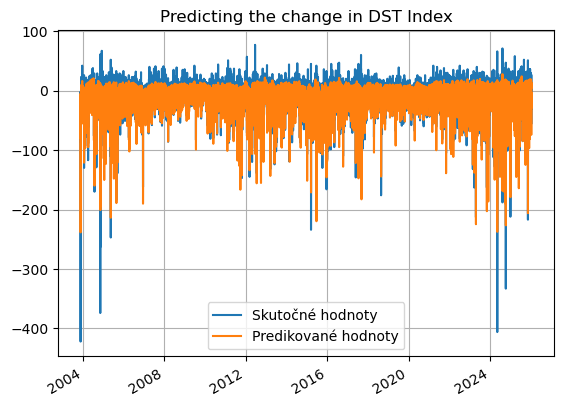

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.8953024903701567
MCC=0.6776805311953038
Výkon NN:
MAE: 6.2115, MSE: 95.5785
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.78%
MSE Improvement: 29.21%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:59 737ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step 

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step 

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.5368572
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.57**2 * RBF(length_scale=0.542) + WhiteKernel(noise_level=0.706)


Global sigma (LSTM errors): 11.8129635
Hybrid prediction with smoothed, inflated interval ready.


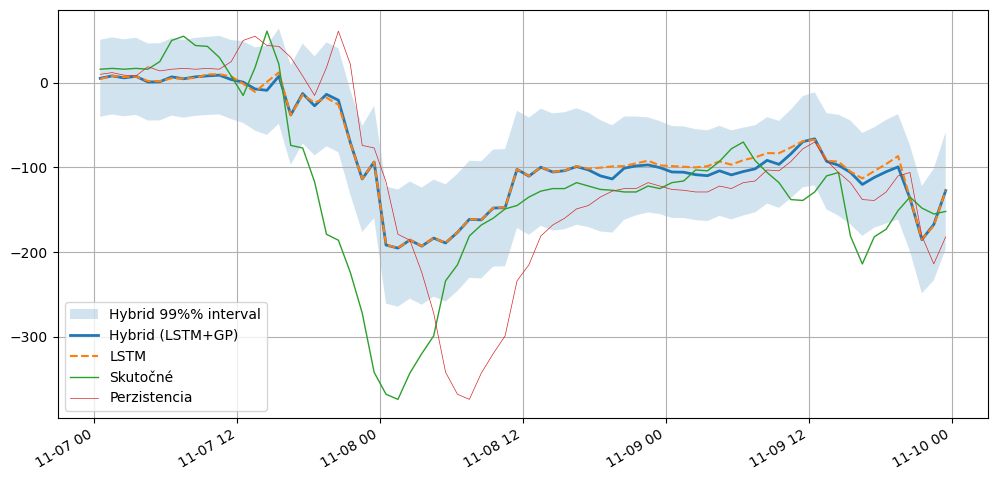

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 102.1212
MAE: 6.4658

--- Klasifikačné metriky (Prah: -20.9 nT) ---
Matthews Correlation Coefficient (MCC): 0.6551

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145033 |        7013
Skutočná 1 |       14571 |       27560

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.91      0.95      0.93    152046
   Trieda 1 (Búrka)       0.80      0.65      0.72     42131

           accuracy                           0.89    194177
          macro avg       0.85      0.80      0.82    194177
       weighted avg       0.88      0.89      0.88    194177



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8952965593247398
MCC=0.6776760106245908
Výkon NN:
MAE: 6.2115, MSE: 95.5785
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.78%
MSE Improvement: 29.21%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9159    0.9539    0.9345    152046
           1     0.8044    0.6837    0.7391     42131

    accuracy                         0.8953    194177
   macro avg     0.8601    0.8188    0.8368    194177
weighted avg     0.8917    0.8953    0.8921    194177


===== LSTM+GP =====
ACC=0.8888436838554514
MCC=0.655118827100796
Výkon NN:
MAE: 6.4658, MSE: 102.1212
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.25%
MSE Improvement: 24.36%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9087    0.9539    0.9307    152046
           1     0.7972    0.6542    0.7186     42131

/tmp/ipykernel_1061909/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_1061909/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
64,2026-04-27T17:10:39,LSTM,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.904319,0.707355,"{""text"": "" precision recall f...",5.772458,81.461973,6.683360,114.014029,13.629403,28.550922
65,2026-04-27T17:10:39,LSTM+GP,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.897810,0.693187,"{""text"": "" precision recall f...",5.992127,86.534260,6.683360,114.014029,10.342596,24.102095
66,2026-04-27T17:31:53,LSTM,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.899004,0.694101,"{""text"": "" precision recall f...",5.899059,83.667158,6.683642,114.018863,11.738854,26.619898
67,2026-04-27T17:31:53,LSTM+GP,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.893504,0.677363,"{""text"": "" precision recall f...",6.125718,90.807561,6.683642,114.018863,8.347604,20.357423
68,2026-04-27T17:47:39,LSTM,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.899004,0.694101,"{""text"": "" precision recall f...",5.899059,83.667158,6.683642,114.018863,11.738854,26.619898
69,2026-04-27T17:47:39,LSTM+GP,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.893504,0.677363,"{""text"": "" precision recall f...",6.125718,90.807561,6.683642,114.018863,8.347604,20.357423
70,2026-04-27T18:37:34,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.895297,0.677676,"{""text"": "" precision recall f...",6.211522,95.578536,7.203881,135.014157,13.775340,29.208508
71,2026-04-27T18:37:34,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.888844,0.655119,"{""text"": "" precision recall f...",6.465791,102.121241,7.203881,135.014157,10.245727,24.362568
72,2026-04-27T18:52:50,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.895297,0.677676,"{""text"": "" precision recall f...",6.211522,95.578536,7.203881,135.014157,13.775340,29.208508
73,2026-04-27T18:52:51,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.888844,0.655119,"{""text"": "" precision recall f...",6.465791,102.121241,7.203881,135.014157,10.245727,24.362568
